### Gradient Descent

#### Let's plot weights vs loss curve and observe the nature

#### Importing necessary libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
plt.style.use('ggplot')

#### Loading the data

In [2]:
df = pd.read_csv("food_trend.txt" ,sep = "\s+")

In [3]:
df.head(n=3)

,Cnt_of_users,Amount_of_food
0,13,33
1,2,16
2,14,32


In [4]:
X = df["Cnt_of_users"]
y = df["Amount_of_food"]

#### Generating the functions from previous chapter

In [5]:
def func_predict(X,w,b=0):
    return (X*w + b)

In [6]:
def func_loss(X,y,w,b=0):
    sq_err = (func_predict(X,w,b) - y)**2
    return np.average(sq_err)
    

#### Generating some random weights and loss values to display the nature of weights vs loss curve

In [7]:
weights = np.linspace(-1,5,200) # 200 equally spaced points btwn -1 and 5
loss = [func_loss(X,y,w) for w in weights] # using list comprehension to generate the loss list 

#### Plotting the graph

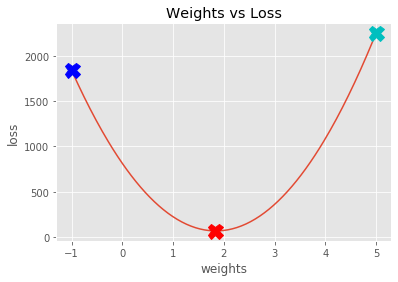

In [8]:
# Some random variables to display few points on the curve depecting someone who intends to descend down
min_wt_idx = np.argmin(loss)
strt_wt = weights[0]
strt_loss = loss[0]
end_wt = weights[-1]
end_loss = loss[-1]
antr_loss = loss[0]

# Plot starts
plt.plot(weights,loss)
plt.xlabel("weights")
plt.ylabel("loss")
plt.title ("Weights vs Loss")
plt.plot(weights[min_wt_idx], loss[min_wt_idx], "rX", markersize=15)
plt.plot(strt_wt, strt_loss, "bX", markersize=15)
plt.plot(end_wt, end_loss, "cX", markersize=15)
plt.show()

#### Observations about of the loss curve: (and these are some prereqs for gradient descent)
- The graph is a convex function
- The graph is continious
- The graph has a global minima
- Both the blue and green points (these are 2 hypothetical people) needs to descend to the red points.

From our previous lesson: (for the training phase)

$loss = (predicted - actual) ** 2/m$ (`m`: # of observations in training phase)

- As can be observed from the curve, **the minimum value of loss is our point of descent**.
- For finding a global minima:
>- we need to take the derivative of the loss function 
 - it should be partial derivatives wrt weights (w) and bias(b) to arrive at the final approximate function of the loss curve.
 
Therefore, the loss function can be expressed as:

*loss(L)* =$1/m$ $\sum_{i=1}^{m}$ $(( X_iw + b)- y_i)^2$

**Logic for algorithm**:
- As we have 2 variables (w and b), we need to find the partial derv. of loss function wrt each one
- Determine the next set of w and b (using the above values) 
- Continue till the train function converges

On differentiating $L$, wrt to $w$ and $b$, we get:
>- $\partial$L/$\partial$w = $2/m$$\sum_{i=1}^{m}$$X_i( X_iw + b)- y_i)$
- $\partial$L/$\partial$b = $2/m$$\sum_{i=1}^{m}$$( X_iw + b)- y_i)$

#### Let's code up the Gradient Descent function real quick

In [9]:
def func_gradient(X,y,w,b):
    w_grad = 2 * np.average(X * (func_predict(X, w, b) - y))
    b_grad = 2 * np.average(func_predict(X, w, b) - y)
    return (w_grad,b_grad)

In [10]:
def func_train_gd(X,y,iterations,lr):
    w = 0
    b = 0
    for seq,i in enumerate(range(iterations)):
        print(f"Iteration:{seq},loss:{func_loss(X,y,w,b)}")
        w_gd, b_gd = func_gradient(X,y,w,b)
        print(f"w_gd:{w_gd}, b_gd:{b_gd}")
        w -=w_gd*lr
        b -=b_gd*lr
        print(f"w:{w}, b:{b}")
        
    return w,b    
        

#### Let's code up the final train function

In [11]:
weight,bias  = func_train_gd(X,y,80000,0.0001)

Iteration:0,loss:812.8666666666667
w_gd:-806.8, b_gd:-53.733333333333334
w:0.08068, b:0.005373333333333333
Iteration:1,loss:748.9205535615644
w_gd:-771.3583075555556, b_gd:-51.67869333333333
w:0.15781583075555555, b:0.010541202666666666
Iteration:2,loss:690.4660923251315
w_gd:-737.4727486604799, b_gd:-49.71424988219259
w:0.23156310562160354, b:0.015512627654885924
Iteration:3,loss:637.0316277385642
w_gd:-705.0749984127293, b_gd:-47.83604273560962
w:0.30207060546287645, b:0.020296231928446887
Iteration:4,loss:588.186013098811
w_gd:-674.0997318405914, b_gd:-46.04028553108357
w:0.3694805786469356, b:0.024900260481555244
Iteration:5,loss:543.5351311097158
w_gd:-644.484492185235, b_gd:-44.32335815331452
w:0.4339290278654591, b:0.029332596296886698
Iteration:6,loss:502.7187135794312
w_gd:-616.169564966554, b_gd:-42.68179943481459
w:0.4955459843621145, b:0.033600776240368155
Iteration:7,loss:465.4074342608649
w_gd:-589.0978575783827, b_gd:-41.11230017701236
w:0.5544557701199527, b:0.037712006

w_gd:-1.75302902760631, b_gd:-7.022504396256073
w:1.8284200096094776, b:0.19835043402650884
Iteration:133,loss:67.74089994413282
w_gd:-1.6585261328877041, b_gd:-7.016658888506883
w:1.8285858622227664, b:0.19905209991535952
Iteration:134,loss:67.73571098204894
w_gd:-1.5681734934616878, b_gd:-7.011053957192533
w:1.8287426795721127, b:0.19975320531107876
Iteration:135,loss:67.73055823497364
w_gd:-1.481788884696179, b_gd:-7.005679040217656
w:1.8288908584605823, b:0.20045377321510052
Iteration:136,loss:67.72543863608304
w_gd:-1.3991980828665653, b_gd:-7.000524039235043
w:1.829030778268869, b:0.20115382561902403
Iteration:137,loss:67.7203493819454
w_gd:-1.320234513860984, b_gd:-6.995579299283937
w:1.8291628017202552, b:0.20185338354895244
Iteration:138,loss:67.71528790989956
w_gd:-1.2447389173095185, b_gd:-6.990835589322294
w:1.8292872756119862, b:0.20255246710788466
Iteration:139,loss:67.71025187737605
w_gd:-1.1725590254617415, b_gd:-6.986284083613911
w:1.8294045315145324, b:0.2032510955162

w_gd:0.3910252455908728, b_gd:-6.85019739439306
w:1.8278757205629566, b:0.2886652301010449
Iteration:264,loss:67.1150708074733
w_gd:0.3912678142429518, b_gd:-6.84981795220301
w:1.8278365937815322, b:0.2893502118962652
Iteration:265,loss:67.11036362302524
w_gd:0.3914988068371542, b_gd:-6.849439200408657
w:1.8277974439008484, b:0.29003515581630607
Iteration:266,loss:67.10565693933819
w_gd:0.3917187316909969, b_gd:-6.8490611095458975
w:1.8277582720276793, b:0.29072006192726063
Iteration:267,loss:67.10095075633497
w_gd:0.3919280748030436, b_gd:-6.848683651444272
w:1.827719079220199, b:0.29140493029240505
Iteration:268,loss:67.09624507394065
w_gd:0.392127300833369, b_gd:-6.848306799170147
w:1.8276798664901157, b:0.2920897609723221
Iteration:269,loss:67.091539892082
w_gd:0.3923168540401439, b_gd:-6.847930526972423
w:1.8276406348047116, b:0.29277455402501934
Iteration:270,loss:67.08683521068765
w_gd:0.39249715917568956, b_gd:-6.847554810230597
w:1.827601385088794, b:0.2934593095060424
Iterati

w_gd:0.3945567607908051, b_gd:-6.80773764040067
w:1.8232974653566643, b:0.3678776204822915
Iteration:380,loss:66.57236252442893
w_gd:0.3945372256276386, b_gd:-6.807375636666589
w:1.8232580116341015, b:0.36855835804595816
Iteration:381,loss:66.5677130457544
w_gd:0.3945176282471266, b_gd:-6.807013655844177
w:1.823218559871277, b:0.36923905941154256
Iteration:382,loss:66.56306406142785
w_gd:0.39449797142982085, b_gd:-6.806651697771236
w:1.823179110074134, b:0.36991972458131966
Iteration:383,loss:66.55841557139672
w_gd:0.39447825783445867, b_gd:-6.806289762292634
w:1.8231396622483504, b:0.37060035355754894
Iteration:384,loss:66.55376757560843
w_gd:0.39445849000274225, b_gd:-6.805927849260025
w:1.8231002163993502, b:0.37128094634247494
Iteration:385,loss:66.54912007401049
w_gd:0.3944386703649594, b_gd:-6.805565958531516
w:1.8230607725323136, b:0.3719615029383281
Iteration:386,loss:66.5444730665503
w_gd:0.39441880124472656, b_gd:-6.805204089971401
w:1.8230213306521892, b:0.3726420233473252
I

Iteration:493,loss:66.0500873977433
w_gd:0.3922051394409678, b_gd:-6.766600537328958
w:1.8188129381974707, b:0.445249047711332
Iteration:494,loss:66.0454934490904
w_gd:0.3921842972335336, b_gd:-6.766240803574747
w:1.8187737197677474, b:0.44592567179168946
Iteration:495,loss:66.0408999888814
w_gd:0.39216345575573114, b_gd:-6.76588108896702
w:1.8187345034221718, b:0.44660225990058616
Iteration:496,loss:66.03630701706426
w_gd:0.39214261502390335, b_gd:-6.765521393503807
w:1.8186952891606694, b:0.4472788120399365
Iteration:497,loss:66.03171453358713
w_gd:0.3921217750540099, b_gd:-6.765161717183167
w:1.818656076983164, b:0.44795532821165485
Iteration:498,loss:66.02712253839803
w_gd:0.39210093586113665, b_gd:-6.764802060003203
w:1.8186168668895777, b:0.44863180841765515
Iteration:499,loss:66.0225310314451
w_gd:0.3920800974597815, b_gd:-6.764442421962057
w:1.8185776588798317, b:0.44930825265985136
Iteration:500,loss:66.01794001267639
w_gd:0.39205925986390894, b_gd:-6.764082803057895
w:1.81853

w_gd:0.38971113252751716, b_gd:-6.723568799529619
w:1.8141215804281832, b:0.5261876375902897
Iteration:614,loss:65.49775080415333
w_gd:0.38969041432697415, b_gd:-6.723211353972113
w:1.8140826113867505, b:0.5268599587256869
Iteration:615,loss:65.49321558175679
w_gd:0.38966969722611444, b_gd:-6.722853927417611
w:1.8140436444170278, b:0.5275322441184287
Iteration:616,loss:65.48868084156011
w_gd:0.38964898122489017, b_gd:-6.722496519865106
w:1.8140046795189053, b:0.5282044937704152
Iteration:617,loss:65.48414658351204
w_gd:0.3896282663234757, b_gd:-6.722139131313569
w:1.813965716692273, b:0.5288767076835466
Iteration:618,loss:65.4796128075613
w_gd:0.3896075525217507, b_gd:-6.721781761761995
w:1.8139267559370207, b:0.5295488858597227
Iteration:619,loss:65.47507951365665
w_gd:0.3895868398199099, b_gd:-6.7214244112093615
w:1.8138877972530387, b:0.5302210283008436
Iteration:620,loss:65.4705467017468
w_gd:0.3895661282177765, b_gd:-6.721067079654666
w:1.813848840640217, b:0.5308931350088091
Iter

Iteration:724,loss:65.00175609525175
w_gd:0.3874181201265008, b_gd:-6.684008131803194
w:1.8098086402393034, b:0.6005974955949136
Iteration:725,loss:64.99727360865569
w_gd:0.38739752379027503, b_gd:-6.683652789414489
w:1.8097699004869243, b:0.601265860873855
Iteration:726,loss:64.99279159865246
w_gd:0.38737692854902217, b_gd:-6.683297465916877
w:1.8097311627940693, b:0.6019341906204467
Iteration:727,loss:64.9883100651914
w_gd:0.38735633440274314, b_gd:-6.682942161309348
w:1.809692427160629, b:0.6026024848365776
Iteration:728,loss:64.98382900822182
w_gd:0.38733574135121907, b_gd:-6.682586875590911
w:1.8096536935864938, b:0.6032707435241367
Iteration:729,loss:64.97934842769307
w_gd:0.3873151493944135, b_gd:-6.682231608760556
w:1.8096149620715543, b:0.6039389666850127
Iteration:730,loss:64.97486832355447
w_gd:0.38729455853249656, b_gd:-6.681876360817266
w:1.809576232615701, b:0.6046071543210944
Iteration:731,loss:64.97038869575539
w_gd:0.3872739687651541, b_gd:-6.681521131760052
w:1.809537

w_gd:0.3850157640784351, b_gd:-6.642561006421556
w:1.8052900367030698, b:0.6785556013498119
Iteration:842,loss:64.4760991130105
w_gd:0.3849952954585675, b_gd:-6.642207867489274
w:1.8052515371735238, b:0.6792198221365607
Iteration:843,loss:64.47167251600612
w_gd:0.38497482792685056, b_gd:-6.641854747330944
w:1.805213039690731, b:0.6798840076112939
Iteration:844,loss:64.46724638965222
w_gd:0.3849543614833626, b_gd:-6.641501645945556
w:1.8051745442545828, b:0.6805481577758884
Iteration:845,loss:64.46282073389872
w_gd:0.3849338961279344, b_gd:-6.641148563332126
w:1.80513605086497, b:0.6812122726322216
Iteration:846,loss:64.45839554869559
w_gd:0.38491343186055216, b_gd:-6.640795499489646
w:1.805097559521784, b:0.6818763521821706
Iteration:847,loss:64.45397083399283
w_gd:0.38489296868102657, b_gd:-6.64044245441713
w:1.8050590702249159, b:0.6825403964276123
Iteration:848,loss:64.44954658974036
w_gd:0.38487250658933525, b_gd:-6.640089428113573
w:1.805020582974257, b:0.6832044053704237
Iteratio

w_gd:0.38264864766413825, b_gd:-6.601721859926189
w:1.8008377155813142, b:0.7553701565725447
Iteration:958,loss:63.965740453637196
w_gd:0.38262830488759647, b_gd:-6.6013708921282825
w:1.8007994527508255, b:0.7560302936617576
Iteration:959,loss:63.96136811965611
w_gd:0.38260796319246754, b_gd:-6.601019942988903
w:1.8007611919545063, b:0.7566903956560564
Iteration:960,loss:63.95699625055608
w_gd:0.3825876225787733, b_gd:-6.6006690125070575
w:1.8007229331922485, b:0.7573504625573072
Iteration:961,loss:63.952624846287605
w_gd:0.38256728304638016, b_gd:-6.600318100681756
w:1.800684676463944, b:0.7580104943673753
Iteration:962,loss:63.94825390680137
w_gd:0.3825469445953961, b_gd:-6.599967207512003
w:1.8006464217694844, b:0.7586704910881266
Iteration:963,loss:63.94388343204788
w_gd:0.3825266072255687, b_gd:-6.599616332996808
w:1.8006081691087619, b:0.7593304527214263
Iteration:964,loss:63.93951342197776
w_gd:0.38250627093703005, b_gd:-6.59926547713518
w:1.8005699184816681, b:0.759990379269139

w_gd:0.3803567440954126, b_gd:-6.562180338001325
w:1.7965268626776558, b:0.8297440032403084
Iteration:1071,loss:63.47459694190868
w_gd:0.3803365231633241, b_gd:-6.561831472352103
w:1.7964888290253396, b:0.8304001863875436
Iteration:1072,loss:63.47027682793278
w_gd:0.38031630330635646, b_gd:-6.5614826252496465
w:1.796450797395009, b:0.8310563346500686
Iteration:1073,loss:63.46595717328567
w_gd:0.38029608452435987, b_gd:-6.561133796692968
w:1.7964127677865567, b:0.8317124480297379
Iteration:1074,loss:63.46163797791857
w_gd:0.38027586681726006, b_gd:-6.560784986681087
w:1.7963747401998749, b:0.832368526528406
Iteration:1075,loss:63.457319241782606
w_gd:0.3802556501848249, b_gd:-6.560436195213028
w:1.7963367146348563, b:0.8330245701479273
Iteration:1076,loss:63.45300096482899
w_gd:0.3802354346272646, b_gd:-6.560087422287787
w:1.7962986910913936, b:0.8336805788901561
Iteration:1077,loss:63.448683147008865
w_gd:0.3802152201444272, b_gd:-6.5597386679043845
w:1.7962606695693792, b:0.8343365527

w_gd:0.3783801935842111, b_gd:-6.528079507391137
w:1.7928091589197577, b:0.8938844263597012
Iteration:1169,loss:63.05340155294354
w_gd:0.3783600777317242, b_gd:-6.527732454646736
w:1.7927713229119846, b:0.8945371996051659
Iteration:1170,loss:63.04912622185667
w_gd:0.37833996294869604, b_gd:-6.527385420352724
w:1.7927334889156896, b:0.8951899381472012
Iteration:1171,loss:63.04485134533711
w_gd:0.3783198492349337, b_gd:-6.527038404508124
w:1.7926956569307662, b:0.895842641987652
Iteration:1172,loss:63.04057692333659
w_gd:0.37829973659040045, b_gd:-6.526691407111955
w:1.7926578269571072, b:0.8964953111283631
Iteration:1173,loss:63.036302955806796
w_gd:0.3782796250152605, b_gd:-6.526344428163227
w:1.7926199989946057, b:0.8971479455711794
Iteration:1174,loss:63.032029442699375
w_gd:0.37825951450931067, b_gd:-6.525997467660964
w:1.7925821730431548, b:0.8978005453179455
Iteration:1175,loss:63.02775638396602
w_gd:0.37823940507246523, b_gd:-6.525650525604188
w:1.7925443491026476, b:0.8984531103

w_gd:0.3762338507789707, b_gd:-6.491049301476445
w:1.788772091985567, b:0.9635347261637563
Iteration:1276,loss:62.598509411625884
w_gd:0.3762138490326109, b_gd:-6.490704217371457
w:1.7887344706006638, b:0.9641837965854935
Iteration:1277,loss:62.59428244617835
w_gd:0.3761938483496863, b_gd:-6.4903591516121955
w:1.7886968512158288, b:0.9648328325006547
Iteration:1278,loss:62.59005593015578
w_gd:0.3761738487299302, b_gd:-6.490014104197695
w:1.7886592338309557, b:0.9654818339110744
Iteration:1279,loss:62.585829863510384
w_gd:0.3761538501735089, b_gd:-6.489669075126971
w:1.7886216184459383, b:0.9661308008185872
Iteration:1280,loss:62.58160424619439
w_gd:0.37613385268013816, b_gd:-6.4893240643990575
w:1.7885840050606703, b:0.9667797332250271
Iteration:1281,loss:62.577379078160014
w_gd:0.376113856249979, b_gd:-6.488979072012967
w:1.7885463936750452, b:0.9674286311322284
Iteration:1282,loss:62.57315435935954
w_gd:0.37609386088291785, b_gd:-6.48863409796773
w:1.7885087842889569, b:0.96807749454

w_gd:0.37378159724452664, b_gd:-6.448741309896158
w:1.7841596360285494, b:1.0431120394647746
Iteration:1399,loss:62.08195028257885
w_gd:0.37376172586752576, b_gd:-6.448398475013865
w:1.7841222598559627, b:1.043756879312276
Iteration:1400,loss:62.07777823940908
w_gd:0.373741855547001, b_gd:-6.448055658357721
w:1.7840848856704081, b:1.0444016848781117
Iteration:1401,loss:62.07360663982478
w_gd:0.37372198628275394, b_gd:-6.447712859926772
w:1.78404751347178, b:1.0450464561641044
Iteration:1402,loss:62.06943548377872
w_gd:0.37370211807484, b_gd:-6.447370079720034
w:1.7840101432599724, b:1.0456911931720765
Iteration:1403,loss:62.06526477122383
w_gd:0.3736822509231951, b_gd:-6.447027317736547
w:1.7839727750348802, b:1.0463358959038502
Iteration:1404,loss:62.06109450211289
w_gd:0.3736623848277816, b_gd:-6.446684573975333
w:1.7839354087963974, b:1.0469805643612478
Iteration:1405,loss:62.05692467639879
w_gd:0.37364251978847374, b_gd:-6.446341848435433
w:1.7838980445444186, b:1.0476251985460914


w_gd:0.3715428035578346, b_gd:-6.410116076767063
w:1.779948677767879, b:1.115762433946504
Iteration:1512,loss:61.613305402669866
w_gd:0.37152305120199003, b_gd:-6.409775295320723
w:1.7799115254627589, b:1.1164034114760362
Iteration:1513,loss:61.60918318737617
w_gd:0.3715032998961822, b_gd:-6.40943453199137
w:1.7798743751327692, b:1.1170443549292353
Iteration:1514,loss:61.60506141037006
w_gd:0.37148354964043195, b_gd:-6.409093786778042
w:1.7798372267778053, b:1.1176852643079132
Iteration:1515,loss:61.60094007160497
w_gd:0.3714638004347653, b_gd:-6.408753059679772
w:1.7798000803977618, b:1.118326139613881
Iteration:1516,loss:61.596819171034234
w_gd:0.37144405227890426, b_gd:-6.408412350695604
w:1.779762935992534, b:1.1189669808489506
Iteration:1517,loss:61.59269870861132
w_gd:0.3714243051729582, b_gd:-6.4080716598245715
w:1.7797257935620168, b:1.119607788014933
Iteration:1518,loss:61.588578684289594
w_gd:0.3714045591168324, b_gd:-6.407730987065709
w:1.7796886531061051, b:1.12024856111363

w_gd:0.3692388893704072, b_gd:-6.3703673392575615
w:1.7756152340315656, b:1.190526033445445
Iteration:1629,loss:61.13396834740101
w_gd:0.3692192594977134, b_gd:-6.370028670976116
w:1.775578312105616, b:1.1911630363125427
Iteration:1630,loss:61.12989709681092
w_gd:0.36919963066862826, b_gd:-6.36969002069931
w:1.7755413921425491, b:1.1918000053146127
Iteration:1631,loss:61.12582627908965
w_gd:0.36918000288301156, b_gd:-6.369351388426198
w:1.7755044741422608, b:1.1924369404534554
Iteration:1632,loss:61.121755894191224
w_gd:0.36916037614083164, b_gd:-6.369012774155818
w:1.7754675581046466, b:1.193073841730871
Iteration:1633,loss:61.117685942069606
w_gd:0.3691407504421079, b_gd:-6.368674177887209
w:1.7754306440296024, b:1.1937107091486598
Iteration:1634,loss:61.11361642267878
w_gd:0.3691211257867394, b_gd:-6.368335599619418
w:1.7753937319170237, b:1.1943475427086219
Iteration:1635,loss:61.109547335972735
w_gd:0.36910150217461063, b_gd:-6.367997039351491
w:1.775356821766806, b:1.194984342412

w_gd:0.3671834403179195, b_gd:-6.334905295879038
w:1.771749129612053, b:1.2572267684796605
Iteration:1734,loss:60.708841895031156
w_gd:0.3671639197192041, b_gd:-6.334568512868663
w:1.7717124132200812, b:1.2578602253309474
Iteration:1735,loss:60.70481584529374
w_gd:0.36714440015817096, b_gd:-6.334231747762717
w:1.7716756987800655, b:1.2584936485057236
Iteration:1736,loss:60.70079022361933
w_gd:0.3671248816350252, b_gd:-6.333895000560225
w:1.771638986291902, b:1.2591270380057797
Iteration:1737,loss:60.69676502996231
w_gd:0.3671053641493837, b_gd:-6.333558271260258
w:1.771602275755487, b:1.2597603938329058
Iteration:1738,loss:60.6927402642772
w_gd:0.3670858477013823, b_gd:-6.333221559861851
w:1.771565567170717, b:1.260393715988892
Iteration:1739,loss:60.688715926518526
w_gd:0.367066332290967, b_gd:-6.332884866364053
w:1.7715288605374877, b:1.2610270044755285
Iteration:1740,loss:60.68469201664079
w_gd:0.36704681791802424, b_gd:-6.33254819076592
w:1.771492155855696, b:1.2616602592946051
Ite

w_gd:0.36496476312183007, b_gd:-6.2966271265075475
w:1.7675760085598236, b:1.3292243690011571
Iteration:1848,loss:60.252618466357276
w_gd:0.3649453604747876, b_gd:-6.296292378482154
w:1.7675395140237762, b:1.3298539982390054
Iteration:1849,loss:60.2486409238061
w_gd:0.3649259588592339, b_gd:-6.295957648252994
w:1.7675030214278902, b:1.3304835940038306
Iteration:1850,loss:60.24466380416047
w_gd:0.364906558275122, b_gd:-6.295622935819122
w:1.7674665307720627, b:1.3311131562974126
Iteration:1851,loss:60.24068710737536
w_gd:0.364887158722424, b_gd:-6.295288241179588
w:1.7674300420561906, b:1.3317426851215306
Iteration:1852,loss:60.23671083340582
w_gd:0.36486776020112804, b_gd:-6.294953564333445
w:1.7673935552801705, b:1.332372180477964
Iteration:1853,loss:60.23273498220689
w_gd:0.36484836271101434, b_gd:-6.294618905279753
w:1.7673570704438994, b:1.333001642368492
Iteration:1854,loss:60.22875955373364
w_gd:0.36482896625222927, b_gd:-6.294284264017561
w:1.7673205875472742, b:1.33363107079489

w_gd:0.3628945186779096, b_gd:-6.260909822697346
w:1.7636820754144675, b:1.3964052246600156
Iteration:1955,loss:59.82941081027253
w_gd:0.36287522609136, b_gd:-6.2605769735134595
w:1.7636457878918583, b:1.397031282357367
Iteration:1956,loss:59.825478264561305
w_gd:0.36285593453052056, b_gd:-6.260244142024855
w:1.7636095022984053, b:1.3976573067715694
Iteration:1957,loss:59.821546136971385
w_gd:0.3628366439952567, b_gd:-6.259911328230593
w:1.7635732186340058, b:1.3982832979043924
Iteration:1958,loss:59.81761442745828
w_gd:0.3628173544855718, b_gd:-6.259578532129733
w:1.7635369368985574, b:1.3989092557576055
Iteration:1959,loss:59.81368313597755
w_gd:0.3627980660014221, b_gd:-6.259245753721334
w:1.7635006570919574, b:1.3995351803329776
Iteration:1960,loss:59.809752262484764
w_gd:0.36277877854260365, b_gd:-6.25891299300446
w:1.7634643792141032, b:1.400161071632278
Iteration:1961,loss:59.80582180693546
w_gd:0.3627594921092395, b_gd:-6.258580249978163
w:1.7634281032648922, b:1.40078692965727

w_gd:0.36089357316261894, b_gd:-6.226388112433553
w:1.7599184869715951, b:1.4613372824282538
Iteration:2059,loss:59.42265743998455
w_gd:0.36087438695245166, b_gd:-6.22605709852975
w:1.7598823995328998, b:1.4619598881381068
Iteration:2060,loss:59.418768141639084
w_gd:0.3608552017623173, b_gd:-6.225726102223659
w:1.7598463140127236, b:1.4625824607483293
Iteration:2061,loss:59.41487925681671
w_gd:0.36083601759216605, b_gd:-6.225395123514344
w:1.7598102304109644, b:1.4632050002606807
Iteration:2062,loss:59.41099078547345
w_gd:0.3608168344419307, b_gd:-6.225064162400873
w:1.7597741487275202, b:1.4638275066769209
Iteration:2063,loss:59.40710272756533
w_gd:0.3607976523115113, b_gd:-6.224733218882315
w:1.759738068962289, b:1.464449979998809
Iteration:2064,loss:59.403215083048444
w_gd:0.3607784712008458, b_gd:-6.224402292957726
w:1.759701991115169, b:1.465072420228105
Iteration:2065,loss:59.39932785187875
w_gd:0.3607592911099128, b_gd:-6.2240713846261775
w:1.759665915186058, b:1.465694827366567

w_gd:0.35905634044469587, b_gd:-6.194690889743035
w:1.7564628267485798, b:1.5209567473708834
Iteration:2155,loss:59.051164197556176
w_gd:0.35903725190755204, b_gd:-6.19436156096088
w:1.756426923023389, b:1.5215761835269794
Iteration:2156,loss:59.047314397602875
w_gd:0.35901816438522377, b_gd:-6.194032249686852
w:1.7563910212069507, b:1.522195586751948
Iteration:2157,loss:59.043465006973044
w_gd:0.3589990778776463, b_gd:-6.193702955920018
w:1.7563551212991628, b:1.52281495704754
Iteration:2158,loss:59.03961602562318
w_gd:0.3589799923846068, b_gd:-6.193373679659465
w:1.7563192232999243, b:1.523434294415506
Iteration:2159,loss:59.035767453509784
w_gd:0.3589609079063692, b_gd:-6.19304442090424
w:1.7562833272091336, b:1.5240535988575963
Iteration:2160,loss:59.03191929058931
w_gd:0.35894182444264827, b_gd:-6.1927151796534226
w:1.7562474330266893, b:1.5246728703755617
Iteration:2161,loss:59.02807153681825
w_gd:0.35892274199346164, b_gd:-6.192385955906081
w:1.7562115407524899, b:1.525292108971

w_gd:0.35707655806416483, b_gd:-6.160534300664837
w:1.7527390441514754, b:1.5852020468720787
Iteration:2259,loss:58.65296943494389
w_gd:0.3570575747782868, b_gd:-6.160206787751799
w:1.7527033383939976, b:1.5858180675508537
Iteration:2260,loss:58.64916197237684
w_gd:0.35703859250166187, b_gd:-6.159879292250352
w:1.7526676345347474, b:1.5864340554800789
Iteration:2261,loss:58.645354914631795
w_gd:0.357019611234081, b_gd:-6.159551814159577
w:1.752631932573624, b:1.5870500106614949
Iteration:2262,loss:58.64154826166576
w_gd:0.35700063097571993, b_gd:-6.159224353478536
w:1.7525962325105264, b:1.5876659330968428
Iteration:2263,loss:58.63774201343566
w_gd:0.35698165172640633, b_gd:-6.15889691020631
w:1.7525605343453539, b:1.5882818227878635
Iteration:2264,loss:58.6339361698985
w_gd:0.35696267348605254, b_gd:-6.158569484341976
w:1.7525248380780052, b:1.5888976797362977
Iteration:2265,loss:58.63013073101122
w_gd:0.35694369625462674, b_gd:-6.158242075884605
w:1.7524891437083798, b:1.589513503943

w_gd:0.35473031023811546, b_gd:-6.120055193640542
w:1.7483259748623166, b:1.6613394020501133
Iteration:2383,loss:58.18391794390971
w_gd:0.35471145168591345, b_gd:-6.119729832721088
w:1.748290503717148, b:1.6619513750333854
Iteration:2384,loss:58.18016035245096
w_gd:0.35469259413629856, b_gd:-6.11940448909882
w:1.7482550344577343, b:1.6625633154822952
Iteration:2385,loss:58.1764031605118
w_gd:0.3546737375893471, b_gd:-6.119079162772808
w:1.7482195670839753, b:1.6631752233985724
Iteration:2386,loss:58.172646368049755
w_gd:0.3546548820447886, b_gd:-6.118753853742147
w:1.7481841015957709, b:1.6637870987839465
Iteration:2387,loss:58.16888997502229
w_gd:0.3546360275026667, b_gd:-6.118428562005911
w:1.7481486379930207, b:1.664398941640147
Iteration:2388,loss:58.165133981386944
w_gd:0.3546171739628633, b_gd:-6.1181032875631844
w:1.7481131762756243, b:1.6650107519689032
Iteration:2389,loss:58.16137838710133
w_gd:0.35459832142538705, b_gd:-6.117778030413047
w:1.7480777164434818, b:1.665622529771

w_gd:0.3524744274478517, b_gd:-6.081135127356267
w:1.7440828736212737, b:1.7345443496903679
Iteration:2503,loss:57.735847646019806
w_gd:0.35245568882533007, b_gd:-6.080811835546999
w:1.744047628052391, b:1.7351524308739226
Iteration:2504,loss:57.73213769487942
w_gd:0.3524369511990642, b_gd:-6.080488560924914
w:1.7440123843572712, b:1.735760479730015
Iteration:2505,loss:57.728428138193365
w_gd:0.35241821456897404, b_gd:-6.080165303489096
w:1.7439771425358144, b:1.7363684962603638
Iteration:2506,loss:57.72471897591962
w_gd:0.3523994789349108, b_gd:-6.079842063238641
w:1.7439419025879208, b:1.7369764804666876
Iteration:2507,loss:57.72101020801633
w_gd:0.35238074429689115, b_gd:-6.07951884017263
w:1.743906664513491, b:1.7375844323507048
Iteration:2508,loss:57.71730183444152
w_gd:0.3523620106549222, b_gd:-6.079195634290147
w:1.7438714283124255, b:1.7381923519141338
Iteration:2509,loss:57.71359385515328
w_gd:0.35234327800880955, b_gd:-6.078872445590284
w:1.7438361939846245, b:1.7388002391586

w_gd:0.3502328907874807, b_gd:-6.04246257053256
w:1.73986675608811, b:1.8072837555463819
Iteration:2623,loss:57.293458171039156
w_gd:0.35021427133195004, b_gd:-6.042141334675114
w:1.7398317346609768, b:1.8078879696798493
Iteration:2624,loss:57.28979525621324
w_gd:0.3501956528662845, b_gd:-6.041820115895555
w:1.7397967150956901, b:1.808492151691439
Iteration:2625,loss:57.28613273084056
w_gd:0.35017703539041684, b_gd:-6.041498914192974
w:1.739761697392151, b:1.8090963015828583
Iteration:2626,loss:57.282470594879705
w_gd:0.3501584189043342, b_gd:-6.041177729566458
w:1.7397266815502606, b:1.8097004193558148
Iteration:2627,loss:57.2788088482893
w_gd:0.3501398034079813, b_gd:-6.0408565620151045
w:1.7396916675699197, b:1.8103045050120163
Iteration:2628,loss:57.27514749102789
w_gd:0.3501211889012263, b_gd:-6.040535411538005
w:1.7396566554510295, b:1.8109085585531701
Iteration:2629,loss:57.27148652305414
w_gd:0.35010257538419914, b_gd:-6.0402142781342425
w:1.7396216451934912, b:1.81151257998098

w_gd:0.34822769831782807, b_gd:-6.007867588845996
w:1.736095179527678, b:1.8723536299007644
Iteration:2731,loss:56.900105200509344
w_gd:0.3482091854646062, b_gd:-6.007548192163961
w:1.7360603586091314, b:1.8729543847199808
Iteration:2732,loss:56.89648410827428
w_gd:0.34819067359545336, b_gd:-6.007228812462042
w:1.7360255395417719, b:1.873555107601227
Iteration:2733,loss:56.89286340104575
w_gd:0.34817216271043916, b_gd:-6.006909449739327
w:1.735990722325501, b:1.8741557985462007
Iteration:2734,loss:56.8892430787828
w_gd:0.3481536528095603, b_gd:-6.006590103994912
w:1.73595590696022, b:1.8747564575566003
Iteration:2735,loss:56.88562314144452
w_gd:0.34813514389277317, b_gd:-6.006270775227896
w:1.7359210934458307, b:1.875357084634123
Iteration:2736,loss:56.88200358898998
w_gd:0.3481166359599816, b_gd:-6.005951463437375
w:1.7358862817822347, b:1.8759576797804667
Iteration:2737,loss:56.878384421378215
w_gd:0.348098129011107, b_gd:-6.005632168622452
w:1.7358514719693336, b:1.8765582429973289


w_gd:0.3461787685519099, b_gd:-5.972518020751384
w:1.7322413372665428, b:1.9388428096100094
Iteration:2842,loss:56.50050537320667
w_gd:0.34616036462603694, b_gd:-5.972200503360896
w:1.7322067212300802, b:1.9394400296603456
Iteration:2843,loss:56.496926767748995
w_gd:0.34614196167853895, b_gd:-5.971883002850609
w:1.7321721070339124, b:1.9400372179606307
Iteration:2844,loss:56.49334854278051
w_gd:0.3461235597093823, b_gd:-5.971565519219625
w:1.7321374946779415, b:1.9406343745125527
Iteration:2845,loss:56.489770698260735
w_gd:0.3461051587185672, b_gd:-5.971248052467043
w:1.7321028841620696, b:1.9412314993177995
Iteration:2846,loss:56.486193234149255
w_gd:0.34608675870590183, b_gd:-5.970930602591972
w:1.732068275486199, b:1.9418285923780587
Iteration:2847,loss:56.48261615040558
w_gd:0.3460683596714418, b_gd:-5.97061316959351
w:1.7320336686502318, b:1.942425653695018
Iteration:2848,loss:56.47903944698934
w_gd:0.34604996161524515, b_gd:-5.970295753470756
w:1.7319990636540703, b:1.94302268327

w_gd:0.3442333872300215, b_gd:-5.938954942777565
w:1.7285822597931435, b:2.0019717711018536
Iteration:2948,loss:56.12328283378477
w_gd:0.3442150867265203, b_gd:-5.938639209703325
w:1.7285478382844708, b:2.002565635022824
Iteration:2949,loss:56.119744335877094
w_gd:0.344196787195952, b_gd:-5.938323493414426
w:1.7285134186057511, b:2.003159467372165
Iteration:2950,loss:56.11620621419421
w_gd:0.3441784886381941, b_gd:-5.938007793909975
w:1.7284790007568873, b:2.003753268151556
Iteration:2951,loss:56.112668468696185
w_gd:0.3441601910533379, b_gd:-5.937692111189075
w:1.728444584737782, b:2.0043470373626753
Iteration:2952,loss:56.109131099342946
w_gd:0.34414189444121845, b_gd:-5.9373764452508375
w:1.728410170548338, b:2.0049407750072006
Iteration:2953,loss:56.10559410609453
w_gd:0.3441235988017292, b_gd:-5.9370607960943715
w:1.7283757581884578, b:2.00553448108681
Iteration:2954,loss:56.102057488910965
w_gd:0.3441053041349794, b_gd:-5.936745163718784
w:1.7283413476580443, b:2.006128155603182


w_gd:0.3421715748245193, b_gd:-5.903383114387443
w:1.724704186511205, b:2.068879001314342
Iteration:3061,loss:55.72580398240964
w_gd:0.3421533839332992, b_gd:-5.903069272420791
w:1.7246699711728115, b:2.069469308241584
Iteration:3062,loss:55.722307745770145
w_gd:0.34213519400912606, b_gd:-5.902755447138943
w:1.7246357576534106, b:2.070059583786298
Iteration:3063,loss:55.71881188086207
w_gd:0.34211700505199855, b_gd:-5.902441638541004
w:1.7246015459529054, b:2.070649827950152
Iteration:3064,loss:55.71531638764598
w_gd:0.34209881706189266, b_gd:-5.902127846626093
w:1.7245673360711993, b:2.0712400407348146
Iteration:3065,loss:55.71182126608228
w_gd:0.3420806300387549, b_gd:-5.901814071393323
w:1.7245331280081955, b:2.071830222141954
Iteration:3066,loss:55.708326516131486
w_gd:0.34206244398250335, b_gd:-5.901500312841807
w:1.7244989217637972, b:2.072420372173238
Iteration:3067,loss:55.70483213775411
w_gd:0.3420442588930186, b_gd:-5.901186570970664
w:1.724464717337908, b:2.073010490830335
I

w_gd:0.34019444915911473, b_gd:-5.869272360815591
w:1.7209854009429453, b:2.1330380885820444
Iteration:3170,loss:55.34689392603807
w_gd:0.34017636337799784, b_gd:-5.868960332281299
w:1.7209513833066075, b:2.1336249846152726
Iteration:3171,loss:55.34343797637094
w_gd:0.34015827855835046, b_gd:-5.868648320335397
w:1.7209173674787517, b:2.1342118494473064
Iteration:3172,loss:55.33998239415182
w_gd:0.34014019470014795, b_gd:-5.868336324977012
w:1.7208833534592816, b:2.1347986830798042
Iteration:3173,loss:55.33652717934167
w_gd:0.34012211180331253, b_gd:-5.868024346205259
w:1.7208493412481012, b:2.135385485514425
Iteration:3174,loss:55.3330723319014
w_gd:0.3401040298678737, b_gd:-5.867712384019252
w:1.7208153308451144, b:2.1359722567528268
Iteration:3175,loss:55.32961785179199
w_gd:0.3400859488936995, b_gd:-5.867400438418116
w:1.720781322250225, b:2.1365589967966687
Iteration:3176,loss:55.32616373897428
w_gd:0.34006786888071, b_gd:-5.867088509400963
w:1.720747315463337, b:2.1371457056476086

w_gd:0.3382467298973545, b_gd:-5.835668947064011
w:1.717321926026147, b:2.1962429178403013
Iteration:3278,loss:54.975766522816734
w_gd:0.33822874766286215, b_gd:-5.835358704990341
w:1.7172881031513807, b:2.1968264537108
Iteration:3279,loss:54.97235003264454
w_gd:0.33821076638445313, b_gd:-5.83504847941009
w:1.7172542820747423, b:2.197409958558741
Iteration:3280,loss:54.9689339057249
w_gd:0.33819278606202446, b_gd:-5.834738270322379
w:1.717220462796136, b:2.1979934323857733
Iteration:3281,loss:54.965518142019164
w_gd:0.3381748066953548, b_gd:-5.83442807772634
w:1.7171866453154665, b:2.1985768751935457
Iteration:3282,loss:54.962102741488785
w_gd:0.33815682828464255, b_gd:-5.834117901621089
w:1.717152829632638, b:2.199160286983708
Iteration:3283,loss:54.95868770409507
w_gd:0.3381388508296221, b_gd:-5.8338077420057575
w:1.7171190157475549, b:2.1997436677579083
Iteration:3284,loss:54.955273029799464
w_gd:0.3381208743303195, b_gd:-5.833497598879461
w:1.7170852036601219, b:2.2003270175177962


w_gd:0.3360420725087602, b_gd:-5.797632657211534
w:1.7131751749004165, b:2.2677855659628334
Iteration:3401,loss:54.55825206483277
w_gd:0.3360242074806886, b_gd:-5.797324437263781
w:1.7131415724796684, b:2.2683652984065596
Iteration:3402,loss:54.5548799661808
w_gd:0.3360063434023497, b_gd:-5.797016233701951
w:1.7131079718453281, b:2.26894500002993
Iteration:3403,loss:54.55150822606155
w_gd:0.33598848027381223, b_gd:-5.79670804652516
w:1.7130743729973008, b:2.269524670834582
Iteration:3404,loss:54.54813684443689
w_gd:0.3359706180949336, b_gd:-5.796399875732548
w:1.7130407759354913, b:2.2701043108221555
Iteration:3405,loss:54.54476582126867
w_gd:0.3359527568656025, b_gd:-5.796091721323243
w:1.7130071806598048, b:2.270683919994288
Iteration:3406,loss:54.54139515651882
w_gd:0.3359348965859153, b_gd:-5.795783583296367
w:1.7129735871701461, b:2.2712634983526176
Iteration:3407,loss:54.5380248501492
w_gd:0.33591703725560057, b_gd:-5.795475461651062
w:1.7129399954664206, b:2.2718430458987826
Ite

w_gd:0.33365660229658495, b_gd:-5.75647685817169
w:1.7086883320285007, b:2.3451957145427214
Iteration:3535,loss:54.10957083586252
w_gd:0.33363886408748156, b_gd:-5.756170826192543
w:1.708654968142092, b:2.3457713316253406
Iteration:3536,loss:54.10624644248519
w_gd:0.33362112682142114, b_gd:-5.75586481048299
w:1.7086216060294097, b:2.3463469181063887
Iteration:3537,loss:54.102922402568325
w_gd:0.333603390498241, b_gd:-5.755558811042175
w:1.7085882456903598, b:2.346922473987493
Iteration:3538,loss:54.0995987160744
w_gd:0.3335856551179153, b_gd:-5.755252827869232
w:1.708554887124848, b:2.34749799927028
Iteration:3539,loss:54.09627538296586
w_gd:0.3335679206805916, b_gd:-5.75494686096329
w:1.7085215303327799, b:2.3480734939563765
Iteration:3540,loss:54.09295240320508
w_gd:0.33355018718600554, b_gd:-5.754640910323491
w:1.7084881753140613, b:2.348648958047409
Iteration:3541,loss:54.08962977675451
w_gd:0.3335324546341847, b_gd:-5.754334975948965
w:1.7084548220685978, b:2.3492243915450035
Iter

w_gd:0.3316934071015529, b_gd:-5.7226064428082255
w:1.7049957483516467, b:2.408902748470316
Iteration:3646,loss:53.74271273525349
w_gd:0.3316757732619204, b_gd:-5.72230221148432
w:1.7049625807743205, b:2.409474978691464
Iteration:3647,loss:53.73942734744466
w_gd:0.33165814035974606, b_gd:-5.7219979963342835
w:1.7049294149602845, b:2.4100471784910975
Iteration:3648,loss:53.736142308949105
w_gd:0.33164050839499737, b_gd:-5.721693797357263
w:1.704896250909445, b:2.410619347870833
Iteration:3649,loss:53.73285761972978
w_gd:0.3316228773675974, b_gd:-5.721389614552391
w:1.7048630886217082, b:2.4111914868322883
Iteration:3650,loss:53.72957327974947
w_gd:0.3316052472774738, b_gd:-5.721085447918815
w:1.7048299280969805, b:2.41176359537708
Iteration:3651,loss:53.726289288971046
w_gd:0.33158761812472193, b_gd:-5.720781297455664
w:1.704796769335168, b:2.4123356735068255
Iteration:3652,loss:53.723005647357425
w_gd:0.3315699899090641, b_gd:-5.720477163162095
w:1.7047636123361771, b:2.412907721223142

w_gd:0.32970670387337364, b_gd:-5.6883304504343055
w:1.701258948297978, b:2.4733726342285958
Iteration:3759,loss:53.373665697033665
w_gd:0.329689175652958, b_gd:-5.688028041327365
w:1.7012259793804128, b:2.4739414370327286
Iteration:3760,loss:53.37041954752845
w_gd:0.32967164836440593, b_gd:-5.6877256482974206
w:1.7011930122155763, b:2.4745102095975584
Iteration:3761,loss:53.36717374316462
w_gd:0.3296541220077041, b_gd:-5.687423271343615
w:1.7011600468033754, b:2.4750789519246927
Iteration:3762,loss:53.36392828390542
w_gd:0.32963659658262995, b_gd:-5.687120910465103
w:1.701127083143717, b:2.475647664015739
Iteration:3763,loss:53.36068316971423
w_gd:0.3296190720892978, b_gd:-5.6868185656610235
w:1.701094121236508, b:2.4762163458723054
Iteration:3764,loss:53.357438400554315
w_gd:0.3296015485276075, b_gd:-5.686516236930521
w:1.7010611610816553, b:2.4767849974959986
Iteration:3765,loss:53.35419397638903
w_gd:0.32958402589763336, b_gd:-5.686213924272736
w:1.7010282026790655, b:2.47735361888

w_gd:0.32762737464821495, b_gd:-5.652456409626418
w:1.6973479275417103, b:2.540848297291536
Iteration:3878,loss:52.989787126150354
w_gd:0.32760995697132717, b_gd:-5.6521559076936
w:1.697315166546013, b:2.541413512882305
Iteration:3879,loss:52.98658179188644
w_gd:0.32759254022042134, b_gd:-5.651855421736388
w:1.697282407291991, b:2.5419786984244785
Iteration:3880,loss:52.983376798424274
w_gd:0.32757512439540526, b_gd:-5.651554951753938
w:1.6972496497795515, b:2.542543853919654
Iteration:3881,loss:52.98017214572766
w_gd:0.3275577094962865, b_gd:-5.651254497745388
w:1.6972168940086019, b:2.5431089793694284
Iteration:3882,loss:52.97696783376032
w_gd:0.32754029552304187, b_gd:-5.650954059709895
w:1.6971841399790495, b:2.5436740747753994
Iteration:3883,loss:52.973763862486024
w_gd:0.3275228824755137, b_gd:-5.650653637646614
w:1.697151387690802, b:2.544239140139164
Iteration:3884,loss:52.97056023186858
w_gd:0.3275054703537485, b_gd:-5.650353231554689
w:1.6971186371437665, b:2.5448041754623194

Iteration:3984,loss:52.65191128456196
w_gd:0.3257689246809074, b_gd:-5.6203931321287595
w:1.6938523596886503, b:2.6011562765546685
Iteration:3985,loss:52.64874187437678
w_gd:0.32575160580497453, b_gd:-5.620094334778189
w:1.6938197845280698, b:2.6017182859881465
Iteration:3986,loss:52.64557280117381
w_gd:0.3257342878497655, b_gd:-5.6197955533126045
w:1.6937872110992849, b:2.602280265543478
Iteration:3987,loss:52.64240406491719
w_gd:0.3257169708151553, b_gd:-5.619496787731161
w:1.6937546394022034, b:2.602842215222251
Iteration:3988,loss:52.63923566557112
w_gd:0.32569965470126, b_gd:-5.61919803803301
w:1.6937220694367332, b:2.603404135026054
Iteration:3989,loss:52.63606760309973
w_gd:0.32568233950779824, b_gd:-5.618899304217318
w:1.6936895012027824, b:2.6039660249564758
Iteration:3990,loss:52.63289987746727
w_gd:0.32566502523499563, b_gd:-5.6186005862832245
w:1.6936569347002588, b:2.604527885015104
Iteration:3991,loss:52.62973248863787
w_gd:0.3256477118825385, b_gd:-5.618301884229902
w:1.

w_gd:0.32402435971999993, b_gd:-5.590294678340295
w:1.6905709987143267, b:2.65776860906057
Iteration:4086,loss:52.33036110524015
w_gd:0.32400713359041855, b_gd:-5.589997481115921
w:1.6905385980009677, b:2.6583276088086816
Iteration:4087,loss:52.327225883335245
w_gd:0.3239899083767829, b_gd:-5.589700299691454
w:1.69050619901013, b:2.6588865788386506
Iteration:4088,loss:52.3240909947775
w_gd:0.32397268407872015, b_gd:-5.589403134066072
w:1.690473801741722, b:2.659445519152057
Iteration:4089,loss:52.320956439531486
w_gd:0.32395546069635656, b_gd:-5.589105984238927
w:1.6904414061956523, b:2.6600044297504812
Iteration:4090,loss:52.317822217561776
w_gd:0.3239382382296287, b_gd:-5.58880885020918
w:1.6904090123718294, b:2.660563310635502
Iteration:4091,loss:52.31468832883293
w_gd:0.3239210166786127, b_gd:-5.5885117319759825
w:1.6903766202701616, b:2.6611221618086995
Iteration:4092,loss:52.31155477330951
w_gd:0.3239037960430698, b_gd:-5.588214629538511
w:1.6903442298905573, b:2.6616809832716535

w_gd:0.3222034770011149, b_gd:-5.558879537266835
w:1.6871460912873237, b:2.7168575052766744
Iteration:4192,loss:51.99987584146589
w_gd:0.32218634767525195, b_gd:-5.5585840101677855
w:1.6871138726525563, b:2.717413363677691
Iteration:4193,loss:51.99677575784901
w_gd:0.3221692192601651, b_gd:-5.5582884987798575
w:1.6870816557306303, b:2.717969192527569
Iteration:4194,loss:51.99367600384328
w_gd:0.3221520917555679, b_gd:-5.557993003102227
w:1.6870494405214547, b:2.7185249918278793
Iteration:4195,loss:51.99057657941364
w_gd:0.3221349651614991, b_gd:-5.557697523134055
w:1.6870172270249386, b:2.7190807615801926
Iteration:4196,loss:51.987477484525094
w_gd:0.3221178394780419, b_gd:-5.557402058874504
w:1.6869850152409909, b:2.71963650178608
Iteration:4197,loss:51.98437871914255
w_gd:0.3221007147049046, b_gd:-5.557106610322742
w:1.6869528051695204, b:2.7201922124471123
Iteration:4198,loss:51.98128028323104
w_gd:0.32208359084225907, b_gd:-5.556811177477927
w:1.6869205968104362, b:2.72074789356486

w_gd:0.3205461652412396, b_gd:-5.530286436673714
w:1.6840288452958658, b:2.7706384114165368
Iteration:4289,loss:51.70069724598414
w_gd:0.32052912402315265, b_gd:-5.529992429671657
w:1.6839967923834636, b:2.771191410659504
Iteration:4290,loss:51.697628972026614
w_gd:0.3205120837111096, b_gd:-5.529698438299912
w:1.6839647411750924, b:2.771744380503334
Iteration:4291,loss:51.69456102429808
w_gd:0.32049504430495046, b_gd:-5.529404462557657
w:1.6839326916706618, b:2.77229732094959
Iteration:4292,loss:51.69149340276395
w_gd:0.32047800580457825, b_gd:-5.529110502444053
w:1.6839006438700814, b:2.7728502319998345
Iteration:4293,loss:51.688426107389475
w_gd:0.32046096821009534, b_gd:-5.528816557958269
w:1.6838685977732604, b:2.7734031136556303
Iteration:4294,loss:51.68535913814004
w_gd:0.3204439315214022, b_gd:-5.528522629099476
w:1.6838365533801083, b:2.77395596591854
Iteration:4295,loss:51.682292494980906
w_gd:0.3204268957383557, b_gd:-5.528228715866845
w:1.6838045106905344, b:2.77450878879012

w_gd:0.3185246078944265, b_gd:-5.4954091166872665
w:1.680226487955622, b:2.836239337293493
Iteration:4408,loss:51.337853630798506
w_gd:0.31850767414860687, b_gd:-5.495116963870595
w:1.680194637188207, b:2.83678884898988
Iteration:4409,loss:51.334823935576104
w_gd:0.3184907413030738, b_gd:-5.494824826585659
w:1.6801627881140768, b:2.8373383314725387
Iteration:4410,loss:51.331794562480894
w_gd:0.3184738093576402, b_gd:-5.494532704831645
w:1.680130940733141, b:2.837887784743022
Iteration:4411,loss:51.328765511478686
w_gd:0.3184568783124547, b_gd:-5.494240598607714
w:1.6800990950453099, b:2.838437208802883
Iteration:4412,loss:51.32573678253521
w_gd:0.31843994816728294, b_gd:-5.49394850791305
w:1.680067251050493, b:2.838986603653674
Iteration:4413,loss:51.322708375616244
w_gd:0.3184230189221597, b_gd:-5.49365643274683
w:1.680035408748601, b:2.8395359692969486
Iteration:4414,loss:51.319680290687515
w_gd:0.318406090577106, b_gd:-5.493364373108215
w:1.680003568139543, b:2.8400853057342594
Iter

w_gd:0.31656628592929814, b_gd:-5.461622777690698
w:1.6765430703612234, b:2.8997882315614123
Iteration:4524,loss:50.98854891873727
w_gd:0.3165494562937816, b_gd:-5.4613324210595176
w:1.676511415415594, b:2.9003343648035185
Iteration:4525,loss:50.985556362748966
w_gd:0.3165326275530807, b_gd:-5.461042079864581
w:1.6764797621528387, b:2.900880469011505
Iteration:4526,loss:50.98256412493911
w_gd:0.31651579970700067, b_gd:-5.460751754105077
w:1.676448110572868, b:2.901426544186916
Iteration:4527,loss:50.97957220527391
w_gd:0.3164989727555401, b_gd:-5.460461443780179
w:1.6764164606755925, b:2.901972590331294
Iteration:4528,loss:50.976580603719505
w_gd:0.3164821466987263, b_gd:-5.460171148889068
w:1.6763848124609226, b:2.902518607446183
Iteration:4529,loss:50.97358932024208
w_gd:0.316465321536369, b_gd:-5.459880869430928
w:1.676353165928769, b:2.903064595533126
Iteration:4530,loss:50.97059835480783
w_gd:0.31644849726844887, b_gd:-5.459590605404937
w:1.676321521079042, b:2.9036105545936666
It

w_gd:0.31473711198623633, b_gd:-5.430064590620274
w:1.6731025679287361, b:2.9591461837097515
Iteration:4633,loss:50.664226032404585
w_gd:0.31472037959527366, b_gd:-5.429775911719182
w:1.6730710958907766, b:2.9596891613009233
Iteration:4634,loss:50.66126795949992
w_gd:0.31470364809391616, b_gd:-5.4294872481651435
w:1.6730396255259672, b:2.9602321100257396
Iteration:4635,loss:50.65831020110735
w_gd:0.31468691748200706, b_gd:-5.42919859995735
w:1.673008156834219, b:2.960775029885735
Iteration:4636,loss:50.655352757193455
w_gd:0.31467018775956557, b_gd:-5.42890996709498
w:1.672976689815443, b:2.9613179208824447
Iteration:4637,loss:50.652395627724786
w_gd:0.31465345892643126, b_gd:-5.428621349577223
w:1.6729452244695504, b:2.9618607830174026
Iteration:4638,loss:50.649438812667924
w_gd:0.3146367309827686, b_gd:-5.428332747403252
w:1.6729137607964522, b:2.9624036162921428
Iteration:4639,loss:50.646482311989445
w_gd:0.3146200039284238, b_gd:-5.428044160572259
w:1.6728822987960592, b:2.96294642

w_gd:0.31311820482302605, b_gd:-5.402134072963632
w:1.6700575573353262, b:3.0116808342852397
Iteration:4730,loss:50.378752410942184
w_gd:0.3131015584981301, b_gd:-5.401846878934589
w:1.6700262471794765, b:3.012221018973133
Iteration:4731,loss:50.37582469053864
w_gd:0.3130849130582992, b_gd:-5.401559700173661
w:1.6699949386881707, b:3.0127611749431504
Iteration:4732,loss:50.37289728141999
w_gd:0.3130682685033259, b_gd:-5.4012725366800405
w:1.6699636318613205, b:3.0133013021968185
Iteration:4733,loss:50.3699701835532
w_gd:0.3130516248332043, b_gd:-5.400985388452912
w:1.669932326698837, b:3.013841400735664
Iteration:4734,loss:50.36704339690513
w_gd:0.31303498204794544, b_gd:-5.4006982554914655
w:1.6699010232006322, b:3.0143814705612133
Iteration:4735,loss:50.364116921442715
w_gd:0.3130183401473275, b_gd:-5.400411137794894
w:1.6698697213666174, b:3.014921511674993
Iteration:4736,loss:50.36119075713288
w_gd:0.31300169913154435, b_gd:-5.400124035362377
w:1.6698384211967041, b:3.0154615240785

w_gd:0.3112924043405433, b_gd:-5.370634087193
w:1.6666234000618, b:3.0709293153172528
Iteration:4840,loss:50.05856219702458
w_gd:0.3112758550807771, b_gd:-5.3703485677998914
w:1.666592272476292, b:3.071466350174033
Iteration:4841,loss:50.05566852030521
w_gd:0.3112593067009016, b_gd:-5.37006306358587
w:1.666561146545622, b:3.0720033564803915
Iteration:4842,loss:50.052775151251176
w_gd:0.3112427592008243, b_gd:-5.369777574550127
w:1.666530022269702, b:3.0725403342378463
Iteration:4843,loss:50.04988208982969
w_gd:0.3112262125803331, b_gd:-5.369492100691858
w:1.666498899648444, b:3.0730772834479154
Iteration:4844,loss:50.046989336008096
w_gd:0.31120966683960205, b_gd:-5.369206642010255
w:1.66646777868176, b:3.0736142041121166
Iteration:4845,loss:50.04409688975367
w_gd:0.31119312197852833, b_gd:-5.36892119850451
w:1.6664366593695623, b:3.074151096231967
Iteration:4846,loss:50.04120475103368
w_gd:0.3111765779969396, b_gd:-5.368635770173823
w:1.6664055417117627, b:3.0746879598089842
Iteration

Iteration:4950,loss:49.74209517146854
w_gd:0.3094607973881011, b_gd:-5.339033924145327
w:1.6631783213698617, b:3.1303662202914797
Iteration:4951,loss:49.7392351425717
w_gd:0.3094443455022604, b_gd:-5.3387500847138805
w:1.6631473769353113, b:3.130900095299951
Iteration:4952,loss:49.73637541776259
w_gd:0.30942789449099, b_gd:-5.338466260372212
w:1.6631164341458622, b:3.1314339419259882
Iteration:4953,loss:49.73351599700891
w_gd:0.309411444354356, b_gd:-5.338182451119513
w:1.6630854930014267, b:3.1319677601711002
Iteration:4954,loss:49.7306568802783
w_gd:0.30939499509224383, b_gd:-5.337898656954987
w:1.6630545535019174, b:3.1325015500367956
Iteration:4955,loss:49.727798067538444
w_gd:0.30937854670452747, b_gd:-5.337614877877835
w:1.663023615647247, b:3.1330353115245835
Iteration:4956,loss:49.72493955875705
w_gd:0.30936209919143065, b_gd:-5.33733111388724
w:1.662992679437328, b:3.1335690446359723
Iteration:4957,loss:49.72208135390178
w_gd:0.3093456525526562, b_gd:-5.337047364982415
w:1.662

w_gd:0.30791813691049746, b_gd:-5.312418867595096
w:1.6602767235500135, b:3.1804266134822887
Iteration:5045,loss:49.47174571379799
w_gd:0.3079017670372572, b_gd:-5.312136443101745
w:1.6602459333733097, b:3.180957827126599
Iteration:5046,loss:49.468914429351074
w_gd:0.30788539803415255, b_gd:-5.311854033622956
w:1.6602151448335063, b:3.1814890125299615
Iteration:5047,loss:49.46608344593566
w_gd:0.3078690299013189, b_gd:-5.311571639157919
w:1.6601843579305162, b:3.1820201696938772
Iteration:5048,loss:49.463252763519804
w_gd:0.3078526626388175, b_gd:-5.311289259705832
w:1.6601535726642522, b:3.1825512986198476
Iteration:5049,loss:49.460422382071464
w_gd:0.30783629624629566, b_gd:-5.311006895265913
w:1.6601227890346275, b:3.183082399309374
Iteration:5050,loss:49.45759230155867
w_gd:0.30781993072384234, b_gd:-5.310724545837354
w:1.660092007041555, b:3.183613471763958
Iteration:5051,loss:49.45476252194938
w_gd:0.30780356607138326, b_gd:-5.3104422114193595
w:1.660061226684948, b:3.18414451598

Iteration:5150,loss:49.1760984953474
w_gd:0.3061877644943929, b_gd:-5.282565273505756
w:1.657022057404154, b:3.236578388153497
Iteration:5151,loss:49.17329864509209
w_gd:0.3061714866130598, b_gd:-5.2822844361211025
w:1.6569914402554928, b:3.237106616597109
Iteration:5152,loss:49.17049909252615
w_gd:0.30615520959708015, b_gd:-5.28200361366663
w:1.656960824734533, b:3.237634816958476
Iteration:5153,loss:49.16769983761791
w_gd:0.30613893344641596, b_gd:-5.281722806141542
w:1.6569302108411885, b:3.23816298923909
Iteration:5154,loss:49.16490088033572
w_gd:0.3061226581610905, b_gd:-5.281442013545043
w:1.6568995985753725, b:3.2386911334404447
Iteration:5155,loss:49.162102220647945
w_gd:0.3061063837409591, b_gd:-5.28116123587634
w:1.6568689879369984, b:3.2392192495640324
Iteration:5156,loss:49.159303858522925
w_gd:0.3060901101860123, b_gd:-5.2808804731346415
w:1.6568383789259797, b:3.239747337611346
Iteration:5157,loss:49.15650579392904
w_gd:0.3060738374961495, b_gd:-5.280599725319155
w:1.6568

w_gd:0.30448330332164913, b_gd:-5.253158718294325
w:1.6538161278458368, b:3.2918893251598598
Iteration:5256,loss:48.88096492004969
w_gd:0.30446711605459387, b_gd:-5.252879444252416
w:1.6537856811342313, b:3.292414613104285
Iteration:5257,loss:48.87819644937382
w_gd:0.3044509296481621, b_gd:-5.252600185057571
w:1.6537552360412664, b:3.292939873122791
Iteration:5258,loss:48.87542827305086
w_gd:0.3044347441021936, b_gd:-5.252320940709004
w:1.6537247925668561, b:3.2934651052168618
Iteration:5259,loss:48.87266039104961
w_gd:0.30441855941669566, b_gd:-5.252041711205923
w:1.6536943507109145, b:3.2939903093879823
Iteration:5260,loss:48.86989280333874
w_gd:0.30440237559174527, b_gd:-5.251762496547534
w:1.6536639104733553, b:3.294515485637637
Iteration:5261,loss:48.867125509886975
w_gd:0.3043861926270829, b_gd:-5.251483296733061
w:1.6536334718540926, b:3.29504063396731
Iteration:5262,loss:48.864358510663
w_gd:0.3043700105227631, b_gd:-5.251204111761704
w:1.6536030348530404, b:3.295565754378486
I

w_gd:0.30288493132079897, b_gd:-5.2255824876133525
w:1.6508097419427106, b:3.3437575955880785
Iteration:5355,loss:48.60830933307129
w_gd:0.30286882902815343, b_gd:-5.2253046796085085
w:1.6507794550598078, b:3.3442801260560393
Iteration:5356,loss:48.605569852040624
w_gd:0.30285272759160925, b_gd:-5.225026886372788
w:1.6507491697870487, b:3.3448026287446764
Iteration:5357,loss:48.602830662280596
w_gd:0.30283662701092545, b_gd:-5.224749107905418
w:1.6507188861243476, b:3.3453251036554668
Iteration:5358,loss:48.60009176376036
w_gd:0.3028205272863687, b_gd:-5.224471344205592
w:1.6506886040716189, b:3.3458475507898875
Iteration:5359,loss:48.597353156448854
w_gd:0.30280442841753086, b_gd:-5.224193595272548
w:1.650658323628777, b:3.3463699701494147
Iteration:5360,loss:48.59461484031515
w_gd:0.3027883304047047, b_gd:-5.223915861105484
w:1.6506280447957367, b:3.346892361735525
Iteration:5361,loss:48.591876815328305
w_gd:0.3027722332476697, b_gd:-5.223638141703622
w:1.650597767572412, b:3.3474147

w_gd:0.3009267566880572, b_gd:-5.191798690495388
w:1.6471266014662453, b:3.4073017088237747
Iteration:5477,loss:48.276233401950975
w_gd:0.30091075849790555, b_gd:-5.1915226785409025
w:1.6470965103903956, b:3.4078208610916287
Iteration:5478,loss:48.27352922833334
w_gd:0.3008947611583918, b_gd:-5.191246681260054
w:1.6470664209142798, b:3.408339985759755
Iteration:5479,loss:48.270825342232385
w_gd:0.3008787646692975, b_gd:-5.190970698652069
w:1.6470363330378128, b:3.40885908282962
Iteration:5480,loss:48.26812174361757
w_gd:0.30086276903062104, b_gd:-5.190694730716168
w:1.6470062467609097, b:3.4093781523026916
Iteration:5481,loss:48.26541843245831
w_gd:0.30084677424230294, b_gd:-5.190418777451569
w:1.6469761620834855, b:3.4098971941804366
Iteration:5482,loss:48.26271540872405
w_gd:0.3008307803043408, b_gd:-5.190142838857493
w:1.646946079005455, b:3.4104162084643224
Iteration:5483,loss:48.26001267238423
w_gd:0.3008147872166058, b_gd:-5.189866914933162
w:1.6469159975267333, b:3.4109351951558

w_gd:0.2990607282855853, b_gd:-5.159604664540293
w:1.6436167792967105, b:3.4678556135154794
Iteration:5594,loss:47.96178824892805
w_gd:0.29904482929933685, b_gd:-5.159330364119043
w:1.6435868748137805, b:3.468371546551891
Iteration:5595,loss:47.959117508160716
w_gd:0.29902893115831025, b_gd:-5.159056078280442
w:1.6435569719206646, b:3.468887452159719
Iteration:5596,loss:47.9564470513554
w_gd:0.2990130338624176, b_gd:-5.158781807023724
w:1.6435270706172784, b:3.4694033303404215
Iteration:5597,loss:47.95377687848188
w_gd:0.2989971374117154, b_gd:-5.158507550348104
w:1.6434971709035373, b:3.4699191810954564
Iteration:5598,loss:47.95110698950999
w_gd:0.29898124180614116, b_gd:-5.158233308252808
w:1.6434672727793567, b:3.4704350044262817
Iteration:5599,loss:47.948437384409544
w_gd:0.29896534704563604, b_gd:-5.157959080737068
w:1.6434373762446521, b:3.4709508003343554
Iteration:5600,loss:47.94576806315037
w_gd:0.2989494531301401, b_gd:-5.1576848678001
w:1.6434074812993391, b:3.47146656882113

w_gd:0.29728528560087475, b_gd:-5.128973486685938
w:1.6402773402572404, b:3.525469949385562
Iteration:5706,loss:47.66442352939471
w_gd:0.29726948100262, b_gd:-5.12870081471212
w:1.6402476133091402, b:3.5259828194670333
Iteration:5707,loss:47.66178440542942
w_gd:0.29725367724455415, b_gd:-5.128428157234385
w:1.6402178879414158, b:3.526495662282757
Iteration:5708,loss:47.65914556206453
w_gd:0.29723787432669274, b_gd:-5.128155514251955
w:1.640188164153983, b:3.527008477834182
Iteration:5709,loss:47.65650699927021
w_gd:0.2972220722489081, b_gd:-5.127882885764065
w:1.640158441946758, b:3.527521266122758
Iteration:5710,loss:47.65386871701664
w_gd:0.29720627101122926, b_gd:-5.127610271769944
w:1.640128721319657, b:3.528034027149935
Iteration:5711,loss:47.651230715273975
w_gd:0.29719047061359044, b_gd:-5.12733767226882
w:1.6400990022725956, b:3.528546760917162
Iteration:5712,loss:47.64859299401237
w_gd:0.29717467105593015, b_gd:-5.127065087259922
w:1.64006928480549, b:3.529059467425888
Iterati

w_gd:0.2957089776518122, b_gd:-5.101777920441341
w:1.6373124547393059, b:3.576622226168474
Iteration:5806,loss:47.401895293054665
w_gd:0.29569325685494713, b_gd:-5.101506694267303
w:1.6372828854136203, b:3.577132376837901
Iteration:5807,loss:47.39928408196113
w_gd:0.2956775368937988, b_gd:-5.1012354825124815
w:1.6372533176599309, b:3.5776425003861525
Iteration:5808,loss:47.39667314850021
w_gd:0.29566181776830336, b_gd:-5.100964285176112
w:1.637223751478154, b:3.57815259681467
Iteration:5809,loss:47.39406249264236
w_gd:0.2956460994784621, b_gd:-5.100693102257427
w:1.6371941868682063, b:3.5786626661248957
Iteration:5810,loss:47.391452114358124
w_gd:0.2956303820244701, b_gd:-5.10042193375565
w:1.637164623830004, b:3.5791727083182714
Iteration:5811,loss:47.38884201361794
w_gd:0.2956146654059516, b_gd:-5.100150779670023
w:1.6371350623634633, b:3.5796827233962385
Iteration:5812,loss:47.386232190392306
w_gd:0.29559894962290206, b_gd:-5.099879639999788
w:1.637105502468501, b:3.5801927113602385

w_gd:0.29384405858208473, b_gd:-5.069603033467851
w:1.6338047191190594, b:3.6371401322537964
Iteration:5925,loss:47.09310237355093
w_gd:0.2938284369299647, b_gd:-5.069333517809566
w:1.6337753362753664, b:3.6376470656055773
Iteration:5926,loss:47.09052399434351
w_gd:0.2938128161082941, b_gd:-5.0690640164795635
w:1.6337459549937556, b:3.6381539720072253
Iteration:5927,loss:47.0879458892779
w_gd:0.29379719611717287, b_gd:-5.068794529477074
w:1.6337165752741438, b:3.6386608514601733
Iteration:5928,loss:47.085368058324974
w_gd:0.2937815769563917, b_gd:-5.068525056801345
w:1.6336871971164482, b:3.639167703965853
Iteration:5929,loss:47.082790501455584
w_gd:0.29376595862601107, b_gd:-5.068255598451605
w:1.6336578205205856, b:3.6396745295256983
Iteration:5930,loss:47.080213218640566
w_gd:0.2937503411259594, b_gd:-5.067986154427101
w:1.6336284454864731, b:3.640181328141141
Iteration:5931,loss:47.07763620985078
w_gd:0.2937347244561818, b_gd:-5.067716724727067
w:1.6335990720140274, b:3.64068809981

w_gd:0.2921617097537568, b_gd:-5.040577975876875
w:1.6306403807804217, b:3.691733508474787
Iteration:6033,loss:46.81621547647843
w_gd:0.29214617754049876, b_gd:-5.040310003279742
w:1.6306111661626677, b:3.692237539475115
Iteration:6034,loss:46.81366653680313
w_gd:0.29213064615293594, b_gd:-5.040042044928856
w:1.6305819530980523, b:3.692741543679608
Iteration:6035,loss:46.811117868139554
w_gd:0.2921151155911081, b_gd:-5.0397741008234584
w:1.630552741586493, b:3.69324552108969
Iteration:6036,loss:46.808569470458885
w_gd:0.29209958585492707, b_gd:-5.039506170962792
w:1.6305235316279076, b:3.6937494717067865
Iteration:6037,loss:46.80602134373227
w_gd:0.29208405694433376, b_gd:-5.039238255346098
w:1.630494323222213, b:3.694253395532321
Iteration:6038,loss:46.80347348793093
w_gd:0.29206852885924495, b_gd:-5.038970353972627
w:1.6304651163693271, b:3.694757292567718
Iteration:6039,loss:46.80092590302607
w_gd:0.2920530015997116, b_gd:-5.0387024668416105
w:1.630435911069167, b:3.6952611628144023

w_gd:0.2903191618938957, b_gd:-5.008789052645787
w:1.6271747232805593, b:3.751525453423554
Iteration:6152,loss:46.51478656254634
w_gd:0.2903037276361111, b_gd:-5.008522770045391
w:1.6271456929077956, b:3.7520263057005585
Iteration:6153,loss:46.51226967179171
w_gd:0.29028829419887764, b_gd:-5.008256501601393
w:1.6271166640783759, b:3.7525271313507185
Iteration:6154,loss:46.50975304864123
w_gd:0.2902728615821374, b_gd:-5.007990247313041
w:1.6270876367922176, b:3.75302793037545
Iteration:6155,loss:46.50723669306648
w_gd:0.29025742978584596, b_gd:-5.007724007179589
w:1.6270586110492389, b:3.7535287027761677
Iteration:6156,loss:46.504720605038955
w_gd:0.290241998809856, b_gd:-5.007457781200278
w:1.6270295868493578, b:3.7540294485542876
Iteration:6157,loss:46.502204784530264
w_gd:0.2902265686542179, b_gd:-5.007191569374361
w:1.6270005641924925, b:3.754530167711225
Iteration:6158,loss:46.49968923151196
w_gd:0.2902111393190573, b_gd:-5.006925371701074
w:1.6269715430785605, b:3.755030860248395


w_gd:0.2884882342514215, b_gd:-4.977200609527313
w:1.6237309223060268, b:3.8109403143242377
Iteration:6271,loss:46.21714764468176
w_gd:0.2884728973312941, b_gd:-4.9769360062655155
w:1.6237020750162936, b:3.811438007924864
Iteration:6272,loss:46.21466239988286
w_gd:0.28845756122663363, b_gd:-4.9766714170708335
w:1.623673229260171, b:3.811935675066571
Iteration:6273,loss:46.21217741932341
w_gd:0.28844222593729635, b_gd:-4.9764068419425245
w:1.6236443850375772, b:3.8124333157507655
Iteration:6274,loss:46.2096927029753
w_gd:0.2884268914632313, b_gd:-4.976142280879844
w:1.6236155423484309, b:3.8129309299788536
Iteration:6275,loss:46.207208250810496
w_gd:0.28841155780433875, b_gd:-4.975877733882042
w:1.6235867011926504, b:3.813428517752242
Iteration:6276,loss:46.20472406280086
w_gd:0.2883962249606223, b_gd:-4.975613200948373
w:1.6235578615701542, b:3.813926079072337
Iteration:6277,loss:46.20224013891831
w_gd:0.2883808929320601, b_gd:-4.975348682078083
w:1.623529023480861, b:3.814423613940544

Iteration:6368,loss:45.977305066141255
w_gd:0.2869890848984229, b_gd:-4.951336237297917
w:1.620911164777771, b:3.8595887416154664
Iteration:6369,loss:45.97484532219981
w_gd:0.2869738276777518, b_gd:-4.951073009065533
w:1.6208824673950033, b:3.860083848916373
Iteration:6370,loss:45.97238583978646
w_gd:0.28695857126822444, b_gd:-4.950809794827171
w:1.6208537715378766, b:3.8605789298958557
Iteration:6371,loss:45.969926618873465
w_gd:0.28694331566984227, b_gd:-4.950546594582081
w:1.6208250772063095, b:3.861073984555314
Iteration:6372,loss:45.96746765943295
w_gd:0.28692806088229167, b_gd:-4.950283408329532
w:1.6207963844002213, b:3.861569012896147
Iteration:6373,loss:45.96500896143717
w_gd:0.2869128069059367, b_gd:-4.950020236068764
w:1.6207676931195307, b:3.862064014919754
Iteration:6374,loss:45.9625505248583
w_gd:0.28689755374036235, b_gd:-4.949757077799048
w:1.6207390033641567, b:3.862558990627534
Iteration:6375,loss:45.96009234966854
w_gd:0.28688230138582493, b_gd:-4.94949393351963
w:1.

w_gd:0.2854521945940249, b_gd:-4.92482073181176
w:1.618020420106023, b:3.9094618887111903
Iteration:6470,loss:45.727753553635324
w_gd:0.2854370190792134, b_gd:-4.924558913225033
w:1.6179918764041152, b:3.9099543446025127
Iteration:6471,loss:45.72532034283736
w_gd:0.2854218443711216, b_gd:-4.924297108557392
w:1.6179633342196782, b:3.9104467743133684
Iteration:6472,loss:45.722887390746415
w_gd:0.2854066704698565, b_gd:-4.924035317808082
w:1.6179347935526311, b:3.910939177845149
Iteration:6473,loss:45.72045469733501
w_gd:0.28539149737517017, b_gd:-4.92377354097638
w:1.6179062544028937, b:3.911431555199247
Iteration:6474,loss:45.718022262575616
w_gd:0.28537632508722316, b_gd:-4.92351177806153
w:1.617877716770385, b:3.9119239063770532
Iteration:6475,loss:45.71559008644074
w_gd:0.2853611536058873, b_gd:-4.923250029062802
w:1.6178491806550244, b:3.9124162313799595
Iteration:6476,loss:45.7131581689029
w_gd:0.28534598293094005, b_gd:-4.922988293979466
w:1.6178206460567313, b:3.9129085302093576


w:1.6144925483232428, b:3.970327197943481
Iteration:6594,loss:45.427999811429025
w_gd:0.2835614941526264, b_gd:-4.892201046590884
w:1.6144641921738276, b:3.97081641804814
Iteration:6595,loss:45.42559847144189
w_gd:0.28354641915315687, b_gd:-4.891940962166754
w:1.6144358375319123, b:3.9713056121443566
Iteration:6596,loss:45.42319738677318
w_gd:0.28353134495519633, b_gd:-4.891680891569507
w:1.6144074843974168, b:3.9717947802335134
Iteration:6597,loss:45.42079655739578
w_gd:0.2835162715585973, b_gd:-4.8914208347984145
w:1.614379132770261, b:3.9722839223169935
Iteration:6598,loss:45.41839598328248
w_gd:0.28350119896336684, b_gd:-4.891160791852736
w:1.6143507826503647, b:3.972773038396179
Iteration:6599,loss:45.41599566440616
w_gd:0.28348612716942817, b_gd:-4.890900762731738
w:1.6143224340376479, b:3.973262128472452
Iteration:6600,loss:45.413595600739725
w_gd:0.28347105617680296, b_gd:-4.890640747434686
w:1.6142940869320301, b:3.973751192547195
Iteration:6601,loss:45.411195792255995
w_gd:0.

w_gd:0.281638393756108, b_gd:-4.8590223747116985
w:1.6108470230046252, b:4.033222348190944
Iteration:6723,loss:45.1203254059351
w_gd:0.28162342099462995, b_gd:-4.858764054167606
w:1.6108188606625258, b:4.033708224596361
Iteration:6724,loss:45.11795677890997
w_gd:0.2816084490290687, b_gd:-4.858505747356626
w:1.610790699817623, b:4.034194075171096
Iteration:6725,loss:45.11558840372513
w_gd:0.28159347785953154, b_gd:-4.858247454278029
w:1.610762540469837, b:4.034679899916524
Iteration:6726,loss:45.11322028035379
w_gd:0.28157850748596663, b_gd:-4.857989174931081
w:1.6107343826190883, b:4.035165698834017
Iteration:6727,loss:45.11085240876917
w_gd:0.2815635379081788, b_gd:-4.857730909315061
w:1.6107062262652976, b:4.0356514719249486
Iteration:6728,loss:45.10848478894448
w_gd:0.28154856912626275, b_gd:-4.85747265742923
w:1.610678071408385, b:4.0361372191906915
Iteration:6729,loss:45.10611742085299
w_gd:0.2815336011401676, b_gd:-4.8572144192728635
w:1.610649918048271, b:4.036622940632618
Itera

w_gd:0.2798919713120417, b_gd:-4.8288918743257145
w:1.6075621682809151, b:4.089894957302658
Iteration:6840,loss:44.84489808776737
w_gd:0.2798770913958049, b_gd:-4.828635155611502
w:1.6075341805717756, b:4.090377820818219
Iteration:6841,loss:44.842558745087125
w_gd:0.27986221227053154, b_gd:-4.828378450545248
w:1.6075061943505484, b:4.090860658663273
Iteration:6842,loss:44.840219651133516
w_gd:0.2798473339362684, b_gd:-4.828121759126223
w:1.6074782096171547, b:4.0913434708391865
Iteration:6843,loss:44.83788080588014
w_gd:0.27983245639293913, b_gd:-4.827865081353709
w:1.6074502263715154, b:4.091826257347321
Iteration:6844,loss:44.83554220930054
w_gd:0.27981757964059545, b_gd:-4.827608417226969
w:1.6074222446135513, b:4.092309018189044
Iteration:6845,loss:44.833203861368276
w_gd:0.2798027036791628, b_gd:-4.827351766745279
w:1.6073942643431833, b:4.092791753365719
Iteration:6846,loss:44.830865762056895
w_gd:0.2797878285085221, b_gd:-4.827095129907917
w:1.6073662855603326, b:4.0932744628787

w_gd:0.2780676642369644, b_gd:-4.797417653861131
w:1.6041308199646327, b:4.149094976241439
Iteration:6963,loss:44.55901715676558
w_gd:0.278052881306351, b_gd:-4.797162608413094
w:1.604103014676502, b:4.14957469250228
Iteration:6964,loss:44.55670820989293
w_gd:0.27803809916171124, b_gd:-4.796907576524053
w:1.6040752108665859, b:4.150054383259932
Iteration:6965,loss:44.55439950851519
w_gd:0.27802331780295003, b_gd:-4.796652558193293
w:1.6040474085348055, b:4.150534048515752
Iteration:6966,loss:44.55209105260617
w_gd:0.27800853722992447, b_gd:-4.796397553420091
w:1.6040196076810826, b:4.151013688271094
Iteration:6967,loss:44.54978284213985
w_gd:0.27799375744279164, b_gd:-4.796142562203718
w:1.6039918083053384, b:4.151493302527315
Iteration:6968,loss:44.547474877090124
w_gd:0.27797897844135494, b_gd:-4.7958875845434665
w:1.6039640104074941, b:4.151972891285769
Iteration:6969,loss:44.545167157430875
w_gd:0.2779642002255812, b_gd:-4.795632620438609
w:1.6039362139874715, b:4.152452454547813
I

w_gd:0.27656384635776116, b_gd:-4.771472736959145
w:1.6013022813824649, b:4.197894900410848
Iteration:7065,loss:44.32476464996798
w_gd:0.27654914337478614, b_gd:-4.771219070822527
w:1.6012746264681275, b:4.19837202231793
Iteration:7066,loss:44.322480609597854
w_gd:0.27653444117344533, b_gd:-4.7709654181715795
w:1.6012469730240102, b:4.198849118859747
Iteration:7067,loss:44.32019681207445
w_gd:0.2765197397538107, b_gd:-4.77071177900558
w:1.6012193210500347, b:4.199326190037648
Iteration:7068,loss:44.31791325737197
w_gd:0.27650503911558316, b_gd:-4.770458153323826
w:1.601191670546123, b:4.19980323585298
Iteration:7069,loss:44.3156299454646
w_gd:0.27649033925899263, b_gd:-4.770204541125586
w:1.6011640215121972, b:4.200280256307092
Iteration:7070,loss:44.31334687632651
w_gd:0.2764756401838177, b_gd:-4.769950942410154
w:1.6011363739481788, b:4.200757251401333
Iteration:7071,loss:44.311064049931886
w_gd:0.2764609418901621, b_gd:-4.769697357176805
w:1.6011087278539897, b:4.20123422113705
Iter

Iteration:7173,loss:44.079486201764404
w_gd:0.2749658133267573, b_gd:-4.7439023544257015
w:1.5982965330497325, b:4.249752171029099
Iteration:7174,loss:44.07722824021141
w_gd:0.27495119530015893, b_gd:-4.743650154015245
w:1.5982690379302025, b:4.250226536044501
Iteration:7175,loss:44.07497051873235
w_gd:0.27493657805061816, b_gd:-4.743397967012537
w:1.5982415442723974, b:4.250700875841202
Iteration:7176,loss:44.072713037301725
w_gd:0.2749219615782112, b_gd:-4.743145793416861
w:1.5982140520762396, b:4.251175190420544
Iteration:7177,loss:44.070455795894006
w_gd:0.27490734588290094, b_gd:-4.742893633227508
w:1.5981865613416513, b:4.251649479783867
Iteration:7178,loss:44.06819879448366
w_gd:0.2748927309645372, b_gd:-4.742641486443768
w:1.5981590720685548, b:4.252123743932512
Iteration:7179,loss:44.065942033045204
w_gd:0.27487811682326346, b_gd:-4.742389353064919
w:1.5981315842568724, b:4.252597982867819
Iteration:7180,loss:44.06368551155307
w_gd:0.27486350345878585, b_gd:-4.7421372330902605

w_gd:0.273362480441971, b_gd:-4.716240535107002
w:1.5952808161950023, b:4.301781425554753
Iteration:7284,loss:43.83031247514627
w_gd:0.2733479476533674, b_gd:-4.715989805283772
w:1.595253481400237, b:4.302253024535282
Iteration:7285,loss:43.82808100656932
w_gd:0.2733334156375314, b_gd:-4.715739088790097
w:1.5952261480586734, b:4.30272459844416
Iteration:7286,loss:43.82584977524948
w_gd:0.27331888439413915, b_gd:-4.7154883856252905
w:1.595198816170234, b:4.303196147282723
Iteration:7287,loss:43.82361878116155
w_gd:0.2733043539233331, b_gd:-4.7152376957886295
w:1.5951714857348416, b:4.303667671052302
Iteration:7288,loss:43.8213880242803
w_gd:0.2732898242249867, b_gd:-4.71498701927941
w:1.5951441567524192, b:4.3041391697542295
Iteration:7289,loss:43.81915750458051
w_gd:0.27327529529909567, b_gd:-4.714736356096923
w:1.5951168292228892, b:4.3046106433898395
Iteration:7290,loss:43.81692722203696
w_gd:0.2732607671455459, b_gd:-4.714485706240462
w:1.5950895031461747, b:4.305082091960464
Iterat

w_gd:0.2717251547954324, b_gd:-4.687992248905497
w:1.5922011621840497, b:4.354913768578106
Iteration:7397,loss:43.57965199999815
w_gd:0.27171070905220984, b_gd:-4.6877430208478605
w:1.5921739911131445, b:4.35538254288019
Iteration:7398,loss:43.57744718247323
w_gd:0.2716962640768713, b_gd:-4.687493806039958
w:1.592146821486737, b:4.355851292260795
Iteration:7399,loss:43.575242599371805
w_gd:0.2716818198695312, b_gd:-4.6872446044810765
w:1.59211965330475, b:4.356320016721242
Iteration:7400,loss:43.573038250669
w_gd:0.271667376430009, b_gd:-4.686995416170519
w:1.592092486567107, b:4.35678871626286
Iteration:7401,loss:43.570834136339855
w_gd:0.27165293375846533, b_gd:-4.6867462411075715
w:1.592065321273731, b:4.3572573908869705
Iteration:7402,loss:43.568630256359405
w_gd:0.27163849185461925, b_gd:-4.68649707929154
w:1.5920381574245455, b:4.357726040594899
Iteration:7403,loss:43.566426610702806
w_gd:0.27162405071852974, b_gd:-4.686247930721716
w:1.5920109950194736, b:4.3581946653879715
Iter

Iteration:7506,loss:43.34070148869437
w_gd:0.27014071827575964, b_gd:-4.660656442881642
w:1.58922098759705, b:4.406329823064354
Iteration:7507,loss:43.33852207717941
w_gd:0.27012635676604074, b_gd:-4.660408668079359
w:1.5891939749613735, b:4.406795863931162
Iteration:7508,loss:43.336342897386665
w_gd:0.27011199601982816, b_gd:-4.660160906449546
w:1.5891669637617716, b:4.407261880021807
Iteration:7509,loss:43.33416394929156
w_gd:0.2700976360370016, b_gd:-4.6599131579915065
w:1.5891399539981679, b:4.407727871337606
Iteration:7510,loss:43.331985232869414
w_gd:0.27008327681759875, b_gd:-4.659665422704537
w:1.5891129456704862, b:4.408193837879876
Iteration:7511,loss:43.32980674809565
w_gd:0.2700689183616651, b_gd:-4.659417700587928
w:1.58908593877865, b:4.408659779649935
Iteration:7512,loss:43.327628494945564
w_gd:0.27005456066898004, b_gd:-4.659169991640994
w:1.589058933322583, b:4.409125696649099
Iteration:7513,loss:43.325450473394575
w_gd:0.2700402037395276, b_gd:-4.658922295863031
w:1.5

w_gd:0.26876548911370957, b_gd:-4.636930028388004
w:1.5866343121775317, b:4.450956954940558
Iteration:7603,loss:43.13037384705462
w_gd:0.2687512007153712, b_gd:-4.636683514954748
w:1.58660743705746, b:4.451420623292054
Iteration:7604,loss:43.12821679827122
w_gd:0.26873691307654135, b_gd:-4.636437014626904
w:1.5865805633661525, b:4.451884266993517
Iteration:7605,loss:43.12605997883242
w_gd:0.26872262619740966, b_gd:-4.6361905274037705
w:1.5865536911035327, b:4.452347886046257
Iteration:7606,loss:43.12390338871379
w_gd:0.26870834007774536, b_gd:-4.635944053284658
w:1.5865268202695249, b:4.452811480451586
Iteration:7607,loss:43.121747027890976
w_gd:0.26869405471758795, b_gd:-4.635697592268865
w:1.5864999508640532, b:4.453275050210813
Iteration:7608,loss:43.119590896339595
w_gd:0.2686797701169122, b_gd:-4.635451144355695
w:1.5864730828870415, b:4.453738595325248
Iteration:7609,loss:43.11743499403526
w_gd:0.26866548627563913, b_gd:-4.635204709544452
w:1.5864462163384139, b:4.454202115796202

w_gd:0.26699950803727596, b_gd:-4.606462088803088
w:1.5833126695235753, b:4.50826425513187
Iteration:7727,loss:42.86464124161021
w_gd:0.2669853135239317, b_gd:-4.606217195139019
w:1.583285970992223, b:4.5087248768513835
Iteration:7728,loss:42.86251244639772
w_gd:0.26697111976509663, b_gd:-4.605972314494253
w:1.5832592738802465, b:4.509185474082833
Iteration:7729,loss:42.860383877525784
w_gd:0.2669569267609494, b_gd:-4.60572744686809
w:1.5832325781875705, b:4.50964604682752
Iteration:7730,loss:42.85825553497034
w_gd:0.26694273451132394, b_gd:-4.605482592259842
w:1.5832058839141194, b:4.510106595086746
Iteration:7731,loss:42.85612741870732
w_gd:0.26692854301623065, b_gd:-4.605237750668816
w:1.5831791910598179, b:4.510567118861813
Iteration:7732,loss:42.8539995287127
w_gd:0.26691435227559474, b_gd:-4.604992922094319
w:1.5831524996245903, b:4.5110276181540225
Iteration:7733,loss:42.85187186496237
w_gd:0.2669001622892895, b_gd:-4.604748106535667
w:1.5831258096083614, b:4.511488092964676
Ite

w_gd:0.26510415199320647, b_gd:-4.5737620818829345
w:1.5797476848462186, b:4.569769861955426
Iteration:7861,loss:42.58139020101103
w_gd:0.2650900582427615, b_gd:-4.573518926651608
w:1.5797211758403944, b:4.570227213848091
Iteration:7862,loss:42.57929152198746
w_gd:0.2650759652415997, b_gd:-4.5732757843471585
w:1.5796946682438702, b:4.570684541426526
Iteration:7863,loss:42.57719306610243
w_gd:0.265061872989569, b_gd:-4.573032654968903
w:1.5796681620565711, b:4.571141844692023
Iteration:7864,loss:42.575094833332166
w_gd:0.2650477814867517, b_gd:-4.572789538516154
w:1.5796416572784224, b:4.571599123645875
Iteration:7865,loss:42.57299682365296
w_gd:0.2650336907331488, b_gd:-4.572546434988216
w:1.579615153909349, b:4.572056378289374
Iteration:7866,loss:42.57089903704109
w_gd:0.2650196007286316, b_gd:-4.572303344384409
w:1.5795886519492761, b:4.5725136086238125
Iteration:7867,loss:42.56880147347286
w_gd:0.2650055114731695, b_gd:-4.572060266704046
w:1.5795621513981288, b:4.572970814650483
Ite

w_gd:0.2634602573702845, b_gd:-4.545400463115601
w:1.5766556752152292, b:4.623115372769606
Iteration:7978,loss:42.33735282027458
w_gd:0.26344625101427727, b_gd:-4.545158815674982
w:1.5766293305901278, b:4.623569888651173
Iteration:7979,loss:42.33528008811377
w_gd:0.26343224540298754, b_gd:-4.544917181081084
w:1.5766029873655876, b:4.624024380369281
Iteration:7980,loss:42.333207576332704
w_gd:0.2634182405362639, b_gd:-4.544675559333217
w:1.576576645541534, b:4.624478847925214
Iteration:7981,loss:42.33113528490794
w_gd:0.26340423641405386, b_gd:-4.544433950430709
w:1.5765503051178926, b:4.624933291320257
Iteration:7982,loss:42.3290632138161
w_gd:0.263390233036363, b_gd:-4.544192354372871
w:1.576523966094589, b:4.625387710555694
Iteration:7983,loss:42.326991363033684
w_gd:0.2633762304030114, b_gd:-4.543950771159026
w:1.5764976284715486, b:4.6258421056328105
Iteration:7984,loss:42.32491973253732
w_gd:0.2633622285142117, b_gd:-4.54370920078848
w:1.5764712922486972, b:4.62629647655289
Iterat

w_gd:0.2616734825935218, b_gd:-4.51457377609089
w:1.5732949215871017, b:4.681097442817591
Iteration:8106,loss:42.07382637784778
w_gd:0.2616595712280161, b_gd:-4.514333767491574
w:1.573268755629979, b:4.6815488761943405
Iteration:8107,loss:42.071781664691294
w_gd:0.26164566060207123, b_gd:-4.5140937716518525
w:1.5732425910639187, b:4.6820002855715055
Iteration:8108,loss:42.06973716893546
w_gd:0.26163175071562367, b_gd:-4.5138537885710495
w:1.5732164278888472, b:4.682451670950362
Iteration:8109,loss:42.06769289055721
w_gd:0.2616178415687287, b_gd:-4.513613818248479
w:1.5731902661046904, b:4.682903032332187
Iteration:8110,loss:42.06564882953341
w_gd:0.2616039331612496, b_gd:-4.513373860683471
w:1.5731641057113743, b:4.683354369718256
Iteration:8111,loss:42.063604985840946
w_gd:0.26159002549323207, b_gd:-4.513133915875339
w:1.573137946708825, b:4.683805683109843
Iteration:8112,loss:42.06156135945671
w_gd:0.2615761185644961, b_gd:-4.512893983823416
w:1.5731117890969684, b:4.6842569725082255

w_gd:0.2602168199090786, b_gd:-4.489442413555991
w:1.570555077446498, b:4.7283671485025
Iteration:8211,loss:41.860314182737866
w_gd:0.26020298598417285, b_gd:-4.489203741017051
w:1.5705290571478996, b:4.728816068876601
Iteration:8212,loss:41.858292170905244
w_gd:0.2601891527947636, b_gd:-4.488965081166674
w:1.5705030382326202, b:4.7292649653847185
Iteration:8213,loss:41.85627037405962
w_gd:0.2601753203407772, b_gd:-4.488726434004186
w:1.570477020700586, b:4.729713838028119
Iteration:8214,loss:41.85424879217814
w_gd:0.2601614886221133, b_gd:-4.488487799528916
w:1.570451004551724, b:4.730162686808072
Iteration:8215,loss:41.85222742523795
w_gd:0.2601476576389042, b_gd:-4.488249177740182
w:1.5704249897859601, b:4.730611511725845
Iteration:8216,loss:41.85020627321616
w_gd:0.260133827390919, b_gd:-4.488010568637319
w:1.5703989764032211, b:4.731060312782709
Iteration:8217,loss:41.84818533608996
w_gd:0.2601199978781935, b_gd:-4.4877719722196465
w:1.5703729644034332, b:4.731509089979931
Iterati

w_gd:0.25876826605584263, b_gd:-4.46445095024841
w:1.5678304852476723, b:4.775373717029969
Iteration:8316,loss:41.6491724959199
w_gd:0.2587545091406483, b_gd:-4.464213606332361
w:1.5678046097967582, b:4.7758201383906025
Iteration:8317,loss:41.64717293337084
w_gd:0.25874075295661425, b_gd:-4.463976275034255
w:1.5677787357214625, b:4.776266536018106
Iteration:8318,loss:41.64517358342193
w_gd:0.2587269975040234, b_gd:-4.463738956353404
w:1.5677528630217121, b:4.7767129099137415
Iteration:8319,loss:41.64317444605051
w_gd:0.2587132427826589, b_gd:-4.463501650289144
w:1.567726991697434, b:4.77715926007877
Iteration:8320,loss:41.641175521234
w_gd:0.2586994887925492, b_gd:-4.463264356840802
w:1.5677011217485546, b:4.777605586514454
Iteration:8321,loss:41.63917680894979
w_gd:0.2586857355336657, b_gd:-4.463027076007709
w:1.5676752531750011, b:4.778051889222055
Iteration:8322,loss:41.6371783091753
w_gd:0.25867198300586314, b_gd:-4.462789807789195
w:1.5676493859767004, b:4.778498168202834
Iteratio

w_gd:0.2571499882645405, b_gd:-4.436531290957825
w:1.564786658443265, b:4.827887944050356
Iteration:8434,loss:41.414685678656355
w_gd:0.2571363173817443, b_gd:-4.436295431336577
w:1.564760944811527, b:4.8283315735934895
Iteration:8435,loss:41.412711047522485
w_gd:0.2571226472259011, b_gd:-4.436059584254339
w:1.5647352325468042, b:4.828775179551915
Iteration:8436,loss:41.41073662633796
w_gd:0.257108977796688, b_gd:-4.435823749710464
w:1.5647095216490245, b:4.829218761926886
Iteration:8437,loss:41.408762415080425
w_gd:0.25709530909426564, b_gd:-4.435587927704273
w:1.564683812118115, b:4.829662320719656
Iteration:8438,loss:41.40678841372757
w_gd:0.2570816411184097, b_gd:-4.435352118235106
w:1.5646581039540033, b:4.83010585593148
Iteration:8439,loss:41.404814622257085
w_gd:0.257067973869303, b_gd:-4.435116321302291
w:1.5646323971566163, b:4.83054936756361
Iteration:8440,loss:41.402841040646656
w_gd:0.2570543073468012, b_gd:-4.4348805369051645
w:1.5646066917258816, b:4.830992855617301
Itera

w_gd:0.25578649134663844, b_gd:-4.413007289335943
w:1.5622220502602495, b:4.8721343565420945
Iteration:8534,loss:41.2182582141594
w_gd:0.25577289295159744, b_gd:-4.412772680322823
w:1.5621964729709543, b:4.8725756338101265
Iteration:8535,loss:41.21630446784425
w_gd:0.25575929527950314, b_gd:-4.412538083782237
w:1.5621708970414263, b:4.873016887618505
Iteration:8536,loss:41.2143509292579
w_gd:0.255745698330283, b_gd:-4.412303499713525
w:1.5621453224715933, b:4.873458117968476
Iteration:8537,loss:41.21239759837822
w_gd:0.2557321021039447, b_gd:-4.4120689281160175
w:1.562119749261383, b:4.873899324861288
Iteration:8538,loss:41.21044447518315
w_gd:0.2557185066004507, b_gd:-4.411834368989057
w:1.5620941774107229, b:4.874340508298187
Iteration:8539,loss:41.20849155965064
w_gd:0.25570491181974264, b_gd:-4.41159982233198
w:1.5620686069195409, b:4.87478166828042
Iteration:8540,loss:41.20653885175856
w_gd:0.2556913177617192, b_gd:-4.4113652881441245
w:1.5620430377877648, b:4.875222804809234
Iter

w_gd:0.2548227995934004, b_gd:-4.396381005790368
w:1.560409437613836, b:4.903406816550655
Iteration:8605,loss:41.08005717173296
w_gd:0.25480925243124375, b_gd:-4.396147280681512
w:1.5603839566885929, b:4.9038464312787235
Iteration:8606,loss:41.07811811941044
w_gd:0.2547957059892281, b_gd:-4.3959135679982015
w:1.560358477117994, b:4.904286022635524
Iteration:8607,loss:41.07617927325441
w_gd:0.2547821602674238, b_gd:-4.395679867739771
w:1.5603329989019672, b:4.904725590622298
Iteration:8608,loss:41.074240633242944
w_gd:0.254768615265724, b_gd:-4.39544617990557
w:1.5603075220404405, b:4.9051651352402885
Iteration:8609,loss:41.07230219935407
w_gd:0.25475507098409195, b_gd:-4.39521250449493
w:1.5602820465333422, b:4.905604656490738
Iteration:8610,loss:41.07036397156591
w_gd:0.2547415274225429, b_gd:-4.39497884150719
w:1.5602565723806, b:4.9060441543748885
Iteration:8611,loss:41.06842594985658
w_gd:0.25472798458104556, b_gd:-4.39474519094169
w:1.5602310995821418, b:4.906483628893983
Iteratio

w_gd:0.2534716422232871, b_gd:-4.373069894670423
w:1.5578680389481518, b:4.9472528022308495
Iteration:8705,loss:40.88716892809876
w_gd:0.25345816689278516, b_gd:-4.372837408851785
w:1.5578426931314626, b:4.947690085971734
Iteration:8706,loss:40.8852503842933
w_gd:0.2534446922786671, b_gd:-4.372604935392811
w:1.5578173486622346, b:4.948127346465274
Iteration:8707,loss:40.88333204447376
w_gd:0.25343121838083554, b_gd:-4.372372474292841
w:1.5577920055403967, b:4.948564583712703
Iteration:8708,loss:40.88141390861847
w_gd:0.2534177451993642, b_gd:-4.372140025551212
w:1.5577666637658767, b:4.949001797715258
Iteration:8709,loss:40.87949597670573
w_gd:0.2534042727342083, b_gd:-4.3719075891672725
w:1.5577413233386033, b:4.949438988474175
Iteration:8710,loss:40.87757824871389
w_gd:0.2533908009852619, b_gd:-4.371675165140365
w:1.5577159842585047, b:4.949876155990689
Iteration:8711,loss:40.87566072462119
w_gd:0.2533773299523979, b_gd:-4.371442753469838
w:1.5576906465255094, b:4.950313300266036
Ite

w_gd:0.25171246006361325, b_gd:-4.342719254754921
w:1.5545591844114892, b:5.004339472886403
Iteration:8836,loss:40.63756871562508
w_gd:0.25169907825651877, b_gd:-4.342488382469469
w:1.5545340145036635, b:5.00477372172465
Iteration:8837,loss:40.63567671014104
w_gd:0.2516856971609267, b_gd:-4.342257522457893
w:1.5545088459339473, b:5.005207947476896
Iteration:8838,loss:40.633784905821294
w_gd:0.25167231677671587, b_gd:-4.342026674719542
w:1.5544836787022696, b:5.005642150144367
Iteration:8839,loss:40.63189330264444
w_gd:0.25165893710378834, b_gd:-4.341795839253771
w:1.554458512808559, b:5.006076329728293
Iteration:8840,loss:40.63000190058912
w_gd:0.251645558142238, b_gd:-4.341565016059915
w:1.5544333482527448, b:5.006510486229899
Iteration:8841,loss:40.6281106996339
w_gd:0.2516321798919165, b_gd:-4.341334205137334
w:1.5544081850347555, b:5.006944619650413
Iteration:8842,loss:40.62621969975746
w_gd:0.2516188023527782, b_gd:-4.341103406485371
w:1.5543830231545201, b:5.0073787299910615
Iter

Iteration:8963,loss:40.398886427705655
w_gd:0.25000535828253306, b_gd:-4.313267141923747
w:1.551348288119779, b:5.05973609944796
Iteration:8964,loss:40.397019799713135
w_gd:0.24999206723031003, b_gd:-4.31303783540301
w:1.5513232889130562, b:5.0601674032315005
Iteration:8965,loss:40.395153370186705
w_gd:0.24997877688477033, b_gd:-4.312808541072909
w:1.5512982910353676, b:5.060598684085607
Iteration:8966,loss:40.39328713910522
w_gd:0.24996548724555273, b_gd:-4.312579258932808
w:1.5512732944866432, b:5.0610299420115
Iteration:8967,loss:40.3914211064476
w_gd:0.24995219831306534, b_gd:-4.312349988982038
w:1.551248299266812, b:5.061461177010399
Iteration:8968,loss:40.38955527219278
w_gd:0.24993891008702818, b_gd:-4.312120731219966
w:1.5512233053758033, b:5.06189238908352
Iteration:8969,loss:40.38768963631962
w_gd:0.24992562256735862, b_gd:-4.311891485645943
w:1.5511983128135467, b:5.062323578232085
Iteration:8970,loss:40.38582419880705
w_gd:0.24991233575413788, b_gd:-4.311662252259318
w:1.55

w_gd:0.2484682996929209, b_gd:-4.2867487330582
w:1.548457226918956, b:5.109614707524484
Iteration:9080,loss:40.18183227078477
w_gd:0.2484550903554627, b_gd:-4.286520836337477
w:1.5484323814099206, b:5.110043359608118
Iteration:9081,loss:40.17998872070924
w_gd:0.2484418817202453, b_gd:-4.2862929517324435
w:1.5484075372217485, b:5.110471988903291
Iteration:9082,loss:40.178145366646035
w_gd:0.2484286737872118, b_gd:-4.286065079242454
w:1.5483826943543697, b:5.110900595411215
Iteration:9083,loss:40.17630220857436
w_gd:0.24841546655632693, b_gd:-4.2858372188668685
w:1.548357852807714, b:5.111329179133102
Iteration:9084,loss:40.17445924647338
w_gd:0.2484022600275194, b_gd:-4.285609370605043
w:1.5483330125817112, b:5.111757740070162
Iteration:9085,loss:40.17261648032219
w_gd:0.24838905420091043, b_gd:-4.2853815344563255
w:1.5483081736762911, b:5.112186278223608
Iteration:9086,loss:40.170773910100046
w_gd:0.24837584907643187, b_gd:-4.285153710420074
w:1.5482833360913835, b:5.11261479359465
Ite

w_gd:0.2470982830506531, b_gd:-4.263112248597139
w:1.5458803557538825, b:5.154072689551915
Iteration:9184,loss:39.99114912007686
w_gd:0.24708514654751496, b_gd:-4.2628856084644795
w:1.5458556472392277, b:5.154498978112762
Iteration:9185,loss:39.98932584406557
w_gd:0.24707201074271315, b_gd:-4.262658980380706
w:1.5458309400381536, b:5.1549252440107995
Iteration:9186,loss:39.987502761911024
w_gd:0.24705887563624696, b_gd:-4.262432364345178
w:1.54580623415059, b:5.155351487247234
Iteration:9187,loss:39.98567987359261
w_gd:0.2470457412281012, b_gd:-4.262205760357252
w:1.5457815295764672, b:5.15577770782327
Iteration:9188,loss:39.98385717908972
w_gd:0.24703260751818307, b_gd:-4.261979168416293
w:1.5457568263157153, b:5.156203905740112
Iteration:9189,loss:39.98203467838177
w_gd:0.24701947450655126, b_gd:-4.261752588521654
w:1.5457321243682647, b:5.156630080998964
Iteration:9190,loss:39.980212371448125
w_gd:0.24700634219307105, b_gd:-4.261526020672699
w:1.5457074237340453, b:5.157056233601031

w_gd:0.24563132735397133, b_gd:-4.237803303825201
w:1.5431211514352945, b:5.201676410556069
Iteration:9296,loss:39.788142536150616
w_gd:0.2456182688386015, b_gd:-4.237578009193735
w:1.5430965896084106, b:5.2021001683569885
Iteration:9297,loss:39.786340844471816
w_gd:0.24560521101749563, b_gd:-4.237352726539623
w:1.5430720290873088, b:5.2025239036296425
Iteration:9298,loss:39.78453934435484
w_gd:0.24559215389057698, b_gd:-4.237127455862226
w:1.5430474698719197, b:5.202947616375229
Iteration:9299,loss:39.78273803577932
w_gd:0.24557909745780104, b_gd:-4.236902197160912
w:1.543022911962174, b:5.203371306594945
Iteration:9300,loss:39.78093691872494
w_gd:0.24556604171924784, b_gd:-4.2366769504350374
w:1.542998355358002, b:5.2037949742899885
Iteration:9301,loss:39.779135993171245
w_gd:0.2455529866747535, b_gd:-4.2364517156839705
w:1.5429738000593345, b:5.204218619461557
Iteration:9302,loss:39.77733525909794
w_gd:0.24553993232418847, b_gd:-4.236226492907081
w:1.542949246066102, b:5.20464224211

Iteration:9395,loss:39.61070113989104
w_gd:0.24432890630381177, b_gd:-4.215333025751064
w:1.5406714211576897, b:5.243940869148322
Iteration:9396,loss:39.6089183143693
w_gd:0.24431591702916483, b_gd:-4.21510892570855
w:1.540646989565987, b:5.244362380040893
Iteration:9397,loss:39.607135678403466
w_gd:0.24430292844514245, b_gd:-4.2148848375798815
w:1.5406225592731424, b:5.24478386852465
Iteration:9398,loss:39.60535323197341
w_gd:0.2442899405515734, b_gd:-4.214660761364426
w:1.5405981302790872, b:5.2452053346007865
Iteration:9399,loss:39.60357097505896
w_gd:0.2442769533484738, b_gd:-4.214436697061552
w:1.5405737025837523, b:5.245626778270493
Iteration:9400,loss:39.60178890763993
w_gd:0.2442639668357946, b_gd:-4.214212644670624
w:1.5405492761870687, b:5.24604819953496
Iteration:9401,loss:39.60000702969626
w_gd:0.24425098101362697, b_gd:-4.213988604191004
w:1.5405248510889673, b:5.246469598395379
Iteration:9402,loss:39.59822534120773
w_gd:0.24423799588169098, b_gd:-4.21376457562207
w:1.5405

w_gd:0.24293004715659, b_gd:-4.191198930235123
w:1.5380402999800649, b:5.289334810301576
Iteration:9504,loss:39.41748466497858
w_gd:0.242917132249634, b_gd:-4.190976113235204
w:1.53801600826684, b:5.2897539079129
Iteration:9505,loss:39.41572238287252
w_gd:0.24290421802926307, b_gd:-4.190753308080923
w:1.537991717845037, b:5.290172983243708
Iteration:9506,loss:39.41396028813809
w_gd:0.24289130449547638, b_gd:-4.190530514771647
w:1.5379674287145875, b:5.290592036295185
Iteration:9507,loss:39.41219838075546
w_gd:0.24287839164818692, b_gd:-4.1903077333067476
w:1.5379431408754227, b:5.291011067068515
Iteration:9508,loss:39.41043666070461
w_gd:0.2428654794874132, b_gd:-4.190084963685591
w:1.537918854327474, b:5.291430075564884
Iteration:9509,loss:39.408675127965694
w_gd:0.24285256801299274, b_gd:-4.189862205907559
w:1.5378945690706727, b:5.2918490617854745
Iteration:9510,loss:39.40691378251879
w_gd:0.24283965722505935, b_gd:-4.18963945997201
w:1.5378702851049502, b:5.292268025731472
Iteratio

w_gd:0.24161625704256148, b_gd:-4.168532505126787
w:1.5355691855733027, b:5.331968202833031
Iteration:9606,loss:39.238693630016954
w_gd:0.24160341198072122, b_gd:-4.168310893143602
w:1.5355450252321046, b:5.332385033922345
Iteration:9607,loss:39.236950357565966
w_gd:0.24159056760166872, b_gd:-4.168089292941995
w:1.5355208661753443, b:5.33280184285164
Iteration:9608,loss:39.235207270465494
w_gd:0.24157772390554869, b_gd:-4.167867704521331
w:1.5354967084029538, b:5.333218629622092
Iteration:9609,loss:39.233464368695834
w_gd:0.24156488089224007, b_gd:-4.167646127880986
w:1.5354725519148646, b:5.3336353942348795
Iteration:9610,loss:39.23172165223726
w_gd:0.2415520385617602, b_gd:-4.167424563020336
w:1.5354483967110084, b:5.334052136691182
Iteration:9611,loss:39.22997912107005
w_gd:0.24153919691388406, b_gd:-4.167203009938757
w:1.535424242791317, b:5.334468856992175
Iteration:9612,loss:39.22823677517456
w_gd:0.24152635594869995, b_gd:-4.166981468635623
w:1.535400090155722, b:5.3348855551390

Iteration:9702,loss:39.07218186421171
w_gd:0.24037346019872055, b_gd:-4.147090905530035
w:1.5332316027646165, b:5.372297814924142
Iteration:9703,loss:39.07045629584327
w_gd:0.2403606812077238, b_gd:-4.1468704334481
w:1.5332075666964957, b:5.372712501967487
Iteration:9704,loss:39.068730910942996
w_gd:0.2403479028961833, b_gd:-4.1466499730871345
w:1.5331835319062062, b:5.373127166964796
Iteration:9705,loss:39.06700570949135
w_gd:0.24033512526397943, b_gd:-4.146429524446519
w:1.5331594983936798, b:5.37354180991724
Iteration:9706,loss:39.065280691468836
w_gd:0.24032234831106744, b_gd:-4.14620908752563
w:1.5331354661588488, b:5.373956430825993
Iteration:9707,loss:39.06355585685593
w_gd:0.24030957203735875, b_gd:-4.145988662323846
w:1.533111435201645, b:5.374371029692226
Iteration:9708,loss:39.061831205633176
w_gd:0.24029679644296137, b_gd:-4.145768248840539
w:1.5330874055220007, b:5.37478560651711
Iteration:9709,loss:39.06010673778105
w_gd:0.24028402152759085, b_gd:-4.145547847075098
w:1.53

w_gd:0.23874325896876675, b_gd:-4.1189655347414185
w:1.5301653491044542, b:5.42519896573165
Iteration:9831,loss:38.85109146270919
w_gd:0.2387305666443377, b_gd:-4.118746557890526
w:1.5301414760477898, b:5.4256108403874395
Iteration:9832,loss:38.84938940140464
w_gd:0.23871787499468552, b_gd:-4.118527592681109
w:1.5301176042602904, b:5.426022693146708
Iteration:9833,loss:38.84768752106888
w_gd:0.23870518401963564, b_gd:-4.118308639112564
w:1.5300937337418885, b:5.426434524010619
Iteration:9834,loss:38.845985821682675
w_gd:0.23869249371942042, b_gd:-4.118089697184255
w:1.5300698644925166, b:5.426846332980338
Iteration:9835,loss:38.844284303226786
w_gd:0.23867980409384515, b_gd:-4.117870766895569
w:1.5300459965121072, b:5.427258120057028
Iteration:9836,loss:38.84258296568196
w_gd:0.23866711514277839, b_gd:-4.117651848245898
w:1.530022129800593, b:5.427669885241852
Iteration:9837,loss:38.840881809029014
w_gd:0.23865442686639635, b_gd:-4.117432941234608
w:1.5299982643579062, b:5.428081628535

w_gd:0.23722498778187007, b_gd:-4.092771259271255
w:1.5273096252230038, b:5.47446790968106
Iteration:9951,loss:38.648130836432436
w_gd:0.2372123761733448, b_gd:-4.09255367498845
w:1.5272859039853866, b:5.474877165048559
Iteration:9952,loss:38.64645035457399
w_gd:0.2371997652353419, b_gd:-4.092336102273089
w:1.527262184008863, b:5.4752863986587865
Iteration:9953,loss:38.64477005138997
w_gd:0.23718715496769296, b_gd:-4.092118541124565
w:1.5272384652933662, b:5.475695610512899
Iteration:9954,loss:38.64308992686133
w_gd:0.2371745453704906, b_gd:-4.091900991542259
w:1.5272147478388292, b:5.476104800612053
Iteration:9955,loss:38.64140998096912
w_gd:0.2371619364437007, b_gd:-4.091683453525553
w:1.5271910316451849, b:5.476513968957406
Iteration:9956,loss:38.63973021369429
w_gd:0.23714932818719253, b_gd:-4.0914659270738385
w:1.527167316712366, b:5.476923115550113
Iteration:9957,loss:38.6380506250179
w_gd:0.23713672060093458, b_gd:-4.091248412186499
w:1.527143603040306, b:5.477332240391331
Itera

w_gd:0.23574143674523546, b_gd:-4.067176000103562
w:1.5245192066469893, b:5.522610160866488
Iteration:10069,loss:38.45106231129839
w_gd:0.23572890400689891, b_gd:-4.066959776543295
w:1.5244956337565885, b:5.5230168568441425
Iteration:10070,loss:38.449402782418346
w_gd:0.23571637193473668, b_gd:-4.06674356447814
w:1.524472062119395, b:5.52342353120059
Iteration:10071,loss:38.447743429984946
w_gd:0.23570384052893492, b_gd:-4.066527363907476
w:1.524448491735342, b:5.523830183936981
Iteration:10072,loss:38.446084253979386
w_gd:0.23569130978921346, b_gd:-4.066311174830704
w:1.5244249226043631, b:5.524236815054465
Iteration:10073,loss:38.44442525438289
w_gd:0.2356787797157523, b_gd:-4.066094997247204
w:1.5244013547263915, b:5.524643424554189
Iteration:10074,loss:38.44276643117678
w_gd:0.23566625030840407, b_gd:-4.065878831156369
w:1.5243777881013607, b:5.525050012437305
Iteration:10075,loss:38.44110778434219
w_gd:0.23565372156717715, b_gd:-4.065662676557586
w:1.524354222729204, b:5.525456578

w_gd:0.23437928255342796, b_gd:-4.043675164127865
w:1.5219571240039205, b:5.566813000978254
Iteration:10178,loss:38.27120830073902
w_gd:0.23436682223134778, b_gd:-4.043460189944174
w:1.5219336873216973, b:5.567217346997248
Iteration:10179,loss:38.269567894533225
w_gd:0.23435436257165113, b_gd:-4.043245227189174
w:1.5219102518854402, b:5.567621671519967
Iteration:10180,loss:38.26792766274081
w_gd:0.23434190357439894, b_gd:-4.04303027586225
w:1.5218868176950828, b:5.568025974547553
Iteration:10181,loss:38.266287605343265
w_gd:0.23432944523959734, b_gd:-4.042815335962795
w:1.521863384750559, b:5.568430256081149
Iteration:10182,loss:38.264647722322074
w_gd:0.23431698756704974, b_gd:-4.042600407490207
w:1.5218399530518023, b:5.568834516121899
Iteration:10183,loss:38.26300801365868
w_gd:0.23430453055677086, b_gd:-4.042385490443878
w:1.5218165225987466, b:5.569238754670943
Iteration:10184,loss:38.26136847933455
w_gd:0.23429207420870077, b_gd:-4.042170584823202
w:1.5217930933913257, b:5.569642

Iteration:10287,loss:38.09342673958862
w_gd:0.23301261079619023, b_gd:-4.020096387960772
w:1.5193865442498626, b:5.611162439186476
Iteration:10288,loss:38.0918052357073
w_gd:0.23300022313058644, b_gd:-4.019882667297196
w:1.5193632442275495, b:5.611564427453206
Iteration:10289,loss:38.09018390422965
w_gd:0.23298783612351645, b_gd:-4.019668957995668
w:1.5193399454439371, b:5.611966394349006
Iteration:10290,loss:38.088562745137324
w_gd:0.23297544977499218, b_gd:-4.019455260055583
w:1.5193166478989597, b:5.612368339875011
Iteration:10291,loss:38.08694175841202
w_gd:0.2329630640850515, b_gd:-4.019241573476332
w:1.5192933515925513, b:5.612770264032359
Iteration:10292,loss:38.08532094403535
w_gd:0.23295067905351347, b_gd:-4.019027898257317
w:1.519270056524646, b:5.613172166822185
Iteration:10293,loss:38.0837003019891
w_gd:0.23293829468045738, b_gd:-4.018814234397931
w:1.519246762695178, b:5.613574048245625
Iteration:10294,loss:38.08207983225482
w_gd:0.2329259109657201, b_gd:-4.018600581897574

w_gd:0.23177709848386077, b_gd:-3.998780466185731
w:1.5170626629523074, b:5.651255663233115
Iteration:10388,loss:37.93052243923749
w_gd:0.2317647765019643, b_gd:-3.9985678787419827
w:1.5170394864746573, b:5.651655520020989
Iteration:10389,loss:37.92891825588104
w_gd:0.23175245517504853, b_gd:-3.99835530260004
w:1.5170163112291397, b:5.652055355551249
Iteration:10390,loss:37.927314243086656
w_gd:0.23174013450318778, b_gd:-3.9981427377592964
w:1.5169931372156893, b:5.652455169825025
Iteration:10391,loss:37.92571040083622
w_gd:0.23172781448627072, b_gd:-3.9979301842191535
w:1.5169699644342407, b:5.652854962843447
Iteration:10392,loss:37.92410672911163
w_gd:0.23171549512440162, b_gd:-3.9977176419790084
w:1.5169467928847282, b:5.653254734607645
Iteration:10393,loss:37.9225032278947
w_gd:0.23170317641739757, b_gd:-3.9975051110382624
w:1.5169236225670866, b:5.653654485118749
Iteration:10394,loss:37.92089989716737
w_gd:0.23169085836537703, b_gd:-3.997292591396309
w:1.51690045348125, b:5.654054

w_gd:0.2307320651945697, b_gd:-3.980750821616975
w:1.5150970546029685, b:5.68516771202016
Iteration:10473,loss:37.79477397332457
w_gd:0.2307197987697478, b_gd:-3.9805391926844775
w:1.5150739826230915, b:5.685565765939429
Iteration:10474,loss:37.793184223194686
w_gd:0.23070753299703597, b_gd:-3.9803275750028244
w:1.5150509118697917, b:5.685963798696929
Iteration:10475,loss:37.7915946420923
w_gd:0.23069526787641195, b_gd:-3.9801159685714183
w:1.5150278423430041, b:5.6863618102937865
Iteration:10476,loss:37.79000522999943
w_gd:0.23068300340788758, b_gd:-3.9799043733896555
w:1.5150047740426633, b:5.686759800731125
Iteration:10477,loss:37.78841598689815
w_gd:0.23067073959129183, b_gd:-3.979692789456946
w:1.5149817069687042, b:5.687157770010071
Iteration:10478,loss:37.786826912770415
w_gd:0.23065847642672235, b_gd:-3.979481216772687
w:1.5149586411210614, b:5.687555718131748
Iteration:10479,loss:37.78523800759835
w_gd:0.23064621391408954, b_gd:-3.9792696553362816
w:1.51493557649967, b:5.68795

w_gd:0.2296429031584149, b_gd:-3.96195983708002
w:1.5130484442736103, b:5.720511768967301
Iteration:10562,loss:37.6539460871897
w_gd:0.22963069463680247, b_gd:-3.961749207133939
w:1.5130254812041466, b:5.720907943888014
Iteration:10563,loss:37.652371310347185
w_gd:0.22961848676424335, b_gd:-3.961538588385591
w:1.5130025193554701, b:5.721304097746853
Iteration:10564,loss:37.65079670094017
w_gd:0.229606279540693, b_gd:-3.9613279808343824
w:1.512979558727516, b:5.721700230544936
Iteration:10565,loss:37.64922225895084
w_gd:0.22959407296608608, b_gd:-3.9611173844797207
w:1.5129565993202194, b:5.722096342283384
Iteration:10566,loss:37.64764798436136
w_gd:0.22958186704042588, b_gd:-3.9609067993210063
w:1.5129336411335155, b:5.722492432963317
Iteration:10567,loss:37.646073877153995
w_gd:0.22956966176369492, b_gd:-3.9606962253576428
w:1.5129106841673392, b:5.722888502585852
Iteration:10568,loss:37.64449993731095
w_gd:0.22955745713591255, b_gd:-3.9604856625890346
w:1.5128877284216256, b:5.723284

w_gd:0.22840097125481643, b_gd:-3.9405331600302618
w:1.510712488334656, b:5.760813313164973
Iteration:10664,loss:37.494178260837536
w_gd:0.22838882875815425, b_gd:-3.9403236691920993
w:1.5106896494517803, b:5.761207345531892
Iteration:10665,loss:37.49262047103959
w_gd:0.22837668690700166, b_gd:-3.940114189491114
w:1.5106668117830897, b:5.761601356950841
Iteration:10666,loss:37.49106284687098
w_gd:0.22836454570138423, b_gd:-3.939904720926711
w:1.5106439753285195, b:5.761995347422934
Iteration:10667,loss:37.48950538831415
w_gd:0.2283524051411007, b_gd:-3.9396952634983067
w:1.5106211400880054, b:5.7623893169492835
Iteration:10668,loss:37.48794809535148
w_gd:0.2283402652263419, b_gd:-3.939485817205296
w:1.5105983060614827, b:5.762783265531004
Iteration:10669,loss:37.486390967965335
w_gd:0.22832812595693877, b_gd:-3.9392763820470966
w:1.510575473248887, b:5.763177193169208
Iteration:10670,loss:37.48483400613814
w_gd:0.22831598733285338, b_gd:-3.939066958023115
w:1.5105526416501538, b:5.7635

w_gd:0.22693640585120392, b_gd:-3.915265454268526
w:1.5079577799306954, b:5.8083394675082785
Iteration:10785,loss:37.306883108985865
w_gd:0.22692434121533817, b_gd:-3.9150573067391594
w:1.5079350874965738, b:5.808730973238952
Iteration:10786,loss:37.305345233028895
w_gd:0.22691227722080878, b_gd:-3.914849170275561
w:1.5079123962688517, b:5.80912245815598
Iteration:10787,loss:37.30380752058399
w_gd:0.22690021386765552, b_gd:-3.914641044877131
w:1.507889706247465, b:5.809513922260468
Iteration:10788,loss:37.30226997163377
w_gd:0.2268881511558727, b_gd:-3.914432930543284
w:1.5078670174323494, b:5.809905365553522
Iteration:10789,loss:37.30073258616081
w_gd:0.22687608908532866, b_gd:-3.914224827273438
w:1.507844329823441, b:5.81029678803625
Iteration:10790,loss:37.29919536414779
w_gd:0.2268640276560859, b_gd:-3.9140167350669968
w:1.5078216434206753, b:5.810688189709756
Iteration:10791,loss:37.29765830557733
w_gd:0.2268519668679962, b_gd:-3.9138086539233807
w:1.5077989582239886, b:5.81107957

w_gd:0.22546924434125515, b_gd:-3.8899529586599457
w:1.5051981884966483, b:5.855949867298849
Iteration:10907,loss:37.120464008199775
w_gd:0.22545725770411498, b_gd:-3.8897461568205456
w:1.505175642770878, b:5.856338841914531
Iteration:10908,loss:37.11894595293913
w_gd:0.225445271704298, b_gd:-3.8895393659753648
w:1.5051530982437076, b:5.856727795851128
Iteration:10909,loss:37.117428059083146
w_gd:0.2254332863416901, b_gd:-3.889332586123819
w:1.5051305549150733, b:5.857116729109741
Iteration:10910,loss:37.11591032661466
w_gd:0.22542130161620597, b_gd:-3.8891258172653256
w:1.5051080127849117, b:5.857505641691468
Iteration:10911,loss:37.114392755516526
w_gd:0.2254093175278778, b_gd:-3.888919059399301
w:1.505085471853159, b:5.857894533597408
Iteration:10912,loss:37.11287534577159
w_gd:0.22539733407670895, b_gd:-3.8887123125251564
w:1.5050629321197513, b:5.8582834048286605
Iteration:10913,loss:37.11135809736267
w_gd:0.22538535126254924, b_gd:-3.8885055766423133
w:1.505040393584625, b:5.8586

Iteration:11013,loss:36.96044506585638
w_gd:0.22419028128086418, b_gd:-3.8678873942172056
w:1.5027925804694815, b:5.89745309799443
Iteration:11014,loss:36.958944024339786
w_gd:0.22417836263731913, b_gd:-3.867681765450943
w:1.5027701626332177, b:5.897839866170975
Iteration:11015,loss:36.957443142418896
w_gd:0.22416644462744842, b_gd:-3.867476147616533
w:1.502747745988755, b:5.898226613785737
Iteration:11016,loss:36.9559424200767
w_gd:0.22415452725122123, b_gd:-3.8672705407133967
w:1.50272533053603, b:5.898613340839808
Iteration:11017,loss:36.95444185729632
w_gd:0.22414261050851678, b_gd:-3.8670649447409584
w:1.5027029162749792, b:5.899000047334282
Iteration:11018,loss:36.952941454060735
w_gd:0.22413069439937108, b_gd:-3.8668593596986294
w:1.5026805032055393, b:5.899386733270252
Iteration:11019,loss:36.951441210352996
w_gd:0.2241187789237268, b_gd:-3.8666537855858345
w:1.5026580913276468, b:5.899773398648811
Iteration:11020,loss:36.94994112615611
w_gd:0.22410686408145278, b_gd:-3.8664482

w_gd:0.222965983518057, b_gd:-3.8467649536892647
w:1.5004897926745335, b:5.937182402194189
Iteration:11117,loss:36.80518846093489
w_gd:0.22295412996202327, b_gd:-3.846560447856771
w:1.5004674972615373, b:5.937567058238975
Iteration:11118,loss:36.80370392681482
w_gd:0.22294227703609976, b_gd:-3.8463559528964377
w:1.5004452030338338, b:5.937951693834265
Iteration:11119,loss:36.80221955053532
w_gd:0.22293042474034763, b_gd:-3.846151468807682
w:1.5004229099913597, b:5.938336308981145
Iteration:11120,loss:36.80073533207966
w_gd:0.22291857307467258, b_gd:-3.8459469955899306
w:1.5004006181340523, b:5.9387209036807045
Iteration:11121,loss:36.79925127143101
w_gd:0.22290672203913148, b_gd:-3.845742533242599
w:1.5003783274618485, b:5.939105477934029
Iteration:11122,loss:36.7977673685726
w_gd:0.22289487163365654, b_gd:-3.8455380817651132
w:1.5003560379746852, b:5.9394900317422055
Iteration:11123,loss:36.796283623487646
w_gd:0.22288302185809147, b_gd:-3.8453336411568984
w:1.5003337496724993, b:5.93

w_gd:0.22167764807189533, b_gd:-3.8245376902978125
w:1.4980665560800117, b:5.978989773252418
Iteration:11226,loss:36.64429977829748
w_gd:0.2216658630076812, b_gd:-3.824334366134869
w:1.498044389493711, b:5.979372206689032
Iteration:11227,loss:36.642832350395096
w_gd:0.22165407857002323, b_gd:-3.8241310527812598
w:1.498022224085854, b:5.97975461979431
Iteration:11228,loss:36.64136507851455
w_gd:0.22164229475891042, b_gd:-3.8239277502364115
w:1.498000059856378, b:5.980137012569333
Iteration:11229,loss:36.6398979626392
w_gd:0.2216305115741586, b_gd:-3.823724458499755
w:1.4979778968052206, b:5.980519385015183
Iteration:11230,loss:36.638431002752455
w_gd:0.22161872901589372, b_gd:-3.8235211775707096
w:1.4979557349323191, b:5.980901737132941
Iteration:11231,loss:36.63696419883775
w_gd:0.22160694708401393, b_gd:-3.8233179074487
w:1.4979335742376108, b:5.981284068923686
Iteration:11232,loss:36.6354975508785
w_gd:0.22159516577850316, b_gd:-3.8231146481331555
w:1.4979114147210328, b:5.9816663803

w_gd:0.22051396079579605, b_gd:-3.804460944238632
w:1.495877770852936, b:6.016752225487576
Iteration:11325,loss:36.49977868239114
w_gd:0.22050223759672724, b_gd:-3.804258687417137
w:1.4958557206291765, b:6.0171326513563175
Iteration:11326,loss:36.498326620450435
w_gd:0.22049051502100953, b_gd:-3.8040564413482287
w:1.4958336715776743, b:6.0175130570004525
Iteration:11327,loss:36.49687471289777
w_gd:0.22047879306840035, b_gd:-3.803854206031347
w:1.4958116236983674, b:6.017893442421055
Iteration:11328,loss:36.49542295971673
w_gd:0.22046707173895044, b_gd:-3.803651981465917
w:1.4957895769911935, b:6.0182738076192015
Iteration:11329,loss:36.493971360890896
w_gd:0.22045535103272773, b_gd:-3.803449767651361
w:1.4957675314560903, b:6.018654152595967
Iteration:11330,loss:36.49251991640385
w_gd:0.22044363094960484, b_gd:-3.803247564587112
w:1.4957454870929954, b:6.019034477352426
Iteration:11331,loss:36.49106862623921
w_gd:0.22043191148957533, b_gd:-3.803045372272599
w:1.4957234439018463, b:6.01

w_gd:0.2192864215935283, b_gd:-3.783282580126854
w:1.4935688862177063, b:6.056586716636285
Iteration:11430,loss:36.34815206845317
w_gd:0.21927476365414406, b_gd:-3.7830814492122036
w:1.493546958741341, b:6.056965024781206
Iteration:11431,loss:36.346716127956356
w_gd:0.21926310633472948, b_gd:-3.7828803289902813
w:1.4935250324307074, b:6.057343312814106
Iteration:11432,loss:36.345280340133485
w_gd:0.21925144963490412, b_gd:-3.782679219460533
w:1.4935031072857439, b:6.057721580736052
Iteration:11433,loss:36.343844704968326
w_gd:0.21923979355483425, b_gd:-3.7824781206223843
w:1.4934811833063883, b:6.058099828548114
Iteration:11434,loss:36.342409222444665
w_gd:0.21922813809442232, b_gd:-3.782277032475267
w:1.493459260492579, b:6.058478056251362
Iteration:11435,loss:36.340973892546245
w_gd:0.2192164832536823, b_gd:-3.7820759550186116
w:1.4934373388442537, b:6.058856263846864
Iteration:11436,loss:36.33953871525687
w_gd:0.21920482903261818, b_gd:-3.7818748882518465
w:1.4934154183613504, b:6.0

w_gd:0.2181932799135242, b_gd:-3.764422935995333
w:1.491512790556519, b:6.092059915758802
Iteration:11524,loss:36.213838828933056
w_gd:0.21818168008909639, b_gd:-3.7642228077172453
w:1.4914909723885101, b:6.092436338039573
Iteration:11525,loss:36.21241716906479
w_gd:0.21817008088123538, b_gd:-3.7640226900785962
w:1.491469155380422, b:6.092812740308581
Iteration:11526,loss:36.21099566035213
w_gd:0.21815848229006013, b_gd:-3.7638225830788143
w:1.491447339532193, b:6.093189122566889
Iteration:11527,loss:36.209574302778954
w_gd:0.21814688431550971, b_gd:-3.7636224867173333
w:1.4914255248437613, b:6.093565484815561
Iteration:11528,loss:36.208153096329255
w_gd:0.21813528695751738, b_gd:-3.7634224009935906
w:1.4914037113150656, b:6.0939418270556605
Iteration:11529,loss:36.20673204098692
w_gd:0.2181236902160445, b_gd:-3.763222325907021
w:1.491381898946044, b:6.094318149288251
Iteration:11530,loss:36.20531113673588
w_gd:0.21811209409115595, b_gd:-3.763022261457052
w:1.4913600877366349, b:6.0946

w_gd:0.21694405537391978, b_gd:-3.7428704412945137
w:1.489163117862113, b:6.132598111006636
Iteration:11632,loss:36.06116966821258
w_gd:0.21693252196209728, b_gd:-3.742671458813199
w:1.4891414246099168, b:6.132972378152517
Iteration:11633,loss:36.05976424063522
w_gd:0.21692098916336397, b_gd:-3.742472486910406
w:1.4891197325110006, b:6.133346625401208
Iteration:11634,loss:36.05835896248758
w_gd:0.2169094569778063, b_gd:-3.742273525585569
w:1.4890980415653028, b:6.1337208527537666
Iteration:11635,loss:36.05695383375376
w_gd:0.21689792540527814, b_gd:-3.7420745748381283
w:1.4890763517727623, b:6.1340950602112505
Iteration:11636,loss:36.0555488544179
w_gd:0.21688639444580982, b_gd:-3.7418756346675197
w:1.4890546631333177, b:6.134469247774717
Iteration:11637,loss:36.05414402446409
w_gd:0.21687486409933807, b_gd:-3.7416767050731834
w:1.4890329756469078, b:6.134843415445225
Iteration:11638,loss:36.05273934387644
w_gd:0.21686333436588162, b_gd:-3.7414777860545523
w:1.4890112893134713, b:6.135

w_gd:0.21543838748729105, b_gd:-3.7168936067708893
w:1.4863310995916272, b:6.18145806919047
Iteration:11763,loss:35.878325252085894
w_gd:0.2154269341213272, b_gd:-3.7166960052978366
w:1.4863095568982152, b:6.181829738791
Iteration:11764,loss:35.87693926513256
w_gd:0.2154154813643217, b_gd:-3.7164984143298807
w:1.4862880153500788, b:6.182201388632433
Iteration:11765,loss:35.875553425541945
w_gd:0.21540402921614402, b_gd:-3.7163008338664705
w:1.4862664749471572, b:6.18257301871582
Iteration:11766,loss:35.874167733298385
w_gd:0.21539257767678302, b_gd:-3.716103263907044
w:1.4862449356893896, b:6.18294462904221
Iteration:11767,loss:35.87278218838623
w_gd:0.21538112674625817, b_gd:-3.7159057044510404
w:1.486223397576715, b:6.183316219612656
Iteration:11768,loss:35.871396790789774
w_gd:0.21536967642441027, b_gd:-3.71570815549791
w:1.4862018606090726, b:6.1836877904282055
Iteration:11769,loss:35.87001154049342
w_gd:0.21535822671136415, b_gd:-3.7155106170470833
w:1.4861803247864014, b:6.184059

w_gd:0.21411385018038917, b_gd:-3.694041763578497
w:1.4838397707356714, b:6.224440215525044
Iteration:11879,loss:35.71852971553413
w_gd:0.21410246723089893, b_gd:-3.693845376979572
w:1.4838183604889483, b:6.224809600062741
Iteration:11880,loss:35.71716071857158
w_gd:0.21409108488655068, b_gd:-3.693649000821161
w:1.4837969513804596, b:6.225178964962823
Iteration:11881,loss:35.71579186716533
w_gd:0.2140797031472933, b_gd:-3.693452635102711
w:1.483775543410145, b:6.225548310226333
Iteration:11882,loss:35.71442316129991
w_gd:0.21406832201321108, b_gd:-3.6932562798236614
w:1.4837541365779436, b:6.225917635854316
Iteration:11883,loss:35.7130546009598
w_gd:0.21405694148413848, b_gd:-3.6930599349834625
w:1.4837327308837953, b:6.226286941847814
Iteration:11884,loss:35.711686186129576
w_gd:0.21404556156010582, b_gd:-3.6928636005815587
w:1.4837113263276394, b:6.226656228207872
Iteration:11885,loss:35.71031791679375
w_gd:0.214034182241101, b_gd:-3.69266727661739
w:1.4836899229094151, b:6.227025494

w_gd:0.21272958748967669, b_gd:-3.67015949633235
w:1.4812361041064595, b:6.269360491624151
Iteration:12001,loss:35.55258188236976
w_gd:0.21271827813178584, b_gd:-3.66996437938806
w:1.4812148322786463, b:6.26972748806209
Iteration:12002,loss:35.55123052953057
w_gd:0.21270696937517736, b_gd:-3.6697692728167834
w:1.4811935615817087, b:6.270094464989372
Iteration:12003,loss:35.5498793203717
w_gd:0.21269566121978206, b_gd:-3.669574176617971
w:1.4811722920155868, b:6.270461422407034
Iteration:12004,loss:35.54852825487784
w_gd:0.2126843536655945, b_gd:-3.669379090791069
w:1.48115102358022, b:6.270828360316113
Iteration:12005,loss:35.547177333033765
w_gd:0.21267304671251588, b_gd:-3.6691840153355315
w:1.4811297562755488, b:6.271195278717646
Iteration:12006,loss:35.54582655482415
w_gd:0.2126617403605188, b_gd:-3.6689889502508066
w:1.4811084901015128, b:6.271562177612671
Iteration:12007,loss:35.54447592023376
w_gd:0.21265043460966712, b_gd:-3.668793895536334
w:1.4810872250580518, b:6.27192905700

w_gd:0.2115003996840656, b_gd:-3.64895268936709
w:1.478924118605314, b:6.30924848107848
Iteration:12110,loss:35.40612692714983
w_gd:0.21148915567353274, b_gd:-3.6487586998417547
w:1.4789029696897467, b:6.309613356948464
Iteration:12111,loss:35.404791145886634
w_gd:0.21147791226095572, b_gd:-3.6485647206294867
w:1.4788818218985205, b:6.309978213420528
Iteration:12112,loss:35.40345550664811
w_gd:0.21146666944592193, b_gd:-3.648370751729759
w:1.4788606752315758, b:6.3103430504957005
Iteration:12113,loss:35.40212000941919
w_gd:0.21145542722868715, b_gd:-3.6481767931420097
w:1.478839529688853, b:6.310707868175014
Iteration:12114,loss:35.40078465418474
w_gd:0.21144418560913417, b_gd:-3.6479828448656937
w:1.478818385270292, b:6.311072666459501
Iteration:12115,loss:35.39944944092971
w_gd:0.2114329445871988, b_gd:-3.6477889069002645
w:1.4787972419758333, b:6.311437445350191
Iteration:12116,loss:35.39811436963896
w_gd:0.21142170416285092, b_gd:-3.647594979245174
w:1.478776099805417, b:6.31180220

w_gd:0.21035658426297205, b_gd:-3.629218786435214
w:1.476772710449705, b:6.34636607795804
Iteration:12212,loss:35.270606221522115
w_gd:0.21034540106124383, b_gd:-3.6290258460247267
w:1.4767516759095989, b:6.346728980542642
Iteration:12213,loss:35.26928484926927
w_gd:0.2103342184540691, b_gd:-3.628832915871544
w:1.4767306424877535, b:6.34709186383423
Iteration:12214,loss:35.267963617509075
w_gd:0.21032303644143394, b_gd:-3.628639995975118
w:1.4767096101841093, b:6.347454727833827
Iteration:12215,loss:35.26664252622664
w_gd:0.21031185502318053, b_gd:-3.6284470863349108
w:1.476688578998607, b:6.347817572542461
Iteration:12216,loss:35.26532157540701
w_gd:0.21030067419943635, b_gd:-3.6282541869503673
w:1.4766675489311871, b:6.348180397961156
Iteration:12217,loss:35.264000765035235
w_gd:0.21028949397012983, b_gd:-3.628061297820947
w:1.4766465199817902, b:6.348543204090938
Iteration:12218,loss:35.26268009509639
w_gd:0.21027831433514285, b_gd:-3.6278684189461066
w:1.4766254921503568, b:6.34890

w_gd:0.20901883616369615, b_gd:-3.606139021423462
w:1.474256533348436, b:6.389776923584414
Iteration:12332,loss:35.11304048680645
w_gd:0.20900772408078533, b_gd:-3.6059473080041244
w:1.474235632576028, b:6.390137518315214
Iteration:12333,loss:35.11173586746447
w_gd:0.20899661258858634, b_gd:-3.6057556047768626
w:1.474214732914769, b:6.390498093875692
Iteration:12334,loss:35.11043138683394
w_gd:0.20898550168710345, b_gd:-3.6055639117411347
w:1.4741938343646004, b:6.390858650266866
Iteration:12335,loss:35.10912704490011
w_gd:0.20897439137636317, b_gd:-3.605372228896394
w:1.4741729369254628, b:6.391219187489756
Iteration:12336,loss:35.10782284164824
w_gd:0.20896328165631697, b_gd:-3.605180556242098
w:1.4741520405972972, b:6.39157970554538
Iteration:12337,loss:35.106518777063584
w_gd:0.20895217252688383, b_gd:-3.6049888937777106
w:1.4741311453800445, b:6.391940204434757
Iteration:12338,loss:35.105214851131386
w_gd:0.20894106398798015, b_gd:-3.604797241502692
w:1.4741102512736457, b:6.39230

w_gd:0.20774481126833447, b_gd:-3.5841586536590997
w:1.471860213541105, b:6.431119907420878
Iteration:12447,loss:34.96391488543084
w_gd:0.20773376691644121, b_gd:-3.583968108783585
w:1.4718394401644133, b:6.4314783042317565
Iteration:12448,loss:34.962626121616786
w_gd:0.2077227231517052, b_gd:-3.5837775740380193
w:1.4718186678920981, b:6.43183668198916
Iteration:12449,loss:34.961337494828406
w_gd:0.20771167997420908, b_gd:-3.5835870494218605
w:1.4717978967241008, b:6.432195040694102
Iteration:12450,loss:34.96004900505107
w_gd:0.20770063738380315, b_gd:-3.5833965349345736
w:1.4717771266603623, b:6.432553380347596
Iteration:12451,loss:34.95876065227024
w_gd:0.20768959538028728, b_gd:-3.583206030575631
w:1.4717563577008244, b:6.432911700950653
Iteration:12452,loss:34.957472436471335
w_gd:0.20767855396398147, b_gd:-3.583015536344475
w:1.4717355898454278, b:6.433270002504288
Iteration:12453,loss:34.95618435763982
w_gd:0.20766751313452686, b_gd:-3.5828250522405853
w:1.4717148230941144, b:6.4

w_gd:0.20656638917191023, b_gd:-3.5638276921832674
w:1.4696437135166804, b:6.469360514706682
Iteration:12554,loss:34.82679134596587
w_gd:0.2065554074686086, b_gd:-3.5636382281640655
w:1.4696230579759335, b:6.469716878529498
Iteration:12555,loss:34.825517161580805
w_gd:0.20654442634909648, b_gd:-3.563448774217356
w:1.4696024035332986, b:6.47007322340692
Iteration:12556,loss:34.824243112671226
w_gd:0.20653344581347355, b_gd:-3.563259330342594
w:1.4695817501887172, b:6.470429549339954
Iteration:12557,loss:34.82296919922275
w_gd:0.20652246586147124, b_gd:-3.563069896539257
w:1.469561097942131, b:6.470785856329608
Iteration:12558,loss:34.82169542122097
w_gd:0.20651148649326032, b_gd:-3.562880472806798
w:1.4695404467934816, b:6.471142144376889
Iteration:12559,loss:34.82042177865149
w_gd:0.2065005077087458, b_gd:-3.562691059144688
w:1.4695197967427107, b:6.471498413482803
Iteration:12560,loss:34.81914827149992
w_gd:0.20648952950792415, b_gd:-3.5625016555523863
w:1.4694991477897599, b:6.471854

w_gd:0.20543833506236736, b_gd:-3.5443657144140794
w:1.4675219508911381, b:6.505966646185574
Iteration:12657,loss:34.696259466487845
w_gd:0.20542741332993136, b_gd:-3.544177285053351
w:1.4675014081498052, b:6.50632106391408
Iteration:12658,loss:34.69499916068461
w_gd:0.2054164921781229, b_gd:-3.5439888657101077
w:1.4674808665005874, b:6.506675462800651
Iteration:12659,loss:34.69373898888124
w_gd:0.2054055716068826, b_gd:-3.5438004563838166
w:1.4674603259434267, b:6.507029842846289
Iteration:12660,loss:34.69247895106352
w_gd:0.20539465161614057, b_gd:-3.543612057073948
w:1.4674397864782651, b:6.507384204051997
Iteration:12661,loss:34.69121904721719
w_gd:0.20538373220604267, b_gd:-3.5434236677799578
w:1.4674192481050445, b:6.507738546418775
Iteration:12662,loss:34.689959277328015
w_gd:0.20537281337643948, b_gd:-3.543235288501322
w:1.467398710823707, b:6.5080928699476255
Iteration:12663,loss:34.688699641381746
w_gd:0.20536189512733122, b_gd:-3.5430469192375065
w:1.4673781746341943, b:6.50

w_gd:0.20405591040670715, b_gd:-3.5205151582350576
w:1.4649217414314812, b:6.550827276779684
Iteration:12784,loss:34.537268028495085
w_gd:0.20404506216820645, b_gd:-3.5203279968431067
w:1.4649013369252644, b:6.551179309579368
Iteration:12785,loss:34.53602462718819
w_gd:0.20403421450632042, b_gd:-3.5201408454012344
w:1.4648809335038138, b:6.551531323663908
Iteration:12786,loss:34.534781358083855
w_gd:0.20402336742125346, b_gd:-3.5199537039089006
w:1.4648605311670717, b:6.551883319034299
Iteration:12787,loss:34.533538221168016
w_gd:0.20401252091278366, b_gd:-3.519766572365587
w:1.4648401299149805, b:6.552235295691535
Iteration:12788,loss:34.53229521642662
w_gd:0.2040016749810576, b_gd:-3.5195794507707556
w:1.4648197297474823, b:6.552587253636612
Iteration:12789,loss:34.531052343845566
w_gd:0.20399082962574014, b_gd:-3.519392339123891
w:1.4647993306645197, b:6.552939192870524
Iteration:12790,loss:34.529809603410875
w_gd:0.20397998484710628, b_gd:-3.5192052374244516
w:1.464778932666035, b:

w_gd:0.20267201305023452, b_gd:-3.496639193987383
w:1.462318761960932, b:6.595735697537374
Iteration:12912,loss:34.37918242095497
w_gd:0.20266123838392527, b_gd:-3.4964533019149777
w:1.4622984958370935, b:6.596085342867566
Iteration:12913,loss:34.37795582783357
w_gd:0.2026504642904333, b_gd:-3.496267419725167
w:1.4622782307906645, b:6.596434969609539
Iteration:12914,loss:34.376729365127595
w_gd:0.20263969076977303, b_gd:-3.49608154741742
w:1.4622579668215876, b:6.59678457776428
Iteration:12915,loss:34.37550303282322
w_gd:0.20262891782183773, b_gd:-3.4958956849912206
w:1.4622377039298053, b:6.597134167332779
Iteration:12916,loss:34.37427683090655
w_gd:0.20261814544658255, b_gd:-3.495709832446039
w:1.4622174421152607, b:6.597483738316024
Iteration:12917,loss:34.37305075936372
w_gd:0.20260737364398645, b_gd:-3.4955239897813497
w:1.4621971813778962, b:6.597833290715002
Iteration:12918,loss:34.37182481818088
w_gd:0.20259660241409183, b_gd:-3.495338156996625
w:1.4621769217176548, b:6.5981828

w_gd:0.20138313444825637, b_gd:-3.4744025596930417
w:1.4598945037420017, b:6.637560694373792
Iteration:13032,loss:34.232918530552524
w_gd:0.201372428302646, b_gd:-3.4742178497883733
w:1.4598743664991713, b:6.637908116158771
Iteration:13033,loss:34.231707488692464
w_gd:0.20136172272623867, b_gd:-3.4740331497034505
w:1.4598542303268986, b:6.638255519473741
Iteration:13034,loss:34.2304965755944
w_gd:0.20135101771899974, b_gd:-3.4738484594377494
w:1.4598340952251267, b:6.6386029043196855
Iteration:13035,loss:34.22928579124461
w_gd:0.2013403132808276, b_gd:-3.4736637789907507
w:1.4598139611937986, b:6.638950270697585
Iteration:13036,loss:34.22807513562942
w_gd:0.20132960941174977, b_gd:-3.4734791083619325
w:1.4597938282328573, b:6.6392976186084205
Iteration:13037,loss:34.22686460873515
w_gd:0.2013189061116653, b_gd:-3.473294447550774
w:1.459773696342246, b:6.639644948053175
Iteration:13038,loss:34.225654210548115
w_gd:0.20130820338064576, b_gd:-3.47310979655675
w:1.459753565521908, b:6.6399

w_gd:0.20025144462820113, b_gd:-3.4548778561059996
w:1.457765902690398, b:6.674284807157707
Iteration:13138,loss:34.105262019881
w_gd:0.20024079864670222, b_gd:-3.4546941841945045
w:1.4577458786105333, b:6.674630276576126
Iteration:13139,loss:34.10406455088405
w_gd:0.2002301532311994, b_gd:-3.4545105220475723
w:1.4577258555952102, b:6.674975727628331
Iteration:13140,loss:34.10286720920595
w_gd:0.2002195083816654, b_gd:-3.4543268696646816
w:1.457705833644372, b:6.675321160315297
Iteration:13141,loss:34.101669994833195
w_gd:0.2002088640980825, b_gd:-3.454143227045314
w:1.4576858127579622, b:6.675666574638002
Iteration:13142,loss:34.10047290775223
w_gd:0.20019822038027968, b_gd:-3.4539595941889547
w:1.4576657929359242, b:6.676011970597421
Iteration:13143,loss:34.09927594794952
w_gd:0.20018757722843622, b_gd:-3.453775971095077
w:1.4576457741782014, b:6.67635734819453
Iteration:13144,loss:34.09807911541155
w_gd:0.2001769346423771, b_gd:-3.45359235776317
w:1.4576257564847372, b:6.67670270743

w_gd:0.19890392331827536, b_gd:-3.4316294768364393
w:1.4552313431084474, b:6.71801280018626
Iteration:13265,loss:33.95419763749999
w_gd:0.19889334897513605, b_gd:-3.4314470408801463
w:1.4552114537735499, b:6.718355944890348
Iteration:13266,loss:33.95301623016859
w_gd:0.1988827751942561, b_gd:-3.431264614622707
w:1.4551915654960303, b:6.718699071351811
Iteration:13267,loss:33.9518349484483
w_gd:0.19887220197539246, b_gd:-3.4310821980636113
w:1.4551716782758328, b:6.719042179571617
Iteration:13268,loss:33.95065379232583
w_gd:0.1988616293187209, b_gd:-3.430899791202335
w:1.455151792112901, b:6.719385269550737
Iteration:13269,loss:33.94947276178778
w_gd:0.19885105722410235, b_gd:-3.4307173940383695
w:1.4551319070071784, b:6.719728341290141
Iteration:13270,loss:33.948291856820816
w_gd:0.1988404856915641, b_gd:-3.4305350065711955
w:1.4551120229586092, b:6.720071394790798
Iteration:13271,loss:33.94711107741158
w_gd:0.19882991472095077, b_gd:-3.4303526288003043
w:1.455092139967137, b:6.7204144

w_gd:0.19773359662965623, b_gd:-3.4114381829916653
w:1.4530300697769676, b:6.7559907059251465
Iteration:13376,loss:33.82382532578842
w_gd:0.19772308450474252, b_gd:-3.4112568204665275
w:1.453010297468517, b:6.756331831607193
Iteration:13377,loss:33.822657780073044
w_gd:0.19771257293859415, b_gd:-3.4110754675831827
w:1.4529905262112233, b:6.756672939153952
Iteration:13378,loss:33.821490358495026
w_gd:0.19770206193139614, b_gd:-3.4108941243411075
w:1.4529707560050302, b:6.757014028566386
Iteration:13379,loss:33.820323061041144
w_gd:0.1976915514830485, b_gd:-3.4107127907397934
w:1.452950986849882, b:6.75735509984546
Iteration:13380,loss:33.819155887698166
w_gd:0.19768104159334807, b_gd:-3.410531466778736
w:1.4529312187457226, b:6.757696152992138
Iteration:13381,loss:33.81798883845294
w_gd:0.19767053226240539, b_gd:-3.4103501524574162
w:1.4529114516924964, b:6.758037188007384
Iteration:13382,loss:33.81682191329227
w_gd:0.19766002349014117, b_gd:-3.410168847775324
w:1.4528916856901473, b:6.

Iteration:13492,loss:33.68921468347008
w_gd:0.19650746269776795, b_gd:-3.390284063590124
w:1.4507238283222321, b:6.79577959507694
Iteration:13493,loss:33.688061450004135
w_gd:0.19649701575793183, b_gd:-3.3901038256829055
w:1.4507041786206563, b:6.796118605459508
Iteration:13494,loss:33.686908339153796
w_gd:0.19648656937337516, b_gd:-3.3899235973576927
w:1.450684529963719, b:6.796457597819244
Iteration:13495,loss:33.68575535090602
w_gd:0.19647612354427058, b_gd:-3.3897433786139657
w:1.4506648823513646, b:6.796796572157105
Iteration:13496,loss:33.68460248524777
w_gd:0.19646567827047862, b_gd:-3.389563169451219
w:1.4506452357835375, b:6.79713552847405
Iteration:13497,loss:33.683449742166026
w_gd:0.19645523355199376, b_gd:-3.3893829698689473
w:1.4506255902601823, b:6.797474466771037
Iteration:13498,loss:33.68229712164775
w_gd:0.19644478938873816, b_gd:-3.389202779866639
w:1.4506059457812435, b:6.797813387049024
Iteration:13499,loss:33.68114462367989
w_gd:0.19643434578073501, b_gd:-3.389022

w_gd:0.1953304661035273, b_gd:-3.3699776958763246
w:1.4485100095322478, b:6.833973943832555
Iteration:13606,loss:33.55853270977081
w_gd:0.19532008173634902, b_gd:-3.3697985375179464
w:1.4484904775240741, b:6.834310923686306
Iteration:13607,loss:33.55739337084522
w_gd:0.1953096979212963, b_gd:-3.369619388684175
w:1.448470946554282, b:6.8346478856251744
Iteration:13608,loss:33.5562541530579
w_gd:0.1952993146582133, b_gd:-3.3694402493745086
w:1.4484514166228162, b:6.834984829650112
Iteration:13609,loss:33.555115056396
w_gd:0.19528893194716707, b_gd:-3.3692611195884354
w:1.4484318877296214, b:6.83532175576207
Iteration:13610,loss:33.553976080846645
w_gd:0.1952785497880773, b_gd:-3.3690819993254517
w:1.4484123598746426, b:6.835658663962003
Iteration:13611,loss:33.55283722639692
w_gd:0.195268168180984, b_gd:-3.368902888585049
w:1.4483928330578244, b:6.835995554250862
Iteration:13612,loss:33.55169849303398
w_gd:0.1952577871257946, b_gd:-3.3687237873667253
w:1.4483733072791118, b:6.83633242662

w_gd:0.19425344344279835, b_gd:-3.3513961483205974
w:1.4464842322142366, b:6.86892406971251
Iteration:13710,loss:33.44068793899945
w_gd:0.1942431163335615, b_gd:-3.3512179778143167
w:1.4464648079026032, b:6.869259191510292
Iteration:13711,loss:33.439561129720275
w_gd:0.1942327897732575, b_gd:-3.3510398167801347
w:1.4464453846236258, b:6.86959429549197
Iteration:13712,loss:33.438434440247164
w_gd:0.19422246376191765, b_gd:-3.350861665217538
w:1.4464259623772495, b:6.869929381658491
Iteration:13713,loss:33.43730787056742
w_gd:0.19421213829951042, b_gd:-3.35068352312603
w:1.4464065411634195, b:6.870264450010804
Iteration:13714,loss:33.43618142066831
w_gd:0.19420181338608627, b_gd:-3.350505390505098
w:1.4463871209820809, b:6.870599500549855
Iteration:13715,loss:33.43505509053708
w_gd:0.19419148902162225, b_gd:-3.350327267354239
w:1.4463677018331786, b:6.870934533276591
Iteration:13716,loss:33.43392888016099
w_gd:0.19418116520591866, b_gd:-3.3501491536729597
w:1.4463482837166581, b:6.871269

w_gd:0.193131013945595, b_gd:-3.332031210297454
w:1.4443730489506048, b:6.905347678646978
Iteration:13819,loss:33.318568239585055
w_gd:0.19312074650806893, b_gd:-3.3318540692907237
w:1.444353736875954, b:6.905680864053907
Iteration:13820,loss:33.31745441447685
w_gd:0.1931104796164675, b_gd:-3.3316769377013515
w:1.4443344258279924, b:6.906014031747677
Iteration:13821,loss:33.316340707794204
w_gd:0.19310021327063207, b_gd:-3.3314998155288382
w:1.4443151158066654, b:6.90634718172923
Iteration:13822,loss:33.31522711952455
w_gd:0.19308994747059055, b_gd:-3.3313227027726837
w:1.4442958068119183, b:6.906680313999507
Iteration:13823,loss:33.31411364965531
w_gd:0.1930796822162923, b_gd:-3.331145599432389
w:1.4442764988436967, b:6.90701342855945
Iteration:13824,loss:33.31300029817384
w_gd:0.19306941750776332, b_gd:-3.330968505507449
w:1.444257191901946, b:6.907346525410001
Iteration:13825,loss:33.311887065067616
w_gd:0.193059153344921, b_gd:-3.330791420997367
w:1.4442378859866116, b:6.9076796045

w_gd:0.19186200534988795, b_gd:-3.3101373872315767
w:1.4419861643255014, b:6.946527880126473
Iteration:13943,loss:33.181353147235605
w_gd:0.1918518053767452, b_gd:-3.3099614101676855
w:1.4419669791449636, b:6.946858876267489
Iteration:13944,loss:33.180253911290556
w_gd:0.19184160594581953, b_gd:-3.309785442459275
w:1.441947794984369, b:6.947189854811735
Iteration:13945,loss:33.17915479221992
w_gd:0.19183140705717677, b_gd:-3.309609484105847
w:1.4419286118436634, b:6.947520815760146
Iteration:13946,loss:33.17805579001126
w_gd:0.19182120871076241, b_gd:-3.309433535106904
w:1.4419094297227923, b:6.947851759113656
Iteration:13947,loss:33.176956904652144
w_gd:0.1918110109065258, b_gd:-3.309257595461949
w:1.4418902486217018, b:6.948182684873203
Iteration:13948,loss:33.17585813613018
w_gd:0.1918008136445228, b_gd:-3.3090816651704813
w:1.4418710685403373, b:6.94851359303972
Iteration:13949,loss:33.17475948443292
w_gd:0.19179061692452373, b_gd:-3.3089057442320136
w:1.441851889478645, b:6.948844

w_gd:0.19046964868005886, b_gd:-3.2861154770030043
w:1.4393672736905616, b:6.991710811410757
Iteration:14080,loss:33.03184143381647
w_gd:0.1904595227288875, b_gd:-3.285940777017595
w:1.4393482277382887, b:6.992039405488458
Iteration:14081,loss:33.030758094452075
w_gd:0.1904493973160972, b_gd:-3.2857660863197684
w:1.439329182798557, b:6.99236798209709
Iteration:14082,loss:33.02967487027192
w_gd:0.19043927244153736, b_gd:-3.2855914049090416
w:1.439310138871313, b:6.9926965412375806
Iteration:14083,loss:33.02859176126371
w_gd:0.19042914810523257, b_gd:-3.2854167327849106
w:1.4392910959565024, b:6.993025082910859
Iteration:14084,loss:33.027508767415284
w_gd:0.19041902430722074, b_gd:-3.2852420699468876
w:1.4392720540540718, b:6.993353607117854
Iteration:14085,loss:33.02642588871432
w_gd:0.19040890104741048, b_gd:-3.2850674163944755
w:1.439253013163967, b:6.993682113859493
Iteration:14086,loss:33.02534312514862
w_gd:0.19039877832574395, b_gd:-3.284892772127185
w:1.4392339732861343, b:6.9940

w_gd:0.1891678354188836, b_gd:-3.2636556849257334
w:1.4369186866059322, b:7.033955546838954
Iteration:14209,loss:32.89303735081424
w_gd:0.1891577786761123, b_gd:-3.2634821789718083
w:1.4368997708280646, b:7.034281895056852
Iteration:14210,loss:32.89196876955976
w_gd:0.1891477224679979, b_gd:-3.2633086822419917
w:1.436880856055818, b:7.0346082259250755
Iteration:14211,loss:32.890900301920375
w_gd:0.18913766679453564, b_gd:-3.263135194735794
w:1.4368619422891384, b:7.034934539444549
Iteration:14212,loss:32.889831947884
w_gd:0.18912761165554742, b_gd:-3.2629617164527294
w:1.4368430295279728, b:7.035260835616195
Iteration:14213,loss:32.88876370743857
w_gd:0.18911755705112937, b_gd:-3.262788247392301
w:1.4368241177722678, b:7.0355871144409345
Iteration:14214,loss:32.887695580572014
w_gd:0.18910750298138623, b_gd:-3.262614787554015
w:1.4368052070219697, b:7.03591337591969
Iteration:14215,loss:32.886627567272235
w_gd:0.18909744944607496, b_gd:-3.262441336937388
w:1.4367862972770251, b:7.03623

w_gd:0.18810479052067136, b_gd:-3.245315291501682
w:1.4349192001320272, b:7.068452084704638
Iteration:14315,loss:32.78039768176942
w_gd:0.1880947902926323, b_gd:-3.245142760579367
w:1.434900390652998, b:7.068776598980696
Iteration:14316,loss:32.77934107673769
w_gd:0.18808479059626487, b_gd:-3.244970238829324
w:1.4348815821739385, b:7.069101096004579
Iteration:14317,loss:32.77828458404768
w_gd:0.18807479143147532, b_gd:-3.2447977262510665
w:1.4348627746947953, b:7.069425575777204
Iteration:14318,loss:32.7772282036875
w_gd:0.18806479279824895, b_gd:-3.2446252228441117
w:1.4348439682155154, b:7.069750038299489
Iteration:14319,loss:32.77617193564517
w_gd:0.18805479469660422, b_gd:-3.244452728607966
w:1.4348251627360458, b:7.07007448357235
Iteration:14320,loss:32.77511577990875
w_gd:0.18804479712648287, b_gd:-3.2442802435421414
w:1.434806358256333, b:7.070398911596705
Iteration:14321,loss:32.774059736466306
w_gd:0.18803480008785367, b_gd:-3.2441077676461543
w:1.4347875547763242, b:7.0707233

Iteration:14441,loss:32.648146263757674
w_gd:0.18683900582597535, b_gd:-3.22347708943245
w:1.4325383793588737, b:7.1095276683729365
Iteration:14442,loss:32.647103720134794
w_gd:0.18682907289084102, b_gd:-3.223305719495993
w:1.4325196964515847, b:7.1098499989448865
Iteration:14443,loss:32.64606128735863
w_gd:0.1868191404839659, b_gd:-3.2231343586700794
w:1.4325010145375363, b:7.110172312380754
Iteration:14444,loss:32.64501896541734
w_gd:0.18680920860500738, b_gd:-3.2229630069542377
w:1.4324823336166759, b:7.110494608681449
Iteration:14445,loss:32.64397675429919
w_gd:0.18679927725408543, b_gd:-3.2227916643479793
w:1.4324636536889506, b:7.110816887847884
Iteration:14446,loss:32.64293465399237
w_gd:0.18678934643112466, b_gd:-3.2226203308508192
w:1.4324449747543075, b:7.111139149880969
Iteration:14447,loss:32.64189266448511
w_gd:0.18677941613619709, b_gd:-3.2224490064622717
w:1.432426296812694, b:7.111461394781615
Iteration:14448,loss:32.64085078576563
w_gd:0.18676948636909665, b_gd:-3.2222

w_gd:0.18571991919957612, b_gd:-3.2041698249474346
w:1.4304334837171466, b:7.145842798860602
Iteration:14555,loss:32.53000742862309
w_gd:0.1857100457585953, b_gd:-3.2039994814444146
w:1.4304149127125707, b:7.146163198808746
Iteration:14556,loss:32.52897744591251
w_gd:0.18570017284248383, b_gd:-3.2038291469973843
w:1.4303963426952864, b:7.146483581723445
Iteration:14557,loss:32.527947572713124
w_gd:0.18569030045123233, b_gd:-3.203658821605856
w:1.4303777736652412, b:7.146803947605606
Iteration:14558,loss:32.52691780901326
w_gd:0.18568042858490894, b_gd:-3.2034885052693443
w:1.4303592056223828, b:7.147124296456132
Iteration:14559,loss:32.52588815480128
w_gd:0.18567055724340661, b_gd:-3.2033181979873704
w:1.4303406385666584, b:7.147444628275931
Iteration:14560,loss:32.52485861006554
w_gd:0.18566068642659087, b_gd:-3.2031478997594602
w:1.4303220724980157, b:7.147764943065907
Iteration:14561,loss:32.52382917479443
w_gd:0.18565081613464543, b_gd:-3.2029776105851226
w:1.430303507416402, b:7.1

w_gd:0.18455846912973659, b_gd:-3.184131676736467
w:1.4282489064628023, b:7.183532652209713
Iteration:14673,loss:32.40922232602464
w_gd:0.18454865743505025, b_gd:-3.183962398522915
w:1.4282304515970587, b:7.183851048449566
Iteration:14674,loss:32.408205185586304
w_gd:0.18453884626194014, b_gd:-3.1837931293087127
w:1.4282119977124326, b:7.184169427762496
Iteration:14675,loss:32.4071881532937
w_gd:0.18452903561042955, b_gd:-3.1836238690933802
w:1.4281935448088716, b:7.184487790149405
Iteration:14676,loss:32.40617122913533
w_gd:0.18451922548048477, b_gd:-3.1834546178764422
w:1.4281750928863235, b:7.1848061356111925
Iteration:14677,loss:32.40515441309971
w_gd:0.18450941587200115, b_gd:-3.1832853756574213
w:1.4281566419447362, b:7.185124464148759
Iteration:14678,loss:32.40413770517535
w_gd:0.1844996067851208, b_gd:-3.1831161424358316
w:1.4281381919840577, b:7.185442775763002
Iteration:14679,loss:32.40312110535074
w_gd:0.18448979821968123, b_gd:-3.1829469182112016
w:1.4281197430042356, b:7.1

w_gd:0.1834530419535279, b_gd:-3.1650600746334474
w:1.4261697029496079, b:7.219404524142566
Iteration:14786,loss:32.29496711840061
w_gd:0.18344328902675927, b_gd:-3.1648918103248014
w:1.4261513586207053, b:7.219721013323598
Iteration:14787,loss:32.29396212595444
w_gd:0.18343353661850018, b_gd:-3.1647235549616015
w:1.4261330152670435, b:7.220037485679094
Iteration:14788,loss:32.29295724036238
w_gd:0.18342378472859763, b_gd:-3.164555308543378
w:1.4261146728885707, b:7.2203539412099484
Iteration:14789,loss:32.291952461613086
w_gd:0.18341403335726483, b_gd:-3.164387071069643
w:1.426096331485235, b:7.220670379917055
Iteration:14790,loss:32.29094778969519
w_gd:0.18340428250423504, b_gd:-3.1642188425399356
w:1.4260779910569847, b:7.22098680180131
Iteration:14791,loss:32.28994322459735
w_gd:0.18339453216970394, b_gd:-3.1640506229537664
w:1.4260596516037678, b:7.221303206863605
Iteration:14792,loss:32.2889387663082
w_gd:0.1833847823534313, b_gd:-3.163882412310674
w:1.4260413131255325, b:7.22161

w_gd:0.18238332244408467, b_gd:-3.146604526146937
w:1.4241576621654208, b:7.254117657742053
Iteration:14896,loss:32.18505609481488
w_gd:0.1823736263868322, b_gd:-3.1464372429918988
w:1.424139424802782, b:7.254432301466352
Iteration:14897,loss:32.184062788472836
w_gd:0.18236393084504338, b_gd:-3.1462699687301496
w:1.4241211884096976, b:7.254746928463225
Iteration:14898,loss:32.18306958774238
w_gd:0.1823542358187325, b_gd:-3.1461027033612092
w:1.4241029529861158, b:7.255061538733561
Iteration:14899,loss:32.18207649261234
w_gd:0.1823445413078474, b_gd:-3.14593544688461
w:1.424084718531985, b:7.25537613227825
Iteration:14900,loss:32.18108350307144
w_gd:0.18233484731224744, b_gd:-3.145768199299882
w:1.4240664850472537, b:7.25569070909818
Iteration:14901,loss:32.18009061910852
w_gd:0.18232515383216327, b_gd:-3.1456009606065445
w:1.4240482525318705, b:7.25600526919424
Iteration:14902,loss:32.17909784071228
w_gd:0.18231546086724773, b_gd:-3.145433730804135
w:1.4240300209857837, b:7.25631981256

w_gd:0.18133912107307804, b_gd:-3.128589234420052
w:1.422193618576034, b:7.2880027101969596
Iteration:15004,loss:32.07838694773816
w_gd:0.1813294805288147, b_gd:-3.1284229090132194
w:1.4221754856279811, b:7.288315552487861
Iteration:15005,loss:32.07740498281315
w_gd:0.18131984049698247, b_gd:-3.128256592448758
w:1.4221573536439314, b:7.288628378147106
Iteration:15006,loss:32.07642312229394
w_gd:0.18131020097771966, b_gd:-3.128090284726193
w:1.4221392226238336, b:7.2889411871755785
Iteration:15007,loss:32.075441366169386
w_gd:0.1813005619709429, b_gd:-3.127923985845057
w:1.4221210925676366, b:7.289253979574163
Iteration:15008,loss:32.07445971442838
w_gd:0.18129092347655842, b_gd:-3.1277576958048807
w:1.422102963475289, b:7.289566755343743
Iteration:15009,loss:32.07347816705984
w_gd:0.18128128549463488, b_gd:-3.1275914146051926
w:1.4220848353467397, b:7.289879514485204
Iteration:15010,loss:32.0724967240527
w_gd:0.1812716480251074, b_gd:-3.1274251422455213
w:1.4220667081819371, b:7.290192

w_gd:0.18009971272509612, b_gd:-3.1072060955157768
w:1.4198624092055405, b:7.328222363278698
Iteration:15133,loss:31.952571579597443
w_gd:0.18009013807155913, b_gd:-3.1070409069022435
w:1.4198444001917334, b:7.3285330673693885
Iteration:15134,loss:31.95160299177919
w_gd:0.18008056392707203, b_gd:-3.1068757270706433
w:1.4198263921353407, b:7.3288437549420955
Iteration:15135,loss:31.950634506944372
w_gd:0.18007099029151258, b_gd:-3.106710556020511
w:1.4198083850363115, b:7.3291544259976975
Iteration:15136,loss:31.949666125082093
w_gd:0.18006141716489593, b_gd:-3.106545393751382
w:1.419790378894595, b:7.329465080537073
Iteration:15137,loss:31.948697846181368
w_gd:0.1800518445472477, b_gd:-3.1063802402627827
w:1.4197723737101402, b:7.329775718561099
Iteration:15138,loss:31.94772967023128
w_gd:0.18004227243853468, b_gd:-3.1062150955542505
w:1.4197543694828962, b:7.330086340070655
Iteration:15139,loss:31.94676159722086
w_gd:0.1800327008386707, b_gd:-3.106049959625317
w:1.4197363662128124, b:

w_gd:0.17885926621541634, b_gd:-3.0858050455233896
w:1.4175292471518297, b:7.3684757054158085
Iteration:15263,loss:31.827514775460642
w_gd:0.17884975750783763, b_gd:-3.085640994655364
w:1.4175113621760789, b:7.368784269515274
Iteration:15264,loss:31.826559484096055
w_gd:0.17884024930571532, b_gd:-3.0854769525087886
w:1.4174934781511483, b:7.369092817210524
Iteration:15265,loss:31.825604294301215
w_gd:0.17883074160908924, b_gd:-3.0853129190831954
w:1.4174755950769875, b:7.369401348502433
Iteration:15266,loss:31.824649206065317
w_gd:0.17882123441805883, b_gd:-3.085148894378117
w:1.4174577129535457, b:7.369709863391871
Iteration:15267,loss:31.82369421937756
w_gd:0.1788117277323181, b_gd:-3.0849848783931
w:1.4174398317807726, b:7.37001836187971
Iteration:15268,loss:31.822739334227165
w_gd:0.1788022215520935, b_gd:-3.0848208711276732
w:1.4174219515586173, b:7.370326843966823
Iteration:15269,loss:31.821784550603322
w_gd:0.17879271587709128, b_gd:-3.0846568725813834
w:1.4174040722870296, b:7.

w_gd:0.1777029271515327, b_gd:-3.0658550759552816
w:1.4153542832138213, b:7.405999703113827
Iteration:15385,loss:31.711715736945457
w_gd:0.1776934799184654, b_gd:-3.0656920856888727
w:1.4153365138658294, b:7.4063062723223965
Iteration:15386,loss:31.710772757718264
w_gd:0.17768403318763906, b_gd:-3.0655291040875303
w:1.4153187454625107, b:7.406612825232806
Iteration:15387,loss:31.70982987875173
w_gd:0.17767458695906413, b_gd:-3.065366131150786
w:1.4153009780038148, b:7.406919361845921
Iteration:15388,loss:31.70888710003521
w_gd:0.17766514123271832, b_gd:-3.0652031668781814
w:1.4152832114896916, b:7.407225882162608
Iteration:15389,loss:31.707944421558054
w_gd:0.17765569600846712, b_gd:-3.0650402112692627
w:1.4152654459200908, b:7.407532386183735
Iteration:15390,loss:31.707001843309612
w_gd:0.177646251286392, b_gd:-3.064877264323561
w:1.4152476812949621, b:7.407838873910168
Iteration:15391,loss:31.706059365279177
w_gd:0.17763680706637028, b_gd:-3.064714326040621
w:1.4152299176142555, b:7.

w_gd:0.176666736712365, b_gd:-3.0479779944236127
w:1.4134053074263888, b:7.439624795320208
Iteration:15495,loss:31.608586790577995
w_gd:0.17665734456634824, b_gd:-3.047815954557734
w:1.4133876416919322, b:7.439929576915664
Iteration:15496,loss:31.607654776362015
w_gd:0.17664795291970517, b_gd:-3.0476539233063895
w:1.4133699768966403, b:7.440234342307995
Iteration:15497,loss:31.60672286124084
w_gd:0.17663856177234152, b_gd:-3.047491900669122
w:1.413352313040463, b:7.440539091498062
Iteration:15498,loss:31.605791045204
w_gd:0.17662917112419335, b_gd:-3.0473298866454788
w:1.4133346501233506, b:7.440843824486726
Iteration:15499,loss:31.604859328240902
w_gd:0.17661978097528344, b_gd:-3.0471678812349996
w:1.413316988145253, b:7.44114854127485
Iteration:15500,loss:31.603927710341043
w_gd:0.17661039132553688, b_gd:-3.047005884437226
w:1.4132993271061205, b:7.441453241863294
Iteration:15501,loss:31.602996191493897
w_gd:0.17660100217510005, b_gd:-3.046843896251693
w:1.413281667005903, b:7.441757

w_gd:0.1754965797354193, b_gd:-3.0277896285616794
w:1.4112043533062786, b:7.477597193801491
Iteration:15620,loss:31.492849661565188
w_gd:0.1754872497986374, b_gd:-3.027628661971293
w:1.4111868045812987, b:7.477899956667688
Iteration:15621,loss:31.49192995290414
w_gd:0.17547792035778115, b_gd:-3.0274677039383886
w:1.4111692567892629, b:7.478202703438082
Iteration:15622,loss:31.491010342029572
w_gd:0.17546859141282312, b_gd:-3.027306754462511
w:1.4111517099301216, b:7.4785054341135275
Iteration:15623,loss:31.490090828931077
w_gd:0.17545926296394232, b_gd:-3.027145813543196
w:1.4111341640038253, b:7.478808148694882
Iteration:15624,loss:31.489171413598246
w_gd:0.175449935010973, b_gd:-3.026984881179995
w:1.4111166190103241, b:7.479110847183
Iteration:15625,loss:31.48825209602071
w_gd:0.17544060755382893, b_gd:-3.026823957372456
w:1.4110990749495687, b:7.4794135295787365
Iteration:15626,loss:31.48733287618806
w_gd:0.17543128059258398, b_gd:-3.02666304212012
w:1.4110815318215093, b:7.4797161

w_gd:0.17444542944413305, b_gd:-3.009654449206677
w:1.4092272394579681, b:7.51170774349669
Iteration:15733,loss:31.389538948452227
w_gd:0.17443615538968657, b_gd:-3.0094944467380933
w:1.4092097958424292, b:7.5120086929413645
Iteration:15734,loss:31.388630224128423
w_gd:0.17442688182824498, b_gd:-3.0093344527757324
w:1.4091923531542463, b:7.512309626386642
Iteration:15735,loss:31.38772159642321
w_gd:0.17441760875978124, b_gd:-3.0091744673191423
w:1.4091749113933703, b:7.512610543833374
Iteration:15736,loss:31.3868130653263
w_gd:0.17440833618430815, b_gd:-3.009014490367871
w:1.4091574705597518, b:7.512911445282411
Iteration:15737,loss:31.385904630827437
w_gd:0.1743990641018172, b_gd:-3.008854521921464
w:1.4091400306533417, b:7.513212330734603
Iteration:15738,loss:31.38499629291633
w_gd:0.17438979251228043, b_gd:-3.0086945619794703
w:1.4091225916740904, b:7.5135132001908005
Iteration:15739,loss:31.38408805158272
w_gd:0.17438052141555857, b_gd:-3.008534610541443
w:1.4091051536219488, b:7.5

w_gd:0.17334527140818257, b_gd:-2.990673753997575
w:1.407157946697533, b:7.54740862819741
Iteration:15852,loss:31.282076308735494
w_gd:0.1733360558414925, b_gd:-2.99051476060101
w:1.4071406130919488, b:7.54770767967347
Iteration:15853,loss:31.281179010195537
w_gd:0.17332684076471877, b_gd:-2.9903557756570227
w:1.4071232804078724, b:7.548006715251036
Iteration:15854,loss:31.280281807059342
w_gd:0.17331762617786856, b_gd:-2.990196799165161
w:1.4071059486452546, b:7.548305734930953
Iteration:15855,loss:31.279384699316754
w_gd:0.17330841208086648, b_gd:-2.990037831124979
w:1.4070886178040465, b:7.548604738714065
Iteration:15856,loss:31.278487686957632
w_gd:0.17329919847374764, b_gd:-2.989878871536025
w:1.407071287884199, b:7.5489037266012184
Iteration:15857,loss:31.27759076997182
w_gd:0.17328998535638032, b_gd:-2.9897199203978535
w:1.4070539588856634, b:7.549202698593258
Iteration:15858,loss:31.276693948349198
w_gd:0.17328077272884837, b_gd:-2.9895609777100107
w:1.4070366308083906, b:7.549

w_gd:0.17229784617490368, b_gd:-2.972602841940697
w:1.4051878393288761, b:7.581398297209593
Iteration:15966,loss:31.180396338753756
w_gd:0.17228868629258992, b_gd:-2.972444809249283
w:1.4051706104602468, b:7.581695541690518
Iteration:15967,loss:31.179509851165015
w_gd:0.17227952689710832, b_gd:-2.972286784959379
w:1.405153382507557, b:7.581992770369014
Iteration:15968,loss:31.178623457830607
w_gd:0.17227036798868103, b_gd:-2.9721287690705247
w:1.4051361554707582, b:7.582289983245921
Iteration:15969,loss:31.177737158740452
w_gd:0.17226120956713467, b_gd:-2.9719707615822823
w:1.4051189293498014, b:7.582587180322079
Iteration:15970,loss:31.17685095388457
w_gd:0.17225205163243043, b_gd:-2.971812762494206
w:1.405101704144638, b:7.582884361598329
Iteration:15971,loss:31.175964843252917
w_gd:0.1722428941846469, b_gd:-2.9716547718058433
w:1.4050844798552196, b:7.583181527075509
Iteration:15972,loss:31.175078826835477
w_gd:0.17223373722366328, b_gd:-2.971496789516751
w:1.4050672564814972, b:7.5

w_gd:0.17126585494473498, b_gd:-2.954798208097833
w:1.4032467618547717, b:7.6148871221951895
Iteration:16079,loss:31.080817342887602
w_gd:0.17125674992625856, b_gd:-2.9546411219554036
w:1.4032296361797791, b:7.615182586307385
Iteration:16080,loss:31.079941442867593
w_gd:0.17124764539175033, b_gd:-2.95448404416416
w:1.40321251141524, b:7.615478034711801
Iteration:16081,loss:31.079065635976182
w_gd:0.17123854134133437, b_gd:-2.95432697472365
w:1.4031953875611058, b:7.615773467409273
Iteration:16082,loss:31.078189922203453
w_gd:0.17122943777480845, b_gd:-2.9541699136334407
w:1.4031782646173283, b:7.616068884400637
Iteration:16083,loss:31.077314301539513
w_gd:0.17122033469230946, b_gd:-2.954012860893077
w:1.403161142583859, b:7.616364285686726
Iteration:16084,loss:31.076438773974463
w_gd:0.17121123209377156, b_gd:-2.95385581650212
w:1.4031440214606496, b:7.616659671268376
Iteration:16085,loss:31.075563339498398
w_gd:0.17120212997914214, b_gd:-2.953698780460124
w:1.4031269012476517, b:7.616

w_gd:0.1703305762084985, b_gd:-2.9386621257713346
w:1.4014875913938345, b:7.645237560275143
Iteration:16182,loss:30.991087098830917
w_gd:0.17032152091226369, b_gd:-2.938505897472574
w:1.4014705592417434, b:7.64553141086489
Iteration:16183,loss:30.990220739227706
w_gd:0.17031246609744813, b_gd:-2.9383496774793882
w:1.4014535279951337, b:7.645825245832638
Iteration:16184,loss:30.98935447173871
w_gd:0.17030341176401767, b_gd:-2.9381934657913367
w:1.4014364976539573, b:7.646119065179217
Iteration:16185,loss:30.98848829635415
w_gd:0.17029435791189845, b_gd:-2.9380372624079807
w:1.401419468218166, b:7.6464128689054585
Iteration:16186,loss:30.98762221306421
w_gd:0.17028530454103125, b_gd:-2.9378810673288798
w:1.4014024396877118, b:7.646706657012191
Iteration:16187,loss:30.986756221859125
w_gd:0.1702762516515217, b_gd:-2.937724880553586
w:1.4013854120625466, b:7.647000429500246
Iteration:16188,loss:30.98589032272911
w_gd:0.17026719924330108, b_gd:-2.937568702081661
w:1.4013683853426222, b:7.64

w_gd:0.16922937578851815, b_gd:-2.9196634466211027
w:1.3994163380076823, b:7.680972271060803
Iteration:16304,loss:30.886068239893618
w_gd:0.16922037903544077, b_gd:-2.9195082283504425
w:1.3993994159697787, b:7.681264221883638
Iteration:16305,loss:30.885213046243376
w_gd:0.16921138276065098, b_gd:-2.9193530183316634
w:1.3993824948315026, b:7.681556157185471
Iteration:16306,loss:30.88435794352014
w_gd:0.169202386964101, b_gd:-2.919197816564327
w:1.3993655745928062, b:7.681848076967127
Iteration:16307,loss:30.88350293171428
w_gd:0.16919339164587227, b_gd:-2.9190426230479876
w:1.3993486552536416, b:7.682139981229432
Iteration:16308,loss:30.8826480108161
w_gd:0.16918439680584071, b_gd:-2.9188874377822147
w:1.399331736813961, b:7.68243186997321
Iteration:16309,loss:30.881793180815954
w_gd:0.16917540244401152, b_gd:-2.9187322607665664
w:1.3993148192737166, b:7.682723743199287
Iteration:16310,loss:30.880938441704135
w_gd:0.16916640856032264, b_gd:-2.9185770920006058
w:1.3992979026328605, b:7.6

w_gd:0.16811741801339508, b_gd:-2.9004791740624833
w:1.3973248510583163, b:7.717056065418007
Iteration:16428,loss:30.78071464817622
w_gd:0.16810848037540752, b_gd:-2.900324975686639
w:1.3973080402102787, b:7.717346097915576
Iteration:16429,loss:30.77987065606884
w_gd:0.16809954321249024, b_gd:-2.9001707855084575
w:1.3972912302559575, b:7.717636114994127
Iteration:16430,loss:30.77902675369751
w_gd:0.1680906065249038, b_gd:-2.9000166035274897
w:1.397274421195305, b:7.717926116654479
Iteration:16431,loss:30.778182941052666
w_gd:0.1680816703123052, b_gd:-2.899862429743315
w:1.3972576130282737, b:7.718216102897453
Iteration:16432,loss:30.77733921812478
w_gd:0.16807273457470065, b_gd:-2.8997082641554934
w:1.3972408057548162, b:7.718506073723868
Iteration:16433,loss:30.776495584904307
w_gd:0.16806379931225165, b_gd:-2.8995541067635853
w:1.397223999374885, b:7.718796029134545
Iteration:16434,loss:30.775652041381704
w_gd:0.16805486452479765, b_gd:-2.8993999575671574
w:1.3972071938884325, b:7.71

w_gd:0.16694174851941077, b_gd:-2.880195702408325
w:1.395113528417707, b:7.755207348860333
Iteration:16560,loss:30.67007998535664
w_gd:0.16693287338365365, b_gd:-2.880042582364091
w:1.3950968351303685, b:7.75549535311857
Iteration:16561,loss:30.669247756293124
w_gd:0.16692399871969693, b_gd:-2.8798894704601925
w:1.3950801427304966, b:7.755783342065616
Iteration:16562,loss:30.668415615714938
w_gd:0.16691512452758747, b_gd:-2.879736366696187
w:1.395063451218044, b:7.756071315702285
Iteration:16563,loss:30.667583563612702
w_gd:0.16690625080727556, b_gd:-2.879583271071647
w:1.3950467605929633, b:7.756359274029393
Iteration:16564,loss:30.666751599976998
w_gd:0.16689737755869344, b_gd:-2.8794301835861447
w:1.3950300708552075, b:7.756647217047751
Iteration:16565,loss:30.665919724798425
w_gd:0.16688850478182407, b_gd:-2.8792771042392418
w:1.3950133820047292, b:7.756935144758176
Iteration:16566,loss:30.66508793806758
w_gd:0.16687963247659734, b_gd:-2.8791240330305095
w:1.3949966940414815, b:7.7

w_gd:0.16595948341121083, b_gd:-2.863248978366492
w:1.3932659810551633, b:7.787082527003535
Iteration:16671,loss:30.578240681501335
w_gd:0.16595066049569784, b_gd:-2.863096759262126
w:1.3932493859891137, b:7.787368836679461
Iteration:16672,loss:30.577418217096827
w_gd:0.1659418380491753, b_gd:-2.862944548250198
w:1.393232791805309, b:7.787655131134286
Iteration:16673,loss:30.576595840139444
w_gd:0.16593301607173552, b_gd:-2.8627923453302704
w:1.3932161985037017, b:7.787941410368819
Iteration:16674,loss:30.575773550619925
w_gd:0.16592419456327528, b_gd:-2.8626401505019183
w:1.3931996060842453, b:7.788227674383869
Iteration:16675,loss:30.574951348528934
w_gd:0.1659153735237652, b_gd:-2.8624879637647154
w:1.3931830145468929, b:7.788513923180245
Iteration:16676,loss:30.5741292338572
w_gd:0.16590655295320147, b_gd:-2.862335785118224
w:1.3931664238915975, b:7.788800156758757
Iteration:16677,loss:30.57330720659543
w_gd:0.16589773285161158, b_gd:-2.8621836145620145
w:1.3931498341183124, b:7.78

w_gd:0.16491284286675476, b_gd:-2.845191604311296
w:1.3912973496118373, b:7.821046732320547
Iteration:16790,loss:30.48097884568635
w_gd:0.16490407559384626, b_gd:-2.845040345192362
w:1.3912808592042778, b:7.821331236355067
Iteration:16791,loss:30.480166722482412
w_gd:0.16489530878695102, b_gd:-2.844889094114831
w:1.391264369673399, b:7.821615725264478
Iteration:16792,loss:30.479354685626113
w_gd:0.1648865424462291, b_gd:-2.844737851078266
w:1.3912478810191544, b:7.821900199049586
Iteration:16793,loss:30.478542735108242
w_gd:0.16487777657151242, b_gd:-2.8445866160822475
w:1.3912313932414972, b:7.822184657711194
Iteration:16794,loss:30.47773087091966
w_gd:0.16486901116279473, b_gd:-2.8444353891263487
w:1.391214906340381, b:7.822469101250107
Iteration:16795,loss:30.476919093051144
w_gd:0.1648602462200562, b_gd:-2.8442841702101362
w:1.391198420315759, b:7.822753529667128
Iteration:16796,loss:30.476107401493568
w_gd:0.16485148174336833, b_gd:-2.8441329593331828
w:1.3911819351675847, b:7.823

w_gd:0.16385537956885987, b_gd:-2.826947508557283
w:1.389308361598039, b:7.855362143416266
Iteration:16911,loss:30.383336186193855
w_gd:0.16384666851395574, b_gd:-2.82679721935048
w:1.3892919769311876, b:7.855644823138201
Iteration:16912,loss:30.382534444680925
w_gd:0.16383795792206685, b_gd:-2.826646938133515
w:1.3892755931353953, b:7.855927487832014
Iteration:16913,loss:30.38173278841181
w_gd:0.1638292477933021, b_gd:-2.826496664905959
w:1.389259210210616, b:7.856210137498505
Iteration:16914,loss:30.38093121737747
w_gd:0.16382053812772787, b_gd:-2.8263463996673823
w:1.3892428281568032, b:7.856492772138472
Iteration:16915,loss:30.380129731568797
w_gd:0.16381182892501822, b_gd:-2.826196142417376
w:1.3892264469739106, b:7.856775391752714
Iteration:16916,loss:30.379328330976737
w_gd:0.16380312018533422, b_gd:-2.8260458931555053
w:1.389210066661892, b:7.8570579963420295
Iteration:16917,loss:30.378527015592248
w_gd:0.1637944119087166, b_gd:-2.825895651881342
w:1.3891936872207011, b:7.85734

w_gd:0.16282200877174186, b_gd:-2.8091190734536178
w:1.387364689288706, b:7.8888957363124845
Iteration:17030,loss:30.28852496887171
w_gd:0.1628133526540059, b_gd:-2.808969732061146
w:1.3873484079534406, b:7.8891766332856905
Iteration:17031,loss:30.28773330800148
w_gd:0.16280469699646336, b_gd:-2.8088203986081237
w:1.387332127483741, b:7.889457515325551
Iteration:17032,loss:30.286941731303273
w_gd:0.1627960417990015, b_gd:-2.808671073094127
w:1.387315847879561, b:7.889738382432861
Iteration:17033,loss:30.286150238768105
w_gd:0.16278738706174448, b_gd:-2.8085217555187305
w:1.387299569140855, b:7.890019234608412
Iteration:17034,loss:30.285358830387036
w_gd:0.16277873278453872, b_gd:-2.808372445881518
w:1.3872832912675765, b:7.890300071853001
Iteration:17035,loss:30.284567506151145
w_gd:0.16277007896750179, b_gd:-2.8082231441820595
w:1.3872670142596797, b:7.890580894167419
Iteration:17036,loss:30.28377626605148
w_gd:0.16276142561043325, b_gd:-2.808073850419943
w:1.3872507381171186, b:7.890

Iteration:17143,loss:30.199597841716642
w_gd:0.16183816952879843, b_gd:-2.792145191342352
w:1.3855141811285796, b:7.920821996204547
Iteration:17144,loss:30.198815635873146
w_gd:0.16182956571493368, b_gd:-2.7919967523335574
w:1.3854979981720081, b:7.921101195879781
Iteration:17145,loss:30.19803351319638
w_gd:0.16182096235851778, b_gd:-2.791848321216233
w:1.3854818160757723, b:7.921380380711903
Iteration:17146,loss:30.197251473677493
w_gd:0.16181235945949954, b_gd:-2.7916998979899637
w:1.3854656348398262, b:7.921659550701702
Iteration:17147,loss:30.19646951730765
w_gd:0.16180375701774022, b_gd:-2.791551482654333
w:1.3854494544641245, b:7.921938705849968
Iteration:17148,loss:30.195687644077967
w_gd:0.16179515503337097, b_gd:-2.7914030752089123
w:1.3854332749486211, b:7.922217846157489
Iteration:17149,loss:30.19490585397965
w_gd:0.1617865535063075, b_gd:-2.7912546756532874
w:1.3854170962932706, b:7.922496971625054
Iteration:17150,loss:30.19412414700385
w_gd:0.16177795243657064, b_gd:-2.791

w_gd:0.16088593326372708, b_gd:-2.7757165458850808
w:1.3837231151674054, b:7.951722717742777
Iteration:17255,loss:30.112505741985593
w_gd:0.16087738007363583, b_gd:-2.7755689802735075
w:1.383707027429398, b:7.952000274640805
Iteration:17256,loss:30.111732796062658
w_gd:0.1608688273383052, b_gd:-2.7754214225069727
w:1.3836909405466642, b:7.952277816783056
Iteration:17257,loss:30.110959932321894
w_gd:0.16086027505766082, b_gd:-2.7752738725850614
w:1.3836748545191584, b:7.952555344170315
Iteration:17258,loss:30.11018715075458
w_gd:0.16085172323169133, b_gd:-2.775126330507358
w:1.3836587693468352, b:7.952832856803365
Iteration:17259,loss:30.109414451351945
w_gd:0.16084317186035074, b_gd:-2.7749787962734445
w:1.383642685029649, b:7.953110354682992
Iteration:17260,loss:30.108641834105274
w_gd:0.160834620943524, b_gd:-2.7748312698829087
w:1.3836266015675547, b:7.953387837809981
Iteration:17261,loss:30.107869299005827
w_gd:0.16082607048143796, b_gd:-2.774683751335321
w:1.3836105189605066, b:7.

w_gd:0.1599733158193525, b_gd:-2.7599714320060875
w:1.3820065684443779, b:7.981337781311334
Iteration:17362,loss:30.030264853769346
w_gd:0.1599648111468478, b_gd:-2.759824703453094
w:1.3819905719632632, b:7.981613763781679
Iteration:17363,loss:30.029500651970086
w_gd:0.15995630692652915, b_gd:-2.759677982700639
w:1.3819745763325706, b:7.981889731579949
Iteration:17364,loss:30.028736531423284
w_gd:0.15994780315828194, b_gd:-2.759531269748313
w:1.3819585815522548, b:7.982165684706924
Iteration:17365,loss:30.02797249212033
w_gd:0.15993929984215924, b_gd:-2.7593845645956945
w:1.3819425876222706, b:7.982441623163384
Iteration:17366,loss:30.02720853405254
w_gd:0.15993079697801277, b_gd:-2.759237867242377
w:1.3819265945425727, b:7.9827175469501075
Iteration:17367,loss:30.026444657211318
w_gd:0.15992229456589466, b_gd:-2.759091177687942
w:1.381910602313116, b:7.982993456067876
Iteration:17368,loss:30.025680861588
w_gd:0.15991379260575514, b_gd:-2.7589444959319755
w:1.3818946109338555, b:7.9832

w_gd:0.15887149095654773, b_gd:-2.7409619795339286
w:1.3799341405408099, b:8.017092755692186
Iteration:17492,loss:29.931596841505193
w_gd:0.158863044860441, b_gd:-2.7408162615817786
w:1.3799182542363237, b:8.017366837318344
Iteration:17493,loss:29.93084313041584
w_gd:0.15885459921330636, b_gd:-2.740670551376445
w:1.3799023687764025, b:8.017640904373481
Iteration:17494,loss:29.93008949946356
w_gd:0.15884615401523378, b_gd:-2.7405248489175094
w:1.379886484161001, b:8.017914956858373
Iteration:17495,loss:29.92933594863982
w_gd:0.1588377092661621, b_gd:-2.740379154204561
w:1.3798706003900745, b:8.018188994773794
Iteration:17496,loss:29.928582477936082
w_gd:0.15882926496604835, b_gd:-2.740233467237191
w:1.3798547174635778, b:8.018463018120517
Iteration:17497,loss:29.927829087343856
w_gd:0.15882082111475598, b_gd:-2.740087788014993
w:1.3798388353814663, b:8.018737026899318
Iteration:17498,loss:29.927075776854604
w_gd:0.15881237771238166, b_gd:-2.739942116537551
w:1.379822954143695, b:8.01901

Iteration:17621,loss:29.83502675456515
w_gd:0.157777254972396, b_gd:-2.7220834556935056
w:1.377875986596486, b:8.052601465753694
Iteration:17622,loss:29.83428331112736
w_gd:0.1577688670491985, b_gd:-2.721938741381633
w:1.3778602097097812, b:8.052873659627833
Iteration:17623,loss:29.83353994673491
w_gd:0.15776047957202338, b_gd:-2.7217940347632106
w:1.377844433661824, b:8.053145839031309
Iteration:17624,loss:29.832796661379458
w_gd:0.15775209254074316, b_gd:-2.721649335837837
w:1.37782865845257, b:8.053418003964893
Iteration:17625,loss:29.83205345505254
w_gd:0.15774370595528495, b_gd:-2.721504644605105
w:1.3778128840819746, b:8.053690154429354
Iteration:17626,loss:29.83131032774579
w_gd:0.1577353198156885, b_gd:-2.721359961064604
w:1.3777971105499929, b:8.05396229042546
Iteration:17627,loss:29.830567279450808
w_gd:0.1577269341218842, b_gd:-2.721215285215927
w:1.3777813378565806, b:8.054234411953981
Iteration:17628,loss:29.82982431015919
w_gd:0.15771854887391423, b_gd:-2.7210706170586594

w_gd:0.15663225384072157, b_gd:-2.7023290960528357
w:1.3757223482317653, b:8.089757539759296
Iteration:17759,loss:29.73317518733634
w_gd:0.1566239267893413, b_gd:-2.7021854319433536
w:1.3757066858390863, b:8.09002775830249
Iteration:17760,loss:29.732442573094556
w_gd:0.15661560018056284, b_gd:-2.7020417754715007
w:1.3756910242790683, b:8.090297962480037
Iteration:17761,loss:29.731710036746755
w_gd:0.15660727401454058, b_gd:-2.7018981266368636
w:1.3756753635516668, b:8.0905681522927
Iteration:17762,loss:29.730977578284655
w_gd:0.15659894829111068, b_gd:-2.701754485439042
w:1.3756597036568377, b:8.090838327741244
Iteration:17763,loss:29.73024519769995
w_gd:0.15659062301033846, b_gd:-2.7016108518776254
w:1.3756440445945366, b:8.091108488826432
Iteration:17764,loss:29.729512894984378
w_gd:0.1565822981721965, b_gd:-2.7014672259522077
w:1.3756283863647194, b:8.091378635549027
Iteration:17765,loss:29.72878067012965
w_gd:0.15657397377654927, b_gd:-2.7013236076623883
w:1.3756127289673417, b:8.0

w_gd:0.15574376518066468, b_gd:-2.6870002688284256
w:1.3740511854607502, b:8.11858960767394
Iteration:17866,loss:29.655225560879966
w_gd:0.15573548536410822, b_gd:-2.6868574196464476
w:1.374035611912214, b:8.118858293415904
Iteration:17867,loss:29.654501234500696
w_gd:0.15572720598771259, b_gd:-2.686714578058773
w:1.374020039191615, b:8.11912696487371
Iteration:17868,loss:29.653776985134193
w_gd:0.15571892705137128, b_gd:-2.6865717440649997
w:1.37400446729891, b:8.119395622048115
Iteration:17869,loss:29.65305281277231
w_gd:0.1557106485553234, b_gd:-2.686428917664713
w:1.3739888962340545, b:8.119664264939882
Iteration:17870,loss:29.652328717406824
w_gd:0.15570237049929195, b_gd:-2.6862860988575203
w:1.3739733259970046, b:8.119932893549768
Iteration:17871,loss:29.65160469902953
w_gd:0.15569409288333466, b_gd:-2.6861432876430142
w:1.3739577565877164, b:8.120201507878532
Iteration:17872,loss:29.650880757632297
w_gd:0.15568581570747425, b_gd:-2.6860004840207887
w:1.3739421880061455, b:8.120

w_gd:0.1548026956708758, b_gd:-2.670764280034968
w:1.3722811231053607, b:8.1491279603281
Iteration:17980,loss:29.57314642977495
w_gd:0.15479446588434817, b_gd:-2.6706222940079973
w:1.3722656436587721, b:8.149395022557501
Iteration:17981,loss:29.572430830320805
w_gd:0.15478623653534337, b_gd:-2.6704803155294385
w:1.3722501650351187, b:8.149662070589054
Iteration:17982,loss:29.571715306951546
w_gd:0.15477800762392016, b_gd:-2.6703383445988877
w:1.3722346872343563, b:8.149929104423514
Iteration:17983,loss:29.57099985965913
w_gd:0.15476977915000134, b_gd:-2.6701963812159466
w:1.3722192102564412, b:8.150196124061635
Iteration:17984,loss:29.570284488435416
w_gd:0.15476155111343767, b_gd:-2.67005442538022
w:1.3722037341013298, b:8.150463129504173
Iteration:17985,loss:29.569569193272343
w_gd:0.1547533235142931, b_gd:-2.6699124770913
w:1.3721882587689784, b:8.150730120751883
Iteration:17986,loss:29.568853974161822
w_gd:0.15474509635265246, b_gd:-2.669770536348781
w:1.3721727842593432, b:8.15099

w_gd:0.15381006122066765, b_gd:-2.653638656865165
w:1.370414071996177, b:8.181339630737316
Iteration:18101,loss:29.487108949874994
w_gd:0.15380188420574542, b_gd:-2.653497581288883
w:1.3703986918077564, b:8.181604980495445
Iteration:18102,loss:29.486402498210705
w_gd:0.15379370762547165, b_gd:-2.6533565132126142
w:1.370383312436994, b:8.181870316146766
Iteration:18103,loss:29.485696121658698
w_gd:0.1537855314799174, b_gd:-2.6532154526359557
w:1.370367933883846, b:8.18213563769203
Iteration:18104,loss:29.484989820211005
w_gd:0.15377735576905519, b_gd:-2.6530743995585113
w:1.370352556148269, b:8.182400945131985
Iteration:18105,loss:29.484283593859608
w_gd:0.1537691804927789, b_gd:-2.6529333539798836
w:1.3703371792302197, b:8.182666238467382
Iteration:18106,loss:29.483577442596552
w_gd:0.1537610056511705, b_gd:-2.652792315899669
w:1.3703218031296547, b:8.182931517698972
Iteration:18107,loss:29.482871366413818
w_gd:0.15375283124417174, b_gd:-2.65265128531747
w:1.3703064278465302, b:8.18319

w_gd:0.15291319071134096, b_gd:-2.6381652201079904
w:1.3687271437615771, b:8.21044369544647
Iteration:18211,loss:29.40984784624205
w_gd:0.15290506137670548, b_gd:-2.6380249671471065
w:1.3687118532554394, b:8.210707497943185
Iteration:18212,loss:29.409149609234245
w_gd:0.152896932474286, b_gd:-2.6378847216424997
w:1.368696563562192, b:8.210971286415349
Iteration:18213,loss:29.408451446465318
w_gd:0.15288880400402766, b_gd:-2.6377444835937736
w:1.3686812746817916, b:8.211235060863709
Iteration:18214,loss:29.407753357927355
w_gd:0.15288067596591806, b_gd:-2.6376042530005304
w:1.368665986614195, b:8.211498821289009
Iteration:18215,loss:29.40705534361249
w_gd:0.15287254835996958, b_gd:-2.6374640298623744
w:1.368650699359359, b:8.211762567691995
Iteration:18216,loss:29.406357403512814
w_gd:0.15286442118602206, b_gd:-2.637323814178915
w:1.3686354129172404, b:8.212026300073413
Iteration:18217,loss:29.405659537620448
w_gd:0.15285629444420198, b_gd:-2.6371836059497493
w:1.368620127287796, b:8.21

w_gd:0.15198922472594348, b_gd:-2.622224313273772
w:1.3669892515114035, b:8.240427026965344
Iteration:18325,loss:29.330725107452015
w_gd:0.1519811445122277, b_gd:-2.6220849077804234
w:1.3669740533969523, b:8.240689235456122
Iteration:18326,loss:29.33003528303591
w_gd:0.15197306472810274, b_gd:-2.6219455096982975
w:1.3669588560904795, b:8.240951430007092
Iteration:18327,loss:29.329345531964222
w_gd:0.15196498537350558, b_gd:-2.6218061190270014
w:1.3669436595919422, b:8.241213610618995
Iteration:18328,loss:29.328655854229144
w_gd:0.15195690644845097, b_gd:-2.62166673576614
w:1.3669284639012973, b:8.241475777292573
Iteration:18329,loss:29.327966249822893
w_gd:0.15194882795287726, b_gd:-2.6215273599153233
w:1.366913269018502, b:8.241737930028565
Iteration:18330,loss:29.327276718737668
w_gd:0.15194074988677642, b_gd:-2.6213879914741534
w:1.3668980749435133, b:8.242000068827712
Iteration:18331,loss:29.326587260965667
w_gd:0.15193267225013898, b_gd:-2.6212486304422393
w:1.3668828816762884, b:

w_gd:0.15109493846398625, b_gd:-2.606795461763541
w:1.3653071840012219, b:8.269447231060209
Iteration:18436,loss:29.254600640121833
w_gd:0.15108690579332631, b_gd:-2.6066568765152947
w:1.3652920753106426, b:8.26970789674786
Iteration:18437,loss:29.253918909511253
w_gd:0.15107887354963243, b_gd:-2.606518298634668
w:1.3652769674232876, b:8.269968548577724
Iteration:18438,loss:29.253237251384533
w_gd:0.15107084173300506, b_gd:-2.6063797281212664
w:1.3652618603391142, b:8.270229186550536
Iteration:18439,loss:29.252555665733976
w_gd:0.15106281034329735, b_gd:-2.6062411649747004
w:1.36524675405808, b:8.270489810667033
Iteration:18440,loss:29.25187415255185
w_gd:0.15105477938060688, b_gd:-2.606102609194575
w:1.365231648580142, b:8.270750420927953
Iteration:18441,loss:29.251192711830463
w_gd:0.1510467488449109, b_gd:-2.6059640607804977
w:1.3652165439052575, b:8.27101101733403
Iteration:18442,loss:29.250511343562135
w_gd:0.15103871873611657, b_gd:-2.605825519732082
w:1.3652014400333838, b:8.271

w_gd:0.15020591407420436, b_gd:-2.591457391754255
w:1.3636350135733424, b:8.298296683775218
Iteration:18547,loss:29.179369351723803
w_gd:0.15019792866682735, b_gd:-2.5913196219248893
w:1.3636199937804756, b:8.29855581573741
Iteration:18548,loss:29.17869561995302
w_gd:0.15018994368381916, b_gd:-2.5911818594197986
w:1.3636049747861072, b:8.298814933923353
Iteration:18549,loss:29.17802195981564
w_gd:0.15018195912545357, b_gd:-2.591044104238578
w:1.3635899565901946, b:8.299074038333776
Iteration:18550,loss:29.17734837130405
w_gd:0.15017397499149562, b_gd:-2.5909063563808505
w:1.3635749391926955, b:8.299333128969414
Iteration:18551,loss:29.17667485441062
w_gd:0.1501659912820377, b_gd:-2.59076861584622
w:1.3635599225935673, b:8.299592205830999
Iteration:18552,loss:29.17600140912771
w_gd:0.15015800799698364, b_gd:-2.590630882634299
w:1.3635449067927676, b:8.299851268919262
Iteration:18553,loss:29.175328035447745
w_gd:0.15015002513642722, b_gd:-2.5904931567446945
w:1.363529891790254, b:8.30011

w_gd:0.14913171489763688, b_gd:-2.572924556919285
w:1.361614546960724, b:8.333155185654675
Iteration:18682,loss:29.089060443303172
w_gd:0.1491237865978969, b_gd:-2.5727877723523096
w:1.3615996345820642, b:8.33341246443191
Iteration:18683,loss:29.088396313474707
w_gd:0.1491158587196883, b_gd:-2.572650995057219
w:1.3615847229961922, b:8.333669729531417
Iteration:18684,loss:29.087732254258714
w_gd:0.14910793126289262, b_gd:-2.572514225033632
w:1.361569812203066, b:8.33392698095392
Iteration:18685,loss:29.0870682656477
w_gd:0.1491000042276146, b_gd:-2.5723774622811555
w:1.3615549022026432, b:8.334184218700148
Iteration:18686,loss:29.086404347634154
w_gd:0.14909207761372917, b_gd:-2.5722407067994095
w:1.3615399929948817, b:8.334441442770828
Iteration:18687,loss:29.08574050021059
w_gd:0.14908415142119888, b_gd:-2.572103958588008
w:1.3615250845797395, b:8.334698653166686
Iteration:18688,loss:29.08507672336946
w_gd:0.14907622565008768, b_gd:-2.5719672176465576
w:1.3615101769571745, b:8.3349558

w_gd:0.14806519786748187, b_gd:-2.5545242598478826
w:1.359608529736369, b:8.367764396590738
Iteration:18817,loss:29.0000386063342
w_gd:0.14805732626706933, b_gd:-2.5543884534971775
w:1.3595937240037421, b:8.368019835436089
Iteration:18818,loss:28.99938394160233
w_gd:0.14804945508514133, b_gd:-2.5542526543663557
w:1.3595789190582337, b:8.368275260701525
Iteration:18819,loss:28.998729346476583
w_gd:0.14804158432168085, b_gd:-2.5541168624550306
w:1.3595641148998014, b:8.36853067238777
Iteration:18820,loss:28.99807482094956
w_gd:0.14803371397662204, b_gd:-2.553981077762823
w:1.3595493115284039, b:8.368786070495547
Iteration:18821,loss:28.997420365013863
w_gd:0.14802584405003028, b_gd:-2.553845300289342
w:1.359534508943999, b:8.369041455025576
Iteration:18822,loss:28.996765978662086
w_gd:0.14801797454183732, b_gd:-2.5537095300342103
w:1.3595197071465448, b:8.369296825978578
Iteration:18823,loss:28.99611166188685
w_gd:0.1480101054519892, b_gd:-2.5535737669970424
w:1.3595049061359996, b:8.369

w_gd:0.14706102682666636, b_gd:-2.537199599348905
w:1.3577197793954279, b:8.400350437309415
Iteration:18945,loss:28.91680476115538
w_gd:0.14705320861106277, b_gd:-2.5370647140303313
w:1.3577050740745669, b:8.400604143780818
Iteration:18946,loss:28.91615894612165
w_gd:0.14704539081116033, b_gd:-2.5369298358826713
w:1.3576903695354858, b:8.400857836764406
Iteration:18947,loss:28.915513199753136
w_gd:0.14703757342689794, b_gd:-2.536794964905547
w:1.3576756657781432, b:8.401111516260896
Iteration:18948,loss:28.914867522042492
w_gd:0.14702975645818556, b_gd:-2.5366601010985788
w:1.3576609628024974, b:8.401365182271006
Iteration:18949,loss:28.914221912982452
w_gd:0.14702193990501985, b_gd:-2.5365252444613877
w:1.357646260608507, b:8.401618834795451
Iteration:18950,loss:28.913576372565696
w_gd:0.1470141237673597, b_gd:-2.53639039499359
w:1.35763155919613, b:8.40187247383495
Iteration:18951,loss:28.91293090078494
w_gd:0.14700630804528553, b_gd:-2.536255552694803
w:1.3576168585653257, b:8.40212

w_gd:0.1461413406635605, b_gd:-2.5213325310004486
w:1.3559899370845392, b:8.430194885650538
Iteration:19063,loss:28.84107064027423
w_gd:0.14613357134127986, b_gd:-2.5211984892239325
w:1.355975323727405, b:8.43044700549946
Iteration:19064,loss:28.84043287754313
w_gd:0.14612580243208365, b_gd:-2.5210644545734864
w:1.3559607111471619, b:8.430699111944916
Iteration:19065,loss:28.83979518262107
w_gd:0.14611803393589515, b_gd:-2.5209304270487345
w:1.3559460993437682, b:8.430951204987622
Iteration:19066,loss:28.83915755550083
w_gd:0.14611026585270867, b_gd:-2.5207964066492954
w:1.355931488317183, b:8.431203284628287
Iteration:19067,loss:28.83851999617523
w_gd:0.1461024981825228, b_gd:-2.520662393374792
w:1.3559168780673647, b:8.431455350867624
Iteration:19068,loss:28.837882504637044
w_gd:0.14609473092526837, b_gd:-2.520528387224845
w:1.355902268594272, b:8.431707403706348
Iteration:19069,loss:28.837245080879082
w_gd:0.14608696408094676, b_gd:-2.5203943881990787
w:1.355887659897864, b:8.431959

w_gd:0.14523512715370543, b_gd:-2.505697902274745
w:1.3542854355540253, b:8.459602137140807
Iteration:19180,loss:28.76691068313683
w_gd:0.14522740600854006, b_gd:-2.50556469168308
w:1.3542709128134245, b:8.459852693609976
Iteration:19181,loss:28.76628080533804
w_gd:0.14521968527395474, b_gd:-2.5054314881732935
w:1.354256390844897, b:8.460103236758794
Iteration:19182,loss:28.76565099450994
w_gd:0.1452119649497528, b_gd:-2.505298291745019
w:1.354241869648402, b:8.460353766587968
Iteration:19183,loss:28.765021250645383
w_gd:0.14520424503584953, b_gd:-2.5051651023978825
w:1.3542273492238983, b:8.460604283098208
Iteration:19184,loss:28.76439157373731
w_gd:0.1451965255324751, b_gd:-2.5050319201314943
w:1.3542128295713451, b:8.460854786290222
Iteration:19185,loss:28.763761963778556
w_gd:0.1451888064396011, b_gd:-2.5048987449454785
w:1.3541983106907012, b:8.461105276164716
Iteration:19186,loss:28.76313242076204
w_gd:0.1451810877570021, b_gd:-2.50476557683947
w:1.3541837925819256, b:8.461355752

w_gd:0.144342206693013, b_gd:-2.4902926145242503
w:1.3526059369864913, b:8.488578020041958
Iteration:19296,loss:28.694289753639918
w_gd:0.1443345330181965, b_gd:-2.490160222924971
w:1.3525915035331895, b:8.48882703606425
Iteration:19297,loss:28.69366759713891
w_gd:0.1443268597513769, b_gd:-2.4900278383640333
w:1.3525770708472142, b:8.489076038848086
Iteration:19298,loss:28.693045506787634
w_gd:0.14431918689246004, b_gd:-2.4898954608410673
w:1.352562638928525, b:8.48932502839417
Iteration:19299,loss:28.69242348257907
w_gd:0.1443115144415117, b_gd:-2.4897630903556935
w:1.352548207777081, b:8.489574004703206
Iteration:19300,loss:28.69180152450618
w_gd:0.14430384239853708, b_gd:-2.4896307269075355
w:1.3525337773928412, b:8.489822967775897
Iteration:19301,loss:28.69117963256193
w_gd:0.1442961707633316, b_gd:-2.489498370496231
w:1.3525193477757649, b:8.490071917612946
Iteration:19302,loss:28.690557806739307
w_gd:0.14428849953598424, b_gd:-2.4893660211213993
w:1.3525049189258114, b:8.49032085

w_gd:0.1434776579205438, b_gd:-2.475376814963794
w:1.350979802869354, b:8.516633222154415
Iteration:19409,loss:28.624403022645904
w_gd:0.1434700302078407, b_gd:-2.475245216334201
w:1.3509654558663333, b:8.516880746676048
Iteration:19410,loss:28.623788296733647
w_gd:0.14346240290068407, b_gd:-2.4751136247007937
w:1.3509511096260431, b:8.517128258038518
Iteration:19411,loss:28.62317363618106
w_gd:0.1434547759989755, b_gd:-2.4749820400632023
w:1.3509367641484433, b:8.517375756242524
Iteration:19412,loss:28.62255904098124
w_gd:0.1434471495027675, b_gd:-2.474850462421052
w:1.350922419433493, b:8.517623241288765
Iteration:19413,loss:28.621944511127232
w_gd:0.1434395234119582, b_gd:-2.4747188917739793
w:1.3509080754811518, b:8.517870713177944
Iteration:19414,loss:28.621330046612044
w_gd:0.14343189772658274, b_gd:-2.4745873281216015
w:1.3508937322913792, b:8.518118171910755
Iteration:19415,loss:28.620715647428785
w_gd:0.14342427244670355, b_gd:-2.474455771463549
w:1.3508793898641345, b:8.51836

w_gd:0.14263345269069796, b_gd:-2.4608119964177257
w:1.3493919330235782, b:8.544028262318713
Iteration:19520,loss:28.556565930289974
w_gd:0.14262586985853762, b_gd:-2.4606811720985937
w:1.3493776704365923, b:8.544274330435924
Iteration:19521,loss:28.55595841704209
w_gd:0.14261828742953733, b_gd:-2.46055035473448
w:1.3493634086078494, b:8.544520385471397
Iteration:19522,loss:28.555350968387035
w_gd:0.1426107054036644, b_gd:-2.4604195443250187
w:1.3493491475373092, b:8.544766427425829
Iteration:19523,loss:28.55474358431791
w_gd:0.14260312378080375, b_gd:-2.460288740869844
w:1.3493348872249311, b:8.545012456299917
Iteration:19524,loss:28.5541362648279
w_gd:0.14259554256108753, b_gd:-2.4601579443685773
w:1.349320627670675, b:8.545258472094353
Iteration:19525,loss:28.553529009910086
w_gd:0.14258796174434848, b_gd:-2.460027154820859
w:1.3493063688745006, b:8.545504474809835
Iteration:19526,loss:28.552921819557632
w_gd:0.14258038133060513, b_gd:-2.4598963722263156
w:1.3492921108363676, b:8.54

w_gd:0.1417866764470773, b_gd:-2.446202820942227
w:1.3477992273447674, b:8.571506733653761
Iteration:19632,loss:28.48892439473565
w_gd:0.1417791386321762, b_gd:-2.4460727732917036
w:1.3477850494309043, b:8.57175134093109
Iteration:19633,loss:28.4883240733599
w_gd:0.14177160121801838, b_gd:-2.4459427325549097
w:1.3477708722707824, b:8.571995935204345
Iteration:19634,loss:28.48772381581231
w_gd:0.14176406420447166, b_gd:-2.445812698731487
w:1.3477566958643619, b:8.572240516474219
Iteration:19635,loss:28.487123622086077
w_gd:0.1417565275916445, b_gd:-2.4456826718210607
w:1.3477425202116027, b:8.5724850847414
Iteration:19636,loss:28.48652349217445
w_gd:0.14174899137947108, b_gd:-2.445552651823265
w:1.3477283453124647, b:8.572729640006582
Iteration:19637,loss:28.48592342607061
w_gd:0.14174145556794998, b_gd:-2.4454226387377314
w:1.3477141711669078, b:8.572974182270455
Iteration:19638,loss:28.48532342376779
w_gd:0.14173392015709824, b_gd:-2.4452926325640894
w:1.347699997774892, b:8.573218711

w_gd:0.14084006061775037, b_gd:-2.4298711431741626
w:1.346018732889801, b:8.60222506817964
Iteration:19758,loss:28.413784346353232
w_gd:0.14083257312784098, b_gd:-2.4297419637657587
w:1.3460046496324882, b:8.602468042376017
Iteration:19759,loss:28.41319201411633
w_gd:0.14082508603596391, b_gd:-2.429612791224931
w:1.3459905671238845, b:8.60271100365514
Iteration:19760,loss:28.412599744858156
w_gd:0.14081759934209354, b_gd:-2.4294836255513106
w:1.3459764853639504, b:8.602953952017694
Iteration:19761,loss:28.41200753857202
w_gd:0.14081011304626637, b_gd:-2.4293544667445355
w:1.3459624043526457, b:8.60319688746437
Iteration:19762,loss:28.41141539525123
w_gd:0.1408026271484649, b_gd:-2.4292253148042366
w:1.3459483240899308, b:8.60343980999585
Iteration:19763,loss:28.410823314889058
w_gd:0.14079514164858106, b_gd:-2.429096169730053
w:1.345934244575766, b:8.603682719612824
Iteration:19764,loss:28.410231297478823
w_gd:0.14078765654677833, b_gd:-2.428967031521611
w:1.3459201658101114, b:8.60392

w_gd:0.13982540749750855, b_gd:-2.412365638517549
w:1.344110266753308, b:8.635151259580347
Iteration:19894,loss:28.333802570844437
w_gd:0.13981797394972945, b_gd:-2.412237389755502
w:1.344096284955913, b:8.635392483319322
Iteration:19895,loss:28.33321874253485
w_gd:0.13981054079702632, b_gd:-2.412109147811559
w:1.3440823039018333, b:8.635633694234103
Iteration:19896,loss:28.332634976299847
w_gd:0.13980310803951568, b_gd:-2.4119809126853506
w:1.3440683235910293, b:8.635874892325372
Iteration:19897,loss:28.332051272132794
w_gd:0.13979567567721746, b_gd:-2.4118526843765116
w:1.3440543440234616, b:8.63611607759381
Iteration:19898,loss:28.331467630027095
w_gd:0.13978824370995824, b_gd:-2.411724462884689
w:1.3440403651990906, b:8.6363572500401
Iteration:19899,loss:28.330884049976174
w_gd:0.13978081213790006, b_gd:-2.4115962482095066
w:1.3440263871178768, b:8.63659840966492
Iteration:19900,loss:28.330300531973418
w_gd:0.13977338096087852, b_gd:-2.411468040350613
w:1.3440124097797808, b:8.6368

w_gd:0.13890665477941772, b_gd:-2.3965146746080053
w:1.3423821801630897, b:8.664965417001602
Iteration:20018,loss:28.261879200807545
w_gd:0.13889927007534056, b_gd:-2.396387268531855
w:1.3423682902360823, b:8.665205055728455
Iteration:20019,loss:28.261303019628937
w_gd:0.13889188576381362, b_gd:-2.3962598692290045
w:1.342354401047506, b:8.665444681715378
Iteration:20020,loss:28.260726899711806
w_gd:0.13888450184485351, b_gd:-2.3961324766990924
w:1.3423405125973213, b:8.665684294963048
Iteration:20021,loss:28.26015084104967
w_gd:0.13887711831838773, b_gd:-2.396005090941762
w:1.3423266248854895, b:8.665923895472142
Iteration:20022,loss:28.259574843635978
w_gd:0.13886973518443427, b_gd:-2.3958777119566506
w:1.342312737911971, b:8.666163483243338
Iteration:20023,loss:28.25899890746426
w_gd:0.13886235244307935, b_gd:-2.3957503397433912
w:1.3422988516767267, b:8.666403058277313
Iteration:20024,loss:28.258423032527972
w_gd:0.1388549700941752, b_gd:-2.395622974301633
w:1.3422849661797174, b:8.

w_gd:0.13810402845838374, b_gd:-2.3826672044518413
w:1.3408725162952078, b:8.691011192985846
Iteration:20127,loss:28.19943467391204
w_gd:0.13809668642434664, b_gd:-2.382540534549712
w:1.3408587066265654, b:8.6912494470393
Iteration:20128,loss:28.198865132042393
w_gd:0.13808934478065946, b_gd:-2.382413871381741
w:1.3408448976920873, b:8.691487688426438
Iteration:20129,loss:28.198295650728294
w_gd:0.13808200352712183, b_gd:-2.3822872149475813
w:1.3408310894917346, b:8.691725917147933
Iteration:20130,loss:28.197726229963372
w_gd:0.13807466266404161, b_gd:-2.3821605652468576
w:1.3408172820254682, b:8.691964133204458
Iteration:20131,loss:28.197156869741132
w_gd:0.13806732219117634, b_gd:-2.3820339222792217
w:1.3408034752932492, b:8.692202336596687
Iteration:20132,loss:28.196587570055147
w_gd:0.13805998210857715, b_gd:-2.3819072860443127
w:1.3407896692950383, b:8.69244052732529
Iteration:20133,loss:28.19601833089901
w_gd:0.13805264241608484, b_gd:-2.381780656541783
w:1.3407758640307967, b:8.

w_gd:0.1371892926371828, b_gd:-2.366885542858922
w:1.3391519851069622, b:8.72069499933263
Iteration:20252,loss:28.128709206729926
w_gd:0.1371819992332926, b_gd:-2.3667597119583634
w:1.3391382669070389, b:8.720931675303827
Iteration:20253,loss:28.128147184626226
w_gd:0.1371747062171342, b_gd:-2.3666338877473625
w:1.3391245494364172, b:8.721168338692602
Iteration:20254,loss:28.127585222278576
w_gd:0.13716741358872847, b_gd:-2.3665080702255623
w:1.3391108326950583, b:8.721404989499623
Iteration:20255,loss:28.127023319680628
w_gd:0.13716012134795694, b_gd:-2.3663822593926107
w:1.3390971166829235, b:8.721641627725562
Iteration:20256,loss:28.126461476826023
w_gd:0.1371528294948784, b_gd:-2.3662564552481475
w:1.339083401399974, b:8.721878253371086
Iteration:20257,loss:28.125899693708433
w_gd:0.13714553802945156, b_gd:-2.3661306577918206
w:1.3390696868461711, b:8.722114866436865
Iteration:20258,loss:28.125337970321464
w_gd:0.13713824695174234, b_gd:-2.366004867023268
w:1.339055973021476, b:8.7

w_gd:0.1363748368998216, b_gd:-2.3528339833426397
w:1.337620071230285, b:8.747124648016666
Iteration:20364,loss:28.06613273083888
w_gd:0.13636758679490554, b_gd:-2.352708899466116
w:1.3376064344716057, b:8.747359918906612
Iteration:20365,loss:28.065577362073405
w_gd:0.1363603370755063, b_gd:-2.352583822239431
w:1.3375927984378981, b:8.747595177288837
Iteration:20366,loss:28.06502205235656
w_gd:0.13635308774140734, b_gd:-2.3524587516622404
w:1.337579163129124, b:8.747830423164002
Iteration:20367,loss:28.064466801682087
w_gd:0.13634583879276457, b_gd:-2.352333687734186
w:1.3375655285452448, b:8.748065656532775
Iteration:20368,loss:28.063911610043707
w_gd:0.13633859022941125, b_gd:-2.3522086304549155
w:1.337551894686222, b:8.74830087739582
Iteration:20369,loss:28.06335647743515
w_gd:0.136331342051515, b_gd:-2.35208357982407
w:1.3375382615520168, b:8.748536085753802
Iteration:20370,loss:28.062801403850106
w_gd:0.13632409425887412, b_gd:-2.3519585358413035
w:1.3375246291425908, b:8.74877128

w_gd:0.13550757058842275, b_gd:-2.3378712989076047
w:1.335988825681215, b:8.775268036124622
Iteration:20484,loss:27.999908328605827
w_gd:0.1355003665900578, b_gd:-2.3377470104933122
w:1.335975275644556, b:8.775501810825672
Iteration:20485,loss:27.999360001038166
w_gd:0.1354931629747123, b_gd:-2.3376227286865716
w:1.3359617263282586, b:8.77573557309854
Iteration:20486,loss:27.99881173177049
w_gd:0.13548595974232047, b_gd:-2.337498453487035
w:1.3359481777322844, b:8.775969322943888
Iteration:20487,loss:27.998263520796634
w_gd:0.1354787568928188, b_gd:-2.3373741848943506
w:1.335934629856595, b:8.776203060362377
Iteration:20488,loss:27.99771536811038
w_gd:0.13547155442625278, b_gd:-2.3372499229081685
w:1.3359210827011525, b:8.776436785354669
Iteration:20489,loss:27.997167273705536
w_gd:0.13546435234260723, b_gd:-2.3371256675281327
w:1.3359075362659183, b:8.77667049792142
Iteration:20490,loss:27.99661923757592
w_gd:0.1354571506418201, b_gd:-2.337001418753896
w:1.335893990550854, b:8.7769041

w_gd:0.13469593755007972, b_gd:-2.3238684385652864
w:1.3344622210330475, b:8.801606086288382
Iteration:20597,loss:27.93831478878783
w_gd:0.13468877670057586, b_gd:-2.3237448945860333
w:1.3344487521553774, b:8.80183846077784
Iteration:20598,loss:27.93777301004936
w_gd:0.13468161623178881, b_gd:-2.3236213571747575
w:1.334435283993754, b:8.802070822913558
Iteration:20599,loss:27.937231288914596
w_gd:0.1346744561435699, b_gd:-2.323497826331115
w:1.3344218165481398, b:8.802303172696192
Iteration:20600,loss:27.93668962537741
w_gd:0.13466729643621705, b_gd:-2.3233743020547384
w:1.3344083498184962, b:8.802535510126397
Iteration:20601,loss:27.9361480194317
w_gd:0.13466013710936456, b_gd:-2.323250784345301
w:1.3343948838047852, b:8.80276783520483
Iteration:20602,loss:27.93560647107132
w_gd:0.13465297816308872, b_gd:-2.323127273202444
w:1.334381418506969, b:8.803000147932151
Iteration:20603,loss:27.93506498029016
w_gd:0.1346458195973952, b_gd:-2.3230037686258203
w:1.334367953925009, b:8.803232448

Iteration:20693,loss:27.886565829886372
w_gd:0.13400310467488907, b_gd:-2.311915201661418
w:1.3331590682076928, b:8.824088989459426
Iteration:20694,loss:27.88602955326863
w_gd:0.13399598065849386, b_gd:-2.3117922931529296
w:1.333145668609627, b:8.824320168688741
Iteration:20695,loss:27.885493333669608
w_gd:0.13398885702090033, b_gd:-2.3116693911786323
w:1.333132269723925, b:8.82455133562786
Iteration:20696,loss:27.88495717108322
w_gd:0.13398173376200476, b_gd:-2.311546495738183
w:1.3331188715505486, b:8.824782490277434
Iteration:20697,loss:27.884421065503414
w_gd:0.1339746108817451, b_gd:-2.3114236068312337
w:1.3331054740894606, b:8.825013632638116
Iteration:20698,loss:27.883885016924133
w_gd:0.1339674883802502, b_gd:-2.3113007244574324
w:1.3330920773406225, b:8.825244762710563
Iteration:20699,loss:27.883349025339307
w_gd:0.13396036625733482, b_gd:-2.3111778486164374
w:1.3330786813039968, b:8.825475880495425
Iteration:20700,loss:27.882813090742864
w_gd:0.133953244513071, b_gd:-2.311054

w:1.3318092999369804, b:8.847376134868123
Iteration:20795,loss:27.832158280050464
w_gd:0.13327840241502617, b_gd:-2.299412131860253
w:1.331795972096739, b:8.84760607608131
Iteration:20796,loss:27.831627788223646
w_gd:0.1332713169261145, b_gd:-2.299289888053329
w:1.3317826449650463, b:8.847836005070114
Iteration:20797,loss:27.831097352800498
w_gd:0.1332642318137971, b_gd:-2.2991676507452667
w:1.3317693185418649, b:8.848065921835188
Iteration:20798,loss:27.83056697377498
w_gd:0.1332571470781346, b_gd:-2.2990454199357155
w:1.331755992827157, b:8.848295826377182
Iteration:20799,loss:27.830036651141135
w_gd:0.13325006271915452, b_gd:-2.298923195624326
w:1.331742667820885, b:8.848525718696745
Iteration:20800,loss:27.829506384892944
w_gd:0.1332429787368331, b_gd:-2.298800977810755
w:1.3317293435230113, b:8.848755598794526
Iteration:20801,loss:27.82897617502441
w_gd:0.1332358951310918, b_gd:-2.2986787664946604
w:1.3317160199334983, b:8.848985466671175
Iteration:20802,loss:27.828446021529547
w_

w_gd:0.13229009017085122, b_gd:-2.282361078402893
w:1.3299370506458454, b:8.879677487944802
Iteration:20936,loss:27.757912904012013
w_gd:0.13228305722360242, b_gd:-2.282239741082312
w:1.329923822340123, b:8.87990571191891
Iteration:20937,loss:27.75739030619952
w_gd:0.13227602465023883, b_gd:-2.2821184102123957
w:1.3299105947376582, b:8.880133923759931
Iteration:20938,loss:27.756867763951387
w_gd:0.13226899245083057, b_gd:-2.2819970857927956
w:1.3298973678384132, b:8.88036212346851
Iteration:20939,loss:27.756345277261655
w_gd:0.13226196062520187, b_gd:-2.281875767823178
w:1.3298841416423506, b:8.880590311045292
Iteration:20940,loss:27.755822846124452
w_gd:0.13225492917338783, b_gd:-2.2817544563031986
w:1.3298709161494333, b:8.880818486490922
Iteration:20941,loss:27.75530047053384
w_gd:0.13224789809536996, b_gd:-2.2816331512325125
w:1.3298576913596238, b:8.881046649806045
Iteration:20942,loss:27.754778150483947
w_gd:0.1322408673911762, b_gd:-2.281511852610775
w:1.3298444672728846, b:8.88

w_gd:0.13133703354639625, b_gd:-2.2659182795333743
w:1.328144441666716, b:8.910604830707038
Iteration:21072,loss:27.68734726818205
w_gd:0.13133005126660796, b_gd:-2.265797816362448
w:1.3281313086615893, b:8.910831410488674
Iteration:21073,loss:27.686832173141735
w_gd:0.13132306935789634, b_gd:-2.2656773595957236
w:1.3281181763546535, b:8.911057978224633
Iteration:21074,loss:27.686317132868023
w_gd:0.13131608782040208, b_gd:-2.265556909232846
w:1.3281050447458713, b:8.911284533915557
Iteration:21075,loss:27.685802147355098
w_gd:0.13130910665405035, b_gd:-2.2654364652734795
w:1.3280919138352059, b:8.911511077562084
Iteration:21076,loss:27.685287216597153
w_gd:0.1313021258588852, b_gd:-2.2653160277172835
w:1.32807878362262, b:8.911737609164856
Iteration:21077,loss:27.684772340588335
w_gd:0.13129514543487866, b_gd:-2.265195596563914
w:1.3280656541080764, b:8.911964128724513
Iteration:21078,loss:27.68425751932285
w_gd:0.1312881653819346, b_gd:-2.265075171813036
w:1.3280525252915383, b:8.912

w_gd:0.13052955999090113, b_gd:-2.251987181501315
w:1.326625660611278, b:8.936807902781979
Iteration:21188,loss:27.627960065333614
w_gd:0.13052262063875825, b_gd:-2.251867458950331
w:1.3266126083492142, b:8.937033089527874
Iteration:21189,loss:27.627451284537425
w_gd:0.13051568165563196, b_gd:-2.2517477427641577
w:1.3265995567810487, b:8.937258264302152
Iteration:21190,loss:27.6269425578365
w_gd:0.13050874304141, b_gd:-2.251628032942464
w:1.3265865059067445, b:8.937483427105446
Iteration:21191,loss:27.626433885225094
w_gd:0.13050180479608192, b_gd:-2.251508329484911
w:1.326573455726265, b:8.937708577938395
Iteration:21192,loss:27.625925266697426
w_gd:0.130494866919535, b_gd:-2.251388632391165
w:1.326560406239573, b:8.937933716801634
Iteration:21193,loss:27.62541670224778
w_gd:0.1304879294118905, b_gd:-2.2512689416608813
w:1.3265473574466318, b:8.9381588436958
Iteration:21194,loss:27.624908191870375
w_gd:0.1304809922730366, b_gd:-2.251149257293726
w:1.3265343093474045, b:8.9383839586215

w_gd:0.12977533795098756, b_gd:-2.238974815827816
w:1.3252070405982783, b:8.961282926561411
Iteration:21297,loss:27.5728201591887
w_gd:0.1297684386956751, b_gd:-2.2388557850541266
w:1.3251940637544088, b:8.961506812139916
Iteration:21298,loss:27.572317241049994
w_gd:0.12976153980718788, b_gd:-2.238736760608477
w:1.3251810876004282, b:8.961730685815978
Iteration:21299,loss:27.57181437638321
w_gd:0.1297546412854795, b_gd:-2.2386177424905305
w:1.3251681121362997, b:8.961954547590226
Iteration:21300,loss:27.571311565182665
w_gd:0.12974774313046186, b_gd:-2.238498730699957
w:1.3251551373619868, b:8.962178397463296
Iteration:21301,loss:27.570808807442674
w_gd:0.12974084534226052, b_gd:-2.238379725236409
w:1.3251421632774525, b:8.96240223543582
Iteration:21302,loss:27.570306103157534
w_gd:0.12973394792059595, b_gd:-2.2382607260995666
w:1.3251291898826605, b:8.962626061508429
Iteration:21303,loss:27.56980345232161
w_gd:0.12972705086576278, b_gd:-2.2381417332890763
w:1.3251162171775739, b:8.962

w_gd:0.12888150329396428, b_gd:-2.2235537557203333
w:1.3235258225139543, b:8.99028847576781
Iteration:21427,loss:27.507887136097985
w_gd:0.12887465155764347, b_gd:-2.2234355447775354
w:1.3235129350487986, b:8.990510819322289
Iteration:21428,loss:27.507391121853384
w_gd:0.12886780018559327, b_gd:-2.22331734011919
w:1.32350004826878, b:8.9907331510563
Iteration:21429,loss:27.506895160346676
w_gd:0.12886094917774074, b_gd:-2.2231991417449724
w:1.3234871621738622, b:8.990955470970475
Iteration:21430,loss:27.506399251572244
w_gd:0.1288540985340982, b_gd:-2.223080949654543
w:1.3234742767640089, b:8.99117777906544
Iteration:21431,loss:27.50590339552445
w_gd:0.1288472482547557, b_gd:-2.2229627638475624
w:1.3234613920391833, b:8.991400075341826
Iteration:21432,loss:27.505407592197756
w_gd:0.12884039833958524, b_gd:-2.222844584323702
w:1.3234485079993494, b:8.991622359800258
Iteration:21433,loss:27.504911841586463
w_gd:0.12883354878855138, b_gd:-2.22272641108263
w:1.3234356246444705, b:8.9918446

w_gd:0.128109557595909, b_gd:-2.210235609114287
w:1.3220738659838747, b:9.015338644435067
Iteration:21540,loss:27.452169942715873
w_gd:0.12810274689856935, b_gd:-2.2101181062050426
w:1.3220610557091848, b:9.015559656245687
Iteration:21541,loss:27.451679852507844
w_gd:0.1280959365633355, b_gd:-2.2100006095426115
w:1.3220482461155285, b:9.01578065630664
Iteration:21542,loss:27.45118981440785
w_gd:0.12808912659012558, b_gd:-2.2098831191266664
w:1.3220354372028695, b:9.016001644618553
Iteration:21543,loss:27.450699828410325
w_gd:0.12808231697905464, b_gd:-2.2097656349568657
w:1.3220226289711716, b:9.016222621182049
Iteration:21544,loss:27.450209894509737
w_gd:0.12807550772996876, b_gd:-2.2096481570328868
w:1.3220098214203986, b:9.016443585997752
Iteration:21545,loss:27.449720012700524
w_gd:0.1280686988427931, b_gd:-2.2095306853543986
w:1.3219970145505142, b:9.016664539066287
Iteration:21546,loss:27.44923018297718
w_gd:0.12806189031763987, b_gd:-2.2094132199210645
w:1.3219842083614826, b:9.

w_gd:0.12730838960478366, b_gd:-2.1964132990819696
w:1.3205669450957191, b:9.041337096616314
Iteration:21658,loss:27.394697525508857
w_gd:0.12730162149998137, b_gd:-2.1962965310091542
w:1.3205542149335692, b:9.041556726269414
Iteration:21659,loss:27.394213545958614
w_gd:0.1272948537550325, b_gd:-2.1961797691440856
w:1.3205414854481936, b:9.041776344246328
Iteration:21660,loss:27.3937296178667
w_gd:0.1272880863698627, b_gd:-2.196063013486438
w:1.3205287566395567, b:9.041995950547676
Iteration:21661,loss:27.393245741227606
w_gd:0.1272813193444989, b_gd:-2.1959462640358764
w:1.3205160285076223, b:9.042215545174079
Iteration:21662,loss:27.392761916035894
w_gd:0.12727455267886587, b_gd:-2.195829520792076
w:1.3205033010523544, b:9.042435128126158
Iteration:21663,loss:27.392278142286077
w_gd:0.12726778637293373, b_gd:-2.1957127837547072
w:1.320490574273717, b:9.042654699404533
Iteration:21664,loss:27.391794419972673
w_gd:0.12726102042673518, b_gd:-2.1955960529234364
w:1.3204778481716744, b:9.

w_gd:0.12652568456522129, b_gd:-2.182909524799925
w:1.3190947512665383, b:9.06673641330925
Iteration:21774,loss:27.33889774202333
w_gd:0.126518958071523, b_gd:-2.182793474629195
w:1.319082099370731, b:9.066954692656713
Iteration:21775,loss:27.33841969529092
w_gd:0.12651223193534852, b_gd:-2.182677430628052
w:1.3190694481475376, b:9.067172960399777
Iteration:21776,loss:27.337941699386015
w_gd:0.1265055061567826, b_gd:-2.1825613927961607
w:1.3190567975969218, b:9.067391216539056
Iteration:21777,loss:27.33746375430324
w_gd:0.1264987807357329, b_gd:-2.182445361133203
w:1.3190441477188484, b:9.067609461075168
Iteration:21778,loss:27.33698586003715
w_gd:0.12649205567229937, b_gd:-2.1823293356388387
w:1.3190314985132812, b:9.067827694008733
Iteration:21779,loss:27.336508016582375
w_gd:0.1264853309664242, b_gd:-2.1822133163127435
w:1.3190188499801845, b:9.068045915340363
Iteration:21780,loss:27.336030223933484
w_gd:0.12647860661793403, b_gd:-2.1820973031546003
w:1.3190062021195228, b:9.0682641

w_gd:0.12576116302044227, b_gd:-2.1697194648684337
w:1.31765675886293, b:9.091545663108663
Iteration:21888,loss:27.2847264988564
w_gd:0.12575447717095756, b_gd:-2.169604115921781
w:1.3176441834152128, b:9.091762623520255
Iteration:21889,loss:27.28425421179001
w_gd:0.12574779167692943, b_gd:-2.169488773107431
w:1.3176316086360451, b:9.091979572397566
Iteration:21890,loss:27.283781974938766
w_gd:0.12574110653836784, b_gd:-2.1693734364250576
w:1.3176190345253913, b:9.092196509741209
Iteration:21891,loss:27.283309788297277
w_gd:0.12573442175515717, b_gd:-2.1692581058743383
w:1.3176064610832159, b:9.092413435551796
Iteration:21892,loss:27.28283765186027
w_gd:0.12572773732742348, b_gd:-2.1691427814549398
w:1.317593888309483, b:9.09263034982994
Iteration:21893,loss:27.28236556562234
w_gd:0.12572105325497063, b_gd:-2.169027463166547
w:1.3175813162041576, b:9.092847252576258
Iteration:21894,loss:27.281893529578202
w_gd:0.12571436953788814, b_gd:-2.1689121510088256
w:1.3175687447672038, b:9.0930

w_gd:0.12502784637333472, b_gd:-2.15706777363928
w:1.3162774599078968, b:9.115342292518958
Iteration:21998,loss:27.233074812229326
w_gd:0.12502119950926083, b_gd:-2.156953097295364
w:1.316264957787946, b:9.115557987828687
Iteration:21999,loss:27.232608016941363
w_gd:0.12501455299853698, b_gd:-2.156838427047996
w:1.316252456332646, b:9.115773671671391
Iteration:22000,loss:27.23214127128463
w_gd:0.12500790684117266, b_gd:-2.1567237628968496
w:1.316239955541962, b:9.115989344047682
Iteration:22001,loss:27.23167457525383
w_gd:0.1250012610371371, b_gd:-2.156609104841601
w:1.3162274554158582, b:9.116205004958166
Iteration:22002,loss:27.231207928843705
w_gd:0.12499461558642225, b_gd:-2.1564944528819274
w:1.3162149559542995, b:9.116420654403454
Iteration:22003,loss:27.230741332048968
w_gd:0.12498797048895227, b_gd:-2.156379807017506
w:1.3162024571572506, b:9.116636292384156
Iteration:22004,loss:27.230274784864342
w_gd:0.12498132574482809, b_gd:-2.156265167248006
w:1.3161899590246762, b:9.11685

w_gd:0.12421953162452723, b_gd:-2.14312216275149
w:1.3147570966476472, b:9.14157266189694
Iteration:22120,loss:27.176490562090066
w_gd:0.12421292773289944, b_gd:-2.143008227799057
w:1.314744675354874, b:9.14178696271972
Iteration:22121,loss:27.176029783027023
w_gd:0.12420632419246212, b_gd:-2.142894298903751
w:1.3147322547224547, b:9.14200125214961
Iteration:22122,loss:27.175569052955538
w_gd:0.12419972100294009, b_gd:-2.1427803760652617
w:1.3147198347503544, b:9.142215530187217
Iteration:22123,loss:27.175108371870408
w_gd:0.12419311816456778, b_gd:-2.142666459283255
w:1.3147074154385379, b:9.142429796833145
Iteration:22124,loss:27.1746477397664
w_gd:0.12418651567717044, b_gd:-2.1425525485574175
w:1.31469499678697, b:9.142644052088
Iteration:22125,loss:27.174187156638332
w_gd:0.12417991354081152, b_gd:-2.1424386438874223
w:1.314682578795616, b:9.142858295952388
Iteration:22126,loss:27.173726622480974
w_gd:0.12417331175538161, b_gd:-2.1423247452729517
w:1.3146701614644405, b:9.143072528

w_gd:0.12338364019682899, b_gd:-2.128700779728472
w:1.313184864273849, b:9.168697913467401
Iteration:22247,loss:27.118361871703065
w_gd:0.12337708074383945, b_gd:-2.1285876114610214
w:1.3131725265657748, b:9.168910772228548
Iteration:22248,loss:27.11790727307494
w_gd:0.12337052163961554, b_gd:-2.128474449209941
w:1.313160189513611, b:9.169123619673469
Iteration:22249,loss:27.117452722781238
w_gd:0.12336396288401137, b_gd:-2.1283612929749194
w:1.3131478531173224, b:9.169336455802766
Iteration:22250,loss:27.116998220816846
w_gd:0.12335740447698575, b_gd:-2.128248142755636
w:1.3131355173768746, b:9.16954928061704
Iteration:22251,loss:27.11654376717661
w_gd:0.12335084641868074, b_gd:-2.1281349985517624
w:1.3131231822922327, b:9.169762094116896
Iteration:22252,loss:27.116089361855376
w_gd:0.12334428870905564, b_gd:-2.12802186036298
w:1.3131108478633617, b:9.169974896302932
Iteration:22253,loss:27.11563500484804
w_gd:0.12333773134806023, b_gd:-2.12790872818897
w:1.313098514090227, b:9.170187

Iteration:22371,loss:27.062358651556718
w_gd:0.12256640527110865, b_gd:-2.1146012717168214
w:1.311647723008328, b:9.195217748716594
Iteration:22372,loss:27.061910007376476
w_gd:0.12255988926479565, b_gd:-2.114488853022499
w:1.3116354670194017, b:9.195429197601896
Iteration:22373,loss:27.061461410897568
w_gd:0.12255337360488122, b_gd:-2.1143764403046985
w:1.3116232116820412, b:9.195640635245926
Iteration:22374,loss:27.061012862114943
w_gd:0.12254685829138576, b_gd:-2.114264033563103
w:1.311610956996212, b:9.195852061649282
Iteration:22375,loss:27.06056436102349
w_gd:0.1225403433242145, b_gd:-2.1141516327973964
w:1.3115987029618796, b:9.196063476812562
Iteration:22376,loss:27.060115907618176
w_gd:0.12253382870341198, b_gd:-2.11403923800726
w:1.3115864495790093, b:9.196274880736363
Iteration:22377,loss:27.059667501893898
w_gd:0.12252731442895974, b_gd:-2.113926849192374
w:1.3115741968475665, b:9.196486273421282
Iteration:22378,loss:27.05921914384562
w_gd:0.12252080050092881, b_gd:-2.11381

w_gd:0.12182580736171124, b_gd:-2.101823959057586
w:1.310254728690037, b:9.219250660103985
Iteration:22486,loss:27.011076004558575
w_gd:0.12181933072779051, b_gd:-2.101712219644427
w:1.3102425467569643, b:9.219460831325948
Iteration:22487,loss:27.010632812919265
w_gd:0.12181285443826557, b_gd:-2.101600486171675
w:1.3102303654715204, b:9.219670991374565
Iteration:22488,loss:27.01018966840153
w_gd:0.1218063784929503, b_gd:-2.101488758639021
w:1.3102181848336711, b:9.219881140250429
Iteration:22489,loss:27.009746571000406
w_gd:0.12179990289200096, b_gd:-2.1013770370461407
w:1.310206004843382, b:9.220091277954134
Iteration:22490,loss:27.009303520710848
w_gd:0.12179342763529917, b_gd:-2.1012653213927246
w:1.3101938255006185, b:9.220301404486273
Iteration:22491,loss:27.008860517527882
w_gd:0.12178695272286527, b_gd:-2.101153611678454
w:1.3101816468053462, b:9.220511519847442
Iteration:22492,loss:27.008417561446482
w_gd:0.12178047815469313, b_gd:-2.1010419079030123
w:1.3101694687575307, b:9.2

Iteration:22610,loss:26.956478041852826
w_gd:0.12101889078438338, b_gd:-2.087902470404969
w:1.308736995257938, b:9.245435657849015
Iteration:22611,loss:26.956040655249762
w_gd:0.12101245704869636, b_gd:-2.0877914711008754
w:1.3087248940122331, b:9.245644436996125
Iteration:22612,loss:26.955603315151087
w_gd:0.1210060236550305, b_gd:-2.0876804776978455
w:1.3087127934098677, b:9.245853205043895
Iteration:22613,loss:26.955166021551857
w_gd:0.12099959060345829, b_gd:-2.08756949019556
w:1.3087006934508074, b:9.246061961992915
Iteration:22614,loss:26.954728774447137
w_gd:0.12099315789386461, b_gd:-2.087458508593714
w:1.308688594135018, b:9.246270707843774
Iteration:22615,loss:26.95429157383196
w_gd:0.12098672552610878, b_gd:-2.0873475328919984
w:1.3086764954624652, b:9.246479442597064
Iteration:22616,loss:26.953854419701422
w_gd:0.12098029350042765, b_gd:-2.0872365630900855
w:1.3086643974331151, b:9.246688166253373
Iteration:22617,loss:26.953417312050554
w_gd:0.12097386181660899, b_gd:-2.087

w_gd:0.12025567270764176, b_gd:-2.0747348988162844
w:1.3073014545540402, b:9.270202609211799
Iteration:22730,loss:26.904322306541545
w_gd:0.1202492795468809, b_gd:-2.074624599540718
w:1.3072894296260855, b:9.270410071671753
Iteration:22731,loss:26.903890465309033
w_gd:0.12024288672607876, b_gd:-2.0745143061289952
w:1.307277405337413, b:9.270617523102366
Iteration:22732,loss:26.90345866999131
w_gd:0.12023649424522868, b_gd:-2.074404018580803
w:1.3072653816879884, b:9.270824963504225
Iteration:22733,loss:26.903026920583486
w_gd:0.12023010210411371, b_gd:-2.074293736895842
w:1.3072533586777781, b:9.271032392877915
Iteration:22734,loss:26.902595217080695
w_gd:0.12022371030289918, b_gd:-2.0741834610737895
w:1.3072413363067479, b:9.271239811224023
Iteration:22735,loss:26.902163559478048
w_gd:0.12021731884142119, b_gd:-2.074073191114343
w:1.3072293145748637, b:9.271447218543134
Iteration:22736,loss:26.901731947770667
w_gd:0.12021092771976924, b_gd:-2.0739629270171847
w:1.3072172934820918, b:9

w_gd:0.11950997464034856, b_gd:-2.061869594677144
w:1.3058988673240872, b:9.294401024214578
Iteration:22847,loss:26.854107194037475
w_gd:0.11950362112323015, b_gd:-2.0617599793606343
w:1.305886916961975, b:9.294607200212514
Iteration:22848,loss:26.853680691842058
w_gd:0.11949726794389619, b_gd:-2.061650369871608
w:1.3058749672351806, b:9.294813365249501
Iteration:22849,loss:26.853254234993766
w_gd:0.11949091510241582, b_gd:-2.0615407662097547
w:1.3058630181436703, b:9.295019519326122
Iteration:22850,loss:26.85282782348779
w_gd:0.11948456259853989, b_gd:-2.0614311683747757
w:1.3058510696874104, b:9.29522566244296
Iteration:22851,loss:26.85240145731929
w_gd:0.11947821043241996, b_gd:-2.061321576366352
w:1.3058391218663672, b:9.295431794600596
Iteration:22852,loss:26.85197513648345
w_gd:0.11947185860402669, b_gd:-2.061211990184174
w:1.3058271746805068, b:9.295637915799615
Iteration:22853,loss:26.851548860975466
w_gd:0.11946550711337807, b_gd:-2.06110240982793
w:1.3058152281297954, b:9.295

w_gd:0.11874995925064506, b_gd:-2.048757278079436
w:1.3044693505698703, b:9.319064046188016
Iteration:22967,loss:26.80324935921244
w_gd:0.1187436461383579, b_gd:-2.0486483598539187
w:1.3044574762052565, b:9.319268911024002
Iteration:22968,loss:26.802828264390502
w_gd:0.11873733336164918, b_gd:-2.0485394474188303
w:1.3044456024719204, b:9.319473764968745
Iteration:22969,loss:26.802407214340754
w_gd:0.11873102092055822, b_gd:-2.04843054077386
w:1.3044337293698283, b:9.319678608022823
Iteration:22970,loss:26.801986209058434
w_gd:0.11872470881498601, b_gd:-2.048321639918707
w:1.3044218568989467, b:9.319883440186814
Iteration:22971,loss:26.801565248538815
w_gd:0.1187183970450576, b_gd:-2.0482127448530543
w:1.3044099850592423, b:9.320088261461299
Iteration:22972,loss:26.801144332777106
w_gd:0.11871208561070622, b_gd:-2.0481038555765947
w:1.3043981138506813, b:9.320293071846857
Iteration:22973,loss:26.80072346176855
w_gd:0.11870577451184611, b_gd:-2.0479949720890263
w:1.30438624327323, b:9.32

w_gd:0.11807007871886223, b_gd:-2.037027504053022
w:1.3031905598719018, b:9.341126636913428
Iteration:23075,loss:26.758028843050724
w_gd:0.11806380175106881, b_gd:-2.0369192094182984
w:1.3031787534917267, b:9.34133032883437
Iteration:23076,loss:26.757612556223876
w_gd:0.11805752511704194, b_gd:-2.0368109205408467
w:1.303166947739215, b:9.341534009926425
Iteration:23077,loss:26.757196313657985
w_gd:0.11805124881657084, b_gd:-2.036702637420371
w:1.3031551426143333, b:9.341737680190167
Iteration:23078,loss:26.756780115348413
w_gd:0.11804497284981702, b_gd:-2.0365943600565557
w:1.3031433381170483, b:9.341941339626173
Iteration:23079,loss:26.756363961290415
w_gd:0.11803869721671655, b_gd:-2.036486088449097
w:1.3031315342473266, b:9.342144988235018
Iteration:23080,loss:26.755947851479295
w_gd:0.118032421917277, b_gd:-2.036377822597688
w:1.303119731005135, b:9.342348626017278
Iteration:23081,loss:26.75553178591036
w_gd:0.11802614695144437, b_gd:-2.036269562502024
w:1.3031079283904399, b:9.342

w_gd:0.11738784968477252, b_gd:-2.0252572120249677
w:1.3019073518643167, b:9.363265438151105
Iteration:23184,loss:26.71291311396923
w_gd:0.11738160898632041, b_gd:-2.0251495431350994
w:1.301895613703418, b:9.363467953105419
Iteration:23185,loss:26.712501623996147
w_gd:0.11737536861972207, b_gd:-2.025041879969237
w:1.301883876166556, b:9.363670457293415
Iteration:23186,loss:26.712090177774037
w_gd:0.11736912858476435, b_gd:-2.024934222527085
w:1.3018721392536976, b:9.363872950715667
Iteration:23187,loss:26.71167877529824
w_gd:0.1173628888816367, b_gd:-2.0248265708083273
w:1.3018604029648095, b:9.364075433372747
Iteration:23188,loss:26.711267416564123
w_gd:0.11735664951025057, b_gd:-2.024718924812664
w:1.3018486672998586, b:9.364277905265228
Iteration:23189,loss:26.710856101567035
w_gd:0.11735041047052022, b_gd:-2.024611284539795
w:1.3018369322588115, b:9.364480366393682
Iteration:23190,loss:26.71044483030232
w_gd:0.11734417176255268, b_gd:-2.0245036499894105
w:1.3018251978416353, b:9.36

w_gd:0.11657933452277737, b_gd:-2.011308143469604
w:1.300386611645984, b:9.389502311073352
Iteration:23314,loss:26.659784610803076
w_gd:0.11657313680744513, b_gd:-2.011201216155038
w:1.300374954332303, b:9.389703431194969
Iteration:23315,loss:26.65937876962844
w_gd:0.1165669394217204, b_gd:-2.0110942945250505
w:1.300363297638361, b:9.389904540624421
Iteration:23316,loss:26.65897297160419
w_gd:0.11656074236545777, b_gd:-2.010987378579345
w:1.3003516415641245, b:9.390105639362279
Iteration:23317,loss:26.658567216725697
w_gd:0.11655454563862974, b_gd:-2.010880468317621
w:1.3003399861095606, b:9.390306727409111
Iteration:23318,loss:26.65816150498843
w_gd:0.11654834924120791, b_gd:-2.0107735637395754
w:1.3003283312746365, b:9.390507804765486
Iteration:23319,loss:26.65775583638777
w_gd:0.11654215317323253, b_gd:-2.0106666648449045
w:1.3003166770593193, b:9.39070887143197
Iteration:23320,loss:26.65735021091916
w_gd:0.1165359574347093, b_gd:-2.0105597716333037
w:1.3003050234635758, b:9.3909099

Iteration:23442,loss:26.60818610571643
w_gd:0.1157825434081218, b_gd:-1.9975613463707882
w:1.2988879232469377, b:9.415358730599715
Iteration:23443,loss:26.607785750665773
w_gd:0.11577638805273173, b_gd:-1.9974551498781465
w:1.2988763456081325, b:9.415558476114704
Iteration:23444,loss:26.607385438182202
w_gd:0.11577023302458447, b_gd:-1.9973489590312379
w:1.29886476858483, b:9.415758211010607
Iteration:23445,loss:26.606985168261158
w_gd:0.11576407832363031, b_gd:-1.9972427738297611
w:1.2988531921769977, b:9.41595793528799
Iteration:23446,loss:26.606584940898173
w_gd:0.1157579239499242, b_gd:-1.997136594273413
w:1.2988416163846026, b:9.416157648947417
Iteration:23447,loss:26.606184756088666
w_gd:0.11575176990334389, b_gd:-1.9970304203618998
w:1.2988300412076124, b:9.416357351989452
Iteration:23448,loss:26.605784613828128
w_gd:0.1157456161839671, b_gd:-1.9969242520949146
w:1.2988184666459939, b:9.416557044414661
Iteration:23449,loss:26.605384514112053
w_gd:0.1157394627916517, b_gd:-1.9968

w_gd:0.11499731177515712, b_gd:-1.9840139815264948
w:1.2974109771347753, b:9.440840036999504
Iteration:23571,loss:26.556890161428445
w_gd:0.11499119816510349, b_gd:-1.9839085052533514
w:1.2973994780149587, b:9.441038427850028
Iteration:23572,loss:26.55649526033251
w_gd:0.11498508487998625, b_gd:-1.983803034587656
w:1.2973879795064707, b:9.441236808153487
Iteration:23573,loss:26.55610040122376
w_gd:0.1149789719198902, b_gd:-1.9836975695291026
w:1.2973764816092788, b:9.44143517791044
Iteration:23574,loss:26.55570558409777
w_gd:0.11497285928488689, b_gd:-1.9835921100773901
w:1.2973649843233503, b:9.441633537121447
Iteration:23575,loss:26.555310808950022
w_gd:0.11496674697475934, b_gd:-1.9834866562322306
w:1.2973534876486528, b:9.441831885787071
Iteration:23576,loss:26.554916075776088
w_gd:0.11496063498957293, b_gd:-1.983381207993322
w:1.2973419915851538, b:9.44203022390787
Iteration:23577,loss:26.554521384571466
w_gd:0.11495452332937171, b_gd:-1.9832757653603617
w:1.297330496132821, b:9.4

w_gd:0.11430852651247297, b_gd:-1.972130576861126
w:1.2961154374839639, b:9.46319159236333
Iteration:23684,loss:26.512530990358638
w_gd:0.11430244952028422, b_gd:-1.9720257323462558
w:1.2961040072390118, b:9.463388794936565
Iteration:23685,loss:26.51214080567672
w_gd:0.11429637285116835, b_gd:-1.9719208934052403
w:1.2960925776017267, b:9.463585987025905
Iteration:23686,loss:26.511750662480544
w_gd:0.11429029650521821, b_gd:-1.9718160600377792
w:1.2960811485720762, b:9.463783168631908
Iteration:23687,loss:26.511360560765656
w_gd:0.11428422048222207, b_gd:-1.9717112322435857
w:1.296069720150028, b:9.463980339755132
Iteration:23688,loss:26.510970500527698
w_gd:0.11427814478222728, b_gd:-1.9716064100223618
w:1.2960582923355497, b:9.464177500396135
Iteration:23689,loss:26.510580481762226
w_gd:0.11427206940528596, b_gd:-1.9715015933738045
w:1.2960468651286092, b:9.464374650555472
Iteration:23690,loss:26.510190504464845
w_gd:0.11426599435131048, b_gd:-1.9713967822976253
w:1.2960354385291741, 

w_gd:0.11362386678234344, b_gd:-1.9603183487639342
w:1.2948276575677482, b:9.485409271363508
Iteration:23797,loss:26.468701613250502
w_gd:0.11361782618879866, b_gd:-1.9602141322233637
w:1.2948162957851292, b:9.48560529277673
Iteration:23798,loss:26.46831608865315
w_gd:0.1136117859164178, b_gd:-1.960109921223264
w:1.2948049346065376, b:9.485801303768852
Iteration:23799,loss:26.46793060504605
w_gd:0.11360574596506581, b_gd:-1.960005715763345
w:1.294793574031941, b:9.485997304340428
Iteration:23800,loss:26.46754516242485
w_gd:0.11359970633485877, b_gd:-1.9599015158433075
w:1.2947822140613074, b:9.486193294492011
Iteration:23801,loss:26.467159760785183
w_gd:0.11359366702576873, b_gd:-1.9597973214628552
w:1.2947708546946048, b:9.486389274224157
Iteration:23802,loss:26.4667744001227
w_gd:0.1135876280377109, b_gd:-1.9596931326216975
w:1.2947594959318012, b:9.48658524353742
Iteration:23803,loss:26.466389080433025
w_gd:0.11358158937081887, b_gd:-1.9595889493195315
w:1.294748137772864, b:9.48678

w_gd:0.1128892796483271, b_gd:-1.9476447382069868
w:1.293445968947541, b:9.509247128947251
Iteration:23919,loss:26.421968878764947
w_gd:0.11288327810766248, b_gd:-1.9475411954344573
w:1.2934346806197303, b:9.509441883066795
Iteration:23920,loss:26.42158832294674
w_gd:0.11287727688616846, b_gd:-1.947437658166573
w:1.2934233928920418, b:9.509636626832613
Iteration:23921,loss:26.421207807590477
w_gd:0.1128712759836849, b_gd:-1.9473341264030486
w:1.2934121057644434, b:9.509831360245252
Iteration:23922,loss:26.42082733269187
w_gd:0.11286527540014693, b_gd:-1.9472306001435957
w:1.2934008192369033, b:9.510026083305267
Iteration:23923,loss:26.42044689824662
w_gd:0.11285927513565544, b_gd:-1.947127079387915
w:1.2933895333093897, b:9.510220796013206
Iteration:23924,loss:26.42006650425042
w_gd:0.1128532751901408, b_gd:-1.9470235641357168
w:1.2933782479818707, b:9.51041549836962
Iteration:23925,loss:26.419686150698972
w_gd:0.11284727556366979, b_gd:-1.9469200543867013
w:1.2933669632543143, b:9.510

w_gd:0.11221312060667117, b_gd:-1.9359791699277273
w:1.2921741780188807, b:9.531188954761205
Iteration:24032,loss:26.379221110233445
w_gd:0.11220715501273777, b_gd:-1.9358762473326105
w:1.2921629573033795, b:9.53138254238594
Iteration:24033,loss:26.378845099499582
w_gd:0.11220118973602193, b_gd:-1.9357733302091735
w:1.2921517371844058, b:9.531576119718961
Iteration:24034,loss:26.378469128744428
w_gd:0.1121952247763403, b_gd:-1.9356704185571303
w:1.292140517661928, b:9.531769686760818
Iteration:24035,loss:26.378093197963732
w_gd:0.11218926013374689, b_gd:-1.935567512376188
w:1.2921292987359148, b:9.531963243512056
Iteration:24036,loss:26.37771730715324
w_gd:0.11218329580834924, b_gd:-1.9354646116660492
w:1.292118080406334, b:9.532156789973223
Iteration:24037,loss:26.377341456308713
w_gd:0.1121773318000507, b_gd:-1.935361716426427
w:1.292106862673154, b:9.532350326144867
Iteration:24038,loss:26.376965645425898
w_gd:0.1121713681088418, b_gd:-1.9352588266570308
w:1.292095645536343, b:9.532

w_gd:0.11154101147174345, b_gd:-1.924383473468821
w:1.2909100045800135, b:9.552999358318234
Iteration:24145,loss:26.336983890233295
w_gd:0.11153508160916156, b_gd:-1.9242811673365243
w:1.2908988510718526, b:9.553191786434967
Iteration:24146,loss:26.336612370300582
w_gd:0.11152915206188206, b_gd:-1.9241788666431323
w:1.2908876981566464, b:9.553384204321631
Iteration:24147,loss:26.336240889869103
w_gd:0.11152322282980928, b_gd:-1.9240765713883616
w:1.2908765458343634, b:9.55357661197877
Iteration:24148,loss:26.335869448934677
w_gd:0.11151729391293941, b_gd:-1.92397428157192
w:1.2908653941049721, b:9.553769009406926
Iteration:24149,loss:26.33549804749306
w_gd:0.11151136531127766, b_gd:-1.92387199719352
w:1.290854242968441, b:9.553961396606645
Iteration:24150,loss:26.335126685540065
w_gd:0.11150543702485531, b_gd:-1.9237697182528675
w:1.2908430924247387, b:9.55415377357847
Iteration:24151,loss:26.33475536307151
w_gd:0.11149950905356056, b_gd:-1.9236674447496795
w:1.2908319424738333, b:9.55

w_gd:0.1108729279859773, b_gd:-1.9128572303276485
w:1.289653403005398, b:9.57467912678205
Iteration:24258,loss:26.295251121140964
w_gd:0.11086703364080487, b_gd:-1.9127555369658158
w:1.289642316302034, b:9.574870402335746
Iteration:24259,loss:26.29488403837452
w_gd:0.11086113960903579, b_gd:-1.9126538490103107
w:1.2896312301880732, b:9.575061667720647
Iteration:24260,loss:26.29451699463751
w_gd:0.11085524589056396, b_gd:-1.9125521664608516
w:1.2896201446634843, b:9.575252922937292
Iteration:24261,loss:26.294149989925845
w_gd:0.11084935248545377, b_gd:-1.9124504893171475
w:1.2896090597282357, b:9.575444167986223
Iteration:24262,loss:26.2937830242353
w_gd:0.11084345939360768, b_gd:-1.9123488175789147
w:1.2895979753822964, b:9.57563540286798
Iteration:24263,loss:26.29341609756178
w_gd:0.11083756661509009, b_gd:-1.912247151245863
w:1.2895868916256348, b:9.575826627583105
Iteration:24264,loss:26.29304920990112
w_gd:0.11083167414978069, b_gd:-1.9121454903177084
w:1.2895758084582198, b:9.5760

w_gd:0.11023814591360927, b_gd:-1.9019055264354374
w:1.2884594382254526, b:9.595278241494368
Iteration:24366,loss:26.255830849724248
w_gd:0.1102322853153917, b_gd:-1.9018044152997977
w:1.288448414996921, b:9.595468421935898
Iteration:24367,loss:26.255467958251636
w_gd:0.11022642502875707, b_gd:-1.9017033095395361
w:1.2884373923544181, b:9.595658592266853
Iteration:24368,loss:26.25510510536284
w_gd:0.11022056505360685, b_gd:-1.9016022091543703
w:1.2884263702979128, b:9.595848752487768
Iteration:24369,loss:26.25474229105379
w_gd:0.11021470539008457, b_gd:-1.901501114144007
w:1.2884153488273737, b:9.596038902599183
Iteration:24370,loss:26.25437951532034
w_gd:0.1102088460380628, b_gd:-1.9014000245081653
w:1.28840432794277, b:9.596229042601633
Iteration:24371,loss:26.25401677815841
w_gd:0.11020298699750271, b_gd:-1.901298940246562
w:1.2883933076440701, b:9.596419172495658
Iteration:24372,loss:26.253654079563905
w_gd:0.11019712826839338, b_gd:-1.901197861358909
w:1.2883822879312432, b:9.5966

w_gd:0.10947887472276108, b_gd:-1.8888060492843208
w:1.2870313212394482, b:9.619917113688441
Iteration:24496,loss:26.20897702092602
w_gd:0.10947305448970705, b_gd:-1.888705634557097
w:1.2870203739339992, b:9.620105984251897
Iteration:24497,loss:26.208619111107684
w_gd:0.10946723456603422, b_gd:-1.8886052251682306
w:1.2870094272105426, b:9.620294844774413
Iteration:24498,loss:26.208261239343525
w_gd:0.10946141495188186, b_gd:-1.888504821117429
w:1.2869984810690474, b:9.620483695256524
Iteration:24499,loss:26.207903405629477
w_gd:0.10945559564709507, b_gd:-1.888404422404417
w:1.2869875355094826, b:9.620672535698764
Iteration:24500,loss:26.20754560996149
w_gd:0.10944977665164307, b_gd:-1.8883040290289113
w:1.2869765905318176, b:9.620861366101668
Iteration:24501,loss:26.20718785233554
w_gd:0.10944395796564095, b_gd:-1.8882036409906182
w:1.286965646136021, b:9.621050186465768
Iteration:24502,loss:26.206830132747527
w_gd:0.10943813958890303, b_gd:-1.8881032582892654
w:1.2869547023220622, b:9

w_gd:0.10871327306929099, b_gd:-1.8755973545612201
w:1.2855912972538075, b:9.64476141376073
Iteration:24628,loss:26.16206043044631
w_gd:0.10870749353801254, b_gd:-1.8754976420487495
w:1.2855804265044537, b:9.644948963524934
Iteration:24629,loss:26.161707508955285
w_gd:0.1087017143139363, b_gd:-1.875397934837305
w:1.2855695563330223, b:9.645136503318417
Iteration:24630,loss:26.161354624988075
w_gd:0.10869593539714657, b_gd:-1.8752982329266
w:1.2855586867394826, b:9.64532403314171
Iteration:24631,loss:26.161001778540644
w_gd:0.10869015678760026, b_gd:-1.8751985363163521
w:1.2855478177238038, b:9.645511552995343
Iteration:24632,loss:26.16064896960901
w_gd:0.10868437848522206, b_gd:-1.8750988450062849
w:1.2855369492859552, b:9.645699062879844
Iteration:24633,loss:26.160296198189197
w_gd:0.10867860048999395, b_gd:-1.874999158996117
w:1.2855260814259062, b:9.645886562795743
Iteration:24634,loss:26.159943464277212
w_gd:0.1086728228020732, b_gd:-1.8748994782855553
w:1.285515214143626, b:9.6460

w_gd:0.10795876479811947, b_gd:-1.8625800506292436
w:1.284172138867348, b:9.669245725935289
Iteration:24759,loss:26.116145774294022
w_gd:0.10795302537875387, b_gd:-1.862481030156609
w:1.28416134356481, b:9.669431974038304
Iteration:24760,loss:26.11579773460135
w_gd:0.10794728626454078, b_gd:-1.8623820149482062
w:1.2841505488361835, b:9.669618212239799
Iteration:24761,loss:26.115449731913415
w_gd:0.10794154745545086, b_gd:-1.8622830050037535
w:1.284139754681438, b:9.669804440540299
Iteration:24762,loss:26.11510176622628
w_gd:0.10793580895144146, b_gd:-1.8621840003229768
w:1.2841289611005429, b:9.66999065894033
Iteration:24763,loss:26.114753837536018
w_gd:0.10793007075255948, b_gd:-1.8620850009055885
w:1.2841181680934677, b:9.670176867440421
Iteration:24764,loss:26.11440594583868
w_gd:0.1079243328587836, b_gd:-1.8619860067513097
w:1.2841073756601817, b:9.670363066041096
Iteration:24765,loss:26.11405809113035
w_gd:0.10791859526998308, b_gd:-1.8618870178598692
w:1.2840965838006548, b:9.670

w_gd:0.10730072767334822, b_gd:-1.851227134321738
w:1.2829344335427488, b:9.690599483089358
Iteration:24874,loss:26.076362807108858
w_gd:0.10729502323724015, b_gd:-1.8511287174049826
w:1.282923704040425, b:9.690784595961098
Iteration:24875,loss:26.076018997273046
w_gd:0.10728931910449546, b_gd:-1.851030305720369
w:1.2829129751085147, b:9.69096969899167
Iteration:24876,loss:26.075675223992256
w_gd:0.10728361527500425, b_gd:-1.850931899267621
w:1.282902246746987, b:9.691154792181598
Iteration:24877,loss:26.075331487262567
w_gd:0.10727791174870968, b_gd:-1.8508334980464638
w:1.282891518955812, b:9.691339875531403
Iteration:24878,loss:26.074987787080094
w_gd:0.10727220852561317, b_gd:-1.8507351020566196
w:1.2828807917349596, b:9.691524949041609
Iteration:24879,loss:26.074644123440976
w_gd:0.10726650560574645, b_gd:-1.850636711297805
w:1.282870065084399, b:9.691710012712738
Iteration:24880,loss:26.07430049634131
w_gd:0.10726080298903375, b_gd:-1.8505383257697499
w:1.2828593390041, b:9.69189

w_gd:0.10662969336462093, b_gd:-1.8396499815126248
w:1.2816722817495525, b:9.71237500780258
Iteration:24992,loss:26.03604455140812
w_gd:0.10662402460283668, b_gd:-1.8395521800728456
w:1.2816616193470922, b:9.712558963020587
Iteration:24993,loss:26.03570502834282
w_gd:0.1066183561424386, b_gd:-1.8394543838324888
w:1.281650957511478, b:9.71274290845897
Iteration:24994,loss:26.03536554137674
w_gd:0.10661268798338597, b_gd:-1.8393565927912812
w:1.2816402962426798, b:9.71292684411825
Iteration:24995,loss:26.03502609050604
w_gd:0.10660702012569345, b_gd:-1.8392588069489435
w:1.2816296355406673, b:9.713110769998945
Iteration:24996,loss:26.034686675726878
w_gd:0.10660135256928527, b_gd:-1.8391610263052054
w:1.2816189754054104, b:9.713294686101575
Iteration:24997,loss:26.034347297035417
w_gd:0.10659568531415099, b_gd:-1.839063250859787
w:1.281608315836879, b:9.713478592426661
Iteration:24998,loss:26.034007954427825
w_gd:0.10659001836030578, b_gd:-1.8389654806124114
w:1.281597656835043, b:9.7136

w_gd:0.10595722224059993, b_gd:-1.8280480397682055
w:1.2804074274439419, b:9.734197158148438
Iteration:25111,loss:25.995893711503935
w_gd:0.10595158922940015, b_gd:-1.8279508551232628
w:1.280396832285019, b:9.734379953233951
Iteration:25112,loss:25.995558457408947
w_gd:0.10594595651775289, b_gd:-1.8278536756449493
w:1.2803862376893673, b:9.734562738601516
Iteration:25113,loss:25.995223238959284
w_gd:0.10594032410557759, b_gd:-1.8277565013329944
w:1.2803756436569567, b:9.73474551425165
Iteration:25114,loss:25.99488805615114
w_gd:0.10593469199266584, b_gd:-1.8276593321871342
w:1.2803650501877575, b:9.734928280184867
Iteration:25115,loss:25.994552908980754
w_gd:0.10592906017934164, b_gd:-1.827562168207074
w:1.2803544572817396, b:9.735111036401689
Iteration:25116,loss:25.99421779744432
w_gd:0.10592342866535158, b_gd:-1.8274650093925535
w:1.280343864938873, b:9.735293782902628
Iteration:25117,loss:25.993882721538068
w_gd:0.10591779745073827, b_gd:-1.8273678557432944
w:1.280333273159128, b:9

w_gd:0.10532818286052693, b_gd:-1.8171954128184515
w:1.2792242641229252, b:9.75460991854338
Iteration:25223,loss:25.95856596290691
w_gd:0.10532258329106886, b_gd:-1.8170988051324661
w:1.2792137318645962, b:9.754791628423893
Iteration:25224,loss:25.9582346776218
w_gd:0.10531698401926472, b_gd:-1.8170022025824433
w:1.2792032001661944, b:9.754973328644152
Iteration:25225,loss:25.95790342756004
w_gd:0.10531138504517798, b_gd:-1.8169056051681058
w:1.2791926690276898, b:9.755155019204668
Iteration:25226,loss:25.957572212717878
w_gd:0.10530578636864524, b_gd:-1.816809012889189
w:1.279182138449053, b:9.755336700105957
Iteration:25227,loss:25.95724103309158
w_gd:0.10530018798980194, b_gd:-1.8167124257454124
w:1.279171608430254, b:9.755518371348531
Iteration:25228,loss:25.956909888677398
w_gd:0.10529458990861779, b_gd:-1.8166158437365023
w:1.279161078971263, b:9.755700032932905
Iteration:25229,loss:25.95657877947158
w_gd:0.10528899212498241, b_gd:-1.8165192668621921
w:1.2791505500720506, b:9.755

w_gd:0.10468617982594423, b_gd:-1.806119127839916
w:1.278016717398948, b:9.775443358445038
Iteration:25338,loss:25.92069812224295
w_gd:0.10468061438731979, b_gd:-1.8060231090032381
w:1.2780062493375093, b:9.775623960755938
Iteration:25339,loss:25.920370863192105
w_gd:0.10467504924446729, b_gd:-1.805927095271223
w:1.2779957818325849, b:9.775804553465466
Iteration:25340,loss:25.92004363893653
w_gd:0.10466948439763589, b_gd:-1.8058310866435827
w:1.2779853148841451, b:9.77598513657413
Iteration:25341,loss:25.91971644947251
w_gd:0.10466391984653949, b_gd:-1.8057350831200625
w:1.2779748484921605, b:9.776165710082442
Iteration:25342,loss:25.919389294796364
w_gd:0.10465835559128701, b_gd:-1.8056390847003843
w:1.2779643826566014, b:9.776346273990912
Iteration:25343,loss:25.919062174904386
w_gd:0.10465279163186239, b_gd:-1.805543091384275
w:1.2779539173774381, b:9.77652682830005
Iteration:25344,loss:25.91873508979288
w_gd:0.10464722796817985, b_gd:-1.8054471031714683
w:1.2779434526546414, b:9.77

w_gd:0.10408128524025718, b_gd:-1.7956830637564276
w:1.2768789681427966, b:9.7950726036581
Iteration:25447,loss:25.885230916160808
w_gd:0.10407575195966719, b_gd:-1.7955875997329518
w:1.2768685605676007, b:9.795252162418073
Iteration:25448,loss:25.884907428100792
w_gd:0.10407021897322768, b_gd:-1.7954921407846376
w:1.2768581535457033, b:9.795431711632151
Iteration:25449,loss:25.884583974435113
w_gd:0.10406468628096092, b_gd:-1.7953966869112121
w:1.2768477470770752, b:9.795611251300842
Iteration:25450,loss:25.884260555160093
w_gd:0.10405915388275275, b_gd:-1.7953012381124114
w:1.276837341161687, b:9.795790781424653
Iteration:25451,loss:25.883937170272077
w_gd:0.10405362177875474, b_gd:-1.795205794387958
w:1.276826935799509, b:9.795970302004092
Iteration:25452,loss:25.883613819767426
w_gd:0.10404808996881627, b_gd:-1.7951103557375876
w:1.2768165309905122, b:9.796149813039666
Iteration:25453,loss:25.88329050364246
w_gd:0.10404255845300364, b_gd:-1.7950149221610263
w:1.2768061267346669, b:

w_gd:0.10335342971291984, b_gd:-1.78312559158105
w:1.2755099410352237, b:9.818692015978163
Iteration:25579,loss:25.842826500133164
w_gd:0.10334793512740958, b_gd:-1.7830307951513371
w:1.275499606241711, b:9.818870319057678
Iteration:25580,loss:25.842507520651115
w_gd:0.10334244083392245, b_gd:-1.782936003761298
w:1.2754892719976276, b:9.819048612658055
Iteration:25581,loss:25.84218857508406
w_gd:0.10333694683255507, b_gd:-1.7828412174106583
w:1.2754789383029443, b:9.819226896779796
Iteration:25582,loss:25.841869663428344
w_gd:0.10333145312328516, b_gd:-1.7827464360991505
w:1.275468605157632, b:9.819405171423405
Iteration:25583,loss:25.84155078568035
w_gd:0.1033259597060919, b_gd:-1.7826516598265094
w:1.2754582725616614, b:9.819583436589388
Iteration:25584,loss:25.841231941836515
w_gd:0.10332046658086208, b_gd:-1.7825568885924676
w:1.2754479405150034, b:9.819761692278247
Iteration:25585,loss:25.84091313189322
w_gd:0.10331497374779512, b_gd:-1.7824621223967512
w:1.2754376090176287, b:9.8

w_gd:0.10261429657156687, b_gd:-1.7703735501298274
w:1.2741197018071522, b:9.842677394623848
Iteration:25714,loss:25.800069589920668
w_gd:0.1026088412806511, b_gd:-1.77027943163778
w:1.274109440923024, b:9.842854422567012
Iteration:25715,loss:25.799755156494964
w_gd:0.10260338627962398, b_gd:-1.7701853181493674
w:1.274099180584396, b:9.843031441098827
Iteration:25716,loss:25.79944075650089
w_gd:0.10259793156861766, b_gd:-1.7700912096643155
w:1.2740889207912391, b:9.843208450219793
Iteration:25717,loss:25.799126389934834
w_gd:0.10259247714764588, b_gd:-1.7699971061823567
w:1.2740786615435244, b:9.84338544993041
Iteration:25718,loss:25.798812056793295
w_gd:0.10258702301669777, b_gd:-1.769903007703226
w:1.2740684028412228, b:9.843562440231182
Iteration:25719,loss:25.798497757072695
w_gd:0.1025815691756615, b_gd:-1.7698089142266606
w:1.2740581446843053, b:9.843739421122605
Iteration:25720,loss:25.798183490769475
w_gd:0.10257611562469766, b_gd:-1.769714825752387
w:1.274047887072743, b:9.843

w_gd:0.10196714896035862, b_gd:-1.7592085073222867
w:1.272902478623436, b:9.863677779570718
Iteration:25833,loss:25.762885765238753
w_gd:0.10196172807374922, b_gd:-1.759114982398187
w:1.2728922824506286, b:9.863853691068957
Iteration:25834,loss:25.762575285320473
w_gd:0.10195630747532788, b_gd:-1.7590214624461606
w:1.2728820868198811, b:9.864029593215202
Iteration:25835,loss:25.762264838413454
w_gd:0.10195088716506197, b_gd:-1.7589279474659425
w:1.2728718917311646, b:9.864205486009949
Iteration:25836,loss:25.761954424514176
w_gd:0.10194546714298079, b_gd:-1.758834437457267
w:1.2728616971844502, b:9.864381369453694
Iteration:25837,loss:25.76164404361914
w_gd:0.10194004740896835, b_gd:-1.7587409324198746
w:1.2728515031797092, b:9.864557243546937
Iteration:25838,loss:25.761333695724822
w_gd:0.10193462796317761, b_gd:-1.758647432353492
w:1.272841309716913, b:9.864733108290173
Iteration:25839,loss:25.761023380827705
w_gd:0.10192920880547642, b_gd:-1.7585539372578605
w:1.2728311167960324, b:

w_gd:0.10136179756659752, b_gd:-1.7487645620640289
w:1.2717638701544005, b:9.883321848524869
Iteration:25945,loss:25.72831641468683
w_gd:0.10135640886231888, b_gd:-1.748671592372117
w:1.2717537345135144, b:9.883496715684107
Iteration:25946,loss:25.728009610296407
w_gd:0.10135102044458127, b_gd:-1.7485786276227557
w:1.2717435994114699, b:9.883671573546868
Iteration:25947,loss:25.727702838526465
w_gd:0.10134563231323503, b_gd:-1.7484856678156926
w:1.2717334648482386, b:9.883846422113649
Iteration:25948,loss:25.727396099373514
w_gd:0.10134024446831186, b_gd:-1.7483927129506582
w:1.2717233308237916, b:9.884021261384945
Iteration:25949,loss:25.727089392834063
w_gd:0.10133485690979001, b_gd:-1.7482997630273907
w:1.2717131973381006, b:9.884196091361247
Iteration:25950,loss:25.726782718904698
w_gd:0.10132946963777083, b_gd:-1.748206818045623
w:1.271703064391137, b:9.884370912043051
Iteration:25951,loss:25.726476077581896
w_gd:0.10132408265216383, b_gd:-1.7481138780050953
w:1.2716929319828716, 

w_gd:0.10070648566360442, b_gd:-1.737458663188277
w:1.270531290713235, b:9.90458717035603
Iteration:26067,loss:25.691126029911025
w_gd:0.10070113179772401, b_gd:-1.7373662945526536
w:1.2705212206000551, b:9.904760906985485
Iteration:26068,loss:25.69082317972553
w_gd:0.1006957782164515, b_gd:-1.7372739308276313
w:1.2705111510222336, b:9.904934634378568
Iteration:26069,loss:25.690520361740045
w_gd:0.1006904249197793, b_gd:-1.7371815720129482
w:1.2705010819797415, b:9.90510835253577
Iteration:26070,loss:25.690217575951184
w_gd:0.1006850719077183, b_gd:-1.737089218108342
w:1.2704910134725507, b:9.90528206145758
Iteration:26071,loss:25.689914822355515
w_gd:0.10067971918017235, b_gd:-1.7369968691135578
w:1.2704809455006327, b:9.905455761144491
Iteration:26072,loss:25.68961210094962
w_gd:0.1006743667373314, b_gd:-1.7369045250283213
w:1.270470878063959, b:9.905629451596994
Iteration:26073,loss:25.68930941173006
w_gd:0.10066901457900551, b_gd:-1.7368121858523822
w:1.270460811162501, b:9.9058031

w_gd:0.10012458642896718, b_gd:-1.727419330969292
w:1.2694367935279909, b:9.923470200617757
Iteration:26176,loss:25.658304172384486
w_gd:0.10011926349866467, b_gd:-1.7273274960553837
w:1.269426781601641, b:9.923642933367363
Iteration:26177,loss:25.6580048119276
w_gd:0.10011394085123679, b_gd:-1.727235666023705
w:1.2694167702075558, b:9.923815656933966
Iteration:26178,loss:25.657705483299722
w_gd:0.10010861848688582, b_gd:-1.727143840873988
w:1.2694067593457072, b:9.923988371318053
Iteration:26179,loss:25.657406186497433
w_gd:0.10010329640547487, b_gd:-1.727052020605978
w:1.2693967490160667, b:9.924161076520114
Iteration:26180,loss:25.65710692151739
w_gd:0.10009797460703614, b_gd:-1.726960205219414
w:1.269386739218606, b:9.924333772540637
Iteration:26181,loss:25.656807688356192
w_gd:0.1000926530914299, b_gd:-1.7268683947140422
w:1.2693767299532968, b:9.924506459380108
Iteration:26182,loss:25.65650848701043
w_gd:0.1000873318587215, b_gd:-1.7267765890895996
w:1.269366721220111, b:9.924679

w_gd:0.09950371999579015, b_gd:-1.716707709411554
w:1.2682690027438412, b:9.943617743264513
Iteration:26293,loss:25.62349411283078
w_gd:0.09949843007256476, b_gd:-1.7166164439603306
w:1.268259052900834, b:9.943789404908909
Iteration:26294,loss:25.623198453494734
w_gd:0.09949314043061577, b_gd:-1.716525183361056
w:1.2682491035867909, b:9.943961057427245
Iteration:26295,loss:25.62290282559419
w_gd:0.09948785106988917, b_gd:-1.7164339276134748
w:1.2682391548016838, b:9.944132700820006
Iteration:26296,loss:25.622607229125766
w_gd:0.09948256199033002, b_gd:-1.716342676717331
w:1.2682292065454848, b:9.944304335087677
Iteration:26297,loss:25.622311664086155
w_gd:0.09947727319193783, b_gd:-1.7162514306723655
w:1.2682192588181656, b:9.944475960230745
Iteration:26298,loss:25.622016130471973
w_gd:0.09947198467479505, b_gd:-1.7161601894783156
w:1.268209311619698, b:9.944647576249693
Iteration:26299,loss:25.621720628279913
w_gd:0.0994666964387207, b_gd:-1.716068953134932
w:1.268199364950054, b:9.94

w_gd:0.0989077347953156, b_gd:-1.7064253562663438
w:1.267148011194838, b:9.962957872803765
Iteration:26406,loss:25.5902827513004
w_gd:0.09890247655653184, b_gd:-1.7063346374565713
w:1.2671381209471824, b:9.96312850626751
Iteration:26407,loss:25.589990623106324
w_gd:0.09889721859724811, b_gd:-1.7062439234696933
w:1.2671282312253227, b:9.963299130659857
Iteration:26408,loss:25.589698525972313
w_gd:0.09889196091759658, b_gd:-1.7061532143054436
w:1.267118342029231, b:9.963469745981287
Iteration:26409,loss:25.58940645989502
w_gd:0.09888670351740955, b_gd:-1.706062509963575
w:1.2671084533588792, b:9.963640352232284
Iteration:26410,loss:25.58911442487115
w_gd:0.09888144639672163, b_gd:-1.7059718104438262
w:1.2670985652142395, b:9.963810949413329
Iteration:26411,loss:25.588822420897433
w_gd:0.09887618955550105, b_gd:-1.7058811157459433
w:1.2670886775952839, b:9.963981537524903
Iteration:26412,loss:25.588530447970534
w_gd:0.09887093299377483, b_gd:-1.7057904258696686
w:1.2670787905019845, b:9.9

w_gd:0.09830486608375301, b_gd:-1.6960242439768956
w:1.2660140724152575, b:9.982521377012317
Iteration:26521,loss:25.556890794568844
w_gd:0.09829963989541142, b_gd:-1.6959340781221741
w:1.266004242451268, b:9.982690970420128
Iteration:26522,loss:25.556602216718243
w_gd:0.0982944139848442, b_gd:-1.6958439170609514
w:1.2659944130098697, b:9.982860554811834
Iteration:26523,loss:25.556313669550182
w_gd:0.09828918835212003, b_gd:-1.6957537607929656
w:1.2659845840910344, b:9.983030130187913
Iteration:26524,loss:25.55602515306142
w_gd:0.09828396299713422, b_gd:-1.6956636093179684
w:1.2659747556947347, b:9.983199696548844
Iteration:26525,loss:25.555736667248684
w_gd:0.0982787379199351, b_gd:-1.6955734626356995
w:1.2659649278209428, b:9.983369253895107
Iteration:26526,loss:25.555448212108715
w_gd:0.09827351312062167, b_gd:-1.6954833207459008
w:1.2659551004696308, b:9.983538802227182
Iteration:26527,loss:25.555159787638264
w_gd:0.09826828859903287, b_gd:-1.6953931836483231
w:1.2659452736407708, 

w_gd:0.09773164782608508, b_gd:-1.6861346820314786
w:1.2649359033222922, b:10.001122703616183
Iteration:26631,loss:25.525330470842103
w_gd:0.09772645211170924, b_gd:-1.6860450419362312
w:1.2649261306770812, b:10.001291308120376
Iteration:26632,loss:25.52504524858967
w_gd:0.09772125667354838, b_gd:-1.685955406606527
w:1.2649163585514138, b:10.001459903661036
Iteration:26633,loss:25.524760056663
w_gd:0.09771606151159914, b_gd:-1.685865776042111
w:1.2649065869452627, b:10.001628490238641
Iteration:26634,loss:25.524474895058873
w_gd:0.09771086662583646, b_gd:-1.6857761502427309
w:1.2648968158586, b:10.001797067853666
Iteration:26635,loss:25.524189763774093
w_gd:0.097705672016239, b_gd:-1.6856865292081347
w:1.2648870452913985, b:10.001965636506586
Iteration:26636,loss:25.523904662805403
w_gd:0.09770047768283424, b_gd:-1.685596912938066
w:1.2648772752436301, b:10.002134196197881
Iteration:26637,loss:25.523619592149593
w_gd:0.09769528362555065, b_gd:-1.6855073014322737
w:1.2648675057152676, b

w_gd:0.09705335588848243, b_gd:-1.6744323155438698
w:1.2636601006192831, b:10.023133743364575
Iteration:26762,loss:25.48822340317509
w_gd:0.09704819623420728, b_gd:-1.6743432975823431
w:1.2636503957996597, b:10.023301177694334
Iteration:26763,loss:25.48794212626901
w_gd:0.09704303685423052, b_gd:-1.6742542843532855
w:1.2636406914959741, b:10.023468603122769
Iteration:26764,loss:25.487660879269225
w_gd:0.09703787774844982, b_gd:-1.6741652758564503
w:1.2636309877081993, b:10.023636019650354
Iteration:26765,loss:25.487379662172536
w_gd:0.09703271891694575, b_gd:-1.6740762720915785
w:1.2636212844363075, b:10.023803427277564
Iteration:26766,loss:25.487098474975788
w_gd:0.09702756035975142, b_gd:-1.6739872730584173
w:1.2636115816802715, b:10.02397082600487
Iteration:26767,loss:25.48681731767581
w_gd:0.09702240207684554, b_gd:-1.6738982787567154
w:1.2636018794400639, b:10.024138215832746
Iteration:26768,loss:25.486536190269387
w_gd:0.09701724406818167, b_gd:-1.6738092891862228
w:1.26359217771

w_gd:0.09635927779141581, b_gd:-1.6624575952011746
w:1.262354605649769, b:10.045657054843321
Iteration:26897,loss:25.450520252671726
w_gd:0.09635415503639422, b_gd:-1.6623692138525423
w:1.2623449702342653, b:10.045823291764707
Iteration:26898,loss:25.45024298448949
w_gd:0.09634903255369665, b_gd:-1.6622808372025342
w:1.2623353353310098, b:10.045989519848428
Iteration:26899,loss:25.44996574578734
w_gd:0.09634391034342257, b_gd:-1.6621924652508941
w:1.2623257009399755, b:10.046155739094953
Iteration:26900,loss:25.44968853656213
w_gd:0.09633878840546212, b_gd:-1.6621040979973793
w:1.262316067061135, b:10.046321949504753
Iteration:26901,loss:25.4494113568107
w_gd:0.096333666739757, b_gd:-1.6620157354417402
w:1.2623064336944612, b:10.046488151078297
Iteration:26902,loss:25.44913420652996
w_gd:0.09632854534636787, b_gd:-1.6619273775837244
w:1.2622968008399265, b:10.046654343816055
Iteration:26903,loss:25.448857085716757
w_gd:0.09632342422518433, b_gd:-1.661839024423088
w:1.2622871684975039, 

w_gd:0.09571595064748048, b_gd:-1.651358465760427
w:1.2611445684016185, b:10.066533463008374
Iteration:27023,loss:25.41581560034895
w_gd:0.09571086209372244, b_gd:-1.6512706744755836
w:1.2611349973154091, b:10.066698590075822
Iteration:27024,loss:25.415542022080327
w_gd:0.09570577381055614, b_gd:-1.651182887857989
w:1.261125426738028, b:10.066863708364608
Iteration:27025,loss:25.415268472899445
w_gd:0.09570068579781245, b_gd:-1.6510951059074066
w:1.2611158566694483, b:10.067028817875197
Iteration:27026,loss:25.414994952803216
w_gd:0.09569559805559227, b_gd:-1.6510073286235802
w:1.2611062871096428, b:10.06719391860806
Iteration:27027,loss:25.414721461788556
w_gd:0.09569051058387715, b_gd:-1.6509195560062622
w:1.2610967180585844, b:10.067359010563662
Iteration:27028,loss:25.41444799985238
w_gd:0.0956854233826391, b_gd:-1.6508317880552046
w:1.2610871495162461, b:10.067524093742467
Iteration:27029,loss:25.414174566991548
w_gd:0.09568033645178105, b_gd:-1.6507440247701652
w:1.26107758148260

w_gd:0.09516288757449018, b_gd:-1.6418166351536727
w:1.2601043092973898, b:10.084480739995481
Iteration:27132,loss:25.386166132113285
w_gd:0.09515782842329278, b_gd:-1.6417293511418294
w:1.2600947935145475, b:10.084644912930596
Iteration:27133,loss:25.385895706274358
w_gd:0.09515276954107985, b_gd:-1.6416420717702715
w:1.2600852782375933, b:10.084809077137773
Iteration:27134,loss:25.385625309187976
w_gd:0.0951477109277685, b_gd:-1.6415547970387554
w:1.2600757634665005, b:10.084973232617477
Iteration:27135,loss:25.385354940851098
w_gd:0.09514265258339995, b_gd:-1.6414675269470318
w:1.2600662492012422, b:10.085137379370172
Iteration:27136,loss:25.3850846012607
w_gd:0.09513759450798082, b_gd:-1.6413802614948518
w:1.2600567354417913, b:10.085301517396323
Iteration:27137,loss:25.3848142904137
w_gd:0.09513253670140974, b_gd:-1.6412930006819735
w:1.2600472221881212, b:10.08546564669639
Iteration:27138,loss:25.38454400830703
w_gd:0.09512747916370377, b_gd:-1.6412057445081512
w:1.26003770944020

w_gd:0.09454262566302608, b_gd:-1.631115443227646
w:1.258937655561233, b:10.104608665495707
Iteration:27255,loss:25.353118562273583
w_gd:0.09453759948683664, b_gd:-1.6310287281240154
w:1.2589282018012844, b:10.10477176836852
Iteration:27256,loss:25.35285165016173
w_gd:0.09453257357790552, b_gd:-1.6309420176304215
w:1.2589187485439266, b:10.104934862570284
Iteration:27257,loss:25.352584766428848
w_gd:0.09452754793615176, b_gd:-1.6308553117466242
w:1.258909295789133, b:10.105097948101458
Iteration:27258,loss:25.35231791107196
w_gd:0.09452252256154216, b_gd:-1.630768610472382
w:1.2588998435368768, b:10.105261024962505
Iteration:27259,loss:25.352051084087993
w_gd:0.09451749745407673, b_gd:-1.6306819138074444
w:1.2588903917871315, b:10.105424093153886
Iteration:27260,loss:25.35178428547397
w_gd:0.094512472613845, b_gd:-1.6305952217515647
w:1.25888094053987, b:10.10558715267606
Iteration:27261,loss:25.351517515226856
w_gd:0.09450744804060444, b_gd:-1.6305085343045083
w:1.258871489795066, b:1

w_gd:0.09396136790188715, b_gd:-1.6210871781545153
w:1.2578443649263589, b:10.123470879507336
Iteration:27371,loss:25.32234528261032
w_gd:0.09395637262717477, b_gd:-1.621000996184236
w:1.2578349692890962, b:10.123632979606954
Iteration:27372,loss:25.322081642415505
w_gd:0.09395137761799409, b_gd:-1.6209148187956548
w:1.2578255741513344, b:10.123795071088834
Iteration:27373,loss:25.321818030251794
w_gd:0.09394638287443466, b_gd:-1.6208286459885253
w:1.257816179513047, b:10.123957153953432
Iteration:27374,loss:25.321554446116195
w_gd:0.09394138839625489, b_gd:-1.620742477762615
w:1.2578067853742072, b:10.124119228201208
Iteration:27375,loss:25.321290890005756
w_gd:0.09393639418365372, b_gd:-1.6206563141176702
w:1.2577973917347889, b:10.124281293832619
Iteration:27376,loss:25.321027361917444
w_gd:0.09393140023658049, b_gd:-1.6205701550534466
w:1.2577879985947653, b:10.124443350848123
Iteration:27377,loss:25.320763861848327
w_gd:0.09392640655509675, b_gd:-1.620484000569699
w:1.257778605954

w_gd:0.09338368377314245, b_gd:-1.6111205678838014
w:1.2567577959544631, b:10.142217126692243
Iteration:27487,loss:25.29194923430326
w_gd:0.0933787192098753, b_gd:-1.6110349157691155
w:1.256748458082542, b:10.14237823018382
Iteration:27488,loss:25.291688825916992
w_gd:0.09337375491052029, b_gd:-1.6109492682079607
w:1.256739120707051, b:10.14253932511064
Iteration:27489,loss:25.291428445218223
w_gd:0.09336879087510681, b_gd:-1.6108636252000923
w:1.2567297838279636, b:10.14270041147316
Iteration:27490,loss:25.29116809220397
w_gd:0.09336382710358843, b_gd:-1.6107779867452696
w:1.2567204474452534, b:10.142861489271834
Iteration:27491,loss:25.290907766871317
w_gd:0.09335886359596372, b_gd:-1.6106923528432493
w:1.2567111115588938, b:10.143022558507118
Iteration:27492,loss:25.290647469217323
w_gd:0.0933539003522597, b_gd:-1.610606723493787
w:1.2567017761688586, b:10.143183619179467
Iteration:27493,loss:25.290387199239046
w_gd:0.09334893737237261, b_gd:-1.6105210986966467
w:1.2566924412751213,

w_gd:0.0928046172648185, b_gd:-1.60113010783877
w:1.255668626858345, b:10.16100823303716
Iteration:27604,loss:25.261668576902746
w_gd:0.09279968348651976, b_gd:-1.6010449868476047
w:1.2556593468899964, b:10.161168337535845
Iteration:27605,loss:25.261411388056278
w_gd:0.0927947499704383, b_gd:-1.6009598703817374
w:1.2556500674149993, b:10.161328433522883
Iteration:27606,loss:25.261154226554993
w_gd:0.09278981671672094, b_gd:-1.600874758440919
w:1.2556407884333276, b:10.161488520998727
Iteration:27607,loss:25.260897092395975
w_gd:0.0927848837252365, b_gd:-1.600789651024914
w:1.255631509944955, b:10.16164859996383
Iteration:27608,loss:25.260639985576304
w_gd:0.09277995099603137, b_gd:-1.600704548133478
w:1.2556222319498556, b:10.161808670418642
Iteration:27609,loss:25.26038290609308
w_gd:0.09277501852908851, b_gd:-1.6006194497663737
w:1.2556129544480026, b:10.161968732363619
Iteration:27610,loss:25.260125853943403
w_gd:0.09277008632428287, b_gd:-1.600534355923363
w:1.2556036774393702, b:1

w_gd:0.09225366134416126, b_gd:-1.5916246312974816
w:1.2546323311075998, b:10.178887131480423
Iteration:27716,loss:25.233032742930998
w_gd:0.09224875685633359, b_gd:-1.5915400156466288
w:1.2546231062319142, b:10.179046285481988
Iteration:27717,loss:25.232778598741266
w_gd:0.0922438526293405, b_gd:-1.5914554044941978
w:1.2546138818466512, b:10.179205431022437
Iteration:27718,loss:25.232524481572987
w_gd:0.0922389486629721, b_gd:-1.5913707978399623
w:1.2546046579517849, b:10.179364568102221
Iteration:27719,loss:25.23227039142329
w_gd:0.092234044957308, b_gd:-1.5912861956836755
w:1.2545954345472892, b:10.17952369672179
Iteration:27720,loss:25.232016328289287
w_gd:0.09222914151236476, b_gd:-1.591201598025098
w:1.2545862116331379, b:10.179682816881591
Iteration:27721,loss:25.23176229216813
w_gd:0.09222423832810449, b_gd:-1.5911170048639915
w:1.254576989209305, b:10.179841928582078
Iteration:27722,loss:25.231508283056932
w_gd:0.09221933540454662, b_gd:-1.5910324162001162
w:1.2545677672757647

w_gd:0.09175962249377013, b_gd:-1.5831011278187126
w:1.2537030909587112, b:10.194919031871258
Iteration:27817,loss:25.2075001605588
w_gd:0.09175474427056447, b_gd:-1.583016965303466
w:1.253693915484284, b:10.195077333567788
Iteration:27818,loss:25.207248731077804
w_gd:0.09174986630668513, b_gd:-1.58293280726256
w:1.2536847404976534, b:10.195235626848515
Iteration:27819,loss:25.20699732832963
w_gd:0.09174498860218373, b_gd:-1.5828486536957505
w:1.2536755659987933, b:10.195393911713884
Iteration:27820,loss:25.20674595231143
w_gd:0.09174011115701433, b_gd:-1.582764504602802
w:1.2536663919876776, b:10.195552188164344
Iteration:27821,loss:25.206494603020346
w_gd:0.09173523397108455, b_gd:-1.5826803599834802
w:1.2536572184642805, b:10.195710456200342
Iteration:27822,loss:25.206243280453556
w_gd:0.09173035704446258, b_gd:-1.5825962198375445
w:1.253648045428576, b:10.195868715822325
Iteration:27823,loss:25.20599198460822
w_gd:0.09172548037712337, b_gd:-1.5825120841647566
w:1.2536388728805383, 

w_gd:0.09113731315345414, b_gd:-1.5723646122153483
w:1.2525325862029295, b:10.215113397853113
Iteration:27945,loss:25.175533504229488
w_gd:0.09113246801413434, b_gd:-1.5722810204862268
w:1.252523472956128, b:10.215270625955162
Iteration:27946,loss:25.17528547354931
w_gd:0.09112762313245024, b_gd:-1.5721974332010968
w:1.252514360193815, b:10.215427845698482
Iteration:27947,loss:25.17503746924054
w_gd:0.09112277850823887, b_gd:-1.5721138503597265
w:1.2525052479159642, b:10.215585057083517
Iteration:27948,loss:25.174789491300434
w_gd:0.09111793414170061, b_gd:-1.5720302719618724
w:1.25249613612255, b:10.215742260110714
Iteration:27949,loss:25.174541539726153
w_gd:0.09111309003264077, b_gd:-1.5719466980073051
w:1.2524870248135467, b:10.215899454780514
Iteration:27950,loss:25.174293614514895
w_gd:0.09110824618100963, b_gd:-1.571863128495791
w:1.2524779139889286, b:10.216056641093363
Iteration:27951,loss:25.1740457156639
w_gd:0.0911034025870317, b_gd:-1.5717795634270821
w:1.25246880364867, b

w_gd:0.09049997670055963, b_gd:-1.5613688383697522
w:1.2513338168763366, b:10.235795403961541
Iteration:28077,loss:25.143020415027607
w_gd:0.09049516544394957, b_gd:-1.5612858312097233
w:1.2513247673597923, b:10.235951532544663
Iteration:28078,loss:25.14277584124675
w_gd:0.09049035444318179, b_gd:-1.5612028284626058
w:1.251315718324348, b:10.236107652827508
Iteration:28079,loss:25.142531293469794
w_gd:0.09048554369818333, b_gd:-1.56111983012817
w:1.2513066697699782, b:10.236263764810522
Iteration:28080,loss:25.142286771693975
w_gd:0.09048073320902385, b_gd:-1.5610368362061755
w:1.2512976216966574, b:10.236419868494142
Iteration:28081,loss:25.1420422759165
w_gd:0.09047592297551338, b_gd:-1.5609538466963968
w:1.2512885741043598, b:10.236575963878812
Iteration:28082,loss:25.14179780613465
w_gd:0.09047111299772628, b_gd:-1.5608708615985958
w:1.25127952699306, b:10.23673205096497
Iteration:28083,loss:25.141553362345615
w_gd:0.09046630327566448, b_gd:-1.5607878809125366
w:1.2512704803627326,

w_gd:0.08987187509894928, b_gd:-1.5505323906270774
w:1.2501524174272818, b:10.256177732804828
Iteration:28208,loss:25.111201664008217
w_gd:0.08986709723417381, b_gd:-1.550449959565871
w:1.2501434307175583, b:10.256332777800784
Iteration:28209,loss:25.11096047330238
w_gd:0.08986231962338423, b_gd:-1.5503675328869546
w:1.250134444485596, b:10.256487814554072
Iteration:28210,loss:25.11071930824074
w_gd:0.08985754226657529, b_gd:-1.5502851105900946
w:1.2501254587313693, b:10.256642843065132
Iteration:28211,loss:25.110478168820556
w_gd:0.08985276516385501, b_gd:-1.5502026926750483
w:1.2501164734548529, b:10.2567978633344
Iteration:28212,loss:25.11023705503912
w_gd:0.08984798831510593, b_gd:-1.5501202791415924
w:1.2501074886560213, b:10.256952875362314
Iteration:28213,loss:25.1099959668937
w_gd:0.08984321172021008, b_gd:-1.5500378699894988
w:1.2500985043348494, b:10.257107879149313
Iteration:28214,loss:25.109754904381578
w_gd:0.08983843537932283, b_gd:-1.5499554652185246
w:1.2500895204913114

w_gd:0.08933358057590227, b_gd:-1.5412453573621137
w:1.2491399365624147, b:10.273645760195365
Iteration:28321,loss:25.08410875418601
w_gd:0.08932883132859312, b_gd:-1.5411634200280977
w:1.249131003679282, b:10.273799876537367
Iteration:28322,loss:25.083870444088078
w_gd:0.08932408233375023, b_gd:-1.5410814870501226
w:1.2491220712710487, b:10.273953984686072
Iteration:28323,loss:25.083632159328094
w_gd:0.0893193335914096, b_gd:-1.5409995584279557
w:1.2491131393376895, b:10.274108084641915
Iteration:28324,loss:25.083393899903317
w_gd:0.08931458510144949, b_gd:-1.5409176341613693
w:1.2491042078791794, b:10.274262176405331
Iteration:28325,loss:25.083155665811077
w_gd:0.089309836863976, b_gd:-1.540835714250125
w:1.249095276895493, b:10.274416259976757
Iteration:28326,loss:25.08291745704867
w_gd:0.08930508887895504, b_gd:-1.5407537986939945
w:1.249086346386605, b:10.274570335356627
Iteration:28327,loss:25.082679273613408
w_gd:0.08930034114624921, b_gd:-1.540671887492752
w:1.2490774163524905,

w_gd:0.08876546986980903, b_gd:-1.531443914471334
w:1.2480713742894185, b:10.292081343227977
Iteration:28441,loss:25.05569170093886
w_gd:0.08876075082493742, b_gd:-1.5313624982121115
w:1.248062498214336, b:10.292234479477798
Iteration:28442,loss:25.055456412236186
w_gd:0.08875603203101907, b_gd:-1.531281086281223
w:1.248053622611133, b:10.292387607586427
Iteration:28443,loss:25.055221148550164
w_gd:0.08875131348792044, b_gd:-1.531199678678445
w:1.2480447474797842, b:10.292540727554295
Iteration:28444,loss:25.054985909878194
w_gd:0.08874659519572674, b_gd:-1.5311182754035428
w:1.2480358728202647, b:10.292693839381835
Iteration:28445,loss:25.05475069621754
w_gd:0.08874187715430822, b_gd:-1.5310368764562914
w:1.2480269986325494, b:10.292846943069481
Iteration:28446,loss:25.054515507565604
w_gd:0.08873715936382022, b_gd:-1.5309554818364524
w:1.2480181249166131, b:10.293000038617665
Iteration:28447,loss:25.0542803439197
w_gd:0.08873244182405339, b_gd:-1.530874091543806
w:1.2480092516724308,

w_gd:0.08819628298995497, b_gd:-1.5216239046782465
w:1.247000787835743, b:10.310551848840145
Iteration:28562,loss:25.02740262538123
w_gd:0.08819159420481905, b_gd:-1.521543010480887
w:1.2469919686763224, b:10.310704003141193
Iteration:28563,loss:25.02717034446677
w_gd:0.08818690566895573, b_gd:-1.5214621205841108
w:1.2469831499857555, b:10.310856149353253
Iteration:28564,loss:25.026938088249192
w_gd:0.08818221738234608, b_gd:-1.5213812349876883
w:1.2469743317640174, b:10.311008287476751
Iteration:28565,loss:25.026705856725872
w_gd:0.08817752934502797, b_gd:-1.521300353691391
w:1.246965514011083, b:10.31116041751212
Iteration:28566,loss:25.026473649894168
w_gd:0.08817284155693793, b_gd:-1.521219476694992
w:1.2469566967269272, b:10.31131253945979
Iteration:28567,loss:25.026241467751465
w_gd:0.0881681540180485, b_gd:-1.5211386039982633
w:1.2469478799115254, b:10.31146465332019
Iteration:28568,loss:25.026009310295112
w_gd:0.08816346672831704, b_gd:-1.521057735600977
w:1.2469390635648525, b

w_gd:0.0876540431943397, b_gd:-1.5122688048163326
w:1.2459808862881891, b:10.328147903033873
Iteration:28678,loss:25.000622103914633
w_gd:0.08764938323634511, b_gd:-1.5121884079647958
w:1.2459721213498656, b:10.32829912187467
Iteration:28679,loss:25.00039267039394
w_gd:0.08764472352613287, b_gd:-1.5121080153874005
w:1.245963356877513, b:10.328450332676208
Iteration:28680,loss:25.000163261267378
w_gd:0.0876400640636831, b_gd:-1.5120276270839184
w:1.2459545928711067, b:10.328601535438917
Iteration:28681,loss:24.99993387653233
w_gd:0.08763540484882053, b_gd:-1.5119472430541314
w:1.2459458293306218, b:10.328752730163222
Iteration:28682,loss:24.99970451618625
w_gd:0.08763074588176305, b_gd:-1.5118668632978018
w:1.2459370662560336, b:10.328903916849551
Iteration:28683,loss:24.999475180226533
w_gd:0.08762608716230981, b_gd:-1.5117864878147107
w:1.2459283036473174, b:10.329055095498333
Iteration:28684,loss:24.999245868650554
w_gd:0.0876214286905461, b_gd:-1.5117061166046255
w:1.245919541504448

w_gd:0.08712903254662573, b_gd:-1.5032109542478316
w:1.244993391130611, b:10.345184859542544
Iteration:28791,loss:24.974849876643745
w_gd:0.08712440049982603, b_gd:-1.5031310389394332
w:1.244984678690561, b:10.345335172646438
Iteration:28792,loss:24.974623183311618
w_gd:0.08711976869921993, b_gd:-1.5030511278795804
w:1.244975966713691, b:10.345485477759226
Iteration:28793,loss:24.97439651408229
w_gd:0.08711513714492299, b_gd:-1.5029712210680417
w:1.2449672551999766, b:10.345635774881332
Iteration:28794,loss:24.97416986895318
w_gd:0.08711050583684331, b_gd:-1.502891318504595
w:1.2449585441493929, b:10.345786064013183
Iteration:28795,loss:24.973943247921724
w_gd:0.08710587477495342, b_gd:-1.5028114201890146
w:1.2449498335619154, b:10.345936345155202
Iteration:28796,loss:24.973716650985367
w_gd:0.08710124395926376, b_gd:-1.5027315261210743
w:1.2449411234375194, b:10.346086618307814
Iteration:28797,loss:24.97349007814156
w_gd:0.0870966133897601, b_gd:-1.5026516363005484
w:1.244932413776180

w_gd:0.08660716649041168, b_gd:-1.4942073563734894
w:1.2440118106513933, b:10.362119771887023
Iteration:28904,loss:24.94938545427676
w_gd:0.08660256218764743, b_gd:-1.4941279197239876
w:1.2440031503951745, b:10.362269184678995
Iteration:28905,loss:24.949161468406384
w_gd:0.08659795812957233, b_gd:-1.4940484872975888
w:1.2439944905993616, b:10.362418589527724
Iteration:28906,loss:24.948937506350926
w_gd:0.08659335431631424, b_gd:-1.4939690590940573
w:1.24398583126393, b:10.362567986433634
Iteration:28907,loss:24.948713568107856
w_gd:0.08658875074782581, b_gd:-1.4938896351131725
w:1.2439771723888553, b:10.362717375397144
Iteration:28908,loss:24.948489653674645
w_gd:0.08658414742409945, b_gd:-1.4938102153547088
w:1.2439685139741128, b:10.36286675641868
Iteration:28909,loss:24.948265763048756
w_gd:0.08657954434499497, b_gd:-1.49373079981845
w:1.2439598560196783, b:10.36301612949866
Iteration:28910,loss:24.94804189622764
w_gd:0.08657494151062982, b_gd:-1.493651388504161
w:1.2439511985255272

w_gd:0.08609758037133872, b_gd:-1.4854156205520017
w:1.2430533275670488, b:10.378656191834965
Iteration:29015,loss:24.92466785270448
w_gd:0.08609300315963726, b_gd:-1.4853366512981685
w:1.2430447182667328, b:10.378804725500094
Iteration:29016,loss:24.92444649489139
w_gd:0.08608842619133839, b_gd:-1.4852576862425806
w:1.2430361094241136, b:10.378953251268719
Iteration:29017,loss:24.924225160613794
w_gd:0.08608384946632744, b_gd:-1.4851787253850175
w:1.243027501039167, b:10.379101769141258
Iteration:29018,loss:24.924003849869166
w_gd:0.08607927298464328, b_gd:-1.4850997687252558
w:1.2430188931118684, b:10.37925027911813
Iteration:29019,loss:24.92378256265504
w_gd:0.08607469674625084, b_gd:-1.4850208162630731
w:1.2430102856421938, b:10.379398781199756
Iteration:29020,loss:24.92356129896891
w_gd:0.08607012075117572, b_gd:-1.4849418679982442
w:1.2430016786301188, b:10.379547275386555
Iteration:29021,loss:24.923340058808282
w_gd:0.08606554499937526, b_gd:-1.4848629239305475
w:1.2429930720756

w_gd:0.08549094229853722, b_gd:-1.4749494766089315
w:1.241912298977081, b:10.398342014406591
Iteration:29148,loss:24.895432902276806
w_gd:0.08548639733762874, b_gd:-1.474871063767432
w:1.2419037503373473, b:10.398489501512968
Iteration:29149,loss:24.895214652820478
w_gd:0.08548185261836068, b_gd:-1.4747926550945996
w:1.2418952021520855, b:10.398636980778477
Iteration:29150,loss:24.894996426569158
w_gd:0.08547730814069704, b_gd:-1.4747142505902135
w:1.2418866544212714, b:10.398784452203536
Iteration:29151,loss:24.894778223520383
w_gd:0.08547276390459237, b_gd:-1.4746358502540526
w:1.241878107144881, b:10.39893191578856
Iteration:29152,loss:24.89456004367166
w_gd:0.08546821991011957, b_gd:-1.4745574540858941
w:1.24186956032289, b:10.399079371533968
Iteration:29153,loss:24.894341887020556
w_gd:0.08546367615719248, b_gd:-1.4744790620855166
w:1.2418610139552742, b:10.399226819440177
Iteration:29154,loss:24.894123753564585
w_gd:0.0854591326457836, b_gd:-1.4744006742527007
w:1.241852468042009

w_gd:0.08490663270785413, b_gd:-1.4648685592458968
w:1.240813268141378, b:10.417303262374094
Iteration:29277,loss:24.867469443505943
w_gd:0.0849021188107353, b_gd:-1.4647906823369026
w:1.2408047779294968, b:10.417449741442327
Iteration:29278,loss:24.867254167217173
w_gd:0.08489760515344358, b_gd:-1.4647128095680917
w:1.2407962881689816, b:10.417596212723284
Iteration:29279,loss:24.86703891381729
w_gd:0.08489309173616372, b_gd:-1.4646349409392334
w:1.240787798859808, b:10.417742676217378
Iteration:29280,loss:24.866823683303885
w_gd:0.08488857855886352, b_gd:-1.4645570764501101
w:1.240779310001952, b:10.417889131925023
Iteration:29281,loss:24.866608475674486
w_gd:0.08488406562141032, b_gd:-1.4644792161005051
w:1.2407708215953899, b:10.418035579846633
Iteration:29282,loss:24.86639329092668
w_gd:0.08487955292394248, b_gd:-1.4644013598901926
w:1.2407623336400975, b:10.418182019982622
Iteration:29283,loss:24.86617812905804
w_gd:0.08487504046639932, b_gd:-1.4643235078189545
w:1.24075384613605

w_gd:0.08428149699505715, b_gd:-1.4540832810905655
w:1.2396374472475586, b:10.437589346084222
Iteration:29416,loss:24.837764504637228
w_gd:0.08427701633194999, b_gd:-1.4540059775600713
w:1.2396290195459254, b:10.437734746681977
Iteration:29417,loss:24.837552386675966
w_gd:0.08427253590703193, b_gd:-1.453928678139269
w:1.2396205922923347, b:10.437880139549792
Iteration:29418,loss:24.837340291267783
w_gd:0.08426805572035884, b_gd:-1.4538513828279387
w:1.2396121654867627, b:10.438025524688074
Iteration:29419,loss:24.837128218410303
w_gd:0.08426357577188716, b_gd:-1.453774091625864
w:1.2396037391291854, b:10.438170902097237
Iteration:29420,loss:24.83691616810111
w_gd:0.08425909606154582, b_gd:-1.4536968045328287
w:1.2395953132195792, b:10.43831627177769
Iteration:29421,loss:24.836704140337815
w_gd:0.08425461658936038, b_gd:-1.4536195215486123
w:1.2395868877579201, b:10.438461633729846
Iteration:29422,loss:24.836492135117997
w_gd:0.08425013735527974, b_gd:-1.4535422426729978
w:1.23957846274

w_gd:0.08378559483471407, b_gd:-1.445527630487412
w:1.2387047023897524, b:10.453681712162354
Iteration:29527,loss:24.814356567146724
w_gd:0.08378114053525679, b_gd:-1.4454507818015663
w:1.2386963242756988, b:10.453826257240534
Iteration:29528,loss:24.814146937994938
w_gd:0.08377668647267265, b_gd:-1.4453739372012289
w:1.2386879466070515, b:10.453970794634253
Iteration:29529,loss:24.813937331131594
w_gd:0.08377223264683664, b_gd:-1.4452970966861873
w:1.2386795693837869, b:10.454115324343922
Iteration:29530,loss:24.813727746554367
w_gd:0.08376777905785199, b_gd:-1.445220260256221
w:1.238671192605881, b:10.454259846369947
Iteration:29531,loss:24.81351818426083
w_gd:0.08376332570554723, b_gd:-1.4451434279111188
w:1.2386628162733107, b:10.454404360712738
Iteration:29532,loss:24.813308644248696
w_gd:0.08375887259009858, b_gd:-1.4450665996506542
w:1.2386544403860515, b:10.454548867372703
Iteration:29533,loss:24.813099126515514
w_gd:0.08375441971125876, b_gd:-1.4449897754746237
w:1.23864606494

w_gd:0.08326604548846793, b_gd:-1.436564002113328
w:1.2377274794220274, b:10.470541445673584
Iteration:29644,loss:24.78998059132716
w_gd:0.0832616188100161, b_gd:-1.4364876299614693
w:1.2377191532601464, b:10.47068509443658
Iteration:29645,loss:24.78977355390986
w_gd:0.08325719236676908, b_gd:-1.4364112618697973
w:1.2377108275409097, b:10.470828735562767
Iteration:29646,loss:24.78956653850547
w_gd:0.08325276615884623, b_gd:-1.4363348978380872
w:1.2377025022642938, b:10.470972369052552
Iteration:29647,loss:24.789359545111633
w_gd:0.0832483401863044, b_gd:-1.436258537866119
w:1.2376941774302752, b:10.471115994906338
Iteration:29648,loss:24.78915257372602
w_gd:0.08324391444898253, b_gd:-1.4361821819536862
w:1.2376858530388304, b:10.471259613124534
Iteration:29649,loss:24.78894562434629
w_gd:0.083239488947036, b_gd:-1.4361058301005623
w:1.2376775290899358, b:10.471403223707544
Iteration:29650,loss:24.788738696970107
w_gd:0.08323506368035112, b_gd:-1.4360294823065398
w:1.2376692055835679, b

w_gd:0.08272772403000393, b_gd:-1.4272765041340156
w:1.2367149478935795, b:10.488010347147629
Iteration:29766,loss:24.764883814836672
w_gd:0.08272332597033293, b_gd:-1.4272006257340615
w:1.2367066755609826, b:10.488153067210202
Iteration:29767,loss:24.764679445791785
w_gd:0.08271892814443997, b_gd:-1.4271247513680363
w:1.236698403668168, b:10.48829577968534
Iteration:29768,loss:24.7644750984761
w_gd:0.08271453055225587, b_gd:-1.4270488810357311
w:1.236690132215113, b:10.488438484573443
Iteration:29769,loss:24.764270772887283
w_gd:0.08271013319395877, b_gd:-1.4269730147369202
w:1.2366818612017936, b:10.488581181874917
Iteration:29770,loss:24.764066469023046
w_gd:0.08270573606943117, b_gd:-1.4268971524713965
w:1.2366735906281867, b:10.488723871590164
Iteration:29771,loss:24.763862186881074
w_gd:0.08270133917867308, b_gd:-1.4268212942389418
w:1.2366653204942688, b:10.488866553719587
Iteration:29772,loss:24.76365792645905
w_gd:0.0826969425215746, b_gd:-1.4267454400393487
w:1.23665705080001

w_gd:0.08224096408186862, b_gd:-1.4188785813724956
w:1.2357993986693965, b:10.503806042138363
Iteration:29877,loss:24.74233099658677
w_gd:0.08223659189977657, b_gd:-1.4188031494318956
w:1.2357911750102064, b:10.503947922453307
Iteration:29878,loss:24.742129025432234
w_gd:0.08223221995006422, b_gd:-1.4187277215014933
w:1.2357829517882115, b:10.504089795225457
Iteration:29879,loss:24.741927075751924
w_gd:0.08222784823293429, b_gd:-1.418652297581061
w:1.2357747290033883, b:10.504231660455215
Iteration:29880,loss:24.741725147543583
w_gd:0.08222347674813382, b_gd:-1.4185768776704024
w:1.2357665066557135, b:10.504373518142982
Iteration:29881,loss:24.74152324080492
w_gd:0.082219105495786, b_gd:-1.4185014617692933
w:1.235758284745164, b:10.504515368289159
Iteration:29882,loss:24.74132135553365
w_gd:0.08221473447578566, b_gd:-1.4184260498775279
w:1.2357500632717164, b:10.504657210894147
Iteration:29883,loss:24.74111949172748
w_gd:0.08221036368818109, b_gd:-1.418350641994889
w:1.2357418422353477

w_gd:0.08172664782619941, b_gd:-1.4100052379293493
w:1.2348320186474617, b:10.520495958270688
Iteration:29995,loss:24.71864602947714
w_gd:0.08172230298665777, b_gd:-1.4099302777229283
w:1.234823846417163, b:10.52063695129846
Iteration:29996,loss:24.718446576586768
w_gd:0.0817179583782026, b_gd:-1.4098553215016165
w:1.2348156746213252, b:10.52077793683061
Iteration:29997,loss:24.718247144902865
w_gd:0.081713614000725, b_gd:-1.409780369265207
w:1.2348075032599253, b:10.520918914867536
Iteration:29998,loss:24.71804773442323
w_gd:0.08170926985423535, b_gd:-1.4097054210134863
w:1.2347993323329398, b:10.521059885409638
Iteration:29999,loss:24.717848345145566
w_gd:0.08170492593867683, b_gd:-1.4096304767462464
w:1.234791161840346, b:10.521200848457314
Iteration:30000,loss:24.71764897706761
w_gd:0.08170058225398218, b_gd:-1.409555536463276
w:1.2347829917821207, b:10.52134180401096
Iteration:30001,loss:24.717449630187144
w_gd:0.08169623880032949, b_gd:-1.4094806001643563
w:1.2347748221582406, b:

w_gd:0.08122850236796826, b_gd:-1.4014108843852169
w:1.2338950543596132, b:10.536661120904396
Iteration:30110,loss:24.69584740058443
w_gd:0.08122418401148934, b_gd:-1.4013363810810044
w:1.233886931941212, b:10.536801254542505
Iteration:30111,loss:24.695650371719793
w_gd:0.0812198658845053, b_gd:-1.4012618817376188
w:1.2338788099546236, b:10.53694138073068
Iteration:30112,loss:24.695453363803924
w_gd:0.08121554798717814, b_gd:-1.4011873863548427
w:1.233870688399825, b:10.537081499469314
Iteration:30113,loss:24.695256376834596
w_gd:0.08121123031938945, b_gd:-1.401112894932471
w:1.233862567276793, b:10.537221610758808
Iteration:30114,loss:24.695059410809552
w_gd:0.08120691288108807, b_gd:-1.4010384074702946
w:1.233854446585505, b:10.537361714599555
Iteration:30115,loss:24.6948624657266
w_gd:0.08120259567242462, b_gd:-1.4009639239680942
w:1.2338463263259378, b:10.537501810991952
Iteration:30116,loss:24.694665541583518
w_gd:0.08119827869319636, b_gd:-1.400889444425671
w:1.2338382064980684, 

w_gd:0.08078491545982823, b_gd:-1.3937578130716868
w:1.2330607095218877, b:10.551055821075304
Iteration:30213,loss:24.67566307850909
w_gd:0.0807806206857606, b_gd:-1.3936837166282368
w:1.2330526314598191, b:10.551195189446966
Iteration:30214,loss:24.675468195708444
w_gd:0.08077632613999507, b_gd:-1.3936096241239826
w:1.2330445538272052, b:10.55133455040938
Iteration:30215,loss:24.675273333628386
w_gd:0.08077203182261693, b_gd:-1.3935355355587091
w:1.233036476624023, b:10.551473903962934
Iteration:30216,loss:24.675078492266703
w_gd:0.08076773773344617, b_gd:-1.393461450932217
w:1.2330283998502496, b:10.551613250108028
Iteration:30217,loss:24.674883671621203
w_gd:0.08076344387260122, b_gd:-1.3933873702442872
w:1.2330203235058623, b:10.551752588845053
Iteration:30218,loss:24.674688871689685
w_gd:0.0807591502400688, b_gd:-1.3933132934947134
w:1.2330122475908383, b:10.551891920174402
Iteration:30219,loss:24.67449409246994
w_gd:0.0807548568357106, b_gd:-1.3932392206832915
w:1.233004172105154

w_gd:0.08020718128608545, b_gd:-1.3837903393899686
w:1.231974046420134, b:10.569803692254293
Iteration:30348,loss:24.649540437779194
w_gd:0.08020291722609253, b_gd:-1.3837167728480178
w:1.2319660261284116, b:10.569942063931578
Iteration:30349,loss:24.649348332424246
w_gd:0.08019865339284896, b_gd:-1.3836432102170868
w:1.2319580062630722, b:10.570080428252599
Iteration:30350,loss:24.649156247494563
w_gd:0.08019438978621357, b_gd:-1.3835696514969738
w:1.2319499868240935, b:10.57021878521775
Iteration:30351,loss:24.648964182988006
w_gd:0.08019012640627636, b_gd:-1.383496096687467
w:1.231941967811453, b:10.570357134827418
Iteration:30352,loss:24.648772138902373
w_gd:0.08018586325306956, b_gd:-1.3834225457883562
w:1.2319339492251276, b:10.570495477081996
Iteration:30353,loss:24.64858011523551
w_gd:0.0801816003264084, b_gd:-1.3833489987994418
w:1.231925931065095, b:10.570633811981876
Iteration:30354,loss:24.64838811198524
w_gd:0.0801773376264388, b_gd:-1.3832754557205078
w:1.2319179133313323

w_gd:0.07963781257470923, b_gd:-1.3739671925146082
w:1.2309031179588774, b:10.588280098420238
Iteration:30482,loss:24.62397948134034
w_gd:0.07963357878411065, b_gd:-1.373894148201296
w:1.230895154600999, b:10.58841748783506
Iteration:30483,loss:24.62379009371097
w_gd:0.07962934521865937, b_gd:-1.37382110777124
w:1.2308871916664772, b:10.588554869945837
Iteration:30484,loss:24.623600726217898
w_gd:0.07962511187832319, b_gd:-1.3737480712242358
w:1.2308792291552895, b:10.58869224475296
Iteration:30485,loss:24.623411378859
w_gd:0.07962087876296, b_gd:-1.3736750385600816
w:1.2308712670674131, b:10.588829612256815
Iteration:30486,loss:24.62322205163217
w_gd:0.07961664587265223, b_gd:-1.3736020097785702
w:1.230863305402826, b:10.588966972457792
Iteration:30487,loss:24.623032744535223
w_gd:0.07961241320736293, b_gd:-1.373528984879492
w:1.2308553441615053, b:10.58910432535628
Iteration:30488,loss:24.622843457566027
w_gd:0.0796081807671546, b_gd:-1.3734559638626394
w:1.2308473833434286, b:10.589

w:1.2299742721387714, b:10.604305195575355
Iteration:30599,loss:24.60195721852624
w_gd:0.07913977583540467, b_gd:-1.3653747146670792
w:1.229966358161188, b:10.604441733046821
Iteration:30600,loss:24.60177017237678
w_gd:0.07913556852196185, b_gd:-1.3653021271562644
w:1.2299584446043357, b:10.604578263259537
Iteration:30601,loss:24.601583146114695
w_gd:0.07913136143221683, b_gd:-1.3652295435044224
w:1.2299505314681924, b:10.604714786213888
Iteration:30602,loss:24.601396139737854
w_gd:0.07912715456618097, b_gd:-1.3651569637113483
w:1.2299426187527358, b:10.604851301910259
Iteration:30603,loss:24.601209153244163
w_gd:0.07912294792372356, b_gd:-1.3650843877768433
w:1.2299347064579433, b:10.604987810349037
Iteration:30604,loss:24.601022186631496
w_gd:0.07911874150494971, b_gd:-1.3650118157006943
w:1.2299267945837928, b:10.605124311530608
Iteration:30605,loss:24.60083523989773
w_gd:0.07911453530980832, b_gd:-1.3649392474826993
w:1.2299188831302619, b:10.605260805455355
Iteration:30606,loss:24

w_gd:0.07862395091802436, b_gd:-1.3564753427398066
w:1.2289961404900949, b:10.621180606285337
Iteration:30723,loss:24.578914503398543
w_gd:0.07861977102739862, b_gd:-1.3564032283469223
w:1.2289882785129922, b:10.621316246608172
Iteration:30724,loss:24.578729907226887
w_gd:0.0786155913590818, b_gd:-1.3563311177878532
w:1.2289804169538563, b:10.62145187971995
Iteration:30725,loss:24.578545330682108
w_gd:0.07861141191291665, b_gd:-1.3562590110624062
w:1.228972555812665, b:10.621587505621056
Iteration:30726,loss:24.57836077376214
w_gd:0.07860723268894673, b_gd:-1.356186908170375
w:1.228964695089396, b:10.621723124311874
Iteration:30727,loss:24.578176236464852
w_gd:0.07860305368716639, b_gd:-1.356114809111553
w:1.2289568347840272, b:10.621858735792785
Iteration:30728,loss:24.577991718788198
w_gd:0.07859887490749694, b_gd:-1.3560427138857425
w:1.2289489748965363, b:10.621994340064173
Iteration:30729,loss:24.577807220730055
w_gd:0.07859469635002843, b_gd:-1.355970622492733
w:1.228941115426901

w_gd:0.07814056280188311, b_gd:-1.3481355931784813
w:1.228086933361431, b:10.636866883012402
Iteration:30839,loss:24.557631731419555
w_gd:0.07813640860975965, b_gd:-1.3480639221522754
w:1.22807911972057, b:10.637001689404617
Iteration:30840,loss:24.557449398102726
w_gd:0.07813225463842362, b_gd:-1.3479922549363246
w:1.228071306495106, b:10.63713648863011
Iteration:30841,loss:24.557267084172175
w_gd:0.07812810088790154, b_gd:-1.3479205915304242
w:1.2280634936850172, b:10.637271280689264
Iteration:30842,loss:24.557084789625847
w_gd:0.07812394735820002, b_gd:-1.3478489319343703
w:1.2280556812902814, b:10.637406065582457
Iteration:30843,loss:24.556902514461683
w_gd:0.07811979404940814, b_gd:-1.3477772761479556
w:1.2280478693108765, b:10.637540843310072
Iteration:30844,loss:24.556720258677622
w_gd:0.0781156409613781, b_gd:-1.3477056241709848
w:1.2280400577467803, b:10.637675613872489
Iteration:30845,loss:24.556538022271596
w_gd:0.07811148809407484, b_gd:-1.3476339760032567
w:1.2280322465979

w_gd:0.07765601795418699, b_gd:-1.339775886867583
w:1.2271755505296709, b:10.652590696489657
Iteration:30956,loss:24.536429754099387
w_gd:0.07765188952195008, b_gd:-1.3397046602690241
w:1.2271677853407186, b:10.652724666955685
Iteration:30957,loss:24.53624967504702
w_gd:0.07764776130911552, b_gd:-1.3396334374570948
w:1.2271600205645876, b:10.65285863029943
Iteration:30958,loss:24.53606961514125
w_gd:0.07764363331576286, b_gd:-1.3395622184315863
w:1.227152256201256, b:10.652992586521274
Iteration:30959,loss:24.535889574380064
w_gd:0.07763950554188928, b_gd:-1.3394910031923004
w:1.2271444922507018, b:10.653126535621594
Iteration:30960,loss:24.535709552761396
w_gd:0.07763537798745498, b_gd:-1.3394197917390358
w:1.227136728712903, b:10.653260477600767
Iteration:30961,loss:24.53552955028322
w_gd:0.07763125065241733, b_gd:-1.3393485840715913
w:1.2271289655878377, b:10.653394412459175
Iteration:30962,loss:24.53534956694351
w_gd:0.07762712353691276, b_gd:-1.3392773801897602
w:1.227121202875484

w_gd:0.07716216989721829, b_gd:-1.3312556750928377
w:1.226246669245366, b:10.668616405497918
Iteration:31076,loss:24.514956404608732
w_gd:0.07715806771939242, b_gd:-1.3311849014548935
w:1.226238953438594, b:10.668749523988064
Iteration:31077,loss:24.514778608674018
w_gd:0.07715396575966528, b_gd:-1.3311141315794919
w:1.226231238042018, b:10.668882635401221
Iteration:31078,loss:24.51460083164316
w_gd:0.07714986401799422, b_gd:-1.3310433654664355
w:1.2262235230556162, b:10.669015739737768
Iteration:31079,loss:24.51442307351414
w_gd:0.07714576249445694, b_gd:-1.3309726031155193
w:1.2262158084793668, b:10.66914883699808
Iteration:31080,loss:24.51424533428496
w_gd:0.07714166118889997, b_gd:-1.3309018445265497
w:1.2262080943132478, b:10.669281927182531
Iteration:31081,loss:24.5140676139536
w_gd:0.07713756010139623, b_gd:-1.3308310896993245
w:1.2262003805572377, b:10.669415010291502
Iteration:31082,loss:24.51388991251805
w_gd:0.07713345923192397, b_gd:-1.330760338633642
w:1.2261926672113146, 

Iteration:31194,loss:24.494106442764213
w_gd:0.07667553873954394, b_gd:-1.3228599743103142
w:1.2253313622633686, b:10.6844079211572
Iteration:31195,loss:24.493930863666517
w_gd:0.07667146243249572, b_gd:-1.322789647013596
w:1.2253236951171254, b:10.684540200121901
Iteration:31196,loss:24.493755303236963
w_gd:0.07666738634222554, b_gd:-1.3227193234556884
w:1.2253160283784912, b:10.684672472054247
Iteration:31197,loss:24.493579761473566
w_gd:0.07666331046866427, b_gd:-1.3226490036363958
w:1.2253083620474443, b:10.68480473695461
Iteration:31198,loss:24.493404238374353
w_gd:0.07665923481177117, b_gd:-1.3225786875555225
w:1.2253006961239632, b:10.684936994823367
Iteration:31199,loss:24.49322873393737
w_gd:0.07665515937160591, b_gd:-1.3225083752128646
w:1.225293030608026, b:10.68506924566089
Iteration:31200,loss:24.49305324816057
w_gd:0.07665108414809273, b_gd:-1.3224380666082267
w:1.2252853654996112, b:10.68520148946755
Iteration:31201,loss:24.492877781042004
w_gd:0.07664700914113591, b_gd:

w_gd:0.07621628469045164, b_gd:-1.3149366025313094
w:1.2244675490215533, b:10.69931103082765
Iteration:31308,loss:24.474210191306398
w_gd:0.07621223279887299, b_gd:-1.314866696465349
w:1.2244599277982735, b:10.699442517497296
Iteration:31309,loss:24.47403672764406
w_gd:0.07620818112266078, b_gd:-1.3147967941158116
w:1.2244523069801612, b:10.699573997176708
Iteration:31310,loss:24.47386328242495
w_gd:0.07620412966180841, b_gd:-1.3147268954825
w:1.224444686567195, b:10.699705469866256
Iteration:31311,loss:24.473689855647123
w_gd:0.07620007841634144, b_gd:-1.3146570005652158
w:1.2244370665593534, b:10.699836935566312
Iteration:31312,loss:24.473516447308576
w_gd:0.07619602738627407, b_gd:-1.3145871093637567
w:1.2244294469566148, b:10.699968394277247
Iteration:31313,loss:24.473343057407416
w_gd:0.07619197657159778, b_gd:-1.3145172218779289
w:1.2244218277589576, b:10.700099845999436
Iteration:31314,loss:24.473169685941624
w_gd:0.07618792597219036, b_gd:-1.3144473381075368
w:1.224414208966360

w_gd:0.07576783726610473, b_gd:-1.3071996741979457
w:1.223624062014789, b:10.713863458087248
Iteration:31419,loss:24.455067886992165
w_gd:0.07576380921523006, b_gd:-1.3071301794508519
w:1.2236164856338674, b:10.713994171105194
Iteration:31420,loss:24.45489645860305
w_gd:0.075759781378603, b_gd:-1.307060688398306
w:1.2236089096557294, b:10.714124877174033
Iteration:31421,loss:24.45472504844075
w_gd:0.07575575375603212, b_gd:-1.306991201040122
w:1.2236013340803538, b:10.714255576294137
Iteration:31422,loss:24.454553656503343
w_gd:0.07575172634762453, b_gd:-1.306921717376096
w:1.223593758907719, b:10.714386268465875
Iteration:31423,loss:24.454382282788902
w_gd:0.07574769915331767, b_gd:-1.3068522374060365
w:1.2235861841378037, b:10.714516953689616
Iteration:31424,loss:24.454210927295495
w_gd:0.07574367217321196, b_gd:-1.306782761129739
w:1.2235786097705865, b:10.714647631965729
Iteration:31425,loss:24.45403959002113
w_gd:0.07573964540709995, b_gd:-1.306713288547018
w:1.2235710358060459, b

w_gd:0.07526998850108933, b_gd:-1.298610439412208
w:1.2226876557786646, b:10.73001899282265
Iteration:31543,loss:24.433949165504796
w_gd:0.07526598691741432, b_gd:-1.2985414012951972
w:1.222680129179973, b:10.730148846962779
Iteration:31544,loss:24.433779982528108
w_gd:0.07526198554653926, b_gd:-1.2984723668484621
w:1.2226726029814183, b:10.730278694199464
Iteration:31545,loss:24.4336108175395
w_gd:0.07525798438843385, b_gd:-1.2984033360718064
w:1.2226650771829795, b:10.73040853453307
Iteration:31546,loss:24.43344167053708
w_gd:0.07525398344293706, b_gd:-1.2983343089650456
w:1.2226575517846352, b:10.730538367963968
Iteration:31547,loss:24.43327254151891
w_gd:0.07524998271022412, b_gd:-1.298265285527972
w:1.2226500267863643, b:10.730668194492521
Iteration:31548,loss:24.433103430483108
w_gd:0.07524598219019557, b_gd:-1.2981962657603967
w:1.2226425021881453, b:10.730798014119097
Iteration:31549,loss:24.432934337427746
w_gd:0.07524198188285235, b_gd:-1.2981272496621246
w:1.222634977989957,

w_gd:0.07473964095181315, b_gd:-1.2894605128887238
w:1.2216901224162178, b:10.747229135456296
Iteration:31676,loss:24.411604998529874
w_gd:0.07473566756306696, b_gd:-1.289391961209891
w:1.2216826488494614, b:10.747358074652416
Iteration:31677,loss:24.411438191259027
w_gd:0.07473169438553194, b_gd:-1.2893234131754783
w:1.2216751756800228, b:10.747487006993733
Iteration:31678,loss:24.411271401723678
w_gd:0.07472772141921383, b_gd:-1.2892548687852896
w:1.2216677029078808, b:10.747615932480612
Iteration:31679,loss:24.411104629921947
w_gd:0.07472374866417132, b_gd:-1.2891863280391278
w:1.2216602305330144, b:10.747744851113415
Iteration:31680,loss:24.41093787585194
w_gd:0.0747197761203078, b_gd:-1.2891177909368037
w:1.2216527585554025, b:10.747873762892509
Iteration:31681,loss:24.410771139511784
w_gd:0.07471580378767537, b_gd:-1.28904925747812
w:1.2216452869750236, b:10.748002667818257
Iteration:31682,loss:24.410604420899574
w_gd:0.07471183166616319, b_gd:-1.2889807276628882
w:1.221637815791

w_gd:0.07425644336123488, b_gd:-1.2811240504058774
w:1.2207812736478585, b:10.76290922950097
Iteration:31798,loss:24.39138486224656
w_gd:0.07425249566075251, b_gd:-1.2810559419189789
w:1.2207738483982924, b:10.763037335095161
Iteration:31799,loss:24.391220204847585
w_gd:0.07424854817017963, b_gd:-1.2809878370529364
w:1.2207664235434754, b:10.763165433878866
Iteration:31800,loss:24.391055564955522
w_gd:0.07424460088946792, b_gd:-1.2809197358075566
w:1.2207589990833865, b:10.763293525852447
Iteration:31801,loss:24.39089094256851
w_gd:0.07424065381861737, b_gd:-1.2808516381826462
w:1.2207515750180047, b:10.763421611016264
Iteration:31802,loss:24.390726337684725
w_gd:0.07423670695754651, b_gd:-1.2807835441780189
w:1.220744151347309, b:10.763549689370683
Iteration:31803,loss:24.390561750302247
w_gd:0.07423276030638325, b_gd:-1.2807154537934735
w:1.2207367280712784, b:10.763677760916062
Iteration:31804,loss:24.390397180419264
w_gd:0.07422881386501008, b_gd:-1.2806473670288223
w:1.22072930518

w_gd:0.07374499809246515, b_gd:-1.2723002392371403
w:1.2198192936798045, b:10.779505980130248
Iteration:31928,loss:24.370125532213955
w_gd:0.07374107758202987, b_gd:-1.2722325998511252
w:1.2198119195720463, b:10.779633203390233
Iteration:31929,loss:24.369963135177372
w_gd:0.07373715728001287, b_gd:-1.2721649640610289
w:1.2198045458563183, b:10.779760419886639
Iteration:31930,loss:24.36980075540737
w_gd:0.07373323718636868, b_gd:-1.2720973318666613
w:1.2197971725325996, b:10.779887629619825
Iteration:31931,loss:24.369638392902132
w_gd:0.07372931730111816, b_gd:-1.272029703267829
w:1.2197897996008695, b:10.780014832590153
Iteration:31932,loss:24.369476047659802
w_gd:0.07372539762437877, b_gd:-1.2719620782643333
w:1.219782427061107, b:10.780142028797979
Iteration:31933,loss:24.369313719678573
w_gd:0.0737214781559184, b_gd:-1.2718944568559967
w:1.2197750549132915, b:10.780269218243664
Iteration:31934,loss:24.36915140895658
w_gd:0.07371755889586117, b_gd:-1.27182683904262
w:1.21976768315740

w_gd:0.07329939971414584, b_gd:-1.2646124646336838
w:1.2189811654576554, b:10.793965953893014
Iteration:32042,loss:24.351723044000682
w_gd:0.07329550289304336, b_gd:-1.2645452339533667
w:1.218973835907366, b:10.79409240841641
Iteration:32043,loss:24.35156260357759
w_gd:0.07329160627909914, b_gd:-1.2644780068472408
w:1.2189665067467381, b:10.794218856217094
Iteration:32044,loss:24.35140218021307
w_gd:0.07328770987231698, b_gd:-1.264410783315112
w:1.218959177975751, b:10.794345297295425
Iteration:32045,loss:24.351241773905304
w_gd:0.07328381367270727, b_gd:-1.2643435633567928
w:1.2189518495943836, b:10.794471731651761
Iteration:32046,loss:24.35108138465245
w_gd:0.0732799176802312, b_gd:-1.2642763469720923
w:1.2189445216026156, b:10.794598159286458
Iteration:32047,loss:24.350921012452705
w_gd:0.07327602189486129, b_gd:-1.264209134160821
w:1.218937194000426, b:10.794724580199874
Iteration:32048,loss:24.350760657304285
w_gd:0.073272126316625, b_gd:-1.2641419249227897
w:1.2189298667877944, b

w_gd:0.07285649382917825, b_gd:-1.2569711428064865
w:1.2181481015596822, b:10.808338554396212
Iteration:32156,loss:24.33354227508577
w_gd:0.07285262055432895, b_gd:-1.2569043183622923
w:1.2181408162976268, b:10.808464244828048
Iteration:32157,loss:24.333383767702266
w_gd:0.07284874748538452, b_gd:-1.2568374974706906
w:1.2181335314228783, b:10.808589928577796
Iteration:32158,loss:24.33322527717179
w_gd:0.07284487462234589, b_gd:-1.2567706801314926
w:1.218126246935416, b:10.808715605645808
Iteration:32159,loss:24.333066803492567
w_gd:0.07284100196516856, b_gd:-1.2567038663445123
w:1.2181189628352194, b:10.808841276032442
Iteration:32160,loss:24.33290834666277
w_gd:0.07283712951384776, b_gd:-1.2566370561095594
w:1.218111679122268, b:10.808966939738053
Iteration:32161,loss:24.33274990668064
w_gd:0.0728332572684432, b_gd:-1.2565702494264408
w:1.2181043957965412, b:10.809092596762996
Iteration:32162,loss:24.33259148354438
w_gd:0.07282938522898046, b_gd:-1.2565034462949651
w:1.218097112858018

w_gd:0.07241241429715804, b_gd:-1.2493095724055934
w:1.217312830143673, b:10.82274924054314
Iteration:32271,loss:24.315423956487617
w_gd:0.0724085646308841, b_gd:-1.2492431552740035
w:1.21730558928721, b:10.822874164858666
Iteration:32272,loss:24.315267375503762
w_gd:0.07240471516928722, b_gd:-1.2491767416733486
w:1.217298348815693, b:10.822999082532833
Iteration:32273,loss:24.315110811168122
w_gd:0.07240086591236643, b_gd:-1.249110331603444
w:1.2172911087291018, b:10.823123993565993
Iteration:32274,loss:24.314954263478914
w_gd:0.07239701686012741, b_gd:-1.2490439250640997
w:1.217283869027416, b:10.8232488979585
Iteration:32275,loss:24.314797732434393
w_gd:0.07239316801254744, b_gd:-1.24897752205513
w:1.2172766297106146, b:10.823373795710706
Iteration:32276,loss:24.314641218032754
w_gd:0.07238931936951379, b_gd:-1.2489111225763507
w:1.2172693907786776, b:10.823498686822964
Iteration:32277,loss:24.314484720272244
w_gd:0.07238547093106149, b_gd:-1.248844726627574
w:1.2172621522315845, b:

w_gd:0.07196721534570921, b_gd:-1.241628688993871
w:1.216475453205553, b:10.837196252628857
Iteration:32387,loss:24.297371158611075
w_gd:0.07196338934773318, b_gd:-1.2415626802016082
w:1.2164682568666183, b:10.837320408896877
Iteration:32388,loss:24.2972164970605
w_gd:0.07195956355306521, b_gd:-1.2414966749185818
w:1.216461060910263, b:10.83744455856437
Iteration:32389,loss:24.297061851954048
w_gd:0.07195573796181615, b_gd:-1.2414306731445965
w:1.216453865336467, b:10.837568701631684
Iteration:32390,loss:24.296907223289995
w_gd:0.071951912573914, b_gd:-1.2413646748794704
w:1.2164466701452095, b:10.837692838099171
Iteration:32391,loss:24.29675261106654
w_gd:0.07194808738931519, b_gd:-1.241298680123019
w:1.2164394753364705, b:10.837816967967184
Iteration:32392,loss:24.296598015281994
w_gd:0.07194426240811917, b_gd:-1.2412326888750478
w:1.2164322809102297, b:10.837941091236072
Iteration:32393,loss:24.29644343593458
w_gd:0.0719404376303487, b_gd:-1.24116670113537
w:1.2164250868664668, b:10

w_gd:0.07154376893262603, b_gd:-1.2343230955797952
w:1.2156789907263914, b:10.850937379878053
Iteration:32498,loss:24.280303731191633
w_gd:0.07153996544620421, b_gd:-1.2342574751753128
w:1.2156718367298467, b:10.85106080562557
Iteration:32499,loss:24.280150884306476
w_gd:0.07153616216206539, b_gd:-1.2341918582594071
w:1.2156646831136304, b:10.851184224811396
Iteration:32500,loss:24.2799980536725
w_gd:0.07153235908003144, b_gd:-1.2341262448319048
w:1.2156575298777224, b:10.851307637435879
Iteration:32501,loss:24.279845239288
w_gd:0.07152855620021796, b_gd:-1.2340606348926106
w:1.2156503770221023, b:10.851431043499367
Iteration:32502,loss:24.279692441151216
w_gd:0.07152475352260788, b_gd:-1.2339950284413395
w:1.2156432245467501, b:10.851554443002211
Iteration:32503,loss:24.279539659260458
w_gd:0.07152095104720975, b_gd:-1.2339294254779076
w:1.2156360724516453, b:10.85167783594476
Iteration:32504,loss:24.279386893613953
w_gd:0.07151714877387291, b_gd:-1.2338638260021344
w:1.21562892073676

w_gd:0.07113037684465175, b_gd:-1.2271909664047882
w:1.2149014394773077, b:10.864352237371014
Iteration:32607,loss:24.263738713476297
w_gd:0.07112659533551759, b_gd:-1.2271257251661787
w:1.214894326817774, b:10.86447494994353
Iteration:32608,loss:24.263587627838692
w_gd:0.07112281402733155, b_gd:-1.2270604873959983
w:1.2148872145363714, b:10.864597655992268
Iteration:32609,loss:24.26343655826502
w_gd:0.0711190329202528, b_gd:-1.2269952530940544
w:1.2148801026330793, b:10.864720355517578
Iteration:32610,loss:24.26328550475356
w_gd:0.07111525201417616, b_gd:-1.226930022260167
w:1.214872991107878, b:10.864843048519804
Iteration:32611,loss:24.26313446730262
w_gd:0.07111147130906849, b_gd:-1.2268647948941522
w:1.214865879960747, b:10.864965734999293
Iteration:32612,loss:24.26298344591047
w_gd:0.07110769080497051, b_gd:-1.2267995709958233
w:1.2148587691916666, b:10.865088414956393
Iteration:32613,loss:24.26283244057543
w_gd:0.07110391050189738, b_gd:-1.2267343505649952
w:1.2148516588006164, 

w_gd:0.0706517301176073, b_gd:-1.2189330185954996
w:1.2140011504505082, b:10.879884652772857
Iteration:32734,loss:24.244678797446543
w_gd:0.07064797405476118, b_gd:-1.2188682163747453
w:1.2139940856531026, b:10.880006539594493
Iteration:32735,loss:24.24452973832235
w_gd:0.07064421819153495, b_gd:-1.2188034175990803
w:1.2139870212312835, b:10.880128419936254
Iteration:32736,loss:24.244380695046626
w_gd:0.07064046252811522, b_gd:-1.2187386222683092
w:1.2139799571850307, b:10.88025029379848
Iteration:32737,loss:24.244231667617672
w_gd:0.07063670706429832, b_gd:-1.2186738303822604
w:1.2139728935143244, b:10.88037216118152
Iteration:32738,loss:24.244082656033804
w_gd:0.07063295180013825, b_gd:-1.2186090419407458
w:1.2139658302191443, b:10.880494022085713
Iteration:32739,loss:24.243933660293358
w_gd:0.07062919673560751, b_gd:-1.218544256943585
w:1.2139587672994707, b:10.880615876511408
Iteration:32740,loss:24.243784680394615
w_gd:0.07062544187073835, b_gd:-1.2184794753905919
w:1.213951704755

w_gd:0.07014273432409841, b_gd:-1.2101514674860612
w:1.21304377771279, b:10.896401916244901
Iteration:32870,loss:24.22455155691215
w_gd:0.07013900532109195, b_gd:-1.2100871321195161
w:1.213036763812258, b:10.896522924958113
Iteration:32871,loss:24.22440463778285
w_gd:0.07013527651624447, b_gd:-1.2100228001732412
w:1.2130297502846064, b:10.89664392723813
Iteration:32872,loss:24.22425773427447
w_gd:0.07013154790972749, b_gd:-1.2099584716470442
w:1.2130227371298155, b:10.896764923085296
Iteration:32873,loss:24.224110846385365
w_gd:0.07012781950138465, b_gd:-1.2098941465407504
w:1.2130157243478654, b:10.89688591249995
Iteration:32874,loss:24.22396397411387
w_gd:0.0701240912913344, b_gd:-1.2098298248541748
w:1.2130087119387363, b:10.897006895482436
Iteration:32875,loss:24.22381711745832
w_gd:0.07012036327934178, b_gd:-1.209765506587144
w:1.2130016999024082, b:10.897127872033094
Iteration:32876,loss:24.223670276417046
w_gd:0.07011663546556027, b_gd:-1.20970119173947
w:1.2129946882388616, b:1

w_gd:0.06968184649966626, b_gd:-1.2021999086801038
w:1.2121768914954993, b:10.911358043035591
Iteration:32994,loss:24.20645219665705
w_gd:0.06967814199882222, b_gd:-1.2021359960428348
w:1.2121699236812995, b:10.911478256635196
Iteration:32995,loss:24.206307201911685
w_gd:0.06967443769494253, b_gd:-1.202072086803355
w:1.21216295623753, b:10.911598463843877
Iteration:32996,loss:24.20616222258265
w_gd:0.06967073358798832, b_gd:-1.2020081809614873
w:1.212155989164171, b:10.911718664661972
Iteration:32997,loss:24.206017258668293
w_gd:0.06966702967791984, b_gd:-1.2019442785170535
w:1.2121490224612033, b:10.911838859089825
Iteration:32998,loss:24.205872310166985
w_gd:0.0696633259647598, b_gd:-1.2018803794698687
w:1.2121420561286067, b:10.911959047127771
Iteration:32999,loss:24.205727377077064
w_gd:0.06965962244850914, b_gd:-1.2018164838197538
w:1.212135090166362, b:10.912079228776154
Iteration:33000,loss:24.20558245939694
w_gd:0.0696559191291944, b_gd:-1.2017525915665244
w:1.212128124574449, 

w_gd:0.06926448170948163, b_gd:-1.194999239664367
w:1.211391867970263, b:10.924901817458284
Iteration:33107,loss:24.19016496225855
w_gd:0.06926079939702466, b_gd:-1.1949357098367648
w:1.2113849418903233, b:10.925021311029267
Iteration:33108,loss:24.190021699225884
w_gd:0.0692571172802521, b_gd:-1.1948721833866087
w:1.2113780161785952, b:10.925140798247606
Iteration:33109,loss:24.189878451425447
w_gd:0.06925343535925113, b_gd:-1.1948086603137111
w:1.2113710908350592, b:10.925260279113637
Iteration:33110,loss:24.189735218855585
w_gd:0.069249753634053, b_gd:-1.1947451406178928
w:1.2113641658596959, b:10.925379753627698
Iteration:33111,loss:24.18959200151468
w_gd:0.06924607210459423, b_gd:-1.194681624298975
w:1.2113572412524853, b:10.925499221790128
Iteration:33112,loss:24.189448799401116
w_gd:0.06924239077081798, b_gd:-1.1946181113567822
w:1.2113503170134083, b:10.925618683601263
Iteration:33113,loss:24.18930561251328
w_gd:0.06923870963281804, b_gd:-1.1945546017911295
w:1.211343393142445,

w_gd:0.06879839086407742, b_gd:-1.186957914700746
w:1.2105151953643234, b:10.940026785864571
Iteration:33234,loss:24.17209189180793
w_gd:0.06879473333038486, b_gd:-1.1868948123746652
w:1.2105083158909904, b:10.940145475345808
Iteration:33235,loss:24.171950550364002
w_gd:0.06879107599118299, b_gd:-1.1868317134032937
w:1.2105014367833913, b:10.940264158517149
Iteration:33236,loss:24.171809223947957
w_gd:0.06878741884643205, b_gd:-1.1867686177864578
w:1.2104945580415067, b:10.940382835378927
Iteration:33237,loss:24.171667912558227
w_gd:0.0687837618961538, b_gd:-1.186705525523976
w:1.2104876796653172, b:10.94050150593148
Iteration:33238,loss:24.171526616193194
w_gd:0.06878010514030564, b_gd:-1.1866424366156714
w:1.2104808016548032, b:10.94062017017514
Iteration:33239,loss:24.17138533485123
w_gd:0.06877644857878333, b_gd:-1.1865793510613714
w:1.2104739240099454, b:10.940738828110247
Iteration:33240,loss:24.17124406853078
w_gd:0.06877279221169962, b_gd:-1.1865162688608895
w:1.210467046730724

w_gd:0.06843723667087052, b_gd:-1.180727030194955
w:1.2098358986337803, b:10.951746487744542
Iteration:33333,loss:24.158171739178826
w_gd:0.06843359833730839, b_gd:-1.1806642591218162
w:1.2098290552739466, b:10.951864554170454
Iteration:33334,loss:24.158031877771645
w_gd:0.0684299601972043, b_gd:-1.1806014913857779
w:1.2098222122779267, b:10.951982614319592
Iteration:33335,loss:24.157892031234994
w_gd:0.06842632225039912, b_gd:-1.1805387269866725
w:1.2098153696457017, b:10.95210066819229
Iteration:33336,loss:24.157752199567287
w_gd:0.06842268449708608, b_gd:-1.1804759659243096
w:1.209808527377252, b:10.952218715788883
Iteration:33337,loss:24.157612382766935
w_gd:0.06841904693717993, b_gd:-1.1804132081985164
w:1.2098016854725584, b:10.952336757109702
Iteration:33338,loss:24.157472580832387
w_gd:0.06841540957069488, b_gd:-1.1803504538091156
w:1.2097948439316013, b:10.952454792155082
Iteration:33339,loss:24.157332793762027
w_gd:0.0684117723974945, b_gd:-1.1802877027559353
w:1.209788002754

w_gd:0.06805264774192495, b_gd:-1.1740918332407302
w:1.2091125233901387, b:10.964226662934063
Iteration:33439,loss:24.143428880316797
w_gd:0.06804902985430772, b_gd:-1.174029414915026
w:1.2091057184871534, b:10.964344065875554
Iteration:33440,loss:24.143290586419205
w_gd:0.06804541215906758, b_gd:-1.1739669999076696
w:1.2090989139459376, b:10.964461462575546
Iteration:33441,loss:24.14315230722548
w_gd:0.06804179465613534, b_gd:-1.1739045882184886
w:1.209092109766472, b:10.964578853034368
Iteration:33442,loss:24.14301404273405
w_gd:0.06803817734543997, b_gd:-1.1738421798473084
w:1.2090853059487374, b:10.964696237252353
Iteration:33443,loss:24.142875792943364
w_gd:0.06803456022711694, b_gd:-1.1737797747939456
w:1.2090785024927146, b:10.964813615229833
Iteration:33444,loss:24.14273755785185
w_gd:0.0680309433010128, b_gd:-1.1737173730582307
w:1.2090716993983845, b:10.964930986967138
Iteration:33445,loss:24.142599337457955
w_gd:0.06802732656724307, b_gd:-1.1736549746399823
w:1.2090648966657

w_gd:0.06767741573027308, b_gd:-1.1676180683666029
w:1.2084067476195897, b:10.976403199715476
Iteration:33543,loss:24.129124784937623
w_gd:0.0676738177911498, b_gd:-1.167555994206111
w:1.2083999802378105, b:10.976519955314897
Iteration:33544,loss:24.12898801189883
w_gd:0.06767022004325819, b_gd:-1.1674939233456734
w:1.2083932132158062, b:10.976636704707232
Iteration:33545,loss:24.12885125340221
w_gd:0.0676666224866608, b_gd:-1.1674318557851129
w:1.2083864465535574, b:10.976753447892811
Iteration:33546,loss:24.128714509446198
w_gd:0.06766302512130645, b_gd:-1.1673697915242545
w:1.2083796802510454, b:10.976870184871963
Iteration:33547,loss:24.128577780029254
w_gd:0.06765942794720085, b_gd:-1.1673077305629234
w:1.2083729143082507, b:10.97698691564502
Iteration:33548,loss:24.12844106514984
w_gd:0.06765583096434208, b_gd:-1.167245672900943
w:1.2083661487251542, b:10.97710364021231
Iteration:33549,loss:24.12830436480641
w_gd:0.06765223417269131, b_gd:-1.1671836185381395
w:1.208359383501737, 

w_gd:0.06734720473994381, b_gd:-1.16192103761713
w:1.207785652114077, b:10.987118773390884
Iteration:33635,loss:24.116602345151936
w_gd:0.06734362435586452, b_gd:-1.1618592663282787
w:1.2077789177516416, b:10.987234959317517
Iteration:33636,loss:24.116466903540438
w_gd:0.06734004416211216, b_gd:-1.1617974983233796
w:1.2077721837472253, b:10.98735113906735
Iteration:33637,loss:24.11633147632953
w_gd:0.06733646415865925, b_gd:-1.1617357336022593
w:1.2077654501008095, b:10.98746731264071
Iteration:33638,loss:24.116196063517684
w_gd:0.06733288434553704, b_gd:-1.1616739721647398
w:1.207758716812375, b:10.987583480037927
Iteration:33639,loss:24.116060665103394
w_gd:0.0673293047227304, b_gd:-1.1616122140106493
w:1.2077519838819026, b:10.987699641259328
Iteration:33640,loss:24.1159252810851
w_gd:0.06732572529021658, b_gd:-1.1615504591398118
w:1.2077452513093736, b:10.987815796305242
Iteration:33641,loss:24.115789911461285
w_gd:0.06732214604801356, b_gd:-1.1614887075520521
w:1.2077385190947687,

w_gd:0.06697942326597493, b_gd:-1.155575814627465
w:1.2070938900973962, b:10.999053535097909
Iteration:33738,loss:24.102727235460886
w_gd:0.06697586243427432, b_gd:-1.155514380670145
w:1.2070871925111528, b:10.999169086535977
Iteration:33739,loss:24.102593269096996
w_gd:0.06697230179186893, b_gd:-1.1554529499788424
w:1.2070804952809737, b:10.999284631830974
Iteration:33740,loss:24.10245931697687
w_gd:0.06696874133880612, b_gd:-1.155391522553383
w:1.2070737984068398, b:10.999400170983229
Iteration:33741,loss:24.10232537909896
w_gd:0.06696518107488411, b_gd:-1.155330098393601
w:1.2070671018887322, b:10.999515703993069
Iteration:33742,loss:24.102191455461774
w_gd:0.066961621000299, b_gd:-1.1552686774993113
w:1.207060405726632, b:10.99963123086082
Iteration:33743,loss:24.102057546063804
w_gd:0.06695806111499204, b_gd:-1.1552072598703471
w:1.2070537099205205, b:10.999746751586807
Iteration:33744,loss:24.101923650903508
w_gd:0.06695450141887135, b_gd:-1.1551458455065335
w:1.2070470144703787,

w_gd:0.06658178453958404, b_gd:-1.1487154734572902
w:1.206345969425304, b:11.0119571851711
Iteration:33850,loss:24.087811197667165
w_gd:0.06657824484759468, b_gd:-1.1486544042167632
w:1.2063393116008192, b:11.012072050611522
Iteration:33851,loss:24.08767881722583
w_gd:0.06657470534370115, b_gd:-1.1485933382228697
w:1.2063326541302848, b:11.012186909945344
Iteration:33852,loss:24.087546450859637
w_gd:0.06657116602799912, b_gd:-1.1485322754754315
w:1.206325997013682, b:11.012301763172891
Iteration:33853,loss:24.087414098567063
w_gd:0.06656762690045923, b_gd:-1.1484712159742756
w:1.206319340250992, b:11.012416610294489
Iteration:33854,loss:24.087281760346617
w_gd:0.06656408796114116, b_gd:-1.1484101597192256
w:1.2063126838421958, b:11.01253145131046
Iteration:33855,loss:24.087149436196796
w_gd:0.06656054920986491, b_gd:-1.1483491067101192
w:1.2063060277872748, b:11.01264628622113
Iteration:33856,loss:24.087017126116155
w_gd:0.06655701064675175, b_gd:-1.1482880569467777
w:1.20629937208621,

w_gd:0.06617946931852241, b_gd:-1.1417744501271836
w:1.205589252710309, b:11.025012590723039
Iteration:33964,loss:24.072810126450086
w_gd:0.06617595101484426, b_gd:-1.1417137498927628
w:1.2055826351152075, b:11.025126762098028
Iteration:33965,loss:24.07267934097234
w_gd:0.0661724328981516, b_gd:-1.1416530528853557
w:1.2055760178719177, b:11.025240927403317
Iteration:33966,loss:24.07254856940013
w_gd:0.06616891496852872, b_gd:-1.1415923591047858
w:1.2055694009804208, b:11.025355086639227
Iteration:33967,loss:24.072417811732006
w_gd:0.06616539722584965, b_gd:-1.1415316685508874
w:1.2055627844406982, b:11.025469239806082
Iteration:33968,loss:24.072287067966453
w_gd:0.06616187967028869, b_gd:-1.1414709812234813
w:1.2055561682527312, b:11.025583386904204
Iteration:33969,loss:24.07215633810203
w_gd:0.06615836230165731, b_gd:-1.1414102971224025
w:1.205549552416501, b:11.025697527933916
Iteration:33970,loss:24.072025622137215
w_gd:0.0661548451200351, b_gd:-1.1413496162474759
w:1.20554293693198

w_gd:0.06578657970268295, b_gd:-1.1349960439264533
w:1.2048502646635644, b:11.03776212890173
Iteration:34076,loss:24.058248253809662
w_gd:0.06578308228623844, b_gd:-1.1349357040529104
w:1.2048436863553358, b:11.037875622472134
Iteration:34077,loss:24.058119016598464
w_gd:0.06577958505567855, b_gd:-1.1348753673872245
w:1.2048371083968301, b:11.037989110008873
Iteration:34078,loss:24.05798979312818
w_gd:0.06577608801099094, b_gd:-1.1348150339292238
w:1.204830530788029, b:11.038102591512265
Iteration:34079,loss:24.05786058339737
w_gd:0.06577259115217657, b_gd:-1.1347547036787369
w:1.2048239535289138, b:11.038216066982633
Iteration:34080,loss:24.057731387404555
w_gd:0.06576909447937472, b_gd:-1.134694376635585
w:1.2048173766194659, b:11.038329536420296
Iteration:34081,loss:24.057602205148292
w_gd:0.06576559799240916, b_gd:-1.134634052799607
w:1.2048108000596667, b:11.038442999825575
Iteration:34082,loss:24.057473036627123
w_gd:0.06576210169136705, b_gd:-1.1345737321706282
w:1.2048042238494

w_gd:0.06544123588279831, b_gd:-1.1290379310256833
w:1.2042007057430082, b:11.04896877330337
Iteration:34175,loss:24.045520198573758
w_gd:0.06543775682578712, b_gd:-1.1289779079037174
w:1.2041941619673255, b:11.04908167109416
Iteration:34176,loss:24.045392314651544
w_gd:0.06543427795371505, b_gd:-1.1289178879727653
w:1.2041876185395302, b:11.049194562882958
Iteration:34177,loss:24.04526444432636
w_gd:0.06543079926668156, b_gd:-1.1288578712326527
w:1.2041810754596034, b:11.049307448670081
Iteration:34178,loss:24.04513658759679
w_gd:0.06542732076449151, b_gd:-1.1287978576832187
w:1.204174532727527, b:11.049420328455849
Iteration:34179,loss:24.045008744461363
w_gd:0.06542384244735805, b_gd:-1.128737847324283
w:1.2041679903432823, b:11.049533202240582
Iteration:34180,loss:24.044880914918625
w_gd:0.06542036431504149, b_gd:-1.128677840155686
w:1.2041614483068508, b:11.049646070024597
Iteration:34181,loss:24.044753098967185
w_gd:0.06541688636766405, b_gd:-1.1286178361772543
w:1.20415490661821

w_gd:0.06508386285926804, b_gd:-1.122872281894439
w:1.203528521032697, b:11.060565773640521
Iteration:34278,loss:24.03241932485636
w_gd:0.06508040280134253, b_gd:-1.1228125865573044
w:1.2035220129924167, b:11.060678054899176
Iteration:34279,loss:24.032292833862435
w_gd:0.06507694292734148, b_gd:-1.1227528943937584
w:1.203515505298124, b:11.060790330188615
Iteration:34280,loss:24.032166356317457
w_gd:0.06507348323725637, b_gd:-1.1226932054036316
w:1.2035089979498002, b:11.060902599509156
Iteration:34281,loss:24.032039892219988
w_gd:0.06507002373118288, b_gd:-1.1226335195867498
w:1.203502490947427, b:11.061014862861114
Iteration:34282,loss:24.031913441568616
w_gd:0.06506656440896658, b_gd:-1.1225738369429528
w:1.203495984290986, b:11.061127120244809
Iteration:34283,loss:24.031787004361878
w_gd:0.0650631052706378, b_gd:-1.1225141574720696
w:1.203489477980459, b:11.061239371660555
Iteration:34284,loss:24.031660580598345
w_gd:0.06505964631625906, b_gd:-1.1224544811739279
w:1.203482972015827

Iteration:34374,loss:24.020337312807886
w_gd:0.06474909225932776, b_gd:-1.1170965855703547
w:1.202898849334257, b:11.071429309789263
Iteration:34375,loss:24.02021210641351
w_gd:0.06474564999883607, b_gd:-1.1170371972869646
w:1.202892374769257, b:11.071541013508991
Iteration:34376,loss:24.02008691333149
w_gd:0.06474220792131101, b_gd:-1.11697781216084
w:1.202885900548465, b:11.071652711290207
Iteration:34377,loss:24.01996173356041
w_gd:0.06473876602680946, b_gd:-1.116918430191809
w:1.2028794266718623, b:11.071764403133226
Iteration:34378,loss:24.019836567098867
w_gd:0.06473532431534182, b_gd:-1.1168590513797025
w:1.2028729531394309, b:11.071876089038364
Iteration:34379,loss:24.019711413945423
w_gd:0.06473188278683324, b_gd:-1.116799675724357
w:1.2028664799511521, b:11.071987769005936
Iteration:34380,loss:24.019586274098696
w_gd:0.06472844144124963, b_gd:-1.1167403032256058
w:1.202860007107008, b:11.072099443036258
Iteration:34381,loss:24.019461147557234
w_gd:0.06472500027854457, b_gd:-1

w:1.202265975203984, b:11.082348096529813
Iteration:34473,loss:24.008006236575238
w_gd:0.06440919468531944, b_gd:-1.1112324351061131
w:1.2022595342845155, b:11.082459219773323
Iteration:34474,loss:24.007882341261737
w_gd:0.06440577049480964, b_gd:-1.1111733585789623
w:1.202253093707466, b:11.082570337109182
Iteration:34475,loss:24.007758459121188
w_gd:0.0644023464864129, b_gd:-1.1111142851924967
w:1.2022466534728173, b:11.0826814485377
Iteration:34476,loss:24.007634590152197
w_gd:0.06439892265994919, b_gd:-1.1110552149465598
w:1.2022402135805514, b:11.082792554059195
Iteration:34477,loss:24.007510734353374
w_gd:0.06439549901557011, b_gd:-1.110996147840975
w:1.20223377403065, b:11.082903653673979
Iteration:34478,loss:24.007386891723307
w_gd:0.06439207555321029, b_gd:-1.1109370838755772
w:1.2022273348230945, b:11.083014747382366
Iteration:34479,loss:24.007263062260613
w_gd:0.06438865227276551, b_gd:-1.1108780230502073
w:1.2022208959578673, b:11.08312583518467
Iteration:34480,loss:24.0071

w_gd:0.06409833763176494, b_gd:-1.1058693119983907
w:1.2016748416956564, b:11.09254674489269
Iteration:34565,loss:23.99666283427293
w_gd:0.06409492996741714, b_gd:-1.1058105205913231
w:1.2016684322026596, b:11.09265732594475
Iteration:34566,loss:23.996540145027534
w_gd:0.06409152248417532, b_gd:-1.1057517323097907
w:1.2016620230504111, b:11.09276790111798
Iteration:34567,loss:23.99641746882687
w_gd:0.06408811518208116, b_gd:-1.1056929471536237
w:1.201655614238893, b:11.092878470412696
Iteration:34568,loss:23.996294805669546
w_gd:0.06408470806118866, b_gd:-1.1056341651226522
w:1.201649205768087, b:11.092989033829209
Iteration:34569,loss:23.996172155554174
w_gd:0.06408130112146655, b_gd:-1.1055753862167133
w:1.2016427976379749, b:11.09309959136783
Iteration:34570,loss:23.996049518479353
w_gd:0.0640778943628258, b_gd:-1.1055166104356435
w:1.2016363898485385, b:11.093210143028873
Iteration:34571,loss:23.995926894443738
w_gd:0.0640744877852389, b_gd:-1.1054578377792779
w:1.20162998239976, b

w_gd:0.06368732270840288, b_gd:-1.0987781953266753
w:1.2009017616672117, b:11.105884461762749
Iteration:34686,loss:23.981911742131516
w_gd:0.06368393689482825, b_gd:-1.0987197809051386
w:1.2008953932735222, b:11.105994333740838
Iteration:34687,loss:23.9817906212711
w_gd:0.06368055126125492, b_gd:-1.0986613695890923
w:1.2008890252183961, b:11.106104199877798
Iteration:34688,loss:23.981669513288644
w_gd:0.06367716580767914, b_gd:-1.0986029613783694
w:1.2008826575018154, b:11.106214060173937
Iteration:34689,loss:23.98154841818282
w_gd:0.06367378053417193, b_gd:-1.098544556272802
w:1.200876290123762, b:11.106323914629565
Iteration:34690,loss:23.981427335952212
w_gd:0.06367039544054004, b_gd:-1.098486154272234
w:1.200869923084218, b:11.106433763244992
Iteration:34691,loss:23.981306266595464
w_gd:0.06366701052687442, b_gd:-1.098427755376497
w:1.2008635563831653, b:11.10654360602053
Iteration:34692,loss:23.981185210111207
w_gd:0.0636636257932319, b_gd:-1.0983693595854187
w:1.200857190020586, 

w_gd:0.06328903669957336, b_gd:-1.091906686782543
w:1.2001526235177942, b:11.118809116605526
Iteration:34804,loss:23.967708012882767
w_gd:0.06328567206004247, b_gd:-1.0918486376714962
w:1.200146294950588, b:11.118918301469293
Iteration:34805,loss:23.967588402209913
w_gd:0.06328230759946792, b_gd:-1.091790591646514
w:1.2001399667198283, b:11.119027480528457
Iteration:34806,loss:23.967468804254434
w_gd:0.06327894331775118, b_gd:-1.0917325487074372
w:1.2001336388254964, b:11.119136653783327
Iteration:34807,loss:23.967349219015027
w_gd:0.06327557921484489, b_gd:-1.0916745088541029
w:1.200127311267575, b:11.119245821234212
Iteration:34808,loss:23.967229646490313
w_gd:0.06327221529086463, b_gd:-1.0916164720863415
w:1.2001209840460458, b:11.11935498288142
Iteration:34809,loss:23.96711008667894
w_gd:0.06326885154563323, b_gd:-1.0915584384039982
w:1.2001146571608912, b:11.119464138725261
Iteration:34810,loss:23.96699053957958
w_gd:0.06326548797928998, b_gd:-1.0915004078069
w:1.2001083306120932,

w_gd:0.06288655446278806, b_gd:-1.0849627819841088
w:1.1993955926624835, b:11.131869941925698
Iteration:34924,loss:23.953445155834306
w_gd:0.06288321122052215, b_gd:-1.084905102032351
w:1.1993893043413615, b:11.131978432435902
Iteration:34925,loss:23.953327061635648
w_gd:0.0628798681559554, b_gd:-1.0848474251470392
w:1.1993830163545458, b:11.132086917178418
Iteration:34926,loss:23.953208979993153
w_gd:0.06287652526915603, b_gd:-1.0847897513280045
w:1.199376728702019, b:11.13219539615355
Iteration:34927,loss:23.953090910905498
w_gd:0.06287318256009845, b_gd:-1.0847320805750864
w:1.199370441383763, b:11.132303869361607
Iteration:34928,loss:23.952972854371335
w_gd:0.06286984002865191, b_gd:-1.084674412888127
w:1.19936415439976, b:11.132412336802895
Iteration:34929,loss:23.952854810389326
w_gd:0.0628664976749955, b_gd:-1.0846167482669555
w:1.1993578677499925, b:11.132520798477723
Iteration:34930,loss:23.952736778958162
w_gd:0.06286315549904486, b_gd:-1.0845590867114103
w:1.1993515814344426

w_gd:0.06255310850858961, b_gd:-1.0792099393759516
w:1.198768412497066, b:11.142690492405682
Iteration:35024,loss:23.941697673676003
w_gd:0.06254978299333137, b_gd:-1.0791525652629659
w:1.1987621575187666, b:11.142798407662209
Iteration:35025,loss:23.941580828508556
w_gd:0.06254645765485237, b_gd:-1.0790951942001636
w:1.198755902873001, b:11.142906317181628
Iteration:35026,loss:23.94146399576448
w_gd:0.06254313249319239, b_gd:-1.0790378261873828
w:1.1987496485597517, b:11.143014220964247
Iteration:35027,loss:23.941347175442463
w_gd:0.0625398075082965, b_gd:-1.0789804612244616
w:1.198743394579001, b:11.14312211901037
Iteration:35028,loss:23.94123036754115
w_gd:0.06253648270017417, b_gd:-1.0789230993112373
w:1.1987371409307308, b:11.1432300113203
Iteration:35029,loss:23.941113572059244
w_gd:0.06253315806873634, b_gd:-1.0788657404475523
w:1.1987308876149239, b:11.143337897894344
Iteration:35030,loss:23.940996788995427
w_gd:0.06252983361405123, b_gd:-1.078808384633241
w:1.1987246346315625,

w_gd:0.06222473865670868, b_gd:-1.0735446732308853
w:1.198150779997794, b:11.153346319877524
Iteration:35123,loss:23.930190061191148
w_gd:0.06222143059861196, b_gd:-1.0734876003008362
w:1.198144557854734, b:11.153453668637555
Iteration:35124,loss:23.930074439551188
w_gd:0.06221812271636319, b_gd:-1.0734305304049598
w:1.1981383360424624, b:11.153561011690595
Iteration:35125,loss:23.9299588302045
w_gd:0.062214815009939646, b_gd:-1.0733734635430958
w:1.1981321145609614, b:11.15366834903695
Iteration:35126,loss:23.929843233149782
w_gd:0.06221150747940764, b_gd:-1.0733163997150796
w:1.1981258934102135, b:11.153775680676922
Iteration:35127,loss:23.929727648385736
w_gd:0.06220820012481075, b_gd:-1.073259338920746
w:1.198119672590201, b:11.153883006610814
Iteration:35128,loss:23.929612075911034
w_gd:0.062204892945895075, b_gd:-1.0732022811599478
w:1.1981134521009065, b:11.15399032683893
Iteration:35129,loss:23.929496515724384
w_gd:0.06220158594289652, b_gd:-1.0731452264325096
w:1.1981072319423

w_gd:0.061878351036759226, b_gd:-1.0675685519582083
w:1.1974992577880557, b:11.164586836316074
Iteration:35228,loss:23.91811666592214
w_gd:0.061875061393692476, b_gd:-1.0675117967371088
w:1.1974930702819162, b:11.164693587495748
Iteration:35229,loss:23.918002327965564
w_gd:0.061871771925471344, b_gd:-1.0674550445332942
w:1.1974868831047236, b:11.164800333000201
Iteration:35230,loss:23.91788800216578
w_gd:0.061868482632172574, b_gd:-1.067398295346599
w:1.1974806962564604, b:11.164907072829736
Iteration:35231,loss:23.917773688521482
w_gd:0.06186519351370615, b_gd:-1.067341549176865
w:1.197474509737109, b:11.165013806984653
Iteration:35232,loss:23.917659387031385
w_gd:0.06186190457009862, b_gd:-1.067284806023933
w:1.197468323546652, b:11.165120535465256
Iteration:35233,loss:23.91754509769421
w_gd:0.06185861580136229, b_gd:-1.0672280658876399
w:1.1974621376850718, b:11.165227258271845
Iteration:35234,loss:23.917430820508674
w_gd:0.061855327207492414, b_gd:-1.0671713287678253
w:1.1974559521

w_gd:0.06155025092097901, b_gd:-1.0619079394885238
w:1.1968821326367325, b:11.175233910666575
Iteration:35328,loss:23.906742837908535
w_gd:0.061546978720734086, b_gd:-1.0618514852029586
w:1.1968759779388605, b:11.175340095815097
Iteration:35329,loss:23.90662970925501
w_gd:0.0615437066944556, b_gd:-1.0617950339186746
w:1.196869823568191, b:11.175446275318489
Iteration:35330,loss:23.906516592629725
w_gd:0.06154043484205071, b_gd:-1.06173858563552
w:1.1968636695247068, b:11.175552449177053
Iteration:35331,loss:23.90640348803135
w_gd:0.06153716316369563, b_gd:-1.061682140353323
w:1.1968575158083905, b:11.175658617391088
Iteration:35332,loss:23.906290395458655
w_gd:0.06153389165924258, b_gd:-1.0616256980719314
w:1.1968513624192245, b:11.175764779960895
Iteration:35333,loss:23.906177314910327
w_gd:0.0615306203286688, b_gd:-1.061569258791188
w:1.1968452093571917, b:11.175870936886774
Iteration:35334,loss:23.9060642463851
w_gd:0.061527349172056725, b_gd:-1.0615128225109274
w:1.1968390566222746

w_gd:0.061230400722963436, b_gd:-1.0563896603643677
w:1.1962805247969845, b:11.185613269514466
Iteration:35426,loss:23.895713205939746
w_gd:0.06122714552692609, b_gd:-1.0563334994474591
w:1.1962744020824319, b:11.18571890286441
Iteration:35427,loss:23.895601249993252
w_gd:0.06122389050391159, b_gd:-1.0562773415162388
w:1.1962682796933815, b:11.185824530598563
Iteration:35428,loss:23.89548930595029
w_gd:0.061220635653987186, b_gd:-1.056221186570544
w:1.196262157629816, b:11.18593015271722
Iteration:35429,loss:23.89537737380956
w_gd:0.06121738097704868, b_gd:-1.056165034610222
w:1.1962560358917183, b:11.18603576922068
Iteration:35430,loss:23.895265453569845
w_gd:0.061214126473143435, b_gd:-1.0561088856351104
w:1.196249914479071, b:11.186141380109245
Iteration:35431,loss:23.895153545229867
w_gd:0.06121087214237283, b_gd:-1.0560527396450434
w:1.1962437933918568, b:11.186246985383208
Iteration:35432,loss:23.895041648788343
w_gd:0.061207617984482945, b_gd:-1.055996596639877
w:1.1962376726300

w_gd:0.06092516749146739, b_gd:-1.051123563360837
w:1.1957064100827925, b:11.19551829774839
Iteration:35520,loss:23.885241208046143
w_gd:0.060921928522543564, b_gd:-1.0510676824058105
w:1.1957003178899404, b:11.19562340451663
Iteration:35521,loss:23.885130365517146
w_gd:0.06091868972587046, b_gd:-1.0510118044215844
w:1.1956942260209678, b:11.19572850569707
Iteration:35522,loss:23.885019534773317
w_gd:0.06091545110128038, b_gd:-1.0509559294080089
w:1.1956881344758576, b:11.195833601290012
Iteration:35523,loss:23.884908715813353
w_gd:0.06091221264895239, b_gd:-1.0509000573649157
w:1.1956820432545927, b:11.195938691295748
Iteration:35524,loss:23.884797908636028
w_gd:0.06090897436870269, b_gd:-1.050844188292156
w:1.1956759523571558, b:11.196043775714577
Iteration:35525,loss:23.88468711324009
w_gd:0.060905736260655395, b_gd:-1.0507883221895662
w:1.1956698617835297, b:11.196148854546795
Iteration:35526,loss:23.884576329624288
w_gd:0.060902498324753654, b_gd:-1.0507324590569895
w:1.1956637715

Iteration:35632,loss:23.872899816492936
w_gd:0.06056025150478774, b_gd:-1.04482777776002
w:1.195020037775483, b:11.207360072423075
Iteration:35633,loss:23.872790286141573
w_gd:0.060557031935903186, b_gd:-1.0447722315082821
w:1.1950139820722894, b:11.207464549646225
Iteration:35634,loss:23.87268076743583
w_gd:0.060553812538214895, b_gd:-1.0447166882095509
w:1.1950079266910356, b:11.207569021315047
Iteration:35635,loss:23.872571260374503
w_gd:0.06055059331170393, b_gd:-1.0446611478636711
w:1.1950018716317043, b:11.207673487429833
Iteration:35636,loss:23.8724617649563
w_gd:0.06054737425625376, b_gd:-1.0446056104704902
w:1.1949958168942787, b:11.20777794799088
Iteration:35637,loss:23.872352281180035
w_gd:0.0605441553719847, b_gd:-1.0445500760298456
w:1.1949897624787416, b:11.207882402998484
Iteration:35638,loss:23.872242809044433
w_gd:0.060540936658894866, b_gd:-1.0444945445415796
w:1.1949837083850756, b:11.207986852452938
Iteration:35639,loss:23.87213334854828
w_gd:0.06053771811686393, b_

w_gd:0.06019432092545003, b_gd:-1.0385144876991423
w:1.1943317571159189, b:11.219234771324388
Iteration:35747,loss:23.860379858379343
w_gd:0.0601911208105624, b_gd:-1.038459277081281
w:1.194325738003838, b:11.219338617252095
Iteration:35748,loss:23.86027165919141
w_gd:0.06018792086590376, b_gd:-1.0384040693985817
w:1.1943197192117514, b:11.219442457659035
Iteration:35749,loss:23.860163471507562
w_gd:0.06018472109131778, b_gd:-1.038348864650893
w:1.1943137007396423, b:11.2195462925455
Iteration:35750,loss:23.860055295326582
w_gd:0.06018152148679879, b_gd:-1.0382936628380623
w:1.1943076825874936, b:11.219650121911783
Iteration:35751,loss:23.85994713064726
w_gd:0.06017832205242542, b_gd:-1.0382384639599265
w:1.1943016647552884, b:11.21975394575818
Iteration:35752,loss:23.85983897746837
w_gd:0.0601751227881285, b_gd:-1.0381832680163323
w:1.1942956472430095, b:11.219857764084981
Iteration:35753,loss:23.859730835788685
w_gd:0.060171923693827505, b_gd:-1.0381280750071298
w:1.19428963005064, b

w_gd:0.059836963517395245, b_gd:-1.0323491079762186
w:1.1936596017767493, b:11.230831264930075
Iteration:35859,loss:23.848332780815902
w_gd:0.0598337824007037, b_gd:-1.0322942251288696
w:1.1936536183985094, b:11.230934494352587
Iteration:35860,loss:23.848225862513175
w_gd:0.059830601453237854, b_gd:-1.0322393451992555
w:1.193647635338364, b:11.231037718287107
Iteration:35861,loss:23.84811895557833
w_gd:0.05982742067479118, b_gd:-1.0321844681872316
w:1.1936416525962965, b:11.231140936733926
Iteration:35862,loss:23.8480120600102
w_gd:0.059824240065474515, b_gd:-1.0321295940926372
w:1.1936356701722899, b:11.231244149693335
Iteration:35863,loss:23.847905175807544
w_gd:0.05982105962522155, b_gd:-1.0320747229153187
w:1.1936296880663273, b:11.231347357165626
Iteration:35864,loss:23.847798302969178
w_gd:0.05981787935400386, b_gd:-1.0320198546551234
w:1.1936237062783919, b:11.231450559151092
Iteration:35865,loss:23.847691441493883
w_gd:0.05981469925195218, b_gd:-1.0319649893118883
w:1.193617724

w_gd:0.05949437824961687, b_gd:-1.0264385875439177
w:1.1930152314306566, b:11.241948392419362
Iteration:35967,loss:23.83685104182161
w_gd:0.05949121534583147, b_gd:-1.0263840189179756
w:1.193009282309122, b:11.242051030821253
Iteration:35968,loss:23.83674534429541
w_gd:0.05948805261021732, b_gd:-1.0263294531930687
w:1.193003333503861, b:11.242153663766572
Iteration:35969,loss:23.836639658007286
w_gd:0.0594848900427337, b_gd:-1.026274890369043
w:1.1929973850148567, b:11.24225629125561
Iteration:35970,loss:23.836533982956094
w_gd:0.05948172764341279, b_gd:-1.0262203304457438
w:1.1929914368420924, b:11.242358913288653
Iteration:35971,loss:23.836428319140623
w_gd:0.05947856541223094, b_gd:-1.0261657734230165
w:1.1929854889855511, b:11.242461529865995
Iteration:35972,loss:23.836322666559678
w_gd:0.05947540334906402, b_gd:-1.026111219300714
w:1.1929795414452162, b:11.242564140987925
Iteration:35973,loss:23.836217025212058
w_gd:0.0594722414540513, b_gd:-1.0260566680786722
w:1.1929735942210709

w_gd:0.05914432050568242, b_gd:-1.020399146725888
w:1.192356806066143, b:11.253308006907945
Iteration:36078,loss:23.825186960797712
w_gd:0.05914117621207708, b_gd:-1.0203448991751565
w:1.1923508919485217, b:11.253410041397862
Iteration:36079,loss:23.82508250343523
w_gd:0.05913803208558572, b_gd:-1.0202906545083938
w:1.1923449781453133, b:11.253512070463312
Iteration:36080,loss:23.824978057178992
w_gd:0.059134888126330526, b_gd:-1.0202364127254395
w:1.1923390646565006, b:11.253614094104584
Iteration:36081,loss:23.82487362202783
w_gd:0.05913174433414099, b_gd:-1.0201821738261487
w:1.1923331514820672, b:11.253716112321968
Iteration:36082,loss:23.82476919798054
w_gd:0.059128600709122264, b_gd:-1.0201279378103614
w:1.1923272386219963, b:11.253818125115748
Iteration:36083,loss:23.824664785035985
w_gd:0.05912545725118624, b_gd:-1.0200737046779313
w:1.1923213260762713, b:11.253920132486215
Iteration:36084,loss:23.824560383192956
w_gd:0.059122313960421974, b_gd:-1.0200194744286977
w:1.192315413

w_gd:0.058827589530586505, b_gd:-1.0149346826142964
w:1.19176106518831, b:11.263586144829114
Iteration:36179,loss:23.814692657485335
w_gd:0.05882446207533102, b_gd:-1.0148807255712526
w:1.1917551827421025, b:11.263687632901672
Iteration:36180,loss:23.81458931591193
w_gd:0.05882133478637286, b_gd:-1.014826771396728
w:1.1917493006086237, b:11.263789115578811
Iteration:36181,loss:23.814485985326154
w_gd:0.058818207663621065, b_gd:-1.0147728200905772
w:1.1917434187878573, b:11.26389059286082
Iteration:36182,loss:23.814382665726825
w_gd:0.05881508070710595, b_gd:-1.0147188716526427
w:1.1917375372797865, b:11.263992064747985
Iteration:36183,loss:23.814279357112788
w_gd:0.05881195391683415, b_gd:-1.0146649260827731
w:1.191731656084395, b:11.264093531240594
Iteration:36184,loss:23.81417605948286
w_gd:0.058808827292941145, b_gd:-1.014610983380808
w:1.1917257752016657, b:11.26419499233893
Iteration:36185,loss:23.814072772835864
w_gd:0.058805700835142714, b_gd:-1.0145570435466083
w:1.191719894631

w_gd:0.05850011288413081, b_gd:-1.0092848266759502
w:1.1911451127238748, b:11.274212987165958
Iteration:36284,loss:23.80390156626945
w_gd:0.05849700283857354, b_gd:-1.0092311699965877
w:1.1911392630235909, b:11.274313910282958
Iteration:36285,loss:23.80379937204061
w_gd:0.058493892958297995, b_gd:-1.0091775161697825
w:1.191133413634295, b:11.274414828034574
Iteration:36286,loss:23.803697188677415
w_gd:0.058490783243403635, b_gd:-1.0091238651953767
w:1.1911275645559707, b:11.274515740421094
Iteration:36287,loss:23.80359501617868
w_gd:0.05848767369380804, b_gd:-1.009070217073222
w:1.1911217157886014, b:11.274616647442802
Iteration:36288,loss:23.80349285454327
w_gd:0.05848456430959459, b_gd:-1.0090165718031623
w:1.1911158673321705, b:11.274717549099982
Iteration:36289,loss:23.803390703770024
w_gd:0.058481455090657164, b_gd:-1.0089629293850508
w:1.1911100191866615, b:11.27481844539292
Iteration:36290,loss:23.80328856385779
w_gd:0.05847834603702514, b_gd:-1.008909289818736
w:1.1911041713520

w_gd:0.05817755210540459, b_gd:-1.0037197827211852
w:1.1905384065395, b:11.284680306218014
Iteration:36388,loss:23.793331352963936
w_gd:0.05817445920818898, b_gd:-1.0036664218966402
w:1.1905325890935792, b:11.284780672860204
Iteration:36389,loss:23.793230282595193
w_gd:0.05817136647544885, b_gd:-1.0036130639089174
w:1.1905267719569317, b:11.284881034166595
Iteration:36390,loss:23.793129222972585
w_gd:0.058168273907043044, b_gd:-1.0035597087578736
w:1.190520955129541, b:11.284981390137471
Iteration:36391,loss:23.79302817409498
w_gd:0.05816518150307104, b_gd:-1.0035063564433533
w:1.1905151386113908, b:11.285081740773116
Iteration:36392,loss:23.792927135961232
w_gd:0.05816208926352526, b_gd:-1.0034530069652028
w:1.1905093224024645, b:11.285182086073812
Iteration:36393,loss:23.792826108570186
w_gd:0.05815899718837822, b_gd:-1.003399660323275
w:1.1905035065027456, b:11.285282426039844
Iteration:36394,loss:23.792725091920705
w_gd:0.05815590527749824, b_gd:-1.003346316517425
w:1.1904976909122

w_gd:0.05787522837357623, b_gd:-0.9985038824368677
w:1.189969764317571, b:11.294490919191302
Iteration:36486,loss:23.783477359872403
w_gd:0.057872151548752034, b_gd:-0.9984507989055954
w:1.1899639771024162, b:11.294590764271193
Iteration:36487,loss:23.783377337212873
w_gd:0.057869074887561094, b_gd:-0.9983977181964027
w:1.1899581901949274, b:11.294690604043012
Iteration:36488,loss:23.783277325188063
w_gd:0.05786599838988119, b_gd:-0.9983446403091473
w:1.1899524035950884, b:11.294790438507043
Iteration:36489,loss:23.783177323796863
w_gd:0.057862922055740756, b_gd:-0.9982915652436766
w:1.1899466173028828, b:11.294890267663567
Iteration:36490,loss:23.78307733303813
w_gd:0.05785984588517579, b_gd:-0.9982384929998375
w:1.1899408313182942, b:11.294990091512867
Iteration:36491,loss:23.782977352910773
w_gd:0.05785676987817491, b_gd:-0.9981854235774795
w:1.1899350456413065, b:11.295089910055225
Iteration:36492,loss:23.78287738341362
w_gd:0.05785369403479024, b_gd:-0.9981323569764513
w:1.1899292

w_gd:0.057534697511979024, b_gd:-0.9926288060536166
w:1.1893292581141406, b:11.305541379791165
Iteration:36597,loss:23.77243951966072
w_gd:0.05753163879079371, b_gd:-0.9925760348594397
w:1.1893235049502615, b:11.305640637394651
Iteration:36598,loss:23.772340670580903
w_gd:0.05752858023226016, b_gd:-0.9925232664707396
w:1.1893177520922382, b:11.305739889721298
Iteration:36599,loss:23.77224183201105
w_gd:0.05752552183635563, b_gd:-0.9924705008873668
w:1.1893119995400545, b:11.305839136771388
Iteration:36600,loss:23.77214300395004
w_gd:0.05752246360302517, b_gd:-0.9924177381091762
w:1.1893062472936942, b:11.305938378545198
Iteration:36601,loss:23.77204418639675
w_gd:0.057519405532253626, b_gd:-0.9923649781360181
w:1.189300495353141, b:11.306037615043012
Iteration:36602,loss:23.77194537935008
w_gd:0.05751634762413005, b_gd:-0.9923122209677379
w:1.1892947437183785, b:11.306136846265108
Iteration:36603,loss:23.771846582808905
w_gd:0.057513289878512334, b_gd:-0.9922594666041947
w:1.1892889923

w_gd:0.05715969227243249, b_gd:-0.9861589536124514
w:1.188623908880612, b:11.317710557657836
Iteration:36720,loss:23.760359601996516
w_gd:0.05715665348770831, b_gd:-0.9861065263754877
w:1.1886181932152633, b:11.317809168310474
Iteration:36721,loss:23.760262037293558
w_gd:0.05715361486455303, b_gd:-0.9860541019257157
w:1.1886124778537768, b:11.317907773720666
Iteration:36722,loss:23.760164482964004
w_gd:0.05715057640291358, b_gd:-0.9860016802629901
w:1.1886067627961365, b:11.318006373888693
Iteration:36723,loss:23.760066939006766
w_gd:0.05714753810291124, b_gd:-0.9859492613871548
w:1.1886010480423261, b:11.318104968814831
Iteration:36724,loss:23.759969405420716
w_gd:0.05714449996427694, b_gd:-0.9858968452980771
w:1.1885953335923296, b:11.318203558499361
Iteration:36725,loss:23.759871882204756
w_gd:0.057141461987266474, b_gd:-0.9858444319955931
w:1.188589619446131, b:11.31830214294256
Iteration:36726,loss:23.75977436935779
w_gd:0.05713842417176428, b_gd:-0.9857920214795622
w:1.1885839056

w_gd:0.056808268620628155, b_gd:-0.9800959472004069
w:1.1879629143734731, b:11.32911449679027
Iteration:36836,loss:23.74911100833614
w_gd:0.05680524851867877, b_gd:-0.980043842291474
w:1.1879572338486213, b:11.3292125011745
Iteration:36837,loss:23.74901463962094
w_gd:0.0568022285772751, b_gd:-0.9799917401525976
w:1.1879515536257637, b:11.329310500348514
Iteration:36838,loss:23.748918281151965
w_gd:0.05679920879651377, b_gd:-0.9799396407836265
w:1.187945873704884, b:11.329408494312592
Iteration:36839,loss:23.74882193292814
w_gd:0.05679618917624415, b_gd:-0.9798875441844207
w:1.1879401940859664, b:11.32950648306701
Iteration:36840,loss:23.74872559494839
w_gd:0.05679316971650413, b_gd:-0.9798354503548299
w:1.1879345147689948, b:11.329604466612047
Iteration:36841,loss:23.748629267211616
w_gd:0.05679015041729277, b_gd:-0.9797833592947057
w:1.187928835753953, b:11.329702444947976
Iteration:36842,loss:23.748532949716708
w_gd:0.05678713127856743, b_gd:-0.9797312710039049
w:1.187923157040825, b

w_gd:0.05650404772216765, b_gd:-0.974847315675611
w:1.187390703761754, b:11.338986674117763
Iteration:36937,loss:23.73942933053814
w_gd:0.05650104379348496, b_gd:-0.9747954898000429
w:1.1873850536573747, b:11.339084153666743
Iteration:36938,loss:23.739333991210984
w_gd:0.05649804002462986, b_gd:-0.97474366667969
w:1.1873794038533723, b:11.339181628033412
Iteration:36939,loss:23.73923866202063
w_gd:0.05649503641548108, b_gd:-0.9746918463144122
w:1.1873737543497307, b:11.339279097218043
Iteration:36940,loss:23.739143342965978
w_gd:0.056492032965879464, b_gd:-0.9746400287040714
w:1.1873681051464342, b:11.339376561220913
Iteration:36941,loss:23.73904803404598
w_gd:0.056489029676083644, b_gd:-0.974588213848507
w:1.1873624562434666, b:11.339474020042298
Iteration:36942,loss:23.738952735259513
w_gd:0.05648602654582457, b_gd:-0.9745364017475855
w:1.187356807640812, b:11.339571473682472
Iteration:36943,loss:23.73885744660555
w_gd:0.05648302357531729, b_gd:-0.9744845924011497
w:1.187351159338454

w_gd:0.05616262643694654, b_gd:-0.9689568770789871
w:1.1867485227557655, b:11.350066029581699
Iteration:37051,loss:23.728625679922924
w_gd:0.056159640659348045, b_gd:-0.9689053643572094
w:1.1867429067916995, b:11.350162920118134
Iteration:37052,loss:23.728531489275692
w_gd:0.05615665504038911, b_gd:-0.9688538543740134
w:1.1867372911261955, b:11.35025980550357
Iteration:37053,loss:23.728437308643127
w_gd:0.056153669580297105, b_gd:-0.968802347129238
w:1.1867316757592374, b:11.350356685738284
Iteration:37054,loss:23.72834313802415
w_gd:0.056150684278837085, b_gd:-0.9687508426227509
w:1.1867260606908097, b:11.350453560822546
Iteration:37055,loss:23.728248977417707
w_gd:0.05614769913613884, b_gd:-0.9686993408543969
w:1.186720445920896, b:11.35055043075663
Iteration:37056,loss:23.72815482682273
w_gd:0.056144714152054576, b_gd:-0.9686478418240412
w:1.1867148314494809, b:11.350647295540814
Iteration:37057,loss:23.728060686238166
w_gd:0.05614172932677566, b_gd:-0.9685963455315244
w:1.186709217

w_gd:0.05586186309580986, b_gd:-0.9637678977492252
w:1.1861828154809353, b:11.359826006796728
Iteration:37152,loss:23.719162821607302
w_gd:0.05585889330773644, b_gd:-0.9637166608895159
w:1.1861772295916044, b:11.359922378462818
Iteration:37153,loss:23.7190696370825
w_gd:0.05585592367750015, b_gd:-0.9636654267537181
w:1.1861716439992367, b:11.360018745005492
Iteration:37154,loss:23.718976462465402
w_gd:0.05585295420509908, b_gd:-0.9636141953416865
w:1.186166058703816, b:11.360115106425026
Iteration:37155,loss:23.71888329775494
w_gd:0.055849984890584396, b_gd:-0.9635629666532739
w:1.186160473705327, b:11.360211462721692
Iteration:37156,loss:23.718790142950052
w_gd:0.05584701573397884, b_gd:-0.9635117406883312
w:1.1861548890037537, b:11.36030781389576
Iteration:37157,loss:23.71869699804968
w_gd:0.05584404673518956, b_gd:-0.9634605174467201
w:1.18614930459908, b:11.360404159947505
Iteration:37158,loss:23.718603863052792
w_gd:0.055841077894238346, b_gd:-0.9634092969282944
w:1.18614372049129

w_gd:0.05554498945931149, b_gd:-0.9583009723437913
w:1.1855868062705952, b:11.370108774177817
Iteration:37259,loss:23.709248055438817
w_gd:0.05554203651716989, b_gd:-0.9582500261226206
w:1.1855812520669435, b:11.370204599180429
Iteration:37260,loss:23.709155925084808
w_gd:0.05553908373202508, b_gd:-0.9581990826099056
w:1.1855756981585703, b:11.37030041908869
Iteration:37261,loss:23.7090638045264
w_gd:0.055536131103844845, b_gd:-0.958148141805506
w:1.18557014454546, b:11.37039623390287
Iteration:37262,loss:23.70897169376257
w_gd:0.05553317863268224, b_gd:-0.9580972037092723
w:1.1855645912275967, b:11.37049204362324
Iteration:37263,loss:23.708879592792258
w_gd:0.055530226318425475, b_gd:-0.9580462683210681
w:1.1855590382049648, b:11.370587848250073
Iteration:37264,loss:23.708787501614406
w_gd:0.05552727416111433, b_gd:-0.9579953356407458
w:1.1855534854775487, b:11.370683647783638
Iteration:37265,loss:23.70869542022801
w_gd:0.05552432216081229, b_gd:-0.957944405668156
w:1.1855479330453327

w_gd:0.0552504709862338, b_gd:-0.9532197338380073
w:1.1850328449989875, b:11.379666101137287
Iteration:37359,loss:23.70008334030263
w_gd:0.055247533701554136, b_gd:-0.9531690577510744
w:1.1850273202456174, b:11.379761418043062
Iteration:37360,loss:23.699992184371506
w_gd:0.055244596573057456, b_gd:-0.9531183843582364
w:1.1850217957859601, b:11.379856729881498
Iteration:37361,loss:23.699901038132385
w_gd:0.05524165960075607, b_gd:-0.953067713659348
w:1.1850162716200001, b:11.379952036652863
Iteration:37362,loss:23.699809901584207
w_gd:0.05523872278455997, b_gd:-0.953017045654272
w:1.1850107477477216, b:11.380047338357429
Iteration:37363,loss:23.699718774725987
w_gd:0.05523578612451179, b_gd:-0.9529663803428614
w:1.1850052241691091, b:11.380142634995464
Iteration:37364,loss:23.699627657556675
w_gd:0.05523284962057081, b_gd:-0.9529157177249749
w:1.184999700884147, b:11.380237926567236
Iteration:37365,loss:23.69953655007524
w_gd:0.05522991327274553, b_gd:-0.9528650578004684
w:1.18499417789

w_gd:0.054954592439882315, b_gd:-0.9481150304063116
w:1.1844763255596809, b:11.389267563393506
Iteration:37460,loss:23.69092536457691
w_gd:0.054951670885169314, b_gd:-0.9480646257010723
w:1.1844708303925924, b:11.389362369856077
Iteration:37461,loss:23.690835182352078
w_gd:0.05494874948570138, b_gd:-0.9480142236755059
w:1.1844653355176438, b:11.389457171278444
Iteration:37462,loss:23.690745009715734
w_gd:0.054945828241464295, b_gd:-0.9479638243294716
w:1.1844598409348197, b:11.389551967660877
Iteration:37463,loss:23.690654846666853
w_gd:0.05494290715264943, b_gd:-0.947913427662814
w:1.1844543466441044, b:11.389646759003643
Iteration:37464,loss:23.690564693204394
w_gd:0.05493998621903889, b_gd:-0.9478630336754027
w:1.1844488526454826, b:11.389741545307011
Iteration:37465,loss:23.690474549327348
w_gd:0.05493706544078141, b_gd:-0.9478126423670863
w:1.1844433589389385, b:11.389836326571247
Iteration:37466,loss:23.690384415034703
w_gd:0.0549341448177491, b_gd:-0.9477622537377303
w:1.1844378

w_gd:0.054631246247956254, b_gd:-0.9425364359494106
w:1.1838681420871653, b:11.399760369652881
Iteration:37571,loss:23.68097344976118
w_gd:0.05462834188319713, b_gd:-0.9424863278193835
w:1.183862679252977, b:11.399854618285664
Iteration:37572,loss:23.68088432565691
w_gd:0.05462543767287021, b_gd:-0.9424362223532564
w:1.1838572167092096, b:11.3999488619079
Iteration:37573,loss:23.680795211028613
w_gd:0.05462253361691675, b_gd:-0.9423861195508901
w:1.183851754455848, b:11.400043100519856
Iteration:37574,loss:23.68070610587528
w_gd:0.05461962971542865, b_gd:-0.9423360194121391
w:1.1838462924928765, b:11.400137334121798
Iteration:37575,loss:23.680617010195906
w_gd:0.054616725968301694, b_gd:-0.9422859219368661
w:1.1838408308202797, b:11.40023156271399
Iteration:37576,loss:23.680527923989473
w_gd:0.05461382237548094, b_gd:-0.9422358271249333
w:1.1838353694380421, b:11.400325786296703
Iteration:37577,loss:23.680438847254983
w_gd:0.05461091893706017, b_gd:-0.9421857349761926
w:1.1838299083461

w_gd:0.05428093673414954, b_gd:-0.9364926514242907
w:1.1832092431677284, b:11.411128154241908
Iteration:37692,loss:23.670257939450156
w_gd:0.054278050992909735, b_gd:-0.9364428646004
w:1.183203815362629, b:11.411221798528368
Iteration:37693,loss:23.670169954654444
w_gd:0.0542751654050979, b_gd:-0.9363930804233298
w:1.1831983878460886, b:11.41131543783641
Iteration:37694,loss:23.67008197921357
w_gd:0.05427227997075382, b_gd:-0.9363432988929357
w:1.1831929606180915, b:11.4114090721663
Iteration:37695,loss:23.669994013126523
w_gd:0.05426939468979412, b_gd:-0.936293520009081
w:1.1831875336786226, b:11.411502701518302
Iteration:37696,loss:23.669906056392318
w_gd:0.05426650956222166, b_gd:-0.9362437437716241
w:1.1831821070276665, b:11.41159632589268
Iteration:37697,loss:23.669818109009977
w_gd:0.05426362458807243, b_gd:-0.9361939701804237
w:1.1831766806652078, b:11.411689945289698
Iteration:37698,loss:23.669730170978497
w_gd:0.05426073976724221, b_gd:-0.9361441992353418
w:1.183171254591231, 

w_gd:0.05395008011846964, b_gd:-0.9307844818932115
w:1.1825869333020531, b:11.421864678907427
Iteration:37807,loss:23.660200764034514
w_gd:0.053947211966604416, b_gd:-0.9307349985331328
w:1.1825815385808565, b:11.42195775240728
Iteration:37808,loss:23.660113848551
w_gd:0.05394434396721503, b_gd:-0.9306855178037423
w:1.1825761441464597, b:11.422050820959061
Iteration:37809,loss:23.660026942308622
w_gd:0.05394147612032896, b_gd:-0.9306360397048976
w:1.1825707499988476, b:11.422143884563031
Iteration:37810,loss:23.659940045306413
w_gd:0.05393860842581262, b_gd:-0.9305865642364662
w:1.182565356138005, b:11.422236943219454
Iteration:37811,loss:23.65985315754341
w_gd:0.05393574088381191, b_gd:-0.9305370913982993
w:1.1825599625639165, b:11.422329996928594
Iteration:37812,loss:23.659766279018562
w_gd:0.05393287349423493, b_gd:-0.9304876211902607
w:1.182554569276567, b:11.422423045690714
Iteration:37813,loss:23.659679409730952
w_gd:0.05393000625719632, b_gd:-0.930438153612205
w:1.18254917627594

Iteration:37921,loss:23.650351685538762
w_gd:0.053621240161234596, b_gd:-0.9251111051598476
w:1.1819684165790243, b:11.432535761625413
Iteration:37922,loss:23.650265817241902
w_gd:0.05361838949151074, b_gd:-0.9250619234138909
w:1.1819630547400752, b:11.432628267817755
Iteration:37923,loss:23.650179958074848
w_gd:0.053615538973392066, b_gd:-0.9250127442825841
w:1.181957693186178, b:11.432720769092183
Iteration:37924,loss:23.650094108036626
w_gd:0.053612688606756366, b_gd:-0.924963567765793
w:1.1819523319173173, b:11.43281326544896
Iteration:37925,loss:23.650008267126264
w_gd:0.05360983839169743, b_gd:-0.9249143938633753
w:1.1819469709334782, b:11.432905756888346
Iteration:37926,loss:23.649922435342795
w_gd:0.05360698832817453, b_gd:-0.9248652225751932
w:1.1819416102346454, b:11.432998243410603
Iteration:37927,loss:23.649836612685235
w_gd:0.053604138416121334, b_gd:-0.9248160539011091
w:1.1819362498208037, b:11.433090725015994
Iteration:37928,loss:23.64975079915263
w_gd:0.053601288655542

w_gd:0.053322745797549, b_gd:-0.9199612718152411
w:1.181406977035317, b:11.44222210896087
Iteration:38027,loss:23.641300266660878
w_gd:0.053319910996774904, b_gd:-0.9199123638502286
w:1.1814016450442173, b:11.442314100197255
Iteration:38028,loss:23.64121536074087
w_gd:0.053317076346620716, b_gd:-0.9198634584853186
w:1.1813963133365826, b:11.442406086543103
Iteration:38029,loss:23.641130463848317
w_gd:0.05331424184715274, b_gd:-0.9198145557203683
w:1.1813909819123978, b:11.442498067998676
Iteration:38030,loss:23.641045575982297
w_gd:0.053311407498370045, b_gd:-0.9197656555552385
w:1.181385650771648, b:11.44259004456423
Iteration:38031,loss:23.64096069714184
w_gd:0.053308573300368305, b_gd:-0.9197167579897881
w:1.181380319914318, b:11.44268201624003
Iteration:38032,loss:23.640875827325978
w_gd:0.05330573925293436, b_gd:-0.9196678630238878
w:1.1813749893403926, b:11.442773983026331
Iteration:38033,loss:23.64079096653375
w_gd:0.05330290535621789, b_gd:-0.91961897065739
w:1.181369659049857,

w_gd:0.0530202751774624, b_gd:-0.9147428373139009
w:1.1808380585307285, b:11.452037488555662
Iteration:38134,loss:23.632266338063936
w_gd:0.0530174564569118, b_gd:-0.914694206776886
w:1.180832756785083, b:11.45212895797634
Iteration:38135,loss:23.632182392661136
w_gd:0.053014637886248765, b_gd:-0.9146455788252186
w:1.1808274553212943, b:11.452220422534223
Iteration:38136,loss:23.632098456183673
w_gd:0.0530118194653691, b_gd:-0.914596953458765
w:1.1808221541393478, b:11.45231188222957
Iteration:38137,loss:23.63201452863064
w_gd:0.053009001194340044, b_gd:-0.9145483306773847
w:1.1808168532392282, b:11.452403337062638
Iteration:38138,loss:23.631930610001046
w_gd:0.05300618307311709, b_gd:-0.9144997104809415
w:1.1808115526209209, b:11.452494787033686
Iteration:38139,loss:23.63184670029396
w_gd:0.053003365101668955, b_gd:-0.9144510928692999
w:1.1808062522844107, b:11.452586232142973
Iteration:38140,loss:23.631762799508444
w_gd:0.05300054728009987, b_gd:-0.9144024778423163
w:1.18080095222968

w_gd:0.05272792939547249, b_gd:-0.909699083596004
w:1.1802881838849961, b:11.461524310189839
Iteration:38238,loss:23.62358364801588
w_gd:0.05272512621688937, b_gd:-0.9096507212004206
w:1.1802829113723745, b:11.46161527526196
Iteration:38239,loss:23.62350062578543
w_gd:0.052722323187392325, b_gd:-0.9096023613759266
w:1.1802776391400558, b:11.461706235498097
Iteration:38240,loss:23.62341761238221
w_gd:0.05271952030688662, b_gd:-0.909554004122392
w:1.180272367188025, b:11.461797190898508
Iteration:38241,loss:23.623334607805226
w_gd:0.052716717575307825, b_gd:-0.9095056494396815
w:1.1802670955162675, b:11.461888141463453
Iteration:38242,loss:23.623251612053583
w_gd:0.05271391499279237, b_gd:-0.9094572973276513
w:1.1802618241247682, b:11.461979087193185
Iteration:38243,loss:23.62316862512631
w_gd:0.052711112559288155, b_gd:-0.9094089477861665
w:1.1802565530135123, b:11.462070028087965
Iteration:38244,loss:23.62308564702248
w_gd:0.052708310274766745, b_gd:-0.9093606008150916
w:1.180251282182

w:1.1797728076643743, b:11.470415940886914
Iteration:38336,loss:23.61548928272009
w_gd:0.052451136398690326, b_gd:-0.904923657395356
w:1.1797675625507344, b:11.470506433252654
Iteration:38337,loss:23.61540712110938
w_gd:0.05244834793529852, b_gd:-0.9048755488760863
w:1.1797623177159409, b:11.470596920807541
Iteration:38338,loss:23.61532496823438
w_gd:0.05244555962004256, b_gd:-0.9048274429144184
w:1.179757073159979, b:11.470687403551832
Iteration:38339,loss:23.615242824094143
w_gd:0.052442771453205715, b_gd:-0.9047793395102028
w:1.1797518288828337, b:11.470777881485782
Iteration:38340,loss:23.615160688687734
w_gd:0.05243998343450471, b_gd:-0.9047312386633156
w:1.1797465848844904, b:11.470868354609648
Iteration:38341,loss:23.615078562014233
w_gd:0.05243719556404661, b_gd:-0.9046831403736164
w:1.179741341164934, b:11.470958822923684
Iteration:38342,loss:23.614996444072734
w_gd:0.052434407841784034, b_gd:-0.9046350446409702
w:1.1797360977241498, b:11.471049286428148
Iteration:38343,loss:2

w_gd:0.052189667754368924, b_gd:-0.9004126176347295
w:1.1792757648680956, b:11.478991270536033
Iteration:38431,loss:23.607722806332657
w_gd:0.05218689319148287, b_gd:-0.900364748936178
w:1.1792705461787765, b:11.479081307010928
Iteration:38432,loss:23.60764147047946
w_gd:0.052184118776082755, b_gd:-0.9003168827824742
w:1.179265327766899, b:11.479171338699206
Iteration:38433,loss:23.607560143274142
w_gd:0.05218134450816289, b_gd:-0.9002690191734821
w:1.1792601096324482, b:11.479261365601124
Iteration:38434,loss:23.607478824715823
w_gd:0.05217857038779812, b_gd:-0.9002211581090649
w:1.1792548917754093, b:11.479351387716935
Iteration:38435,loss:23.607397514803534
w_gd:0.05217579641481981, b_gd:-0.9001732995890929
w:1.1792496741957679, b:11.479441405046893
Iteration:38436,loss:23.60731621353642
w_gd:0.05217302258931511, b_gd:-0.9001254436134271
w:1.179244456893509, b:11.479531417591256
Iteration:38437,loss:23.607234920913506
w_gd:0.05217024891132098, b_gd:-0.9000775901819291
w:1.1792392398

Iteration:38546,loss:23.598425643832904
w_gd:0.05186880032323131, b_gd:-0.8948767884925739
w:1.1786722437093264, b:11.489403639300685
Iteration:38547,loss:23.59834529648482
w_gd:0.05186604281858915, b_gd:-0.8948292140956944
w:1.1786670571050446, b:11.489493122222095
Iteration:38548,loss:23.598264957679536
w_gd:0.051863285460608685, b_gd:-0.8947816422280123
w:1.1786618707764986, b:11.489582600386317
Iteration:38549,loss:23.598184627416128
w_gd:0.05186052824916866, b_gd:-0.8947340728894003
w:1.1786566847236737, b:11.489672073793606
Iteration:38550,loss:23.598104305693706
w_gd:0.051857771184274766, b_gd:-0.894686506079722
w:1.1786514989465553, b:11.489761542444214
Iteration:38551,loss:23.598023992511333
w_gd:0.05185501426599236, b_gd:-0.8946389417988402
w:1.1786463134451286, b:11.489851006338393
Iteration:38552,loss:23.597943687868156
w_gd:0.05185225749423618, b_gd:-0.8945913800466224
w:1.1786411282193792, b:11.489940465476398
Iteration:38553,loss:23.59786339176321
w_gd:0.0518495008690498

w_gd:0.05153072481885961, b_gd:-0.8890440736456218
w:1.1780363557993485, b:11.500374421874703
Iteration:38670,loss:23.58852743925214
w_gd:0.051527985287405424, b_gd:-0.8889968093337643
w:1.1780312030008198, b:11.500463321555637
Iteration:38671,loss:23.58844814431395
w_gd:0.051525245901532915, b_gd:-0.8889495475346246
w:1.1780260504762297, b:11.50055221651039
Iteration:38672,loss:23.588368857806657
w_gd:0.051522506661319765, b_gd:-0.8889022882480674
w:1.1780208982255636, b:11.500641106739216
Iteration:38673,loss:23.588289579729388
w_gd:0.05151976756676883, b_gd:-0.8888550314739564
w:1.1780157462488068, b:11.500729992242364
Iteration:38674,loss:23.588210310081198
w_gd:0.05151702861773325, b_gd:-0.8888077772121669
w:1.178010594545945, b:11.500818873020085
Iteration:38675,loss:23.58813104886123
w_gd:0.051514289814310624, b_gd:-0.8887605254625588
w:1.1780054431169635, b:11.500907749072631
Iteration:38676,loss:23.588051796068587
w_gd:0.05151155115656441, b_gd:-0.8887132762249947
w:1.17800029

w_gd:0.05122480083826986, b_gd:-0.8837660593575606
w:1.1774609418518909, b:11.510301865388808
Iteration:38782,loss:23.579698608935185
w_gd:0.05122207757056287, b_gd:-0.8837190756411488
w:1.1774558196441338, b:11.510390237296372
Iteration:38783,loss:23.579620252707482
w_gd:0.05121935444770145, b_gd:-0.8836720944225337
w:1.1774506977086892, b:11.510478604505813
Iteration:38784,loss:23.57954190481087
w_gd:0.0512166314696619, b_gd:-0.8836251157015802
w:1.1774455760455422, b:11.510566967017384
Iteration:38785,loss:23.57946356524446
w_gd:0.05121390863637127, b_gd:-0.8835781394781606
w:1.1774404546546786, b:11.510655324831331
Iteration:38786,loss:23.579385234007386
w_gd:0.05121118594774619, b_gd:-0.8835311657521463
w:1.1774353335360839, b:11.510743677947907
Iteration:38787,loss:23.579306911098744
w_gd:0.05120846340394583, b_gd:-0.8834841945233942
w:1.1774302126897436, b:11.51083202636736
Iteration:38788,loss:23.57922859651766
w_gd:0.051205741004901974, b_gd:-0.8834372257917759
w:1.17742509211

w_gd:0.05091798594545385, b_gd:-0.8784726744264669
w:1.1768838521828662, b:11.520258219622374
Iteration:38895,loss:23.570896867575314
w_gd:0.05091527898905308, b_gd:-0.8784259721226422
w:1.1768787606549673, b:11.520346062219586
Iteration:38896,loss:23.570819447177918
w_gd:0.05091257217653435, b_gd:-0.8783792723016562
w:1.1768736693977497, b:11.520433900146816
Iteration:38897,loss:23.57074203501209
w_gd:0.050909865507981066, b_gd:-0.8783325749633732
w:1.176868578411199, b:11.520521733404312
Iteration:38898,loss:23.570664631076998
w_gd:0.050907158983217946, b_gd:-0.8782858801076695
w:1.1768634876953006, b:11.520609561992323
Iteration:38899,loss:23.570587235371743
w_gd:0.05090445260235773, b_gd:-0.878239187734407
w:1.1768583972500404, b:11.520697385911097
Iteration:38900,loss:23.57050984789546
w_gd:0.050901746365473365, b_gd:-0.8781924978434487
w:1.176853307075404, b:11.520785205160882
Iteration:38901,loss:23.57043246864727
w_gd:0.050899040272432215, b_gd:-0.8781458104346702
w:1.176848217

w_gd:0.0506506941688959, b_gd:-0.8738611699172755
w:1.176381101741407, b:11.528932021554583
Iteration:38994,loss:23.56327204276409
w_gd:0.05064800142246592, b_gd:-0.8738147127751899
w:1.1763760369412648, b:11.529019403025861
Iteration:38995,loss:23.563195433063324
w_gd:0.05064530881931072, b_gd:-0.8737682581029017
w:1.1763709724103828, b:11.529106779851672
Iteration:38996,loss:23.563118831507943
w_gd:0.05064261635919725, b_gd:-0.873721805900292
w:1.176365908148747, b:11.529194152032261
Iteration:38997,loss:23.563042238097104
w_gd:0.05063992404227899, b_gd:-0.8736753561672217
w:1.1763608441563427, b:11.529281519567878
Iteration:38998,loss:23.562965652829927
w_gd:0.050637231868476344, b_gd:-0.8736289089035627
w:1.176355780433156, b:11.529368882458767
Iteration:38999,loss:23.56288907570554
w_gd:0.05063453983777511, b_gd:-0.8735824641091834
w:1.176350716979172, b:11.529456240705178
Iteration:39000,loss:23.5628125067231
w_gd:0.05063184795017719, b_gd:-0.8735360217839533
w:1.176345653794377,

w_gd:0.05037409193979272, b_gd:-0.8690890349738212
w:1.1758608392230163, b:11.537907954075257
Iteration:39097,loss:23.55542387860096
w_gd:0.05037141389845488, b_gd:-0.8690428315330727
w:1.1758558020816265, b:11.53799485835841
Iteration:39098,loss:23.55534810334301
w_gd:0.05036873599949274, b_gd:-0.8689966305486417
w:1.1758507652080266, b:11.538081758021464
Iteration:39099,loss:23.55527233614171
w_gd:0.05036605824284853, b_gd:-0.8689504320203985
w:1.1758457286022024, b:11.538168653064666
Iteration:39100,loss:23.555196576996245
w_gd:0.05036338062863024, b_gd:-0.8689042359482078
w:1.1758406922641396, b:11.53825554348826
Iteration:39101,loss:23.555120825905746
w_gd:0.0503607031567365, b_gd:-0.8688580423319439
w:1.175835656193824, b:11.538342429292493
Iteration:39102,loss:23.555045082869366
w_gd:0.050358025827172054, b_gd:-0.8688118511714743
w:1.1758306203912412, b:11.53842931047761
Iteration:39103,loss:23.554969347886196
w_gd:0.05035534863993405, b_gd:-0.868765662466669
w:1.175825584856377

w_gd:0.050099000228825234, b_gd:-0.8643429605451374
w:1.175343417845793, b:11.54683486924315
Iteration:39200,loss:23.547661197661334
w_gd:0.05009633681220483, b_gd:-0.8642970094202733
w:1.1753384082121119, b:11.546921298944094
Iteration:39201,loss:23.547586247757312
w_gd:0.05009367353718801, b_gd:-0.8642510607383118
w:1.175333398844758, b:11.547007724050168
Iteration:39202,loss:23.547511305822223
w_gd:0.050091010403710355, b_gd:-0.8642051144991262
w:1.1753283897437177, b:11.547094144561617
Iteration:39203,loss:23.547436371855223
w_gd:0.050088347411841976, b_gd:-0.8641591707025834
w:1.1753233809089765, b:11.547180560478688
Iteration:39204,loss:23.54736144585543
w_gd:0.05008568456152318, b_gd:-0.8641132293485536
w:1.1753183723405203, b:11.547266971801623
Iteration:39205,loss:23.547286527822045
w_gd:0.0500830218527966, b_gd:-0.8640672904369064
w:1.175313364038335, b:11.547353378530666
Iteration:39206,loss:23.54721161775417
w_gd:0.05008035928563383, b_gd:-0.8640213539675133
w:1.17530835600

w_gd:0.049833358247293326, b_gd:-0.8597599194546514
w:1.1748437705122865, b:11.555455134188545
Iteration:39300,loss:23.540205516771703
w_gd:0.0498307089530518, b_gd:-0.8597142119783181
w:1.1748387874413913, b:11.555541105609743
Iteration:39301,loss:23.540131359580375
w_gd:0.04982805979962374, b_gd:-0.8596685069319366
w:1.1748338046354112, b:11.555627072460437
Iteration:39302,loss:23.540057210273705
w_gd:0.04982541078703188, b_gd:-0.8596228043153744
w:1.1748288220943326, b:11.555713034740869
Iteration:39303,loss:23.53998306885082
w_gd:0.049822761915271484, b_gd:-0.8595771041285043
w:1.174823839818141, b:11.555798992451281
Iteration:39304,loss:23.53990893531091
w_gd:0.04982011318427908, b_gd:-0.8595314063711996
w:1.1748188578068226, b:11.555884945591918
Iteration:39305,loss:23.539834809653108
w_gd:0.049817464594169296, b_gd:-0.8594857110433236
w:1.1748138760603632, b:11.555970894163023
Iteration:39306,loss:23.53976069187659
w_gd:0.04981481614487772, b_gd:-0.8594400181447513
w:1.174808894

w_gd:0.049579667178915085, b_gd:-0.855383063862723
w:1.1743666017105105, b:11.5636875837968
Iteration:39396,loss:23.53312226087169
w_gd:0.04957703137165766, b_gd:-0.855337589073468
w:1.1743616440073734, b:11.563773117555707
Iteration:39397,loss:23.533048856795606
w_gd:0.04957439570450598, b_gd:-0.8552921167017935
w:1.174356686567803, b:11.563858646767377
Iteration:39398,loss:23.532975460524074
w_gd:0.049571760177479975, b_gd:-0.8552466467475701
w:1.1743517293917853, b:11.563944171432052
Iteration:39399,loss:23.53290207205629
w_gd:0.04956912479059194, b_gd:-0.8552011792106671
w:1.1743467724793062, b:11.564029691549973
Iteration:39400,loss:23.532828691391412
w_gd:0.049566489543696926, b_gd:-0.8551557140909651
w:1.1743418158303518, b:11.564115207121382
Iteration:39401,loss:23.5327553185286
w_gd:0.04956385443697968, b_gd:-0.8551102513883222
w:1.1743368594449082, b:11.564200718146521
Iteration:39402,loss:23.532681953467026
w_gd:0.049561219470362516, b_gd:-0.8550647911026166
w:1.174331903322

w_gd:0.049335135601066324, b_gd:-0.8511642342084287
w:1.1739066610410576, b:11.571622801627383
Iteration:39489,loss:23.52632896229899
w_gd:0.04933251279381068, b_gd:-0.8511189837051099
w:1.173901727789778, b:11.571707913525753
Iteration:39490,loss:23.526256280508914
w_gd:0.049329890125956885, b_gd:-0.8510737356074498
w:1.1738967948007655, b:11.571793020899314
Iteration:39491,loss:23.52618360644659
w_gd:0.049327267597584525, b_gd:-0.8510284899153137
w:1.1738918620740058, b:11.571878123748306
Iteration:39492,loss:23.526110940111234
w_gd:0.04932464520864528, b_gd:-0.8509832466285765
w:1.173886929609485, b:11.571963222072968
Iteration:39493,loss:23.526038281501982
w_gd:0.04932202295910694, b_gd:-0.8509380057471134
w:1.173881997407189, b:11.572048315873543
Iteration:39494,loss:23.525965630618064
w_gd:0.049319400849007405, b_gd:-0.850892767270792
w:1.173877065467104, b:11.57213340515027
Iteration:39495,loss:23.52589298745861
w_gd:0.04931677887821498, b_gd:-0.8508475311994919
w:1.173872133789

w_gd:0.04903442494696245, b_gd:-0.8459761638693057
w:1.17334105286522, b:11.581381069117349
Iteration:39604,loss:23.518021009698654
w_gd:0.049031818126407715, b_gd:-0.8459311891797309
w:1.1733361496834074, b:11.581465662236267
Iteration:39605,loss:23.517949211237603
w_gd:0.04902921144449787, b_gd:-0.845886216881146
w:1.173331246762263, b:11.581550250857955
Iteration:39606,loss:23.517877420410425
w_gd:0.04902660490114954, b_gd:-0.845841246973428
w:1.173326344101773, b:11.581634834982653
Iteration:39607,loss:23.51780563721627
w_gd:0.049023998496370305, b_gd:-0.8457962794564463
w:1.1733214417019233, b:11.581719414610598
Iteration:39608,loss:23.517733861654353
w_gd:0.04902139223013554, b_gd:-0.8457513143300797
w:1.1733165395627003, b:11.581803989742031
Iteration:39609,loss:23.517662093723846
w_gd:0.0490187861024566, b_gd:-0.8457063515941958
w:1.17331163768409, b:11.581888560377191
Iteration:39610,loss:23.517590333423943
w_gd:0.04901618011328045, b_gd:-0.8456613912486717
w:1.173306736066078

w_gd:0.04873036547845591, b_gd:-0.8407303174487173
w:1.1727691458881093, b:11.591248007928396
Iteration:39721,loss:23.509672182566966
w_gd:0.04872777482264704, b_gd:-0.84068562164444
w:1.1727642731106271, b:11.591332076490561
Iteration:39722,loss:23.509601271780884
w_gd:0.04872518430465599, b_gd:-0.8406409282163234
w:1.1727594005921966, b:11.591416140583382
Iteration:39723,loss:23.50953036853426
w_gd:0.04872259392426391, b_gd:-0.840596237164254
w:1.1727545283328042, b:11.591500200207099
Iteration:39724,loss:23.509459472826318
w_gd:0.04872000368163849, b_gd:-0.8405515484880947
w:1.172749656332436, b:11.591584255361948
Iteration:39725,loss:23.50938858465624
w_gd:0.048717413576664134, b_gd:-0.8405068621877263
w:1.1727447845910783, b:11.591668306048167
Iteration:39726,loss:23.509317704023243
w_gd:0.0487148236094337, b_gd:-0.8404621782630154
w:1.1727399131087175, b:11.591752352265994
Iteration:39727,loss:23.509246830926482
w_gd:0.04871223377995572, b_gd:-0.8404174967138355
w:1.1727350418853

w_gd:0.048433341057650146, b_gd:-0.8356058445821966
w:1.1722104711669312, b:11.600886654613559
Iteration:39836,loss:23.501566666054998
w_gd:0.0484307661926124, b_gd:-0.8355614212106235
w:1.172205628090312, b:11.60097021075568
Iteration:39837,loss:23.501496617074274
w_gd:0.04842819146437875, b_gd:-0.8355170002007386
w:1.1722007852711656, b:11.6010537624557
Iteration:39838,loss:23.501426575541405
w_gd:0.04842561687307997, b_gd:-0.8354725815524077
w:1.1721959427094784, b:11.601137309713856
Iteration:39839,loss:23.501356541455582
w_gd:0.04842304241878234, b_gd:-0.8354281652655016
w:1.1721911004052366, b:11.601220852530382
Iteration:39840,loss:23.50128651481601
w_gd:0.04842046810118082, b_gd:-0.8353837513399104
w:1.1721862583584264, b:11.601304390905517
Iteration:39841,loss:23.501216495621904
w_gd:0.048417893920491416, b_gd:-0.8353393397754973
w:1.1721814165690343, b:11.601387924839495
Iteration:39842,loss:23.501146483872464
w_gd:0.04841531987659569, b_gd:-0.8352949305721424
w:1.17217657503

w_gd:0.04815860534225085, b_gd:-0.830865912041044
w:1.1716937193839054, b:11.609802017474447
Iteration:39943,loss:23.49411350507485
w_gd:0.04815604508300548, b_gd:-0.8308217406588353
w:1.1716889037793972, b:11.609885099648514
Iteration:39944,loss:23.494044248538895
w_gd:0.04815348495985935, b_gd:-0.8307775716249121
w:1.1716840884309012, b:11.609968177405676
Iteration:39945,loss:23.493974999366532
w_gd:0.048150924972835206, b_gd:-0.8307334049391503
w:1.1716792733384038, b:11.61005125074617
Iteration:39946,loss:23.493905757556977
w_gd:0.048148365121845886, b_gd:-0.8306892406014282
w:1.1716744585018917, b:11.61013431967023
Iteration:39947,loss:23.493836523109415
w_gd:0.04814580540694256, b_gd:-0.8306450786116183
w:1.171669643921351, b:11.61021738417809
Iteration:39948,loss:23.493767296023115
w_gd:0.04814324582815743, b_gd:-0.8306009189695935
w:1.1716648295967682, b:11.610300444269988
Iteration:39949,loss:23.493698076297267
w_gd:0.048140686385459236, b_gd:-0.8305567616752296
w:1.1716600155

w_gd:0.04789051993050085, b_gd:-0.8262407151810446
w:1.1711894761898327, b:11.618501573417872
Iteration:40048,loss:23.486881627601363
w_gd:0.04788797392354619, b_gd:-0.8261967896884944
w:1.1711846873924403, b:11.61858419309684
Iteration:40049,loss:23.48681313998259
w_gd:0.047885428051854244, b_gd:-0.8261528665311639
w:1.1711798988496351, b:11.618666808383493
Iteration:40050,loss:23.48674465964564
w_gd:0.047882882315476154, b_gd:-0.8261089457089251
w:1.1711751105614037, b:11.618749419278064
Iteration:40051,loss:23.486676186589744
w_gd:0.0478803367145152, b_gd:-0.8260650272216462
w:1.1711703225277321, b:11.618832025780787
Iteration:40052,loss:23.48660772081413
w_gd:0.047877791248843476, b_gd:-0.8260211110692126
w:1.1711655347486072, b:11.618914627891893
Iteration:40053,loss:23.486539262318033
w_gd:0.04787524591844961, b_gd:-0.8259771972514985
w:1.1711607472240153, b:11.618997225611619
Iteration:40054,loss:23.486470811100673
w_gd:0.047872700723432145, b_gd:-0.8259332857683754
w:1.17115595

w_gd:0.04762899094676717, b_gd:-0.8217286344016929
w:1.1706975650143803, b:11.626988368758578
Iteration:40151,loss:23.479865517762864
w_gd:0.04762645884347213, b_gd:-0.8216849487852093
w:1.170692802368496, b:11.627070537253458
Iteration:40152,loss:23.479797776120122
w_gd:0.04762392687474251, b_gd:-0.8216412654911882
w:1.1706880399758084, b:11.627152701380007
Iteration:40153,loss:23.4797300416799
w_gd:0.04762139504061338, b_gd:-0.821597584519506
w:1.1706832778363043, b:11.62723486113846
Iteration:40154,loss:23.47966231444143
w_gd:0.047618863341082826, b_gd:-0.8215539058700382
w:1.1706785159499702, b:11.627317016529046
Iteration:40155,loss:23.47959459440393
w_gd:0.047616331776114865, b_gd:-0.8215102295426627
w:1.1706737543167927, b:11.627399167552001
Iteration:40156,loss:23.479526881566663
w_gd:0.04761380034582506, b_gd:-0.8214665555372506
w:1.170668992936758, b:11.627481314207555
Iteration:40157,loss:23.479459175928852
w_gd:0.047611269050044785, b_gd:-0.8214228838536861
w:1.170664231809

w_gd:0.047384002632456186, b_gd:-0.8175019248019706
w:1.1702367652660703, b:11.634938408017936
Iteration:40248,loss:23.473328000703646
w_gd:0.0473814835534256, b_gd:-0.8174584638903458
w:1.170232027117715, b:11.635020153864325
Iteration:40249,loss:23.473260954151378
w_gd:0.04737896460826884, b_gd:-0.8174150052892389
w:1.1702272892212542, b:11.635101895364853
Iteration:40250,loss:23.473193914727727
w_gd:0.047376445797094865, b_gd:-0.8173715489985215
w:1.1702225515766744, b:11.635183632519754
Iteration:40251,loss:23.47312688243191
w_gd:0.04737392711983261, b_gd:-0.8173280950180737
w:1.1702178141839625, b:11.635265365329255
Iteration:40252,loss:23.473059857263202
w_gd:0.04737140857645272, b_gd:-0.817284643347773
w:1.170213077043105, b:11.63534709379359
Iteration:40253,loss:23.472992839220847
w_gd:0.04736889016699687, b_gd:-0.8172411939874951
w:1.1702083401540881, b:11.635428817912988
Iteration:40254,loss:23.472925828304046
w_gd:0.04736637189133717, b_gd:-0.8171977469371235
w:1.17020360351

w_gd:0.047147793623902125, b_gd:-0.813426681927012
w:1.169792478558694, b:11.642603552755972
Iteration:40342,loss:23.46705668259965
w_gd:0.047145287102412683, b_gd:-0.8133834376678097
w:1.1697877640299836, b:11.642684891099739
Iteration:40343,loss:23.4669903028347
w_gd:0.047142780714263685, b_gd:-0.8133401957076003
w:1.1697830497519122, b:11.64276622511931
Iteration:40344,loss:23.466923930127457
w_gd:0.047140274459260924, b_gd:-0.8132969560462726
w:1.1697783357244662, b:11.642847554814914
Iteration:40345,loss:23.4668575644772
w_gd:0.047137768337548396, b_gd:-0.8132537186836963
w:1.1697736219476325, b:11.642928880186782
Iteration:40346,loss:23.466791205883133
w_gd:0.04713526234910053, b_gd:-0.813210483619748
w:1.1697689084213976, b:11.643010201235144
Iteration:40347,loss:23.46672485434453
w_gd:0.047132756493910695, b_gd:-0.8131672508543055
w:1.1697641951457483, b:11.64309151796023
Iteration:40348,loss:23.466658509860675
w_gd:0.04713025077191825, b_gd:-0.8131240203872517
w:1.169759482120

w_gd:0.046887827817358625, b_gd:-0.8089415701733598
w:1.1693035075711018, b:11.651039621921145
Iteration:40446,loss:23.4601908518893
w_gd:0.04688533511646919, b_gd:-0.808898564356466
w:1.1692988190375901, b:11.651120511777581
Iteration:40447,loss:23.460125202122203
w_gd:0.04688284254813671, b_gd:-0.808855560825889
w:1.1692941307533353, b:11.651201397333663
Iteration:40448,loss:23.46005955933522
w_gd:0.046880350112335614, b_gd:-0.8088125595815124
w:1.169289442718324, b:11.65128227858962
Iteration:40449,loss:23.4599939235276
w_gd:0.04687785780899105, b_gd:-0.8087695606232159
w:1.1692847549325431, b:11.651363155545683
Iteration:40450,loss:23.45992829469858
w_gd:0.046875365638167445, b_gd:-0.8087265639508753
w:1.1692800673959793, b:11.651444028202079
Iteration:40451,loss:23.459862672847443
w_gd:0.04687287359986101, b_gd:-0.8086835695643672
w:1.1692753801086193, b:11.651524896559035
Iteration:40452,loss:23.45979705797344
w_gd:0.04687038169404332, b_gd:-0.8086405774635731
w:1.16927069307045,

w_gd:0.04658717108151601, b_gd:-0.803754430072398
w:1.1687380008106785, b:11.660796139721512
Iteration:40567,loss:23.4522976925478
w_gd:0.04658469436454595, b_gd:-0.8037117000197872
w:1.168733342341242, b:11.660876510891514
Iteration:40568,loss:23.45223288200755
w_gd:0.04658221777919399, b_gd:-0.8036689722388412
w:1.1687286841194642, b:11.660956877788738
Iteration:40569,loss:23.452168078358174
w_gd:0.046579741325564326, b_gd:-0.8036262467294307
w:1.1687240261453316, b:11.66103724041341
Iteration:40570,loss:23.452103281598962
w_gd:0.0465772650034836, b_gd:-0.8035835234914466
w:1.1687193684188313, b:11.66111759876576
Iteration:40571,loss:23.452038491729134
w_gd:0.046574788813139395, b_gd:-0.8035408025247553
w:1.16871471093995, b:11.661197952846011
Iteration:40572,loss:23.451973708747992
w_gd:0.046572312754430335, b_gd:-0.8034980838292421
w:1.1687100537086745, b:11.661278302654395
Iteration:40573,loss:23.451908932654767
w_gd:0.046569836827321374, b_gd:-0.8034553674047881
w:1.1687053967249

w_gd:0.046305671746858935, b_gd:-0.7988978068443641
w:1.1682085273021887, b:11.6699309866799
Iteration:40681,loss:23.44495349940282
w_gd:0.0463032099952405, b_gd:-0.798855334984753
w:1.1682038969811892, b:11.670010872213398
Iteration:40682,loss:23.44488946972153
w_gd:0.04630074837448698, b_gd:-0.798812865383077
w:1.1681992669063517, b:11.670090753499936
Iteration:40683,loss:23.444825446848082
w_gd:0.04629828688453396, b_gd:-0.798770398039219
w:1.1681946370776632, b:11.67017063053974
Iteration:40684,loss:23.444761430781746
w_gd:0.04629582552551596, b_gd:-0.7987279329530504
w:1.1681900074951106, b:11.670250503333035
Iteration:40685,loss:23.44469742152183
w_gd:0.04629336429729089, b_gd:-0.798685470124461
w:1.1681853781586808, b:11.670330371880047
Iteration:40686,loss:23.444633419067586
w_gd:0.04629090319991936, b_gd:-0.7986430095533256
w:1.168180749068361, b:11.670410236181002
Iteration:40687,loss:23.444569423418294
w_gd:0.04628844223344875, b_gd:-0.7986005512395198
w:1.1681761202241376, 

w_gd:0.04605524601967564, b_gd:-0.7945772872008128
w:1.1677375002970563, b:11.678057473720644
Iteration:40783,loss:23.43845741517898
w_gd:0.04605279758146139, b_gd:-0.7945350450332872
w:1.167732895017298, b:11.678136927225147
Iteration:40784,loss:23.43839407618286
w_gd:0.046050349273329516, b_gd:-0.7944928051114892
w:1.1677282899823707, b:11.678216376505658
Iteration:40785,loss:23.43833074392118
w_gd:0.04604790109537855, b_gd:-0.7944505674352959
w:1.1677236851922612, b:11.6782958215624
Iteration:40786,loss:23.438267418393178
w_gd:0.046045453047635, b_gd:-0.7944083320045827
w:1.1677190806469564, b:11.678375262395601
Iteration:40787,loss:23.43820409959816
w_gd:0.04604300513001457, b_gd:-0.7943660988192356
w:1.1677144763464433, b:11.678454699005483
Iteration:40788,loss:23.438140787535417
w_gd:0.04604055734249262, b_gd:-0.7943238678791364
w:1.167709872290709, b:11.67853413139227
Iteration:40789,loss:23.43807748220421
w_gd:0.046038109685152526, b_gd:-0.7942816391841617
w:1.1677052684797407,

w_gd:0.04579399993004169, b_gd:-0.7900700871082212
w:1.1672461212185405, b:11.686535088953176
Iteration:40890,loss:23.431718191717582
w_gd:0.045791565380484185, b_gd:-0.7900280845572863
w:1.1672415420620026, b:11.686614091761632
Iteration:40891,loss:23.431655569258048
w_gd:0.04578913096035724, b_gd:-0.7899860842393366
w:1.1672369631489066, b:11.686693090370056
Iteration:40892,loss:23.431592953456732
w_gd:0.045786696669601196, b_gd:-0.7899440861542549
w:1.1672323844792396, b:11.686772084778672
Iteration:40893,loss:23.43153034431293
w_gd:0.04578426250828897, b_gd:-0.7899020903019178
w:1.1672278060529888, b:11.686851074987702
Iteration:40894,loss:23.431467741825955
w_gd:0.04578182847636185, b_gd:-0.7898600966822128
w:1.167223227870141, b:11.686930060997371
Iteration:40895,loss:23.431405145995083
w_gd:0.04577939457379519, b_gd:-0.7898181052950174
w:1.1672186499306838, b:11.687009042807901
Iteration:40896,loss:23.431342556819605
w_gd:0.045776960800748154, b_gd:-0.7897761161402066
w:1.167214

w_gd:0.04555602819584029, b_gd:-0.7859644324594744
w:1.1667985189917565, b:11.694257435348877
Iteration:40988,loss:23.425612729836086
w_gd:0.04555360629750472, b_gd:-0.7859226481777493
w:1.1667939636311266, b:11.694336027613694
Iteration:40989,loss:23.425550756529486
w_gd:0.045551184527965916, b_gd:-0.7858808661174012
w:1.1667894085126738, b:11.694414615700307
Iteration:40990,loss:23.425488789812093
w_gd:0.04554876288715756, b_gd:-0.7858390862783172
w:1.166784853636385, b:11.694493199608935
Iteration:40991,loss:23.42542682968319
w_gd:0.045546341375067335, b_gd:-0.7857973086603778
w:1.1667802990022476, b:11.694571779339801
Iteration:40992,loss:23.425364876142098
w_gd:0.04554391999181936, b_gd:-0.7857555332634599
w:1.1667757446102485, b:11.694650354893128
Iteration:40993,loss:23.42530292918811
w_gd:0.045541498737293296, b_gd:-0.7857137600874504
w:1.1667711904603748, b:11.694728926269136
Iteration:40994,loss:23.42524098882054
w_gd:0.04553907761147305, b_gd:-0.7856719891322324
w:1.16676663

w_gd:0.04531447460140138, b_gd:-0.7817969810494776
w:1.166344179625515, b:11.702096015582349
Iteration:41088,loss:23.41944790275796
w_gd:0.04531206554484489, b_gd:-0.7817554183222569
w:1.1663396484189605, b:11.70217419112418
Iteration:41089,loss:23.41938658491618
w_gd:0.04530965661635946, b_gd:-0.7817138578046392
w:1.166335117453299, b:11.702252362509961
Iteration:41090,loss:23.419325273593937
w_gd:0.04530724781599247, b_gd:-0.7816722994965033
w:1.1663305867285174, b:11.70233052973991
Iteration:41091,loss:23.419263968790514
w_gd:0.04530483914363212, b_gd:-0.7816307433977374
w:1.166326056244603, b:11.70240869281425
Iteration:41092,loss:23.41920267050519
w_gd:0.04530243059927367, b_gd:-0.7815891895082239
w:1.166321526001543, b:11.702486851733202
Iteration:41093,loss:23.41914137873733
w_gd:0.04530002218295597, b_gd:-0.7815476378278423
w:1.1663169959993247, b:11.702565006496984
Iteration:41094,loss:23.419080093486212
w_gd:0.045297613894756714, b_gd:-0.7815060883564722
w:1.1663124662379352,

w_gd:0.04507659821623614, b_gd:-0.7776929714333354
w:1.1658967567416887, b:11.709815267828011
Iteration:41187,loss:23.41340895414794
w_gd:0.04507420180590979, b_gd:-0.7776516268878647
w:1.165892249321508, b:11.7098930329907
Iteration:41188,loss:23.413348278387183
w_gd:0.04507180552296385, b_gd:-0.7776102845403978
w:1.1658877421409557, b:11.709970794019153
Iteration:41189,loss:23.41328760907768
w_gd:0.045069409367413486, b_gd:-0.777568944390817
w:1.165883235200019, b:11.710048550913593
Iteration:41190,loss:23.41322694621874
w_gd:0.04506701333930892, b_gd:-0.7775276064390009
w:1.1658787284986851, b:11.710126303674237
Iteration:41191,loss:23.413166289809684
w_gd:0.04506461743859707, b_gd:-0.7774862706848374
w:1.1658742220369414, b:11.710204052301306
Iteration:41192,loss:23.413105639849803
w_gd:0.04506222166527702, b_gd:-0.7774449371282076
w:1.1658697158147748, b:11.710281796795018
Iteration:41193,loss:23.41304499633845
w_gd:0.04505982601924927, b_gd:-0.7774036057690019
w:1.165865209832173

w_gd:0.04483758672304153, b_gd:-0.7735693781300086
w:1.16544719882637, b:11.71757135512894
Iteration:41287,loss:23.407373201122457
w_gd:0.04483520301931871, b_gd:-0.7735282528074134
w:1.165442715306068, b:11.717648707954222
Iteration:41288,loss:23.40731316710296
w_gd:0.044832819442308394, b_gd:-0.7734871296711667
w:1.1654382320241239, b:11.717726056667189
Iteration:41289,loss:23.40725313946648
w_gd:0.044830435992096795, b_gd:-0.7734460087211488
w:1.1654337489805247, b:11.71780340126806
Iteration:41290,loss:23.407193118212334
w_gd:0.04482805266845276, b_gd:-0.7734048899572544
w:1.1654292661752579, b:11.717880741757057
Iteration:41291,loss:23.407133103339866
w_gd:0.04482566947159323, b_gd:-0.7733637733793548
w:1.1654247836083107, b:11.717958078134394
Iteration:41292,loss:23.407073094848368
w_gd:0.04482328640142062, b_gd:-0.7733226589873394
w:1.1654203012796707, b:11.718035410400294
Iteration:41293,loss:23.407013092737166
w_gd:0.044820903458019264, b_gd:-0.7732815467810877
w:1.16541581918

w_gd:0.044557182669368936, b_gd:-0.7687316514496757
w:1.1649197854368047, b:11.726670659476065
Iteration:41405,loss:23.40033306818674
w_gd:0.04455481387274839, b_gd:-0.7686907833154825
w:1.1649153299554176, b:11.726747528554396
Iteration:41406,loss:23.400273782697507
w_gd:0.0445524452021175, b_gd:-0.7686499173539616
w:1.1649108747108974, b:11.726824393546131
Iteration:41407,loss:23.400214503511698
w_gd:0.04455007665735972, b_gd:-0.7686090535650033
w:1.1649064197032317, b:11.726901254451487
Iteration:41408,loss:23.400155230628652
w_gd:0.04454770823854138, b_gd:-0.768568191948489
w:1.164901964932408, b:11.726978111270682
Iteration:41409,loss:23.40009596404769
w_gd:0.04454533994567005, b_gd:-0.7685273325043006
w:1.1648975103984134, b:11.727054964003933
Iteration:41410,loss:23.40003670376815
w_gd:0.04454297177867753, b_gd:-0.7684864752323267
w:1.1648930561012356, b:11.727131812651457
Iteration:41411,loss:23.39997744978937
w_gd:0.044540603737630136, b_gd:-0.7684456201324499
w:1.164888602040

w_gd:0.04427147062571824, b_gd:-0.7638023476246161
w:1.1643823882231181, b:11.7359422117335
Iteration:41526,loss:23.39320509448711
w_gd:0.044269117018477765, b_gd:-0.7637617415473419
w:1.1643779613114162, b:11.736018587907655
Iteration:41527,loss:23.393146566867646
w_gd:0.044266763536275754, b_gd:-0.7637211376288148
w:1.1643735346350625, b:11.736094960021418
Iteration:41528,loss:23.393088045471035
w_gd:0.04426441017930642, b_gd:-0.7636805358689122
w:1.1643691081940446, b:11.736171328075006
Iteration:41529,loss:23.3930295302966
w_gd:0.04426205694739451, b_gd:-0.7636399362675251
w:1.16436468198835, b:11.736247692068632
Iteration:41530,loss:23.392971021343715
w_gd:0.04425970384064423, b_gd:-0.7635993388245358
w:1.164360256017966, b:11.736324052002514
Iteration:41531,loss:23.392912518611684
w_gd:0.044257350858944736, b_gd:-0.7635587435398331
w:1.16435583028288, b:11.736400407876868
Iteration:41532,loss:23.39285402209986
w_gd:0.04425499800228749, b_gd:-0.7635181504133034
w:1.164351404783079

w_gd:0.04400630324022264, b_gd:-0.7592274945914634
w:1.1638836335591172, b:11.744547075720808
Iteration:41639,loss:23.38663069722467
w_gd:0.044003963730139616, b_gd:-0.7591871317274159
w:1.163879233162744, b:11.74462299443398
Iteration:41640,loss:23.3865728686169
w_gd:0.0440016243443182, b_gd:-0.759146771009189
w:1.1638748330003097, b:11.744698909111081
Iteration:41641,loss:23.38651504615767
w_gd:0.043999285082919455, b_gd:-0.7591064124366587
w:1.1638704330718015, b:11.744774819752324
Iteration:41642,loss:23.386457229846307
w_gd:0.0439969459458761, b_gd:-0.7590660560097134
w:1.1638660333772068, b:11.744850726357924
Iteration:41643,loss:23.38639941968217
w_gd:0.04399460693316352, b_gd:-0.7590257017282428
w:1.1638616339165135, b:11.744926628928097
Iteration:41644,loss:23.386341615664588
w_gd:0.043992268044790235, b_gd:-0.7589853495921302
w:1.1638572346897091, b:11.745002527463056
Iteration:41645,loss:23.38628381779294
w_gd:0.04398992928081782, b_gd:-0.7589449996012557
w:1.163852835696781

w_gd:0.043749701329309686, b_gd:-0.7548004191147567
w:1.1634009897395454, b:11.75287398416194
Iteration:41749,loss:23.380306270114527
w_gd:0.04374737546090633, b_gd:-0.754760291607635
w:1.1633966150019994, b:11.7529494601911
Iteration:41750,loss:23.380249113940774
w_gd:0.04374504971617152, b_gd:-0.754720166233813
w:1.1633922404970278, b:11.753024932207724
Iteration:41751,loss:23.380191963844094
w_gd:0.04374272409506545, b_gd:-0.7546800429931797
w:1.1633878662246184, b:11.753100400212023
Iteration:41752,loss:23.3801348198238
w_gd:0.04374039859761846, b_gd:-0.7546399218856199
w:1.1633834921847586, b:11.753175864204213
Iteration:41753,loss:23.38007768187923
w_gd:0.04373807322374148, b_gd:-0.7545998029110241
w:1.1633791183774362, b:11.753251324184504
Iteration:41754,loss:23.38002055000976
w_gd:0.04373574797353873, b_gd:-0.7545596860692735
w:1.1633747448026388, b:11.753326780153111
Iteration:41755,loss:23.37996342421474
w_gd:0.04373342284690883, b_gd:-0.75451957136026
w:1.163370371460354, b

w_gd:0.04349459567093561, b_gd:-0.7503991580315105
w:1.1629211602287712, b:11.761152338181095
Iteration:41859,loss:23.374055383769758
w_gd:0.04349228336468324, b_gd:-0.7503592645089395
w:1.1629168110004349, b:11.761227374107545
Iteration:41860,loss:23.373998892210974
w_gd:0.04348997118143435, b_gd:-0.7503193731072267
w:1.1629124620033167, b:11.761302406044855
Iteration:41861,loss:23.37394240665856
w_gd:0.043487659121037345, b_gd:-0.7502794838262675
w:1.1629081132374046, b:11.761377433993237
Iteration:41862,loss:23.37388592711189
w_gd:0.043485347183620134, b_gd:-0.7502395966659406
w:1.1629037647026863, b:11.761452457952904
Iteration:41863,loss:23.373829453570295
w_gd:0.04348303536909081, b_gd:-0.7501997116261389
w:1.1628994163991493, b:11.761527477924067
Iteration:41864,loss:23.37377298603316
w_gd:0.0434807236774778, b_gd:-0.7501598287067466
w:1.1628950683267816, b:11.761602493906938
Iteration:41865,loss:23.373716524499844
w_gd:0.04347841210871953, b_gd:-0.7501199479076568
w:1.162890720

w_gd:0.043245575553197566, b_gd:-0.7461028889480504
w:1.162452777041889, b:11.769233212221906
Iteration:41967,loss:23.36798887021074
w_gd:0.04324327648558892, b_gd:-0.7460632238283331
w:1.1624484527142405, b:11.769307818544288
Iteration:41968,loss:23.367933023663777
w_gd:0.04324097754025047, b_gd:-0.7460235608173326
w:1.1624441286164864, b:11.769382420900369
Iteration:41969,loss:23.367877183054606
w_gd:0.0432386787171301, b_gd:-0.74598389991494
w:1.1624398047486146, b:11.76945701929036
Iteration:41970,loss:23.367821348382584
w_gd:0.043236380016211724, b_gd:-0.7459442411210427
w:1.162435481110613, b:11.769531613714472
Iteration:41971,loss:23.367765519647097
w_gd:0.04323408143749816, b_gd:-0.7459045844355298
w:1.1624311577024693, b:11.769606204172915
Iteration:41972,loss:23.367709696847513
w_gd:0.04323178298107185, b_gd:-0.7458649298582813
w:1.1624268345241713, b:11.7696807906659
Iteration:41973,loss:23.36765387998319
w_gd:0.043229484646826674, b_gd:-0.745825277389194
w:1.162422511575706

w_gd:0.04300712598729698, b_gd:-0.7419889904111543
w:1.1620042760588762, b:11.776971064588114
Iteration:42071,loss:23.362212517470077
w_gd:0.043004839596462334, b_gd:-0.7419495439989078
w:1.1619999755749166, b:11.777045259542515
Iteration:42072,loss:23.362157285084077
w_gd:0.04300255332722713, b_gd:-0.7419100996837485
w:1.161995675319584, b:11.777119450552483
Iteration:42073,loss:23.362102058570557
w_gd:0.04300026717949284, b_gd:-0.7418706574655741
w:1.161991375292866, b:11.777193637618229
Iteration:42074,loss:23.362046837928915
w_gd:0.04299798115324904, b_gd:-0.7418312173442729
w:1.1619870754947506, b:11.777267820739963
Iteration:42075,loss:23.3619916231585
w_gd:0.042995695248571525, b_gd:-0.7417917793197266
w:1.1619827759252257, b:11.777341999917896
Iteration:42076,loss:23.361936414258704
w_gd:0.042993409465457454, b_gd:-0.7417523433918238
w:1.161978476584279, b:11.777416175152235
Iteration:42077,loss:23.361881211228916
w_gd:0.04299112380381587, b_gd:-0.7417129095604599
w:1.161974177

w_gd:0.04277908754119911, b_gd:-0.7380547117891515
w:1.1615753574033498, b:11.784371068956618
Iteration:42171,loss:23.35671824699328
w_gd:0.04277681327355841, b_gd:-0.7380154745352338
w:1.1615710797220224, b:11.784444870504071
Iteration:42172,loss:23.356663598776315
w_gd:0.04277453912683977, b_gd:-0.7379762393672882
w:1.1615668022681098, b:11.784518668128008
Iteration:42173,loss:23.35660895636972
w_gd:0.04277226510107728, b_gd:-0.7379370062852006
w:1.1615625250415997, b:11.784592461828638
Iteration:42174,loss:23.356554319772894
w_gd:0.04276999119620939, b_gd:-0.7378977752888647
w:1.1615582480424802, b:11.784666251606167
Iteration:42175,loss:23.356499688985213
w_gd:0.042767717412217125, b_gd:-0.737858546378169
w:1.161553971270739, b:11.784740037460805
Iteration:42176,loss:23.356445064006053
w_gd:0.04276544374914503, b_gd:-0.7378193195530005
w:1.1615496947263642, b:11.784813819392761
Iteration:42177,loss:23.3563904448348
w_gd:0.04276317020689457, b_gd:-0.7377800948132529
w:1.161545418409

w_gd:0.04255904558017297, b_gd:-0.7342583941183255
w:1.1611614793769638, b:11.791511581880972
Iteration:42268,loss:23.35144433221593
w_gd:0.0425567830106426, b_gd:-0.734219358688307
w:1.1611572236986627, b:11.79158500381684
Iteration:42269,loss:23.351390244739044
w_gd:0.04255452056141185, b_gd:-0.7341803253335312
w:1.1611529682466066, b:11.791658421849373
Iteration:42270,loss:23.351336163012913
w_gd:0.0425522582325101, b_gd:-0.7341412940538857
w:1.1611487130207834, b:11.791731835978778
Iteration:42271,loss:23.351282087036942
w_gd:0.04254999602384165, b_gd:-0.7341022648492649
w:1.161144458021181, b:11.791805246205262
Iteration:42272,loss:23.351228016810516
w_gd:0.0425477339354264, b_gd:-0.7340632377195581
w:1.1611402032477873, b:11.791878652529034
Iteration:42273,loss:23.351173952333003
w_gd:0.04254547196727572, b_gd:-0.7340242126646525
w:1.1611359487005906, b:11.7919520549503
Iteration:42274,loss:23.351119893603812
w_gd:0.04254321011936118, b_gd:-0.7339851896844384
w:1.1611316943795786

Iteration:42387,loss:23.3450481316424
w_gd:0.042288394283496206, b_gd:-0.7295889288169998
w:1.1606524099969096, b:11.800294402557434
Iteration:42388,loss:23.344994724230766
w_gd:0.04228614610259835, b_gd:-0.7295501416300906
w:1.1606481813822993, b:11.800367357571597
Iteration:42389,loss:23.34494132249757
w_gd:0.04228389804131136, b_gd:-0.7295113565052228
w:1.1606439529924952, b:11.800440308707246
Iteration:42390,loss:23.34488792644223
w_gd:0.042281650099495964, b_gd:-0.7294725734422944
w:1.1606397248274853, b:11.80051325596459
Iteration:42391,loss:23.344834536064134
w_gd:0.04227940227719671, b_gd:-0.7294337924411916
w:1.1606354968872576, b:11.800586199343835
Iteration:42392,loss:23.34478115136268
w_gd:0.04227715457442116, b_gd:-0.7293950135018031
w:1.1606312691718002, b:11.800659138845186
Iteration:42393,loss:23.344727772337265
w_gd:0.04227490699111722, b_gd:-0.7293562366240252
w:1.160627041681101, b:11.800732074468849
Iteration:42394,loss:23.344674398987284
w_gd:0.042272659527341716, 

w_gd:0.042021698177435, b_gd:-0.7249877012277278
w:1.1601507799546662, b:11.808948874579464
Iteration:42507,loss:23.338679617367156
w_gd:0.042019464174996794, b_gd:-0.7249491586561961
w:1.1601465780082487, b:11.80902136949533
Iteration:42508,loss:23.338626887077034
w_gd:0.04201723029131207, b_gd:-0.7249106181337065
w:1.1601423762852197, b:11.809093860557143
Iteration:42509,loss:23.338574162393385
w_gd:0.042014996526400714, b_gd:-0.7248720796601501
w:1.160138174785567, b:11.809166347765109
Iteration:42510,loss:23.338521443315603
w_gd:0.04201276288021537, b_gd:-0.7248335432354182
w:1.160133973509279, b:11.809238831119432
Iteration:42511,loss:23.338468729843083
w_gd:0.042010529352772136, b_gd:-0.7247950088594012
w:1.1601297724563437, b:11.809311310620318
Iteration:42512,loss:23.338416021975224
w_gd:0.04200829594403407, b_gd:-0.7247564765319922
w:1.1601255716267493, b:11.809383786267972
Iteration:42513,loss:23.33836331971145
w_gd:0.0420060626541499, b_gd:-0.724717946253072
w:1.160121371020

w_gd:0.04177666855067817, b_gd:-0.7207602788861017
w:1.1596899025025773, b:11.816900254438695
Iteration:42617,loss:23.332912767892697
w_gd:0.04177444757478289, b_gd:-0.7207219610573181
w:1.1596857250578199, b:11.8169723266348
Iteration:42618,loss:23.332860650753137
w_gd:0.041772226716939066, b_gd:-0.7206836452656276
w:1.159681547835148, b:11.817044394999327
Iteration:42619,loss:23.33280853915481
w_gd:0.041770005977071874, b_gd:-0.7206453315109286
w:1.1596773708345505, b:11.817116459532478
Iteration:42620,loss:23.332756433097202
w_gd:0.041767785355391614, b_gd:-0.7206070197930986
w:1.159673194056015, b:11.817188520234458
Iteration:42621,loss:23.33270433257965
w_gd:0.04176556485176472, b_gd:-0.7205687101120373
w:1.1596690174995299, b:11.817260577105468
Iteration:42622,loss:23.33265223760162
w_gd:0.04176334446614097, b_gd:-0.7205304024676399
w:1.1596648411650832, b:11.817332630145716
Iteration:42623,loss:23.332600148162484
w_gd:0.04176112419852889, b_gd:-0.7204920968597949
w:1.15966066505

w_gd:0.041519821306836964, b_gd:-0.7163289707522289
w:1.159206797234849, b:11.825235124105884
Iteration:42733,loss:23.326903991070253
w_gd:0.04151761398563565, b_gd:-0.7162908885053919
w:1.1592026454734503, b:11.825306753194734
Iteration:42734,loss:23.326852512803725
w_gd:0.04151540678178852, b_gd:-0.7162528082831234
w:1.1591984939327722, b:11.825378378475563
Iteration:42735,loss:23.32680104001057
w_gd:0.041513199695385576, b_gd:-0.7162147300853109
w:1.1591943426128026, b:11.825449999948571
Iteration:42736,loss:23.32674957269014
w_gd:0.041510992726236394, b_gd:-0.7161766539118581
w:1.15919019151353, b:11.825521617613962
Iteration:42737,loss:23.32669811084191
w_gd:0.04150878587448593, b_gd:-0.7161385797626465
w:1.1591860406349426, b:11.825593231471938
Iteration:42738,loss:23.326646654465268
w_gd:0.041506579139975956, b_gd:-0.7161005076375785
w:1.1591818899770285, b:11.825664841522702
Iteration:42739,loss:23.326595203559624
w_gd:0.041504372522816385, b_gd:-0.7160624375365392
w:1.15917773

w_gd:0.04129966905726405, b_gd:-0.7125307503037206
w:1.1587927117659003, b:11.832379215974292
Iteration:42833,loss:23.321783163592738
w_gd:0.041297473440017524, b_gd:-0.7124928699819425
w:1.1587885820185562, b:11.83245046526129
Iteration:42834,loss:23.32173222978956
w_gd:0.04129527793954632, b_gd:-0.7124549916739956
w:1.1587844524907622, b:11.832521710760458
Iteration:42835,loss:23.32168130140184
w_gd:0.04129308255582582, b_gd:-0.7124171153797737
w:1.1587803231825067, b:11.832592952471996
Iteration:42836,loss:23.32163037842898
w_gd:0.04129088728882475, b_gd:-0.7123792410991716
w:1.1587761940937777, b:11.832664190396107
Iteration:42837,loss:23.32157946087044
w_gd:0.04128869213853174, b_gd:-0.7123413688320827
w:1.1587720652245639, b:11.83273542453299
Iteration:42838,loss:23.32152854872561
w_gd:0.041286497104903216, b_gd:-0.7123034985784019
w:1.1587679365748533, b:11.832806654882848
Iteration:42839,loss:23.32147764199395
w_gd:0.04128430218797614, b_gd:-0.7122656303380192
w:1.1587638081446

w_gd:0.04106539874127767, b_gd:-0.7084889551058424
w:1.1583520715548874, b:11.839981448808944
Iteration:42940,loss:23.31636384370372
w_gd:0.041063215578641156, b_gd:-0.7084512896582974
w:1.1583479652333295, b:11.840052293937909
Iteration:42941,loss:23.316313486100583
w_gd:0.041061032532005964, b_gd:-0.7084136262131686
w:1.1583438591300763, b:11.84012313530053
Iteration:42942,loss:23.31626313385166
w_gd:0.04105884960146398, b_gd:-0.7083759647703413
w:1.158339753245116, b:11.840193972897007
Iteration:42943,loss:23.316212786956328
w_gd:0.041056666786979196, b_gd:-0.7083383053297116
w:1.1583356475784374, b:11.84026480672754
Iteration:42944,loss:23.316162445414047
w_gd:0.04105448408855731, b_gd:-0.7083006478911728
w:1.1583315421300286, b:11.840335636792329
Iteration:42945,loss:23.316112109224257
w_gd:0.04105230150618032, b_gd:-0.7082629924546169
w:1.158327436899878, b:11.840406463091574
Iteration:42946,loss:23.316061778386366
w_gd:0.0410501190397819, b_gd:-0.708225339019945
w:1.158323331887

w_gd:0.040834628205964424, b_gd:-0.7045075405732911
w:1.1579180140992595, b:11.84747011134773
Iteration:43046,loss:23.311055624298998
w_gd:0.04083245731179659, b_gd:-0.7044700867899649
w:1.1579139308535285, b:11.84754055835641
Iteration:43047,loss:23.31100583108334
w_gd:0.04083028653312605, b_gd:-0.7044326349977913
w:1.157909847824875, b:11.84761100161991
Iteration:43048,loss:23.31095604316186
w_gd:0.040828115869713126, b_gd:-0.7043951851966774
w:1.157905765013288, b:11.84768144113843
Iteration:43049,loss:23.31090626053399
w_gd:0.04082594532173971, b_gd:-0.7043577373865093
w:1.1579016824187558, b:11.847751876912168
Iteration:43050,loss:23.310856483199185
w_gd:0.04082377488914233, b_gd:-0.704320291567183
w:1.1578976000412669, b:11.847822308941325
Iteration:43051,loss:23.310806711156864
w_gd:0.040821604571960775, b_gd:-0.7042828477385898
w:1.1578935178808096, b:11.847892737226099
Iteration:43052,loss:23.310756944406474
w_gd:0.040819434370130615, b_gd:-0.7042454059006251
w:1.1578894359373

w_gd:0.04061379043197917, b_gd:-0.70069749297773
w:1.1575026392239165, b:11.854636448956274
Iteration:43148,loss:23.306003890225774
w_gd:0.04061163127814685, b_gd:-0.7006602417482332
w:1.1574985780607887, b:11.85470651498045
Iteration:43149,loss:23.30595463412721
w_gd:0.04060947223919508, b_gd:-0.7006229924991191
w:1.1574945171135649, b:11.854776577279699
Iteration:43150,loss:23.305905383265724
w_gd:0.04060731331503954, b_gd:-0.7005857452302917
w:1.1574904563822335, b:11.854846635854223
Iteration:43151,loss:23.30585613764076
w_gd:0.040605154505688766, b_gd:-0.7005484999416396
w:1.157486395866783, b:11.854916690704217
Iteration:43152,loss:23.305806897251742
w_gd:0.04060299581105179, b_gd:-0.7005112566330648
w:1.157482335567202, b:11.85498674182988
Iteration:43153,loss:23.305757662098124
w_gd:0.040600837231190214, b_gd:-0.700474015304458
w:1.1574782754834787, b:11.85505678923141
Iteration:43154,loss:23.305708432179355
w_gd:0.04059867876600644, b_gd:-0.7004367759557188
w:1.157474215615602

w_gd:0.040404886068042364, b_gd:-0.697093328906926
w:1.1571097099588437, b:11.861415539211722
Iteration:43245,loss:23.301250350577565
w_gd:0.040402738020253536, b_gd:-0.6970562692858512
w:1.1571056696850417, b:11.86148524483865
Iteration:43246,loss:23.30120159989108
w_gd:0.04040059008672567, b_gd:-0.6970192116349759
w:1.157101629626033, b:11.861554946759814
Iteration:43247,loss:23.301152854387954
w_gd:0.04039844226733938, b_gd:-0.6969821559542027
w:1.1570975897818063, b:11.861624644975409
Iteration:43248,loss:23.301104114067588
w_gd:0.040396294562151526, b_gd:-0.6969451022434209
w:1.15709355015235, b:11.861694339485634
Iteration:43249,loss:23.301055378929455
w_gd:0.04039414697108536, b_gd:-0.6969080505025315
w:1.1570895107376529, b:11.861764030290685
Iteration:43250,loss:23.301006648973008
w_gd:0.04039199949423752, b_gd:-0.6968710007314248
w:1.1570854715377035, b:11.861833717390757
Iteration:43251,loss:23.3009579241977
w_gd:0.04038985213154452, b_gd:-0.6968339529299982
w:1.157081432552

Iteration:43364,loss:23.295485260638195
w_gd:0.04014793399902127, b_gd:-0.6926602122586386
w:1.1566264075252177, b:11.86975381052275
Iteration:43365,loss:23.295437122915192
w_gd:0.040145799611649595, b_gd:-0.692623388315649
w:1.1566223929452566, b:11.869823072861582
Iteration:43366,loss:23.295388990310325
w_gd:0.0401436653376976, b_gd:-0.6925865663303358
w:1.1566183785787227, b:11.869892331518216
Iteration:43367,loss:23.29534086282309
w_gd:0.04014153117719843, b_gd:-0.6925497463025925
w:1.156614364425605, b:11.869961586492845
Iteration:43368,loss:23.295292740452933
w_gd:0.04013939713020894, b_gd:-0.6925129282323138
w:1.156610350485892, b:11.870030837785668
Iteration:43369,loss:23.29524462319929
w_gd:0.04013726319658133, b_gd:-0.6924761121194005
w:1.1566063367595723, b:11.87010008539688
Iteration:43370,loss:23.295196511061658
w_gd:0.04013512937642929, b_gd:-0.6924392979637439
w:1.1566023232466347, b:11.870169329326677
Iteration:43371,loss:23.295148404039434
w_gd:0.04013299566982577, b_g

w_gd:0.03989897911718951, b_gd:-0.6883650686714436
w:1.156158147040968, b:11.877832567612003
Iteration:43482,loss:23.289840195188344
w_gd:0.039896857965032, b_gd:-0.6883284730714697
w:1.1561541573551717, b:11.87790140045931
Iteration:43483,loss:23.289792657667384
w_gd:0.0398947369256329, b_gd:-0.6882918794170315
w:1.1561501678814792, b:11.877970229647252
Iteration:43484,loss:23.28974512520077
w_gd:0.03989261599901113, b_gd:-0.6882552877080229
w:1.1561461786198792, b:11.878039055176023
Iteration:43485,loss:23.289697597787956
w_gd:0.039890495185068174, b_gd:-0.6882186979443465
w:1.1561421895703607, b:11.878107877045817
Iteration:43486,loss:23.28965007542844
w_gd:0.03988837448388646, b_gd:-0.688182110125894
w:1.1561382007329124, b:11.87817669525683
Iteration:43487,loss:23.289602558121636
w_gd:0.03988625389549819, b_gd:-0.6881455242525595
w:1.1561342121075229, b:11.878245509809256
Iteration:43488,loss:23.289555045867036
w_gd:0.0398841334198039, b_gd:-0.6881089403242432
w:1.1561302236941808

Iteration:43593,loss:23.284594268287815
w_gd:0.0396621096660463, b_gd:-0.6842784313768953
w:1.1557126181035426, b:11.885519144170907
Iteration:43594,loss:23.284547288531186
w_gd:0.03966000110657243, b_gd:-0.6842420530351051
w:1.1557086521034319, b:11.885587568376211
Iteration:43595,loss:23.284500313769605
w_gd:0.03965789265913031, b_gd:-0.6842056766273039
w:1.155704686314166, b:11.885655988943874
Iteration:43596,loss:23.284453344002525
w_gd:0.0396557843238952, b_gd:-0.6841693021533779
w:1.1557007207357337, b:11.88572440587409
Iteration:43597,loss:23.284406379229427
w_gd:0.03965367610070416, b_gd:-0.6841329296132322
w:1.1556967553681237, b:11.885792819167051
Iteration:43598,loss:23.28435941944978
w_gd:0.03965156798952592, b_gd:-0.6840965590067659
w:1.1556927902113248, b:11.885861228822952
Iteration:43599,loss:23.28431246466306
w_gd:0.039649459990499736, b_gd:-0.6840601903338689
w:1.1556888252653257, b:11.885929634841986
Iteration:43600,loss:23.284265514868714
w_gd:0.039647352103486355, 

w_gd:0.03942245447303776, b_gd:-0.6801437325187204
w:1.15526184945047, b:11.893296119965607
Iteration:43708,loss:23.279224208045118
w_gd:0.03942035865439379, b_gd:-0.6801075739902117
w:1.1552579074146045, b:11.893364130723006
Iteration:43709,loss:23.279177799251087
w_gd:0.03941826294709472, b_gd:-0.6800714173840068
w:1.1552539655883098, b:11.893432137864744
Iteration:43710,loss:23.279131395391385
w_gd:0.03941616735124664, b_gd:-0.6800352626999948
w:1.1552500239715746, b:11.893500141391014
Iteration:43711,loss:23.279084996465485
w_gd:0.039414071866753865, b_gd:-0.6799991099380809
w:1.155246082564388, b:11.893568141302008
Iteration:43712,loss:23.279038602472895
w_gd:0.03941197649373862, b_gd:-0.6799629590981541
w:1.1552421413667386, b:11.893636137597918
Iteration:43713,loss:23.27899221341305
w_gd:0.039409881232074895, b_gd:-0.6799268101801191
w:1.1552382003786155, b:11.893704130278936
Iteration:43714,loss:23.27894582928545
w_gd:0.03940778608181669, b_gd:-0.6798906631838711
w:1.1552342596

w_gd:0.03921342317730705, b_gd:-0.6765373785413663
w:1.1548686814397762, b:11.900079329227315
Iteration:43808,loss:23.274607668992903
w_gd:0.03921133847137526, b_gd:-0.6765014117377064
w:1.154864760305929, b:11.90014697936849
Iteration:43809,loss:23.274561751044587
w_gd:0.03920925387627203, b_gd:-0.6764654468461527
w:1.1548608393805413, b:11.900214625913174
Iteration:43810,loss:23.274515837978416
w_gd:0.03920716939194525, b_gd:-0.6764294838666056
w:1.1548569186636022, b:11.900282268861561
Iteration:43811,loss:23.27446992979388
w_gd:0.03920508501854272, b_gd:-0.6763935227989551
w:1.1548529981551003, b:11.90034990821384
Iteration:43812,loss:23.27442402649046
w_gd:0.039203000755861694, b_gd:-0.6763575636431106
w:1.1548490778550247, b:11.900417543970205
Iteration:43813,loss:23.274378128067625
w_gd:0.03920091660398081, b_gd:-0.6763216063989658
w:1.1548451577633643, b:11.900485176130845
Iteration:43814,loss:23.27433223452487
w_gd:0.03919883256294649, b_gd:-0.6762856510664155
w:1.154841237880

w_gd:0.03898684133634257, b_gd:-0.6726282302861326
w:1.1544425025198328, b:11.907432065763055
Iteration:43917,loss:23.26963124028465
w_gd:0.03898476867626073, b_gd:-0.6725924713047905
w:1.1544386040429653, b:11.907499325010185
Iteration:43918,loss:23.269585851446735
w_gd:0.03898269612634332, b_gd:-0.6725567142245071
w:1.1544347057733526, b:11.907566580681609
Iteration:43919,loss:23.26954046743469
w_gd:0.03898062368652593, b_gd:-0.6725209590451826
w:1.154430807710984, b:11.907633832777513
Iteration:43920,loss:23.26949508824804
w_gd:0.038978551356902355, b_gd:-0.6724852057667136
w:1.1544269098558482, b:11.90770108129809
Iteration:43921,loss:23.26944971388623
w_gd:0.03897647913745364, b_gd:-0.6724494543889994
w:1.1544230122079344, b:11.907768326243529
Iteration:43922,loss:23.2694043443488
w_gd:0.03897440702815421, b_gd:-0.6724137049119371
w:1.1544191147672316, b:11.90783556761402
Iteration:43923,loss:23.269358979635214
w_gd:0.038972335029037214, b_gd:-0.6723779573354266
w:1.15441521753372

w_gd:0.03875950803975078, b_gd:-0.6687061173957829
w:1.154014910183504, b:11.914809187545949
Iteration:44027,loss:23.264667288908786
w_gd:0.03875744746538222, b_gd:-0.6686705669260017
w:1.1540110344387575, b:11.914876054602642
Iteration:44028,loss:23.264622427854604
w_gd:0.0387553870005642, b_gd:-0.6686350183461917
w:1.1540071589000576, b:11.914942918104476
Iteration:44029,loss:23.264577571570214
w_gd:0.03875332664519344, b_gd:-0.6685994716562588
w:1.154003283567393, b:11.915009778051642
Iteration:44030,loss:23.26453272005508
w_gd:0.03875126639946321, b_gd:-0.6685639268560919
w:1.153999408440753, b:11.915076634444327
Iteration:44031,loss:23.264487873308724
w_gd:0.038749206263131934, b_gd:-0.6685283839456031
w:1.1539955335201266, b:11.915143487282721
Iteration:44032,loss:23.264443031330607
w_gd:0.03874714623633509, b_gd:-0.6684928429246834
w:1.153991658805503, b:11.915210336567014
Iteration:44033,loss:23.264398194120233
w_gd:0.038745086319147505, b_gd:-0.6684573037932282
w:1.15398778429

w_gd:0.03856014151189508, b_gd:-0.66526650674156
w:1.1536399206824834, b:11.921278768455856
Iteration:44124,loss:23.260337900144478
w_gd:0.038558091536431034, b_gd:-0.6652311391320412
w:1.1536360648733297, b:11.92134529156977
Iteration:44125,loss:23.26029349940526
w_gd:0.03855604166992445, b_gd:-0.6651957734027741
w:1.1536322092691627, b:11.92141181114711
Iteration:44126,loss:23.260249103386872
w_gd:0.03855399191233744, b_gd:-0.6651604095536607
w:1.1536283538699714, b:11.921478327188066
Iteration:44127,loss:23.26020471208883
w_gd:0.03855194226381589, b_gd:-0.665125047584593
w:1.1536244986757451, b:11.921544839692825
Iteration:44128,loss:23.260160325510597
w_gd:0.038549892724298235, b_gd:-0.6650896874954741
w:1.1536206436864727, b:11.921611348661575
Iteration:44129,loss:23.260115943651705
w_gd:0.03854784329367457, b_gd:-0.6650543292862091
w:1.1536167889021434, b:11.921677854094503
Iteration:44130,loss:23.260071566511638
w_gd:0.03854579397200268, b_gd:-0.6650189729566961
w:1.153612934322

w_gd:0.038357721708137164, b_gd:-0.661774218836685
w:1.1532591882593937, b:11.927847430270392
Iteration:44223,loss:23.255965049198586
w_gd:0.038355682493919595, b_gd:-0.6617390368879102
w:1.1532553526911442, b:11.92791360417408
Iteration:44224,loss:23.25592111339537
w_gd:0.03835364338807589, b_gd:-0.6617038568095199
w:1.1532515173268054, b:11.92797977455976
Iteration:44225,loss:23.255877182263525
w_gd:0.0383516043906288, b_gd:-0.661668678601409
w:1.1532476821663664, b:11.928045941427621
Iteration:44226,loss:23.25583325580262
w_gd:0.038349565501632314, b_gd:-0.6616335022634782
w:1.1532438472098163, b:11.928112104777847
Iteration:44227,loss:23.255789334012103
w_gd:0.038347526721094975, b_gd:-0.6615983277956249
w:1.1532400124571442, b:11.928178264610628
Iteration:44228,loss:23.255745416891504
w_gd:0.038345488048902136, b_gd:-0.6615631551977567
w:1.1532361779083393, b:11.928244420926147
Iteration:44229,loss:23.255701504440328
w_gd:0.038343449485013066, b_gd:-0.6615279844697762
w:1.15323234

w_gd:0.03811378843881149, b_gd:-0.6575657116178145
w:1.1528003729512972, b:11.935763232580468
Iteration:44343,loss:23.250725967554672
w_gd:0.038111762192858126, b_gd:-0.6575307534062015
w:1.152796561775078, b:11.935828985655808
Iteration:44344,loss:23.25068258878797
w_gd:0.03810973605460977, b_gd:-0.6574957970530743
w:1.1527927508014726, b:11.935894735235514
Iteration:44345,loss:23.25063921463345
w_gd:0.03810771002412423, b_gd:-0.6574608425583311
w:1.1527889400304703, b:11.93596048131977
Iteration:44346,loss:23.25059584509059
w_gd:0.03810568410128591, b_gd:-0.6574258899218804
w:1.1527851294620601, b:11.936026223908762
Iteration:44347,loss:23.250552480158937
w_gd:0.03810365828613176, b_gd:-0.65739093914362
w:1.1527813190962315, b:11.936091963002676
Iteration:44348,loss:23.250509119837982
w_gd:0.038101632578679795, b_gd:-0.6573559902234505
w:1.1527775089329737, b:11.936157698601699
Iteration:44349,loss:23.250465764127245
w_gd:0.038099606979009576, b_gd:-0.6573210431612684
w:1.15277369897

w_gd:0.03786939308605402, b_gd:-0.6533492322112402
w:1.1523406885080028, b:11.943694029818325
Iteration:44464,loss:23.24551048038967
w_gd:0.03786737983289565, b_gd:-0.6533144981606139
w:1.1523369017700196, b:11.94375936126814
Iteration:44465,loss:23.245467656150844
w_gd:0.037865366686814166, b_gd:-0.653279765956555
w:1.152333115233351, b:11.943824689244737
Iteration:44466,loss:23.245424836465226
w_gd:0.03786335364769684, b_gd:-0.6532450355989697
w:1.1523293288979861, b:11.943890013748296
Iteration:44467,loss:23.245382021332343
w_gd:0.037861340715572095, b_gd:-0.6532103070877582
w:1.1523255427639145, b:11.943955334779005
Iteration:44468,loss:23.245339210751705
w_gd:0.03785932789049203, b_gd:-0.65317558042282
w:1.1523217568311255, b:11.944020652337047
Iteration:44469,loss:23.245296404722815
w_gd:0.03785731517232591, b_gd:-0.6531408556040627
w:1.1523179710996083, b:11.944085966422607
Iteration:44470,loss:23.245253603245217
w_gd:0.03785530256129637, b_gd:-0.6531061326313761
w:1.15231418556

w_gd:0.03764057024258515, b_gd:-0.6494014206179789
w:1.1519102944755661, b:11.951119488420261
Iteration:44578,loss:23.240657728351174
w_gd:0.03763856915438832, b_gd:-0.6493668964451342
w:1.1519065306186507, b:11.951184425109906
Iteration:44579,loss:23.240615420073013
w_gd:0.037636568172504783, b_gd:-0.6493323741077037
w:1.1519027669618334, b:11.951249358347317
Iteration:44580,loss:23.240573116293195
w_gd:0.03763456729697149, b_gd:-0.6492978536055874
w:1.1518990035051038, b:11.951314288132677
Iteration:44581,loss:23.240530817011276
w_gd:0.03763256652790403, b_gd:-0.6492633349386838
w:1.151895240248451, b:11.95137921446617
Iteration:44582,loss:23.240488522226745
w_gd:0.03763056586515082, b_gd:-0.6492288181068998
w:1.1518914771918645, b:11.95144413734798
Iteration:44583,loss:23.24044623193915
w_gd:0.03762856530872512, b_gd:-0.6491943031101388
w:1.1518877143353337, b:11.951509056778292
Iteration:44584,loss:23.24040394614798
w_gd:0.03762656485872166, b_gd:-0.6491597899482972
w:1.15188395167

w_gd:0.037421087088134186, b_gd:-0.6456147438653119
w:1.1514974675109015, b:11.958241867693332
Iteration:44688,loss:23.23603068247002
w_gd:0.037419097668274046, b_gd:-0.64558042100383
w:1.1514937256011346, b:11.958306425735431
Iteration:44689,loss:23.23598886615472
w_gd:0.03741710835411519, b_gd:-0.6455460999670597
w:1.1514899838902992, b:11.958370980345428
Iteration:44690,loss:23.235947054285454
w_gd:0.03741511914577795, b_gd:-0.6455117807548968
w:1.1514862423783847, b:11.958435531523504
Iteration:44691,loss:23.235905246861762
w_gd:0.037413130043237666, b_gd:-0.6454774633672464
w:1.1514825010653804, b:11.958500079269841
Iteration:44692,loss:23.23586344388318
w_gd:0.037411141046464993, b_gd:-0.6454431478040126
w:1.1514787599512757, b:11.958564623584621
Iteration:44693,loss:23.235821645349223
w_gd:0.037409152155329174, b_gd:-0.645408834065106
w:1.15147501903606, b:11.958629164468027
Iteration:44694,loss:23.235779851259426
w_gd:0.037407163369906016, b_gd:-0.645374522150424
w:1.1514712783

w_gd:0.03721475287117547, b_gd:-0.6420549217690088
w:1.1511093724484636, b:11.96493755490683
Iteration:44792,loss:23.231705512863353
w_gd:0.037212774420689244, b_gd:-0.6420207881585954
w:1.1511056511710216, b:11.965001756985647
Iteration:44793,loss:23.2316641564144
w_gd:0.03721079607540787, b_gd:-0.6419866563628276
w:1.151101930091414, b:11.965065955651284
Iteration:44794,loss:23.231622804362598
w_gd:0.03720881783533514, b_gd:-0.6419525263816082
w:1.1510982092096305, b:11.965130150903923
Iteration:44795,loss:23.2315814567075
w_gd:0.03720683970033368, b_gd:-0.6419183982148496
w:1.1510944885256604, b:11.965194342743745
Iteration:44796,loss:23.231540113448602
w_gd:0.03720486167052002, b_gd:-0.6418842718624468
w:1.1510907680394933, b:11.965258531170932
Iteration:44797,loss:23.231498774585468
w_gd:0.03720288374587521, b_gd:-0.6418501473243057
w:1.1510870477511186, b:11.965322716185664
Iteration:44798,loss:23.23145744011761
w_gd:0.03720090592631398, b_gd:-0.6418160246003344
w:1.1510833276605

w:1.1507012156811895, b:11.971979360671032
Iteration:44902,loss:23.227182563806743
w_gd:0.036995785754707335, b_gd:-0.6382771480677998
w:1.150697516102614, b:11.972043188385838
Iteration:44903,loss:23.227141688252722
w_gd:0.03699381894512991, b_gd:-0.6382432152954352
w:1.1506938167207195, b:11.972107012707367
Iteration:44904,loss:23.227100817044718
w_gd:0.03699185224015669, b_gd:-0.6382092843270385
w:1.1506901175354955, b:11.972170833635799
Iteration:44905,loss:23.227059950182273
w_gd:0.03698988563975073, b_gd:-0.6381753551625154
w:1.1506864185469317, b:11.972234651171314
Iteration:44906,loss:23.227019087664935
w_gd:0.0369879191439234, b_gd:-0.6381414278017694
w:1.1506827197550173, b:11.972298465314095
Iteration:44907,loss:23.226978229492225
w_gd:0.03698595275265859, b_gd:-0.638107502244704
w:1.1506790211597422, b:11.97236227606432
Iteration:44908,loss:23.2269373756637
w_gd:0.036983986465956305, b_gd:-0.6380735784912247
w:1.1506753227610955, b:11.97242608342217
Iteration:44909,loss:23.

w_gd:0.0367937526540184, b_gd:-0.63479153183176
w:1.1503175110309674, b:11.978599301425023
Iteration:45006,loss:23.222954699572274
w_gd:0.03679179658521245, b_gd:-0.6347577843654484
w:1.1503138318513089, b:11.978662777203459
Iteration:45007,loss:23.222914273538777
w_gd:0.03678984062037121, b_gd:-0.6347240386932581
w:1.1503101528672468, b:11.978726249607329
Iteration:45008,loss:23.22287385180351
w_gd:0.036787884759517435, b_gd:-0.6346902948150908
w:1.150306474078771, b:11.97878971863681
Iteration:45009,loss:23.222833434366013
w_gd:0.03678592900268806, b_gd:-0.6346565527308496
w:1.1503027954858707, b:11.978853184292083
Iteration:45010,loss:23.222793021225833
w_gd:0.03678397334975329, b_gd:-0.6346228124404453
w:1.1502991170885357, b:11.978916646573326
Iteration:45011,loss:23.22275261238252
w_gd:0.036782017800829674, b_gd:-0.6345890739437761
w:1.1502954388867557, b:11.978980105480721
Iteration:45012,loss:23.222712207835603
w_gd:0.03678006235590108, b_gd:-0.6345553372407465
w:1.150291760880

Iteration:45107,loss:23.218893300288226
w_gd:0.03659476834114154, b_gd:-0.6313585154192367
w:1.1499432404402101, b:11.985056479192698
Iteration:45108,loss:23.21885330607614
w_gd:0.03659282285096784, b_gd:-0.6313249504626138
w:1.149939581157925, b:11.985119611687745
Iteration:45109,loss:23.21881331611639
w_gd:0.03659087746415821, b_gd:-0.6312913872904115
w:1.1499359220701786, b:11.985182740826474
Iteration:45110,loss:23.218773330408506
w_gd:0.03658893218081403, b_gd:-0.6312578259025282
w:1.1499322631769604, b:11.985245866609064
Iteration:45111,loss:23.218733348952036
w_gd:0.03658698700083865, b_gd:-0.631224266298874
w:1.1499286044782604, b:11.985308989035694
Iteration:45112,loss:23.218693371746518
w_gd:0.03658504192432209, b_gd:-0.6311907084793487
w:1.149924945974068, b:11.985372108106542
Iteration:45113,loss:23.218653398791513
w_gd:0.03658309695119897, b_gd:-0.631157152443861
w:1.1499212876643727, b:11.985435223821787
Iteration:45114,loss:23.218613430086563
w_gd:0.0365811520814475, b_g

w_gd:0.036408472128721316, b_gd:-0.6281444029836827
w:1.1495928349613347, b:11.991101919373522
Iteration:45204,loss:23.215033594011455
w_gd:0.03640653654259722, b_gd:-0.628111008899145
w:1.1495891943076804, b:11.991164730474411
Iteration:45205,loss:23.214994010176145
w_gd:0.03640460105935498, b_gd:-0.6280776165899411
w:1.1495855538475743, b:11.99122753823607
Iteration:45206,loss:23.214954430549522
w_gd:0.03640266567893965, b_gd:-0.628044226055979
w:1.1495819135810064, b:11.991290342658674
Iteration:45207,loss:23.214914855131124
w_gd:0.036400730401455424, b_gd:-0.6280108372971576
w:1.1495782735079663, b:11.991353143742403
Iteration:45208,loss:23.214875283920513
w_gd:0.03639879522690705, b_gd:-0.6279774503133829
w:1.1495746336284436, b:11.991415941487434
Iteration:45209,loss:23.21483571691726
w_gd:0.036396860155224434, b_gd:-0.6279440651045621
w:1.1495709939424281, b:11.991478735893944
Iteration:45210,loss:23.214796154120894
w_gd:0.0363949251864445, b_gd:-0.6279106816706009
w:1.149567354

w_gd:0.03618270542132981, b_gd:-0.624249317981586
w:1.1491681892301175, b:11.998428204265984
Iteration:45321,loss:23.21043072936139
w_gd:0.03618078183769171, b_gd:-0.6242161309717216
w:1.1491645711519338, b:11.998490625879082
Iteration:45322,loss:23.210391634917883
w_gd:0.03617885835633387, b_gd:-0.6241829457261784
w:1.1491609532660982, b:11.998553044173654
Iteration:45323,loss:23.21035254463104
w_gd:0.036176934977150195, b_gd:-0.6241497622448701
w:1.1491573355726006, b:11.998615459149878
Iteration:45324,loss:23.21031345850039
w_gd:0.03617501170026287, b_gd:-0.6241165805276955
w:1.1491537180714306, b:11.998677870807931
Iteration:45325,loss:23.210274376525533
w_gd:0.03617308852566149, b_gd:-0.6240834005745607
w:1.149150100762578, b:11.998740279147988
Iteration:45326,loss:23.210235298705996
w_gd:0.03617116545310258, b_gd:-0.6240502223853845
w:1.1491464836460326, b:11.998802684170226
Iteration:45327,loss:23.21019622504133
w_gd:0.03616924248291772, b_gd:-0.6240170459600562
w:1.149142866721

w_gd:0.035948781417199406, b_gd:-0.6202134975998983
w:1.148728200399032, b:12.006019199038946
Iteration:45443,loss:23.205691757424674
w_gd:0.03594687026967923, b_gd:-0.620180525146632
w:1.148724605712005, b:12.00608121709146
Iteration:45444,loss:23.205653166844368
w_gd:0.03594495922370508, b_gd:-0.6201475544462867
w:1.1487210112160826, b:12.006143231846904
Iteration:45445,loss:23.20561458036715
w_gd:0.03594304827930349, b_gd:-0.6201145854987667
w:1.1487174169112546, b:12.006205243305454
Iteration:45446,loss:23.205575997992565
w_gd:0.03594113743650951, b_gd:-0.6200816183039758
w:1.1487138227975109, b:12.006267251467284
Iteration:45447,loss:23.205537419720194
w_gd:0.035939226695326926, b_gd:-0.6200486528618204
w:1.1487102288748414, b:12.00632925633257
Iteration:45448,loss:23.205498845549585
w_gd:0.03593731605572733, b_gd:-0.6200156891722093
w:1.1487066351432358, b:12.006391257901488
Iteration:45449,loss:23.205460275480313
w_gd:0.035935405517674705, b_gd:-0.6199827272350511
w:1.1487030416

w_gd:0.03572206673116606, b_gd:-0.6163020574126018
w:1.1483017716105557, b:12.013376246481208
Iteration:45562,loss:23.201128166994913
w_gd:0.035720167636430725, b_gd:-0.616269292903507
w:1.148298199593792, b:12.0134378734105
Iteration:45563,loss:23.20109006163066
w_gd:0.03571826864268625, b_gd:-0.6162365301362714
w:1.1482946277669277, b:12.013499497063513
Iteration:45564,loss:23.201051960317898
w_gd:0.03571636974990611, b_gd:-0.6162037691108042
w:1.1482910561299526, b:12.013561117440425
Iteration:45565,loss:23.2010138630562
w_gd:0.03571447095803535, b_gd:-0.6161710098270172
w:1.1482874846828568, b:12.013622734541407
Iteration:45566,loss:23.20097576984512
w_gd:0.035712572267104295, b_gd:-0.6161382522848136
w:1.1482839134256302, b:12.013684348366635
Iteration:45567,loss:23.200937680684245
w_gd:0.035710673677201994, b_gd:-0.6161054964840981
w:1.1482803423582624, b:12.013745958916283
Iteration:45568,loss:23.20089959557313
w_gd:0.035708775188082124, b_gd:-0.6160727424247895
w:1.148276771480

w_gd:0.035523212032164984, b_gd:-0.6128712771874888
w:1.1479277448109972, b:12.01982921819277
Iteration:45667,loss:23.19714914434302
w_gd:0.03552132350923027, b_gd:-0.6128386950691964
w:1.1479241926786463, b:12.019890502062276
Iteration:45668,loss:23.197111462041654
w_gd:0.035519435086634604, b_gd:-0.6128061146830746
w:1.1479206407351377, b:12.019951782673745
Iteration:45669,loss:23.19707378374677
w_gd:0.035517546764457585, b_gd:-0.6127735360290216
w:1.1479170889804613, b:12.020013060027349
Iteration:45670,loss:23.19703610945799
w_gd:0.03551565854271341, b_gd:-0.6127409591069487
w:1.147913537414607, b:12.02007433412326
Iteration:45671,loss:23.196998439174834
w_gd:0.035513770421245754, b_gd:-0.6127083839167711
w:1.1479099860375648, b:12.020135604961652
Iteration:45672,loss:23.196960772896936
w_gd:0.03551188240020243, b_gd:-0.612675810458388
w:1.1479064348493249, b:12.020196872542698
Iteration:45673,loss:23.196923110623825
w_gd:0.03550999447957679, b_gd:-0.6126432387317073
w:1.1479028838

w_gd:0.03532358629131238, b_gd:-0.6094271944082126
w:1.1475522677548116, b:12.026307210745086
Iteration:45773,loss:23.193177034652315
w_gd:0.0353217083810506, b_gd:-0.6093947953879355
w:1.1475487355839735, b:12.026368150224625
Iteration:45774,loss:23.19313977467879
w_gd:0.03531983057065891, b_gd:-0.6093623980900867
w:1.1475452036009164, b:12.026429086464434
Iteration:45775,loss:23.19310251866687
w_gd:0.035317952859995214, b_gd:-0.6093300025145844
w:1.1475416718056304, b:12.026490019464685
Iteration:45776,loss:23.193065266616145
w_gd:0.035316075249212035, b_gd:-0.6092976086613268
w:1.1475381401981055, b:12.026550949225552
Iteration:45777,loss:23.193028018526157
w_gd:0.035314197738280956, b_gd:-0.6092652165302236
w:1.1475346087783316, b:12.026611875747205
Iteration:45778,loss:23.192990774396545
w_gd:0.03531232032709302, b_gd:-0.6092328261211897
w:1.1475310775462988, b:12.026672799029818
Iteration:45779,loss:23.192953534226813
w_gd:0.035310443015721185, b_gd:-0.6092004374341291
w:1.147527

w_gd:0.03512508236437384, b_gd:-0.6060024659479162
w:1.147178900724191, b:12.032748799661888
Iteration:45879,loss:23.18924944274649
w_gd:0.035123215007155296, b_gd:-0.6059702489967179
w:1.1471753884026903, b:12.032809396686789
Iteration:45880,loss:23.189212600367544
w_gd:0.03512134774924789, b_gd:-0.6059380337582686
w:1.1471718762679153, b:12.032869990490164
Iteration:45881,loss:23.189175761905805
w_gd:0.03511948059056351, b_gd:-0.605905820232484
w:1.1471683643198562, b:12.032930581072188
Iteration:45882,loss:23.189138927360872
w_gd:0.035117613531193116, b_gd:-0.6058736084192653
w:1.1471648525585032, b:12.03299116843303
Iteration:45883,loss:23.18910209673228
w_gd:0.03511574657111491, b_gd:-0.6058413983185247
w:1.1471613409838461, b:12.033051752572861
Iteration:45884,loss:23.189065270019668
w_gd:0.03511387971022941, b_gd:-0.6058091899301749
w:1.147157829595875, b:12.033112333491854
Iteration:45885,loss:23.189028447222583
w_gd:0.03511201294854611, b_gd:-0.605776983254125
w:1.147154318394

w_gd:0.03492583708376363, b_gd:-0.6025649471380672
w:1.146804139277957, b:12.039214446011249
Iteration:45986,loss:23.185329440223793
w_gd:0.034923980318999764, b_gd:-0.6025329129359224
w:1.1468006468799252, b:12.039274699302542
Iteration:45987,loss:23.18529301463252
w_gd:0.03492212365298523, b_gd:-0.6025008804368113
w:1.14679715466756, b:12.039334949390586
Iteration:45988,loss:23.185256592914122
w_gd:0.03492026708573803, b_gd:-0.6024688496406431
w:1.1467936626408513, b:12.03939519627555
Iteration:45989,loss:23.185220175068217
w_gd:0.03491841061711322, b_gd:-0.6024368205473348
w:1.1467901707997896, b:12.039455439957605
Iteration:45990,loss:23.185183761094354
w_gd:0.034916554247305005, b_gd:-0.6024047931567835
w:1.1467866791443648, b:12.03951568043692
Iteration:45991,loss:23.18514735099216
w_gd:0.03491469797605381, b_gd:-0.6023727674689158
w:1.1467831876745673, b:12.039575917713668
Iteration:45992,loss:23.18511094476121
w_gd:0.0349128418035851, b_gd:-0.6023407434836251
w:1.14677969639038

w_gd:0.034736954646145554, b_gd:-0.5993062153349319
w:1.1464488693547996, b:12.045343810984054
Iteration:46088,loss:23.181633908650166
w_gd:0.03473510792301416, b_gd:-0.5992743543769682
w:1.1464453958440073, b:12.045403738419491
Iteration:46089,loss:23.181597875980057
w_gd:0.03473326129803335, b_gd:-0.5992424951128332
w:1.1464419225178775, b:12.045463662669002
Iteration:46090,loss:23.18156184714103
w_gd:0.03473141477120597, b_gd:-0.5992106375424346
w:1.1464384493764004, b:12.045523583732756
Iteration:46091,loss:23.181525822132734
w_gd:0.0347295683426258, b_gd:-0.5991787816656786
w:1.146434976419566, b:12.045583501610922
Iteration:46092,loss:23.18148980095473
w_gd:0.03472772201214127, b_gd:-0.5991469274824823
w:1.146431503647365, b:12.04564341630367
Iteration:46093,loss:23.181453783606603
w_gd:0.03472587577987459, b_gd:-0.5991150749927473
w:1.146428031059787, b:12.04570332781117
Iteration:46094,loss:23.18141777008797
w_gd:0.03472402964573102, b_gd:-0.5990832241963913
w:1.146424558656822

w_gd:0.0345564416237039, b_gd:-0.5961918785322081
w:1.1461093415067183, b:12.05120158267726
Iteration:46186,loss:23.178120854459216
w_gd:0.03455460449718354, b_gd:-0.5961601831419501
w:1.1461058860462685, b:12.051261198695574
Iteration:46187,loss:23.17808519530865
w_gd:0.034552767468311645, b_gd:-0.596128489436716
w:1.1461024307695218, b:12.051320811544517
Iteration:46188,loss:23.178049539949484
w_gd:0.03455093053717443, b_gd:-0.5960967974164132
w:1.1460989756764681, b:12.051380421224259
Iteration:46189,loss:23.17801388838131
w_gd:0.034549093703678105, b_gd:-0.5960651070809554
w:1.1460955207670978, b:12.051440027734968
Iteration:46190,loss:23.177978240603732
w_gd:0.034547256967862455, b_gd:-0.596033418430252
w:1.146092066041401, b:12.05149963107681
Iteration:46191,loss:23.177942596616344
w_gd:0.03454542032953896, b_gd:-0.5960017314642246
w:1.146088611499368, b:12.051559231249957
Iteration:46192,loss:23.17790695641876
w_gd:0.0345435837890354, b_gd:-0.5959700461827625
w:1.146085157140989

w_gd:0.034345811004371285, b_gd:-0.592557931901086
w:1.1457131653196642, b:12.058036691099629
Iteration:46301,loss:23.174044805529448
w_gd:0.034343985075629274, b_gd:-0.5925264297025838
w:1.1457097309211566, b:12.058095943742599
Iteration:46302,loss:23.174009579757904
w_gd:0.03434215924395024, b_gd:-0.5924949291788366
w:1.1457062967052323, b:12.058155193235516
Iteration:46303,loss:23.173974357731698
w_gd:0.03434033350938345, b_gd:-0.5924634303297505
w:1.1457028626718813, b:12.058214439578549
Iteration:46304,loss:23.173939139450397
w_gd:0.03433850787179627, b_gd:-0.5924319331552445
w:1.145699428821094, b:12.058273682771866
Iteration:46305,loss:23.17390392491362
w_gd:0.034336682331327965, b_gd:-0.5924004376552207
w:1.145695995152861, b:12.05833292281563
Iteration:46306,loss:23.173868714120967
w_gd:0.0343348568879037, b_gd:-0.5923689438295959
w:1.145692561667172, b:12.058392159710014
Iteration:46307,loss:23.173833507072054
w_gd:0.03433303154147704, b_gd:-0.5923374516782814
w:1.14568912836

w_gd:0.03412557688601604, b_gd:-0.588758298993046
w:1.1452989258630857, b:12.065183439670234
Iteration:46422,loss:23.169809563882335
w_gd:0.03412376266555934, b_gd:-0.5887269987946941
w:1.145295513486819, b:12.065242312370113
Iteration:46423,loss:23.169774788415705
w_gd:0.03412194854154033, b_gd:-0.5886957002603582
w:1.1452921012919648, b:12.06530118194014
Iteration:46424,loss:23.16974001664653
w_gd:0.034120134513987446, b_gd:-0.5886644033899463
w:1.1452886892785135, b:12.065360048380478
Iteration:46425,loss:23.169705248574413
w_gd:0.03411832058293006, b_gd:-0.5886331081833691
w:1.1452852774464553, b:12.065418911691296
Iteration:46426,loss:23.169670484198935
w_gd:0.03411650674832079, b_gd:-0.5886018146405415
w:1.1452818657957804, b:12.06547777187276
Iteration:46427,loss:23.169635723519725
w_gd:0.034114693010081965, b_gd:-0.5885705227613764
w:1.1452784543264793, b:12.065536628925036
Iteration:46428,loss:23.169600966536393
w_gd:0.03411287936826568, b_gd:-0.5885392325457848
w:1.1452750430

w_gd:0.03390495237779494, b_gd:-0.5849519308088617
w:1.1448839521205376, b:12.072342856655496
Iteration:46544,loss:23.165594132080365
w_gd:0.033903149886533396, b_gd:-0.5849208329687203
w:1.1448805618055489, b:12.072401348738792
Iteration:46545,loss:23.16555980481242
w_gd:0.03390134749090994, b_gd:-0.5848897367818454
w:1.1448771716707997, b:12.07245983771247
Iteration:46546,loss:23.165525481194265
w_gd:0.033899545191186084, b_gd:-0.5848586422481342
w:1.1448737817162806, b:12.072518323576695
Iteration:46547,loss:23.165491161225507
w_gd:0.03389774298734475, b_gd:-0.5848275493675009
w:1.1448703919419818, b:12.072576806331632
Iteration:46548,loss:23.16545684490576
w_gd:0.03389594087927984, b_gd:-0.5847964581398611
w:1.144867002347894, b:12.072635285977446
Iteration:46549,loss:23.16542253223464
w_gd:0.03389413886707189, b_gd:-0.5847653685651243
w:1.1448636129340073, b:12.072693762514303
Iteration:46550,loss:23.16538822321176
w_gd:0.033892336950599615, b_gd:-0.5847342806432086
w:1.1448602237

w_gd:0.033712628223862375, b_gd:-0.5816338201112934
w:1.1445222086559725, b:12.078583907688294
Iteration:46651,loss:23.161941735551544
w_gd:0.033710835957047415, b_gd:-0.5816028986721068
w:1.144518837572377, b:12.078642067978162
Iteration:46652,loss:23.161907796618497
w_gd:0.03370904378558635, b_gd:-0.5815719788767936
w:1.1445154666679984, b:12.07870022517605
Iteration:46653,loss:23.161873861293945
w_gd:0.033707251709368315, b_gd:-0.5815410607252739
w:1.1445120959428274, b:12.078758379282123
Iteration:46654,loss:23.161839929577518
w_gd:0.03370545972839333, b_gd:-0.5815101442174598
w:1.1445087253968547, b:12.078816530296544
Iteration:46655,loss:23.16180600146881
w_gd:0.03370366784270118, b_gd:-0.581479229353261
w:1.1445053550300703, b:12.07887467821948
Iteration:46656,loss:23.161772076967463
w_gd:0.03370187605227481, b_gd:-0.5814483161325915
w:1.1445019848424651, b:12.078932823051092
Iteration:46657,loss:23.16173815607308
w_gd:0.033700084357075374, b_gd:-0.5814174045553656
w:1.144498614

w_gd:0.03352495950386754, b_gd:-0.5783960282131545
w:1.144169221620419, b:12.084673886688899
Iteration:46756,loss:23.158397778262646
w_gd:0.0335231772140844, b_gd:-0.5783652789049237
w:1.1441658693026975, b:12.08473172321679
Iteration:46757,loss:23.158364216134867
w_gd:0.033521395019078186, b_gd:-0.5783345312314184
w:1.1441625171631955, b:12.084789556669913
Iteration:46758,loss:23.15833065757554
w_gd:0.03351961291875985, b_gd:-0.5783037851925584
w:1.1441591652019036, b:12.084847387048432
Iteration:46759,loss:23.158297102584253
w_gd:0.0335178309133236, b_gd:-0.5782730407882426
w:1.1441558134188123, b:12.084905214352512
Iteration:46760,loss:23.15826355116067
w_gd:0.03351604900259796, b_gd:-0.5782422980183962
w:1.144152461813912, b:12.084963038582314
Iteration:46761,loss:23.15823000330437
w_gd:0.0335142671865384, b_gd:-0.5782115568829328
w:1.1441491103871935, b:12.085020859738002
Iteration:46762,loss:23.15819645901499
w_gd:0.03351248546522641, b_gd:-0.5781808173817631
w:1.144145759138647,

w_gd:0.03333124657512675, b_gd:-0.5750539574034202
w:1.1438048660024998, b:12.090960004416704
Iteration:46865,loss:23.15476043072697
w_gd:0.0333294745837217, b_gd:-0.5750233857699316
w:1.1438015330550413, b:12.091017506755282
Iteration:46866,loss:23.154727255334045
w_gd:0.033327702686563994, b_gd:-0.5749928157617225
w:1.1437982002847726, b:12.091075006036858
Iteration:46867,loss:23.154694083468442
w_gd:0.033325930883564565, b_gd:-0.5749622473787106
w:1.1437948676916843, b:12.091132502261596
Iteration:46868,loss:23.154660915129774
w_gd:0.03332415917477931, b_gd:-0.5749316806208076
w:1.1437915352757668, b:12.091189995429659
Iteration:46869,loss:23.15462775031766
w_gd:0.03332238756028876, b_gd:-0.5749011154879206
w:1.1437882030370108, b:12.091247485541208
Iteration:46870,loss:23.15459458903176
w_gd:0.033320616039861764, b_gd:-0.574870551979977
w:1.1437848709754068, b:12.091304972596406
Iteration:46871,loss:23.154561431271663
w_gd:0.033318844613633776, b_gd:-0.5748399900968818
w:1.14378153

w_gd:0.03314393877242594, b_gd:-0.5718223923006486
w:1.143452557817876, b:12.097038271406696
Iteration:46971,loss:23.151263396445
w_gd:0.033142176738838694, b_gd:-0.5717919924670823
w:1.1434492436002022, b:12.097095450605943
Iteration:46972,loss:23.151230592868334
w_gd:0.033140414799045934, b_gd:-0.5717615942496579
w:1.1434459295587223, b:12.097152626765368
Iteration:46973,loss:23.151197792779463
w_gd:0.03313865295286765, b_gd:-0.5717311976482994
w:1.143442615693427, b:12.097209799885134
Iteration:46974,loss:23.151164996178
w_gd:0.03313689120037016, b_gd:-0.5717008026629157
w:1.143439302004307, b:12.0972669699654
Iteration:46975,loss:23.151132203063597
w_gd:0.03313512954155821, b_gd:-0.5716704092934222
w:1.1434359884913528, b:12.097324137006328
Iteration:46976,loss:23.151099413435837
w_gd:0.03313336797630484, b_gd:-0.5716400175397387
w:1.1434326751545552, b:12.097381301008083
Iteration:46977,loss:23.15106662729439
w_gd:0.03313160650475026, b_gd:-0.5716096274017711
w:1.1434293619939047,

w_gd:0.03296995109190656, b_gd:-0.5688206352542129
w:1.1431253035178455, b:12.102684291272327
Iteration:47070,loss:23.148032703583723
w_gd:0.032968198308124856, b_gd:-0.5687903950032608
w:1.1431220066980146, b:12.102741170311827
Iteration:47071,loss:23.148000243505027
w_gd:0.032966445617457416, b_gd:-0.5687601563599772
w:1.1431187100534528, b:12.102798046327463
Iteration:47072,loss:23.1479677868776
w_gd:0.032964693020027386, b_gd:-0.5687299193242694
w:1.1431154135841508, b:12.102854919319395
Iteration:47073,loss:23.147935333701074
w_gd:0.032962940515721094, b_gd:-0.5686996838960572
w:1.1431121172900993, b:12.102911789287784
Iteration:47074,loss:23.147902883975064
w_gd:0.03296118810467306, b_gd:-0.5686694500752483
w:1.1431088211712888, b:12.102968656232791
Iteration:47075,loss:23.147870437699215
w_gd:0.03295943578669285, b_gd:-0.5686392178617675
w:1.14310552522771, b:12.103025520154578
Iteration:47076,loss:23.14783799487317
w_gd:0.03295768356189891, b_gd:-0.5686089872555229
w:1.14310222

w_gd:0.03279338967944341, b_gd:-0.5657744743893768
w:1.142793208272898, b:12.108413830502448
Iteration:47171,loss:23.14477160352114
w_gd:0.03279164628215957, b_gd:-0.5657443960816891
w:1.1427899291082697, b:12.108470404942056
Iteration:47172,loss:23.144739490173414
w_gd:0.032789902977566496, b_gd:-0.5657143193730562
w:1.142786650117972, b:12.108526976373993
Iteration:47173,loss:23.144707380240092
w_gd:0.03278815976571821, b_gd:-0.5656842442633895
w:1.1427833713019955, b:12.10858354479842
Iteration:47174,loss:23.14467527372078
w_gd:0.032786416646486786, b_gd:-0.5656541707526107
w:1.1427800926603309, b:12.108640110215495
Iteration:47175,loss:23.144643170615154
w_gd:0.03278467361997741, b_gd:-0.5656240988406296
w:1.1427768141929688, b:12.10869667262538
Iteration:47176,loss:23.144611070922835
w_gd:0.032782930686112384, b_gd:-0.565594028527364
w:1.1427735358999003, b:12.108753232028231
Iteration:47177,loss:23.144578974643455
w_gd:0.03278118784488034, b_gd:-0.5655639598127301
w:1.14277025778

w_gd:0.03258311008331797, b_gd:-0.5621465838563471
w:1.1423976923271995, b:12.11523754797958
Iteration:47292,loss:23.140910572753253
w_gd:0.032581377865186785, b_gd:-0.5621166984184534
w:1.142394434189413, b:12.115293759649422
Iteration:47293,loss:23.140878869923107
w_gd:0.0325796457391732, b_gd:-0.5620868145693587
w:1.142391176224839, b:12.115349968330879
Iteration:47294,loss:23.140847170463704
w_gd:0.03257791370516638, b_gd:-0.5620569323089868
w:1.1423879184334687, b:12.115406174024109
Iteration:47295,loss:23.140815474374687
w_gd:0.032576181763315996, b_gd:-0.5620270516372422
w:1.1423846608152923, b:12.115462376729273
Iteration:47296,loss:23.14078378165571
w_gd:0.03257444991348469, b_gd:-0.5619971725540495
w:1.142381403370301, b:12.115518576446528
Iteration:47297,loss:23.140752092306414
w_gd:0.03257271815571698, b_gd:-0.5619672950593217
w:1.1423781460984854, b:12.115574773176034
Iteration:47298,loss:23.140720406326427
w_gd:0.03257098649008488, b_gd:-0.5619374191529682
w:1.14237488899

w_gd:0.03236901579584431, b_gd:-0.558452879605929
w:1.141995001309805, b:12.122185054807456
Iteration:47416,loss:23.137005016364967
w_gd:0.032367294959578886, b_gd:-0.5584231905366934
w:1.141991764580309, b:12.12224089712651
Iteration:47417,loss:23.136973728786515
w_gd:0.03236557421482094, b_gd:-0.558393503045819
w:1.1419885280228876, b:12.122296736476814
Iteration:47418,loss:23.13694244453465
w_gd:0.03236385356157996, b_gd:-0.5583638171332193
w:1.1419852916375315, b:12.122352572858528
Iteration:47419,loss:23.136911163609046
w_gd:0.03236213299981993, b_gd:-0.5583341327988133
w:1.1419820554242315, b:12.122408406271807
Iteration:47420,loss:23.13687988600932
w_gd:0.03236041252947833, b_gd:-0.5583044500425215
w:1.1419788193829785, b:12.122464236716812
Iteration:47421,loss:23.13684861173512
w_gd:0.03235869215065274, b_gd:-0.5582747688642525
w:1.1419755835137635, b:12.122520064193699
Iteration:47422,loss:23.136817340786138
w_gd:0.032356971863299576, b_gd:-0.5582450892639258
w:1.1419723478165

w:1.1416271202824317, b:12.128531995362689
Iteration:47530,loss:23.133459574244345
w_gd:0.03217171811357863, b_gd:-0.5550489621196848
w:1.1416239031106203, b:12.1285875002589
Iteration:47531,loss:23.13342866362904
w_gd:0.03217000776626169, b_gd:-0.5550194540131514
w:1.1416206861098437, b:12.128643002204301
Iteration:47532,loss:23.133397756300248
w_gd:0.032168297509902764, b_gd:-0.5549899474753576
w:1.1416174692800927, b:12.128698501199048
Iteration:47533,loss:23.13336685225763
w_gd:0.03216658734445635, b_gd:-0.5549604425062213
w:1.1416142526213582, b:12.1287539972433
Iteration:47534,loss:23.133335951500836
w_gd:0.032164877269942355, b_gd:-0.55493093910566
w:1.1416110361336311, b:12.12880949033721
Iteration:47535,loss:23.13330505402951
w_gd:0.032163167286283094, b_gd:-0.5549014372735925
w:1.1416078198169024, b:12.128864980480937
Iteration:47536,loss:23.133274159843303
w_gd:0.032161457393596035, b_gd:-0.5548719370099299
w:1.1416046036711631, b:12.128920467674638
Iteration:47537,loss:23.1

Iteration:47635,loss:23.13023183870341
w_gd:0.03199262720690494, b_gd:-0.5519591606492668
w:1.1412870501269199, b:12.13439912332265
Iteration:47636,loss:23.130201271271645
w_gd:0.03199092638059445, b_gd:-0.5519298168060639
w:1.1412838510342818, b:12.13445431630433
Iteration:47637,loss:23.130170707089896
w_gd:0.031989225644710476, b_gd:-0.5519004745228694
w:1.1412806521117174, b:12.134509506351783
Iteration:47638,loss:23.13014014615784
w_gd:0.03198752499934111, b_gd:-0.5518711337995941
w:1.1412774533592174, b:12.134564693465164
Iteration:47639,loss:23.13010958847512
w_gd:0.031985824444333844, b_gd:-0.5518417946361661
w:1.141274254776773, b:12.134619877644628
Iteration:47640,loss:23.1300790340414
w_gd:0.03198412397973508, b_gd:-0.5518124570324967
w:1.1412710563643749, b:12.13467505889033
Iteration:47641,loss:23.13004848285634
w_gd:0.0319824236054842, b_gd:-0.5517831209885092
w:1.1412678581220144, b:12.13473023720243
Iteration:47642,loss:23.130017934919547
w_gd:0.03198072332168825, b_gd:-

w_gd:0.0318060773567917, b_gd:-0.5487406722756736
w:1.1409361675792768, b:12.140452794227233
Iteration:47746,loss:23.126858618784137
w_gd:0.031804386448136296, b_gd:-0.5487114995371859
w:1.140932987140632, b:12.140507665377188
Iteration:47747,loss:23.12682841000428
w_gd:0.031802695629299174, b_gd:-0.5486823283496159
w:1.140929806871069, b:12.140562533610023
Iteration:47748,loss:23.126798204436316
w_gd:0.031801004900362764, b_gd:-0.5486531587128736
w:1.1409266267705789, b:12.140617398925894
Iteration:47749,loss:23.126768002079913
w_gd:0.03179931426134696, b_gd:-0.5486239906268786
w:1.1409234468391527, b:12.140672261324957
Iteration:47750,loss:23.126737802934723
w_gd:0.03179762371211344, b_gd:-0.5485948240915524
w:1.1409202670767815, b:12.140727120807366
Iteration:47751,loss:23.12670760700041
w_gd:0.03179593325286305, b_gd:-0.5485656591068027
w:1.1409170874834562, b:12.140781977373276
Iteration:47752,loss:23.126677414276617
w_gd:0.03179424288344326, b_gd:-0.5485364956725564
w:1.140913908

w_gd:0.03162565896684934, b_gd:-0.5456279681388508
w:1.140596817725926, b:12.146307495030968
Iteration:47853,loss:23.123644426415026
w_gd:0.03162397764972601, b_gd:-0.5455989608812728
w:1.140593655328161, b:12.146362054927055
Iteration:47854,loss:23.123614559378755
w_gd:0.03162229642200506, b_gd:-0.5455699551658101
w:1.140590493098519, b:12.146416611922572
Iteration:47855,loss:23.123584695518044
w_gd:0.03162061528366943, b_gd:-0.545540950992379
w:1.1405873310369905, b:12.14647116601767
Iteration:47856,loss:23.12355483483255
w_gd:0.03161893423471345, b_gd:-0.5455119483608988
w:1.140584169143567, b:12.146525717212507
Iteration:47857,loss:23.12352497732195
w_gd:0.031617253275080276, b_gd:-0.5454829472712898
w:1.1405810074182394, b:12.146580265507234
Iteration:47858,loss:23.123495122985904
w_gd:0.03161557240483243, b_gd:-0.5454539477234661
w:1.140577845860999, b:12.146634810902006
Iteration:47859,loss:23.12346527182405
w_gd:0.031613891623968965, b_gd:-0.5454249497173477
w:1.140574684471836

w:1.1402877004747864, b:12.151640601855163
Iteration:47951,loss:23.120732499083672
w_gd:0.0314596414306872, b_gd:-0.542763717595083
w:1.1402845545106435, b:12.151694878226923
Iteration:47952,loss:23.120702941653164
w_gd:0.0314579689396434, b_gd:-0.5427348626098522
w:1.1402814087137496, b:12.151749151713185
Iteration:47953,loss:23.12067338736529
w_gd:0.03145629653749798, b_gd:-0.5427060091586411
w:1.140278263084096, b:12.151803422314101
Iteration:47954,loss:23.12064383621972
w_gd:0.03145462422428314, b_gd:-0.5426771572413667
w:1.1402751176216734, b:12.151857690029825
Iteration:47955,loss:23.120614288216142
w_gd:0.03145295199987004, b_gd:-0.5426483068579557
w:1.1402719723264734, b:12.15191195486051
Iteration:47956,loss:23.1205847433542
w_gd:0.03145127986438183, b_gd:-0.5426194580083185
w:1.1402688271984869, b:12.151966216806311
Iteration:47957,loss:23.120555201633564
w_gd:0.03144960781775884, b_gd:-0.5425906106923756
w:1.140265682237705, b:12.152020475867381
Iteration:47958,loss:23.12052

w_gd:0.03128784108158034, b_gd:-0.5397996979178832
w:1.1399614143731394, b:12.157269917685714
Iteration:48055,loss:23.117675297626437
w_gd:0.03128617772387372, b_gd:-0.5397710005090416
w:1.139958285755367, b:12.157323894785764
Iteration:48056,loss:23.117646065247698
w_gd:0.03128451445456051, b_gd:-0.539742304625845
w:1.1399551573039215, b:12.157377869016226
Iteration:48057,loss:23.11761683597707
w_gd:0.03128285127377903, b_gd:-0.5397136102682031
w:1.139952029018794, b:12.157431840377253
Iteration:48058,loss:23.11758760981417
w_gd:0.031281188181364425, b_gd:-0.5396849174360442
w:1.139948900899976, b:12.157485808868996
Iteration:48059,loss:23.117558386758706
w_gd:0.03127952517734703, b_gd:-0.5396562261292851
w:1.1399457729474582, b:12.157539774491608
Iteration:48060,loss:23.11752916681032
w_gd:0.03127786226181873, b_gd:-0.5396275363478404
w:1.139942645161232, b:12.157593737245243
Iteration:48061,loss:23.11749994996871
w_gd:0.031276199434652575, b_gd:-0.5395988480916347
w:1.13993951754128

w_gd:0.03108886822752955, b_gd:-0.536366879200005
w:1.139587165335234, b:12.163726723608532
Iteration:48175,loss:23.11418951137513
w_gd:0.031087215447894324, b_gd:-0.5363383642903405
w:1.1395840566136892, b:12.163780357444962
Iteration:48176,loss:23.11416064961674
w_gd:0.03108556275611439, b_gd:-0.5363098508966154
w:1.1395809480574135, b:12.163833988430051
Iteration:48177,loss:23.114131790927036
w_gd:0.03108391015210638, b_gd:-0.5362813390187556
w:1.1395778396663983, b:12.163887616563953
Iteration:48178,loss:23.114102935305663
w_gd:0.03108225763600956, b_gd:-0.5362528286566726
w:1.1395747314406346, b:12.163941241846818
Iteration:48179,loss:23.11407408275235
w_gd:0.031080605207744347, b_gd:-0.536224319810289
w:1.1395716233801139, b:12.163994864278799
Iteration:48180,loss:23.114045233266708
w_gd:0.03107895286738843, b_gd:-0.5361958124795184
w:1.1395685154848272, b:12.164048483860046
Iteration:48181,loss:23.114016386848444
w_gd:0.031077300614868856, b_gd:-0.5361673066642861
w:1.1395654077

w_gd:0.03089773067644046, b_gd:-0.5330692406034224
w:1.1392276537578523, b:12.169929268564031
Iteration:48291,loss:23.110861933033785
w_gd:0.030896088058316687, b_gd:-0.5330409010063446
w:1.1392245641490464, b:12.169982572654131
Iteration:48292,loss:23.110833425074542
w_gd:0.030894445527349983, b_gd:-0.5330125629158957
w:1.1392214747044938, b:12.170035873910424
Iteration:48293,loss:23.11080492014638
w_gd:0.030892803083861508, b_gd:-0.5329842263319785
w:1.1392183854241853, b:12.170089172333057
Iteration:48294,loss:23.11077641824893
w_gd:0.030891160727619157, b_gd:-0.5329558912545241
w:1.1392152963081126, b:12.170142467922183
Iteration:48295,loss:23.11074791938191
w_gd:0.03088951845869114, b_gd:-0.5329275576834498
w:1.1392122073562667, b:12.17019576067795
Iteration:48296,loss:23.110719423544992
w_gd:0.03088787627706419, b_gd:-0.5328992256186752
w:1.139209118568639, b:12.170249050600512
Iteration:48297,loss:23.110690930737835
w_gd:0.0308862341827421, b_gd:-0.5328708950601205
w:1.139206029

Iteration:48405,loss:23.10763147147593
w_gd:0.03070940086459662, b_gd:-0.5298200430869814
w:1.1388734232713542, b:12.176040700449237
Iteration:48406,loss:23.10760330699008
w_gd:0.030707768258604537, b_gd:-0.5297918762272195
w:1.1388703524945283, b:12.17609367963686
Iteration:48407,loss:23.10757514549874
w_gd:0.03070613573935835, b_gd:-0.529763710864897
w:1.1388672818809544, b:12.176146656007948
Iteration:48408,loss:23.107546987001662
w_gd:0.030704503307013433, b_gd:-0.5297355469999253
w:1.1388642114306238, b:12.176199629562648
Iteration:48409,loss:23.107518831498457
w_gd:0.030702870961372735, b_gd:-0.5297073846322353
w:1.1388611411435277, b:12.176252600301112
Iteration:48410,loss:23.107490678988857
w_gd:0.030701238702508248, b_gd:-0.5296792237617433
w:1.1388580710196574, b:12.176305568223487
Iteration:48411,loss:23.10746252947253
w_gd:0.030699606530421874, b_gd:-0.5296510643883717
w:1.1388550010590044, b:12.176358533329926
Iteration:48412,loss:23.107434382949126
w_gd:0.0306979744451344

w_gd:0.03053520331755711, b_gd:-0.5268146652770054
w:1.1385457742323686, b:12.181693530627154
Iteration:48513,loss:23.104606944643262
w_gd:0.03053357997238114, b_gd:-0.5267866581923549
w:1.1385427208743713, b:12.181746209292973
Iteration:48514,loss:23.104579101735123
w_gd:0.03053195671350295, b_gd:-0.5267586525966493
w:1.1385396676786999, b:12.181798885158232
Iteration:48515,loss:23.104551261787318
w_gd:0.03053033354093581, b_gd:-0.5267306484898057
w:1.1385366146453457, b:12.18185155822308
Iteration:48516,loss:23.10452342479954
w_gd:0.030528710454655085, b_gd:-0.5267026458717478
w:1.1385335617743002, b:12.181904228487667
Iteration:48517,loss:23.10449559077152
w_gd:0.030527087454663614, b_gd:-0.526674644742394
w:1.1385305090655546, b:12.181956895952142
Iteration:48518,loss:23.10446775970287
w_gd:0.030525464540988877, b_gd:-0.5266466451016644
w:1.1385274565191006, b:12.182009560616653
Iteration:48519,loss:23.104439931593337
w_gd:0.030523841713618556, b_gd:-0.52661864694948
w:1.1385244041

w_gd:0.030360379760404992, b_gd:-0.5237984871071452
w:1.1382169477282635, b:12.187366675256103
Iteration:48621,loss:23.101616951386813
w_gd:0.03035876570937338, b_gd:-0.5237706403717862
w:1.1382139118516925, b:12.18741905232014
Iteration:48622,loss:23.101589426384656
w_gd:0.03035715174418764, b_gd:-0.5237427951168434
w:1.1382108761365182, b:12.187471426599652
Iteration:48623,loss:23.101561904309044
w_gd:0.030355537864879996, b_gd:-0.5237149513422353
w:1.1382078405827316, b:12.187523798094785
Iteration:48624,loss:23.101534385159656
w_gd:0.030353924071256224, b_gd:-0.5236871090478947
w:1.1382048051903244, b:12.187576166805691
Iteration:48625,loss:23.101506868936223
w_gd:0.030352310363473595, b_gd:-0.5236592682337325
w:1.1382017699592881, b:12.187628532732514
Iteration:48626,loss:23.101479355638396
w_gd:0.030350696741514107, b_gd:-0.5236314288996718
w:1.1381987348896139, b:12.187680895875404
Iteration:48627,loss:23.101451845265874
w_gd:0.0303490832052726, b_gd:-0.5236035910456395
w:1.1381

w_gd:0.03019137206500583, b_gd:-0.5208826482422445
w:1.137899060307006, b:12.192851091183677
Iteration:48726,loss:23.098742746947377
w_gd:0.030189766999025855, b_gd:-0.520854956521825
w:1.137896041330306, b:12.192903176679328
Iteration:48727,loss:23.09871552754015
w_gd:0.03018816201826174, b_gd:-0.5208272662735893
w:1.1378930225141042, b:12.192955259405956
Iteration:48728,loss:23.098688311026983
w_gd:0.030186557122871705, b_gd:-0.5207995774974498
w:1.137890003858392, b:12.193007339363705
Iteration:48729,loss:23.098661097407575
w_gd:0.03018495231281122, b_gd:-0.5207718901933291
w:1.1378869853631606, b:12.193059416552725
Iteration:48730,loss:23.098633886681604
w_gd:0.030183347588077444, b_gd:-0.5207442043611497
w:1.1378839670284018, b:12.19311149097316
Iteration:48731,loss:23.098606678848757
w_gd:0.030181742948671323, b_gd:-0.5207165200008342
w:1.1378809488541068, b:12.19316356262516
Iteration:48732,loss:23.098579473908746
w_gd:0.03018013839456349, b_gd:-0.5206888371123046
w:1.1378779308

w_gd:0.03002809408999667, b_gd:-0.5180656625221343
w:1.1375919499460492, b:12.19814957373605
Iteration:48828,loss:23.095981222006625
w_gd:0.03002649770437434, b_gd:-0.518038120561322
w:1.1375889472962788, b:12.198201377548106
Iteration:48829,loss:23.095954296213893
w_gd:0.030024901403636287, b_gd:-0.5180105800647248
w:1.1375859448061385, b:12.198253178606112
Iteration:48830,loss:23.095927373283974
w_gd:0.0300233051877503, b_gd:-0.517983041032265
w:1.1375829424756196, b:12.198304976910215
Iteration:48831,loss:23.09590045321662
w_gd:0.030021709056600798, b_gd:-0.5179555034638714
w:1.137579940304714, b:12.198356772460562
Iteration:48832,loss:23.095873536011467
w_gd:0.03002011301040284, b_gd:-0.5179279673594556
w:1.1375769382934129, b:12.198408565257298
Iteration:48833,loss:23.09584662166827
w_gd:0.03001851704902189, b_gd:-0.5179004327189448
w:1.137573936441708, b:12.19846035530057
Iteration:48834,loss:23.09581971018666
w_gd:0.030016921172493008, b_gd:-0.5178728995422593
w:1.13757093474959

w_gd:0.029873639166112298, b_gd:-0.5154008982467135
w:1.1373014349062855, b:12.203161742210574
Iteration:48925,loss:23.093382704724245
w_gd:0.029872050991773827, b_gd:-0.5153734979529514
w:1.1372984477011863, b:12.20321327956037
Iteration:48926,loss:23.093356055214464
w_gd:0.029870462901790993, b_gd:-0.5153460991158766
w:1.1372954606548962, b:12.20326481417028
Iteration:48927,loss:23.093329408538146
w_gd:0.029868874896339055, b_gd:-0.515318701735403
w:1.1372924737674066, b:12.203316346040454
Iteration:48928,loss:23.093302764694997
w_gd:0.029867286975295806, b_gd:-0.5152913058114579
w:1.1372894870387091, b:12.203367875171034
Iteration:48929,loss:23.093276123684706
w_gd:0.02986569913864893, b_gd:-0.5152639113439671
w:1.1372865004687953, b:12.203419401562169
Iteration:48930,loss:23.093249485506973
w_gd:0.02986411138641832, b_gd:-0.5152365183328492
w:1.1372835140576567, b:12.203470925214003
Iteration:48931,loss:23.093222850161503
w_gd:0.02986252371861724, b_gd:-0.5152091267780264
w:1.13728

w_gd:0.02968050376601165, b_gd:-0.5120687913625386
w:1.1369381655646495, b:12.20942911874087
Iteration:49047,loss:23.09015228966588
w_gd:0.029678925859338772, b_gd:-0.5120415682138055
w:1.1369351976720636, b:12.209480322897692
Iteration:49048,loss:23.09012598362453
w_gd:0.029677348036578146, b_gd:-0.5120143465123376
w:1.13693222993726, b:12.209531524332343
Iteration:49049,loss:23.090099680380128
w_gd:0.029675770297643567, b_gd:-0.5119871262580616
w:1.1369292623602303, b:12.209582723044969
Iteration:49050,loss:23.090073379932367
w_gd:0.029674192642647767, b_gd:-0.5119599074508951
w:1.136926294940966, b:12.209633919035713
Iteration:49051,loss:23.090047082280964
w_gd:0.029672615071467588, b_gd:-0.5119326900907674
w:1.1369233276794588, b:12.209685112304722
Iteration:49052,loss:23.090020787425615
w_gd:0.02967103758413714, b_gd:-0.5119054741775994
w:1.1369203605757003, b:12.20973630285214
Iteration:49053,loss:23.08999449536602
w_gd:0.029669460180681048, b_gd:-0.5118782597113118
w:1.136917393

w_gd:0.02948077930783673, b_gd:-0.5086230054419986
w:1.1365625028304454, b:12.215910314740112
Iteration:49174,loss:23.08683370196193
w_gd:0.029479212019062593, b_gd:-0.5085959654818268
w:1.1365595549092435, b:12.21596117433666
Iteration:49175,loss:23.086807748763814
w_gd:0.029477644813711852, b_gd:-0.5085689269591752
w:1.1365566071447621, b:12.216012031229356
Iteration:49176,loss:23.08678179832514
w_gd:0.029476077691613985, b_gd:-0.5085418898739795
w:1.136553659536993, b:12.216062885418344
Iteration:49177,loss:23.086755850645595
w_gd:0.02947451065280783, b_gd:-0.5085148542261588
w:1.1365507120859277, b:12.216113736903766
Iteration:49178,loss:23.08672990572489
w_gd:0.029472943697340763, b_gd:-0.5084878200156344
w:1.136547764791558, b:12.216164585685767
Iteration:49179,loss:23.086703963562744
w_gd:0.0294713768252232, b_gd:-0.5084607872423279
w:1.1365448176538755, b:12.21621543176449
Iteration:49180,loss:23.086678024158847
w_gd:0.02946981003636324, b_gd:-0.5084337559061719
w:1.13654187067

w_gd:0.029315109536420893, b_gd:-0.5057647547792855
w:1.1362508937276854, b:12.221286412729743
Iteration:49280,loss:23.084097962743652
w_gd:0.02931355105528913, b_gd:-0.5057378667724834
w:1.1362479623725799, b:12.22133698651642
Iteration:49281,loss:23.084072300418395
w_gd:0.029311992656893913, b_gd:-0.5057109801951384
w:1.136245031173314, b:12.22138755761444
Iteration:49282,loss:23.084046640821647
w_gd:0.029310434341383976, b_gd:-0.505684095047163
w:1.13624210012988, b:12.221438126023944
Iteration:49283,loss:23.084020983953117
w_gd:0.02930887610872901, b_gd:-0.5056572113284862
w:1.136239169242269, b:12.221488691745076
Iteration:49284,loss:23.0839953298125
w_gd:0.029307317958890168, b_gd:-0.5056303290390303
w:1.1362362385104732, b:12.22153925477798
Iteration:49285,loss:23.083969678399512
w_gd:0.029305759891883554, b_gd:-0.5056034481787197
w:1.136233307934484, b:12.221589815122798
Iteration:49286,loss:23.08394402971388
w_gd:0.029304201907696854, b_gd:-0.5055765687474791
w:1.1362303775142

w_gd:0.02913487723567414, b_gd:-0.5026552611829678
w:1.1359118938903985, b:12.227135074811756
Iteration:49396,loss:23.081139258822752
w_gd:0.029133328336187484, b_gd:-0.5026285384863942
w:1.1359089805575648, b:12.227185337665604
Iteration:49397,loss:23.081113911076702
w_gd:0.029131779519011993, b_gd:-0.5026018172104822
w:1.1359060673796129, b:12.227235597847326
Iteration:49398,loss:23.081088566025702
w_gd:0.029130230784157145, b_gd:-0.5025750973551566
w:1.1359031543565346, b:12.227285855357062
Iteration:49399,loss:23.081063223669478
w_gd:0.02912868213173283, b_gd:-0.5025483789203354
w:1.1359002414883215, b:12.227336110194955
Iteration:49400,loss:23.081037884007735
w_gd:0.029127133561667053, b_gd:-0.5025216619059465
w:1.1358973287749654, b:12.227386362361145
Iteration:49401,loss:23.081012547040185
w_gd:0.029125585073870752, b_gd:-0.5024949463119199
w:1.135894416216458, b:12.227436611855776
Iteration:49402,loss:23.080987212766562
w_gd:0.02912403666831172, b_gd:-0.5024682321381811
w:1.135

w_gd:0.028981934951173117, b_gd:-0.5000165940155106
w:1.1356242239812275, b:12.232098157105158
Iteration:49495,loss:23.078642860851627
w_gd:0.0289803941825132, b_gd:-0.4999900115985865
w:1.1356213259418093, b:12.232148156106318
Iteration:49496,loss:23.07861777853088
w_gd:0.02897885349581486, b_gd:-0.4999634305948612
w:1.1356184280564596, b:12.232198152449378
Iteration:49497,loss:23.07859269887696
w_gd:0.02897731289098336, b_gd:-0.4999368510042667
w:1.1356155303251705, b:12.232248146134479
Iteration:49498,loss:23.078567621889604
w_gd:0.028975772368060385, b_gd:-0.49991027282672357
w:1.1356126327479337, b:12.232298137161761
Iteration:49499,loss:23.078542547568514
w_gd:0.02897423192707341, b_gd:-0.49988369606215705
w:1.135609735324741, b:12.232348125531367
Iteration:49500,loss:23.078517475913394
w_gd:0.028972691567923904, b_gd:-0.49985712071049626
w:1.1356068380555842, b:12.232398111243437
Iteration:49501,loss:23.078492406923992
w_gd:0.02897115129069429, b_gd:-0.4998305467716608
w:1.13560

w_gd:0.028816004339621296, b_gd:-0.4971538431567367
w:1.1353121242629747, b:12.237482719536104
Iteration:49603,loss:23.075949321459152
w_gd:0.02881447239233618, b_gd:-0.4971274129324346
w:1.1353092428157354, b:12.237532432277396
Iteration:49604,loss:23.075924525524442
w_gd:0.02881294052651621, b_gd:-0.4971009841132446
w:1.1353063615216827, b:12.237582142375807
Iteration:49605,loss:23.07589973222611
w_gd:0.02881140874213107, b_gd:-0.4970745566990909
w:1.1353034803808084, b:12.237631849831477
Iteration:49606,loss:23.075874941563878
w_gd:0.028809877039192126, b_gd:-0.49704813068989917
w:1.1353005993931045, b:12.237681554644546
Iteration:49607,loss:23.075850153537473
w_gd:0.028808345417708856, b_gd:-0.49702170608559404
w:1.1352977185585627, b:12.237731256815154
Iteration:49608,loss:23.075825368146614
w_gd:0.02880681387758936, b_gd:-0.4969952828861043
w:1.135294837877175, b:12.237780956343443
Iteration:49609,loss:23.075800585391033
w_gd:0.02880528241899659, b_gd:-0.4969688610913481
w:1.1352

w_gd:0.028660164491684743, b_gd:-0.49446518519971233
w:1.1350190043121802, b:12.242539829756025
Iteration:49705,loss:23.07343366813894
w_gd:0.028658640829335506, b_gd:-0.4944388979127196
w:1.1350161384480972, b:12.242589273645816
Iteration:49706,loss:23.073409139676816
w_gd:0.028657117248026984, b_gd:-0.49441261202323794
w:1.1350132727363724, b:12.242638714907018
Iteration:49707,loss:23.07338461382265
w_gd:0.028655593747729805, b_gd:-0.49438632753119394
w:1.1350104071769977, b:12.242688153539772
Iteration:49708,loss:23.073360090576134
w_gd:0.02865407032843829, b_gd:-0.494360044436513
w:1.135007541769965, b:12.242737589544216
Iteration:49709,loss:23.07333556993701
w_gd:0.028652546990166648, b_gd:-0.4943337627391208
w:1.135004676515266, b:12.24278702292049
Iteration:49710,loss:23.073311051905026
w_gd:0.028651023732802136, b_gd:-0.4943074824389485
w:1.1350018114128926, b:12.242836453668733
Iteration:49711,loss:23.07328653647985
w_gd:0.028649500556366548, b_gd:-0.4942812035359212
w:1.13499

w_gd:0.028505167441420554, b_gd:-0.49179106777517134
w:1.1347274695835436, b:12.247569590615546
Iteration:49807,loss:23.070945151054087
w_gd:0.02850365201919942, b_gd:-0.4917649226524688
w:1.1347246192183418, b:12.247618767107811
Iteration:49808,loss:23.070920887179337
w_gd:0.02850213667756331, b_gd:-0.49173877891971973
w:1.134721769004674, b:12.247667940985703
Iteration:49809,loss:23.07089662588441
w_gd:0.028500621416484743, b_gd:-0.4917126365768522
w:1.1347189189425324, b:12.247717112249362
Iteration:49810,loss:23.070872367169024
w_gd:0.028499106235998776, b_gd:-0.4916864956237904
w:1.134716069031909, b:12.247766280898924
Iteration:49811,loss:23.070848111032895
w_gd:0.028497591136074144, b_gd:-0.4916603560604598
w:1.1347132192727953, b:12.24781544693453
Iteration:49812,loss:23.070823857475773
w_gd:0.02849607611665495, b_gd:-0.4916342178867926
w:1.1347103696651837, b:12.247864610356318
Iteration:49813,loss:23.07079960649736
w_gd:0.028494561177770567, b_gd:-0.49160808110271054
w:1.1347

w_gd:0.02835402332411642, b_gd:-0.4891834238485983
w:1.1344431818564806, b:12.252474321139786
Iteration:49907,loss:23.06853148942723
w_gd:0.028352515937196662, b_gd:-0.4891574173562507
w:1.134440346604887, b:12.252523236881522
Iteration:49908,loss:23.06850748218098
w_gd:0.028351008630382542, b_gd:-0.4891314122464884
w:1.134437511504024, b:12.252572150022747
Iteration:49909,loss:23.06848347748726
w_gd:0.028349501403793435, b_gd:-0.4891054085192331
w:1.1344346765538835, b:12.252621060563598
Iteration:49910,loss:23.068459475345815
w_gd:0.02834799425723323, b_gd:-0.4890794061744214
w:1.1344318417544579, b:12.252669968504216
Iteration:49911,loss:23.068435475756345
w_gd:0.02834648719090088, b_gd:-0.48905340521196844
w:1.1344290071057388, b:12.252718873844737
Iteration:49912,loss:23.068411478718595
w_gd:0.028344980204631536, b_gd:-0.4890274056318101
w:1.1344261726077183, b:12.2527677765853
Iteration:49913,loss:23.06838748423228
w_gd:0.028343473298422357, b_gd:-0.4890014074338724
w:1.134423338

w_gd:0.02819918268117192, b_gd:-0.4865120048737397
w:1.134151941315297, b:12.257499006471791
Iteration:50010,loss:23.066072103634916
w_gd:0.028197683526005334, b_gd:-0.4864861404022273
w:1.1341491215469444, b:12.257547655085832
Iteration:50011,loss:23.066048357878707
w_gd:0.02819618445058154, b_gd:-0.48646027730574665
w:1.1341463019284994, b:12.257596301113562
Iteration:50012,loss:23.066024614647237
w_gd:0.02819468545488538, b_gd:-0.4864344155842254
w:1.1341434824599539, b:12.257644944555121
Iteration:50013,loss:23.066000873940222
w_gd:0.028193186538880848, b_gd:-0.48640855523759313
w:1.1341406631413, b:12.257693585410644
Iteration:50014,loss:23.065977135757397
w_gd:0.028191687702549945, b_gd:-0.4863826962657774
w:1.1341378439725298, b:12.257742223680271
Iteration:50015,loss:23.06595340009849
w_gd:0.02819018894593436, b_gd:-0.48635683866870105
w:1.1341350249536353, b:12.257790859364137
Iteration:50016,loss:23.06592966696326
w_gd:0.0281886902689403, b_gd:-0.4863309824462985
w:1.13413220

w_gd:0.02801687277200813, b_gd:-0.48336666693162145
w:1.1338090336946276, b:12.26341508836342
Iteration:50132,loss:23.063193677388444
w_gd:0.028015383309000677, b_gd:-0.48334096967592866
w:1.1338062321562967, b:12.263463422460388
Iteration:50133,loss:23.06317023767605
w_gd:0.02801389392527843, b_gd:-0.48331527378637346
w:1.1338034307669043, b:12.263511753987768
Iteration:50134,loss:23.063146800455847
w_gd:0.02801240462072864, b_gd:-0.48328957926289107
w:1.1338006295264422, b:12.263560082945695
Iteration:50135,loss:23.063123365727566
w_gd:0.028010915395368367, b_gd:-0.4832638861054085
w:1.1337978284349026, b:12.263608409334305
Iteration:50136,loss:23.063099933490967
w_gd:0.028009426249102867, b_gd:-0.4832381943138581
w:1.1337950274922777, b:12.263656733153736
Iteration:50137,loss:23.063076503745727
w_gd:0.02800793718202783, b_gd:-0.48321250388815995
w:1.1337922266985594, b:12.263705054404126
Iteration:50138,loss:23.063053076491634
w_gd:0.02800644819410252, b_gd:-0.4831868148282447
w:1.1

w_gd:0.02784166163197123, b_gd:-0.4803438019021634
w:1.1334794781829747, b:12.26910081034003
Iteration:50250,loss:23.06044492438855
w_gd:0.027840181483797247, b_gd:-0.4803182653512488
w:1.1334766941648262, b:12.269148842166565
Iteration:50251,loss:23.060421776932674
w_gd:0.02783870141427087, b_gd:-0.4802927301579384
w:1.1334739102946847, b:12.269196871439581
Iteration:50252,loss:23.06039863193793
w_gd:0.027837221423406316, b_gd:-0.4802671963221589
w:1.1334711265725423, b:12.269244898159213
Iteration:50253,loss:23.06037548940404
w_gd:0.02783574151128126, b_gd:-0.4802416638438332
w:1.1334683429983912, b:12.269292922325597
Iteration:50254,loss:23.060352349330735
w_gd:0.027834261677770655, b_gd:-0.48021613272289587
w:1.1334655595722234, b:12.26934094393887
Iteration:50255,loss:23.06032921171776
w_gd:0.027832781922991975, b_gd:-0.4801906029592679
w:1.133462776294031, b:12.269388962999166
Iteration:50256,loss:23.06030607656486
w_gd:0.02783130224683248, b_gd:-0.4801650745528824
w:1.1334599931

w_gd:0.0276704882399675, b_gd:-0.477390598931958
w:1.1331575172927628, b:12.27465550460048
Iteration:50366,loss:23.05777616901505
w_gd:0.027669017191816653, b_gd:-0.4773652193823827
w:1.1331547503910437, b:12.274703241122419
Iteration:50367,loss:23.057753305310094
w_gd:0.027667546221996037, b_gd:-0.4773398411820556
w:1.1331519836364214, b:12.274750975106537
Iteration:50368,loss:23.057730444036086
w_gd:0.027666075330301017, b_gd:-0.4773144643309158
w:1.1331492170288884, b:12.27479870655297
Iteration:50369,loss:23.057707585192762
w_gd:0.027664604516785592, b_gd:-0.47728908882888843
w:1.1331464505684368, b:12.274846435461852
Iteration:50370,loss:23.057684728779883
w_gd:0.027663133781514186, b_gd:-0.4772637146758981
w:1.1331436842550586, b:12.27489416183332
Iteration:50371,loss:23.05766187479716
w_gd:0.02766166312442427, b_gd:-0.47723834187187525
w:1.1331409180887462, b:12.274941885667507
Iteration:50372,loss:23.057639023244345
w_gd:0.02766019254550258, b_gd:-0.47721297041674887
w:1.133138

w_gd:0.027526696606088308, b_gd:-0.47490980518497744
w:1.1328870588883575, b:12.279321641986467
Iteration:50464,loss:23.055547040998196
w_gd:0.027525233202459275, b_gd:-0.47488455752200714
w:1.1328843063650373, b:12.27936913044222
Iteration:50465,loss:23.055524414301523
w_gd:0.027523769876594883, b_gd:-0.4748593112012797
w:1.1328815539880497, b:12.27941661637334
Iteration:50466,loss:23.05550179001059
w_gd:0.027522306628471445, b_gd:-0.47483406622273044
w:1.1328788017573868, b:12.279464099779961
Iteration:50467,loss:23.05547916812514
w_gd:0.02752084345812591, b_gd:-0.47480882258627977
w:1.132876049673041, b:12.27951158066222
Iteration:50468,loss:23.05545654864494
w_gd:0.027519380365653014, b_gd:-0.4747835802918546
w:1.1328732977350044, b:12.279559059020249
Iteration:50469,loss:23.05543393156971
w_gd:0.027517917350919182, b_gd:-0.4747583393393891
w:1.1328705459432693, b:12.279606534854183
Iteration:50470,loss:23.055411316899214
w_gd:0.0275164544139822, b_gd:-0.47473309972880967
w:1.13286

w_gd:0.02736764266256368, b_gd:-0.47216569540595293
w:1.1325878935291855, b:12.284483051816174
Iteration:50573,loss:23.053094837730296
w_gd:0.027366187714652785, b_gd:-0.47214059362828553
w:1.1325851569104142, b:12.284530265875537
Iteration:50574,loss:23.053072471759997
w_gd:0.027364732844165473, b_gd:-0.4721154931851013
w:1.1325824204371298, b:12.284577477424856
Iteration:50575,loss:23.05305010816774
w_gd:0.02736327805099279, b_gd:-0.4720903940763345
w:1.1325796841093247, b:12.284624686464264
Iteration:50576,loss:23.053027746953212
w_gd:0.02736182333520484, b_gd:-0.4720652963019114
w:1.1325769479269912, b:12.284671892993893
Iteration:50577,loss:23.053005388116233
w_gd:0.027360368696617836, b_gd:-0.47204019986177115
w:1.1325742118901214, b:12.28471909701388
Iteration:50578,loss:23.052983031656506
w_gd:0.027358914135408932, b_gd:-0.4720151047558313
w:1.1325714759987078, b:12.284766298524357
Iteration:50579,loss:23.052960677573804
w_gd:0.027357459651574344, b_gd:-0.4719900109840226
w:1.1

w_gd:0.027219635700057174, b_gd:-0.46961217586374376
w:1.1323095064920348, b:12.28928597951472
Iteration:50675,loss:23.050825714663016
w_gd:0.02721818862066338, b_gd:-0.4695872098390125
w:1.1323067846731727, b:12.289332938235704
Iteration:50676,loss:23.050803589953397
w_gd:0.02721674161819768, b_gd:-0.4695622451415506
w:1.1323040629990109, b:12.289379894460218
Iteration:50677,loss:23.050781467596153
w_gd:0.027215294692700807, b_gd:-0.46953728177128795
w:1.1323013414695415, b:12.289426848188395
Iteration:50678,loss:23.05075934759103
w_gd:0.027213847844040136, b_gd:-0.4695123197281582
w:1.1322986200847571, b:12.289473799420367
Iteration:50679,loss:23.05073722993776
w_gd:0.027212401072333137, b_gd:-0.4694873590120859
w:1.1322958988446499, b:12.289520748156269
Iteration:50680,loss:23.050715114636144
w_gd:0.027210954377596863, b_gd:-0.4694623996229989
w:1.132293177749212, b:12.289567694396231
Iteration:50681,loss:23.050693001685886
w_gd:0.027209507759675945, b_gd:-0.4694374415608348
w:1.132

w:1.1320407471605234, b:12.293922803307849
Iteration:50774,loss:23.048646740639402
w_gd:0.02707530791052477, b_gd:-0.46712213198437774
w:1.1320380396297323, b:12.293969515521047
Iteration:50775,loss:23.048624847605517
w_gd:0.027073868504030922, b_gd:-0.46709729833802244
w:1.1320353322428818, b:12.29401622525088
Iteration:50776,loss:23.04860295689938
w_gd:0.027072429174032207, b_gd:-0.467072466011901
w:1.1320326249999644, b:12.294062932497482
Iteration:50777,loss:23.048581068520726
w_gd:0.027070989920641372, b_gd:-0.46704763500593743
w:1.1320299179009723, b:12.294109637260982
Iteration:50778,loss:23.04855918246932
w_gd:0.027069550743645247, b_gd:-0.46702280532007356
w:1.132027210945898, b:12.294156339541514
Iteration:50779,loss:23.048537298744908
w_gd:0.027068111643310053, b_gd:-0.46699797695422374
w:1.1320245041347337, b:12.294203039339209
Iteration:50780,loss:23.048515417347254
w_gd:0.027066672619366728, b_gd:-0.4669731499083324
w:1.1320217974674718, b:12.2942497366542
Iteration:50781

w_gd:0.026936041175648028, b_gd:-0.4647194049564684
w:1.1317760921304771, b:12.298488816824062
Iteration:50872,loss:23.046512249518727
w_gd:0.026934609173013276, b_gd:-0.4646946990464565
w:1.13177339866956, b:12.298535286293966
Iteration:50873,loss:23.046490583431
w_gd:0.026933177246565757, b_gd:-0.4646699944498831
w:1.1317707053518353, b:12.29858175329341
Iteration:50874,loss:23.0464689196469
w_gd:0.026931745396202206, b_gd:-0.4646452911666842
w:1.1317680121772957, b:12.298628217822527
Iteration:50875,loss:23.046447258166168
w_gd:0.02693031362196431, b_gd:-0.4646205891967874
w:1.1317653191459336, b:12.298674679881447
Iteration:50876,loss:23.046425598988534
w_gd:0.02692888192387765, b_gd:-0.464595888540121
w:1.1317626262577412, b:12.2987211394703
Iteration:50877,loss:23.046403942113795
w_gd:0.026927450301817164, b_gd:-0.46457118919662244
w:1.1317599335127109, b:12.29876759658922
Iteration:50878,loss:23.046382287541682
w_gd:0.026926018755849174, b_gd:-0.4645464911662177
w:1.131757240910

w_gd:0.026763320395339938, b_gd:-0.4617395053567538
w:1.1314512207492895, b:12.304093724908657
Iteration:50993,loss:23.043907306801728
w_gd:0.026761897575070748, b_gd:-0.4617149578673511
w:1.131448544559532, b:12.304139896404445
Iteration:50994,loss:23.04388591768015
w_gd:0.026760474830464887, b_gd:-0.4616904116829667
w:1.131445868512049, b:12.304186065445613
Iteration:50995,loss:23.043864530832728
w_gd:0.026759052161517617, b_gd:-0.46166586680353155
w:1.131443192606833, b:12.304232232032293
Iteration:50996,loss:23.043843146259245
w_gd:0.02675762956816546, b_gd:-0.46164132322898155
w:1.1314405168438761, b:12.304278396164616
Iteration:50997,loss:23.04382176395942
w_gd:0.02675620705046716, b_gd:-0.46161678095923964
w:1.1314378412231711, b:12.304324557842712
Iteration:50998,loss:23.04380038393304
w_gd:0.02675478460839429, b_gd:-0.4615922399942406
w:1.1314351657447104, b:12.30437071706671
Iteration:50999,loss:23.04377900617987
w_gd:0.026753362241943062, b_gd:-0.4615677003339152
w:1.1314324

w_gd:0.02659312091684569, b_gd:-0.4588031050162305
w:1.1311310916971447, b:12.309616815018726
Iteration:51113,loss:23.041356782035546
w_gd:0.026591707144909073, b_gd:-0.4587787136348828
w:1.1311284325264301, b:12.30966269289009
Iteration:51114,loss:23.041335664094223
w_gd:0.02659029344810809, b_gd:-0.45875432355025675
w:1.1311257734970854, b:12.309708568322444
Iteration:51115,loss:23.041314548398212
w_gd:0.026588879826504316, b_gd:-0.45872993476228113
w:1.1311231146091028, b:12.30975444131592
Iteration:51116,loss:23.04129343494729
w_gd:0.026587466280035225, b_gd:-0.4587055472708882
w:1.1311204558624748, b:12.309800311870648
Iteration:51117,loss:23.041272323741232
w_gd:0.026586052808686606, b_gd:-0.4586811610760112
w:1.131117797257194, b:12.309846179986755
Iteration:51118,loss:23.04125121477978
w_gd:0.026584639412527623, b_gd:-0.45865677617757694
w:1.1311151387932528, b:12.309892045664373
Iteration:51119,loss:23.04123010806269
w_gd:0.0265832260915289, b_gd:-0.4586323925755169
w:1.131112

w_gd:0.02642540866543849, b_gd:-0.4559096160645146
w:1.1308156408838703, b:12.315059192882682
Iteration:51232,loss:23.038859446306958
w_gd:0.026424003809609076, b_gd:-0.4558853785099207
w:1.1308129984834894, b:12.315104781420533
Iteration:51233,loss:23.038838593890617
w_gd:0.02642259902843023, b_gd:-0.4558611422438704
w:1.1308103562235865, b:12.315150367534757
Iteration:51234,loss:23.038817743691393
w_gd:0.02642119432196163, b_gd:-0.45583690726629494
w:1.1308077141041544, b:12.315195951225483
Iteration:51235,loss:23.03879689570903
w_gd:0.02641978969019476, b_gd:-0.4558126735771225
w:1.1308050721251854, b:12.315241532492841
Iteration:51236,loss:23.038776049943284
w_gd:0.0264183851331173, b_gd:-0.4557884411762866
w:1.1308024302866722, b:12.315287111336959
Iteration:51237,loss:23.038755206393937
w_gd:0.026416980650677147, b_gd:-0.455764210063722
w:1.1307997885886072, b:12.315332687757966
Iteration:51238,loss:23.038734365060744
w_gd:0.026415576243000297, b_gd:-0.4557399802393512
w:1.130797

w_gd:0.02628110014078307, b_gd:-0.4534199045579662
w:1.130544210257156, b:12.31974210372732
Iteration:51335,loss:23.03672325226253
w_gd:0.026279702956838, b_gd:-0.45339579936407887
w:1.1305415822868603, b:12.319787443307256
Iteration:51336,loss:23.03670262697344
w_gd:0.02627830584720243, b_gd:-0.4533716954516951
w:1.1305389544562756, b:12.319832780476801
Iteration:51337,loss:23.036682003877274
w_gd:0.02627690881181953, b_gd:-0.45334759282074927
w:1.1305363267653945, b:12.319878115236083
Iteration:51338,loss:23.03666138297384
w_gd:0.026275511850682658, b_gd:-0.4533234914711753
w:1.1305336992142094, b:12.31992344758523
Iteration:51339,loss:23.03664076426289
w_gd:0.02627411496389603, b_gd:-0.4532993914028994
w:1.130531071802713, b:12.319968777524371
Iteration:51340,loss:23.036620147744188
w_gd:0.026272718151298592, b_gd:-0.4532752926158602
w:1.1305284445308978, b:12.320014105053634
Iteration:51341,loss:23.03659953341749
w_gd:0.026271321412944342, b_gd:-0.4532511951099876
w:1.1305258173987

w_gd:0.026133411241599448, b_gd:-0.45087187246182253
w:1.1302664214663989, b:12.324534710061043
Iteration:51441,loss:23.034549130520745
w_gd:0.02613202190923592, b_gd:-0.45084790272914305
w:1.130263808264208, b:12.324579794851315
Iteration:51442,loss:23.034528736391472
w_gd:0.026130632650773578, b_gd:-0.45082393427076506
w:1.130261195200943, b:12.324624877244743
Iteration:51443,loss:23.03450834443058
w_gd:0.02612924346609873, b_gd:-0.45079996708662773
w:1.1302585822765963, b:12.32466995724145
Iteration:51444,loss:23.034487954637818
w_gd:0.0261278543553279, b_gd:-0.45077600117665806
w:1.1302559694911607, b:12.324715034841569
Iteration:51445,loss:23.034467567012957
w_gd:0.026126465318336994, b_gd:-0.4507520365407905
w:1.130253356844629, b:12.324760110045224
Iteration:51446,loss:23.034447181555784
w_gd:0.026125076355290842, b_gd:-0.4507280731789532
w:1.1302507443369934, b:12.324805182852542
Iteration:51447,loss:23.034426798266065
w_gd:0.02612368746600661, b_gd:-0.4507041110910854
w:1.1302

w_gd:0.025981026633680435, b_gd:-0.4482428267226586
w:1.1299798004941437, b:12.329479695361785
Iteration:51551,loss:23.032318726071203
w_gd:0.02597964540251875, b_gd:-0.4482189967581224
w:1.1299772025296035, b:12.329524517261461
Iteration:51552,loss:23.03229856908592
w_gd:0.025978264244871714, b_gd:-0.4481951680604533
w:1.1299746047031791, b:12.329569336778267
Iteration:51553,loss:23.032278414243798
w_gd:0.02597688316063606, b_gd:-0.44817134062959385
w:1.1299720070148631, b:12.32961415391233
Iteration:51554,loss:23.03225826154459
w_gd:0.025975502149775783, b_gd:-0.448147514465476
w:1.1299694094646482, b:12.329658968663775
Iteration:51555,loss:23.032238110988096
w_gd:0.02597412121236194, b_gd:-0.4481236895680284
w:1.129966812052527, b:12.329703781032732
Iteration:51556,loss:23.032217962574073
w_gd:0.025972740348386005, b_gd:-0.448099865937184
w:1.1299642147784923, b:12.329748591019326
Iteration:51557,loss:23.032197816302297
w_gd:0.025971359557829032, b_gd:-0.4480760435728758
w:1.1299616

w_gd:0.025832277157869992, b_gd:-0.44567649681979965
w:1.1297000168597537, b:12.334306718131835
Iteration:51659,loss:23.03015410843315
w_gd:0.025830903834707895, b_gd:-0.4456528032892359
w:1.1296974337693704, b:12.334351283412163
Iteration:51660,loss:23.030134181597184
w_gd:0.025829530584611387, b_gd:-0.4456291110182909
w:1.1296948508163118, b:12.334395846323265
Iteration:51661,loss:23.03011425687991
w_gd:0.02582815740741656, b_gd:-0.4456054200069044
w:1.129692268000571, b:12.334440406865266
Iteration:51662,loss:23.030094334281085
w_gd:0.025826784303275948, b_gd:-0.4455817302550032
w:1.1296896853221408, b:12.33448496503829
Iteration:51663,loss:23.0300744138005
w_gd:0.025825411272147866, b_gd:-0.44555804176251984
w:1.1296871027810136, b:12.334529520842468
Iteration:51664,loss:23.030054495437934
w_gd:0.02582403831404368, b_gd:-0.4455343545293881
w:1.1296845203771821, b:12.33457407427792
Iteration:51665,loss:23.030034579193146
w_gd:0.025822665428868654, b_gd:-0.4455106685555459
w:1.129681

w_gd:0.025692573606250827, b_gd:-0.44326623352620964
w:1.1294372477499168, b:12.338840194434734
Iteration:51761,loss:23.02813244594574
w_gd:0.02569120771022521, b_gd:-0.44324266813263785
w:1.1294346786291458, b:12.338884518701548
Iteration:51762,loss:23.028112734059622
w_gd:0.025689841886749793, b_gd:-0.4432191039918784
w:1.129432109644957, b:12.338928840611947
Iteration:51763,loss:23.028093024269346
w_gd:0.025688476135909848, b_gd:-0.44319554110385784
w:1.1294295407973436, b:12.338973160166057
Iteration:51764,loss:23.028073316574673
w_gd:0.025687110457675053, b_gd:-0.443171979468514
w:1.1294269720862977, b:12.339017477364004
Iteration:51765,loss:23.02805361097538
w_gd:0.025685744852004668, b_gd:-0.44314841908578173
w:1.1294244035118126, b:12.339061792205912
Iteration:51766,loss:23.028033907471265
w_gd:0.02568437931893849, b_gd:-0.4431248599555919
w:1.1294218350738807, b:12.339106104691908
Iteration:51767,loss:23.02801420606209
w_gd:0.02568301385852673, b_gd:-0.4431013020778728
w:1.129

w_gd:0.02555498416726986, b_gd:-0.4408924443744109
w:1.1291784550843977, b:12.343305066341582
Iteration:51862,loss:23.0261520923659
w_gd:0.02555362558587338, b_gd:-0.4408690051787593
w:1.129175899721839, b:12.3433491532421
Iteration:51863,loss:23.02613259103753
w_gd:0.02555226707664436, b_gd:-0.44084556722921076
w:1.1291733444951315, b:12.343393237798823
Iteration:51864,loss:23.026113091782616
w_gd:0.025550908639725853, b_gd:-0.4408221305256896
w:1.1291707894042675, b:12.343437320011876
Iteration:51865,loss:23.026093594600912
w_gd:0.02554955027495775, b_gd:-0.44079869506813835
w:1.12916823444924, b:12.343481399881384
Iteration:51866,loss:23.026074099492238
w_gd:0.025548191982482156, b_gd:-0.4407752608564857
w:1.1291656796300418, b:12.34352547740747
Iteration:51867,loss:23.02605460645634
w_gd:0.02554683376219676, b_gd:-0.44075182789066775
w:1.1291631249466656, b:12.343569552590258
Iteration:51868,loss:23.026035115492995
w_gd:0.02554547561407598, b_gd:-0.44072839617062154
w:1.12916057039

w_gd:0.025397869502786344, b_gd:-0.43818179239740673
w:1.128882937325416, b:12.348403545223897
Iteration:51978,loss:23.02390371245037
w_gd:0.025396519274064153, b_gd:-0.4381584973083355
w:1.1288803976734885, b:12.348447361073628
Iteration:51979,loss:23.023884450177203
w_gd:0.025395169117129513, b_gd:-0.43813520345770274
w:1.1288778581565768, b:12.348491174593974
Iteration:51980,loss:23.023865189952083
w_gd:0.02539381903203832, b_gd:-0.4381119108454389
w:1.1288753187746736, b:12.348534985785058
Iteration:51981,loss:23.023845931774762
w_gd:0.025392469018633314, b_gd:-0.43808861947148625
w:1.1288727795277718, b:12.348578794647006
Iteration:51982,loss:23.02382667564503
w_gd:0.025391119077058495, b_gd:-0.4380653293357709
w:1.1288702404158641, b:12.34862260117994
Iteration:51983,loss:23.023807421562676
w_gd:0.02538976920730723, b_gd:-0.4380420404382278
w:1.1288677014389434, b:12.348666405383984
Iteration:51984,loss:23.023788169527492
w_gd:0.025388419409263938, b_gd:-0.4380187527787973
w:1.12

w_gd:0.025233670301572413, b_gd:-0.43534891303702683
w:1.1285740942252538, b:12.35373192220386
Iteration:52100,loss:23.021568767537882
w_gd:0.02523232880214342, b_gd:-0.4353257685525191
w:1.1285715709923736, b:12.353775454780715
Iteration:52101,loss:23.02154975352381
w_gd:0.025230987374125866, b_gd:-0.4353026252984389
w:1.128569047893636, b:12.353818985043246
Iteration:52102,loss:23.02153074153135
w_gd:0.02522964601737859, b_gd:-0.4352794832747274
w:1.1285665249290344, b:12.353862512991572
Iteration:52103,loss:23.02151173156033
w_gd:0.025228304731958435, b_gd:-0.43525634248131745
w:1.1285640020985612, b:12.353906038625821
Iteration:52104,loss:23.021492723610496
w_gd:0.02522696351787014, b_gd:-0.4352332029181397
w:1.1285614794022094, b:12.353949561946113
Iteration:52105,loss:23.02147371768166
w_gd:0.025225622375041706, b_gd:-0.4352100645851352
w:1.1285589568399719, b:12.353993082952572
Iteration:52106,loss:23.02145471377359
w_gd:0.025224281303510072, b_gd:-0.4351869274822352
w:1.1285564

w_gd:0.025075864675489848, b_gd:-0.4326263401025349
w:1.1282772768325808, b:12.358852823274797
Iteration:52218,loss:23.019339012010665
w_gd:0.025074531565540306, b_gd:-0.43260334035835973
w:1.1282747693794242, b:12.358896083608832
Iteration:52219,loss:23.019320235071575
w_gd:0.02507319852641198, b_gd:-0.43258034183692506
w:1.1282722620595715, b:12.358939341643016
Iteration:52220,loss:23.019301460128915
w_gd:0.025071865558223293, b_gd:-0.4325573445381577
w:1.1282697548730156, b:12.35898259737747
Iteration:52221,loss:23.01928268718247
w_gd:0.025070532660848244, b_gd:-0.43253434846199934
w:1.1282672478197495, b:12.359025850812316
Iteration:52222,loss:23.019263916232017
w_gd:0.025069199834426095, b_gd:-0.43251135360837833
w:1.1282647408997661, b:12.359069101947677
Iteration:52223,loss:23.019245147277363
w_gd:0.025067867078765477, b_gd:-0.43248835997724056
w:1.1282622341130584, b:12.359112350783674
Iteration:52224,loss:23.01922638031828
w_gd:0.025066534394077657, b_gd:-0.4324653675685074
w:

w_gd:0.02493892597830533, b_gd:-0.4302637780090067
w:1.128019708151225, b:12.363296578151541
Iteration:52321,loss:23.017415437072188
w_gd:0.024937600148446867, b_gd:-0.43024090386588393
w:1.1280172143912102, b:12.363339602241927
Iteration:52322,loss:23.017396864653957
w_gd:0.02493627438906761, b_gd:-0.43021803093882066
w:1.1280147207637712, b:12.363382624045022
Iteration:52323,loss:23.01737829421042
w_gd:0.024934948700147667, b_gd:-0.4301951592277541
w:1.1280122272689013, b:12.363425643560944
Iteration:52324,loss:23.017359725741336
w_gd:0.024933623081786514, b_gd:-0.4301722887326123
w:1.128009733906593, b:12.363468660789819
Iteration:52325,loss:23.01734115924651
w_gd:0.02493229753387235, b_gd:-0.43014941945333807
w:1.1280072406768398, b:12.363511675731765
Iteration:52326,loss:23.017322594725762
w_gd:0.024930972056464877, b_gd:-0.4301265513898631
w:1.1280047475796342, b:12.363554688386904
Iteration:52327,loss:23.01730403217883
w_gd:0.02492964664949871, b_gd:-0.4301036845421257
w:1.12800

w_gd:0.024798779541885096, b_gd:-0.4278458737548121
w:1.1277561060168722, b:12.367844426375504
Iteration:52427,loss:23.015457709445993
w_gd:0.024797461162671654, b_gd:-0.4278231281548984
w:1.127753626270756, b:12.36788720868832
Iteration:52428,loss:23.01543934517985
w_gd:0.024796142853542355, b_gd:-0.42780038376421137
w:1.1277511466564705, b:12.367929988726695
Iteration:52429,loss:23.015420982866253
w_gd:0.024794824614408146, b_gd:-0.42777764058269163
w:1.1277486671740091, b:12.367972766490754
Iteration:52430,loss:23.015402622505015
w_gd:0.024793506445482193, b_gd:-0.42775489861026206
w:1.1277461878233646, b:12.368015541980615
Iteration:52431,loss:23.015384264095882
w_gd:0.024792188346557015, b_gd:-0.427732157846869
w:1.1277437086045299, b:12.3680583151964
Iteration:52432,loss:23.015365907638696
w_gd:0.024790870317740618, b_gd:-0.4277094182924428
w:1.127741229517498, b:12.36810108613823
Iteration:52433,loss:23.01534755313323
w_gd:0.024789552358963837, b_gd:-0.42768667994692333
w:1.1277

w:1.1274841227599846, b:12.37253687158206
Iteration:52537,loss:23.013449301027745
w_gd:0.024652866514755564, b_gd:-0.4253284802496045
w:1.127481657473333, b:12.372579404430086
Iteration:52538,loss:23.013431150302235
w_gd:0.024651555892712434, b_gd:-0.42530586848205826
w:1.1274791923177439, b:12.372621935016934
Iteration:52539,loss:23.013413001506578
w_gd:0.02465024534036123, b_gd:-0.4252832579166218
w:1.1274767272932098, b:12.372664463342726
Iteration:52540,loss:23.01339485464056
w_gd:0.02464893485768395, b_gd:-0.4252606485532322
w:1.127474262399724, b:12.37270698940758
Iteration:52541,loss:23.01337670970397
w_gd:0.024647624444641754, b_gd:-0.42523804039182866
w:1.1274717976372797, b:12.37274951321162
Iteration:52542,loss:23.013358566696606
w_gd:0.024646314101300013, b_gd:-0.4252154334323414
w:1.1274693330058696, b:12.372792034754962
Iteration:52543,loss:23.013340425618285
w_gd:0.024645003827578192, b_gd:-0.4251928276747125
w:1.127466868505487, b:12.372834554037729
Iteration:52544,loss

w_gd:0.02451563094017312, b_gd:-0.4229607962192438
w:1.127223530393737, b:12.377032793183472
Iteration:52643,loss:23.01153602423626
w_gd:0.024514327613959115, b_gd:-0.4229383103250503
w:1.1272210789609756, b:12.377075087014505
Iteration:52644,loss:23.01151807693669
w_gd:0.02451302435704482, b_gd:-0.4229158256262751
w:1.1272186276585399, b:12.377117378597069
Iteration:52645,loss:23.01150013154531
w_gd:0.024511721169445385, b_gd:-0.4228933421228534
w:1.127216176486423, b:12.37715966793128
Iteration:52646,loss:23.011482188061965
w_gd:0.02451041805117029, b_gd:-0.42287085981472133
w:1.127213725444618, b:12.377201955017263
Iteration:52647,loss:23.011464246486426
w_gd:0.02450911500213048, b_gd:-0.42284837870181974
w:1.1272112745331178, b:12.377244239855132
Iteration:52648,loss:23.011446306818495
w_gd:0.024507812022360062, b_gd:-0.42282589878408516
w:1.1272088237519156, b:12.377286522445011
Iteration:52649,loss:23.011428369057963
w_gd:0.024506509111879873, b_gd:-0.4228034200614491
w:1.1272063

w_gd:0.024383047943746305, b_gd:-0.42067338171785307
w:1.1269741543716423, b:12.381335202577715
Iteration:52745,loss:23.009715194157085
w_gd:0.024381751666110556, b_gd:-0.4206510174296326
w:1.1269717161964756, b:12.381377267679458
Iteration:52746,loss:23.00969744045419
w_gd:0.024380455457359555, b_gd:-0.4206286543303674
w:1.12696927815093, b:12.38141933054489
Iteration:52747,loss:23.009679688638922
w_gd:0.02437915931750846, b_gd:-0.4206062924199937
w:1.1269668402349982, b:12.381461391174133
Iteration:52748,loss:23.0096619387111
w_gd:0.024377863246557278, b_gd:-0.4205839316984477
w:1.1269644024486736, b:12.381503449567303
Iteration:52749,loss:23.0096441906705
w_gd:0.024376567244596952, b_gd:-0.42056157216566203
w:1.126961964791949, b:12.38154550572452
Iteration:52750,loss:23.009626444516922
w_gd:0.024375271311411477, b_gd:-0.4205392138215842
w:1.1269595272648179, b:12.3815875596459
Iteration:52751,loss:23.009608700250187
w_gd:0.024373975447131595, b_gd:-0.42051685666614586
w:1.126957089

w_gd:0.02425247130542895, b_gd:-0.41842058230649004
w:1.1267285521183386, b:12.38557250427571
Iteration:52846,loss:23.007931569349253
w_gd:0.024251181969621408, b_gd:-0.41839833778400126
w:1.1267261270001416, b:12.38561434410949
Iteration:52847,loss:23.007914005287255
w_gd:0.02424989270238882, b_gd:-0.41837609444409957
w:1.1267237020108714, b:12.385656181718934
Iteration:52848,loss:23.007896443092736
w_gd:0.024248603503611812, b_gd:-0.41835385228672534
w:1.126721277150521, b:12.385698017104163
Iteration:52849,loss:23.007878882765493
w_gd:0.024247314373483656, b_gd:-0.41833161131180674
w:1.1267188524190836, b:12.385739850265294
Iteration:52850,loss:23.007861324305303
w_gd:0.024246025311770343, b_gd:-0.41830937151929376
w:1.1267164278165525, b:12.385781681202445
Iteration:52851,loss:23.007843767711996
w_gd:0.024244736318605457, b_gd:-0.4182871329091153
w:1.1267140033429206, b:12.385823509915737
Iteration:52852,loss:23.007826212985364
w_gd:0.02424344739404584, b_gd:-0.4182648954812047
w:1

Iteration:52963,loss:23.005889195247914
w_gd:0.02410080187420173, b_gd:-0.41580387529630525
w:1.1264432763256071, b:12.390494281599313
Iteration:52964,loss:23.005871848337893
w_gd:0.024099520601625575, b_gd:-0.4157817698859919
w:1.126440866373547, b:12.390535859776302
Iteration:52965,loss:23.005854503272257
w_gd:0.02409823939714594, b_gd:-0.4157596656508724
w:1.1264384565496073, b:12.390577435742866
Iteration:52966,loss:23.00583716005081
w_gd:0.02409695826080641, b_gd:-0.41573756259088107
w:1.1264360468537813, b:12.390619009499126
Iteration:52967,loss:23.00581981867335
w_gd:0.02409567719254445, b_gd:-0.41571546070595555
w:1.126433637286062, b:12.390660581045196
Iteration:52968,loss:23.005802479139682
w_gd:0.02409439619236006, b_gd:-0.41569335999603785
w:1.1264312278464428, b:12.390702150381196
Iteration:52969,loss:23.005785141449607
w_gd:0.024093115260332826, b_gd:-0.41567126046105674
w:1.1264288185349167, b:12.390743717507243
Iteration:52970,loss:23.00576780560294
w_gd:0.0240918343963

w_gd:0.02394244240564376, b_gd:-0.4130717470834236
w:1.1261454172077405, b:12.395633155241235
Iteration:53088,loss:23.003735063338674
w_gd:0.023941169551895312, b_gd:-0.4130497869214357
w:1.1261430230907854, b:12.395674460219928
Iteration:53089,loss:23.003717945463094
w_gd:0.02393989676586822, b_gd:-0.4130278279269144
w:1.126140629101109, b:12.39571576300272
Iteration:53090,loss:23.00370082940754
w_gd:0.023938624047499957, b_gd:-0.41300587009980144
w:1.1261382352387042, b:12.39575706358973
Iteration:53091,loss:23.003683715171828
w_gd:0.023937351396759253, b_gd:-0.41298391344003516
w:1.1261358415035645, b:12.395798361981074
Iteration:53092,loss:23.003666602755764
w_gd:0.023936078813695378, b_gd:-0.41296195794755197
w:1.126133447895683, b:12.395839658176868
Iteration:53093,loss:23.00364949215914
w_gd:0.023934806298267594, b_gd:-0.4129400036222917
w:1.1261310544150531, b:12.39588095217723
Iteration:53094,loss:23.003632383381785
w_gd:0.023933533850402946, b_gd:-0.412918050464195
w:1.126128

w_gd:0.023793976785556954, b_gd:-0.41051031445867614
w:1.1258661674790913, b:12.400450966696354
Iteration:53205,loss:23.001744572428688
w_gd:0.023792711824658377, b_gd:-0.4104884904703117
w:1.1258637882079088, b:12.400492015545401
Iteration:53206,loss:23.0017276661887
w_gd:0.023791446931030198, b_gd:-0.4104666676421761
w:1.1258614090632157, b:12.400533062212165
Iteration:53207,loss:23.001710761746228
w_gd:0.023790182104763365, b_gd:-0.4104448459742024
w:1.1258590300450053, b:12.400574106696762
Iteration:53208,loss:23.001693859101106
w_gd:0.023788917345620084, b_gd:-0.41042302546634146
w:1.1258566511532708, b:12.400615148999309
Iteration:53209,loss:23.001676958253128
w_gd:0.02378765265382583, b_gd:-0.4104012061185196
w:1.1258542723880054, b:12.400656189119921
Iteration:53210,loss:23.001660059202102
w_gd:0.023786388029157023, b_gd:-0.4103793879306876
w:1.1258518937492026, b:12.400697227058714
Iteration:53211,loss:23.001643161947847
w_gd:0.023785123471812615, b_gd:-0.41035757090277275
w:1

Iteration:53311,loss:22.999962477460127
w_gd:0.02365900663701647, b_gd:-0.4081817151428734
w:1.1256123014508412, b:12.40483084081435
Iteration:53312,loss:22.999945760698377
w_gd:0.023657748851654028, b_gd:-0.40816001494998866
w:1.1256099356759561, b:12.404871656815844
Iteration:53313,loss:22.999929045714005
w_gd:0.023656491133115763, b_gd:-0.40813831591075644
w:1.1256075700268429, b:12.404912470647435
Iteration:53314,loss:22.999912332506828
w_gd:0.023655233481451887, b_gd:-0.40811661802511107
w:1.1256052045034948, b:12.404953282309238
Iteration:53315,loss:22.999895621076654
w_gd:0.023653975896684186, b_gd:-0.4080949212929891
w:1.1256028391059052, b:12.404994091801367
Iteration:53316,loss:22.999878911423302
w_gd:0.023652718378735928, b_gd:-0.40807322571433485
w:1.1256004738340672, b:12.405034899123939
Iteration:53317,loss:22.99986220354657
w_gd:0.023651460927607105, b_gd:-0.4080515312890853
w:1.1255981086879745, b:12.405075704277067
Iteration:53318,loss:22.99984549744629
w_gd:0.02365020

w_gd:0.023527303601125975, b_gd:-0.4059094823314985
w:1.1253645805504862, b:12.409104694891765
Iteration:53417,loss:22.998200355484922
w_gd:0.023526052817461125, b_gd:-0.4058879029374874
w:1.1253622279452045, b:12.409145283682058
Iteration:53418,loss:22.99818382607782
w_gd:0.02352480210028697, b_gd:-0.40586632469070394
w:1.1253598754649945, b:12.409185870314527
Iteration:53419,loss:22.998167298428175
w_gd:0.023523551449597828, b_gd:-0.4058447475910853
w:1.1253575231098496, b:12.409226454789286
Iteration:53420,loss:22.998150772535805
w_gd:0.023522300865421168, b_gd:-0.40582317163857196
w:1.1253551708797631, b:12.40926703710645
Iteration:53421,loss:22.998134248400536
w_gd:0.0235210503477172, b_gd:-0.40580159683310285
w:1.1253528187747284, b:12.409307617266133
Iteration:53422,loss:22.998117726022148
w_gd:0.023519799896502984, b_gd:-0.4057800231746145
w:1.1253504667947387, b:12.409348195268452
Iteration:53423,loss:22.998101205400484
w_gd:0.023518549511754826, b_gd:-0.40575845066305016
w:1.

w_gd:0.023388871785004994, b_gd:-0.403521159906999
w:1.125104203454275, b:12.413596902504077
Iteration:53528,loss:22.996376279268453
w_gd:0.023387628360700317, b_gd:-0.4034997074835457
w:1.125101864691439, b:12.413637252474825
Iteration:53529,loss:22.996359943803174
w_gd:0.023386385002600225, b_gd:-0.40347825620056205
w:1.1250995260529388, b:12.413677600300444
Iteration:53530,loss:22.99634361007475
w_gd:0.023385141710631767, b_gd:-0.40345680605799417
w:1.1250971875387679, b:12.41371794598105
Iteration:53531,loss:22.99632727808296
w_gd:0.02338389848471536, b_gd:-0.4034353570557824
w:1.1250948491489194, b:12.413758289516755
Iteration:53532,loss:22.99631094782766
w_gd:0.023382655324937218, b_gd:-0.4034139091938643
w:1.125092510883387, b:12.413798630907674
Iteration:53533,loss:22.996294619308635
w_gd:0.023381412231202603, b_gd:-0.40339246247218236
w:1.1250901727421638, b:12.413838970153922
Iteration:53534,loss:22.996278292525712
w_gd:0.023380169203593936, b_gd:-0.4033710168906713
w:1.12508

w_gd:0.023258672513628655, b_gd:-0.40127487109590176
w:1.124859310992569, b:12.417821958381431
Iteration:53633,loss:22.99467050404111
w_gd:0.023257436011164145, b_gd:-0.4012535380920532
w:1.124856985248968, b:12.41786208373524
Iteration:53634,loss:22.994654349939516
w_gd:0.023256199574560318, b_gd:-0.40123220622232647
w:1.1248546596290105, b:12.417902206955862
Iteration:53635,loss:22.994638197555467
w_gd:0.023254963203498846, b_gd:-0.4012108754866762
w:1.1248523341326901, b:12.417942328043411
Iteration:53636,loss:22.994622046888804
w_gd:0.023253726898249737, b_gd:-0.4011895458850304
w:1.1248500087600004, b:12.417982446998
Iteration:53637,loss:22.994605897939305
w_gd:0.023252490658846152, b_gd:-0.4011682174173227
w:1.1248476835109344, b:12.418022563819742
Iteration:53638,loss:22.994589750706844
w_gd:0.023251254485016186, b_gd:-0.40114689008351156
w:1.124845358385486, b:12.41806267850875
Iteration:53639,loss:22.994573605191217
w_gd:0.023250018377019423, b_gd:-0.40112556388351983
w:1.1248

w_gd:0.02313534710155428, b_gd:-0.3991471749072743
w:1.1246273476070865, b:12.421823952801095
Iteration:53733,loss:22.99306356633774
w_gd:0.02313411715545044, b_gd:-0.3991259550182865
w:1.124625034195371, b:12.421863865396597
Iteration:53734,loss:22.99304758309107
w_gd:0.02313288727478664, b_gd:-0.3991047362574084
w:1.1246227209066435, b:12.421903775870224
Iteration:53735,loss:22.993031601543805
w_gd:0.023131657459554353, b_gd:-0.3990835186245827
w:1.1246204077408974, b:12.421943684222086
Iteration:53736,loss:22.993015621695736
w_gd:0.023130427709536622, b_gd:-0.3990623021197605
w:1.1246180946981266, b:12.421983590452298
Iteration:53737,loss:22.992999643546696
w_gd:0.023129198025052724, b_gd:-0.39904108674286554
w:1.124615781778324, b:12.422023494560973
Iteration:53738,loss:22.992983667096528
w_gd:0.023127968405871495, b_gd:-0.3990198724938477
w:1.1246134689814835, b:12.422063396548221
Iteration:53739,loss:22.99296769234501
w_gd:0.023126738852139776, b_gd:-0.3989986593726408
w:1.124611

w_gd:0.02301634626663258, b_gd:-0.3970940893444132
w:1.1244035183402998, b:12.425685611720992
Iteration:53830,loss:22.99152107720546
w_gd:0.023015122646996625, b_gd:-0.39707297860375423
w:1.124401216828035, b:12.425725319018852
Iteration:53831,loss:22.991505257961354
w_gd:0.023013899092402805, b_gd:-0.39705186898540756
w:1.1243989154381258, b:12.42576502420575
Iteration:53832,loss:22.9914894403992
w_gd:0.023012675602854908, b_gd:-0.39703076048931235
w:1.1243966141705655, b:12.425804727281799
Iteration:53833,loss:22.991473624518814
w_gd:0.02301145217837283, b_gd:-0.39700965311541
w:1.1243943130253475, b:12.42584442824711
Iteration:53834,loss:22.99145781032004
w_gd:0.02301022881888078, b_gd:-0.39698854686364154
w:1.1243920120024657, b:12.425884127101797
Iteration:53835,loss:22.991441997802667
w_gd:0.023009005524540764, b_gd:-0.39696744173393994
w:1.1243897111019132, b:12.42592382384597
Iteration:53836,loss:22.991426186966553
w_gd:0.023007782295131087, b_gd:-0.3969463377262585
w:1.1243874

Iteration:53952,loss:22.9896034912983
w_gd:0.022866328089320594, b_gd:-0.3945058709211307
w:1.1241213483993815, b:12.430553804718782
Iteration:53953,loss:22.989587875938266
w_gd:0.022865112445149785, b_gd:-0.3944848977781051
w:1.124119061888137, b:12.43059325320856
Iteration:53954,loss:22.989572262238532
w_gd:0.022863896865552156, b_gd:-0.39446392575007927
w:1.1241167754984505, b:12.430632699601135
Iteration:53955,loss:22.98955665019888
w_gd:0.02286268135069823, b_gd:-0.3944429548369829
w:1.1241144892303154, b:12.430672143896619
Iteration:53956,loss:22.98954103981915
w_gd:0.022861465900369162, b_gd:-0.3944219850387723
w:1.1241122030837254, b:12.430711586095123
Iteration:53957,loss:22.989525431099178
w_gd:0.02286025051469191, b_gd:-0.39440101635537667
w:1.124109917058674, b:12.43075102619676
Iteration:53958,loss:22.989509824038784
w_gd:0.022859035193582143, b_gd:-0.3943800487867434
w:1.1241076311551546, b:12.430790464201637
Iteration:53959,loss:22.989494218637766
w_gd:0.0228578199371204

w_gd:0.022720911262662943, b_gd:-0.3919970382129382
w:1.1238478331617667, b:12.435272680727373
Iteration:54073,loss:22.98772603566808
w_gd:0.02271970334920847, b_gd:-0.39197619844716464
w:1.1238455611914318, b:12.435311878347218
Iteration:54074,loss:22.987710619925355
w_gd:0.02271849550005906, b_gd:-0.39195535978929297
w:1.1238432893418817, b:12.435351073883197
Iteration:54075,loss:22.987695205821698
w_gd:0.022717287715101973, b_gd:-0.3919345222392689
w:1.1238410176131102, b:12.435390267335421
Iteration:54076,loss:22.987679793356907
w_gd:0.022716079994351428, b_gd:-0.3919136857970333
w:1.1238387460051107, b:12.435429458704
Iteration:54077,loss:22.987664382530813
w_gd:0.022714872337814995, b_gd:-0.3918928504625269
w:1.1238364745178768, b:12.435468647989046
Iteration:54078,loss:22.987648973343248
w_gd:0.022713664745393203, b_gd:-0.39187201623569584
w:1.1238342031514024, b:12.43550783519067
Iteration:54079,loss:22.987633565794063
w_gd:0.022712457217306792, b_gd:-0.39185118311646755
w:1.12

w_gd:0.02257401880472495, b_gd:-0.3894627468796248
w:1.1235715424015464, b:12.440039441991468
Iteration:54195,loss:22.985857361615967
w_gd:0.022572818700573784, b_gd:-0.3894420418445545
w:1.1235692851196764, b:12.440078386195653
Iteration:54196,loss:22.985842144556862
w_gd:0.022571618660248306, b_gd:-0.38942133791022626
w:1.1235670279578103, b:12.440117328329444
Iteration:54197,loss:22.985826929115667
w_gd:0.022570418683676506, b_gd:-0.3894006350765853
w:1.123564770915942, b:12.440156268392952
Iteration:54198,loss:22.985811715292265
w_gd:0.022569218771016607, b_gd:-0.38937993334356485
w:1.1235625139940648, b:12.440195206386287
Iteration:54199,loss:22.985796503086434
w_gd:0.022568018922029864, b_gd:-0.38935923271111744
w:1.1235602571921726, b:12.440234142309558
Iteration:54200,loss:22.985781292498
w_gd:0.022566819136847015, b_gd:-0.3893385331791791
w:1.1235580005102588, b:12.440273076162876
Iteration:54201,loss:22.985766083526805
w_gd:0.022565619415449115, b_gd:-0.3893178347476913
w:1.1

w_gd:0.02243761706321171, b_gd:-0.38710944871766323
w:1.123314983682489, b:12.4444657722929
Iteration:54309,loss:22.984132996709246
w_gd:0.022436424210670224, b_gd:-0.3870888687911439
w:1.123312740040068, b:12.44450448117978
Iteration:54310,loss:22.98411796299032
w_gd:0.022435231421533787, b_gd:-0.387068289958716
w:1.1233104965169258, b:12.444543188008776
Iteration:54311,loss:22.984102930869838
w_gd:0.02243403869574839, b_gd:-0.3870477122203263
w:1.1233082531130563, b:12.444581892779999
Iteration:54312,loss:22.98408790034762
w_gd:0.022432846033386036, b_gd:-0.3870271355759107
w:1.1233060098284529, b:12.444620595493557
Iteration:54313,loss:22.984072871423503
w_gd:0.022431653434430623, b_gd:-0.3870065600254135
w:1.1233037666631094, b:12.44465929614956
Iteration:54314,loss:22.98405784409729
w_gd:0.022430460898836675, b_gd:-0.3869859855687763
w:1.1233015236170194, b:12.444697994748116
Iteration:54315,loss:22.984042818368852
w_gd:0.022429268426652507, b_gd:-0.38696541220594166
w:1.123299280

Iteration:54428,loss:22.98235516037613
w_gd:0.02229492659446919, b_gd:-0.3846476530431821
w:1.123046596465331, b:12.449096176109169
Iteration:54429,loss:22.982340315682666
w_gd:0.02229374132776248, b_gd:-0.38462720399327804
w:1.123044367091198, b:12.449134638829568
Iteration:54430,loss:22.98232547256754
w_gd:0.022292556124000384, b_gd:-0.38460675603051314
w:1.1230421378355857, b:12.44917309950517
Iteration:54431,loss:22.982310631030575
w_gd:0.02229137098328522, b_gd:-0.3845863091548214
w:1.1230399086984875, b:12.449211558136087
Iteration:54432,loss:22.982295791071614
w_gd:0.02229018590560751, b_gd:-0.3845658633661472
w:1.1230376796798969, b:12.449250014722423
Iteration:54433,loss:22.98228095269048
w_gd:0.022289000890971047, b_gd:-0.3845454186644307
w:1.1230354507798077, b:12.44928846926429
Iteration:54434,loss:22.982266115887015
w_gd:0.022287815939210986, b_gd:-0.3845249750496237
w:1.1230332219982138, b:12.449326921761795
Iteration:54435,loss:22.98225128066105
w_gd:0.02228663105046375,

w_gd:0.022154321347612912, b_gd:-0.3822218330733146
w:1.1227821313524105, b:12.45365891304241
Iteration:54548,loss:22.980585019503224
w_gd:0.022153143555877365, b_gd:-0.3822015129874478
w:1.122779916038055, b:12.453697133193709
Iteration:54549,loss:22.980570363017
w_gd:0.022151965826796526, b_gd:-0.38218119398185746
w:1.1227777008414723, b:12.453735351313107
Iteration:54550,loss:22.980555708089096
w_gd:0.022150788160323977, b_gd:-0.3821608760564879
w:1.1227754857626564, b:12.453773567400713
Iteration:54551,loss:22.98054105471936
w_gd:0.022149610556489088, b_gd:-0.3821405592112793
w:1.1227732708016007, b:12.453811781456634
Iteration:54552,loss:22.980526402907618
w_gd:0.02214843301521133, b_gd:-0.38212024344617995
w:1.1227710559582993, b:12.45384999348098
Iteration:54553,loss:22.980511752653694
w_gd:0.022147255536602493, b_gd:-0.3820999287611246
w:1.1227688412327457, b:12.453888203473856
Iteration:54554,loss:22.980497103957443
w_gd:0.022146078120521415, b_gd:-0.38207961515606464
w:1.1227

w_gd:0.022018114307417135, b_gd:-0.3798718940333021
w:1.122525938847902, b:12.458078925154537
Iteration:54664,loss:22.978895219267315
w_gd:0.02201694375688324, b_gd:-0.3798516988774078
w:1.1225237371535264, b:12.458116910324424
Iteration:54665,loss:22.97888074244624
w_gd:0.022015773268562574, b_gd:-0.37983150479514916
w:1.1225215355761995, b:12.458154893474903
Iteration:54666,loss:22.97886626716441
w_gd:0.02201460284245703, b_gd:-0.37981131178647254
w:1.1225193341159152, b:12.458192874606082
Iteration:54667,loss:22.97885179342163
w_gd:0.0220134324785865, b_gd:-0.3797911198513168
w:1.1225171327726673, b:12.458230853718067
Iteration:54668,loss:22.97883732121773
w_gd:0.02201226217690267, b_gd:-0.3797709289896281
w:1.1225149315464495, b:12.458268830810967
Iteration:54669,loss:22.97882285055258
w_gd:0.022011091937503124, b_gd:-0.3797507392013434
w:1.1225127304372557, b:12.458306805884888
Iteration:54670,loss:22.978808381425985
w_gd:0.02200992176024859, b_gd:-0.3797305504864133
w:1.122510529

Iteration:54776,loss:22.977283345928832
w_gd:0.02188623511464698, b_gd:-0.377596622044384
w:1.1222778866136283, b:12.462358495636241
Iteration:54777,loss:22.977269040487464
w_gd:0.021885071575147207, b_gd:-0.37757654784893596
w:1.1222756981064708, b:12.462396253291026
Iteration:54778,loss:22.977254736567115
w_gd:0.021883908097574553, b_gd:-0.3775564747206907
w:1.122273509715661, b:12.462434008938498
Iteration:54779,loss:22.977240434167616
w_gd:0.02188274468190722, b_gd:-0.3775364026595899
w:1.1222713214411928, b:12.462471762578764
Iteration:54780,loss:22.97722613328877
w_gd:0.021881581327983214, b_gd:-0.37751633166558857
w:1.12226913328306, b:12.46250951421193
Iteration:54781,loss:22.97721183393044
w_gd:0.021880418035989162, b_gd:-0.3774962617386176
w:1.1222669452412566, b:12.462547263838104
Iteration:54782,loss:22.977197536092493
w_gd:0.021879254805863488, b_gd:-0.37747619287862477
w:1.122264757315776, b:12.462585011457392
Iteration:54783,loss:22.97718323977472
w_gd:0.0218780916374820

w_gd:0.02175977271872019, b_gd:-0.3754148044197213
w:1.1220400228596632, b:12.46646228733607
Iteration:54886,loss:22.975718830983222
w_gd:0.02175861590238147, b_gd:-0.3753948462163937
w:1.122037846998073, b:12.46649982682069
Iteration:54887,loss:22.97570469188627
w_gd:0.021757459147560592, b_gd:-0.37537488907410377
w:1.1220356712521582, b:12.466537364309598
Iteration:54888,loss:22.975690554292648
w_gd:0.021756302454272715, b_gd:-0.3753549329927945
w:1.1220334956219127, b:12.466574899802897
Iteration:54889,loss:22.975676418202163
w_gd:0.02175514582237573, b_gd:-0.37533497797241855
w:1.1220313201073304, b:12.466612433300694
Iteration:54890,loss:22.975662283614685
w_gd:0.02175398925205722, b_gd:-0.37531502401290645
w:1.1220291447084052, b:12.466649964803096
Iteration:54891,loss:22.975648150530052
w_gd:0.021752832743212026, b_gd:-0.37529507111420973
w:1.1220269694251308, b:12.466687494310207
Iteration:54892,loss:22.975634018948085
w_gd:0.021751676295843937, b_gd:-0.3752751192762712
w:1.122

Iteration:54999,loss:22.974130588695257
w_gd:0.02162829099538328, b_gd:-0.373146389850449
w:1.1217927182275547, b:12.470728959662807
Iteration:55000,loss:22.974116618465487
w_gd:0.021627141169043778, b_gd:-0.37312655224300084
w:1.1217905555134378, b:12.470766272318032
Iteration:55001,loss:22.974102649721086
w_gd:0.02162599140383842, b_gd:-0.37310671569017917
w:1.1217883929142973, b:12.470803582989602
Iteration:55002,loss:22.974088682461893
w_gd:0.02162484169973974, b_gd:-0.37308688019193226
w:1.1217862304301274, b:12.470840891677621
Iteration:55003,loss:22.97407471668773
w_gd:0.021623692056811212, b_gd:-0.3730670457481974
w:1.1217840680609217, b:12.470878198382197
Iteration:55004,loss:22.974060752398472
w_gd:0.021622542474978936, b_gd:-0.37304721235892363
w:1.1217819058066743, b:12.470915503103432
Iteration:55005,loss:22.974046789593924
w_gd:0.021621392954287444, b_gd:-0.37302738002405356
w:1.1217797436673789, b:12.470952805841435
Iteration:55006,loss:22.974032828273955
w_gd:0.02162024

w_gd:0.021479324971799465, b_gd:-0.3705763239139742
w:1.1215125272873612, b:12.475563009557199
Iteration:55130,loss:22.972313078817596
w_gd:0.02147818306496466, b_gd:-0.37055662293911834
w:1.1215103794690546, b:12.475600065219492
Iteration:55131,loss:22.97229930183149
w_gd:0.021477041218786515, b_gd:-0.3705369230116312
w:1.1215082317649328, b:12.475637118911793
Iteration:55132,loss:22.972285526310227
w_gd:0.021475899433323776, b_gd:-0.37051722413145094
w:1.1215060841749893, b:12.475674170634207
Iteration:55133,loss:22.972271752253615
w_gd:0.021474757708563174, b_gd:-0.3704975262985238
w:1.1215039366992186, b:12.475711220386836
Iteration:55134,loss:22.9722579796615
w_gd:0.02147361604456061, b_gd:-0.3704778295127909
w:1.121501789337614, b:12.475748268169788
Iteration:55135,loss:22.972244208533727
w_gd:0.021472474441169235, b_gd:-0.3704581337742025
w:1.12149964209017, b:12.475785313983165
Iteration:55136,loss:22.97223043887016
w_gd:0.021471332898540633, b_gd:-0.37043843908269863
w:1.12149

w_gd:0.021339324941301165, b_gd:-0.3681609455577475
w:1.1212492005287158, b:12.480106106807023
Iteration:55253,loss:22.97062945305228
w_gd:0.021338190477299197, b_gd:-0.36814137299181965
w:1.1212470667096681, b:12.480142920944322
Iteration:55254,loss:22.970615855074858
w_gd:0.021337056073597673, b_gd:-0.3681218014664297
w:1.1212449330040608, b:12.48017973312447
Iteration:55255,loss:22.97060225854323
w_gd:0.021335921730255336, b_gd:-0.36810223098152
w:1.1212427994118879, b:12.480216543347568
Iteration:55256,loss:22.970588663457203
w_gd:0.02133478744721818, b_gd:-0.3680826615370363
w:1.121240665933143, b:12.480253351613722
Iteration:55257,loss:22.97057506981667
w_gd:0.02133365322437915, b_gd:-0.3680630931329303
w:1.1212385325678207, b:12.480290157923037
Iteration:55258,loss:22.97056147762144
w_gd:0.021332519061900257, b_gd:-0.36804352576913774
w:1.1212363993159145, b:12.480326962275614
Iteration:55259,loss:22.97054788687139
w_gd:0.021331384959721807, b_gd:-0.3680239594456063
w:1.12123426

w_gd:0.021211511409861335, b_gd:-0.36595581719736275
w:1.1210087954170123, b:12.484253743786432
Iteration:55366,loss:22.96910199462549
w_gd:0.02121038374087429, b_gd:-0.3659363618628246
w:1.1210066743786382, b:12.48429033742262
Iteration:55367,loss:22.969088559052505
w_gd:0.02120925613176515, b_gd:-0.3659169075625936
w:1.121004553453025, b:12.484326929113376
Iteration:55368,loss:22.96907512490804
w_gd:0.02120812858264382, b_gd:-0.36589745429661263
w:1.1210024326401669, b:12.484363518858805
Iteration:55369,loss:22.96906169219194
w_gd:0.021207001093404187, b_gd:-0.36587800206482995
w:1.1210003119400576, b:12.484400106659011
Iteration:55370,loss:22.969048260904042
w_gd:0.021205873664153312, b_gd:-0.3658585508671854
w:1.1209981913526912, b:12.484436692514098
Iteration:55371,loss:22.969034831044205
w_gd:0.021204746294816345, b_gd:-0.3658391007036274
w:1.1209960708780617, b:12.484473276424168
Iteration:55372,loss:22.969021402612274
w_gd:0.021203618985406555, b_gd:-0.36581965157409957
w:1.120

w_gd:0.021079980125711016, b_gd:-0.36368654757047075
w:1.1207613975657393, b:12.48852202439533
Iteration:55483,loss:22.967539687096423
w_gd:0.021078859449229034, b_gd:-0.3636672128772768
w:1.1207592896797944, b:12.488558391116618
Iteration:55484,loss:22.967526417633152
w_gd:0.021077738832349268, b_gd:-0.36364787921197317
w:1.1207571819059112, b:12.488594755904538
Iteration:55485,loss:22.96751314958073
w_gd:0.021076618275052774, b_gd:-0.363628546574506
w:1.1207550742440837, b:12.488631118759196
Iteration:55486,loss:22.967499882939013
w_gd:0.021075497777340503, b_gd:-0.3636092149648202
w:1.120752966694306, b:12.488667479680693
Iteration:55487,loss:22.967486617707856
w_gd:0.021074377339150865, b_gd:-0.36358988438286455
w:1.120750859256572, b:12.488703838669132
Iteration:55488,loss:22.967473353887097
w_gd:0.021073256960599453, b_gd:-0.3635705548285783
w:1.1207487519308759, b:12.488740195724615
Iteration:55489,loss:22.9674600914766
w_gd:0.02107213664151383, b_gd:-0.3635512263019155
w:1.1207

w_gd:0.020949264458942216, b_gd:-0.3614313495456641
w:1.1205155338134019, b:12.492763837657384
Iteration:55600,loss:22.965996695040808
w_gd:0.02094815073170556, b_gd:-0.3614121347457195
w:1.1205134389983287, b:12.492799978870858
Iteration:55601,loss:22.96598358963357
w_gd:0.020947037063674165, b_gd:-0.36139292096729214
w:1.1205113442946224, b:12.492836118162955
Iteration:55602,loss:22.965970485619735
w_gd:0.020945923454970247, b_gd:-0.3613737082103215
w:1.1205092497022768, b:12.492872255533776
Iteration:55603,loss:22.96595738299916
w_gd:0.020944809905325695, b_gd:-0.3613544964747689
w:1.1205071552212864, b:12.492908390983423
Iteration:55604,loss:22.965944281771705
w_gd:0.020943696414994405, b_gd:-0.3613352857605643
w:1.120505060851645, b:12.492944524512
Iteration:55605,loss:22.965931181937208
w_gd:0.020942582983793537, b_gd:-0.36131607606766364
w:1.1205029665933466, b:12.492980656119606
Iteration:55606,loss:22.965918083495534
w_gd:0.020941469611803615, b_gd:-0.3612968673960079
w:1.1205

w_gd:0.020821573170384983, b_gd:-0.359228330211875
w:1.1202753586297043, b:12.496907507758147
Iteration:55715,loss:22.96449867054141
w_gd:0.02082046623166036, b_gd:-0.35920923253119724
w:1.1202732765830812, b:12.4969434286814
Iteration:55716,loss:22.9644857244091
w_gd:0.020819359351770574, b_gd:-0.35919013586581144
w:1.120271194647146, b:12.496979347694987
Iteration:55717,loss:22.96447277965325
w_gd:0.020818252530742144, b_gd:-0.3591710402156616
w:1.120269112821893, b:12.497015264799009
Iteration:55718,loss:22.964459836273743
w_gd:0.020817145768553282, b_gd:-0.359151945580696
w:1.120267031107316, b:12.497051179993568
Iteration:55719,loss:22.964446894270406
w_gd:0.020816039065164205, b_gd:-0.3591328519608614
w:1.1202649495034094, b:12.497087093278763
Iteration:55720,loss:22.96443395364312
w_gd:0.02081493242062701, b_gd:-0.3591137593561021
w:1.1202628680101674, b:12.497123004654698
Iteration:55721,loss:22.96442101439172
w_gd:0.02081382583493602, b_gd:-0.3590946677663638
w:1.1202607866275

w_gd:0.02069576044435924, b_gd:-0.35705772114597006
w:1.1200387168430719, b:12.500990217223656
Iteration:55829,loss:22.96303164224833
w_gd:0.020694660194178975, b_gd:-0.35703873886153503
w:1.1200366473770524, b:12.501025921097542
Iteration:55830,loss:22.963018852095338
w_gd:0.020693560002552167, b_gd:-0.35701975758625404
w:1.120034578021052, b:12.5010616230733
Iteration:55831,loss:22.963006063302213
w_gd:0.02069245986931776, b_gd:-0.3570007773200813
w:1.120032508775065, b:12.501097323151031
Iteration:55832,loss:22.96299327586884
w_gd:0.02069135979459702, b_gd:-0.356981798062956
w:1.1200304396390857, b:12.501133021330837
Iteration:55833,loss:22.962980489795065
w_gd:0.020690259778412688, b_gd:-0.35696281981482336
w:1.1200283706131078, b:12.501168717612819
Iteration:55834,loss:22.96296770508075
w_gd:0.020689159820704125, b_gd:-0.3569438425756322
w:1.1200263016971257, b:12.501204411997076
Iteration:55835,loss:22.96295492172577
w_gd:0.020688059921457124, b_gd:-0.35692486634533116
w:1.120024

w_gd:0.020581647150180515, b_gd:-0.3550889588500732
w:1.1198240805760122, b:12.504693272088304
Iteration:55933,loss:22.961708723654287
w_gd:0.020580552966630233, b_gd:-0.3550700812310835
w:1.1198220225207156, b:12.504728779096427
Iteration:55934,loss:22.96169607415838
w_gd:0.020579458841306558, b_gd:-0.35505120461568407
w:1.1198199645748315, b:12.504764284216888
Iteration:55935,loss:22.961683426007387
w_gd:0.020578364774084434, b_gd:-0.35503232900382653
w:1.119817906738354, b:12.50479978744979
Iteration:55936,loss:22.961670779201196
w_gd:0.02057727076505671, b_gd:-0.3550134543954523
w:1.1198158490112775, b:12.50483528879523
Iteration:55937,loss:22.96165813373965
w_gd:0.020576176814186435, b_gd:-0.3549945807905107
w:1.1198137913935962, b:12.504870788253308
Iteration:55938,loss:22.961645489622626
w_gd:0.020575082921511504, b_gd:-0.35497570818894614
w:1.119811733885304, b:12.504906285824127
Iteration:55939,loss:22.961632846849948
w_gd:0.02057398908690023, b_gd:-0.35495683659071203
w:1.119

w_gd:0.020472516239099528, b_gd:-0.35320615611612827
w:1.1196188156990525, b:12.508234645182311
Iteration:56033,loss:22.96045040843348
w_gd:0.020471427857278474, b_gd:-0.3531873785927131
w:1.1196167685562668, b:12.50826996392017
Iteration:56034,loss:22.960437892725793
w_gd:0.020470339533318338, b_gd:-0.353168602067568
w:1.1196147215223136, b:12.508305280780377
Iteration:56035,loss:22.960425378348816
w_gd:0.02046925126728354, b_gd:-0.35314982654063687
w:1.1196126745971868, b:12.50834059576303
Iteration:56036,loss:22.96041286530243
w_gd:0.020468163059080287, b_gd:-0.3531310520118719
w:1.1196106277808808, b:12.508375908868231
Iteration:56037,loss:22.960400353586454
w_gd:0.020467074908666897, b_gd:-0.3531122784812215
w:1.11960858107339, b:12.508411220096079
Iteration:56038,loss:22.960387843200785
w_gd:0.02046598681614853, b_gd:-0.35309350594862843
w:1.1196065344747084, b:12.508446529446674
Iteration:56039,loss:22.960375334145237
w_gd:0.0204648987814655, b_gd:-0.3530747344140393
w:1.1196044

w_gd:0.020340159829780192, b_gd:-0.35092265085191376
w:1.1193698658655729, b:12.512529701672754
Iteration:56155,loss:22.958933272437676
w_gd:0.020339078484448693, b_gd:-0.35090399472664635
w:1.1193678319577245, b:12.512564792072228
Iteration:56156,loss:22.95892091803692
w_gd:0.02033799719663326, b_gd:-0.3508853395931941
w:1.1193657981580047, b:12.512599880606187
Iteration:56157,loss:22.95890856494973
w_gd:0.020336915966288414, b_gd:-0.35086668545150557
w:1.119363764466408, b:12.512634967274732
Iteration:56158,loss:22.95889621317595
w_gd:0.02033583479336585, b_gd:-0.35084803230153233
w:1.1193617308829287, b:12.512670052077961
Iteration:56159,loss:22.95888386271546
w_gd:0.020334753677916713, b_gd:-0.35082938014321885
w:1.1193596974075608, b:12.512705135015976
Iteration:56160,loss:22.95887151356811
w_gd:0.020333672619968487, b_gd:-0.3508107289765094
w:1.119357664040299, b:12.512740216088874
Iteration:56161,loss:22.958859165733763
w_gd:0.020332591619601697, b_gd:-0.35079207880134694
w:1.11

w_gd:0.020216181194861824, b_gd:-0.34878368480629973
w:1.1191366738299686, b:12.516552893622881
Iteration:56270,loss:22.95752109236111
w_gd:0.020215106440595796, b_gd:-0.34876514239503253
w:1.1191346523193246, b:12.516587770137122
Iteration:56271,loss:22.95750888810801
w_gd:0.020214031743536035, b_gd:-0.34874660096953297
w:1.1191326309161502, b:12.516622644797218
Iteration:56272,loss:22.957496685152517
w_gd:0.020212957103531912, b_gd:-0.34872806052975847
w:1.1191306096204399, b:12.51665751760327
Iteration:56273,loss:22.957484483494486
w_gd:0.020211882520680055, b_gd:-0.34870952107564823
w:1.1191285884321878, b:12.516692388555379
Iteration:56274,loss:22.957472283133765
w_gd:0.020210807994981414, b_gd:-0.34869098260715164
w:1.1191265673513882, b:12.51672725765364
Iteration:56275,loss:22.957460084070238
w_gd:0.020209733526363037, b_gd:-0.3486724451242188
w:1.1191245463780355, b:12.516762124898152
Iteration:56276,loss:22.95744788630374
w_gd:0.020208659114856194, b_gd:-0.3486539086267963
w:

w_gd:0.02009295824231761, b_gd:-0.3466577563224754
w:1.1189049031612808, b:12.520551563157731
Iteration:56385,loss:22.95612607503839
w_gd:0.02009189003897518, b_gd:-0.3466393269320919
w:1.118902893972277, b:12.520586227090424
Iteration:56386,loss:22.956114019108156
w_gd:0.020090821892468587, b_gd:-0.346620898521469
w:1.1189008848900877, b:12.520620889180277
Iteration:56387,loss:22.956101964459762
w_gd:0.020089753802706885, b_gd:-0.346602471090559
w:1.1188988759147074, b:12.520655549427387
Iteration:56388,loss:22.956089911093038
w_gd:0.020088685769750706, b_gd:-0.3465840446393055
w:1.1188968670461303, b:12.520690207831851
Iteration:56389,loss:22.956077859007898
w_gd:0.02008761779354131, b_gd:-0.34656561916766243
w:1.118894858284351, b:12.520724864393769
Iteration:56390,loss:22.956065808204137
w_gd:0.020086549874125125, b_gd:-0.34654719467557127
w:1.1188928496293635, b:12.520759519113236
Iteration:56391,loss:22.956053758681684
w_gd:0.020085482011436777, b_gd:-0.34652877116298636
w:1.1188

w_gd:0.019983231077907247, b_gd:-0.34476466660833605
w:1.1186985167883272, b:12.524112285084316
Iteration:56488,loss:22.954891023620398
w_gd:0.01998216870799657, b_gd:-0.3447463378604118
w:1.1186965185714564, b:12.524146759718102
Iteration:56489,loss:22.95487909900492
w_gd:0.01998110639452572, b_gd:-0.34472801008690307
w:1.118694520460817, b:12.52418123251911
Iteration:56490,loss:22.95486717565732
w_gd:0.019980044137642494, b_gd:-0.34470968328774926
w:1.1186925224564033, b:12.524215703487439
Iteration:56491,loss:22.954855253577442
w_gd:0.019978981937193416, b_gd:-0.3446913574629054
w:1.1186905245582095, b:12.524250172623185
Iteration:56492,loss:22.95484333276517
w_gd:0.01997791979317848, b_gd:-0.34467303261232207
w:1.11868852676623, b:12.524284639926446
Iteration:56493,loss:22.95483141322034
w_gd:0.019976857705577798, b_gd:-0.3446547087359464
w:1.1186865290804595, b:12.52431910539732
Iteration:56494,loss:22.954819494942843
w_gd:0.01997579567449653, b_gd:-0.34463638583372086
w:1.1186845

w_gd:0.01987093359459967, b_gd:-0.3428272319538447
w:1.1184872958893992, b:12.52775641563133
Iteration:56594,loss:22.953634044111883
w_gd:0.019869877194783687, b_gd:-0.3428090062058933
w:1.1184853089016797, b:12.527790696531952
Iteration:56595,loss:22.953622253142647
w_gd:0.019868820851175428, b_gd:-0.342790781426876
w:1.1184833220195947, b:12.527824975610095
Iteration:56596,loss:22.953610463427047
w_gd:0.019867764563688675, b_gd:-0.342772557616745
w:1.1184813352431382, b:12.527859252865856
Iteration:56597,loss:22.953598674964987
w_gd:0.01986670833229596, b_gd:-0.34275433477545386
w:1.118479348572305, b:12.527893528299334
Iteration:56598,loss:22.953586887756284
w_gd:0.0198656521570958, b_gd:-0.34273611290294
w:1.1184773620070894, b:12.527927801910623
Iteration:56599,loss:22.95357510180087
w_gd:0.019864596038094835, b_gd:-0.34271789199915664
w:1.1184753755474854, b:12.527962073699824
Iteration:56600,loss:22.95356331709856
w_gd:0.019863539975165167, b_gd:-0.3426996720640551
w:1.118473389

w_gd:0.01976136827083792, b_gd:-0.3409369344240512
w:1.11828121392294, b:12.531311885724365
Iteration:56698,loss:22.952414473677955
w_gd:0.01976031769584381, b_gd:-0.34091880917011996
w:1.1182792378911706, b:12.531345977605282
Iteration:56699,loss:22.952402812377485
w_gd:0.019759267176733413, b_gd:-0.34090068487978076
w:1.118277261964453, b:12.53138006767377
Iteration:56700,loss:22.95239115231687
w_gd:0.019758216713439462, b_gd:-0.34088256155298696
w:1.1182752861427816, b:12.531414155929925
Iteration:56701,loss:22.952379493495997
w_gd:0.019757166305963855, b_gd:-0.3408644391896842
w:1.118273310426151, b:12.531448242373843
Iteration:56702,loss:22.952367835914735
w_gd:0.019756115954388066, b_gd:-0.3408463177898207
w:1.1182713348145557, b:12.531482327005621
Iteration:56703,loss:22.95235617957293
w_gd:0.019755065658590826, b_gd:-0.3408281973533493
w:1.1182693593079898, b:12.531516409825356
Iteration:56704,loss:22.952344524470487
w_gd:0.01975401541865646, b_gd:-0.34081007788021495
w:1.11826

w_gd:0.019657631818459247, b_gd:-0.33914720065517856
w:1.1180860955097205, b:12.534678204935714
Iteration:56797,loss:22.951265998906646
w_gd:0.019656586758452478, b_gd:-0.33912917054898567
w:1.1180841298510447, b:12.534712117852768
Iteration:56798,loss:22.951254459715813
w_gd:0.01965554175394004, b_gd:-0.33911114140133175
w:1.1180821642968692, b:12.534746028966909
Iteration:56799,loss:22.951242921751874
w_gd:0.0196544968050091, b_gd:-0.3390931132121614
w:1.1180801988471887, b:12.53477993827823
Iteration:56800,loss:22.951231385014673
w_gd:0.019653451911609447, b_gd:-0.33907508598142516
w:1.1180782335019974, b:12.534813845786829
Iteration:56801,loss:22.951219849504106
w_gd:0.01965240707372876, b_gd:-0.3390570597090747
w:1.1180762682612901, b:12.5348477514928
Iteration:56802,loss:22.951208315220022
w_gd:0.019651362291486407, b_gd:-0.3390390343950501
w:1.118074303125061, b:12.534881655396239
Iteration:56803,loss:22.951196782162306
w_gd:0.019650317564768708, b_gd:-0.33902101003930907
w:1.11

w_gd:0.019555479555300317, b_gd:-0.3373847984282089
w:1.117893956806208, b:12.537993116112998
Iteration:56895,loss:22.950140969798852
w_gd:0.019554439925939467, b_gd:-0.3373668620167322
w:1.1178920013622156, b:12.5380268527992
Iteration:56896,loss:22.95012955022485
w_gd:0.019553400351926105, b_gd:-0.33734892655880583
w:1.1178900460221803, b:12.538060587691856
Iteration:56897,loss:22.95011813186501
w_gd:0.019552360833144652, b_gd:-0.3373309920543857
w:1.117888090786097, b:12.53809432079106
Iteration:56898,loss:22.950106714719197
w_gd:0.01955132136962732, b_gd:-0.33731305850341886
w:1.1178861356539602, b:12.53812805209691
Iteration:56899,loss:22.950095298787296
w_gd:0.019550281961375995, b_gd:-0.3372951259058542
w:1.117884180625764, b:12.538161781609501
Iteration:56900,loss:22.950083884069183
w_gd:0.01954924260835374, b_gd:-0.337277194261643
w:1.117882225701503, b:12.538195509328927
Iteration:56901,loss:22.950072470564702
w_gd:0.019548203310586133, b_gd:-0.3372592635707334
w:1.1178802708

w_gd:0.01942905185933057, b_gd:-0.3352035794717017
w:1.1176561583195932, b:12.542095781774895
Iteration:57017,loss:22.948756705541932
w_gd:0.019428018951357255, b_gd:-0.3351857590205135
w:1.117654215517698, b:12.542129300350798
Iteration:57018,loss:22.948745433147483
w_gd:0.0194269860982151, b_gd:-0.33516793951672064
w:1.1176522728190883, b:12.54216281714475
Iteration:57019,loss:22.948734161951545
w_gd:0.019425953300024428, b_gd:-0.33515012096026464
w:1.1176503302237584, b:12.542196332156845
Iteration:57020,loss:22.948722891954
w_gd:0.019424920556751126, b_gd:-0.3351323033510971
w:1.1176483877317027, b:12.54222984538718
Iteration:57021,loss:22.94871162315473
w_gd:0.019423887868347832, b_gd:-0.3351144866891713
w:1.1176464453429158, b:12.542263356835848
Iteration:57022,loss:22.94870035555358
w_gd:0.019422855234764332, b_gd:-0.3350966709744378
w:1.1176445030573923, b:12.542296866502946
Iteration:57023,loss:22.94868908915045
w_gd:0.019421822656163577, b_gd:-0.33507885620683653
w:1.11764256

w_gd:0.019301389122557567, b_gd:-0.3330010527254526
w:1.1174160368382438, b:12.546238525365236
Iteration:57141,loss:22.94736802913819
w_gd:0.019300363001451614, b_gd:-0.33298334936735224
w:1.1174141068019436, b:12.546271823700174
Iteration:57142,loss:22.947356904392418
w_gd:0.019299336934952293, b_gd:-0.3329656469504133
w:1.1174121768682501, b:12.546305120264869
Iteration:57143,loss:22.947345780829444
w_gd:0.01929831092293076, b_gd:-0.332947945474593
w:1.1174102470371579, b:12.546338415059417
Iteration:57144,loss:22.947334658449183
w_gd:0.019297284965507325, b_gd:-0.332930244939834
w:1.1174083173086613, b:12.54637170808391
Iteration:57145,loss:22.9473235372515
w_gd:0.019296259062580628, b_gd:-0.33291254534609277
w:1.1174063876827551, b:12.546404999338446
Iteration:57146,loss:22.947312417236237
w_gd:0.01929523321426719, b_gd:-0.33289484669331154
w:1.1174044581594338, b:12.546438288823115
Iteration:57147,loss:22.94730129840331
w_gd:0.01929420742047796, b_gd:-0.33287714898144727
w:1.11740

w_gd:0.019197005269643342, b_gd:-0.3312001495595249
w:1.1172197007271316, b:12.549625853151518
Iteration:57243,loss:22.946239376237425
w_gd:0.01919598469792163, b_gd:-0.3311825419429635
w:1.1172177811286619, b:12.549658971405712
Iteration:57244,loss:22.946228371493753
w_gd:0.019194964180474963, b_gd:-0.3311649352624745
w:1.1172158616322438, b:12.549692087899238
Iteration:57245,loss:22.946217367920152
w_gd:0.019193943717295762, b_gd:-0.331147329518012
w:1.1172139422378722, b:12.54972520263219
Iteration:57246,loss:22.94620636551649
w_gd:0.01919292330833855, b_gd:-0.3311297247095252
w:1.1172120229455413, b:12.549758315604661
Iteration:57247,loss:22.946195364282637
w_gd:0.019191902953636486, b_gd:-0.3311121208369638
w:1.117210103755246, b:12.549791426816745
Iteration:57248,loss:22.94618436421847
w_gd:0.019190882653178202, b_gd:-0.3310945179002786
w:1.1172081846669806, b:12.549824536268535
Iteration:57249,loss:22.94617336532387
w_gd:0.01918986240689833, b_gd:-0.3310769158994237
w:1.11720626

w_gd:0.019081008868084837, b_gd:-0.3291988985812343
w:1.117001522514187, b:12.55339001614164
Iteration:57357,loss:22.944992341994897
w_gd:0.019079994463053633, b_gd:-0.3291813973573197
w:1.1169996145147407, b:12.553422934281375
Iteration:57358,loss:22.944981469840044
w_gd:0.019078980112062518, b_gd:-0.32916389706381716
w:1.1169977066167296, b:12.553455850671082
Iteration:57359,loss:22.944970598841156
w_gd:0.01907796581491823, b_gd:-0.3291463977006881
w:1.116995798820148, b:12.553488765310851
Iteration:57360,loss:22.944959728998114
w_gd:0.01907695157167003, b_gd:-0.3291288992678815
w:1.1169938911249908, b:12.553521678200777
Iteration:57361,loss:22.94494886031078
w_gd:0.019075937382349178, b_gd:-0.3291114017653443
w:1.1169919835312525, b:12.553554589340953
Iteration:57362,loss:22.944937992779053
w_gd:0.01907492324694052, b_gd:-0.3290939051930287
w:1.1169900760389277, b:12.553587498731472
Iteration:57363,loss:22.944927126402792
w_gd:0.019073909165428896, b_gd:-0.3290764095508847
w:1.11698

w:1.1168036328775064, b:12.556804146436637
Iteration:57461,loss:22.943867806909484
w_gd:0.018974790258259114, b_gd:-0.32736634089656474
w:1.1168017353984805, b:12.556836883070726
Iteration:57462,loss:22.94385705431893
w_gd:0.01897378150009956, b_gd:-0.3273489370970429
w:1.1167998380203306, b:12.556869617964436
Iteration:57463,loss:22.94384630287163
w_gd:0.018972772795702517, b_gd:-0.32733153422275346
w:1.116797940743051, b:12.556902351117857
Iteration:57464,loss:22.943835552567467
w_gd:0.018971764144861444, b_gd:-0.32731413227365813
w:1.1167960435666366, b:12.556935082531085
Iteration:57465,loss:22.943824803406287
w_gd:0.01897075554769856, b_gd:-0.32729673124970077
w:1.1167941464910818, b:12.55696781220421
Iteration:57466,loss:22.94381405538801
w_gd:0.018969747004055647, b_gd:-0.3272793311508412
w:1.1167922495163813, b:12.557000540137325
Iteration:57467,loss:22.943803308512507
w_gd:0.018968738514047345, b_gd:-0.3272619319770224
w:1.11679035264253, b:12.557033266330523
Iteration:57468,l

w_gd:0.018849110214399428, b_gd:-0.3251980209569274
w:1.1165653431744882, b:12.560915286907177
Iteration:57587,loss:22.942521944164827
w_gd:0.018848108137824702, b_gd:-0.3251807324319466
w:1.1165634583636743, b:12.56094780498042
Iteration:57588,loss:22.942511334670865
w_gd:0.018847106114563417, b_gd:-0.3251634448260743
w:1.116561573653063, b:12.560980321324903
Iteration:57589,loss:22.94250072630492
w_gd:0.018846104144586207, b_gd:-0.32514615813926384
w:1.1165596890426486, b:12.561012835940717
Iteration:57590,loss:22.942490119066914
w_gd:0.018845102227866544, b_gd:-0.32512887237146787
w:1.1165578045324258, b:12.561045348827955
Iteration:57591,loss:22.942479512956695
w_gd:0.018844100364398743, b_gd:-0.32511158752263586
w:1.1165559201223894, b:12.561077859986707
Iteration:57592,loss:22.94246890797416
w_gd:0.018843098554149642, b_gd:-0.325094303592723
w:1.1165540358125339, b:12.561110369417067
Iteration:57593,loss:22.942458304119157
w_gd:0.01884209679719883, b_gd:-0.32507702058167365
w:1.1

w_gd:0.018729240606022775, b_gd:-0.32312994671075423
w:1.1163398798277295, b:12.56480513811662
Iteration:57707,loss:22.941256825491052
w_gd:0.01872824490213721, b_gd:-0.3231127681309458
w:1.1163380070032394, b:12.564837449393433
Iteration:57708,loss:22.94124635050869
w_gd:0.018727249251207924, b_gd:-0.323095590464402
w:1.1163361342783142, b:12.56486975895248
Iteration:57709,loss:22.941235876640054
w_gd:0.018726253653095645, b_gd:-0.3230784137110814
w:1.116334261652949, b:12.56490206679385
Iteration:57710,loss:22.94122540388506
w_gd:0.01872525810803533, b_gd:-0.3230612378709238
w:1.1163323891271382, b:12.564934372917637
Iteration:57711,loss:22.94121493224355
w_gd:0.018724262615793918, b_gd:-0.3230440629438925
w:1.1163305167008766, b:12.564966677323932
Iteration:57712,loss:22.941204461715415
w_gd:0.01872326717654289, b_gd:-0.32302688892992876
w:1.116328644374159, b:12.564998980012826
Iteration:57713,loss:22.941193992300548
w_gd:0.018722271790178033, b_gd:-0.32300971582899035
w:1.11632677

Iteration:57821,loss:22.940069822677046
w_gd:0.018615080948068415, b_gd:-0.32116038452190204
w:1.1161251563556043, b:12.56850969750398
Iteration:57822,loss:22.940059473900746
w_gd:0.018614091313244784, b_gd:-0.3211433106500652
w:1.116123294946473, b:12.568541811835045
Iteration:57823,loss:22.94004912622477
w_gd:0.01861310173106195, b_gd:-0.3211262376859273
w:1.1161214336363, b:12.568573924458814
Iteration:57824,loss:22.940038779649008
w_gd:0.018612112201457382, b_gd:-0.3211091656294414
w:1.1161195724250796, b:12.568606035375376
Iteration:57825,loss:22.94002843417331
w_gd:0.018611122724373295, b_gd:-0.32109209448056397
w:1.1161177113128071, b:12.568638144584824
Iteration:57826,loss:22.940018089797586
w_gd:0.01861013329995842, b_gd:-0.32107502423923767
w:1.116115850299477, b:12.568670252087248
Iteration:57827,loss:22.940007746521715
w_gd:0.01860914392810476, b_gd:-0.32105795490541866
w:1.1161139893850842, b:12.568702357882739
Iteration:57828,loss:22.93999740434555
w_gd:0.0186081546088691

w_gd:0.018506535922177627, b_gd:-0.31928768987826206
w:1.1159209934719043, b:12.572032058240234
Iteration:57932,loss:22.93892780006359
w_gd:0.0185055520579283, b_gd:-0.31927071556462194
w:1.1159191429166986, b:12.572063985311791
Iteration:57933,loss:22.938917572710924
w_gd:0.018504568246020387, b_gd:-0.31925374215338626
w:1.115917292459874, b:12.572095910686006
Iteration:57934,loss:22.938907346445674
w_gd:0.018503584486310842, b_gd:-0.3192367696445154
w:1.1159154421014252, b:12.57212783436297
Iteration:57935,loss:22.938897121267708
w_gd:0.01850260077890861, b_gd:-0.3192197980379542
w:1.1159135918413474, b:12.572159756342774
Iteration:57936,loss:22.938886897176925
w_gd:0.018501617123934957, b_gd:-0.31920282733364924
w:1.115911741679635, b:12.572191676625508
Iteration:57937,loss:22.938876674173184
w_gd:0.018500633521102827, b_gd:-0.3191858575315667
w:1.1159098916162828, b:12.57222359521126
Iteration:57938,loss:22.938866452256395
w_gd:0.018499649970637695, b_gd:-0.3191688886316469
w:1.115

w_gd:0.01839960200387054, b_gd:-0.31744279119951657
w:1.115719860929727, b:12.575502137406948
Iteration:58041,loss:22.937819394891676
w_gd:0.01839862382455711, b_gd:-0.3174259149663532
w:1.1157180210673445, b:12.575533879998446
Iteration:58042,loss:22.93780928538832
w_gd:0.01839764569725067, b_gd:-0.3174090396303806
w:1.1157161813027747, b:12.57556562090241
Iteration:58043,loss:22.93779917695986
w_gd:0.018396667621952172, b_gd:-0.3173921651915529
w:1.1157143416360125, b:12.575597360118929
Iteration:58044,loss:22.937789069606136
w_gd:0.018395689598576345, b_gd:-0.31737529164982686
w:1.1157125020670526, b:12.575629097648093
Iteration:58045,loss:22.937778963327055
w_gd:0.018394711627274775, b_gd:-0.31735841900514583
w:1.11571066259589, b:12.575660833489994
Iteration:58046,loss:22.93776885812254
w_gd:0.01839373370795272, b_gd:-0.3173415472574671
w:1.1157088232225192, b:12.57569256764472
Iteration:58047,loss:22.93775875399241
w_gd:0.018392755840697342, b_gd:-0.31732467640673623
w:1.11570698

w_gd:0.018270930917639323, b_gd:-0.3152228677073297
w:1.1154778428392145, b:12.579677602623894
Iteration:58173,loss:22.936494191154775
w_gd:0.018269959578909343, b_gd:-0.315206109492112
w:1.1154760158432566, b:12.579709123234844
Iteration:58174,loss:22.936484222551478
w_gd:0.01826898829176192, b_gd:-0.31518935216781424
w:1.1154741889444275, b:12.57974064217006
Iteration:58175,loss:22.93647425500807
w_gd:0.018268017056329692, b_gd:-0.31517259573438317
w:1.1154723621427218, b:12.579772159429634
Iteration:58176,loss:22.93646428852446
w_gd:0.018267045872497077, b_gd:-0.3151558401917777
w:1.1154705354381347, b:12.579803675013654
Iteration:58177,loss:22.936454323100495
w_gd:0.018266074740312395, b_gd:-0.31513908553994696
w:1.1154687088306607, b:12.579835188922209
Iteration:58178,loss:22.936444358736093
w_gd:0.01826510365977659, b_gd:-0.3151223317788431
w:1.1154668823202947, b:12.579866701155387
Iteration:58179,loss:22.936434395431146
w_gd:0.018264132630754184, b_gd:-0.3151055789084277
w:1.11

w_gd:0.018137373139861288, b_gd:-0.3129186355960344
w:1.1152266333458989, b:12.584011644344846
Iteration:58311,loss:22.935128494966435
w_gd:0.01813640890144844, b_gd:-0.31290199988086953
w:1.1152248197050088, b:12.584042934544835
Iteration:58312,loss:22.935118671568492
w_gd:0.018135444714307405, b_gd:-0.3128853650501089
w:1.1152230061605373, b:12.58407422308134
Iteration:58313,loss:22.93510884921498
w_gd:0.01813448057836998, b_gd:-0.3128687311037102
w:1.1152211927124793, b:12.58410550995445
Iteration:58314,loss:22.935099027905835
w_gd:0.018133516493670263, b_gd:-0.3128520980416251
w:1.11521937936083, b:12.584136795164254
Iteration:58315,loss:22.935089207640907
w_gd:0.01813255246030394, b_gd:-0.3128354658637992
w:1.115217566105584, b:12.58416807871084
Iteration:58316,loss:22.935079388420103
w_gd:0.018131588478225543, b_gd:-0.3128188345701884
w:1.1152157529467364, b:12.584199360594297
Iteration:58317,loss:22.935069570243318
w_gd:0.018130624547359274, b_gd:-0.31280220416075116
w:1.1152139

w_gd:0.01802394613973301, b_gd:-0.31096171372840414
w:1.1150132879331618, b:12.587692428488678
Iteration:58429,loss:22.93397651433801
w_gd:0.01802298793144814, b_gd:-0.31094518204921223
w:1.1150114856343687, b:12.587723523006883
Iteration:58430,loss:22.933966813422447
w_gd:0.01802202977410161, b_gd:-0.3109286512488944
w:1.1150096834313912, b:12.587754615872008
Iteration:58431,loss:22.93395711353833
w_gd:0.018021071667643204, b_gd:-0.3109121213274075
w:1.1150078813242243, b:12.58778570708414
Iteration:58432,loss:22.933947414685523
w_gd:0.0180201136121345, b_gd:-0.31089559228470215
w:1.115006079312863, b:12.58781679664337
Iteration:58433,loss:22.93393771686393
w_gd:0.018019155607551813, b_gd:-0.31087906412072996
w:1.1150042773973023, b:12.587847884549783
Iteration:58434,loss:22.933928020073452
w_gd:0.01801819765400694, b_gd:-0.31086253683544146
w:1.115002475577537, b:12.587878970803466
Iteration:58435,loss:22.933918324313947
w_gd:0.01801723975131324, b_gd:-0.31084601042879856
w:1.1150006

w_gd:0.017904564038226076, b_gd:-0.30890205028683015
w:1.1147887415400193, b:12.591566459773588
Iteration:58554,loss:22.93277185876883
w_gd:0.017903612176696507, b_gd:-0.30888562810566744
w:1.1147869511788016, b:12.591597348336398
Iteration:58555,loss:22.932762285936242
w_gd:0.017902660365660003, b_gd:-0.30886920679756347
w:1.114785160912765, b:12.591628235257078
Iteration:58556,loss:22.93275271412146
w_gd:0.01790170860527572, b_gd:-0.3088527863624639
w:1.1147833707419046, b:12.591659120535715
Iteration:58557,loss:22.932743143324394
w_gd:0.017900756895544608, b_gd:-0.30883636680032145
w:1.1147815806662151, b:12.591690004172396
Iteration:58558,loss:22.932733573544926
w_gd:0.01789980523643161, b_gd:-0.3088199481110921
w:1.1147797906856916, b:12.591720886167206
Iteration:58559,loss:22.932724004782944
w_gd:0.017898853627805997, b_gd:-0.30880353029473684
w:1.1147780008003287, b:12.591751766520236
Iteration:58560,loss:22.932714437038353
w_gd:0.017897902069824074, b_gd:-0.3087871133512004
w:1

w_gd:0.017798269482503314, b_gd:-0.3070681823343193
w:1.1145888115777118, b:12.595015791192045
Iteration:58666,loss:22.931706003664782
w_gd:0.017797323271835808, b_gd:-0.30705185764721
w:1.1145870318453845, b:12.59504649637781
Iteration:58667,loss:22.931696544157436
w_gd:0.01779637711146241, b_gd:-0.3070355338279717
w:1.1145852522076733, b:12.595077199931193
Iteration:58668,loss:22.93168708565586
w_gd:0.017795431001403017, b_gd:-0.30701921087655676
w:1.1145834726645731, b:12.59510790185228
Iteration:58669,loss:22.931677628159942
w_gd:0.017794484941641524, b_gd:-0.3070028887929201
w:1.114581693216079, b:12.59513860214116
Iteration:58670,loss:22.93166817166957
w_gd:0.017793538932258456, b_gd:-0.3069865675770095
w:1.114579913862186, b:12.595169300797918
Iteration:58671,loss:22.931658716184653
w_gd:0.017792592973168552, b_gd:-0.3069702472287858
w:1.1145781346028887, b:12.595199997822641
Iteration:58672,loss:22.931649261705058
w_gd:0.017791647064347178, b_gd:-0.3069539277482031
w:1.11457635

w_gd:0.01768696315944472, b_gd:-0.30514784786871424
w:1.1143794549570243, b:12.59862775790812
Iteration:58784,loss:22.930596696145837
w_gd:0.017686022866235853, b_gd:-0.30513162527247567
w:1.1143776863547377, b:12.598658271070647
Iteration:58785,loss:22.930587354583743
w_gd:0.017685082622913722, b_gd:-0.30511540353868605
w:1.1143759178464754, b:12.598688782611001
Iteration:58786,loss:22.93057801401489
w_gd:0.01768414242965643, b_gd:-0.3050991826672889
w:1.1143741494322323, b:12.598719292529267
Iteration:58787,loss:22.93056867443913
w_gd:0.01768320228632092, b_gd:-0.3050829626582457
w:1.1143723811120037, b:12.598749800825534
Iteration:58788,loss:22.930559335856408
w_gd:0.017682262192982988, b_gd:-0.30506674351150737
w:1.1143706128857844, b:12.598780307499885
Iteration:58789,loss:22.93054999826658
w_gd:0.01768132214967769, b_gd:-0.3050505252270254
w:1.1143688447535696, b:12.598810812552408
Iteration:58790,loss:22.930540661669557
w_gd:0.01768038215636807, b_gd:-0.30503430780475577
w:1.114

w_gd:0.017575418507598785, b_gd:-0.30322340159363537
w:1.1141696500631024, b:12.602247458547268
Iteration:58903,loss:22.9294919948679
w_gd:0.017574484144424217, b_gd:-0.30320728130686825
w:1.114167892614688, b:12.602277779275399
Iteration:58904,loss:22.929482770761307
w_gd:0.017573549830891957, b_gd:-0.3031911618771076
w:1.114166135259705, b:12.602308098391587
Iteration:58905,loss:22.929473547635446
w_gd:0.017572615567118532, b_gd:-0.30317504330429856
w:1.1141643779981483, b:12.602338415895918
Iteration:58906,loss:22.929464325490223
w_gd:0.017571681352963726, b_gd:-0.30315892558840657
w:1.114162620830013, b:12.602368731788477
Iteration:58907,loss:22.92945510432552
w_gd:0.017570747188475858, b_gd:-0.303142808729381
w:1.1141608637552942, b:12.60239904606935
Iteration:58908,loss:22.929445884141252
w_gd:0.017569813073594294, b_gd:-0.3031266927271814
w:1.1141591067739869, b:12.602429358738622
Iteration:58909,loss:22.929436664937292
w_gd:0.017568879008411878, b_gd:-0.3031105775817553
w:1.114

w_gd:0.017463648853491994, b_gd:-0.301295073414292
w:1.1139594219604294, b:12.60587446067954
Iteration:59023,loss:22.928392075348857
w_gd:0.017462720432274637, b_gd:-0.30127905564337365
w:1.1139576756883862, b:12.605904588585105
Iteration:59024,loss:22.92838296818934
w_gd:0.017461792060465577, b_gd:-0.30126303872400606
w:1.11395592950918, b:12.605934714888978
Iteration:59025,loss:22.92837386199815
w_gd:0.01746086373797861, b_gd:-0.3012470226561489
w:1.1139541834228064, b:12.605964839591243
Iteration:59026,loss:22.928364756775125
w_gd:0.017459935464889515, b_gd:-0.30123100743975256
w:1.11395243742926, b:12.605994962691987
Iteration:59027,loss:22.92835565252023
w_gd:0.017459007241185986, b_gd:-0.3012149930747731
w:1.1139506915285358, b:12.606025084191295
Iteration:59028,loss:22.928346549233314
w_gd:0.017458079066722122, b_gd:-0.30119897956117064
w:1.113948945720629, b:12.60605520408925
Iteration:59029,loss:22.92833744691429
w_gd:0.01745715094160213, b_gd:-0.30118296689889745
w:1.11394720

w_gd:0.017368280284866464, b_gd:-0.29964970822629067
w:1.1137800427420028, b:12.608969236303947
Iteration:59126,loss:22.927459106257956
w_gd:0.01736735693376469, b_gd:-0.2996337779280344
w:1.1137783060063093, b:12.60899919968174
Iteration:59127,loss:22.92745009829481
w_gd:0.01736643363171121, b_gd:-0.2996178484766826
w:1.1137765693629462, b:12.609029161466587
Iteration:59128,loss:22.92744109128942
w_gd:0.01736551037881592, b_gd:-0.29960191987218787
w:1.1137748328119084, b:12.609059121658575
Iteration:59129,loss:22.927432085241694
w_gd:0.017364587174999238, b_gd:-0.29958599211450465
w:1.1137730963531909, b:12.609089080257787
Iteration:59130,loss:22.92742308015152
w_gd:0.01736366402027443, b_gd:-0.2995700652035906
w:1.113771359986789, b:12.609119037264307
Iteration:59131,loss:22.92741407601879
w_gd:0.017362740914601698, b_gd:-0.2995541391394011
w:1.1137696237126975, b:12.609148992678222
Iteration:59132,loss:22.92740507284341
w_gd:0.01736181785802747, b_gd:-0.29953821392188723
w:1.1137678

Iteration:59223,loss:22.92658977817049
w_gd:0.017278024797583193, b_gd:-0.29809255749036273
w:1.1136102807438641, b:12.611898088923544
Iteration:59224,loss:22.926580862637184
w_gd:0.017277106244734834, b_gd:-0.2980767099750203
w:1.1136085530332396, b:12.611927896594542
Iteration:59225,loss:22.926571948051805
w_gd:0.01727618774071023, b_gd:-0.2980608633021793
w:1.1136068254144655, b:12.611957702680872
Iteration:59226,loss:22.926563034414265
w_gd:0.017275269285548234, b_gd:-0.2980450174717956
w:1.113605097887537, b:12.611987507182619
Iteration:59227,loss:22.926554121724443
w_gd:0.017274350879154098, b_gd:-0.29802917248382765
w:1.113603370452449, b:12.612017310099867
Iteration:59228,loss:22.92654520998226
w_gd:0.01727343252167657, b_gd:-0.29801332833822264
w:1.1136016431091968, b:12.612047111432702
Iteration:59229,loss:22.926536299187585
w_gd:0.017272514212965953, b_gd:-0.2979974850349446
w:1.1135999158577756, b:12.612076911181205
Iteration:59230,loss:22.926527389340354
w_gd:0.01727159595

w_gd:0.017169971966291088, b_gd:-0.2962283545379792
w:1.1134070436321124, b:12.615404477595217
Iteration:59342,loss:22.92553545760476
w_gd:0.017169059157868104, b_gd:-0.29621260612938644
w:1.1134053267261965, b:12.615434098855829
Iteration:59343,loss:22.925526654170305
w_gd:0.01716814639791077, b_gd:-0.2961968585580316
w:1.1134036099115567, b:12.615463718541685
Iteration:59344,loss:22.925517851671884
w_gd:0.017167233686584873, b_gd:-0.2961811118238593
w:1.1134018931881882, b:12.615493336652868
Iteration:59345,loss:22.92550905010936
w_gd:0.017166321023814626, b_gd:-0.29616536592682924
w:1.1134001765560857, b:12.61552295318946
Iteration:59346,loss:22.925500249482628
w_gd:0.017165408409420973, b_gd:-0.29614962086690894
w:1.1133984600152447, b:12.615552568151546
Iteration:59347,loss:22.925491449791625
w_gd:0.017164495843543175, b_gd:-0.29613387664404367
w:1.1133967435656604, b:12.61558218153921
Iteration:59348,loss:22.92548265103624
w_gd:0.01716358332631008, b_gd:-0.29611813325818326
w:1.1

w_gd:0.01706531646183104, b_gd:-0.29442276464355455
w:1.113210196569574, b:12.618800620672564
Iteration:59457,loss:22.924529173692004
w_gd:0.01706440921720116, b_gd:-0.29440711222566435
w:1.1132084901286523, b:12.618830061383786
Iteration:59458,loss:22.924520477248983
w_gd:0.01706350202083513, b_gd:-0.2943914606399029
w:1.1132067837784503, b:12.61885950052985
Iteration:59459,loss:22.924511781730605
w_gd:0.017062594872693165, b_gd:-0.294375809886228
w:1.113205077518963, b:12.618888938110837
Iteration:59460,loss:22.924503087136777
w_gd:0.017061687772776207, b_gd:-0.294360159964595
w:1.1132033713501857, b:12.618918374126833
Iteration:59461,loss:22.924494393467388
w_gd:0.0170607807210331, b_gd:-0.29434451087496283
w:1.1132016652721135, b:12.618947808577921
Iteration:59462,loss:22.92448570072232
w_gd:0.017059873717537737, b_gd:-0.29432886261728214
w:1.1131999592847417, b:12.618977241464183
Iteration:59463,loss:22.924477008901498
w_gd:0.017058966762276858, b_gd:-0.29431321519151027
w:1.11319

w_gd:0.016964906198518294, b_gd:-0.29269041661599776
w:1.1130213344023834, b:12.622059002755623
Iteration:59568,loss:22.92356949166827
w_gd:0.01696400429209272, b_gd:-0.2926748562950409
w:1.1130196380019541, b:12.622088270241253
Iteration:59569,loss:22.92356089726184
w_gd:0.016963102433544465, b_gd:-0.29265929680132186
w:1.1130179416917108, b:12.622117536170933
Iteration:59570,loss:22.923552303769206
w_gd:0.016962200622953106, b_gd:-0.29264373813479366
w:1.1130162454716486, b:12.622146800544746
Iteration:59571,loss:22.923543711190234
w_gd:0.016961298860295907, b_gd:-0.2926281802954121
w:1.1130145493417625, b:12.622176063362776
Iteration:59572,loss:22.92353511952486
w_gd:0.01696039714559845, b_gd:-0.29261262328313115
w:1.113012853302048, b:12.622205324625105
Iteration:59573,loss:22.923526528772992
w_gd:0.016959495478891994, b_gd:-0.2925970670979057
w:1.1130111573525001, b:12.622234584331814
Iteration:59574,loss:22.9235179389345
w_gd:0.01695859385998896, b_gd:-0.2925815117397036
w:1.1130

w_gd:0.016865086737028415, b_gd:-0.2909682615152448
w:1.1128335834773995, b:12.625298212911604
Iteration:59679,loss:22.92262106972684
w_gd:0.01686419013730832, b_gd:-0.29095279274933894
w:1.1128318970583857, b:12.62532730819088
Iteration:59680,loss:22.922612576159757
w_gd:0.016863293585198374, b_gd:-0.29093732480580337
w:1.112830210729027, b:12.62535640192336
Iteration:59681,loss:22.922604083495745
w_gd:0.01686239708073932, b_gd:-0.2909218576845917
w:1.112828524489319, b:12.625385494109128
Iteration:59682,loss:22.9225955917347
w_gd:0.016861500623905575, b_gd:-0.29090639138566204
w:1.1128268383392566, b:12.625414584748267
Iteration:59683,loss:22.922587100876537
w_gd:0.01686060421474167, b_gd:-0.2908909259089679
w:1.112825152278835, b:12.625443673840858
Iteration:59684,loss:22.92257861092115
w_gd:0.016859707853272236, b_gd:-0.2908754612544635
w:1.1128234663080496, b:12.625472761386982
Iteration:59685,loss:22.92257012186844
w_gd:0.01685881153940064, b_gd:-0.2908599974221116
w:1.1128217804

w_gd:0.016772095198445906, b_gd:-0.2893639065086282
w:1.1126586752264755, b:12.628315852280394
Iteration:59783,loss:22.92174255812476
w_gd:0.016771203542336365, b_gd:-0.28934852303516473
w:1.1126569981061214, b:12.628344787132699
Iteration:59784,loss:22.921734157963947
w_gd:0.01677031193375266, b_gd:-0.28933314037952784
w:1.112655321074928, b:12.628373720446737
Iteration:59785,loss:22.921725758696265
w_gd:0.016769420372456996, b_gd:-0.2893177585416857
w:1.1126536441328907, b:12.628402652222592
Iteration:59786,loss:22.921717360321622
w_gd:0.01676852885863885, b_gd:-0.28930237752158433
w:1.1126519672800048, b:12.628431582460344
Iteration:59787,loss:22.92170896283994
w_gd:0.016767637392173167, b_gd:-0.28928699731918855
w:1.1126502905162656, b:12.628460511160077
Iteration:59788,loss:22.92170056625108
w_gd:0.016766745973112052, b_gd:-0.28927161793445133
w:1.1126486138416682, b:12.62848943832187
Iteration:59789,loss:22.921692170554998
w_gd:0.01676585460139487, b_gd:-0.2892562393673316
w:1.11

Iteration:59887,loss:22.92087370777404
w_gd:0.01667872966144349, b_gd:-0.2877530990216613
w:1.1124830635202387, b:12.63134562815181
Iteration:59888,loss:22.920865399992273
w_gd:0.01667784296896002, b_gd:-0.2877378011836672
w:1.1124813957359418, b:12.631374401931927
Iteration:59889,loss:22.92085709309383
w_gd:0.016676956323648066, b_gd:-0.28772250415895223
w:1.1124797280403096, b:12.631403174182342
Iteration:59890,loss:22.92084878707858
w_gd:0.016676069725463094, b_gd:-0.2877072079474734
w:1.112478060433337, b:12.631431944903136
Iteration:59891,loss:22.920840481946474
w_gd:0.016675183174423108, b_gd:-0.28769191254918797
w:1.1124763929150197, b:12.631460714094391
Iteration:59892,loss:22.92083217769741
w_gd:0.016674296670527156, b_gd:-0.2876766179640524
w:1.1124747254853526, b:12.631489481756187
Iteration:59893,loss:22.920823874331255
w_gd:0.01667341021374019, b_gd:-0.2876613241920244
w:1.1124730581443312, b:12.631518247888607
Iteration:59894,loss:22.92081557184794
w_gd:0.0166725238040015

w_gd:0.01659117538757376, b_gd:-0.2862425515085769
w:1.112318382248099, b:12.634186824536117
Iteration:59987,loss:22.9200472868394
w_gd:0.016590293349788492, b_gd:-0.2862273339759227
w:1.112316723218764, b:12.634215447269515
Iteration:59988,loss:22.92003906692545
w_gd:0.01658941135887441, b_gd:-0.2862121172522799
w:1.1123150642776283, b:12.634244068481241
Iteration:59989,loss:22.920030847885457
w_gd:0.016588529414897836, b_gd:-0.2861969013376019
w:1.1123134054246868, b:12.634272688171375
Iteration:59990,loss:22.920022629719366
w_gd:0.016587647517811395, b_gd:-0.28618168623184903
w:1.112311746659935, b:12.634301306339998
Iteration:59991,loss:22.92001441242704
w_gd:0.01658676566751751, b_gd:-0.28616647193498335
w:1.1123100879833683, b:12.634329922987192
Iteration:59992,loss:22.920006196008398
w_gd:0.01658588386414313, b_gd:-0.2861512584469538
w:1.1123084293949819, b:12.634358538113036
Iteration:59993,loss:22.919997980463368
w_gd:0.016585002107638993, b_gd:-0.2861360457677211
w:1.11230677

w_gd:0.016504958180568487, b_gd:-0.2847550720033362
w:1.1121562158712854, b:12.636984632188888
Iteration:60085,loss:22.919245875146746
w_gd:0.01650408072632672, b_gd:-0.2847399335496596
w:1.1121545654632128, b:12.637013106182243
Iteration:60086,loss:22.919237740441538
w_gd:0.016503203318740133, b_gd:-0.2847247959007902
w:1.1121529151428808, b:12.637041578661833
Iteration:60087,loss:22.91922960660124
w_gd:0.01650232595773578, b_gd:-0.28470965905668744
w:1.1121512649102852, b:12.637070049627738
Iteration:60088,loss:22.919221473625758
w_gd:0.016501448643451985, b_gd:-0.28469452301730164
w:1.1121496147654208, b:12.63709851908004
Iteration:60089,loss:22.919213341515015
w_gd:0.01650057137581295, b_gd:-0.28467938778259394
w:1.1121479647082833, b:12.637126987018817
Iteration:60090,loss:22.9192052102689
w_gd:0.016499694154806357, b_gd:-0.284664253352522
w:1.1121463147388677, b:12.637155453444153
Iteration:60091,loss:22.919197079887308
w_gd:0.01649881698039053, b_gd:-0.28464911972704565
w:1.1121

w_gd:0.016394765494969002, b_gd:-0.2828539507884552
w:1.1119489538967737, b:12.640560460605425
Iteration:60211,loss:22.918227683612376
w_gd:0.016393893898924716, b_gd:-0.282838913404217
w:1.111947314507384, b:12.640588744496766
Iteration:60212,loss:22.91821965716467
w_gd:0.016393022349292134, b_gd:-0.28282387681940796
w:1.111945675205149, b:12.640617026884447
Iteration:60213,loss:22.918211631570355
w_gd:0.016392150845950935, b_gd:-0.28280884103399206
w:1.1119440359900645, b:12.640645307768551
Iteration:60214,loss:22.918203606829355
w_gd:0.016391279388860387, b_gd:-0.28279380604793025
w:1.1119423968621256, b:12.640673587149156
Iteration:60215,loss:22.918195582941568
w_gd:0.0163904079781067, b_gd:-0.2827787718611737
w:1.1119407578213278, b:12.640701865026342
Iteration:60216,loss:22.91818755990691
w_gd:0.01638953661373345, b_gd:-0.2827637384736766
w:1.1119391188676664, b:12.640730141400189
Iteration:60217,loss:22.918179537725294
w_gd:0.016388665295619376, b_gd:-0.28274870588540607
w:1.111

w_gd:0.016292236365857585, b_gd:-0.28108504661121725
w:1.111756106344691, b:12.643887601333569
Iteration:60329,loss:22.917286429647632
w_gd:0.016291370220539156, b_gd:-0.2810701032673559
w:1.111754477207669, b:12.643915708343895
Iteration:60330,loss:22.917278503277153
w_gd:0.01629050412132358, b_gd:-0.2810551607179267
w:1.111752848157257, b:12.643943813859966
Iteration:60331,loss:22.917270577749445
w_gd:0.016289638068114225, b_gd:-0.28104021896289133
w:1.1117512191934502, b:12.643971917881862
Iteration:60332,loss:22.91726265306439
w_gd:0.016288772060977407, b_gd:-0.28102527800220484
w:1.1117495903162442, b:12.644000020409662
Iteration:60333,loss:22.917254729221938
w_gd:0.01628790609988755, b_gd:-0.28101033783582385
w:1.1117479615256343, b:12.644028121443446
Iteration:60334,loss:22.91724680622196
w_gd:0.01628704018484844, b_gd:-0.28099539846370675
w:1.1117463328216157, b:12.644056220983293
Iteration:60335,loss:22.917238884064382
w_gd:0.016286174315786182, b_gd:-0.28098045988581644
w:1.1

w_gd:0.01620068074455029, b_gd:-0.2795054650504754
w:1.1115838989175075, b:12.646858644203897
Iteration:60435,loss:22.916450907086674
w_gd:0.016199819466665606, b_gd:-0.27949060568201567
w:1.111582278935561, b:12.646886593264465
Iteration:60436,loss:22.91644306955174
w_gd:0.016198958234605244, b_gd:-0.2794757471035249
w:1.1115806590397375, b:12.646914540839175
Iteration:60437,loss:22.916435232850105
w_gd:0.01619809704822899, b_gd:-0.2794608893149667
w:1.1115790392300327, b:12.646942486928106
Iteration:60438,loss:22.916427396981703
w_gd:0.016197235907647687, b_gd:-0.27944603231629406
w:1.1115774195064418, b:12.646970431531338
Iteration:60439,loss:22.91641956194643
w_gd:0.016196374812865125, b_gd:-0.27943117610746326
w:1.1115757998689606, b:12.646998374648948
Iteration:60440,loss:22.916411727744208
w_gd:0.01619551376388036, b_gd:-0.2794163206884335
w:1.1115741803175843, b:12.647026316281018
Iteration:60441,loss:22.91640389437494
w_gd:0.016194652760662127, b_gd:-0.27940146605916344
w:1.11

w_gd:0.016101077297357356, b_gd:-0.27778703677824945
w:1.1113965542947803, b:12.650090844549425
Iteration:60551,loss:22.91554728883953
w_gd:0.016100221314650297, b_gd:-0.2777722687667147
w:1.111394944272649, b:12.6501186217763
Iteration:60552,loss:22.91553954738027
w_gd:0.016099365377476714, b_gd:-0.27775750154029133
w:1.1113933343361113, b:12.650146397526454
Iteration:60553,loss:22.915531806744116
w_gd:0.016098509485822397, b_gd:-0.27774273509893843
w:1.1113917244851628, b:12.650174171799964
Iteration:60554,loss:22.915524066930963
w_gd:0.016097653639677863, b_gd:-0.27772796944261346
w:1.1113901147197989, b:12.650201944596908
Iteration:60555,loss:22.915516327940736
w_gd:0.016096797838989117, b_gd:-0.2777132045712791
w:1.111388505040015, b:12.650229715917366
Iteration:60556,loss:22.915508589773353
w_gd:0.016095942083835742, b_gd:-0.27769844048488823
w:1.1113868954458066, b:12.650257485761415
Iteration:60557,loss:22.9155008524287
w_gd:0.0160950863741571, b_gd:-0.27768367718340237
w:1.111

w_gd:0.01601570389554941, b_gd:-0.27631411519263577
w:1.1112359750356846, b:12.652861270138262
Iteration:60651,loss:22.914777203132246
w_gd:0.01601485245153924, b_gd:-0.27629942548613307
w:1.1112343735504395, b:12.65288890008081
Iteration:60652,loss:22.914769543551053
w_gd:0.01601400105289296, b_gd:-0.2762847365605759
w:1.1112327721503343, b:12.652916528554467
Iteration:60653,loss:22.914761884784255
w_gd:0.01601314969948741, b_gd:-0.27627004841592867
w:1.1112311708353644, b:12.65294415555931
Iteration:60654,loss:22.914754226831757
w_gd:0.01601229839127427, b_gd:-0.27625536105215087
w:1.1112295696055252, b:12.652971781095415
Iteration:60655,loss:22.914746569693477
w_gd:0.01601144712833502, b_gd:-0.27624067446919864
w:1.1112279684608124, b:12.652999405162863
Iteration:60656,loss:22.91473891336933
w_gd:0.0160105959106725, b_gd:-0.27622598866702763
w:1.1112263674012213, b:12.653027027761729
Iteration:60657,loss:22.91473125785924
w_gd:0.016009744738220397, b_gd:-0.27621130364560414
w:1.1112

w_gd:0.01592062299195239, b_gd:-0.27467371299973553
w:1.111057136887527, b:12.6559467108403
Iteration:60763,loss:22.91392437262125
w_gd:0.015919776602803873, b_gd:-0.27465911050204606
w:1.1110555449098667, b:12.65597417675135
Iteration:60764,loss:22.91391680371582
w_gd:0.01591893025854271, b_gd:-0.274644508780676
w:1.1110539530168408, b:12.656001641202229
Iteration:60765,loss:22.91390923561515
w_gd:0.015918083959357433, b_gd:-0.2746299078355742
w:1.1110523612084449, b:12.656029104193012
Iteration:60766,loss:22.913901668319127
w_gd:0.015917237705099296, b_gd:-0.2746153076667062
w:1.1110507694846743, b:12.656056565723778
Iteration:60767,loss:22.913894101827694
w_gd:0.01591639149585736, b_gd:-0.2746007082740279
w:1.1110491778455247, b:12.656084025794605
Iteration:60768,loss:22.913886536140765
w_gd:0.015915545331618357, b_gd:-0.2745861096574959
w:1.1110475862909917, b:12.65611148440557
Iteration:60769,loss:22.913878971258228
w_gd:0.015914699212381343, b_gd:-0.27457151181707135
w:1.11104599

w_gd:0.015832839083355074, b_gd:-0.27315920367031066
w:1.1108920236945432, b:12.658795359024824
Iteration:60867,loss:22.913141501163814
w_gd:0.01583199736096314, b_gd:-0.27314468168859196
w:1.110890440494807, b:12.658822673492992
Iteration:60868,loss:22.913134015495867
w_gd:0.01583115568333066, b_gd:-0.27313016047890565
w:1.1108888573792386, b:12.65884998650904
Iteration:60869,loss:22.913126530623835
w_gd:0.0158303140504889, b_gd:-0.27311564004120953
w:1.1108872743478335, b:12.658877298073044
Iteration:60870,loss:22.913119046547596
w_gd:0.01582947246238954, b_gd:-0.27310112037546225
w:1.1108856914005873, b:12.65890460818508
Iteration:60871,loss:22.913111563267112
w_gd:0.015828630919079007, b_gd:-0.2730866014816249
w:1.1108841085374954, b:12.658931916845228
Iteration:60872,loss:22.913104080782265
w_gd:0.015827789420450246, b_gd:-0.2730720833596594
w:1.1108825257585533, b:12.658959224053564
Iteration:60873,loss:22.913096599092984
w_gd:0.01582694796654967, b_gd:-0.2730575660095217
w:1.110

w_gd:0.015734660617191785, b_gd:-0.2714653601649888
w:1.1107073593256018, b:12.661981317759118
Iteration:60984,loss:22.912271057052514
w_gd:0.01573382411428952, b_gd:-0.2714509282331872
w:1.1107057859431904, b:12.662008462851942
Iteration:60985,loss:22.91226366393308
w_gd:0.01573298765597902, b_gd:-0.2714364970686263
w:1.1107042126444249, b:12.662035606501648
Iteration:60986,loss:22.912256271599688
w_gd:0.015732151242087867, b_gd:-0.27142206667127294
w:1.1107026394293007, b:12.662062748708315
Iteration:60987,loss:22.912248880052296
w_gd:0.015731314872641632, b_gd:-0.271407637041084
w:1.1107010662978134, b:12.66208988947202
Iteration:60988,loss:22.912241489290775
w_gd:0.015730478547631797, b_gd:-0.2713932081780218
w:1.1106994932499585, b:12.662117028792837
Iteration:60989,loss:22.912234099315093
w_gd:0.015729642267057406, b_gd:-0.27137878008204314
w:1.1106979202857319, b:12.662144166670846
Iteration:60990,loss:22.912226710125115
w_gd:0.01572880603102931, b_gd:-0.27136435275310133
w:1.11

w:1.1105332235508087, b:12.6649856298299
Iteration:61095,loss:22.9114552012113
w_gd:0.01564124819134823, b_gd:-0.2698537437197133
w:1.1105316594259895, b:12.665012615204272
Iteration:61096,loss:22.911447894836353
w_gd:0.01564041665457694, b_gd:-0.26983939746638785
w:1.110530095384324, b:12.665039599144018
Iteration:61097,loss:22.911440589238243
w_gd:0.0156395851619853, b_gd:-0.2698250519757554
w:1.1105285314258078, b:12.665066581649215
Iteration:61098,loss:22.911433284416887
w_gd:0.01563875371358847, b_gd:-0.2698107072477735
w:1.1105269675504363, b:12.66509356271994
Iteration:61099,loss:22.911425980372215
w_gd:0.015637922309445194, b_gd:-0.26979636328239753
w:1.1105254037582053, b:12.665120542356268
Iteration:61100,loss:22.911418677104127
w_gd:0.01563709094943988, b_gd:-0.26978202007959606
w:1.1105238400491104, b:12.665147520558277
Iteration:61101,loss:22.91141137461255
w_gd:0.01563625963372696, b_gd:-0.26976767763931647
w:1.110522276423147, b:12.66517449732604
Iteration:61102,loss:22.

w_gd:0.015550043661949075, b_gd:-0.26828021944718
w:1.1103601123699065, b:12.667972264890901
Iteration:61206,loss:22.9106489179198
w_gd:0.01554921697391857, b_gd:-0.26826595684723303
w:1.110358557448209, b:12.667999091486585
Iteration:61207,loss:22.91064169727156
w_gd:0.015548390329797712, b_gd:-0.2682516950055321
w:1.110357002609176, b:12.668025916656086
Iteration:61208,loss:22.91063447739105
w_gd:0.015547563729591237, b_gd:-0.26823743392203586
w:1.110355447852803, b:12.668052740399478
Iteration:61209,loss:22.9106272582782
w_gd:0.015546737173398622, b_gd:-0.2682231735966996
w:1.1103538931790857, b:12.668079562716837
Iteration:61210,loss:22.91062003993288
w_gd:0.015545910661146915, b_gd:-0.268208914029486
w:1.1103523385880196, b:12.66810638360824
Iteration:61211,loss:22.910612822355038
w_gd:0.015545084192801066, b_gd:-0.26819465522035607
w:1.1103507840796003, b:12.668133203073761
Iteration:61212,loss:22.910605605544614
w_gd:0.0155442577683696, b_gd:-0.2681803971692703
w:1.1103492296538

w_gd:0.01544376293343248, b_gd:-0.26644659004814364
w:1.110160208414919, b:12.671421147612913
Iteration:61335,loss:22.90972376418703
w_gd:0.015442941895639706, b_gd:-0.26643242492956176
w:1.1101586641207293, b:12.671447790855405
Iteration:61336,loss:22.909716641904204
w_gd:0.015442120901356778, b_gd:-0.26641826056405027
w:1.110157119908639, b:12.671474432681462
Iteration:61337,loss:22.909709520378644
w_gd:0.015441299950829072, b_gd:-0.2664040969515527
w:1.110155575778644, b:12.671501073091157
Iteration:61338,loss:22.909702399610282
w_gd:0.015440479043983638, b_gd:-0.26638993409203476
w:1.1101540317307397, b:12.671527712084567
Iteration:61339,loss:22.909695279599003
w_gd:0.01543965818069637, b_gd:-0.26637577198546164
w:1.1101524877649216, b:12.671554349661765
Iteration:61340,loss:22.909688160344746
w_gd:0.015438837361064847, b_gd:-0.2663616106317903
w:1.1101509438811854, b:12.671580985822828
Iteration:61341,loss:22.909681041847442
w_gd:0.015438016585027489, b_gd:-0.26634745003098137
w:1

w_gd:0.015336577798246745, b_gd:-0.26459735719661526
w:1.1099586033572604, b:12.674899378946902
Iteration:61466,loss:22.908797163865863
w_gd:0.015335762458658071, b_gd:-0.26458329038893297
w:1.1099570697810146, b:12.674925837275941
Iteration:61467,loss:22.908790140102262
w_gd:0.01533494716250535, b_gd:-0.2645692243290804
w:1.1099555362862983, b:12.674952294198373
Iteration:61468,loss:22.908783117085452
w_gd:0.015334131909585835, b_gd:-0.2645551590170301
w:1.1099540028731074, b:12.674978749714276
Iteration:61469,loss:22.908776094815334
w_gd:0.01533331670014017, b_gd:-0.2645410944527261
w:1.1099524695414373, b:12.675005203823721
Iteration:61470,loss:22.908769073291857
w_gd:0.015332501533909712, b_gd:-0.26452703063614547
w:1.109950936291284, b:12.675031656526786
Iteration:61471,loss:22.908762052514927
w_gd:0.015331686411089625, b_gd:-0.26451296756723613
w:1.109949403122643, b:12.675058107823542
Iteration:61472,loss:22.908755032484475
w_gd:0.015330871331595592, b_gd:-0.2644989052459625
w:1

w_gd:0.01523256586630358, b_gd:-0.26280287066367314
w:1.109762966793352, b:12.678274637656008
Iteration:61594,loss:22.90790416501571
w_gd:0.0152317560563669, b_gd:-0.26278889925640053
w:1.1097614436177463, b:12.678300916545934
Iteration:61595,loss:22.907897236198686
w_gd:0.015230946289455953, b_gd:-0.26277492859189155
w:1.1097599205231174, b:12.678327194038793
Iteration:61596,loss:22.907890308118375
w_gd:0.015230136565608631, b_gd:-0.26276095867010485
w:1.109758397509461, b:12.67835347013466
Iteration:61597,loss:22.907883380774663
w_gd:0.01522932688479178, b_gd:-0.2627469894910051
w:1.1097568745767725, b:12.67837974483361
Iteration:61598,loss:22.907876454167504
w_gd:0.015228517247099187, b_gd:-0.26273302105454316
w:1.1097553517250478, b:12.678406018135714
Iteration:61599,loss:22.907869528296818
w_gd:0.0152277076523319, b_gd:-0.26271905336069484
w:1.1097538289542825, b:12.67843229004105
Iteration:61600,loss:22.90786260316248
w_gd:0.015226898100678454, b_gd:-0.26270508640940626
w:1.10975

w_gd:0.01513328156880315, b_gd:-0.2610899485885458
w:1.1095762224612695, b:12.681496481367853
Iteration:61717,loss:22.907057424315795
w_gd:0.015132477037162554, b_gd:-0.26107606824546536
w:1.1095747092135657, b:12.681522588974678
Iteration:61718,loss:22.907050585527045
w_gd:0.015131672548217049, b_gd:-0.2610621886403114
w:1.1095731960463109, b:12.681548695193543
Iteration:61719,loss:22.907043747465448
w_gd:0.015130868102068007, b_gd:-0.26104830977303806
w:1.1095716829595006, b:12.68157480002452
Iteration:61720,loss:22.907036910130856
w_gd:0.01513006369863869, b_gd:-0.2610344316436108
w:1.1095701699531306, b:12.681600903467686
Iteration:61721,loss:22.90703007352328
w_gd:0.015129259338033307, b_gd:-0.26102055425198406
w:1.1095686570271968, b:12.681627005523112
Iteration:61722,loss:22.907023237642566
w_gd:0.015128455020091754, b_gd:-0.2610066775981283
w:1.1095671441816948, b:12.681653106190872
Iteration:61723,loss:22.907016402488672
w_gd:0.01512765074504993, b_gd:-0.26099280168198896
w:1.

w_gd:0.01504024060146681, b_gd:-0.25948474080066575
w:1.109401221239353, b:12.684515724737182
Iteration:61833,loss:22.906268955194243
w_gd:0.015039441016084728, b_gd:-0.2594709457953639
w:1.1093997172952512, b:12.684541671831761
Iteration:61834,loss:22.906262200238164
w_gd:0.01503864147322247, b_gd:-0.25945715152344667
w:1.109398213431104, b:12.684567617546913
Iteration:61835,loss:22.906255446000273
w_gd:0.015037841972916985, b_gd:-0.25944335798487234
w:1.1093967096469066, b:12.68459356188271
Iteration:61836,loss:22.906248692480528
w_gd:0.015037042515029004, b_gd:-0.25942956517960963
w:1.109395205942655, b:12.684619504839228
Iteration:61837,loss:22.906241939678843
w_gd:0.015036243099613482, b_gd:-0.25941577310761704
w:1.109393702318345, b:12.684645446416539
Iteration:61838,loss:22.906235187595136
w_gd:0.015035443726789784, b_gd:-0.2594019817688468
w:1.1093921987739723, b:12.684671386614715
Iteration:61839,loss:22.906228436229323
w_gd:0.015034644396417699, b_gd:-0.2593881911632697
w:1.1

w_gd:0.014946976989990427, b_gd:-0.25787569180275133
w:1.1092258012452023, b:12.687542193057721
Iteration:61950,loss:22.90548347929623
w_gd:0.014946182362801133, b_gd:-0.2578619823394328
w:1.109224306626966, b:12.687567979255956
Iteration:61951,loss:22.905476807854534
w_gd:0.01494538777789766, b_gd:-0.257848273604948
w:1.1092228120881882, b:12.687593764083317
Iteration:61952,loss:22.905470137122165
w_gd:0.014944593235156844, b_gd:-0.2578345655992666
w:1.1092213176288646, b:12.687619547539876
Iteration:61953,loss:22.90546346709907
w_gd:0.014943798734671531, b_gd:-0.25782085832234486
w:1.1092198232489912, b:12.687645329625708
Iteration:61954,loss:22.905456797785142
w_gd:0.01494300427648246, b_gd:-0.25780715177414065
w:1.1092183289485635, b:12.687671110340885
Iteration:61955,loss:22.905450129180327
w_gd:0.014942209860484468, b_gd:-0.25779344595462134
w:1.1092168347275775, b:12.68769688968548
Iteration:61956,loss:22.905443461284527
w_gd:0.014941415486731557, b_gd:-0.25777974086374406
w:1.1

w_gd:0.014855871225682904, b_gd:-0.25630387149587425
w:1.1090544399570137, b:12.690498637746819
Iteration:62065,loss:22.904720894592916
w_gd:0.014855081441917642, b_gd:-0.25629024559534996
w:1.1090529544488694, b:12.690524266771378
Iteration:62066,loss:22.904714304231756
w_gd:0.01485429170017388, b_gd:-0.25627662041921795
w:1.1090514690196993, b:12.69054989443342
Iteration:62067,loss:22.90470771457131
w_gd:0.014853502000397612, b_gd:-0.256262995967444
w:1.1090499836694994, b:12.690575520733017
Iteration:62068,loss:22.90470112561148
w_gd:0.01485271234267979, b_gd:-0.2562493722399824
w:1.1090484983982651, b:12.690601145670241
Iteration:62069,loss:22.90469453735225
w_gd:0.014851922726930412, b_gd:-0.2562357492368013
w:1.1090470132059924, b:12.690626769245165
Iteration:62070,loss:22.904687949793473
w_gd:0.014851133153130528, b_gd:-0.2562221269578617
w:1.1090455280926772, b:12.690652391457862
Iteration:62071,loss:22.90468136293512
w_gd:0.01485034362137488, b_gd:-0.2562085054031205
w:1.10904

w_gd:0.014769246250075222, b_gd:-0.2548093568844196
w:1.1088915066064817, b:12.693309677766127
Iteration:62175,loss:22.904000139582973
w_gd:0.01476846107159607, b_gd:-0.2547958104368764
w:1.1088900297603745, b:12.693335157347171
Iteration:62176,loss:22.903993625854884
w_gd:0.014767675934919566, b_gd:-0.2547822647095025
w:1.108888552992781, b:12.693360635573642
Iteration:62177,loss:22.903987112819348
w_gd:0.014766890839904552, b_gd:-0.2547687197022629
w:1.108887076303697, b:12.693386112445612
Iteration:62178,loss:22.903980600476306
w_gd:0.014766105786699768, b_gd:-0.2547551754151159
w:1.1088855996931184, b:12.693411587963153
Iteration:62179,loss:22.903974088825674
w_gd:0.01476532077516121, b_gd:-0.25474163184802756
w:1.108884123161041, b:12.693437062126337
Iteration:62180,loss:22.90396757786738
w_gd:0.014764535805381722, b_gd:-0.25472808900095567
w:1.1088826467074604, b:12.693462534935238
Iteration:62181,loss:22.903961067601344
w_gd:0.014763750877360355, b_gd:-0.2547145468738609
w:1.108

w_gd:0.014681565228522686, b_gd:-0.25329662262720126
w:1.108726586933498, b:12.6961549872084
Iteration:62287,loss:22.903274890261816
w_gd:0.014680784711492834, b_gd:-0.25328315660125184
w:1.1087251188550267, b:12.69618031552406
Iteration:62288,loss:22.90326845364463
w_gd:0.014680004235863938, b_gd:-0.25326969129120275
w:1.108723650854603, b:12.69620564249319
Iteration:62289,loss:22.903262017711818
w_gd:0.014679223801748739, b_gd:-0.2532562266970101
w:1.108722182932223, b:12.69623096811586
Iteration:62290,loss:22.90325558246328
w_gd:0.01467844340917092, b_gd:-0.2532427628186348
w:1.108720715087882, b:12.69625629239214
Iteration:62291,loss:22.903249147898958
w_gd:0.014677663058042375, b_gd:-0.25322929965604196
w:1.1087192473215761, b:12.696281615322107
Iteration:62292,loss:22.90324271401879
w_gd:0.014676882748429421, b_gd:-0.25321583720919055
w:1.1087177796333012, b:12.696306936905827
Iteration:62293,loss:22.90323628082269
w_gd:0.014676102480244898, b_gd:-0.25320237547804764
w:1.10871631

w_gd:0.014577344836519993, b_gd:-0.2514985395966448
w:1.1085305582761278, b:12.699537010587893
Iteration:62421,loss:22.902418453482376
w_gd:0.014576569860133759, b_gd:-0.25148516916231084
w:1.1085291006191418, b:12.69956215910481
Iteration:62422,loss:22.902412107924377
w_gd:0.014575794924964688, b_gd:-0.2514717994387882
w:1.1085276430396493, b:12.699587306284753
Iteration:62423,loss:22.902405763041077
w_gd:0.014575020030966357, b_gd:-0.2514584304260438
w:1.1085261855376463, b:12.699612452127797
Iteration:62424,loss:22.902399418832367
w_gd:0.014574245178183294, b_gd:-0.251445062124035
w:1.1085247281131285, b:12.699637596634009
Iteration:62425,loss:22.90239307529821
w_gd:0.01457347036659371, b_gd:-0.25143169453272685
w:1.108523270766092, b:12.699662739803463
Iteration:62426,loss:22.90238673243851
w_gd:0.01457269559619571, b_gd:-0.2514183276520802
w:1.1085218134965322, b:12.699687881636228
Iteration:62427,loss:22.902380390253203
w_gd:0.01457192086695424, b_gd:-0.2514049614820607
w:1.10852

w_gd:0.014474633792228056, b_gd:-0.2497264968898976
w:1.108337368558687, b:12.702870054591902
Iteration:62554,loss:22.90158038921578
w_gd:0.014473864276297377, b_gd:-0.24971322066279125
w:1.1083359211722594, b:12.702895025913968
Iteration:62555,loss:22.901574132763567
w_gd:0.014473094801241851, b_gd:-0.24969994514149174
w:1.1083344738627794, b:12.702919995908482
Iteration:62556,loss:22.901567876976536
w_gd:0.014472325367155274, b_gd:-0.24968667032595693
w:1.1083330266302427, b:12.702944964575515
Iteration:62557,loss:22.90156162185466
w_gd:0.014471555973891744, b_gd:-0.24967339621615625
w:1.1083315794746453, b:12.702969931915137
Iteration:62558,loss:22.901555367397854
w_gd:0.01447078662159811, b_gd:-0.24966012281204447
w:1.108330132395983, b:12.702994897927418
Iteration:62559,loss:22.90154911360603
w_gd:0.014470017310136049, b_gd:-0.24964685011359186
w:1.108328685394252, b:12.703019862612429
Iteration:62560,loss:22.90154286047914
w_gd:0.0144692480395103, b_gd:-0.24963357812075984
w:1.10

w_gd:0.014373410578107837, b_gd:-0.24798012326782992
w:1.1081469773083479, b:12.70615481748594
Iteration:62686,loss:22.90076026249193
w_gd:0.014372646443501936, b_gd:-0.24796693988330756
w:1.1081455400437035, b:12.706179614179929
Iteration:62687,loss:22.900754093238298
w_gd:0.014371882349535289, b_gd:-0.24795375719965282
w:1.1081441028554686, b:12.70620440955565
Iteration:62688,loss:22.900747924640605
w_gd:0.014371118296165265, b_gd:-0.2479405752168307
w:1.108142665743639, b:12.706229203613171
Iteration:62689,loss:22.900741756698775
w_gd:0.014370354283442074, b_gd:-0.2479273939348018
w:1.1081412287082106, b:12.706253996352565
Iteration:62690,loss:22.900735589412736
w_gd:0.01436959031129182, b_gd:-0.2479142133535337
w:1.1081397917491795, b:12.7062787877739
Iteration:62691,loss:22.900729422782437
w_gd:0.014368826379779875, b_gd:-0.24790103347298414
w:1.1081383548665416, b:12.706303577877248
Iteration:62692,loss:22.90072325680777
w_gd:0.014368062488876869, b_gd:-0.24788785429311702
w:1.10

w_gd:0.014288079525945819, b_gd:-0.24650793232412138
w:1.107986477704503, b:12.708923868806734
Iteration:62798,loss:22.900073367530695
w_gd:0.014287319927784854, b_gd:-0.24649482720578889
w:1.1079850489725103, b:12.708948518289453
Iteration:62799,loss:22.900067271309997
w_gd:0.014286560369981771, b_gd:-0.24648172278416577
w:1.1079836203164732, b:12.708973166461732
Iteration:62800,loss:22.90006117573749
w_gd:0.014285800852554568, b_gd:-0.24646861905921527
w:1.107982191736388, b:12.708997813323638
Iteration:62801,loss:22.900055080813082
w_gd:0.014285041375505141, b_gd:-0.24645551603089721
w:1.1079807632322503, b:12.709022458875241
Iteration:62802,loss:22.900048986536703
w_gd:0.014284281938825909, b_gd:-0.2464424136991776
w:1.1079793348040563, b:12.70904710311661
Iteration:62803,loss:22.90004289290828
w_gd:0.01428352254253961, b_gd:-0.24642931206401783
w:1.107977906451802, b:12.709071746047817
Iteration:62804,loss:22.90003679992776
w_gd:0.014282763186630139, b_gd:-0.2464162111253792
w:1.1

w_gd:0.014200234947107522, b_gd:-0.24499237626815878
w:1.1078212503964349, b:12.711774485784439
Iteration:62914,loss:22.89937051181277
w_gd:0.014199480019018058, b_gd:-0.24497935172143895
w:1.107819830448433, b:12.71179898371961
Iteration:62915,loss:22.89936449032205
w_gd:0.014198725131095102, b_gd:-0.24496632786714218
w:1.10781841057592, b:12.711823480352397
Iteration:62916,loss:22.899358469471526
w_gd:0.014197970283291284, b_gd:-0.24495330470523438
w:1.1078169907788915, b:12.711847975682867
Iteration:62917,loss:22.899352449261183
w_gd:0.014197215475545023, b_gd:-0.24494028223568165
w:1.1078155710573439, b:12.711872469711091
Iteration:62918,loss:22.899346429690905
w_gd:0.0141964607079899, b_gd:-0.2449272604584395
w:1.1078141514112732, b:12.711896962437137
Iteration:62919,loss:22.899340410760654
w_gd:0.014195705980612653, b_gd:-0.24491423937347226
w:1.1078127318406752, b:12.711921453861075
Iteration:62920,loss:22.89933439247037
w_gd:0.014194951293347913, b_gd:-0.2449012189807457
w:1.10

w_gd:0.014107679276618039, b_gd:-0.24339554116322865
w:1.107647161972074, b:12.714777980932482
Iteration:63037,loss:22.898634651525168
w_gd:0.014106929269127022, b_gd:-0.24338260150916113
w:1.107645751279147, b:12.714802319192632
Iteration:63038,loss:22.898628708273538
w_gd:0.0141061793014804, b_gd:-0.24336966254300804
w:1.1076443406612169, b:12.714826656158886
Iteration:63039,loss:22.8986227656538
w_gd:0.014105429373627961, b_gd:-0.2433567242647334
w:1.1076429301182795, b:12.714850991831312
Iteration:63040,loss:22.89861682366593
w_gd:0.014104679485721286, b_gd:-0.24334378667429313
w:1.1076415196503309, b:12.71487532620998
Iteration:63041,loss:22.898610882309807
w_gd:0.014103929637600269, b_gd:-0.24333084977165906
w:1.1076401092573671, b:12.714899659294955
Iteration:63042,loss:22.89860494158539
w_gd:0.014103179829373858, b_gd:-0.2433179135567896
w:1.1076386989393843, b:12.71492399108631
Iteration:63043,loss:22.89859900149263
w_gd:0.01410243006110079, b_gd:-0.24330497802964335
w:1.10763

w_gd:0.014032129520194303, b_gd:-0.2420921039701683
w:1.1075050600565461, b:12.717229622478335
Iteration:63138,loss:22.89803756306914
w_gd:0.014031383529085891, b_gd:-0.2420792336108273
w:1.1075036569181933, b:12.717253830401697
Iteration:63139,loss:22.89803168330193
w_gd:0.014030637577727134, b_gd:-0.24206636393570863
w:1.1075022538544355, b:12.71727803703809
Iteration:63140,loss:22.89802580415987
w_gd:0.01402989166590487, b_gd:-0.24205349494478814
w:1.1075008508652688, b:12.717302242387584
Iteration:63141,loss:22.898019925642906
w_gd:0.014029145793735627, b_gd:-0.24204062663802334
w:1.1074994479506894, b:12.717326446450247
Iteration:63142,loss:22.89801404775098
w_gd:0.014028399961300881, b_gd:-0.24202775901537318
w:1.1074980451106933, b:12.717350649226148
Iteration:63143,loss:22.898008170483987
w_gd:0.014027654168439577, b_gd:-0.2420148920768091
w:1.1074966423452763, b:12.717374850715355
Iteration:63144,loss:22.898002293841895
w_gd:0.014026908415262558, b_gd:-0.24200202582228827
w:1.

w_gd:0.013957726384711577, b_gd:-0.2408084490891684
w:1.1073651148267785, b:12.719644055374376
Iteration:63238,loss:22.897452670151672
w_gd:0.013956984349115941, b_gd:-0.24079564697285985
w:1.1073637191283436, b:12.719668134939074
Iteration:63239,loss:22.897446852572223
w_gd:0.013956242353048272, b_gd:-0.24078284553714724
w:1.1073623235041083, b:12.719692213223627
Iteration:63240,loss:22.897441035611305
w_gd:0.01395550039638825, b_gd:-0.2407700447819991
w:1.1073609279540688, b:12.719716290228106
Iteration:63241,loss:22.89743521926887
w_gd:0.01395475847921451, b_gd:-0.2407572447073759
w:1.1073595324782208, b:12.719740365952577
Iteration:63242,loss:22.89742940354485
w_gd:0.013954016601386836, b_gd:-0.24074444531325187
w:1.1073581370765606, b:12.719764440397109
Iteration:63243,loss:22.897423588439164
w_gd:0.013953274763016074, b_gd:-0.24073164659958005
w:1.1073567417490844, b:12.719788513561769
Iteration:63244,loss:22.89741777395179
w_gd:0.01395253296412875, b_gd:-0.2407188485663255
w:1.1

w_gd:0.0138874088543389, b_gd:-0.2395952819157466
w:1.1072328542313958, b:12.721925907588089
Iteration:63333,loss:22.896902752822903
w_gd:0.013886670557066811, b_gd:-0.239582544295128
w:1.10723146556434, b:12.721949865842518
Iteration:63334,loss:22.89689699371249
w_gd:0.013885932299030894, b_gd:-0.23956980735168115
w:1.10723007697111, b:12.721973822823253
Iteration:63335,loss:22.89689123521439
w_gd:0.013885194080175248, b_gd:-0.23955707108537172
w:1.107228688451702, b:12.721997778530362
Iteration:63336,loss:22.89688547732855
w_gd:0.013884455900591775, b_gd:-0.2395443354961607
w:1.107227300006112, b:12.722021732963912
Iteration:63337,loss:22.896879720054923
w_gd:0.01388371776033163, b_gd:-0.2395316005840081
w:1.107225911634336, b:12.72204568612397
Iteration:63338,loss:22.89687396339342
w_gd:0.013882979659319025, b_gd:-0.23951886634888275
w:1.10722452333637, b:12.722069638010604
Iteration:63339,loss:22.896868207343967
w_gd:0.01388224159749143, b_gd:-0.2395061327907514
w:1.107223135112210

w_gd:0.013799826482577751, b_gd:-0.23808424963734703
w:1.1070681201096984, b:12.7247680157699
Iteration:63452,loss:22.896221700063037
w_gd:0.013799092841456211, b_gd:-0.23807159234784195
w:1.1070667402004142, b:12.724791822929134
Iteration:63453,loss:22.89621601336439
w_gd:0.013798359239287569, b_gd:-0.23805893573124035
w:1.1070653603644902, b:12.724815628822707
Iteration:63454,loss:22.896210327270374
w_gd:0.01379762567617604, b_gd:-0.23804627978749954
w:1.1070639806019227, b:12.724839433450686
Iteration:63455,loss:22.896204641780933
w_gd:0.013796892152079939, b_gd:-0.23803362451658608
w:1.1070626009127076, b:12.724863236813137
Iteration:63456,loss:22.896198956895994
w_gd:0.013796158666962318, b_gd:-0.238020969918468
w:1.107061221296841, b:12.72488703891013
Iteration:63457,loss:22.896193272615484
w_gd:0.013795425220856335, b_gd:-0.23800831599310576
w:1.107059841754319, b:12.724910839741728
Iteration:63458,loss:22.896187588939334
w_gd:0.01379469181374399, b_gd:-0.23799566274046371
w:1.1

w_gd:0.013709880633360665, b_gd:-0.23653244099112705
w:1.1068989405110692, b:12.727686820426191
Iteration:63575,loss:22.895526753266623
w_gd:0.013709151774048679, b_gd:-0.2365198662005318
w:1.1068975695958918, b:12.727710472412811
Iteration:63576,loss:22.895521140457024
w_gd:0.013708422953484956, b_gd:-0.2365072920784511
w:1.1068961987535963, b:12.72773412314202
Iteration:63577,loss:22.895515528244207
w_gd:0.013707694171570022, b_gd:-0.23649471862485463
w:1.1068948279841793, b:12.72775777261388
Iteration:63578,loss:22.89550991662809
w_gd:0.013706965428493352, b_gd:-0.23648214583969687
w:1.1068934572876363, b:12.727781420828466
Iteration:63579,loss:22.89550430560862
w_gd:0.01370623672410621, b_gd:-0.23646957372294927
w:1.106892086663964, b:12.727805067785837
Iteration:63580,loss:22.89549869518574
w_gd:0.01370550805854028, b_gd:-0.23645700227457014
w:1.106890716113158, b:12.727828713486065
Iteration:63581,loss:22.895493085359373
w_gd:0.013704779431633559, b_gd:-0.23644443149453107
w:1.10

w_gd:0.013626315297513732, b_gd:-0.23509071342313917
w:1.1067417620523197, b:12.730398573031012
Iteration:63690,loss:22.89488517638732
w_gd:0.013625590880714829, b_gd:-0.2350782152792115
w:1.1067403994932317, b:12.73042208085254
Iteration:63691,loss:22.894879631792303
w_gd:0.013624866502510713, b_gd:-0.23506571779971921
w:1.1067390370065815, b:12.73044558742432
Iteration:63692,loss:22.8948740877868
w_gd:0.01362414216287675, b_gd:-0.2350532209846263
w:1.1067376745923652, b:12.730469092746418
Iteration:63693,loss:22.894868544370773
w_gd:0.01362341786158178, b_gd:-0.23504072483391322
w:1.1067363122505791, b:12.730492596818902
Iteration:63694,loss:22.89486300154413
w_gd:0.013622693598942229, b_gd:-0.23502822934752507
w:1.1067349499812191, b:12.730516099641836
Iteration:63695,loss:22.894857459306824
w_gd:0.01362196937466725, b_gd:-0.23501573452544414
w:1.1067335877842817, b:12.730539601215288
Iteration:63696,loss:22.894851917658766
w_gd:0.013621245188959581, b_gd:-0.2350032403676213
w:1.106

w_gd:0.01354974104837557, b_gd:-0.2337696009680381
w:1.106597733163549, b:12.732883460065795
Iteration:63796,loss:22.894300717933803
w_gd:0.013549020702502428, b_gd:-0.23375717305850305
w:1.1065963782614787, b:12.732906835783101
Iteration:63797,loss:22.89429523548034
w_gd:0.013548300394978697, b_gd:-0.23374474580967022
w:1.1065950234314392, b:12.732930210257683
Iteration:63798,loss:22.894289753609804
w_gd:0.013547580125766482, b_gd:-0.23373231922150747
w:1.1065936686734266, b:12.732953583489605
Iteration:63799,loss:22.89428427232211
w_gd:0.013546859894808942, b_gd:-0.2337198932939824
w:1.1065923139874372, b:12.732976955478934
Iteration:63800,loss:22.894278791617204
w_gd:0.013546139702188497, b_gd:-0.23370746802705647
w:1.1065909593734669, b:12.733000326225737
Iteration:63801,loss:22.894273311495024
w_gd:0.013545419547749777, b_gd:-0.23369504342070008
w:1.106589604831512, b:12.733023695730079
Iteration:63802,loss:22.894267831955517
w_gd:0.01354469943166426, b_gd:-0.23368261947487004
w:1

w_gd:0.01347502982470606, b_gd:-0.2324806307286123
w:1.1064572084485447, b:12.735307890646089
Iteration:63900,loss:22.89373365359827
w_gd:0.013474313450745967, b_gd:-0.23246827134469045
w:1.1064558610171995, b:12.735331137473224
Iteration:63901,loss:22.893728231436977
w_gd:0.013473597114854859, b_gd:-0.23245591261783077
w:1.106454513657488, b:12.735354383064486
Iteration:63902,loss:22.893722809852175
w_gd:0.013472880817007156, b_gd:-0.23244355454800178
w:1.1064531663694062, b:12.735377627419942
Iteration:63903,loss:22.89371738884383
w_gd:0.01347216455731181, b_gd:-0.23243119713516133
w:1.1064518191529504, b:12.735400870539655
Iteration:63904,loss:22.893711968411854
w_gd:0.013471448335692079, b_gd:-0.23241884037927985
w:1.106450472008117, b:12.735424112423694
Iteration:63905,loss:22.893706548556203
w_gd:0.013470732152200071, b_gd:-0.23240648428031793
w:1.1064491249349018, b:12.735447353072122
Iteration:63906,loss:22.8937011292768
w_gd:0.013470016006746733, b_gd:-0.23239412883824617
w:1.

w_gd:0.013395744374911563, b_gd:-0.23111274274421578
w:1.1063080800487677, b:12.737880758008233
Iteration:64011,loss:22.89313529968256
w_gd:0.013395032215968664, b_gd:-0.2311004560814202
w:1.106306740545546, b:12.737903868053841
Iteration:64012,loss:22.893129941140234
w_gd:0.013394320094927062, b_gd:-0.2310881700718178
w:1.1063054011135365, b:12.737926976870849
Iteration:64013,loss:22.89312458316763
w_gd:0.013393608011712861, b_gd:-0.23107588471537913
w:1.1063040617527353, b:12.737950084459321
Iteration:64014,loss:22.89311922576473
w_gd:0.013392895966449221, b_gd:-0.23106360001206278
w:1.1063027224631388, b:12.737973190819321
Iteration:64015,loss:22.893113868931444
w_gd:0.013392183959020561, b_gd:-0.23105131596184084
w:1.1063013832447428, b:12.737996295950918
Iteration:64016,loss:22.89310851266769
w_gd:0.01339147198936909, b_gd:-0.23103903256467967
w:1.106300044097544, b:12.738019399854174
Iteration:64017,loss:22.893103156973464
w_gd:0.013390760057617968, b_gd:-0.23102674982053958
w:1.

w_gd:0.01331904956268583, b_gd:-0.22978955025284892
w:1.106163824392539, b:12.740369557393661
Iteration:64119,loss:22.89255985672467
w_gd:0.01331834148109768, b_gd:-0.2297773339350261
w:1.1061624925583908, b:12.740392535127055
Iteration:64120,loss:22.892554559365333
w_gd:0.01331763343723272, b_gd:-0.22976511826665486
w:1.106161160795047, b:12.740415511638883
Iteration:64121,loss:22.892549262569236
w_gd:0.013316925430942206, b_gd:-0.2297529032477096
w:1.1061598291025039, b:12.740438486929207
Iteration:64122,loss:22.892543966336316
w_gd:0.013316217462261193, b_gd:-0.2297406888781546
w:1.1061584974807577, b:12.740461460998095
Iteration:64123,loss:22.892538670666507
w_gd:0.013315509531286315, b_gd:-0.22972847515794956
w:1.1061571659298046, b:12.74048443384561
Iteration:64124,loss:22.892533375559758
w_gd:0.0133148016379702, b_gd:-0.22971626208706167
w:1.1061558344496407, b:12.740507405471819
Iteration:64125,loss:22.89252808101601
w_gd:0.01331409378219064, b_gd:-0.22970404966546396
w:1.10615

w_gd:0.01324701880385059, b_gd:-0.22854682526694733
w:1.106028341377391, b:12.742707005044949
Iteration:64221,loss:22.892022417030375
w_gd:0.01324631455169462, b_gd:-0.22853467501619598
w:1.1060270167459358, b:12.742729858512451
Iteration:64222,loss:22.892017176813415
w_gd:0.013245610336929304, b_gd:-0.22852252541139098
w:1.106025692184902, b:12.742752710764993
Iteration:64223,loss:22.89201193715361
w_gd:0.013244906159670222, b_gd:-0.22851037645249322
w:1.106024367694286, b:12.742775561802638
Iteration:64224,loss:22.892006698050903
w_gd:0.013244202019719372, b_gd:-0.22849822813947754
w:1.106023043274084, b:12.742798411625452
Iteration:64225,loss:22.89200145950525
w_gd:0.013243497917317389, b_gd:-0.22848608047229887
w:1.1060217189242922, b:12.7428212602335
Iteration:64226,loss:22.891996221516568
w_gd:0.013242793852285217, b_gd:-0.22847393345093003
w:1.106020394644907, b:12.742844107626844
Iteration:64227,loss:22.891990984084813
w_gd:0.013242089824687279, b_gd:-0.22846178707533416
w:1.10

w_gd:0.013165574773108802, b_gd:-0.22714169593971764
w:1.1058751528923378, b:12.74534991983541
Iteration:64337,loss:22.89141825313242
w_gd:0.0131648748507511, b_gd:-0.22712962038995493
w:1.1058738364048528, b:12.74537263279745
Iteration:64338,loss:22.891413077152176
w_gd:0.013164174965656155, b_gd:-0.22711754548216234
w:1.1058725199873563, b:12.745395344551998
Iteration:64339,loss:22.891407901722246
w_gd:0.013163475117708382, b_gd:-0.22710547121631267
w:1.1058712036398444, b:12.745418055099119
Iteration:64340,loss:22.891402726842603
w_gd:0.01316277530691347, b_gd:-0.2270933975923712
w:1.1058698873623136, b:12.745440764438879
Iteration:64341,loss:22.89139755251314
w_gd:0.013162075533346258, b_gd:-0.22708132461029867
w:1.1058685711547602, b:12.74546347257134
Iteration:64342,loss:22.891392378733865
w_gd:0.013161375797001067, b_gd:-0.2270692522700628
w:1.1058672550171804, b:12.745486179496567
Iteration:64343,loss:22.891387205504664
w_gd:0.013160676097838102, b_gd:-0.22705718057162846
w:1.1

w_gd:0.013089501838802182, b_gd:-0.22582923251560844
w:1.105732066928842, b:12.747818538864456
Iteration:64446,loss:22.890857298262823
w_gd:0.013088805960802575, b_gd:-0.22581722674042434
w:1.1057307580482458, b:12.74784112058713
Iteration:64447,loss:22.89085218192516
w_gd:0.013088110119730345, b_gd:-0.22580522160350766
w:1.1057294492372338, b:12.74786370110929
Iteration:64448,loss:22.890847066131478
w_gd:0.013087414315542863, b_gd:-0.225793217104829
w:1.1057281404958024, b:12.747886280431
Iteration:64449,loss:22.89084195088172
w_gd:0.013086718548472239, b_gd:-0.2257812132443386
w:1.1057268318239475, b:12.747908858552325
Iteration:64450,loss:22.890836836175836
w_gd:0.013086022818314783, b_gd:-0.22576921002201356
w:1.1057255232216656, b:12.747931435473328
Iteration:64451,loss:22.89083172201375
w_gd:0.013085327125166184, b_gd:-0.22575720743781602
w:1.1057242146889532, b:12.747954011194071
Iteration:64452,loss:22.890826608395447
w_gd:0.013084631469044438, b_gd:-0.22574520549171015
w:1.105

w_gd:0.013000038309143255, b_gd:-0.22428574518450758
w:1.1055637945276011, b:12.750721691917459
Iteration:64575,loss:22.89020176170436
w_gd:0.0129993471871785, b_gd:-0.22427382146585514
w:1.1055624945928824, b:12.750744119299606
Iteration:64576,loss:22.89019671506551
w_gd:0.012998656102007544, b_gd:-0.22426189838110133
w:1.105561194727272, b:12.750766545489444
Iteration:64577,loss:22.890191668963247
w_gd:0.012997965053539435, b_gd:-0.2242499759302182
w:1.1055598949307668, b:12.750788970487037
Iteration:64578,loss:22.890186623397497
w_gd:0.012997274041826283, b_gd:-0.22423805411316688
w:1.1055585952033626, b:12.750811394292448
Iteration:64579,loss:22.890181578368193
w_gd:0.012996583066868083, b_gd:-0.2242261329299166
w:1.1055572955450559, b:12.750833816905741
Iteration:64580,loss:22.890176533875298
w_gd:0.012995892128571048, b_gd:-0.22421421238043468
w:1.105555995955843, b:12.75085623832698
Iteration:64581,loss:22.890171489918757
w_gd:0.012995201227047915, b_gd:-0.2242022924646848
w:1.1

w_gd:0.012912559146673174, b_gd:-0.22277649354495185
w:1.1053992545327798, b:12.753560450886749
Iteration:64702,loss:22.88956511275305
w_gd:0.012911872675386842, b_gd:-0.2227646500627492
w:1.1053979633455122, b:12.753582727351755
Iteration:64703,loss:22.889560133804824
w_gd:0.012911186240597772, b_gd:-0.22275280721018062
w:1.1053966722268882, b:12.753605002632476
Iteration:64704,loss:22.889555155385967
w_gd:0.012910499842331547, b_gd:-0.22274096498721388
w:1.105395381176904, b:12.753627276728974
Iteration:64705,loss:22.889550177496446
w_gd:0.01290981348049911, b_gd:-0.22272912339381915
w:1.105394090195556, b:12.753649549641313
Iteration:64706,loss:22.88954520013619
w_gd:0.012909127155186677, b_gd:-0.22271728242995792
w:1.1053927992828403, b:12.753671821369556
Iteration:64707,loss:22.889540223305136
w_gd:0.012908440866337401, b_gd:-0.22270544209560014
w:1.1053915084387536, b:12.753694091913765
Iteration:64708,loss:22.889535247003252
w_gd:0.012907754613907703, b_gd:-0.22269360239071503
w

Iteration:64828,loss:22.888941915869378
w_gd:0.012825668644418897, b_gd:-0.22127739788079476
w:1.1052358217516907, b:12.756380107431026
Iteration:64829,loss:22.88893700318149
w_gd:0.012824986792476048, b_gd:-0.22126563409511882
w:1.1052345392530114, b:12.756402233994436
Iteration:64830,loss:22.888932091015953
w_gd:0.012824304976833407, b_gd:-0.22125387093483936
w:1.1052332568225138, b:12.75642435938153
Iteration:64831,loss:22.888927179372704
w_gd:0.012823623197476763, b_gd:-0.22124210839992328
w:1.1052319744601942, b:12.75644648359237
Iteration:64832,loss:22.888922268251676
w_gd:0.012822941454355903, b_gd:-0.2212303464903401
w:1.1052306921660486, b:12.756468606627019
Iteration:64833,loss:22.888917357652797
w_gd:0.012822259747347667, b_gd:-0.22121858520606424
w:1.105229409940074, b:12.75649072848554
Iteration:64834,loss:22.888912447576036
w_gd:0.012821578076683219, b_gd:-0.22120682454704763
w:1.1052281277822662, b:12.756512849167995
Iteration:64835,loss:22.88890753802133
w_gd:0.01282089

w_gd:0.012742749699365655, b_gd:-0.2198468222972032
w:1.1050798590924857, b:12.759070884212521
Iteration:64951,loss:22.888341557574936
w_gd:0.012742072255632782, b_gd:-0.21983513456531842
w:1.1050785848852602, b:12.759092867725977
Iteration:64952,loss:22.88833670871914
w_gd:0.012741394847959478, b_gd:-0.2198234474547867
w:1.1050773107457754, b:12.759114850070723
Iteration:64953,loss:22.888331860378905
w_gd:0.01274071747630027, b_gd:-0.2198117609655764
w:1.1050760366740278, b:12.75913683124682
Iteration:64954,loss:22.888327012554157
w_gd:0.012740040140673158, b_gd:-0.21980007509765567
w:1.1050747626700137, b:12.75915881125433
Iteration:64955,loss:22.88832216524484
w_gd:0.012739362841038352, b_gd:-0.21978838985099122
w:1.1050734887337297, b:12.759180790093316
Iteration:64956,loss:22.888317318450916
w_gd:0.012738685577421431, b_gd:-0.2197767052255511
w:1.105072214865172, b:12.759202767763838
Iteration:64957,loss:22.88831247217232
w_gd:0.012738008349796815, b_gd:-0.2197650212213014
w:1.105

w_gd:0.01266036683153402, b_gd:-0.21842549549601648
w:1.1049249047440002, b:12.761744264912888
Iteration:65073,loss:22.887753786284687
w_gd:0.012659693767635835, b_gd:-0.21841388332621983
w:1.1049236387746235, b:12.761766106301222
Iteration:65074,loss:22.887748999922685
w_gd:0.012659020739532897, b_gd:-0.2184022717737605
w:1.1049223728725495, b:12.761787946528399
Iteration:65075,loss:22.8877442140696
w_gd:0.012658347747070782, b_gd:-0.21839066083861666
w:1.1049211070377747, b:12.761809785594483
Iteration:65076,loss:22.887739428725347
w_gd:0.012657674790463602, b_gd:-0.21837905052074025
w:1.1049198412702956, b:12.761831623499535
Iteration:65077,loss:22.887734643889896
w_gd:0.012657001869620406, b_gd:-0.21836744082010545
w:1.1049185755701088, b:12.761853460243618
Iteration:65078,loss:22.887729859563187
w_gd:0.012656328984574354, b_gd:-0.21835583173667614
w:1.1049173099372103, b:12.761875295826792
Iteration:65079,loss:22.887725075745156
w_gd:0.012655656135273337, b_gd:-0.21834422327042294

w_gd:0.012583198558966538, b_gd:-0.21709413453305804
w:1.104779758553525, b:12.764248428417432
Iteration:65188,loss:22.88720667718705
w_gd:0.01258252959746926, b_gd:-0.21708259314250344
w:1.1047785003005652, b:12.764270136676746
Iteration:65189,loss:22.88720194899549
w_gd:0.012581860671571122, b_gd:-0.21707105236552213
w:1.1047772421144981, b:12.764291843781983
Iteration:65190,loss:22.88719722130667
w_gd:0.012581191781286331, b_gd:-0.21705951220208158
w:1.10477598399532, b:12.764313549733203
Iteration:65191,loss:22.88719249412051
w_gd:0.012580522926490782, b_gd:-0.21704797265215536
w:1.1047747259430274, b:12.764335254530467
Iteration:65192,loss:22.887187767436945
w_gd:0.012579854107288686, b_gd:-0.21703643371570525
w:1.1047734679576167, b:12.764356958173838
Iteration:65193,loss:22.887183041255955
w_gd:0.012579185323643098, b_gd:-0.21702489539270003
w:1.1047722100390842, b:12.764378660663377
Iteration:65194,loss:22.887178315577476
w_gd:0.012578516575476328, b_gd:-0.2170133576831123
w:1.

w_gd:0.012506500647360023, b_gd:-0.21577088856606289
w:1.1046354970673355, b:12.766737328385421
Iteration:65303,loss:22.886666217311365
w_gd:0.012505835763354867, b_gd:-0.2157594175233245
w:1.1046342464837593, b:12.766758904327173
Iteration:65304,loss:22.886661546583298
w_gd:0.012505170914765055, b_gd:-0.2157479470904202
w:1.1046329959666679, b:12.766780479121882
Iteration:65305,loss:22.886656876351847
w_gd:0.012504506101589642, b_gd:-0.2157364772673128
w:1.1046317455160577, b:12.76680205276961
Iteration:65306,loss:22.886652206616954
w_gd:0.012503841323611672, b_gd:-0.21572500805398712
w:1.1046304951319252, b:12.766823625270415
Iteration:65307,loss:22.886647537378572
w_gd:0.012503176581034836, b_gd:-0.21571353945039534
w:1.1046292448142672, b:12.766845196624361
Iteration:65308,loss:22.8866428686366
w_gd:0.01250251187380608, b_gd:-0.21570207145650855
w:1.1046279945630797, b:12.766866766831507
Iteration:65309,loss:22.886638200391072
w_gd:0.012501847201854351, b_gd:-0.21569060407230012
w:

w_gd:0.01242762711520129, b_gd:-0.2144101072737282
w:1.1044871434456298, b:12.769296828734872
Iteration:65422,loss:22.886113872938587
w_gd:0.012426966424352296, b_gd:-0.21439870857430207
w:1.1044859007489873, b:12.76931826860573
Iteration:65423,loss:22.886109260937594
w_gd:0.012426305768659062, b_gd:-0.21438731048086268
w:1.1044846581184105, b:12.769339707336778
Iteration:65424,loss:22.88610464942699
w_gd:0.012425645148126326, b_gd:-0.21437591299337885
w:1.1044834155538956, b:12.769361144928077
Iteration:65425,loss:22.88610003840669
w_gd:0.01242498456267261, b_gd:-0.21436451611182375
w:1.1044821730554393, b:12.769382581379688
Iteration:65426,loss:22.886095427876636
w_gd:0.012424324012295073, b_gd:-0.2143531198361637
w:1.104480930623038, b:12.769404016691672
Iteration:65427,loss:22.88609081783681
w_gd:0.012423663497167088, b_gd:-0.21434172416635705
w:1.1044796882566883, b:12.76942545086409
Iteration:65428,loss:22.88608620828712
w_gd:0.012423003017042333, b_gd:-0.2143303291023861
w:1.104

w_gd:0.012337438912077421, b_gd:-0.21285411737164778
w:1.1043175080026593, b:12.772223497936274
Iteration:65559,loss:22.885486575249388
w_gd:0.012336783015951862, b_gd:-0.21284280139341855
w:1.1043162743243577, b:12.772244782216413
Iteration:65560,loss:22.885482029944765
w_gd:0.012336127154749002, b_gd:-0.21283148601677707
w:1.1043150407116422, b:12.772266065365015
Iteration:65561,loss:22.885477485123438
w_gd:0.01233547132833337, b_gd:-0.21282017124170166
w:1.1043138071645093, b:12.77228734738214
Iteration:65562,loss:22.885472940785306
w_gd:0.01233481553682149, b_gd:-0.21280885706815128
w:1.1043125736829555, b:12.772308628267846
Iteration:65563,loss:22.885468396930378
w_gd:0.012334159780108205, b_gd:-0.2127975434961011
w:1.1043113402669775, b:12.772329908022195
Iteration:65564,loss:22.885463853558544
w_gd:0.012333504058314777, b_gd:-0.212786230525512
w:1.1043101069165717, b:12.772351186645247
Iteration:65565,loss:22.885459310669777
w_gd:0.01233284837140142, b_gd:-0.21277491815635383
w:

w_gd:0.012249207587962966, b_gd:-0.21133188890909668
w:1.1041515532627224, b:12.775086665076914
Iteration:65694,loss:22.88487730978891
w_gd:0.012248556382473907, b_gd:-0.21132065385720392
w:1.1041503284070842, b:12.7751077971423
Iteration:65695,loss:22.884872829263422
w_gd:0.01224790521164986, b_gd:-0.21130941940259998
w:1.104149103616563, b:12.775128928084241
Iteration:65696,loss:22.88486834921433
w_gd:0.012247254075395139, b_gd:-0.21129818554525598
w:1.1041478788911554, b:12.775150057902795
Iteration:65697,loss:22.884863869641556
w_gd:0.01224660297373532, b_gd:-0.21128695228513952
w:1.104146654230858, b:12.775171186598024
Iteration:65698,loss:22.884859390545078
w_gd:0.0122459519067462, b_gd:-0.2112757196222148
w:1.1041454296356674, b:12.775192314169987
Iteration:65699,loss:22.884854911924815
w_gd:0.012245300874376615, b_gd:-0.21126448755645272
w:1.10414420510558, b:12.775213440618742
Iteration:65700,loss:22.884850433780745
w_gd:0.012244649876648358, b_gd:-0.21125325608781959
w:1.1041

w_gd:0.012170015508593224, b_gd:-0.20996561181435436
w:1.1040026004836108, b:12.777656502508624
Iteration:65816,loss:22.884334186965326
w_gd:0.012169368513142823, b_gd:-0.20995444939794913
w:1.1040013835467595, b:12.777677497953563
Iteration:65817,loss:22.88432976418646
w_gd:0.012168721552233327, b_gd:-0.20994328757496572
w:1.1040001666746042, b:12.77769849228232
Iteration:65818,loss:22.884325341877837
w_gd:0.012168074625587147, b_gd:-0.20993212634538594
w:1.1039989498671416, b:12.777719485494956
Iteration:65819,loss:22.8843209200394
w_gd:0.012167427733416503, b_gd:-0.2099209657091657
w:1.1039977331243682, b:12.777740477591527
Iteration:65820,loss:22.884316498671126
w_gd:0.012166780875560335, b_gd:-0.20990980566628442
w:1.1039965164462806, b:12.777761468572093
Iteration:65821,loss:22.884312077772936
w_gd:0.01216613405207075, b_gd:-0.2098986462167056
w:1.1039952998328755, b:12.777782458436715
Iteration:65822,loss:22.88430765734479
w_gd:0.012165487263090805, b_gd:-0.20988748736039148
w:1

w_gd:0.012094549987052498, b_gd:-0.20866362790485435
w:1.1038606570063845, b:12.780105410566177
Iteration:65933,loss:22.883819899950318
w_gd:0.012093907003664603, b_gd:-0.2086525347059061
w:1.103859447615684, b:12.780126275819647
Iteration:65934,loss:22.883815531852143
w_gd:0.012093264054370442, b_gd:-0.20864144209671168
w:1.1038582382892785, b:12.780147139963857
Iteration:65935,loss:22.8838111642184
w_gd:0.012092621139329178, b_gd:-0.2086303500772298
w:1.1038570290271645, b:12.780168002998865
Iteration:65936,loss:22.88380679704905
w_gd:0.01209197825843565, b_gd:-0.20861925864743575
w:1.1038558198293387, b:12.78018886492473
Iteration:65937,loss:22.88380243034403
w_gd:0.01209133541175144, b_gd:-0.20860816780729402
w:1.1038546106957976, b:12.78020972574151
Iteration:65938,loss:22.88379806410329
w_gd:0.012090692599302125, b_gd:-0.2085970775567726
w:1.1038534016265378, b:12.780230585449265
Iteration:65939,loss:22.883793698326773
w_gd:0.012090049820965494, b_gd:-0.2085859878958465
w:1.10385

w_gd:0.012018913426139003, b_gd:-0.20735869310721236
w:1.1037183918206313, b:12.782559868964036
Iteration:66051,loss:22.88330765719123
w_gd:0.01201827446380624, b_gd:-0.20734766928260318
w:1.1037171899931848, b:12.782580603730963
Iteration:66052,loss:22.883303343556406
w_gd:0.012017635535426053, b_gd:-0.2073366460440571
w:1.1037159882296312, b:12.782601337395567
Iteration:66053,loss:22.883299030380226
w_gd:0.012016996640977596, b_gd:-0.20732562339154217
w:1.1037147865299672, b:12.782622069957906
Iteration:66054,loss:22.883294717662643
w_gd:0.012016357780614348, b_gd:-0.20731460132501855
w:1.1037135848941892, b:12.782642801418039
Iteration:66055,loss:22.883290405403596
w_gd:0.012015718954198935, b_gd:-0.2073035798444618
w:1.103712383322294, b:12.782663531776024
Iteration:66056,loss:22.883286093603036
w_gd:0.012015080161756942, b_gd:-0.20729255894984
w:1.1037111818142777, b:12.78268426103192
Iteration:66057,loss:22.88328178226093
w_gd:0.01201444140323152, b_gd:-0.207281538641125
w:1.1037

w_gd:0.01194184508160087, b_gd:-0.20602905616930373
w:1.1035734335849463, b:12.785060789741207
Iteration:66172,loss:22.882789023104642
w_gd:0.011941210216424263, b_gd:-0.20601810303227855
w:1.1035722394639247, b:12.785081391551511
Iteration:66173,loss:22.882784764612715
w_gd:0.011940575385052436, b_gd:-0.20600715047755275
w:1.1035710454063863, b:12.78510199226656
Iteration:66174,loss:22.882780506573564
w_gd:0.011939940587495812, b_gd:-0.20599619850509457
w:1.1035698514123276, b:12.78512259188641
Iteration:66175,loss:22.88277624898715
w_gd:0.011939305823606599, b_gd:-0.20598524711488178
w:1.1035686574817452, b:12.785143190411121
Iteration:66176,loss:22.882771991853403
w_gd:0.011938671093424584, b_gd:-0.20597429630687963
w:1.1035674636146358, b:12.785163787840752
Iteration:66177,loss:22.882767735172298
w_gd:0.011938036396997139, b_gd:-0.20596334608105724
w:1.103566269810996, b:12.78518438417536
Iteration:66178,loss:22.882763478943772
w_gd:0.011937401734287315, b_gd:-0.2059523964373825
w:

w_gd:0.011870949575936152, b_gd:-0.20480591736837941
w:1.1034400858736053, b:12.787361397639081
Iteration:66284,loss:22.882314875529875
w_gd:0.011870318479753905, b_gd:-0.20479502925716928
w:1.1034388988417574, b:12.787381877142007
Iteration:66285,loss:22.882310667450884
w_gd:0.011869687417215384, b_gd:-0.2047841417247986
w:1.1034377118730156, b:12.78740235555618
Iteration:66286,loss:22.882306459819322
w_gd:0.011869056388199321, b_gd:-0.204773254771244
w:1.1034365249673768, b:12.787422832881658
Iteration:66287,loss:22.882302252635107
w_gd:0.011868425392743612, b_gd:-0.20476236839647252
w:1.1034353381248374, b:12.787443309118498
Iteration:66288,loss:22.88229804589823
w_gd:0.011867794430801836, b_gd:-0.20475148260045622
w:1.1034341513453942, b:12.787463784266757
Iteration:66289,loss:22.88229383960863
w_gd:0.011867163502362625, b_gd:-0.20474059738316513
w:1.103432964629044, b:12.787484258326495
Iteration:66290,loss:22.882289633766252
w_gd:0.011866532607496084, b_gd:-0.2047297127445636
w:1

w_gd:0.011801102340897766, b_gd:-0.20360086405866878
w:1.1033087098590693, b:12.789627988445895
Iteration:66395,loss:22.881850499720795
w_gd:0.011800474958041226, b_gd:-0.20359004001178865
w:1.1033075298115735, b:12.789648347449896
Iteration:66396,loss:22.881846341015788
w_gd:0.011799847608601036, b_gd:-0.2035792165403458
w:1.1033063498268127, b:12.78966870537155
Iteration:66397,loss:22.88184218275293
w_gd:0.011799220292507092, b_gd:-0.20356839364431092
w:1.1033051699047836, b:12.789689062210915
Iteration:66398,loss:22.88183802493222
w_gd:0.01179859300980297, b_gd:-0.2035575713236529
w:1.1033039900454826, b:12.789709417968048
Iteration:66399,loss:22.88183386755356
w_gd:0.01179796576039962, b_gd:-0.2035467495783453
w:1.1033028102489066, b:12.789729772643005
Iteration:66400,loss:22.881829710616945
w_gd:0.011797338544345356, b_gd:-0.20353592840835474
w:1.1033016305150523, b:12.789750126235846
Iteration:66401,loss:22.881825554122297
w_gd:0.01179671136163923, b_gd:-0.2035251078136503
w:1.10

w_gd:0.011740401240400426, b_gd:-0.2025536062528649
w:1.1031945368547638, b:12.791597780898948
Iteration:66492,loss:22.881449157151245
w_gd:0.01173977708464804, b_gd:-0.2025428378814212
w:1.1031933628770554, b:12.791618035182736
Iteration:66493,loss:22.881445041118294
w_gd:0.011739152962069474, b_gd:-0.20253207008245902
w:1.103192188961759, b:12.791638288389745
Iteration:66494,loss:22.881440925523002
w_gd:0.011738528872669463, b_gd:-0.2025213028559456
w:1.1031910151088717, b:12.79165854052003
Iteration:66495,loss:22.881436810365265
w_gd:0.011737904816369375, b_gd:-0.20251053620185572
w:1.10318984131839, b:12.79167879157365
Iteration:66496,loss:22.881432695645067
w_gd:0.011737280793269633, b_gd:-0.2024997701201529
w:1.1031886675903106, b:12.791699041550663
Iteration:66497,loss:22.881428581362368
w_gd:0.011736656803405292, b_gd:-0.20248900461080435
w:1.1031874939246302, b:12.791719290451123
Iteration:66498,loss:22.88142446751711
w_gd:0.011736032846628556, b_gd:-0.20247823967378836
w:1.10

w_gd:0.0116675997307586, b_gd:-0.20129758373625323
w:1.1030576041306492, b:12.793960239942365
Iteration:66609,loss:22.880970538988734
w_gd:0.011666979445328707, b_gd:-0.20128688213882373
w:1.1030564374327048, b:12.793980368630578
Iteration:66610,loss:22.88096647384408
w_gd:0.011666359192920103, b_gd:-0.20127618111032272
w:1.1030552707967856, b:12.794000496248689
Iteration:66611,loss:22.88096240913162
w_gd:0.01166573897348447, b_gd:-0.20126548065072156
w:1.1030541042228883, b:12.794020622796754
Iteration:66612,loss:22.88095834485134
w_gd:0.011665118787061602, b_gd:-0.20125478075998657
w:1.1030529377110097, b:12.79404074827483
Iteration:66613,loss:22.88095428100318
w_gd:0.011664498633498966, b_gd:-0.20124408143809672
w:1.1030517712611463, b:12.794060872682973
Iteration:66614,loss:22.880950217587113
w_gd:0.011663878512900775, b_gd:-0.20123338268501598
w:1.103050604873295, b:12.794080996021242
Iteration:66615,loss:22.880946154603087
w_gd:0.011663258425407245, b_gd:-0.20122268450070682
w:1.

w_gd:0.011595866130628943, b_gd:-0.20005998554131282
w:1.1029226800429428, b:12.796288044586857
Iteration:66725,loss:22.880501853498945
w_gd:0.011595249658824969, b_gd:-0.20004934973840136
w:1.102921520517977, b:12.796308049521832
Iteration:66726,loss:22.88049783818646
w_gd:0.011594633219802593, b_gd:-0.20003871450091934
w:1.102920361054655, b:12.796328053393282
Iteration:66727,loss:22.880493823300906
w_gd:0.011594016813470867, b_gd:-0.20002807982884468
w:1.1029192016529736, b:12.796348056201264
Iteration:66728,loss:22.88048980884222
w_gd:0.011593400439951058, b_gd:-0.2000174457221391
w:1.1029180423129297, b:12.796368057945836
Iteration:66729,loss:22.88048579481038
w_gd:0.01159278409920527, b_gd:-0.20000681218077634
w:1.1029168830345197, b:12.796388058627054
Iteration:66730,loss:22.880481781205308
w_gd:0.011592167791188974, b_gd:-0.19999617920472634
w:1.1029157238177407, b:12.796408058244975
Iteration:66731,loss:22.88047776802699
w_gd:0.011591551516039545, b_gd:-0.19998554679395183
w:1

w_gd:0.011525186270406114, b_gd:-0.1988405672019168
w:1.1027897379397242, b:12.798581654649977
Iteration:66840,loss:22.88004287985904
w_gd:0.011524573556085708, b_gd:-0.1988299962270311
w:1.1027885854823687, b:12.7986015376496
Iteration:66841,loss:22.880038913346148
w_gd:0.01152396087436216, b_gd:-0.1988194258141294
w:1.1027874330862812, b:12.79862141959218
Iteration:66842,loss:22.880034947255005
w_gd:0.01152334822521368, b_gd:-0.19880885596318265
w:1.1027862807514588, b:12.798641300477776
Iteration:66843,loss:22.88003098158554
w_gd:0.011522735608688587, b_gd:-0.19879828667415822
w:1.102785128477898, b:12.798661180306443
Iteration:66844,loss:22.880027016337728
w_gd:0.011522123024714876, b_gd:-0.19878771794703218
w:1.1027839762655955, b:12.798681059078238
Iteration:66845,loss:22.880023051511515
w_gd:0.011521510473284025, b_gd:-0.19877714978177158
w:1.1027828241145483, b:12.798700936793216
Iteration:66846,loss:22.880019087106856
w_gd:0.011520897954448136, b_gd:-0.19876658217834625
w:1.10

w_gd:0.011461638135445658, b_gd:-0.19774419037427732
w:1.1026702099347074, b:12.800643835317299
Iteration:66944,loss:22.87963261317658
w_gd:0.011461028799534272, b_gd:-0.19773367768614822
w:1.1026690638318275, b:12.800663608685067
Iteration:66945,loss:22.87962869028462
w_gd:0.011460419496078582, b_gd:-0.1977231655569027
w:1.102667917789878, b:12.800683381001623
Iteration:66946,loss:22.87962476780974
w_gd:0.011459810225050167, b_gd:-0.19771265398651242
w:1.1026667718088554, b:12.80070315226702
Iteration:66947,loss:22.879620845751926
w_gd:0.0114592009863325, b_gd:-0.19770214297495425
w:1.1026656258887568, b:12.800722922481318
Iteration:66948,loss:22.879616924111115
w_gd:0.011458591780086635, b_gd:-0.1976916325221886
w:1.1026644800295788, b:12.80074269164457
Iteration:66949,loss:22.879613002887258
w_gd:0.011457982606174255, b_gd:-0.19768112262819387
w:1.1026633342313181, b:12.800762459756834
Iteration:66950,loss:22.87960908208032
w_gd:0.011457373464603885, b_gd:-0.19767061329293986
w:1.10

w_gd:0.011399046403947939, b_gd:-0.1966643140812895
w:1.1025524808330809, b:12.802674980046293
Iteration:67047,loss:22.87923073848124
w_gd:0.011398440395599134, b_gd:-0.19665385880269923
w:1.1025513409890413, b:12.802694645432172
Iteration:67048,loss:22.87922685831791
w_gd:0.011397834419484335, b_gd:-0.19664340407994368
w:1.1025502012055994, b:12.80271430977258
Iteration:67049,loss:22.879222978567157
w_gd:0.011397228475690706, b_gd:-0.19663294991298616
w:1.1025490614827518, b:12.802733973067571
Iteration:67050,loss:22.879219099228905
w_gd:0.011396622563976659, b_gd:-0.19662249630181303
w:1.1025479218204954, b:12.8027536353172
Iteration:67051,loss:22.879215220303095
w_gd:0.01139601668453641, b_gd:-0.19661204324638212
w:1.102546782218827, b:12.802773296521526
Iteration:67052,loss:22.879211341789734
w_gd:0.011395410837375644, b_gd:-0.19660159074666267
w:1.1025456426777434, b:12.8027929566806
Iteration:67053,loss:22.879207463688726
w_gd:0.011394805022340885, b_gd:-0.19659113880263596
w:1.1

w_gd:0.011334385880897458, b_gd:-0.19554874555332244
w:1.1024308605313347, b:12.804773258478873
Iteration:67154,loss:22.87881789190515
w_gd:0.011333783310150617, b_gd:-0.1955383495817769
w:1.1024297271530037, b:12.804792812313831
Iteration:67155,loss:22.878814055637044
w_gd:0.011333180771453991, b_gd:-0.1955279541629121
w:1.1024285938349265, b:12.804812365109248
Iteration:67156,loss:22.878810219776827
w_gd:0.011332578264786737, b_gd:-0.19551755929669917
w:1.1024274605771, b:12.804831916865178
Iteration:67157,loss:22.878806384324452
w_gd:0.011331975790155487, b_gd:-0.19550716498310963
w:1.102426327379521, b:12.804851467581676
Iteration:67158,loss:22.878802549279865
w_gd:0.011331373347498659, b_gd:-0.19549677122211737
w:1.102425194242186, b:12.804871017258797
Iteration:67159,loss:22.878798714643047
w_gd:0.011330770936840888, b_gd:-0.1954863780136904
w:1.1024240611650924, b:12.8048905658966
Iteration:67160,loss:22.878794880413945
w_gd:0.011330168558293016, b_gd:-0.19547598535779354
w:1.10

w_gd:0.011271889790390333, b_gd:-0.19447051933261386
w:1.1023133113220944, b:12.806801299578696
Iteration:67258,loss:22.87842109677674
w_gd:0.011271290542145115, b_gd:-0.1944601806828833
w:1.1023121841930401, b:12.806820745596765
Iteration:67259,loss:22.878417302697226
w_gd:0.011270691325731264, b_gd:-0.19444984258278714
w:1.1023110571239076, b:12.806840190581022
Iteration:67260,loss:22.878413509021087
w_gd:0.011270092141231203, b_gd:-0.19443950503229435
w:1.1023099301146935, b:12.806859634531525
Iteration:67261,loss:22.87840971574831
w_gd:0.011269492988497139, b_gd:-0.19442916803138185
w:1.1023088031653947, b:12.806879077448329
Iteration:67262,loss:22.87840592287886
w_gd:0.011268893867749815, b_gd:-0.194418831580008
w:1.102307676276008, b:12.806898519331487
Iteration:67263,loss:22.87840213041266
w_gd:0.011268294778759961, b_gd:-0.19440849567815816
w:1.10230654944653, b:12.806917960181055
Iteration:67264,loss:22.87839833834968
w_gd:0.011267695721592001, b_gd:-0.19439816032579646
w:1.10

w_gd:0.011210334270046474, b_gd:-0.19340852047887094
w:1.1021975312352532, b:12.808798818542662
Iteration:67361,loss:22.878032418075396
w_gd:0.011209738294256037, b_gd:-0.193398238288261
w:1.102196410261424, b:12.808818158366492
Iteration:67362,loss:22.878028665321473
w_gd:0.011209142350222124, b_gd:-0.19338795664427716
w:1.102195289347189, b:12.808837497162157
Iteration:67363,loss:22.878024912966566
w_gd:0.011208546437878416, b_gd:-0.19337767554689808
w:1.1021941684925451, b:12.808856834929712
Iteration:67364,loss:22.878021161010604
w_gd:0.01120795055715386, b_gd:-0.19336739499609656
w:1.1021930476974895, b:12.808876171669212
Iteration:67365,loss:22.87801740945357
w_gd:0.011207354708111931, b_gd:-0.1933571149918419
w:1.1021919269620186, b:12.808895507380711
Iteration:67366,loss:22.8780136582954
w_gd:0.011206758890699576, b_gd:-0.1933468355341058
w:1.1021908062861296, b:12.808914842064265
Iteration:67367,loss:22.878009907536082
w_gd:0.011206163105027638, b_gd:-0.1933365566228532
w:1.10

w_gd:0.011150893255401684, b_gd:-0.19238300255708676
w:1.102085728332996, b:12.810727720338974
Iteration:67461,loss:22.877659110916646
w_gd:0.011150300439698906, b_gd:-0.1923727748861546
w:1.1020846133029518, b:12.810746957616463
Iteration:67462,loss:22.87765539785399
w_gd:0.011149707655440011, b_gd:-0.19236254775896253
w:1.1020834983321863, b:12.810766193871238
Iteration:67463,loss:22.877651685186084
w_gd:0.01114911490275953, b_gd:-0.1923523211754709
w:1.102082383420696, b:12.810785429103356
Iteration:67464,loss:22.877647972912957
w_gd:0.011148522181625254, b_gd:-0.19234209513565378
w:1.102081268568478, b:12.81080466331287
Iteration:67465,loss:22.877644261034508
w_gd:0.011147929492024863, b_gd:-0.19233186963948298
w:1.1020801537755287, b:12.810823896499834
Iteration:67466,loss:22.877640549550733
w_gd:0.011147336833819093, b_gd:-0.19232164468693919
w:1.1020790390418453, b:12.810843128664303
Iteration:67467,loss:22.877636838461566
w_gd:0.011146744207164262, b_gd:-0.19231142027798037
w:1

w_gd:0.011080569000669508, b_gd:-0.19116971937239965
w:1.101953455089958, b:12.813009790758871
Iteration:67580,loss:22.87722001678708
w_gd:0.01107997992364839, b_gd:-0.1911595562033245
w:1.1019523470919654, b:12.813028906714491
Iteration:67581,loss:22.877216350410368
w_gd:0.01107939087784473, b_gd:-0.19114939357456062
w:1.1019512391528776, b:12.813048021653849
Iteration:67582,loss:22.87721268442345
w_gd:0.011078801863419585, b_gd:-0.19113923148606915
w:1.1019501312726914, b:12.813067135576997
Iteration:67583,loss:22.877209018826324
w_gd:0.011078212880336953, b_gd:-0.19112906993782441
w:1.1019490234514033, b:12.813086248483991
Iteration:67584,loss:22.87720535361894
w_gd:0.011077623928524833, b_gd:-0.19111890892980057
w:1.1019479156890104, b:12.813105360374884
Iteration:67585,loss:22.877201688801236
w_gd:0.011077035007972805, b_gd:-0.1911087484619704
w:1.1019468079855097, b:12.813124471249731
Iteration:67586,loss:22.877198024373207
w_gd:0.011076446118885504, b_gd:-0.1910985885342928
w:1.

w_gd:0.011007761754237321, b_gd:-0.18991359788153658
w:1.1018165115755796, b:12.815372435963457
Iteration:67704,loss:22.876768346037714
w_gd:0.011007176547895863, b_gd:-0.18990350149173488
w:1.1018154108579248, b:12.815391426313607
Iteration:67705,loss:22.876764727684115
w_gd:0.011006591372562487, b_gd:-0.18989340563869325
w:1.1018143101987876, b:12.81541041565417
Iteration:67706,loss:22.87676110971523
w_gd:0.011006006228446571, b_gd:-0.18988331032237274
w:1.1018132095981648, b:12.815429403985203
Iteration:67707,loss:22.876757492131027
w_gd:0.011005421115366213, b_gd:-0.18987321554275488
w:1.1018121090560533, b:12.815448391306758
Iteration:67708,loss:22.87675387493146
w_gd:0.011004836033468262, b_gd:-0.1898631212997998
w:1.10181100857245, b:12.815467377618887
Iteration:67709,loss:22.876750258116477
w_gd:0.011004250982589761, b_gd:-0.18985302759349262
w:1.1018099081473518, b:12.815486362921646
Iteration:67710,loss:22.876746641686033
w_gd:0.011003665962861457, b_gd:-0.18984293442379443
w

w_gd:0.01094066654540408, b_gd:-0.18875602444907144
w:1.101690311860709, b:12.817549721631302
Iteration:67819,loss:22.8763547471136
w_gd:0.010940084905942626, b_gd:-0.18874598959943267
w:1.1016892178522184, b:12.817568596230261
Iteration:67820,loss:22.876351172735212
w_gd:0.010939503297346201, b_gd:-0.18873595528328113
w:1.1016881239018887, b:12.81758746982579
Iteration:67821,loss:22.876347598736864
w_gd:0.010938921719873445, b_gd:-0.18872592150057083
w:1.1016870300097168, b:12.81760634241794
Iteration:67822,loss:22.87634402511851
w_gd:0.010938340173237294, b_gd:-0.1887158882512929
w:1.1016859361756994, b:12.817625214006766
Iteration:67823,loss:22.876340451880115
w_gd:0.01093775865746712, b_gd:-0.18870585553541658
w:1.1016848423998338, b:12.817644084592319
Iteration:67824,loss:22.87633687902164
w_gd:0.010937177172676608, b_gd:-0.18869582335290633
w:1.1016837486821165, b:12.817662954174654
Iteration:67825,loss:22.876333306543042
w_gd:0.010936595718737863, b_gd:-0.1886857917037408
w:1.10

w_gd:0.010886127378894155, b_gd:-0.18781507664161978
w:1.1015877288697018, b:12.819319555075952
Iteration:67913,loss:22.876020411295464
w_gd:0.010885548638952022, b_gd:-0.18780509181565108
w:1.101586640314838, b:12.819338335585133
Iteration:67914,loss:22.876016872464763
w_gd:0.010884969929828495, b_gd:-0.18779510752050327
w:1.101585551817845, b:12.819357115095885
Iteration:67915,loss:22.87601333401032
w_gd:0.0108843912513881, b_gd:-0.18778512375615708
w:1.10158446337872, b:12.81937589360826
Iteration:67916,loss:22.876009795932113
w_gd:0.010883812603769154, b_gd:-0.18777514052257457
w:1.1015833749974595, b:12.819394671122312
Iteration:67917,loss:22.876006258230074
w_gd:0.010883233986865548, b_gd:-0.1877651578197342
w:1.1015822866740608, b:12.819413447638095
Iteration:67918,loss:22.87600272090417
w_gd:0.010882655400721811, b_gd:-0.1877551756476046
w:1.1015811984085206, b:12.81943222315566
Iteration:67919,loss:22.87599918395438
w_gd:0.010882076845362576, b_gd:-0.18774519400615652
w:1.1015

w_gd:0.010822650084128327, b_gd:-0.18671992199313484
w:1.1014683341077776, b:12.821379436940342
Iteration:68023,loss:22.87563338698917
w_gd:0.01082207471879239, b_gd:-0.18670999538895097
w:1.1014672519003057, b:12.821398107939881
Iteration:68024,loss:22.875629889308172
w_gd:0.01082149938409979, b_gd:-0.18670006931249267
w:1.1014661697503674, b:12.821416777946812
Iteration:68025,loss:22.87562639199906
w_gd:0.01082092408000032, b_gd:-0.1866901437637362
w:1.1014650876579595, b:12.821435446961189
Iteration:68026,loss:22.87562289506179
w_gd:0.01082034880650724, b_gd:-0.18668021874264915
w:1.101464005623079, b:12.821454114983064
Iteration:68027,loss:22.875619398496347
w_gd:0.010819773563573184, b_gd:-0.1866702942492098
w:1.1014629236457225, b:12.821472782012489
Iteration:68028,loss:22.875615902302663
w_gd:0.010819198351227518, b_gd:-0.18666037028338517
w:1.1014618417258875, b:12.821491448049517
Iteration:68029,loss:22.875612406480702
w_gd:0.010818623169448453, b_gd:-0.1866504468451499
w:1.10

w_gd:0.010766409423621327, b_gd:-0.1857496188159118
w:1.1013625507674987, b:12.823204485047006
Iteration:68121,loss:22.87529237582279
w_gd:0.01076583704824922, b_gd:-0.18573974379602093
w:1.1013614741837938, b:12.823223059021386
Iteration:68122,loss:22.875288914399228
w_gd:0.010765264703276026, b_gd:-0.18572986930111893
w:1.1013603976573234, b:12.823241632008315
Iteration:68123,loss:22.875285453343704
w_gd:0.010764692388701747, b_gd:-0.18571999533117728
w:1.1013593211880846, b:12.823260204007848
Iteration:68124,loss:22.875281992656177
w_gd:0.010764120104676067, b_gd:-0.18571012188615937
w:1.1013582447760741, b:12.823278775020038
Iteration:68125,loss:22.875278532336598
w_gd:0.010763547850993404, b_gd:-0.1857002489660464
w:1.101357168421289, b:12.823297345044935
Iteration:68126,loss:22.875275072384927
w_gd:0.01076297562779492, b_gd:-0.18569037657080625
w:1.1013560921237262, b:12.823315914082592
Iteration:68127,loss:22.875271612801132
w_gd:0.010762403434939453, b_gd:-0.1856805047004175
w:

w_gd:0.010707614319261437, b_gd:-0.1847352445912706
w:1.1012519627613004, b:12.825112426607546
Iteration:68224,loss:22.874937775556475
w_gd:0.01070704506956872, b_gd:-0.18472542349862994
w:1.1012508920567934, b:12.825130899149896
Iteration:68225,loss:22.8749343518352
w_gd:0.010706475850149862, b_gd:-0.1847156029281089
w:1.1012498214092084, b:12.825149370710188
Iteration:68226,loss:22.87493092847793
w_gd:0.010705906660999177, b_gd:-0.1847057828796796
w:1.1012487508185422, b:12.825167841288476
Iteration:68227,loss:22.874927505484656
w_gd:0.010705337502110031, b_gd:-0.18469596335331293
w:1.101247680284792, b:12.825186310884812
Iteration:68228,loss:22.874924082855333
w_gd:0.010704768373512745, b_gd:-0.1846861443489812
w:1.1012466098079545, b:12.825204779499247
Iteration:68229,loss:22.874920660589904
w_gd:0.010704199275152367, b_gd:-0.1846763258666583
w:1.101245539388027, b:12.825223247131833
Iteration:68230,loss:22.874917238688337
w_gd:0.010703630206999529, b_gd:-0.18466650790632003
w:1.10

w_gd:0.010648574152433336, b_gd:-0.18371664238011837
w:1.101140913816143, b:12.82702832060911
Iteration:68328,loss:22.874583651212657
w_gd:0.010648008041612419, b_gd:-0.18370687543949238
w:1.1011398490153388, b:12.827046691296653
Iteration:68329,loss:22.874580265143052
w_gd:0.010647441960795352, b_gd:-0.18369710901811112
w:1.1011387842711426, b:12.827065061007556
Iteration:68330,loss:22.87457687943345
w_gd:0.010646875910070245, b_gd:-0.18368734311594323
w:1.1011377195835517, b:12.827083429741867
Iteration:68331,loss:22.87457349408385
w_gd:0.010646309889524256, b_gd:-0.18367757773295626
w:1.1011366549525627, b:12.82710179749964
Iteration:68332,loss:22.87457010909419
w_gd:0.010645743899013382, b_gd:-0.18366781286913014
w:1.1011355903781728, b:12.827120164280927
Iteration:68333,loss:22.87456672446442
w_gd:0.01064517793857552, b_gd:-0.18365804852443463
w:1.1011345258603789, b:12.82713853008578
Iteration:68334,loss:22.87456334019452
w_gd:0.010644612008201193, b_gd:-0.18364828469884328
w:1.1

w_gd:0.010593238089980635, b_gd:-0.18276194595613263
w:1.1010368319383854, b:12.8288240138954
Iteration:68426,loss:22.874253521750116
w_gd:0.01059267492093549, b_gd:-0.1827522297701029
w:1.1010357726708933, b:12.828842289118377
Iteration:68427,loss:22.874250170780954
w_gd:0.01059211178177198, b_gd:-0.18274251410061737
w:1.1010347134597152, b:12.828860563369787
Iteration:68428,loss:22.874246820168093
w_gd:0.01059154867259527, b_gd:-0.18273279894764372
w:1.1010336543048478, b:12.828878836649682
Iteration:68429,loss:22.874243469911484
w_gd:0.010590985593327672, b_gd:-0.18272308431115897
w:1.1010325952062885, b:12.828897108958113
Iteration:68430,loss:22.874240120011077
w_gd:0.010590422544027926, b_gd:-0.18271337019113312
w:1.1010315361640342, b:12.828915380295133
Iteration:68431,loss:22.87423677046685
w_gd:0.010589859524709292, b_gd:-0.18270365658753593
w:1.1010304771780817, b:12.828933650660792
Iteration:68432,loss:22.874233421278753
w_gd:0.010589296535264718, b_gd:-0.18269394350034732
w:

w_gd:0.010525871127230364, b_gd:-0.18159968404415447
w:1.1009101210811838, b:12.831010118147903
Iteration:68546,loss:22.873853938729685
w_gd:0.010525311539567875, b_gd:-0.18159002964753793
w:1.1009090685500298, b:12.831028277150867
Iteration:68547,loss:22.87385063024554
w_gd:0.010524751981679969, b_gd:-0.1815803757641773
w:1.1009080160748317, b:12.831046435188444
Iteration:68548,loss:22.87384732211315
w_gd:0.01052419245360549, b_gd:-0.1815707223940419
w:1.1009069636555864, b:12.831064592260683
Iteration:68549,loss:22.87384401433248
w_gd:0.01052363295523359, b_gd:-0.18156106953711285
w:1.1009059112922908, b:12.831082748367637
Iteration:68550,loss:22.873840706903522
w_gd:0.010523073486548165, b_gd:-0.18155141719336132
w:1.1009048589849422, b:12.831100903509356
Iteration:68551,loss:22.873837399826208
w_gd:0.010522514047679957, b_gd:-0.1815417653627552
w:1.1009038067335375, b:12.831119057685891
Iteration:68552,loss:22.87383409310052
w_gd:0.010521954638586331, b_gd:-0.18153211404526803
w:1.

w_gd:0.010458376551246337, b_gd:-0.18043522045598634
w:1.100783170195231, b:12.83320036354416
Iteration:68667,loss:22.87345615525235
w_gd:0.010457820551823715, b_gd:-0.18042562796582662
w:1.100782124413176, b:12.833218406106957
Iteration:68668,loss:22.873452889061845
w_gd:0.0104572645820042, b_gd:-0.18041603598563077
w:1.1007810786867178, b:12.833236447710554
Iteration:68669,loss:22.87344962321862
w_gd:0.010456708641756525, b_gd:-0.18040644451537335
w:1.1007800330158537, b:12.833254488355006
Iteration:68670,loss:22.873446357722635
w_gd:0.010456152731076902, b_gd:-0.18039685355502744
w:1.1007789874005807, b:12.833272528040363
Iteration:68671,loss:22.873443092573822
w_gd:0.010455596849963437, b_gd:-0.18038726310456366
w:1.1007779418408956, b:12.833290566766673
Iteration:68672,loss:22.873439827772188
w_gd:0.010455040998304336, b_gd:-0.180377673163965
w:1.1007768963367959, b:12.83330860453399
Iteration:68673,loss:22.87343656331768
w_gd:0.010454485176277709, b_gd:-0.18036808373319127
w:1.10

w_gd:0.010397393482996146, b_gd:-0.17938309794288046
w:1.100668466836085, b:12.835179306049529
Iteration:68777,loss:22.873098948247893
w_gd:0.01039684072559434, b_gd:-0.17937356138678512
w:1.1006674271520125, b:12.835197243405668
Iteration:68778,loss:22.87309572003682
w_gd:0.010396287997591003, b_gd:-0.17936402533768028
w:1.1006663875232128, b:12.835215179808202
Iteration:68779,loss:22.873092492168986
w_gd:0.010395735299018346, b_gd:-0.17935448979553972
w:1.1006653479496828, b:12.835233115257182
Iteration:68780,loss:22.873089264644353
w_gd:0.010395182629841316, b_gd:-0.1793449547603366
w:1.1006643084314198, b:12.835251049752658
Iteration:68781,loss:22.87308603746288
w_gd:0.010394629990000227, b_gd:-0.17933542023204735
w:1.1006632689684208, b:12.835268983294682
Iteration:68782,loss:22.87308281062453
w_gd:0.010394077379568973, b_gd:-0.17932588621064127
w:1.100662229560683, b:12.835286915883303
Iteration:68783,loss:22.87307958412925
w_gd:0.010393524798562719, b_gd:-0.17931635269609114
w:1

w:1.1005668400622115, b:12.836932642167994
Iteration:68875,loss:22.872784209418203
w_gd:0.010342812812939427, b_gd:-0.17844143408798677
w:1.1005658057809302, b:12.836950486311403
Iteration:68876,loss:22.87278101467121
w_gd:0.010342262957274783, b_gd:-0.17843194759362788
w:1.1005647715546345, b:12.836968329506163
Iteration:68877,loss:22.87277782026389
w_gd:0.010341713130867448, b_gd:-0.17842246160359895
w:1.1005637373833215, b:12.836986171752324
Iteration:68878,loss:22.872774626196215
w_gd:0.010341163333664364, b_gd:-0.17841297611787574
w:1.100562703266988, b:12.837004013049937
Iteration:68879,loss:22.872771432468138
w_gd:0.010340613565702483, b_gd:-0.1784034911364291
w:1.1005616692056315, b:12.837021853399051
Iteration:68880,loss:22.87276823907964
w_gd:0.010340063826982751, b_gd:-0.17839400665923294
w:1.1005606351992487, b:12.837039692799717
Iteration:68881,loss:22.87276504603066
w_gd:0.010339514117420852, b_gd:-0.17838452268626373
w:1.100559601247837, b:12.837057531251986
Iteration:68

w_gd:0.010285784106906703, b_gd:-0.17745753499645467
w:1.1004585402016331, b:12.838801107041384
Iteration:68980,loss:22.872450608863353
w_gd:0.010285237283054017, b_gd:-0.17744810080919204
w:1.1004575116779047, b:12.838818851851466
Iteration:68981,loss:22.87244744958588
w_gd:0.010284690488230315, b_gd:-0.17743866712348316
w:1.100456483208856, b:12.838836595718178
Iteration:68982,loss:22.8724442906443
w_gd:0.010284143722484866, b_gd:-0.17742923393929644
w:1.1004554547944836, b:12.838854338641571
Iteration:68983,loss:22.8724411320386
w_gd:0.010283596985821456, b_gd:-0.17741980125660733
w:1.100454426434785, b:12.838872080621696
Iteration:68984,loss:22.872437973768726
w_gd:0.010283050278259983, b_gd:-0.1774103690753847
w:1.1004533981297573, b:12.838889821658604
Iteration:68985,loss:22.872434815834655
w_gd:0.010282503599777707, b_gd:-0.17740093739560608
w:1.1004523698793973, b:12.838907561752343
Iteration:68986,loss:22.87243165823635
w_gd:0.010281956950314945, b_gd:-0.17739150621724717
w:1.

w_gd:0.01023124537240013, b_gd:-0.17651659463848285
w:1.1003559580227766, b:12.840570926474244
Iteration:69080,loss:22.872136338084367
w_gd:0.010230701447900023, b_gd:-0.176507210474504
w:1.1003549349526318, b:12.840588577195293
Iteration:69081,loss:22.872133212221208
w_gd:0.01023015755242606, b_gd:-0.1764978268094088
w:1.1003539119368766, b:12.840606226977973
Iteration:69082,loss:22.872130086690387
w_gd:0.010229613685864555, b_gd:-0.17648844364317948
w:1.100352888975508, b:12.840623875822338
Iteration:69083,loss:22.87212696149189
w_gd:0.010229069848242034, b_gd:-0.17647906097578597
w:1.1003518660685232, b:12.840641523728436
Iteration:69084,loss:22.87212383662567
w_gd:0.010228526039475128, b_gd:-0.1764696788072064
w:1.1003508432159192, b:12.840659170696316
Iteration:69085,loss:22.872120712091697
w_gd:0.01022798225960931, b_gd:-0.17646029713741326
w:1.1003498204176934, b:12.84067681672603
Iteration:69086,loss:22.872117587889946
w_gd:0.010227438508719426, b_gd:-0.1764509159663748
w:1.100

w_gd:0.01017699582081472, b_gd:-0.17558064346712926
w:1.1002539197696106, b:12.842331361721007
Iteration:69180,loss:22.871825391211363
w_gd:0.01017645478044642, b_gd:-0.1755713090611845
w:1.1002529021241325, b:12.842348918851913
Iteration:69181,loss:22.87182229840911
w_gd:0.010175913768872153, b_gd:-0.17556197515148225
w:1.1002518845327556, b:12.842366475049428
Iteration:69182,loss:22.871819205935683
w_gd:0.010175372786040764, b_gd:-0.1755526417380023
w:1.100250866995477, b:12.842384030313601
Iteration:69183,loss:22.871816113791045
w_gd:0.010174831831941825, b_gd:-0.1755433088207147
w:1.1002498495122937, b:12.842401584644483
Iteration:69184,loss:22.8718130219752
w_gd:0.010174290906593341, b_gd:-0.1755339763995958
w:1.100248832083203, b:12.842419138042123
Iteration:69185,loss:22.87180993048806
w_gd:0.010173750010081525, b_gd:-0.1755246444746105
w:1.100247814708202, b:12.84243669050657
Iteration:69186,loss:22.87180683932963
w_gd:0.01017320914230974, b_gd:-0.17551531304574144
w:1.10024679

w_gd:0.010119805318628513, b_gd:-0.174593952961238
w:1.1001463498677628, b:12.844187232836278
Iteration:69286,loss:22.87149937742233
w_gd:0.010119267318729423, b_gd:-0.17458467101078531
w:1.1001453379410309, b:12.844204691303378
Iteration:69287,loss:22.871496319282926
w_gd:0.010118729347351519, b_gd:-0.17457538955379484
w:1.100144326068096, b:12.844222148842334
Iteration:69288,loss:22.871493261468675
w_gd:0.010118191404655856, b_gd:-0.17456610859023022
w:1.1001433142489556, b:12.844239605453193
Iteration:69289,loss:22.87149020397954
w_gd:0.010117653490525905, b_gd:-0.17455682812007195
w:1.1001423024836066, b:12.844257061136005
Iteration:69290,loss:22.8714871468155
w_gd:0.010117115605015669, b_gd:-0.17454754814329063
w:1.100141290772046, b:12.84427451589082
Iteration:69291,loss:22.871484089976505
w_gd:0.010116577748117568, b_gd:-0.1745382686598604
w:1.1001402791142711, b:12.844291969717686
Iteration:69292,loss:22.871481033462512
w_gd:0.01011603991974539, b_gd:-0.1745289896697603
w:1.100

w_gd:0.010064541303869608, b_gd:-0.1736404995609482
w:1.100042403505583, b:12.845980588113113
Iteration:69389,loss:22.871186090987273
w_gd:0.01006400624198515, b_gd:-0.17363126829900408
w:1.1000413971049587, b:12.845997951239942
Iteration:69390,loss:22.87118306615753
w_gd:0.010063471208502506, b_gd:-0.173622037527826
w:1.100040390757838, b:12.846015313443695
Iteration:69391,loss:22.87118004164938
w_gd:0.010062936203535362, b_gd:-0.17361280724737918
w:1.1000393844642176, b:12.84603267472442
Iteration:69392,loss:22.87117701746283
w_gd:0.010062401226906558, b_gd:-0.1736035774576493
w:1.1000383782240948, b:12.846050035082165
Iteration:69393,loss:22.8711739935978
w_gd:0.010061866278704201, b_gd:-0.1735943481586027
w:1.100037372037467, b:12.84606739451698
Iteration:69394,loss:22.87117097005428
w_gd:0.010061331359028713, b_gd:-0.17358511935021023
w:1.100036365904331, b:12.846084753028915
Iteration:69395,loss:22.871167946832248
w_gd:0.010060796467764513, b_gd:-0.17357589103245039
w:1.100035359

w_gd:0.010012240208773922, b_gd:-0.1727381645202127
w:1.0999440301137393, b:12.847677794611384
Iteration:69487,loss:22.870891181096106
w_gd:0.010011707927371086, b_gd:-0.1727289812291705
w:1.0999430289429466, b:12.847695067509507
Iteration:69488,loss:22.870888187622146
w_gd:0.0100111756742848, b_gd:-0.17271979842633792
w:1.099942027825379, b:12.84771233948935
Iteration:69489,loss:22.870885194466474
w_gd:0.010010643449422218, b_gd:-0.17271061611169594
w:1.0999410267610341, b:12.847729610550962
Iteration:69490,loss:22.87088220162904
w_gd:0.010010111252895134, b_gd:-0.17270143428521212
w:1.0999400257499088, b:12.847746880694391
Iteration:69491,loss:22.87087920910982
w_gd:0.010009579084649545, b_gd:-0.17269225294686236
w:1.0999390247920002, b:12.847764149919685
Iteration:69492,loss:22.870876216908762
w_gd:0.01000904694467882, b_gd:-0.17268307209662256
w:1.0999380238873058, b:12.847781418226894
Iteration:69493,loss:22.870873225025854
w_gd:0.010008514833006642, b_gd:-0.17267389173446462
w:1.

w_gd:0.00994645264513186, b_gd:-0.17160315149900843
w:1.0998202899555476, b:12.84981264628869
Iteration:69611,loss:22.870522407038365
w_gd:0.009945923861091424, b_gd:-0.1715940285487478
w:1.0998192953631616, b:12.849829805691545
Iteration:69612,loss:22.870519452773696
w_gd:0.009945395105273747, b_gd:-0.17158490608348487
w:1.099818300823651, b:12.849846964182154
Iteration:69613,loss:22.87051649882312
w_gd:0.009944866377607772, b_gd:-0.17157578410319824
w:1.0998173063370134, b:12.849864121760564
Iteration:69614,loss:22.870513545186622
w_gd:0.009944337677976024, b_gd:-0.17156666260786746
w:1.0998163119032456, b:12.849881278426825
Iteration:69615,loss:22.870510591864196
w_gd:0.009943809006486504, b_gd:-0.171557541597463
w:1.0998153175223448, b:12.849898434180984
Iteration:69616,loss:22.870507638855752
w_gd:0.009943280363066265, b_gd:-0.17154842107196064
w:1.0998143231943085, b:12.849915589023091
Iteration:69617,loss:22.87050468616128
w_gd:0.009942751747731411, b_gd:-0.17153930103133444
w:1

w_gd:0.009880046761620066, b_gd:-0.17045747079327794
w:1.0996953867966266, b:12.851967562867273
Iteration:69737,loss:22.87015263244863
w_gd:0.009879521508066584, b_gd:-0.1704484087509126
w:1.0996943988444758, b:12.851984607708149
Iteration:69738,loss:22.87014971749962
w_gd:0.00987899628238343, b_gd:-0.17043934719031525
w:1.0996934109448475, b:12.852001651642867
Iteration:69739,loss:22.870146802860532
w_gd:0.009878471084585764, b_gd:-0.17043028611146163
w:1.099692423097739, b:12.852018694671479
Iteration:69740,loss:22.87014388853134
w_gd:0.00987794591472569, b_gd:-0.17042122551432068
w:1.0996914353031475, b:12.852035736794031
Iteration:69741,loss:22.87014097451201
w_gd:0.009877420772788999, b_gd:-0.17041216539886814
w:1.0996904475610703, b:12.85205277801057
Iteration:69742,loss:22.8701380608025
w_gd:0.009876895658806954, b_gd:-0.17040310576507925
w:1.0996894598715043, b:12.852069818321146
Iteration:69743,loss:22.870135147402795
w_gd:0.009876370572674395, b_gd:-0.17039404661293106
w:1.09

w_gd:0.009815127803199175, b_gd:-0.1693374435575592
w:1.099573280402481, b:12.854074227705599
Iteration:69861,loss:22.869793532088003
w_gd:0.009814606000839868, b_gd:-0.16932844105928524
w:1.0995722989418808, b:12.854091160549705
Iteration:69862,loss:22.869790655319722
w_gd:0.009814084226270363, b_gd:-0.16931943903960753
w:1.0995713175334583, b:12.85410809249361
Iteration:69863,loss:22.86978777885731
w_gd:0.009813562479437602, b_gd:-0.1693104374985059
w:1.0995703361772102, b:12.854125023537359
Iteration:69864,loss:22.86978490270075
w_gd:0.009813040760273376, b_gd:-0.169301436435957
w:1.0995693548731342, b:12.854141953681003
Iteration:69865,loss:22.869782026849986
w_gd:0.009812519068956742, b_gd:-0.16929243585192638
w:1.0995683736212274, b:12.854158882924589
Iteration:69866,loss:22.869779151304993
w_gd:0.009811997405350326, b_gd:-0.16928343574639548
w:1.0995673924214868, b:12.854175811268163
Iteration:69867,loss:22.869776276065718
w_gd:0.009811475769453182, b_gd:-0.16927443611933957
w:1

w_gd:0.00975997084934761, b_gd:-0.1683858372497628
w:1.0994695354120136, b:12.85586410877693
Iteration:69967,loss:22.869490290547056
w_gd:0.009759451979381122, b_gd:-0.16837688534179543
w:1.0994685594668157, b:12.855880946465463
Iteration:69968,loss:22.86948744602044
w_gd:0.00975893313693348, b_gd:-0.1683679339097433
w:1.099467583573502, b:12.855897783258854
Iteration:69969,loss:22.86948460179625
w_gd:0.009758414322090896, b_gd:-0.16835898295357588
w:1.0994666077320698, b:12.855914619157149
Iteration:69970,loss:22.869481757874457
w_gd:0.009757895534872319, b_gd:-0.16835003247326577
w:1.0994656319425165, b:12.855931454160396
Iteration:69971,loss:22.86947891425505
w_gd:0.009757376775239853, b_gd:-0.16834108246879065
w:1.099464656204839, b:12.855948288268642
Iteration:69972,loss:22.86947607093799
w_gd:0.00975685804309876, b_gd:-0.16833213294013055
w:1.0994636805190345, b:12.855965121481937
Iteration:69973,loss:22.86947322792324
w_gd:0.009756339338584516, b_gd:-0.16832318388725095
w:1.0994

w_gd:0.00971131744504703, b_gd:-0.16754643472033023
w:1.0993780229801395, b:12.857442945199441
Iteration:70061,loss:22.869224222707082
w_gd:0.009710801161584943, b_gd:-0.16753752743758266
w:1.0993770519000234, b:12.857459698952185
Iteration:70062,loss:22.86922140646967
w_gd:0.009710284905608546, b_gd:-0.16752862062836915
w:1.099376080871533, b:12.857476451814248
Iteration:70063,loss:22.8692185905317
w_gd:0.009709768677100782, b_gd:-0.1675197142926693
w:1.0993751098946651, b:12.857493203785678
Iteration:70064,loss:22.86921577489311
w_gd:0.009709252475985863, b_gd:-0.16751080843045968
w:1.0993741389694176, b:12.85750995486652
Iteration:70065,loss:22.869212959553895
w_gd:0.009708736302333895, b_gd:-0.16750190304171303
w:1.0993731680957874, b:12.857526705056825
Iteration:70066,loss:22.869210144514007
w_gd:0.009708220156153403, b_gd:-0.16749299812640134
w:1.0993721972737718, b:12.857543454356637
Iteration:70067,loss:22.869207329773438
w_gd:0.009707704037350596, b_gd:-0.16748409368450687
w:1

w_gd:0.009656230480563485, b_gd:-0.1665960359129972
w:1.0992744096324802, b:12.859230555077069
Iteration:70168,loss:22.868924577079255
w_gd:0.009655717125784235, b_gd:-0.1665871791563621
w:1.0992734440607677, b:12.859247213794985
Iteration:70169,loss:22.86892179270116
w_gd:0.009655203798206457, b_gd:-0.16657832287058258
w:1.0992724785403878, b:12.859263871627272
Iteration:70170,loss:22.868919008619102
w_gd:0.009654690497910678, b_gd:-0.16656946705563247
w:1.099271513071338, b:12.859280528573978
Iteration:70171,loss:22.868916224833065
w_gd:0.009654177224922478, b_gd:-0.1665606117114829
w:1.0992705476536155, b:12.859297184635148
Iteration:70172,loss:22.86891344134301
w_gd:0.00965366397923333, b_gd:-0.16655175683811052
w:1.0992695822872176, b:12.85931383981083
Iteration:70173,loss:22.868910658148895
w_gd:0.009653150760812915, b_gd:-0.16654290243549236
w:1.0992686169721415, b:12.859330494101075
Iteration:70174,loss:22.868907875250706
w_gd:0.009652637569683976, b_gd:-0.16653404850359976
w:1

w_gd:0.009600435135353299, b_gd:-0.16563341562952102
w:1.0991694638883063, b:12.861041152390417
Iteration:70277,loss:22.868622815793913
w_gd:0.009599924746717647, b_gd:-0.16562461004874057
w:1.0991685038958317, b:12.861057714851421
Iteration:70278,loss:22.86862006350008
w_gd:0.009599414385279677, b_gd:-0.1656158049360884
w:1.099167543954393, b:12.861074276431914
Iteration:70279,loss:22.868617311498884
w_gd:0.009598904050913385, b_gd:-0.16560700029154654
w:1.099166584063988, b:12.861090837131943
Iteration:70280,loss:22.86861455979027
w_gd:0.00959839374368509, b_gd:-0.16559819611508536
w:1.0991656242246135, b:12.861107396951555
Iteration:70281,loss:22.868611808374244
w_gd:0.009597883463573946, b_gd:-0.16558939240668213
w:1.0991646644362671, b:12.861123955890795
Iteration:70282,loss:22.868609057250755
w_gd:0.009597373210645325, b_gd:-0.16558058916630855
w:1.099163704698946, b:12.861140513949712
Iteration:70283,loss:22.868606306419757
w_gd:0.009596862984791225, b_gd:-0.16557178639394518
w:

w_gd:0.009549530354840385, b_gd:-0.16475517078408305
w:1.099073716831598, b:12.862693047519679
Iteration:70377,loss:22.868349029925255
w_gd:0.009549022672506643, b_gd:-0.16474641189349118
w:1.0990727619293308, b:12.862709522160868
Iteration:70378,loss:22.868346306741238
w_gd:0.009548515017166892, b_gd:-0.16473765346854893
w:1.0990718070778291, b:12.862725995926215
Iteration:70379,loss:22.868343583846755
w_gd:0.00954800738882587, b_gd:-0.16472889550923084
w:1.0990708522770902, b:12.862742468815766
Iteration:70380,loss:22.868340861241773
w_gd:0.009547499787411576, b_gd:-0.16472013801551633
w:1.0990698975271116, b:12.862758940829567
Iteration:70381,loss:22.86833813892628
w_gd:0.009546992213064225, b_gd:-0.16471138098737287
w:1.0990689428278904, b:12.862775411967664
Iteration:70382,loss:22.868335416900244
w_gd:0.009546484665664441, b_gd:-0.1647026244247814
w:1.0990679881794239, b:12.862791882230107
Iteration:70383,loss:22.868332695163602
w_gd:0.009545977145267177, b_gd:-0.16469386832771407

w_gd:0.009501420843920982, b_gd:-0.1639251518806642
w:1.0989832274112201, b:12.864254234233
Iteration:70472,loss:22.868091615979793
w_gd:0.009500915719280556, b_gd:-0.16391643711642204
w:1.0989822773196483, b:12.864270625876712
Iteration:70473,loss:22.868088920164883
w_gd:0.009500410621436117, b_gd:-0.16390772281548796
w:1.0989813272785862, b:12.864287016648992
Iteration:70474,loss:22.868086224636592
w_gd:0.009499905550460616, b_gd:-0.16389900897783166
w:1.098980377288031, b:12.86430340654989
Iteration:70475,loss:22.868083529394895
w_gd:0.009499400506300996, b_gd:-0.16389029560343135
w:1.0989794273479805, b:12.864319795579451
Iteration:70476,loss:22.86808083443977
w_gd:0.009498895489012208, b_gd:-0.16388158269225883
w:1.0989784774584317, b:12.86433618373772
Iteration:70477,loss:22.86807813977118
w_gd:0.009498390498606568, b_gd:-0.16387287024429137
w:1.0989775276193818, b:12.864352571024744
Iteration:70478,loss:22.868075445389106
w_gd:0.00949788553499881, b_gd:-0.16386415825950554
w:1.0

w_gd:0.009440495304930133, b_gd:-0.16287402191006695
w:1.098868632259963, b:12.86623130986024
Iteration:70593,loss:22.86776749454538
w_gd:0.009439993419233399, b_gd:-0.16286536302712365
w:1.098867688260621, b:12.866247596396542
Iteration:70594,loss:22.86776483319213
w_gd:0.0094394915601337, b_gd:-0.16285670460451815
w:1.098866744311465, b:12.866263882067003
Iteration:70595,loss:22.867762172121832
w_gd:0.009438989727830934, b_gd:-0.16284804664221422
w:1.0988658004124923, b:12.866280166871666
Iteration:70596,loss:22.867759511334487
w_gd:0.009438487922161206, b_gd:-0.16283938914019724
w:1.0988648565637, b:12.86629645081058
Iteration:70597,loss:22.867756850830048
w_gd:0.009437986143173779, b_gd:-0.16283073209843835
w:1.0988639127650857, b:12.86631273388379
Iteration:70598,loss:22.86775419060846
w_gd:0.00943748439083265, b_gd:-0.16282207551691658
w:1.0988629690166465, b:12.866329016091342
Iteration:70599,loss:22.867751530669736
w_gd:0.009436982665191825, b_gd:-0.16281341939560362
w:1.098862

w:1.098758524205506, b:12.86813097095796
Iteration:70710,loss:22.867458028605558
w_gd:0.00938145659776713, b_gd:-0.161855444877927
w:1.0987575860598462, b:12.868147156502449
Iteration:70711,loss:22.867455400155745
w_gd:0.009380957850707243, b_gd:-0.16184684014566694
w:1.0987566479640611, b:12.868163341186463
Iteration:70712,loss:22.867452771985405
w_gd:0.009380459130220705, b_gd:-0.16183823587085833
w:1.0987557099181482, b:12.868179525010051
Iteration:70713,loss:22.867450144094505
w_gd:0.009379960436264885, b_gd:-0.16182963205347758
w:1.0987547719221045, b:12.868195707973257
Iteration:70714,loss:22.867447516482994
w_gd:0.009379461768743151, b_gd:-0.16182102869350706
w:1.0987538339759275, b:12.868211890076127
Iteration:70715,loss:22.86744488915088
w_gd:0.009378963127771082, b_gd:-0.16181242579091507
w:1.0987528960796147, b:12.868228071318706
Iteration:70716,loss:22.8674422620981
w_gd:0.009378464513272889, b_gd:-0.16180382334568222
w:1.0987519582331633, b:12.868244251701041
Iteration:707

w_gd:0.009327248942856652, b_gd:-0.16092021653724445
w:1.0986556266103416, b:12.869906232173378
Iteration:70820,loss:22.86717056812785
w_gd:0.009326753077704097, b_gd:-0.16091166152459213
w:1.0986546939350337, b:12.86992232333953
Iteration:70821,loss:22.8671679702418
w_gd:0.009326257238848256, b_gd:-0.16090310696675267
w:1.0986537613093097, b:12.869938413650226
Iteration:70822,loss:22.86716537263196
w_gd:0.009325761426326077, b_gd:-0.16089455286370224
w:1.0986528287331672, b:12.869954503105513
Iteration:70823,loss:22.867162775298308
w_gd:0.009325265640261668, b_gd:-0.1608859992154071
w:1.0986518962066032, b:12.869970591705433
Iteration:70824,loss:22.86716017824081
w_gd:0.00932476988052997, b_gd:-0.16087744602185244
w:1.0986509637296151, b:12.869986679450035
Iteration:70825,loss:22.867157581459438
w_gd:0.009324274147118672, b_gd:-0.160868893283014
w:1.0986500313022005, b:12.870002766339363
Iteration:70826,loss:22.867154984954166
w_gd:0.009323778440144299, b_gd:-0.16086034099886035
w:1.0

Iteration:70921,loss:22.866909571644744
w_gd:0.009276806243040408, b_gd:-0.16004994383072754
w:1.0985607486835134, b:12.871543132466607
Iteration:70922,loss:22.866907001508704
w_gd:0.009276313059499823, b_gd:-0.16004143508444646
w:1.0985598210522074, b:12.871559136610117
Iteration:70923,loss:22.86690443164592
w_gd:0.009275819902219951, b_gd:-0.16003292679051373
w:1.098558893470217, b:12.871575139902795
Iteration:70924,loss:22.866901862056373
w_gd:0.009275326771165738, b_gd:-0.16002441894890881
w:1.09855796593754, b:12.87159114234469
Iteration:70925,loss:22.86689929274004
w_gd:0.009274833666292654, b_gd:-0.16001591155960876
w:1.0985570384541734, b:12.871607143935845
Iteration:70926,loss:22.86689672369689
w_gd:0.009274340587699234, b_gd:-0.16000740462258325
w:1.0985561110201147, b:12.871623144676308
Iteration:70927,loss:22.866894154926868
w_gd:0.009273847535322944, b_gd:-0.15999889813781204
w:1.0985551836353613, b:12.871639144566121
Iteration:70928,loss:22.866891586430008
w_gd:0.00927335

w_gd:0.009225164871914633, b_gd:-0.15915899080577833
w:1.0984636161694477, b:12.87321893047435
Iteration:71027,loss:22.86663865235588
w_gd:0.009224674433814547, b_gd:-0.15915052942529376
w:1.0984626937020043, b:12.873234845527293
Iteration:71028,loss:22.866636111024878
w_gd:0.009224184021884222, b_gd:-0.15914206849463663
w:1.0984617712836022, b:12.873250759734143
Iteration:71029,loss:22.86663356996407
w_gd:0.009223693635970183, b_gd:-0.15913360801379012
w:1.0984608489142387, b:12.873266673094944
Iteration:71030,loss:22.866631029173444
w_gd:0.00922320327613401, b_gd:-0.15912514798272995
w:1.098459926593911, b:12.873282585609743
Iteration:71031,loss:22.86662848865295
w_gd:0.009222712942292332, b_gd:-0.1591166884014342
w:1.0984590043226168, b:12.873298497278583
Iteration:71032,loss:22.866625948402575
w_gd:0.009222222634534205, b_gd:-0.15910822926987553
w:1.0984580821003533, b:12.87331440810151
Iteration:71033,loss:22.86662340842229
w_gd:0.009221732352903208, b_gd:-0.1590997705880265
w:1.0

w_gd:0.009177225655164989, b_gd:-0.15833190994149907
w:1.0983734470567827, b:12.874774591015168
Iteration:71125,loss:22.86639088183204
w_gd:0.009176737765741905, b_gd:-0.15832349253116645
w:1.0983725293830062, b:12.874790423364422
Iteration:71126,loss:22.86638836684481
w_gd:0.009176249902246051, b_gd:-0.15831507556832905
w:1.098371611758016, b:12.874806254871979
Iteration:71127,loss:22.86638585212497
w_gd:0.0091757620645789, b_gd:-0.15830665905297134
w:1.0983706941818097, b:12.874822085537884
Iteration:71128,loss:22.866383337672527
w_gd:0.009175274252956455, b_gd:-0.15829824298505468
w:1.0983697766543843, b:12.874837915362184
Iteration:71129,loss:22.866380823487425
w_gd:0.009174786467227136, b_gd:-0.15828982736456348
w:1.0983688591757375, b:12.87485374434492
Iteration:71130,loss:22.866378309569633
w_gd:0.009174298707355888, b_gd:-0.15828141219147748
w:1.0983679417458667, b:12.874869572486139
Iteration:71131,loss:22.866375795919133
w_gd:0.009173810973454504, b_gd:-0.15827299746576587
w:

w_gd:0.00913050634384452, b_gd:-0.1575258757338895
w:1.0982855724698892, b:12.876290664793997
Iteration:71221,loss:22.866150658358187
w_gd:0.009130020938117885, b_gd:-0.15751750117481295
w:1.0982846594677955, b:12.876306416544114
Iteration:71222,loss:22.866148168912314
w_gd:0.009129535558237005, b_gd:-0.15750912706095038
w:1.0982837465142397, b:12.87632216745682
Iteration:71223,loss:22.86614567973113
w_gd:0.00912905020403798, b_gd:-0.15750075339228964
w:1.0982828336092192, b:12.87633791753216
Iteration:71224,loss:22.86614319081459
w_gd:0.009128564875701765, b_gd:-0.15749238016879422
w:1.0982819207527317, b:12.876353666770177
Iteration:71225,loss:22.866140702162713
w_gd:0.009128079573190461, b_gd:-0.15748400739044446
w:1.0982810079447745, b:12.876369415170917
Iteration:71226,loss:22.866138213775404
w_gd:0.009127594296530598, b_gd:-0.157475635057214
w:1.0982800951853449, b:12.876385162734422
Iteration:71227,loss:22.866135725652683
w_gd:0.00912710904561133, b_gd:-0.15746726316908546
w:1.0

w_gd:0.009082093285730746, b_gd:-0.15669061982940694
w:1.0981945121068595, b:12.877861701808897
Iteration:71321,loss:22.865903019428547
w_gd:0.009081610453734849, b_gd:-0.15668228967510095
w:1.098193603945814, b:12.877877370037863
Iteration:71322,loss:22.86590055631248
w_gd:0.009081127647425547, b_gd:-0.15667395996365105
w:1.0981926958330492, b:12.877893037433859
Iteration:71323,loss:22.865898093458277
w_gd:0.009080644866800942, b_gd:-0.15666563069503342
w:1.0981917877685625, b:12.877908703996928
Iteration:71324,loss:22.86589563086595
w_gd:0.009080162111799458, b_gd:-0.15665730186922708
w:1.0981908797523514, b:12.877924369727115
Iteration:71325,loss:22.86589316853544
w_gd:0.009079679382560357, b_gd:-0.15664897348620124
w:1.0981899717844132, b:12.877940034624464
Iteration:71326,loss:22.865890706466747
w_gd:0.009079196678982271, b_gd:-0.1566406455459372
w:1.0981890638647454, b:12.877955698689018
Iteration:71327,loss:22.86588824465982
w_gd:0.009078714001018777, b_gd:-0.15663231804841532
w

w_gd:0.009024816130697862, b_gd:-0.15570243432595088
w:1.0980867792190103, b:12.879720384872561
Iteration:71440,loss:22.865611739720396
w_gd:0.00902433634379823, b_gd:-0.1556941567066165
w:1.0980858767853758, b:12.879735954288233
Iteration:71441,loss:22.865609307574132
w_gd:0.009023856582330344, b_gd:-0.15568587952734844
w:1.0980849743997176, b:12.879751522876186
Iteration:71442,loss:22.865606875686474
w_gd:0.009023376846477997, b_gd:-0.1556776027881148
w:1.098084072062033, b:12.879767090636465
Iteration:71443,loss:22.865604444057386
w_gd:0.009022897136100027, b_gd:-0.1556693264889
w:1.0980831697723195, b:12.879782657569114
Iteration:71444,loss:22.865602012686818
w_gd:0.009022417451236227, b_gd:-0.15566105062967792
w:1.0980822675305744, b:12.879798223674177
Iteration:71445,loss:22.865599581574784
w_gd:0.009021937791851542, b_gd:-0.15565277521042706
w:1.0980813653367951, b:12.879813788951697
Iteration:71446,loss:22.86559715072122
w_gd:0.009021458157899549, b_gd:-0.15564450023112808
w:1.

w_gd:0.008965040013568645, b_gd:-0.1546711349807662
w:1.0979743460206841, b:12.8816601609771
Iteration:71565,loss:22.865309716832563
w_gd:0.008964563404580872, b_gd:-0.15466291218846837
w:1.0979734495643436, b:12.881675627268319
Iteration:71566,loss:22.865307316798383
w_gd:0.008964086820825893, b_gd:-0.15465468983332495
w:1.0979725531556614, b:12.881691092737302
Iteration:71567,loss:22.865304917019387
w_gd:0.008963610262449606, b_gd:-0.15464646791530506
w:1.0979716567946352, b:12.881706557384094
Iteration:71568,loss:22.865302517495532
w_gd:0.008963133729395167, b_gd:-0.15463824643438784
w:1.0979707604812623, b:12.881722021208738
Iteration:71569,loss:22.865300118226806
w_gd:0.008962657221736474, b_gd:-0.1546300253905456
w:1.0979698642155402, b:12.881737484211277
Iteration:71570,loss:22.865297719213178
w_gd:0.008962180739419522, b_gd:-0.1546218047837603
w:1.0979689679974662, b:12.881752946391755
Iteration:71571,loss:22.86529532045462
w_gd:0.008961704282342945, b_gd:-0.1546135846140126
w:

w_gd:0.008910395731892133, b_gd:-0.15372837364815706
w:1.0978715653175068, b:12.88343340549027
Iteration:71680,loss:22.865035378924794
w_gd:0.00890992202785886, b_gd:-0.15372020097595135
w:1.0978706743253042, b:12.883448777510369
Iteration:71681,loss:22.86503300805913
w_gd:0.008909448349108591, b_gd:-0.15371202873822404
w:1.0978697833804691, b:12.883464148713243
Iteration:71682,loss:22.865030637445532
w_gd:0.008908974695446166, b_gd:-0.1537038569349633
w:1.0978688924829996, b:12.883479519098936
Iteration:71683,loss:22.865028267083993
w_gd:0.00890850106693885, b_gd:-0.1536956855661426
w:1.0978680016328928, b:12.883494888667492
Iteration:71684,loss:22.86502589697448
w_gd:0.008908027463701274, b_gd:-0.15368751463173022
w:1.0978671108301463, b:12.883510257418955
Iteration:71685,loss:22.865023527116975
w_gd:0.008907553885514593, b_gd:-0.15367934413171877
w:1.0978662200747578, b:12.883525625353368
Iteration:71686,loss:22.865021157511425
w_gd:0.008907080332650707, b_gd:-0.15367117406606745
w:

w_gd:0.008862207416076255, b_gd:-0.1528969951509043
w:1.0977809276729633, b:12.884997149470466
Iteration:71782,loss:22.864794844492256
w_gd:0.008861736273893446, b_gd:-0.15288886667733007
w:1.097780041499336, b:12.885012438357133
Iteration:71783,loss:22.864792499201016
w_gd:0.008861265156792798, b_gd:-0.1528807386358898
w:1.0977791553728202, b:12.885027726430996
Iteration:71784,loss:22.86479015415912
w_gd:0.008860794064701357, b_gd:-0.1528726110265622
w:1.0977782692934137, b:12.8850430136921
Iteration:71785,loss:22.864787809366568
w_gd:0.008860322997718603, b_gd:-0.1528644838493192
w:1.097777383261114, b:12.885058300140484
Iteration:71786,loss:22.86478546482331
w_gd:0.008859851955745058, b_gd:-0.15285635710414466
w:1.0977764972759183, b:12.885073585776194
Iteration:71787,loss:22.86478312052935
w_gd:0.008859380938755141, b_gd:-0.15284823079101564
w:1.0977756113378245, b:12.885088870599272
Iteration:71788,loss:22.864780776484626
w_gd:0.00885890994693265, b_gd:-0.1528401049098999
w:1.0977

w_gd:0.00881334254411854, b_gd:-0.15205394423398222
w:1.0976890174905467, b:12.886582848163284
Iteration:71886,loss:22.864552264954725
w_gd:0.008812873999769977, b_gd:-0.15204586057958192
w:1.0976881362031468, b:12.886598052749342
Iteration:71887,loss:22.864549945455337
w_gd:0.008812405480313146, b_gd:-0.15203777735493323
w:1.0976872549625987, b:12.886613256527077
Iteration:71888,loss:22.86454762620257
w_gd:0.008811936985832365, b_gd:-0.15202969456001025
w:1.0976863737689, b:12.886628459496533
Iteration:71889,loss:22.864545307196384
w_gd:0.00881146851614858, b_gd:-0.15202161219480056
w:1.0976854926220483, b:12.886643661657752
Iteration:71890,loss:22.86454298843677
w_gd:0.00881100007133758, b_gd:-0.15201353025927594
w:1.097684611522041, b:12.886658863010778
Iteration:71891,loss:22.864540669923695
w_gd:0.008810531651605894, b_gd:-0.15200544875339914
w:1.097683730468876, b:12.886674063555654
Iteration:71892,loss:22.864538351657128
w_gd:0.008810063256721417, b_gd:-0.15199736767716546
w:1.0

w_gd:0.00876195171216807, b_gd:-0.15116731368852357
w:1.097592356217149, b:12.888250515997717
Iteration:71996,loss:22.864298592847003
w_gd:0.008761485899886642, b_gd:-0.15115927717012584
w:1.0975914800685591, b:12.888265631925433
Iteration:71997,loss:22.864296300318856
w_gd:0.008761020112425891, b_gd:-0.15115124107897024
w:1.097590603966548, b:12.88828074704954
Iteration:71998,loss:22.86429400803448
w_gd:0.008760554349750767, b_gd:-0.15114320541503723
w:1.0975897279111129, b:12.888295861370082
Iteration:71999,loss:22.864291715993833
w_gd:0.008760088611753265, b_gd:-0.1511351701783089
w:1.0975888519022516, b:12.8883109748871
Iteration:72000,loss:22.86428942419686
w_gd:0.008759622898524336, b_gd:-0.1511271353687582
w:1.0975879759399618, b:12.888326087600637
Iteration:72001,loss:22.864287132643575
w_gd:0.008759157210100928, b_gd:-0.15111910098635958
w:1.0975871000242408, b:12.888341199510736
Iteration:72002,loss:22.864284841333934
w_gd:0.008758691546371248, b_gd:-0.1511110670310977
w:1.09

Iteration:72114,loss:22.86402975023187
w_gd:0.008706693562754709, b_gd:-0.1502139614831145
w:1.0974884208873268, b:12.890043680936607
Iteration:72115,loss:22.864027486287977
w_gd:0.008706230688258643, b_gd:-0.15020597564783955
w:1.097487550264258, b:12.890058701534171
Iteration:72116,loss:22.86402522258479
w_gd:0.008705767838325567, b_gd:-0.15019799023712052
w:1.0974866796874743, b:12.890073721333195
Iteration:72117,loss:22.864022959122302
w_gd:0.008705305013009479, b_gd:-0.1501900052509285
w:1.097485809156973, b:12.89008874033372
Iteration:72118,loss:22.864020695900457
w_gd:0.008704842212309435, b_gd:-0.15018202068924313
w:1.0974849386727519, b:12.890103758535789
Iteration:72119,loss:22.86401843291925
w_gd:0.008704379436195116, b_gd:-0.1501740365520424
w:1.0974840682348082, b:12.890118775939444
Iteration:72120,loss:22.86401617017865
w_gd:0.008703916684601154, b_gd:-0.15016605283930745
w:1.0974831978431396, b:12.890133792544727
Iteration:72121,loss:22.864013907678633
w_gd:0.00870345395

w_gd:0.008655464428490708, b_gd:-0.1493301206557656
w:1.097392063751552, b:12.89170610157625
Iteration:72226,loss:22.86377767895299
w_gd:0.008655004277494526, b_gd:-0.14932218180818163
w:1.0973911982511242, b:12.89172103379443
Iteration:72227,loss:22.863775441810155
w_gd:0.008654544150844382, b_gd:-0.14931424338265994
w:1.0973903327967092, b:12.89173596521877
Iteration:72228,loss:22.863773204905176
w_gd:0.008654084048787543, b_gd:-0.1493063053791604
w:1.0973894673883042, b:12.891750895849308
Iteration:72229,loss:22.86377096823803
w_gd:0.008653623971072003, b_gd:-0.1492983677976768
w:1.0973886020259072, b:12.891765825686088
Iteration:72230,loss:22.863768731808694
w_gd:0.008653163917866398, b_gd:-0.14929043063817649
w:1.0973877367095153, b:12.891780754729151
Iteration:72231,loss:22.863766495617146
w_gd:0.008652703889045673, b_gd:-0.14928249390064405
w:1.0973868714391264, b:12.891795682978541
Iteration:72232,loss:22.86376425966335
w_gd:0.008652243884759514, b_gd:-0.14927455758504848
w:1.0

w_gd:0.008608197144191839, b_gd:-0.14851463243930982
w:1.097303158479961, b:12.8932399574477
Iteration:72329,loss:22.863548498260652
w_gd:0.00860773950601299, b_gd:-0.14850673694558716
w:1.0973022977060105, b:12.893254808121394
Iteration:72330,loss:22.863546285485086
w_gd:0.008607281892185863, b_gd:-0.1484988418716122
w:1.0973014369778213, b:12.89326965800558
Iteration:72331,loss:22.86354407294475
w_gd:0.008606824302636559, b_gd:-0.14849094721736572
w:1.0973005762953911, b:12.893284507100303
Iteration:72332,loss:22.863541860639682
w_gd:0.008606366737481608, b_gd:-0.14848305298282038
w:1.0972997156587174, b:12.8932993554056
Iteration:72333,loss:22.86353964856982
w_gd:0.008605909196642376, b_gd:-0.1484751591679565
w:1.0972988550677978, b:12.893314202921518
Iteration:72334,loss:22.86353743673517
w_gd:0.008605451680117919, b_gd:-0.14846726577275232
w:1.0972979945226298, b:12.893329049648095
Iteration:72335,loss:22.863535225135674
w_gd:0.008604994187870337, b_gd:-0.14845937279718888
w:1.097

w_gd:0.008557092605296171, b_gd:-0.14763294122146675
w:1.09720703569658, b:12.894898334876075
Iteration:72441,loss:22.863302124145836
w_gd:0.008556637683962738, b_gd:-0.14762509260115736
w:1.0972061800328115, b:12.894913097385334
Iteration:72442,loss:22.863299937565557
w_gd:0.008556182786765969, b_gd:-0.1476172443981086
w:1.0972053244145328, b:12.894927859109774
Iteration:72443,loss:22.863297751217765
w_gd:0.008555727913846074, b_gd:-0.14760939661228664
w:1.0972044688417415, b:12.894942620049436
Iteration:72444,loss:22.86329556510244
w_gd:0.008555273065129161, b_gd:-0.1476015492436762
w:1.097203613314435, b:12.89495738020436
Iteration:72445,loss:22.863293379219538
w_gd:0.00855481824050249, b_gd:-0.14759370229226196
w:1.097202757832611, b:12.89497213957459
Iteration:72446,loss:22.863291193569058
w_gd:0.008554363440122377, b_gd:-0.14758585575801247
w:1.097201902396267, b:12.894986898160164
Iteration:72447,loss:22.86328900815095
w_gd:0.008553908663883666, b_gd:-0.14757800964091056
w:1.097

w_gd:0.008499058815145115, b_gd:-0.14663170172443454
w:1.0970978796504036, b:12.896781571261679
Iteration:72569,loss:22.86302412309369
w_gd:0.008498606979147401, b_gd:-0.1466239063330846
w:1.0970970297897058, b:12.896796233652312
Iteration:72570,loss:22.863021966071404
w_gd:0.008498155167157507, b_gd:-0.1466161113561628
w:1.0970961799741892, b:12.896810895263448
Iteration:72571,loss:22.863019809278462
w_gd:0.008497703379195325, b_gd:-0.1466083167936451
w:1.0970953302038513, b:12.896825556095127
Iteration:72572,loss:22.863017652714834
w_gd:0.00849725161521917, b_gd:-0.14660052264551277
w:1.0970944804786897, b:12.89684021614739
Iteration:72573,loss:22.86301549638051
w_gd:0.008496799875196833, b_gd:-0.146592728911745
w:1.0970936307987023, b:12.896854875420281
Iteration:72574,loss:22.863013340275447
w_gd:0.008496348159252421, b_gd:-0.14658493559231262
w:1.0970927811638864, b:12.89686953391384
Iteration:72575,loss:22.863011184399618
w_gd:0.008495896467310141, b_gd:-0.14657714268719696
w:1.0

w_gd:0.008439174987643128, b_gd:-0.14559854408447884
w:1.096985243859081, b:12.898724842642158
Iteration:72702,loss:22.86273924297731
w_gd:0.008438726335180982, b_gd:-0.14559080361896512
w:1.0969843999864475, b:12.898739401722521
Iteration:72703,loss:22.86273711624443
w_gd:0.008438277706606339, b_gd:-0.14558306356495548
w:1.0969835561586767, b:12.898753960028877
Iteration:72704,loss:22.862734989737664
w_gd:0.008437829101772347, b_gd:-0.14557532392243785
w:1.0969827123757665, b:12.898768517561269
Iteration:72705,loss:22.862732863456987
w_gd:0.008437380520895961, b_gd:-0.145567584691378
w:1.0969818686377144, b:12.898783074319738
Iteration:72706,loss:22.862730737402412
w_gd:0.00843693196387297, b_gd:-0.1455598458717578
w:1.096981024944518, b:12.898797630304324
Iteration:72707,loss:22.86272861157386
w_gd:0.008436483430626633, b_gd:-0.14555210746356195
w:1.096980181296175, b:12.898812185515071
Iteration:72708,loss:22.86272648597133
w_gd:0.008436034921348323, b_gd:-0.14554436946675545
w:1.09

w_gd:0.008381495299822935, b_gd:-0.1446034138007698
w:1.096876753844935, b:12.90059658817777
Iteration:72831,loss:22.86246675291757
w_gd:0.00838104971374302, b_gd:-0.14459572623943942
w:1.0968759157399637, b:12.900611047750393
Iteration:72832,loss:22.862464655156728
w_gd:0.008380604151420811, b_gd:-0.14458803908679888
w:1.0968750776795486, b:12.900625506554302
Iteration:72833,loss:22.862462557618922
w_gd:0.00838015861278052, b_gd:-0.14458035234283148
w:1.0968742396636872, b:12.900639964589537
Iteration:72834,loss:22.86246046030414
w_gd:0.008379713097802248, b_gd:-0.14457266600751548
w:1.0968734016923776, b:12.900654421856137
Iteration:72835,loss:22.862458363212355
w_gd:0.008379267606606315, b_gd:-0.1445649800808244
w:1.096872563765617, b:12.900668878354145
Iteration:72836,loss:22.86245626634354
w_gd:0.0083788221389644, b_gd:-0.1445572945627485
w:1.096871725883403, b:12.9006833340836
Iteration:72837,loss:22.862454169697664
w_gd:0.008378376695054613, b_gd:-0.14454960945325498
w:1.0968708

w_gd:0.008332622580349872, b_gd:-0.14376022749410625
w:1.0967848289022042, b:12.90218254152584
Iteration:72941,loss:22.86223733125162
w_gd:0.008332179592518212, b_gd:-0.14375258475914593
w:1.096783995684245, b:12.902196916784316
Iteration:72942,loss:22.862235257883672
w_gd:0.008331736628255726, b_gd:-0.1437449424304963
w:1.0967831625105822, b:12.90221129127856
Iteration:72943,loss:22.862233184736134
w_gd:0.008331293687616419, b_gd:-0.14373730050813122
w:1.0967823293812133, b:12.902225665008611
Iteration:72944,loss:22.862231111809027
w_gd:0.008330850770434495, b_gd:-0.14372965899203932
w:1.0967814962961362, b:12.90224003797451
Iteration:72945,loss:22.86222903910233
w_gd:0.008330407876789537, b_gd:-0.1437220178821962
w:1.0967806632553485, b:12.902254410176297
Iteration:72946,loss:22.862226966616017
w_gd:0.008329965006715649, b_gd:-0.14371437717857632
w:1.0967798302588478, b:12.902268781614016
Iteration:72947,loss:22.862224894350057
w_gd:0.008329522160208096, b_gd:-0.14370673688115723
w:1

w_gd:0.008284034838808907, b_gd:-0.14292195782897263
w:1.0966934399762307, b:12.903759247138245
Iteration:73051,loss:22.862010577312684
w_gd:0.008283594434125992, b_gd:-0.14291435965899738
w:1.0966926116167872, b:12.90377353857421
Iteration:73052,loss:22.862008528053945
w_gd:0.008283154052746038, b_gd:-0.14290676189297014
w:1.0966917833013818, b:12.9037878292504
Iteration:73053,loss:22.86200647901308
w_gd:0.00828271369479694, b_gd:-0.1428991645308623
w:1.0966909550300123, b:12.903802119166853
Iteration:73054,loss:22.862004430190083
w_gd:0.008282273360347859, b_gd:-0.14289156757264804
w:1.0966901268026763, b:12.90381640832361
Iteration:73055,loss:22.862002381584922
w_gd:0.008281833049284159, b_gd:-0.14288397101831302
w:1.0966892986193715, b:12.903830696720712
Iteration:73056,loss:22.862000333197578
w_gd:0.008281392761646581, b_gd:-0.14287637486783283
w:1.0966884704800952, b:12.9038449843582
Iteration:73057,loss:22.86199828502804
w_gd:0.008280952497412387, b_gd:-0.1428687791211876
w:1.09

w_gd:0.008231353094119716, b_gd:-0.14201305555666507
w:1.0965943506187907, b:12.905468805975287
Iteration:73171,loss:22.861766215469746
w_gd:0.008230915490117733, b_gd:-0.1420055057067258
w:1.0965935275272418, b:12.905483006525857
Iteration:73172,loss:22.861764192192375
w_gd:0.008230477909412079, b_gd:-0.14199795625815834
w:1.0965927044794508, b:12.905497206321483
Iteration:73173,loss:22.86176216913011
w_gd:0.008230040351906116, b_gd:-0.14199040721094722
w:1.0965918814754156, b:12.905511405362205
Iteration:73174,loss:22.86176014628295
w_gd:0.008229602817754275, b_gd:-0.14198285856506038
w:1.096591058515134, b:12.905525603648062
Iteration:73175,loss:22.861758123650855
w_gd:0.008229165306832441, b_gd:-0.14197531032048355
w:1.0965902355986032, b:12.905539801179094
Iteration:73176,loss:22.861756101233844
w_gd:0.00822872781915578, b_gd:-0.14196776247719736
w:1.0965894127258213, b:12.90555399795534
Iteration:73177,loss:22.861754079031844
w_gd:0.008228290354741338, b_gd:-0.14196021503517678
w

w_gd:0.00818031097761415, b_gd:-0.1411324412899693
w:1.0964983452456112, b:12.90712515776083
Iteration:73288,loss:22.861530945899457
w_gd:0.00817987608715877, b_gd:-0.14112493825618913
w:1.0964975272580024, b:12.907139270254657
Iteration:73289,loss:22.86152894763672
w_gd:0.008179441219813082, b_gd:-0.14111743562129295
w:1.0964967093138804, b:12.907153381998219
Iteration:73290,loss:22.86152694958644
w_gd:0.008179006375635822, b_gd:-0.14110993338525712
w:1.0964958914132428, b:12.907167492991558
Iteration:73291,loss:22.8615249517486
w_gd:0.008178571554511412, b_gd:-0.1411024315480668
w:1.0964950735560872, b:12.907181603234713
Iteration:73292,loss:22.861522954123192
w_gd:0.008178136756488168, b_gd:-0.14109493010969817
w:1.0964942557424115, b:12.907195712727724
Iteration:73293,loss:22.861520956710162
w_gd:0.00817770198164188, b_gd:-0.14108742907012595
w:1.0964934379722133, b:12.90720982147063
Iteration:73294,loss:22.861518959509507
w_gd:0.0081772672298077, b_gd:-0.14107992842933706
w:1.0964

w_gd:0.008131314374368988, b_gd:-0.1402871176547194
w:1.0964061872893616, b:12.908715131220951
Iteration:73401,loss:22.861306481395356
w_gd:0.00813088208872917, b_gd:-0.14027965956093807
w:1.0964053742011528, b:12.908729159186908
Iteration:73402,loss:22.861304506998415
w_gd:0.00813044982613936, b_gd:-0.1402722018636459
w:1.0964045611561701, b:12.908743186407095
Iteration:73403,loss:22.861302532811415
w_gd:0.008130017586420497, b_gd:-0.14026474456283572
w:1.0964037481544116, b:12.908757212881552
Iteration:73404,loss:22.861300558834312
w_gd:0.008129585369817012, b_gd:-0.14025728765846956
w:1.0964029351958746, b:12.908771238610317
Iteration:73405,loss:22.86129858506708
w_gd:0.00812915317609774, b_gd:-0.14024983115054243
w:1.0964021222805571, b:12.908785263593431
Iteration:73406,loss:22.861296611509722
w_gd:0.008128721005364051, b_gd:-0.14024237503902484
w:1.0964013094084566, b:12.908799287830936
Iteration:73407,loss:22.861294638162203
w_gd:0.008128288857633, b_gd:-0.14023491932389512
w:1.

w_gd:0.00809034968346983, b_gd:-0.13958036618218525
w:1.096329136597096, b:12.910044463606043
Iteration:73496,loss:22.861119847917767
w_gd:0.008089919575625496, b_gd:-0.13957294566148198
w:1.0963283276051383, b:12.91005842090061
Iteration:73497,loss:22.86111789336433
w_gd:0.008089489490672008, b_gd:-0.13956552553527476
w:1.0963275186561892, b:12.910072377453163
Iteration:73498,loss:22.861115939018696
w_gd:0.008089059428524099, b_gd:-0.13955810580354716
w:1.0963267097502463, b:12.910086333263743
Iteration:73499,loss:22.861113984880873
w_gd:0.008088629389253773, b_gd:-0.13955068646627541
w:1.0963259008873074, b:12.91010028833239
Iteration:73500,loss:22.8611120309508
w_gd:0.008088199372934923, b_gd:-0.13954326752343202
w:1.0963250920673702, b:12.910114242659143
Iteration:73501,loss:22.861110077228492
w_gd:0.008087769379469024, b_gd:-0.13953584897500365
w:1.0963242832904323, b:12.91012819624404
Iteration:73502,loss:22.8611081237139
w_gd:0.008087339408840913, b_gd:-0.13952843082096902
w:1.0

w_gd:0.008041464378909307, b_gd:-0.13873696274548852
w:1.0962371879826518, b:12.911630825355061
Iteration:73610,loss:22.860898362061924
w_gd:0.008041036870018085, b_gd:-0.13872958706269595
w:1.0962363838789648, b:12.911644698313768
Iteration:73611,loss:22.860896431057597
w_gd:0.008040609383808335, b_gd:-0.13872221177202052
w:1.0962355798180266, b:12.911658570534946
Iteration:73612,loss:22.860894500258578
w_gd:0.008040181920379533, b_gd:-0.13871483687343503
w:1.0962347757998345, b:12.911672442018634
Iteration:73613,loss:22.860892569664845
w_gd:0.008039754479665363, b_gd:-0.1387074623669232
w:1.0962339718243865, b:12.911686312764871
Iteration:73614,loss:22.860890639276384
w_gd:0.008039327061599504, b_gd:-0.1387000882524667
w:1.0962331678916803, b:12.911700182773696
Iteration:73615,loss:22.860888709093174
w_gd:0.008038899666308908, b_gd:-0.13869271453003773
w:1.0962323640017138, b:12.911714052045149
Iteration:73616,loss:22.86088677911518
w_gd:0.008038472293721573, b_gd:-0.1386853411996204

w_gd:0.007989050941218542, b_gd:-0.13783268949488323
w:1.096138603285393, b:12.913331677442004
Iteration:73733,loss:22.860662382391148
w_gd:0.007988626218766134, b_gd:-0.1378253618860345
w:1.0961378044227712, b:12.913345459978192
Iteration:73734,loss:22.86066047647697
w_gd:0.007988201518872983, b_gd:-0.13781803466674608
w:1.0961370056026194, b:12.91335924178166
Iteration:73735,loss:22.860658570765427
w_gd:0.00798777684161204, b_gd:-0.13781070783698995
w:1.0961362068249352, b:12.913373022852443
Iteration:73736,loss:22.86065666525649
w_gd:0.007987352186870567, b_gd:-0.13780338139675466
w:1.0961354080897165, b:12.913386803190583
Iteration:73737,loss:22.86065475995016
w_gd:0.007986927554738562, b_gd:-0.13779605534601405
w:1.096134609396961, b:12.913400582796118
Iteration:73738,loss:22.86065285484643
w_gd:0.00798650294514971, b_gd:-0.1377887296847503
w:1.0961338107466665, b:12.913414361669087
Iteration:73739,loss:22.860650949945235
w_gd:0.007986078358115378, b_gd:-0.13778140441294237
w:1.09

w_gd:0.007939511325218026, b_gd:-0.13697799742232775
w:1.0960454239735364, b:12.914939272042771
Iteration:73850,loss:22.860440759979408
w_gd:0.007939089236408374, b_gd:-0.1369707152515353
w:1.0960446300646127, b:12.914952969114296
Iteration:73851,loss:22.860438877628848
w_gd:0.00793866717003387, b_gd:-0.13696343346788603
w:1.0960438361978957, b:12.914966665457642
Iteration:73852,loss:22.860436995478423
w_gd:0.007938245126085992, b_gd:-0.13695615207135792
w:1.0960430423733831, b:12.91498036107285
Iteration:73853,loss:22.860435113528133
w_gd:0.00793782310467653, b_gd:-0.1369488710619264
w:1.0960422485910726, b:12.914994055959957
Iteration:73854,loss:22.860433231777915
w_gd:0.00793740110558474, b_gd:-0.1369415904395814
w:1.096041454850962, b:12.915007750119
Iteration:73855,loss:22.860431350227778
w_gd:0.007936979128997261, b_gd:-0.1369343102042941
w:1.096040661153049, b:12.915021443550021
Iteration:73856,loss:22.860429468877687
w_gd:0.007936557174816509, b_gd:-0.1369270303560473
w:1.09603

w_gd:0.007896153843662053, b_gd:-0.13622996385535052
w:1.0959638726695575, b:12.916346252126115
Iteration:73953,loss:22.860247925441993
w_gd:0.007895734059933565, b_gd:-0.13622272145231354
w:1.0959630830961515, b:12.91635987439826
Iteration:73954,loss:22.860246063594243
w_gd:0.007895314298508538, b_gd:-0.13621547943430698
w:1.0959622935647217, b:12.916373495946203
Iteration:73955,loss:22.860244201944464
w_gd:0.007894894559394553, b_gd:-0.13620823780130847
w:1.0959615040752657, b:12.916387116769984
Iteration:73956,loss:22.860242340492576
w_gd:0.007894474842528136, b_gd:-0.13620099655330112
w:1.0959607146277814, b:12.91640073686964
Iteration:73957,loss:22.860240479238648
w_gd:0.007894055148035288, b_gd:-0.13619375569025666
w:1.0959599252222667, b:12.916414356245209
Iteration:73958,loss:22.860238618182603
w_gd:0.007893635475851587, b_gd:-0.13618651521215977
w:1.095959135858719, b:12.916427974896731
Iteration:73959,loss:22.860236757324415
w_gd:0.007893215825969453, b_gd:-0.1361792751189889

w_gd:0.007852615645237886, b_gd:-0.1354788124293305
w:1.0958819814537353, b:12.917759096606115
Iteration:74057,loss:22.860055349715154
w_gd:0.007852198176135517, b_gd:-0.13547160995980967
w:1.0958811962339177, b:12.917772643767112
Iteration:74058,loss:22.86005350834268
w_gd:0.007851780729182186, b_gd:-0.13546440787319677
w:1.0958804110558447, b:12.917786190207899
Iteration:74059,loss:22.860051667165997
w_gd:0.00785136330439021, b_gd:-0.13545720616947107
w:1.0958796259195143, b:12.917799735928515
Iteration:74060,loss:22.86004982618507
w_gd:0.007850945901818325, b_gd:-0.13545000484860867
w:1.095878840824924, b:12.917813280929
Iteration:74061,loss:22.860047985399888
w_gd:0.007850528521406849, b_gd:-0.13544280391059188
w:1.095878055772072, b:12.91782682520939
Iteration:74062,loss:22.86004614481042
w_gd:0.007850111163243885, b_gd:-0.1354356033553966
w:1.0958772707609556, b:12.917840368769726
Iteration:74063,loss:22.86004430441665
w_gd:0.007849693827216698, b_gd:-0.13542840318300692
w:1.0958

w_gd:0.0078109783995775695, b_gd:-0.13476045757183036
w:1.0958036657498227, b:12.919110253856115
Iteration:74157,loss:22.859872178226478
w_gd:0.007810563143984458, b_gd:-0.13475329329226185
w:1.0958028846935084, b:12.919123729185443
Iteration:74158,loss:22.859870356329413
w_gd:0.0078101479105034365, b_gd:-0.13474612939356684
w:1.0958021036787173, b:12.919137203798384
Iteration:74159,loss:22.85986853462606
w_gd:0.00780973269908524, b_gd:-0.13473896587572712
w:1.0958013227054475, b:12.91915067769497
Iteration:74160,loss:22.859866713116386
w_gd:0.007809317509736502, b_gd:-0.13473180273872304
w:1.0958005417736965, b:12.919164150875245
Iteration:74161,loss:22.85986489180039
w_gd:0.007808902342444904, b_gd:-0.1347246399825323
w:1.0957997608834622, b:12.919177623339243
Iteration:74162,loss:22.85986307067805
w_gd:0.007808487197223712, b_gd:-0.13471747760713804
w:1.0957989800347425, b:12.919191095087003
Iteration:74163,loss:22.859861249749333
w_gd:0.0078080720740681875, b_gd:-0.1347103156125169

w_gd:0.007768735843161304, b_gd:-0.13403165947135218
w:1.0957242115140038, b:12.920481053854155
Iteration:74259,loss:22.85968733899972
w_gd:0.0077683228333446175, b_gd:-0.13402453393692576
w:1.0957234346817204, b:12.92049445630755
Iteration:74260,loss:22.85968553675537
w_gd:0.0077679098454533834, b_gd:-0.13401740878131677
w:1.0957226578907358, b:12.920507858048428
Iteration:74261,loss:22.85968373470263
w_gd:0.0077674968794468665, b_gd:-0.13401028400450674
w:1.0957218811410478, b:12.920521259076828
Iteration:74262,loss:22.85968193284152
w_gd:0.007767083935518334, b_gd:-0.13400315960646492
w:1.0957211044326542, b:12.92053465939279
Iteration:74263,loss:22.859680131171977
w_gd:0.007766671013484938, b_gd:-0.13399603558718134
w:1.095720327765553, b:12.920548058996348
Iteration:74264,loss:22.859678329693985
w_gd:0.007766258113447103, b_gd:-0.13398891194662946
w:1.0957195511397415, b:12.920561457887542
Iteration:74265,loss:22.859676528407544
w_gd:0.007765845235279774, b_gd:-0.13398178868479735

Iteration:74358,loss:22.859509843173484
w_gd:0.007727543356870115, b_gd:-0.1333209779122581
w:1.0956467323601058, b:12.921817778358738
Iteration:74359,loss:22.85950805980108
w_gd:0.007727132536994456, b_gd:-0.13331389015984374
w:1.0956459596468522, b:12.921831109747755
Iteration:74360,loss:22.859506276618294
w_gd:0.0077267217389561434, b_gd:-0.13330680278423573
w:1.0956451869746784, b:12.921844440428034
Iteration:74361,loss:22.85950449362509
w_gd:0.007726310962798758, b_gd:-0.13329971578541244
w:1.0956444143435822, b:12.921857770399612
Iteration:74362,loss:22.859502710821474
w_gd:0.00772590020843514, b_gd:-0.13329262916335977
w:1.0956436417535613, b:12.921871099662528
Iteration:74363,loss:22.859500928207403
w_gd:0.007725489475816024, b_gd:-0.13328554291805664
w:1.0956428692046138, b:12.92188442821682
Iteration:74364,loss:22.859499145782884
w_gd:0.007725078765140362, b_gd:-0.13327845704947475
w:1.0956420966967373, b:12.921897756062526
Iteration:74365,loss:22.85949736354785
w_gd:0.007724

w_gd:0.007687386635573527, b_gd:-0.1326281660950863
w:1.0955712013818237, b:12.923120891576227
Iteration:74457,loss:22.859334205969436
w_gd:0.007686977950462885, b_gd:-0.132621115174679
w:1.0955704326840288, b:12.923134153687744
Iteration:74458,loss:22.859332441271356
w_gd:0.007686569287168747, b_gd:-0.13261406462911568
w:1.0955696640271, b:12.923147415094208
Iteration:74459,loss:22.859330676760926
w_gd:0.007686160645566057, b_gd:-0.13260701445838413
w:1.0955688954110354, b:12.923160675795653
Iteration:74460,loss:22.85932891243809
w_gd:0.007685752025664291, b_gd:-0.132599964662462
w:1.0955681268358328, b:12.92317393579212
Iteration:74461,loss:22.859327148302835
w_gd:0.007685343427488079, b_gd:-0.1325929152413284
w:1.09556735830149, b:12.923187195083644
Iteration:74462,loss:22.85932538435516
w_gd:0.007684934851008051, b_gd:-0.13258586619496562
w:1.095566589808005, b:12.923200453670264
Iteration:74463,loss:22.859323620595024
w_gd:0.007684526296302844, b_gd:-0.1325788175233478
w:1.0955658

w_gd:0.0076397176213807445, b_gd:-0.1318057469536395
w:1.0954815404944482, b:12.924667783859212
Iteration:74574,loss:22.859129004368558
w_gd:0.0076393114705913, b_gd:-0.1317987397555534
w:1.0954807765633012, b:12.924680963733188
Iteration:74575,loss:22.85912726148819
w_gd:0.007638905341379617, b_gd:-0.1317917329299925
w:1.095480012672767, b:12.92469414290648
Iteration:74576,loss:22.859125518793135
w_gd:0.007638499233695484, b_gd:-0.13178472647694098
w:1.0954792488228438, b:12.924707321379127
Iteration:74577,loss:22.85912377628338
w_gd:0.007638093147666798, b_gd:-0.13177772039636934
w:1.095478485013529, b:12.924720499151167
Iteration:74578,loss:22.859122033958894
w_gd:0.007637687083198823, b_gd:-0.13177071468826373
w:1.0954777212448208, b:12.924733676222637
Iteration:74579,loss:22.85912029181964
w_gd:0.007637281040375873, b_gd:-0.1317637093525999
w:1.0954769575167167, b:12.924746852593572
Iteration:74580,loss:22.859118549865638
w_gd:0.00763687501903784, b_gd:-0.13175670438936748
w:1.095

w_gd:0.007588712281566738, b_gd:-0.13092576718711182
w:1.095385604295056, b:12.92632294221023
Iteration:74700,loss:22.858910854358
w_gd:0.007588308842371324, b_gd:-0.13091880677145226
w:1.095384845464172, b:12.926336034090907
Iteration:74701,loss:22.858909134672064
w_gd:0.007587905424628616, b_gd:-0.13091184672582964
w:1.0953840866736295, b:12.92634912527558
Iteration:74702,loss:22.858907415168982
w_gd:0.007587502028303561, b_gd:-0.13090488705022557
w:1.0953833279234266, b:12.926362215764286
Iteration:74703,loss:22.858905695848723
w_gd:0.007587098653419844, b_gd:-0.13089792774461972
w:1.0953825692135613, b:12.92637530555706
Iteration:74704,loss:22.85890397671126
w_gd:0.007586695299932936, b_gd:-0.1308909688089938
w:1.0953818105440312, b:12.92638839465394
Iteration:74705,loss:22.858902257756597
w_gd:0.00758629196786084, b_gd:-0.13088401024332927
w:1.0953810519148344, b:12.926401483054965
Iteration:74706,loss:22.85890053898469
w_gd:0.007585888657290715, b_gd:-0.13087705204759967
w:1.0953

w_gd:0.007540853287371381, b_gd:-0.13010007037575413
w:1.0952955860731082, b:12.927875999478958
Iteration:74819,loss:22.85870749016456
w_gd:0.007540452392418236, b_gd:-0.13009315385667578
w:1.095294832027869, b:12.927889008794343
Iteration:74820,loss:22.85870579210099
w_gd:0.007540051518862848, b_gd:-0.13008623770529723
w:1.0952940780227172, b:12.927902017418115
Iteration:74821,loss:22.85870409421797
w_gd:0.007539650666603848, b_gd:-0.13007932192160254
w:1.0952933240576506, b:12.927915025350307
Iteration:74822,loss:22.858702396515458
w_gd:0.007539249835668708, b_gd:-0.13007240650557167
w:1.095292570132667, b:12.927928032590957
Iteration:74823,loss:22.858700698993456
w_gd:0.007538849026004376, b_gd:-0.13006549145718782
w:1.0952918162477645, b:12.927941039140103
Iteration:74824,loss:22.85869900165194
w_gd:0.007538448237674326, b_gd:-0.13005857677642726
w:1.0952910624029408, b:12.927954044997781
Iteration:74825,loss:22.858697304490896
w_gd:0.0075380474707003485, b_gd:-0.1300516624632692
w

w_gd:0.0075000715949263014, b_gd:-0.12939647611766875
w:1.0952188795832523, b:12.929199393443561
Iteration:74921,loss:22.85853521437375
w_gd:0.007499672868067364, b_gd:-0.12938959700382083
w:1.0952181296159655, b:12.929212332403262
Iteration:74922,loss:22.858533534627114
w_gd:0.007499274162505761, b_gd:-0.12938271825568168
w:1.0952173796885494, b:12.929225270675088
Iteration:74923,loss:22.858531855059063
w_gd:0.0074988754780927515, b_gd:-0.1293758398732404
w:1.0952166298010015, b:12.929238208259076
Iteration:74924,loss:22.858530175669603
w_gd:0.007498476814846337, b_gd:-0.1293689618564765
w:1.09521587995332, b:12.929251145155261
Iteration:74925,loss:22.858528496458696
w_gd:0.007498078172802517, b_gd:-0.12936208420536938
w:1.0952151301455026, b:12.929264081363682
Iteration:74926,loss:22.858526817426316
w_gd:0.007497679551899713, b_gd:-0.12935520691990188
w:1.0952143803775474, b:12.929277016884374
Iteration:74927,loss:22.85852513857247
w_gd:0.007497280952196661, b_gd:-0.12934833000005252

Iteration:75032,loss:22.8583498486268
w_gd:0.007455545697368393, b_gd:-0.12862828422483072
w:1.09513513060014, b:12.930644289423018
Iteration:75033,loss:22.858348188588867
w_gd:0.007455149337717634, b_gd:-0.12862144595041786
w:1.0951343850852062, b:12.930657151567614
Iteration:75034,loss:22.85834652872743
w_gd:0.007454752999116939, b_gd:-0.12861460803954886
w:1.0951336396099063, b:12.930670013028418
Iteration:75035,loss:22.85834486904247
w_gd:0.0074543566815852575, b_gd:-0.1286077704922042
w:1.0951328941742382, b:12.930682873805468
Iteration:75036,loss:22.858343209533967
w_gd:0.007453960385167117, b_gd:-0.12860093330836253
w:1.0951321487781998, b:12.9306957338988
Iteration:75037,loss:22.85834155020192
w_gd:0.007453564109800937, b_gd:-0.12859409648800693
w:1.0951314034217887, b:12.930708593308449
Iteration:75038,loss:22.8583398910463
w_gd:0.007453167855497138, b_gd:-0.12858726003111964
w:1.095130658105003, b:12.930721452034453
Iteration:75039,loss:22.858338232067076
w_gd:0.0074527716221

w_gd:0.007412072214844064, b_gd:-0.12787824931858532
w:1.0950533611083273, b:12.932055033835356
Iteration:75143,loss:22.858166657801867
w_gd:0.007411678166336818, b_gd:-0.1278714509183332
w:1.0950526199405106, b:12.932067820980448
Iteration:75144,loss:22.85816501724139
w_gd:0.007411284138782056, b_gd:-0.12786465287950258
w:1.0950518788120966, b:12.932080607445736
Iteration:75145,loss:22.858163376855323
w_gd:0.007410890132125776, b_gd:-0.12785785520208026
w:1.0950511377230834, b:12.932093393231256
Iteration:75146,loss:22.858161736643687
w_gd:0.007410496146422929, b_gd:-0.1278510578860434
w:1.0950503966734688, b:12.932106178337044
Iteration:75147,loss:22.858160096606436
w_gd:0.00741010218172183, b_gd:-0.12784426093136952
w:1.0950496556632507, b:12.932118962763138
Iteration:75148,loss:22.858158456743567
w_gd:0.007409708238035743, b_gd:-0.12783746433803803
w:1.095048914692427, b:12.93213174650957
Iteration:75149,loss:22.858156817055043
w_gd:0.007409314315107925, b_gd:-0.12783066810604626
w

w_gd:0.007369243998516595, b_gd:-0.1271393470035613
w:1.0949728053017926, b:12.933444838901146
Iteration:75252,loss:22.857988859520628
w_gd:0.007368852226822279, b_gd:-0.12713258788562834
w:1.09497206841657, b:12.933457552159934
Iteration:75253,loss:22.857987237864247
w_gd:0.007368460476050132, b_gd:-0.12712582912702372
w:1.0949713315705225, b:12.933470264742848
Iteration:75254,loss:22.85798561638029
w_gd:0.007368068746134782, b_gd:-0.12711907072773368
w:1.0949705947636479, b:12.933482976649922
Iteration:75255,loss:22.85798399506872
w_gd:0.007367677036977701, b_gd:-0.12711231268774473
w:1.0949698579959442, b:12.93349568788119
Iteration:75256,loss:22.857982373929556
w_gd:0.0073672853486660495, b_gd:-0.12710555500703305
w:1.0949691212674093, b:12.933508398436691
Iteration:75257,loss:22.85798075296274
w_gd:0.007366893681158141, b_gd:-0.1270987976855821
w:1.0949683845780411, b:12.93352110831646
Iteration:75258,loss:22.857979132168285
w_gd:0.007366502034495663, b_gd:-0.12709204072336863
w:1

w_gd:0.007328611101076869, b_gd:-0.12643831986459303
w:1.0948963786816102, b:12.934763404358568
Iteration:75356,loss:22.85782112740841
w_gd:0.007328221489667423, b_gd:-0.12643159801540652
w:1.0948956458594612, b:12.934776047518369
Iteration:75357,loss:22.857819523585853
w_gd:0.007327831898881716, b_gd:-0.12642487652357903
w:1.0948949130762713, b:12.934788690006021
Iteration:75358,loss:22.857817919933836
w_gd:0.007327442328856174, b_gd:-0.12641815538908469
w:1.0948941803320384, b:12.93480133182156
Iteration:75359,loss:22.857816316452322
w_gd:0.007327052779567111, b_gd:-0.12641143461190474
w:1.0948934476267604, b:12.934813972965022
Iteration:75360,loss:22.857814713141288
w_gd:0.0073266632509387366, b_gd:-0.12640471419202418
w:1.0948927149604353, b:12.934826613436442
Iteration:75361,loss:22.857813110000716
w_gd:0.007326273742986208, b_gd:-0.12639799412942346
w:1.094891982333061, b:12.934839253235856
Iteration:75362,loss:22.857811507030615
w_gd:0.007325884255823212, b_gd:-0.126391274424077

w_gd:0.0072905274592585554, b_gd:-0.12578127426293453
w:1.0948247469688723, b:12.935999244722128
Iteration:75454,loss:22.857664760547376
w_gd:0.007290139872441159, b_gd:-0.12577458734431216
w:1.0948240179548852, b:12.936011822180863
Iteration:75455,loss:22.857663173350264
w_gd:0.007289752306262661, b_gd:-0.1257679007811845
w:1.0948232889796545, b:12.936024398970941
Iteration:75456,loss:22.857661586321928
w_gd:0.007289364760653901, b_gd:-0.12576121457353687
w:1.0948225600431785, b:12.9360369750924
Iteration:75457,loss:22.857659999462307
w_gd:0.00728897723565088, b_gd:-0.12575452872134807
w:1.094821831145455, b:12.936049550545272
Iteration:75458,loss:22.857658412771425
w_gd:0.007288589731300021, b_gd:-0.12574784322459795
w:1.0948211022864818, b:12.936062125329595
Iteration:75459,loss:22.857656826249237
w_gd:0.007288202247502795, b_gd:-0.12574115808327116
w:1.094820373466257, b:12.936074699445404
Iteration:75460,loss:22.857655239895738
w_gd:0.007287814784304677, b_gd:-0.12573447329734766


Iteration:75571,loss:22.857480199011366
w_gd:0.007244934161207084, b_gd:-0.12499466682526392
w:1.0947389903062135, b:12.937478778592077
Iteration:75572,loss:22.857478631437452
w_gd:0.007244548998285912, b_gd:-0.1249880217251055
w:1.0947382658513136, b:12.93749127739425
Iteration:75573,loss:22.857477064030206
w_gd:0.0072441638558283705, b_gd:-0.12498137697822263
w:1.094737541434928, b:12.937503775531948
Iteration:75574,loss:22.857475496789622
w_gd:0.007243778733860988, b_gd:-0.1249747325845945
w:1.0947368170570546, b:12.937516273005206
Iteration:75575,loss:22.85747392971566
w_gd:0.007243393632303234, b_gd:-0.12496808854420477
w:1.0947360927176915, b:12.937528769814062
Iteration:75576,loss:22.857472362808334
w_gd:0.007243008551348377, b_gd:-0.12496144485702629
w:1.0947353684168364, b:12.937541265958547
Iteration:75577,loss:22.857470796067584
w_gd:0.007242623490786097, b_gd:-0.12495480152305104
w:1.0947346441544874, b:12.9375537614387
Iteration:75578,loss:22.857469229493436
w_gd:0.0072422

w:1.0946516102880355, b:12.938986319725823
Iteration:75693,loss:22.85729017996754
w_gd:0.0071980950985079065, b_gd:-0.12418656658478906
w:1.0946508904785257, b:12.93899873838248
Iteration:75694,loss:22.857288632597054
w_gd:0.007197712425687541, b_gd:-0.1241799644457212
w:1.094650170707283, b:12.939011156378925
Iteration:75695,loss:22.85728708539113
w_gd:0.00719732977322091, b_gd:-0.12417336265764381
w:1.0946494509743059, b:12.93902357371519
Iteration:75696,loss:22.857285538349693
w_gd:0.007196947141027484, b_gd:-0.12416676122053971
w:1.0946487312795918, b:12.939035990391313
Iteration:75697,loss:22.85728399147275
w_gd:0.007196564529291057, b_gd:-0.12416016013438262
w:1.094648011623139, b:12.939048406407325
Iteration:75698,loss:22.857282444760276
w_gd:0.007196181937832572, b_gd:-0.12415355939916341
w:1.0946472920049453, b:12.939060821763265
Iteration:75699,loss:22.857280898212252
w_gd:0.007195799366745821, b_gd:-0.12414695901485781
w:1.0946465724250085, b:12.939073236459166
Iteration:757

w_gd:0.007152699571860429, b_gd:-0.12340337123488171
w:1.0945655058047983, b:12.940471854439446
Iteration:75813,loss:22.85710566529925
w_gd:0.007152319312361518, b_gd:-0.12339681073288476
w:1.094564790572867, b:12.940484194120518
Iteration:75814,loss:22.857104137547
w_gd:0.007151939073094127, b_gd:-0.12339025057966471
w:1.0945640753789598, b:12.940496533145577
Iteration:75815,loss:22.857102609957188
w_gd:0.007151558854080046, b_gd:-0.12338369077519845
w:1.0945633602230744, b:12.940508871514654
Iteration:75816,loss:22.857101082529798
w_gd:0.007151178655227379, b_gd:-0.12337713131947534
w:1.0945626451052088, b:12.940521209227786
Iteration:75817,loss:22.857099555264817
w_gd:0.007150798476614758, b_gd:-0.12337057221247213
w:1.0945619300253613, b:12.940533546285007
Iteration:75818,loss:22.85709802816221
w_gd:0.007150418318289553, b_gd:-0.12336401345416662
w:1.0945612149835295, b:12.940545882686353
Iteration:75819,loss:22.857096501221964
w_gd:0.007150038180127657, b_gd:-0.12335745504454583
w

w_gd:0.0071140170533965374, b_gd:-0.12273599339891655
w:1.0944927476624198, b:12.941727128754296
Iteration:75915,loss:22.856950668318767
w_gd:0.007113638850397782, b_gd:-0.12272946837677286
w:1.0944920362985346, b:12.941739401701135
Iteration:75916,loss:22.8569491570463
w_gd:0.007113260667514017, b_gd:-0.1227229437015191
w:1.094491324972468, b:12.941751673995505
Iteration:75917,loss:22.85694764593452
w_gd:0.007112882504750928, b_gd:-0.12271641937313653
w:1.0944906136842174, b:12.941763945637442
Iteration:75918,loss:22.85694613498343
w_gd:0.007112504362056408, b_gd:-0.12270989539160931
w:1.0944899024337813, b:12.941776216626982
Iteration:75919,loss:22.856944624192987
w_gd:0.007112126239612356, b_gd:-0.12270337175690785
w:1.0944891912211574, b:12.941788486964159
Iteration:75920,loss:22.856943113563155
w_gd:0.007111748137117502, b_gd:-0.12269684846903187
w:1.0944884800463437, b:12.941800756649005
Iteration:75921,loss:22.856941603093947
w_gd:0.0071113700548219565, b_gd:-0.12269032552794765

w_gd:0.007071407099853862, b_gd:-0.12200085670626871
w:1.0944126023874825, b:12.943109851042099
Iteration:76028,loss:22.856780907348256
w_gd:0.007071031162178087, b_gd:-0.12199437076624567
w:1.0944118952843662, b:12.943122050479175
Iteration:76029,loss:22.856779414125345
w_gd:0.007070655244392773, b_gd:-0.12198788517104002
w:1.0944111882188419, b:12.943134249267693
Iteration:76030,loss:22.856777921061205
w_gd:0.007070279346802029, b_gd:-0.12198139992061764
w:1.0944104811909072, b:12.943146447407685
Iteration:76031,loss:22.85677642815581
w_gd:0.00706990346902027, b_gd:-0.12197491501498105
w:1.0944097742005603, b:12.943158644899187
Iteration:76032,loss:22.856774935409142
w_gd:0.007069527611256869, b_gd:-0.12196843045409847
w:1.094409067247799, b:12.943170841742232
Iteration:76033,loss:22.85677344282119
w_gd:0.00706915177341898, b_gd:-0.12196194623795963
w:1.0944083603326218, b:12.943183037936855
Iteration:76034,loss:22.85677195039195
w_gd:0.007068775955596606, b_gd:-0.12195546236653859
w

w_gd:0.007033538144048635, b_gd:-0.12134751501620708
w:1.0943413744785773, b:12.944338724699772
Iteration:76129,loss:22.856630890789305
w_gd:0.007033164219640753, b_gd:-0.12134106380983098
w:1.0943406711621553, b:12.944350858806153
Iteration:76130,loss:22.856629413516664
w_gd:0.00703279031504754, b_gd:-0.12133461294642593
w:1.0943399678831238, b:12.944362992267449
Iteration:76131,loss:22.856627936401086
w_gd:0.0070324164303533125, b_gd:-0.12132816242596575
w:1.0943392646414807, b:12.944375125083692
Iteration:76132,loss:22.85662645944256
w_gd:0.007032042565469965, b_gd:-0.12132171224843992
w:1.094338561437224, b:12.944387257254917
Iteration:76133,loss:22.85662498264105
w_gd:0.007031668720461918, b_gd:-0.12131526241382472
w:1.094337858270352, b:12.944399388781159
Iteration:76134,loss:22.856623505996595
w_gd:0.00703129489541349, b_gd:-0.12130881292209685
w:1.0943371551408625, b:12.94441151966245
Iteration:76135,loss:22.856622029509115
w_gd:0.007030921090168363, b_gd:-0.1213023637732494
w:

Iteration:76240,loss:22.85646786873507
w_gd:0.006991781929899806, b_gd:-0.12062710762914126
w:1.0942628350060142, b:12.945693742562902
Iteration:76241,loss:22.85646640879547
w_gd:0.0069914102253202754, b_gd:-0.12062069472183717
w:1.0942621358649915, b:12.945705804632375
Iteration:76242,loss:22.856464949011084
w_gd:0.006991038540468253, b_gd:-0.12061428215546358
w:1.0942614367611374, b:12.94571786606059
Iteration:76243,loss:22.85646348938193
w_gd:0.006990666875350371, b_gd:-0.12060786993000505
w:1.09426073769445, b:12.945729926847584
Iteration:76244,loss:22.85646202990796
w_gd:0.006990295230097369, b_gd:-0.12060145804543261
w:1.094260038664927, b:12.945741986993388
Iteration:76245,loss:22.856460570589146
w_gd:0.006989923604561454, b_gd:-0.1205950465017389
w:1.0942593396725666, b:12.945754046498038
Iteration:76246,loss:22.85645911142552
w_gd:0.0069895519988013655, b_gd:-0.12058863529890178
w:1.0942586407173667, b:12.945766105361567
Iteration:76247,loss:22.85645765241702
w_gd:0.0069891804

w_gd:0.006949165176346621, b_gd:-0.11989185361582978
w:1.0941826769406717, b:12.947076685519715
Iteration:76356,loss:22.856299546925435
w_gd:0.0069487957373989195, b_gd:-0.11988547979688585
w:1.094181982061098, b:12.947088674067695
Iteration:76357,loss:22.856298104882363
w_gd:0.00694842631812378, b_gd:-0.11987910631679206
w:1.0941812872184662, b:12.947100661978327
Iteration:76358,loss:22.856296662992616
w_gd:0.006948056918439723, b_gd:-0.11987273317553478
w:1.0941805924127743, b:12.947112649251645
Iteration:76359,loss:22.85629522125618
w_gd:0.006947687538373278, b_gd:-0.119866360373094
w:1.0941798976440205, b:12.947124635887683
Iteration:76360,loss:22.85629377967303
w_gd:0.006947318177943392, b_gd:-0.11985998790945172
w:1.0941792029122026, b:12.947136621886473
Iteration:76361,loss:22.856292338243147
w_gd:0.0069469488371917505, b_gd:-0.1198536157845865
w:1.094178508217319, b:12.947148607248051
Iteration:76362,loss:22.856290896966534
w_gd:0.006946579516088984, b_gd:-0.11984724399848344
w

w:1.0941106069688233, b:12.948320087035695
Iteration:76460,loss:22.856150392682377
w_gd:0.006910481128042534, b_gd:-0.11922444938508506
w:1.0941099159207106, b:12.948332009480634
Iteration:76461,loss:22.856148966497866
w_gd:0.006910113745702991, b_gd:-0.1192181110473965
w:1.094109224909336, b:12.948343931291738
Iteration:76462,loss:22.856147540465017
w_gd:0.006909746382820004, b_gd:-0.11921177304667717
w:1.0941085339346979, b:12.948355852469042
Iteration:76463,loss:22.85614611458378
w_gd:0.006909379039498731, b_gd:-0.11920543538290432
w:1.0941078429967939, b:12.948367773012581
Iteration:76464,loss:22.85614468885414
w_gd:0.006909011715710752, b_gd:-0.11919909805606027
w:1.0941071520956223, b:12.948379692922387
Iteration:76465,loss:22.856143263276092
w_gd:0.0069086444114172234, b_gd:-0.11919276106613014
w:1.094106461231181, b:12.948391612198494
Iteration:76466,loss:22.856141837849616
w_gd:0.006908277126652251, b_gd:-0.11918642441309366
w:1.0941057704034685, b:12.948403530840935
Iteration

Iteration:76569,loss:22.855995827730446
w_gd:0.006870551190563863, b_gd:-0.11853555020068308
w:1.0940348115012337, b:12.949627763407543
Iteration:76570,loss:22.85599441797982
w_gd:0.006870185930947059, b_gd:-0.11852924848699425
w:1.0940341244826406, b:12.94963961633239
Iteration:76571,loss:22.85599300837906
w_gd:0.0068698206907432295, b_gd:-0.11852294710832396
w:1.0940334375005716, b:12.949651468627101
Iteration:76572,loss:22.855991598928185
w_gd:0.00686945547001964, b_gd:-0.11851664606465112
w:1.0940327505550245, b:12.949663320291707
Iteration:76573,loss:22.855990189627164
w_gd:0.006869090268617128, b_gd:-0.11851034535596577
w:1.0940320636459977, b:12.949675171326243
Iteration:76574,loss:22.85598878047599
w_gd:0.006868725086762121, b_gd:-0.11850404498223822
w:1.094031376773489, b:12.94968702173074
Iteration:76575,loss:22.855987371474633
w_gd:0.00686835992422535, b_gd:-0.11849774494346312
w:1.0940306899374965, b:12.949698871505236
Iteration:76576,loss:22.8559859626231
w_gd:0.0068679947

w_gd:0.006821779037985228, b_gd:-0.11769409894435452
w:1.0939430757152782, b:12.951210453290747
Iteration:76704,loss:22.855806860775214
w_gd:0.0068214163713236076, b_gd:-0.11768784196479203
w:1.093942393573641, b:12.951222222074943
Iteration:76705,loss:22.855805471116174
w_gd:0.006821053723846641, b_gd:-0.11768158531787568
w:1.0939417114682686, b:12.951233990233474
Iteration:76706,loss:22.85580408160488
w_gd:0.006820691095656647, b_gd:-0.11767532900358227
w:1.093941029399159, b:12.951245757766374
Iteration:76707,loss:22.85580269224132
w_gd:0.006820328486761203, b_gd:-0.11766907302189202
w:1.0939403473663103, b:12.951257524673677
Iteration:76708,loss:22.85580130302548
w_gd:0.006819965897195365, b_gd:-0.11766281737278549
w:1.0939396653697206, b:12.951269290955414
Iteration:76709,loss:22.855799913957355
w_gd:0.0068196033269363925, b_gd:-0.11765656205624768
w:1.093938983409388, b:12.95128105661162
Iteration:76710,loss:22.855798525036914
w_gd:0.006819240775880075, b_gd:-0.11765030707226481


w_gd:0.006774073347572577, b_gd:-0.11687104703584138
w:1.0938533458430595, b:12.952758535748458
Iteration:76836,loss:22.8556246973892
w_gd:0.0067737132171364085, b_gd:-0.116864833812242
w:1.0938526684717378, b:12.95277022223184
Iteration:76837,loss:22.855623327098368
w_gd:0.006773353105731417, b_gd:-0.11685862091896317
w:1.0938519911364273, b:12.95278190809393
Iteration:76838,loss:22.855621956953236
w_gd:0.006772993013493078, b_gd:-0.11685240835598071
w:1.093851313837126, b:12.952793593334766
Iteration:76839,loss:22.85562058695377
w_gd:0.006772632940374971, b_gd:-0.11684619612327746
w:1.0938506365738319, b:12.95280527795438
Iteration:76840,loss:22.855619217099974
w_gd:0.006772272886437728, b_gd:-0.11683998422083412
w:1.0938499593465432, b:12.9528169619528
Iteration:76841,loss:22.85561784739183
w_gd:0.0067719128515534525, b_gd:-0.11683377264863992
w:1.0938492821552581, b:12.952828645330065
Iteration:76842,loss:22.855616477829308
w_gd:0.006771552835917305, b_gd:-0.1168275614066656
w:1.09

w_gd:0.006729205086890981, b_gd:-0.11609694844964764
w:1.093768952906835, b:12.954214541657
Iteration:76961,loss:22.8554545352564
w_gd:0.006728847341753408, b_gd:-0.11609077637950745
w:1.093768280022101, b:12.95422615073464
Iteration:76962,loss:22.85545318305777
w_gd:0.006728489615554167, b_gd:-0.11608460463749862
w:1.0937676071731393, b:12.954237759195102
Iteration:76963,loss:22.855451831002913
w_gd:0.0067281319083330494, b_gd:-0.1160784332236009
w:1.0937669343599483, b:12.954249367038425
Iteration:76964,loss:22.85545047909181
w_gd:0.006727774220146898, b_gd:-0.1160722621377919
w:1.0937662615825263, b:12.954260974264638
Iteration:76965,loss:22.855449127324448
w_gd:0.006727416551029819, b_gd:-0.11606609138005576
w:1.0937655888408713, b:12.954272580873777
Iteration:76966,loss:22.855447775700803
w_gd:0.006727058900958127, b_gd:-0.11605992095037342
w:1.0937649161349812, b:12.954284186865872
Iteration:76967,loss:22.85544642422087
w_gd:0.0067267012698408735, b_gd:-0.11605375084873373
w:1.09

w_gd:0.006687477697833326, b_gd:-0.11537703837715488
w:1.0936904676519599, b:12.955568624118683
Iteration:77078,loss:22.855297299677137
w_gd:0.006687122170954278, b_gd:-0.11537090457964941
w:1.0936897989397427, b:12.955580161209141
Iteration:77079,loss:22.85529596419632
w_gd:0.006686766662990825, b_gd:-0.11536477110823522
w:1.0936891302630765, b:12.955591697686252
Iteration:77080,loss:22.85529462885749
w_gd:0.006686411173957177, b_gd:-0.11535863796289357
w:1.093688461621959, b:12.955603233550049
Iteration:77081,loss:22.85529329366063
w_gd:0.006686055703850494, b_gd:-0.11535250514360686
w:1.0936877930163886, b:12.955614768800563
Iteration:77082,loss:22.855291958605747
w_gd:0.006685700252634774, b_gd:-0.11534637265035955
w:1.0936871244463633, b:12.955626303437828
Iteration:77083,loss:22.855290623692795
w_gd:0.006685344820214331, b_gd:-0.1153402404831405
w:1.0936864559118813, b:12.955637837461877
Iteration:77084,loss:22.8552892889218
w_gd:0.006684989406808958, b_gd:-0.11533410864191965
w:

w_gd:0.006645655735905128, b_gd:-0.11465549666073116
w:1.0936118045137737, b:12.956925775547566
Iteration:77196,loss:22.85514068909861
w_gd:0.006645302432388197, b_gd:-0.11464940122260063
w:1.0936111399835304, b:12.956937240487688
Iteration:77197,loss:22.85513937026915
w_gd:0.006644949147679806, b_gd:-0.11464330610851939
w:1.0936104754886156, b:12.956948704818299
Iteration:77198,loss:22.855138051579903
w_gd:0.0066445958817126895, b_gd:-0.11463721131847641
w:1.0936098110290273, b:12.95696016853943
Iteration:77199,loss:22.85513673303087
w_gd:0.006644242634608114, b_gd:-0.11463111685244651
w:1.093609146604764, b:12.956971631651115
Iteration:77200,loss:22.855135414622023
w_gd:0.006643889406294079, b_gd:-0.11462502271041626
w:1.0936084822158234, b:12.956983094153387
Iteration:77201,loss:22.85513409635335
w_gd:0.00664353619679711, b_gd:-0.11461892889236651
w:1.0936078178622037, b:12.956994556046276
Iteration:77202,loss:22.855132778224856
w_gd:0.0066431830060111, b_gd:-0.11461283539828765
w:1

w_gd:0.006604797562578331, b_gd:-0.11395058290532264
w:1.0935349541711101, b:12.958251651361323
Iteration:77312,loss:22.854988636395813
w_gd:0.006604446431324126, b_gd:-0.11394452494256353
w:1.093534293726467, b:12.958263045813817
Iteration:77313,loss:22.85498733373309
w_gd:0.006604095318623612, b_gd:-0.11393846730187071
w:1.093533633316935, b:12.958274439660547
Iteration:77314,loss:22.854986031208867
w_gd:0.006603744224631214, b_gd:-0.113932409983218
w:1.0935329729425125, b:12.958285832901545
Iteration:77315,loss:22.854984728823144
w_gd:0.00660339314924272, b_gd:-0.11392635298659476
w:1.0935323126031975, b:12.958297225536844
Iteration:77316,loss:22.854983426575885
w_gd:0.006603042092609712, b_gd:-0.11392029631197491
w:1.0935316522989882, b:12.958308617566475
Iteration:77317,loss:22.8549821244671
w_gd:0.006602691054599556, b_gd:-0.11391423995934898
w:1.0935309920298828, b:12.958320008990471
Iteration:77318,loss:22.85498082249674
w_gd:0.006602340035320254, b_gd:-0.11390818392869319
w:1.

w_gd:0.006563492663252646, b_gd:-0.11323796191649696
w:1.0934572635788087, b:12.959592023748995
Iteration:77430,loss:22.854835874365264
w_gd:0.006563143727866342, b_gd:-0.11323194183885772
w:1.0934566072644358, b:12.959603346943178
Iteration:77431,loss:22.85483458794471
w_gd:0.00656279481091057, b_gd:-0.11322592208127334
w:1.0934559509849548, b:12.959614669535386
Iteration:77432,loss:22.85483330166093
w_gd:0.006562445912677125, b_gd:-0.11321990264370546
w:1.0934552947403635, b:12.95962599152565
Iteration:77433,loss:22.854832015513917
w_gd:0.006562097032872316, b_gd:-0.11321388352615784
w:1.0934546385306603, b:12.959637312914003
Iteration:77434,loss:22.854830729503654
w_gd:0.00656174817170078, b_gd:-0.11320786472859913
w:1.0934539823558431, b:12.959648633700477
Iteration:77435,loss:22.854829443630113
w_gd:0.006561399329026093, b_gd:-0.11320184625102066
w:1.0934533262159103, b:12.959659953885101
Iteration:77436,loss:22.854828157893294
w_gd:0.006561050504890887, b_gd:-0.11319582809340444


w_gd:0.006524180118046274, b_gd:-0.11255971441548987
w:1.0933833204156023, b:12.960867742871251
Iteration:77543,loss:22.85469137096923
w_gd:0.006523833272615321, b_gd:-0.11255373039557183
w:1.093382668032275, b:12.96087899824429
Iteration:77544,loss:22.854690099912755
w_gd:0.006523486445494579, b_gd:-0.11254774669378959
w:1.0933820156836302, b:12.96089025301896
Iteration:77545,loss:22.854688828991414
w_gd:0.006523139636946477, b_gd:-0.112541763310112
w:1.0933813633696665, b:12.96090150719529
Iteration:77546,loss:22.854687558205228
w_gd:0.006522792846753115, b_gd:-0.11253578024453467
w:1.093380711090382, b:12.960912760773315
Iteration:77547,loss:22.854686287554138
w_gd:0.006522446075124814, b_gd:-0.11252979749702732
w:1.0933800588457745, b:12.960924013753065
Iteration:77548,loss:22.854685017038143
w_gd:0.006522099321889148, b_gd:-0.11252381506758434
w:1.0933794066358422, b:12.960935266134571
Iteration:77549,loss:22.854683746657244
w_gd:0.0065217525870205385, b_gd:-0.1125178329561886
w:1

w_gd:0.0064851030380168595, b_gd:-0.11188552933019065
w:1.0933098201406708, b:12.96213582097549
Iteration:77656,loss:22.854548593417576
w_gd:0.006484758269952332, b_gd:-0.11187958115202624
w:1.0933091716648438, b:12.962147008933606
Iteration:77657,loss:22.854547337541693
w_gd:0.006484413520325916, b_gd:-0.11187363329007939
w:1.0933085232234918, b:12.962158196296935
Iteration:77658,loss:22.85454608179932
w_gd:0.006484068789053291, b_gd:-0.1118676857443365
w:1.093307874816613, b:12.96216938306551
Iteration:77659,loss:22.854544826190477
w_gd:0.0064837240760567735, b_gd:-0.11186173851478726
w:1.0933072264442054, b:12.962180569239361
Iteration:77660,loss:22.854543570715133
w_gd:0.00648337938144626, b_gd:-0.11185579160140678
w:1.0933065781062672, b:12.962191754818521
Iteration:77661,loss:22.85454231537327
w_gd:0.006483034705058799, b_gd:-0.1118498450041893
w:1.0933059298027967, b:12.962202939803023
Iteration:77662,loss:22.85454106016487
w_gd:0.006482690047085763, b_gd:-0.111843898723104
w:1.

w_gd:0.0064414638297061325, b_gd:-0.11113263521091384
w:1.0932277389348353, b:12.963551943295968
Iteration:77783,loss:22.854390160826348
w_gd:0.006441121381777748, b_gd:-0.11112672705890295
w:1.0932270948226972, b:12.963563055968674
Iteration:77784,loss:22.85438892179554
w_gd:0.006440778952028836, b_gd:-0.11112081922098961
w:1.093226450744802, b:12.963574168050595
Iteration:77785,loss:22.85438768289645
w_gd:0.006440436540401606, b_gd:-0.11111491169716056
w:1.093225806701148, b:12.963585279541764
Iteration:77786,loss:22.854386444129126
w_gd:0.006440094147069431, b_gd:-0.1111090044873888
w:1.0932251626917333, b:12.963596390442213
Iteration:77787,loss:22.85438520549347
w_gd:0.006439751771885464, b_gd:-0.11110309759166388
w:1.0932245187165561, b:12.963607500751971
Iteration:77788,loss:22.85438396698952
w_gd:0.006439409414881917, b_gd:-0.11109719100996975
w:1.0932238747756147, b:12.963618610471071
Iteration:77789,loss:22.85438272861726
w_gd:0.006439067076126056, b_gd:-0.11109128474228527
w:

w_gd:0.006400840075898865, b_gd:-0.11043176582130781
w:1.0931513295126338, b:12.964870212041804
Iteration:77902,loss:22.854243637267363
w_gd:0.006400499787568492, b_gd:-0.11042589492966996
w:1.093150689462655, b:12.964881254631297
Iteration:77903,loss:22.854242413815427
w_gd:0.006400159517399592, b_gd:-0.11042002435014299
w:1.0931500494467032, b:12.964892296633732
Iteration:77904,loss:22.85424119049356
w_gd:0.006399819265223527, b_gd:-0.11041415408272073
w:1.0931494094647767, b:12.96490333804914
Iteration:77905,loss:22.85423996730177
w_gd:0.0063994790311426185, b_gd:-0.11040828412737737
w:1.0931487695168736, b:12.964914378877554
Iteration:77906,loss:22.854238744240014
w_gd:0.006399138815215603, b_gd:-0.11040241448409678
w:1.0931481296029921, b:12.964925419119002
Iteration:77907,loss:22.85423752130831
w_gd:0.00639879861740269, b_gd:-0.11039654515286194
w:1.0931474897231304, b:12.964936458773517
Iteration:77908,loss:22.85423629850665
w_gd:0.006398458437610088, b_gd:-0.11039067613366373
w

w_gd:0.006361487054568708, b_gd:-0.10975281999637711
w:1.093077310217515, b:12.966147244645017
Iteration:78018,loss:22.854102580990123
w_gd:0.006361148858356576, b_gd:-0.1097469851995849
w:1.0930766741026292, b:12.966158219343537
Iteration:78019,loss:22.854101372535748
w_gd:0.006360810680159072, b_gd:-0.10974115071298508
w:1.0930760380215612, b:12.966169193458608
Iteration:78020,loss:22.854100164209868
w_gd:0.006360472519928825, b_gd:-0.10973531653656655
w:1.0930754019743092, b:12.966180166990261
Iteration:78021,loss:22.85409895601244
w_gd:0.006360134377644992, b_gd:-0.10972948267031199
w:1.0930747659608715, b:12.966191139938529
Iteration:78022,loss:22.854097747943495
w_gd:0.006359796253405155, b_gd:-0.10972364911419928
w:1.093074129981246, b:12.96620211230344
Iteration:78023,loss:22.854096540002974
w_gd:0.006359458147113628, b_gd:-0.10971781586821869
w:1.0930734940354314, b:12.966213084085027
Iteration:78024,loss:22.85409533219091
w_gd:0.0063591200588225165, b_gd:-0.10971198293234999


w_gd:0.006325738131745122, b_gd:-0.10913605459815999
w:1.093010069889416, b:12.967307321772143
Iteration:78124,loss:22.853975197227594
w_gd:0.006325401836117332, b_gd:-0.10913025259050547
w:1.0930094373492325, b:12.967318234797402
Iteration:78125,loss:22.853974002317077
w_gd:0.00632506555831848, b_gd:-0.10912445089130643
w:1.0930088048426767, b:12.967329147242491
Iteration:78126,loss:22.853972807533616
w_gd:0.006324729298441412, b_gd:-0.10911864950054036
w:1.093008172369747, b:12.96734005910744
Iteration:78127,loss:22.853971612877192
w_gd:0.006324393056395176, b_gd:-0.1091128484181971
w:1.0930075399304413, b:12.967350970392282
Iteration:78128,loss:22.853970418347775
w_gd:0.006324056832265986, b_gd:-0.10910704764425615
w:1.0930069075247582, b:12.967361881097046
Iteration:78129,loss:22.853969223945363
w_gd:0.006323720626014051, b_gd:-0.1091012471787001
w:1.0930062751526957, b:12.967372791221765
Iteration:78130,loss:22.853968029669964
w_gd:0.0063233844376782145, b_gd:-0.10909544702151272


w_gd:0.006290524526636432, b_gd:-0.10852852487558759
w:1.092943836443127, b:12.968450027470686
Iteration:78229,loss:22.853850422774396
w_gd:0.006290190103071799, b_gd:-0.10852275516607826
w:1.0929432074241168, b:12.968460879746203
Iteration:78230,loss:22.853849241130312
w_gd:0.006289855697302945, b_gd:-0.10851698576330217
w:1.0929425784385471, b:12.96847173144478
Iteration:78231,loss:22.85384805961187
w_gd:0.00628952130933745, b_gd:-0.10851121666724535
w:1.092941949486416, b:12.968482582566446
Iteration:78232,loss:22.853846878219052
w_gd:0.006289186939011415, b_gd:-0.10850544787789822
w:1.0929413205677223, b:12.968493433111234
Iteration:78233,loss:22.85384569695185
w_gd:0.0062888525865408456, b_gd:-0.10849967939523329
w:1.0929406916824635, b:12.968504283079174
Iteration:78234,loss:22.853844515810238
w_gd:0.006288518251778896, b_gd:-0.10849391121924287
w:1.0929400628306383, b:12.968515132470296
Iteration:78235,loss:22.853843334794206
w_gd:0.0062881839348127265, b_gd:-0.10848814334990481

w:1.092876095247251, b:12.969618745918693
Iteration:78337,loss:22.85372352842113
w_gd:0.006254176803880304, b_gd:-0.1079014285655918
w:1.0928754698295706, b:12.96962953606155
Iteration:78338,loss:22.85372236026888
w_gd:0.006253844312704852, b_gd:-0.10789569219444424
w:1.0928748444451393, b:12.96964032563077
Iteration:78339,loss:22.853721192240826
w_gd:0.006253511839164124, b_gd:-0.10788995612826244
w:1.0928742190939553, b:12.969651114626384
Iteration:78340,loss:22.853720024336972
w_gd:0.006253179383252435, b_gd:-0.10788422036702995
w:1.092873593776017, b:12.96966190304842
Iteration:78341,loss:22.853718856557286
w_gd:0.006252846945020944, b_gd:-0.10787848491072864
w:1.0928729684913225, b:12.969672690896912
Iteration:78342,loss:22.85371768890176
w_gd:0.006252514524517968, b_gd:-0.10787274975933817
w:1.0928723432398701, b:12.969683478171888
Iteration:78343,loss:22.85371652137038
w_gd:0.0062521821216478205, b_gd:-0.10786701491284832
w:1.092871718021658, b:12.969694264873379
Iteration:78344

w_gd:0.006219030920062588, b_gd:-0.10729506722053751
w:1.0928093637608665, b:12.97077004415298
Iteration:78444,loss:22.853599237865076
w_gd:0.006218700297304735, b_gd:-0.10728936308542435
w:1.0928087418908368, b:12.970780773089288
Iteration:78445,loss:22.853598082927824
w_gd:0.006218369692154131, b_gd:-0.10728365925355744
w:1.0928081200538675, b:12.970791501455214
Iteration:78446,loss:22.853596928113348
w_gd:0.006218039104500879, b_gd:-0.10727795572492956
w:1.0928074982499572, b:12.970802229250786
Iteration:78447,loss:22.853595773421656
w_gd:0.00621770853452593, b_gd:-0.10727225249951124
w:1.0928068764791037, b:12.970812956476037
Iteration:78448,loss:22.85359461885274
w_gd:0.006217377982027491, b_gd:-0.10726654957729996
w:1.0928062547413055, b:12.970823683130995
Iteration:78449,loss:22.853593464406597
w_gd:0.006217047447173248, b_gd:-0.10726084695827064
w:1.0928056330365608, b:12.97083440921569
Iteration:78450,loss:22.85359231008318
w_gd:0.006216716929801199, b_gd:-0.10725514464241345


w_gd:0.006186055497725344, b_gd:-0.10672615218989089
w:1.092747340123627, b:12.971840119284035
Iteration:78544,loss:22.853484349876705
w_gd:0.006185726628043161, b_gd:-0.10672047830004724
w:1.092746721550964, b:12.971850791331866
Iteration:78545,loss:22.853483207154714
w_gd:0.006185397775831802, b_gd:-0.10671480471184415
w:1.0927461030111865, b:12.971861462812337
Iteration:78546,loss:22.853482064554214
w_gd:0.006185068941064742, b_gd:-0.1067091314252694
w:1.0927454845042923, b:12.97187213372548
Iteration:78547,loss:22.85348092207521
w_gd:0.006184740123827245, b_gd:-0.10670345844030014
w:1.0927448660302799, b:12.971882804071324
Iteration:78548,loss:22.853479779717663
w_gd:0.006184411324008465, b_gd:-0.1066977857569294
w:1.0927442475891476, b:12.9718934738499
Iteration:78549,loss:22.853478637481594
w_gd:0.006184082541759987, b_gd:-0.1066921133751297
w:1.0927436291808934, b:12.971904143061236
Iteration:78550,loss:22.85347749536696
w_gd:0.006183753776931174, b_gd:-0.10668644129489545
w:1.0

w_gd:0.006153254922139695, b_gd:-0.10616025374073186
w:1.09268564535686, b:12.97290452051188
Iteration:78644,loss:22.85337067700886
w_gd:0.006152927796285705, b_gd:-0.10615460993578338
w:1.0926850300640805, b:12.972915135972874
Iteration:78645,loss:22.85336954637294
w_gd:0.00615260068774622, b_gd:-0.1061489664308804
w:1.0926844148040118, b:12.972925750869518
Iteration:78646,loss:22.853368415857236
w_gd:0.006152273596728719, b_gd:-0.10614332322599698
w:1.092683799576652, b:12.972936365201841
Iteration:78647,loss:22.853367285461726
w_gd:0.0061519465228874045, b_gd:-0.10613768032113384
w:1.0926831843819997, b:12.972946978969873
Iteration:78648,loss:22.853366155186396
w_gd:0.00615161946651123, b_gd:-0.10613203771626208
w:1.092682569220053, b:12.972957592173644
Iteration:78649,loss:22.853365025031266
w_gd:0.00615129242753388, b_gd:-0.1061263954113676
w:1.0926819540908104, b:12.972968204813185
Iteration:78650,loss:22.853363894996292
w_gd:0.00615096540595251, b_gd:-0.10612075340643443
w:1.092

w_gd:0.0061196521441483276, b_gd:-0.105580515134742
w:1.0926224417235306, b:12.973994953760037
Iteration:78747,loss:22.853254850733524
w_gd:0.006119326804614881, b_gd:-0.1055749021504821
w:1.09262182979085, b:12.974005511250253
Iteration:78748,loss:22.85325373241263
w_gd:0.006119001482390255, b_gd:-0.10556928946462599
w:1.0926212178907018, b:12.9740160681792
Iteration:78749,loss:22.853252614210657
w_gd:0.00611867617750382, b_gd:-0.10556367707715424
w:1.092620606023084, b:12.974026624546907
Iteration:78750,loss:22.853251496127555
w_gd:0.00611835088990252, b_gd:-0.10555806498805585
w:1.092619994187995, b:12.974037180353406
Iteration:78751,loss:22.853250378163356
w_gd:0.00611802561958541, b_gd:-0.1055524531973134
w:1.092619382385433, b:12.974047735598726
Iteration:78752,loss:22.85324926031801
w_gd:0.006117700366570489, b_gd:-0.10554684170491045
w:1.0926187706153965, b:12.974058290282896
Iteration:78753,loss:22.853248142591514
w_gd:0.006117375130862494, b_gd:-0.10554123051083077
w:1.092618

w_gd:0.0060804113706865335, b_gd:-0.10490350588693538
w:1.092548633555823, b:12.975268343845627
Iteration:78868,loss:22.85312039351711
w_gd:0.0060800881173908765, b_gd:-0.1048979288945618
w:1.0925480255470112, b:12.975278833638518
Iteration:78869,loss:22.853119289492174
w_gd:0.006079764881232563, b_gd:-0.10489235219868019
w:1.0925474175705232, b:12.975289322873737
Iteration:78870,loss:22.853118185584606
w_gd:0.006079441662283595, b_gd:-0.10488677579927147
w:1.092546809626357, b:12.975299811551317
Iteration:78871,loss:22.853117081794416
w_gd:0.006079118460550603, b_gd:-0.10488119969632036
w:1.0925462017145111, b:12.975310299671285
Iteration:78872,loss:22.853115978121572
w_gd:0.006078795275980534, b_gd:-0.10487562388981347
w:1.0925455938349835, b:12.975320787233674
Iteration:78873,loss:22.85311487456609
w_gd:0.00607847210849665, b_gd:-0.10487004837973828
w:1.0925449859877727, b:12.975331274238512
Iteration:78874,loss:22.853113771127937
w_gd:0.006078148958306428, b_gd:-0.10486447316606752

w_gd:0.006041422218889162, b_gd:-0.10423083779546746
w:1.09247529866495, b:12.976533568628536
Iteration:78989,loss:22.852987655120312
w_gd:0.006041101038347089, b_gd:-0.10422529656419523
w:1.092474694554846, b:12.976543991158193
Iteration:78990,loss:22.852986565208546
w_gd:0.006040779874855199, b_gd:-0.1042197556275139
w:1.0924740904768586, b:12.976554413133757
Iteration:78991,loss:22.852985475412673
w_gd:0.006040458728499705, b_gd:-0.10421421498540144
w:1.0924734864309857, b:12.976564834555255
Iteration:78992,loss:22.852984385732658
w_gd:0.006040137599143236, b_gd:-0.10420867463785134
w:1.0924728824172258, b:12.976575255422718
Iteration:78993,loss:22.852983296168514
w_gd:0.006039816486911794, b_gd:-0.10420313458484133
w:1.0924722784355771, b:12.976585675736176
Iteration:78994,loss:22.852982206720203
w_gd:0.006039495391708745, b_gd:-0.10419759482635864
w:1.0924716744860379, b:12.976596095495658
Iteration:78995,loss:22.85298111738773
w_gd:0.006039174313511353, b_gd:-0.10419205536239033


w_gd:0.006006513851770023, b_gd:-0.10362857425374798
w:1.0924096393425156, b:12.977666369141144
Iteration:79098,loss:22.852869534246395
w_gd:0.006006194527103048, b_gd:-0.10362306504065243
w:1.092409038723063, b:12.977676731447648
Iteration:79099,loss:22.85286845689363
w_gd:0.006005875219429413, b_gd:-0.10361755612044282
w:1.092408438135541, b:12.97768709320326
Iteration:79100,loss:22.852867379655436
w_gd:0.006005555928657221, b_gd:-0.10361204749310815
w:1.0924078375799482, b:12.977697454408009
Iteration:79101,loss:22.852866302531744
w_gd:0.006005236654893527, b_gd:-0.10360653915862769
w:1.0924072370562827, b:12.977707815061924
Iteration:79102,loss:22.852865225522592
w_gd:0.00600491739808812, b_gd:-0.10360103111698843
w:1.0924066365645428, b:12.977718175165036
Iteration:79103,loss:22.852864148627955
w_gd:0.0060045981582211045, b_gd:-0.10359552336817496
w:1.092406036104727, b:12.977728534717372
Iteration:79104,loss:22.85286307184781
w_gd:0.006004278935262164, b_gd:-0.1035900159121745
w:

w_gd:0.005972759731251168, b_gd:-0.10304622458048177
w:1.0923461510482426, b:12.978761713558818
Iteration:79204,loss:22.852755969968726
w_gd:0.0059724422010153455, b_gd:-0.10304074632688535
w:1.0923455538040225, b:12.978772017633451
Iteration:79205,loss:22.852754904690496
w_gd:0.005972124687684754, b_gd:-0.10303526836452702
w:1.0923449565915537, b:12.978782321160288
Iteration:79206,loss:22.852753839525526
w_gd:0.005971807191225291, b_gd:-0.10302979069339528
w:1.0923443594108346, b:12.978792624139357
Iteration:79207,loss:22.852752774473814
w_gd:0.005971489711618953, b_gd:-0.10302431331347475
w:1.0923437622618635, b:12.978802926570689
Iteration:79208,loss:22.852751709535347
w_gd:0.005971172248905532, b_gd:-0.10301883622474767
w:1.0923431651446385, b:12.97881322845431
Iteration:79209,loss:22.852750644710103
w_gd:0.0059708548029997624, b_gd:-0.10301335942720406
w:1.092342568059158, b:12.978823529790253
Iteration:79210,loss:22.852749579998083
w_gd:0.005970537373974594, b_gd:-0.1030078829208

w_gd:0.00593887954900841, b_gd:-0.1024617000031391
w:1.0922824256439367, b:12.97986114876447
Iteration:79311,loss:22.85264262513413
w_gd:0.005938563819978526, b_gd:-0.10245625282466027
w:1.0922818317875547, b:12.979871394389754
Iteration:79312,loss:22.8526415719071
w_gd:0.00593824810764545, b_gd:-0.10245080593577581
w:1.092281237962744, b:12.979881639470348
Iteration:79313,loss:22.852640518792047
w_gd:0.005937932412242238, b_gd:-0.10244535933645729
w:1.0922806441695028, b:12.979891884006282
Iteration:79314,loss:22.85263946578898
w_gd:0.005937616733539623, b_gd:-0.1024399130267002
w:1.0922800504078294, b:12.979902127997585
Iteration:79315,loss:22.852638412897843
w_gd:0.005937301071641817, b_gd:-0.10243446700648455
w:1.0922794566777223, b:12.979912371444286
Iteration:79316,loss:22.85263736011867
w_gd:0.0059369854265203985, b_gd:-0.10242902127579659
w:1.0922788629791798, b:12.979922614346414
Iteration:79317,loss:22.852636307451437
w_gd:0.005936669798197158, b_gd:-0.1024235758346195
w:1.09

w_gd:0.0059017391493625835, b_gd:-0.10182092787093579
w:1.0922125680797323, b:12.981066380277788
Iteration:79429,loss:22.852519114191935
w_gd:0.0059014253948276975, b_gd:-0.10181551475787162
w:1.0922119779371928, b:12.981076561829264
Iteration:79430,loss:22.85251807409701
w_gd:0.0059011116569270905, b_gd:-0.10181010193258722
w:1.0922113878260271, b:12.981086742839457
Iteration:79431,loss:22.85251703411264
w_gd:0.005900797935707184, b_gd:-0.10180468939506611
w:1.0922107977462336, b:12.981096923308396
Iteration:79432,loss:22.852515994238868
w_gd:0.005900484231185032, b_gd:-0.10179927714529052
w:1.0922102076978106, b:12.981107103236111
Iteration:79433,loss:22.852514954475655
w_gd:0.005900170543455374, b_gd:-0.10179386518323892
w:1.0922096176807563, b:12.981117282622629
Iteration:79434,loss:22.85251391482299
w_gd:0.005899856872230202, b_gd:-0.10178845350891545
w:1.0922090276950691, b:12.98112746146798
Iteration:79435,loss:22.85251287528087
w_gd:0.005899543217721733, b_gd:-0.101783042122290

w_gd:0.005867325953186272, b_gd:-0.1012272073642355
w:1.092147840126793, b:12.982183112153033
Iteration:79539,loss:22.852405364183394
w_gd:0.005867014028109452, b_gd:-0.1012218258151781
w:1.0921472534253902, b:12.982193234335615
Iteration:79540,loss:22.852404336182744
w_gd:0.005866702119633752, b_gd:-0.10121644455222013
w:1.0921466667551782, b:12.98220335598007
Iteration:79541,loss:22.852403308291375
w_gd:0.00586639022779328, b_gd:-0.10121106357534301
w:1.0921460801161555, b:12.982213477086429
Iteration:79542,loss:22.85240228050931
w_gd:0.005866078352541612, b_gd:-0.10120568288453478
w:1.0921454935083204, b:12.982223597654718
Iteration:79543,loss:22.85240125283651
w_gd:0.005865766493844641, b_gd:-0.10120030247978112
w:1.0921449069316709, b:12.982233717684966
Iteration:79544,loss:22.852400225272994
w_gd:0.005865454651657842, b_gd:-0.1011949223610717
w:1.0921443203862058, b:12.982243837177203
Iteration:79545,loss:22.852399197818716
w_gd:0.005865142826127112, b_gd:-0.10118954252838061
w:1

w_gd:0.005832803314955489, b_gd:-0.10063159868831471
w:1.0920829063239168, b:12.98330339549523
Iteration:79650,loss:22.85229192081882
w_gd:0.00583249322516887, b_gd:-0.1006262488036467
w:1.0920823230745942, b:12.983313458120112
Iteration:79651,loss:22.852290904879844
w_gd:0.005832183151927476, b_gd:-0.10062089920338989
w:1.092081739856279, b:12.983323520210032
Iteration:79652,loss:22.85228988904887
w_gd:0.005831873095168779, b_gd:-0.10061554988753443
w:1.0920811566689694, b:12.98333358176502
Iteration:79653,loss:22.852288873325907
w_gd:0.005831563054867198, b_gd:-0.1006102008560673
w:1.092080573512664, b:12.983343642785107
Iteration:79654,loss:22.852287857710945
w_gd:0.0058312530311307375, b_gd:-0.1006048521089659
w:1.0920799903873608, b:12.983353703270318
Iteration:79655,loss:22.852286842203952
w_gd:0.005830943023801183, b_gd:-0.10059950364622357
w:1.0920794072930584, b:12.983363763220682
Iteration:79656,loss:22.85228582680494
w_gd:0.005830633032955271, b_gd:-0.10059415546782399
w:1.0

w:1.0920206741622007, b:12.984377068236274
Iteration:79757,loss:22.852183825644044
w_gd:0.005799408697972315, b_gd:-0.10005545141836727
w:1.092020094221331, b:12.984387073781416
Iteration:79758,loss:22.852182821198106
w_gd:0.005799100383642516, b_gd:-0.10005013216344985
w:1.0920195143112925, b:12.984397078794633
Iteration:79759,loss:22.852181816858938
w_gd:0.005798792085610671, b_gd:-0.10004481319132547
w:1.0920189344320839, b:12.984407083275952
Iteration:79760,loss:22.852180812626575
w_gd:0.005798483804016996, b_gd:-0.10003949450197105
w:1.0920183545837034, b:12.984417087225403
Iteration:79761,loss:22.852179808500992
w_gd:0.005798175538836858, b_gd:-0.1000341760953745
w:1.0920177747661495, b:12.984427090643011
Iteration:79762,loss:22.85217880448215
w_gd:0.005797867289971729, b_gd:-0.10002885797152317
w:1.0920171949794204, b:12.98443709352881
Iteration:79763,loss:22.85217780057006
w_gd:0.0057975590575390845, b_gd:-0.10002354013039796
w:1.0920166152235147, b:12.984447095882823
Iteration

w_gd:0.005760077387658195, b_gd:-0.09937688016572134
w:1.091946115762426, b:12.985663401849735
Iteration:79886,loss:22.852055129869175
w_gd:0.005759771164244398, b_gd:-0.0993715969857386
w:1.0919455397853095, b:12.985673339009432
Iteration:79887,loss:22.852054139106592
w_gd:0.005759464957042344, b_gd:-0.09936631408662891
w:1.091944963838814, b:12.985683275640842
Iteration:79888,loss:22.852053148449347
w_gd:0.005759158766286987, b_gd:-0.09936103146836478
w:1.0919443879229374, b:12.985693211743989
Iteration:79889,loss:22.85205215789743
w_gd:0.0057588525917879, b_gd:-0.09935574913094183
w:1.091943812037678, b:12.985703147318903
Iteration:79890,loss:22.852051167450824
w_gd:0.00575854643348066, b_gd:-0.0993504670743486
w:1.0919432361830348, b:12.98571308236561
Iteration:79891,loss:22.852050177109543
w_gd:0.005758240291492219, b_gd:-0.09934518529856433
w:1.0919426603590057, b:12.98572301688414
Iteration:79892,loss:22.852049186873536
w_gd:0.0057579341657628905, b_gd:-0.0993399038035759
w:1.09

In [12]:
print(weight,bias)

1.0918806512082846 12.986792842083647


In [13]:
print(func_predict(20,weight,bias)) ## X = 20

34.824405866249336


#### Using thr function from the previous chapter

In [14]:
def predict_v2(X,w,b):
    return ((X*w)+b)

def loss_v2(X,y,w,b):
    pred_val = (y - predict_v2(X,w,b))**2
    return np.average(pred_val)

def train_v2(X,y,iteration = 157777, lr = 0.0001):
    w = 0
    b = 0
    lst_wt = []
    lst_loss = []
    
    for cnt in range(iteration):
        cur_loss = loss_v2(X,y,w,b)
        lst_wt.append(w)
        lst_loss.append(cur_loss)
        
        if loss_v2(X,y,w+lr,b) < cur_loss:
            w +=lr
        elif loss_v2(X,y,w-lr,b) < cur_loss:    
            w -=lr
        elif loss_v2(X,y,w,b+lr) < cur_loss:    
            b +=lr
        elif loss_v2(X,y,w,b-lr) < cur_loss:  
            b -=lr
        else:
            print(f"Convergence at:Iteration:{cnt +1} with weight value:{w},bias:{b} and loss at:{cur_loss}")
            plt.title("Weight vs Loss plot - V2")
            plt.scatter(lst_wt,lst_loss)
            plt.xlabel("Weights")
            plt.ylabel("Loss")
            plt.show()
            return w,b       


Convergence at:Iteration:157778 with weight value:1.0811999999998974,bias:13.171499999982641 and loss at:22.842737188666668


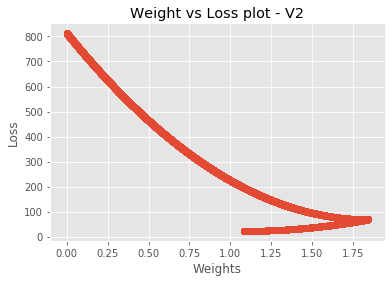

In [15]:
w_v2,b_v2 = train_v2(X,y,iteration = 200000, lr = 0.0001)

#### Note:
The number of iterations **almost doubles** for our regular code of `fitting a straight line` compared to `gradient descent`.